<a href="https://colab.research.google.com/github/ganel1113s/fyp/blob/main/Federated_Learning_with_Flower.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install -q flwr[simulation] flwr-datasets[vision] torch torchvision matplotlib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.1/65.1 MB 37.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.8/40.8 MB 60.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.9/3.9 MB 105.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 28.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 15.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 110.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 82.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.3/47.3 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 512.2/512.2 kB 36.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.7/78.7 kB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 9.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 11.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1

In [2]:
!pip install -q fsspec==2024.6.1

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 177.6/177.6 kB 4.2 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2024.10.0 requires fsspec==2024.10.0, but you have fsspec 2024.6.1 which is incompatible.


In [3]:
! pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 364.4/364.4 kB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.5/233.5 kB 18.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 5.8 MB/s eta 0:00:00


In [4]:
import flwr

In [5]:
import zipfile
import os

from collections import OrderedDict
from typing import List, Tuple

import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
from datasets.utils.logging import disable_progress_bar
from torch.utils.data import DataLoader,Dataset

from flwr.client import Client, ClientApp, NumPyClient
from flwr.server import ServerApp, ServerConfig, ServerAppComponents
from flwr.server.strategy import FedAvg, FedAdagrad
from flwr.simulation import run_simulation,start_simulation
from flwr_datasets import FederatedDataset
from flwr.common import ndarrays_to_parameters, NDArrays, Scalar, Context,Metrics

DEVICE = torch.device("cuda")  # Try "cuda" to train on GPU
print(f"Training on {DEVICE}")
print(f"Flower {flwr.__version__} / PyTorch {torch.__version__}")
disable_progress_bar()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Training on cuda
Flower 1.13.1 / PyTorch 2.5.1+cu121


In [6]:
import optuna

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [7]:
import pandas as pd
final_df = pd.read_parquet('/content/drive/MyDrive/FYP/N-BaIoT_small_unbalanced_(1).parquet')

In [ ]:
final_df

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,MI_dir_L5_weight,MI_dir_L5_mean,MI_dir_L5_variance,MI_dir_L3_weight,MI_dir_L3_mean,MI_dir_L3_variance,MI_dir_L1_weight,MI_dir_L1_mean,MI_dir_L1_variance,MI_dir_L0.1_weight,...,HpHp_L0.01_weight,HpHp_L0.01_mean,HpHp_L0.01_std,HpHp_L0.01_magnitude,HpHp_L0.01_radius,HpHp_L0.01_covariance,HpHp_L0.01_pcc,client_id,label,attack_type
0,1.000000,75.000000,0.000000,1.000000,75.000000,0.000000,1.000000,75.000000,0.000000,1.000000,...,1.0,75.0,0.0,75.0,0.0,0.0,0.0,1,1,mirai
1,1.106002,61.437635,19.497725,1.260128,63.096451,36.858761,1.638356,65.844478,53.509247,1.956106,...,1.0,60.0,0.0,60.0,0.0,0.0,0.0,1,1,mirai
2,2.105991,60.754994,10.754895,2.260121,61.726414,22.915699,2.638352,63.629278,41.267511,2.956106,...,1.0,60.0,0.0,60.0,0.0,0.0,0.0,1,1,mirai
3,3.105975,60.511916,7.416684,3.260111,61.196857,16.520386,3.638348,62.631771,32.550346,3.956106,...,1.0,60.0,0.0,60.0,0.0,0.0,0.0,1,1,mirai
4,4.105965,60.387240,5.658644,4.260104,60.915911,12.899777,4.638346,62.064377,26.703999,4.956105,...,1.0,60.0,0.0,60.0,0.0,0.0,0.0,1,1,mirai
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
205108,1.000000,60.000000,0.000000,1.000000,60.000000,0.000000,1.000000,60.000000,0.000000,1.000000,...,1.0,60.0,0.0,60.0,0.0,0.0,0.0,2,1,gafgyt
205109,1.000000,60.000000,0.000000,1.000000,60.000000,0.000000,1.000000,60.000000,0.000000,1.000000,...,1.0,60.0,0.0,60.0,0.0,0.0,0.0,2,1,gafgyt
205110,1.000000,60.000000,0.000000,1.000000,60.000000,0.000000,1.000000,60.000000,0.000000,1.000000,...,1.0,60.0,0.0,60.0,0.0,0.0,0.0,2,1,gafgyt
205111,1.000000,60.000000,0.000000,1.000000,60.000000,0.000000,1.000000,60.000000,0.000000,1.000000,...,1.0,60.0,0.0,60.0,0.0,0.0,0.0,2,1,gafgyt


## **Unzip Data file**

In [ ]:
import zipfile
import os

# Define the path to the uploaded zip file
zip_file_path = '/content/drive/MyDrive/FYP/N-BaIoT.zip'

# Unzip the file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall('/content/N-BaIoT')  # Extract to the default Colab directory


## **Create Parquet file**

In [ ]:
file_lst = []
file_path = '/content/N-BaIoT'
for file in os.listdir('/content/N-BaIoT'):
  if file[0].isdigit():
    file_lst.append(os.path.join(file_path,file))

In [ ]:
file_lst

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


['/content/N-BaIoT/1.mirai.scan.csv',
 '/content/N-BaIoT/9.mirai.udp.csv',
 '/content/N-BaIoT/1.mirai.udpplain.csv',
 '/content/N-BaIoT/5.mirai.syn.csv',
 '/content/N-BaIoT/8.mirai.udp.csv',
 '/content/N-BaIoT/8.mirai.syn.csv',
 '/content/N-BaIoT/3.gafgyt.tcp.csv',
 '/content/N-BaIoT/3.benign.csv',
 '/content/N-BaIoT/9.mirai.syn.csv',
 '/content/N-BaIoT/9.mirai.scan.csv',
 '/content/N-BaIoT/6.benign.csv',
 '/content/N-BaIoT/1.gafgyt.combo.csv',
 '/content/N-BaIoT/4.mirai.ack.csv',
 '/content/N-BaIoT/9.gafgyt.combo.csv',
 '/content/N-BaIoT/2.mirai.udpplain.csv',
 '/content/N-BaIoT/7.gafgyt.junk.csv',
 '/content/N-BaIoT/6.mirai.ack.csv',
 '/content/N-BaIoT/5.mirai.udpplain.csv',
 '/content/N-BaIoT/9.gafgyt.junk.csv',
 '/content/N-BaIoT/2.mirai.scan.csv',
 '/content/N-BaIoT/9.mirai.ack.csv',
 '/content/N-BaIoT/3.gafgyt.udp.csv',
 '/content/N-BaIoT/2.mirai.ack.csv',
 '/content/N-BaIoT/2.gafgyt.junk.csv',
 '/content/N-BaIoT/1.mirai.syn.csv',
 '/content/N-BaIoT/8.mirai.scan.csv',
 '/content/

In [ ]:
os.path.splitext(os.path.basename(file_lst[0]))[0]

'1.mirai.scan'

In [ ]:
import pandas as pd
df = pd.read_csv('/content/N-BaIoT/1.benign.csv').iloc[:20000]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
import pandas as pd

df_lst = []

for file in file_lst:
    # Read each CSV file into a DataFrame
    # Unbalanced benign and attack data
    if 'benign' in file:
      df = pd.read_csv(file).iloc[:16000]
    else:
      df = pd.read_csv(file).iloc[:800]
    # Add a feature column with the file name (without extension)
    file_name = os.path.splitext(os.path.basename(file))[0]
    df['client_id'] = int(file_name[0])  # Use file name without extension
    df['label'] = 0 if file_name.split('.')[1] == 'benign' else 1
    df['attack_type'] = file_name.split('.')[1]

    # Append the DataFrame to the list
    df_lst.append(df)

# Concatenate all DataFrames along the columns (axis=1)
final_df = pd.concat(df_lst)

# Display or save the final concatenated DataFrame
#print(final_df)


In [ ]:
final_df = final_df.reset_index(drop=True)

In [ ]:
final_df.to_parquet('N-BaIoT_small_unbalanced.parquet')

In [ ]:
final_df['client_id'].unique()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


array([4, 9, 8, 5, 3, 1, 2, 6, 7])

In [ ]:
del df_lst

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
final_df.loc[final_df['label'] == 1]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,MI_dir_L5_weight,MI_dir_L5_mean,MI_dir_L5_variance,MI_dir_L3_weight,MI_dir_L3_mean,MI_dir_L3_variance,MI_dir_L1_weight,MI_dir_L1_mean,MI_dir_L1_variance,MI_dir_L0.1_weight,...,HpHp_L0.01_weight,HpHp_L0.01_mean,HpHp_L0.01_std,HpHp_L0.01_magnitude,HpHp_L0.01_radius,HpHp_L0.01_covariance,HpHp_L0.01_pcc,client_id,label,attack_type
0,1.000000,98.000000,0.000000e+00,1.000000,98.000000,0.000000e+00,1.000000,98.000000,0.000000,1.000000,...,1.000000,98.00000,0.0,98.000000,0.000000e+00,0.0,0.0,5,1,gafgyt
1,1.027124,98.000000,1.818989e-12,1.114820,98.000000,1.818989e-12,1.486040,98.000000,0.000000,1.930395,...,1.992811,98.00000,0.0,138.592929,0.000000e+00,0.0,0.0,5,1,gafgyt
2,1.029968,98.000000,0.000000e+00,1.133728,98.000000,3.637979e-12,1.732886,98.000000,0.000000,2.798650,...,2.978774,98.00000,0.0,138.592929,5.456968e-12,0.0,0.0,5,1,gafgyt
3,1.338152,74.086423,1.933753e+02,1.581141,77.761456,2.380347e+02,2.386844,84.593174,249.275446,3.736997,...,1.000000,66.00000,0.0,102.941731,0.000000e+00,0.0,0.0,5,1,gafgyt
4,2.311785,74.049039,1.097295e+02,2.562374,76.293499,1.485053e+02,3.377363,81.456652,198.855685,4.735510,...,1.999960,70.00008,4.0,105.550988,1.600000e+01,0.0,0.0,5,1,gafgyt
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
205108,25.182455,60.015546,7.459553e-01,43.207391,60.062025,2.973347e+00,180.482445,60.102667,4.883858,2197.464921,...,1.000000,60.00000,0.0,60.000000,0.000000e+00,0.0,0.0,4,1,mirai
205109,26.182350,60.014952,7.174734e-01,44.207284,60.060622,2.906173e+00,181.482296,60.102101,4.857004,2198.464740,...,1.000000,60.00000,0.0,60.000000,0.000000e+00,0.0,0.0,4,1,mirai
205110,27.013672,60.014399,6.909217e-01,45.036181,60.059276,2.841723e+00,182.247853,60.101541,4.830411,2199.180572,...,1.000000,60.00000,0.0,60.000000,0.000000e+00,0.0,0.0,4,1,mirai
205111,28.013494,60.013885,6.662650e-01,46.036002,60.057989,2.780069e+00,183.247612,60.100987,4.804107,2200.180281,...,1.000000,60.00000,0.0,60.000000,0.000000e+00,0.0,0.0,4,1,mirai


In [ ]:
final_df.loc[final_df['label'] == 0]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,MI_dir_L5_weight,MI_dir_L5_mean,MI_dir_L5_variance,MI_dir_L3_weight,MI_dir_L3_mean,MI_dir_L3_variance,MI_dir_L1_weight,MI_dir_L1_mean,MI_dir_L1_variance,MI_dir_L0.1_weight,...,HpHp_L0.01_weight,HpHp_L0.01_mean,HpHp_L0.01_std,HpHp_L0.01_magnitude,HpHp_L0.01_radius,HpHp_L0.01_covariance,HpHp_L0.01_pcc,client_id,label,attack_type
8000,1.000000,60.000000,0.000000e+00,1.000000,60.000000,0.000000e+00,1.000000,60.000000,0.000000e+00,1.000000,...,1.000000,60.000000,0.000000,60.000000,0.000000e+00,0.000000e+00,0.000000e+00,4,0,benign
8001,1.000000,60.000000,0.000000e+00,1.000000,60.000000,0.000000e+00,1.000000,60.000000,0.000000e+00,1.000000,...,1.000000,60.000000,0.000000,60.000000,0.000000e+00,0.000000e+00,0.000000e+00,4,0,benign
8002,1.000000,342.000000,0.000000e+00,1.000000,342.000000,0.000000e+00,1.000000,342.000000,0.000000e+00,1.000000,...,6.249414,449.603272,122.911136,449.603272,1.510715e+04,0.000000e+00,0.000000e+00,4,0,benign
8003,1.963325,342.000000,4.370000e-11,1.977831,342.000000,0.000000e+00,1.992555,342.000000,0.000000e+00,1.999253,...,7.248947,434.759286,120.000074,434.759286,1.440002e+04,0.000000e+00,0.000000e+00,4,0,benign
8004,1.000000,60.000000,0.000000e+00,1.000000,60.000000,0.000000e+00,1.000000,60.000000,0.000000e+00,1.000000,...,1.000000,60.000000,0.000000,60.000000,0.000000e+00,0.000000e+00,0.000000e+00,4,0,benign
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
198708,1.999989,90.000000,9.090000e-13,1.999994,90.000000,3.540000e-07,2.000992,89.985102,4.464909e-01,3.401060,...,5.258578,86.559368,9.559342,105.321512,9.138102e+01,-1.133354e-03,-2.951356e-03,5,0,benign
198709,2.992372,90.000000,2.730000e-12,2.995420,90.000000,2.360000e-07,2.999466,89.990069,2.976835e-01,4.400801,...,5.258567,86.559382,9.559324,105.482638,9.138197e+01,-6.525335e-02,-9.790176e-03,5,0,benign
198710,1.000000,60.000003,7.540000e-05,1.000088,60.002642,7.925054e-02,1.092577,62.541141,6.977683e+01,4.107976,...,6.222579,60.000000,0.000002,84.852814,2.770000e-12,7.810000e-30,7.010000e-18,5,0,benign
198711,1.000000,73.000000,0.000000e+00,1.000000,73.000000,0.000000e+00,1.000000,73.000000,2.250000e-09,1.330809,...,1.000000,73.000000,0.000000,73.000000,0.000000e+00,0.000000e+00,0.000000e+00,5,0,benign


## **Load from pandas dataframe**

In [ ]:
from datasets import Dataset
from flwr_datasets.partitioner import PathologicalPartitioner

dataset = load_dataset('parquet',data_files = '/content/drive/MyDrive/FYP/N-BaIoT.parquet')

partitioner = PathologicalPartitioner(num_partitions=9,partition_by = 'client_id',num_classes_per_partition=1,class_assignment_mode = 'deterministic',shuffle = False)
partitioner.dataset = dataset
partition = partitioner.load_partition(partition_id=0)

In [ ]:
dataset = Dataset.from_pandas(final_df) ## High RAM and runtime

In [ ]:
class CustomDataset(Dataset):
    def __init__(self, dataset, transform=None):
        """
        Args:
            dataset: a Huggingface dataset after partition
            transform (callable, optional): Optional transform to be applied on a sample.
        """
        self.dataset = dataset.set_format('torch')
        self.data = self.dataset.remove_columns('label')
        self.labels = self.dataset['label']
        self.transform = transform

    def __len__(self):
        # Return the number of samples
        return len(self.data)

    def __getitem__(self, idx):
        # Get the data and label for a given index
        sample = self.data[idx]
        label = self.labels[idx]

        # Apply optional transformation (e.g., normalization)
        if self.transform:
            sample = self.transform(sample)

        return sample, label


In [ ]:
def min_max_normalize(example,feature_columns,min_values,max_values):
  for col in feature_columns:
    min_val,max_val = min_values[col],max_values[col]
    if min_val == max_val:
      example[col] = 0
    else:
      example[col] = (example[col] - min_values[col]) / (max_values[col] - min_values[col])
  return example

In [ ]:
NUM_CLIENTS = 9
BATCH_SIZE = 32


def load_datasets(dataset,model_type:str,partition_id: int):
    partitioner = PathologicalPartitioner(num_partitions=9,partition_by = 'client_id',num_classes_per_partition=1,class_assignment_mode = 'deterministic',shuffle = False)
    partitioner.dataset = dataset
    partition = partitioner.load_partition(partition_id)
    # Split in chronological order and leave 2% space between train and test
    # if autoencoder is used, split the benign data into train, validation/threshold-selection and test set, with a ratio of 39:39:20, with the same amount of attack data
    partition_train_test = {}
    if model_type == 'Autoencoder':
      # select normal data profile to train
      partition_benign = partition.filter(lambda packet: packet["label"]==1).remove_columns(['client_id','__index_level_0__'])
      partition_attack = partition.filter(lambda packet: packet["label"]==0).remove_columns(['client_id','__index_level_0__'])
      partition_train_test['train'] = partition_benign.select([i for i in range(int(0.39*len(partition_benign)))])
      partition_train_test['val'] = partition_benign.select([i for i in range(int(0.39*len(partition_benign)),int(0.78*len(partition_benign)))])
      partition_train_test['test'] = concatenate_datasets([partition_benign.select([i for i in range(int(0.8*len(partition_benign)),int(len(partition_benign)))]),partition_attack])
    partitioni_train_test['train']
    def apply_transforms(batch):

      mean = batch.mean()
      std = batch.std()
      batch = (batch - mean) / std
      return batch
    # Create train/val for each partition and wrap it into DataLoader
    trainloader = DataLoader(
        partition_train_test["train"].with_transform(apply_transforms), batch_size=BATCH_SIZE, shuffle=False
    )
    valloader = DataLoader(partition_train_test["val"].with_transform(apply_transforms), batch_size=BATCH_SIZE,shuffle = False)
    testset = partition_train_test['test'].with_transform(apply_transforms)
    testloader = DataLoader(testset, batch_size=BATCH_SIZE,shuffle = False)
    return trainloader, valloader, testloader

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [8]:
from sklearn.preprocessing import MinMaxScaler
from torch.utils.data import TensorDataset
from sklearn.decomposition import PCA

NUM_CLIENTS = 9
BATCH_SIZE = 32
ENABLE_PCA = False

def load_datasets(dataset,model_type:str,partition_id: int,label_col_num:int):
    partition = dataset.loc[dataset['client_id'] == partition_id+1]
    feature_columns = partition.columns[:-label_col_num]
    partition_train_test = {}
    if model_type == 'Autoencoder':
      # select normal data profile to train
      partition_benign = partition.loc[partition['label']==0]
      #print(partition_benign.index)
      partition_attack = partition.loc[partition['label']==1]
      partition_train_test['train'] = partition_benign.iloc[:int(0.39*len(partition_benign))-1]
      #print(partition_train_test['train'].index)
      #print(int(0.39*len(partition_benign))-1)
      partition_train_test['val'] = partition_benign.iloc[int(0.39*len(partition_benign)):int(0.78*len(partition_benign))]
      #print(len(partition_train_test['val']))
      #partition_train_test['test_benign'] = pd.concat([partition_benign.iloc[int(0.8*len(partition_benign)):],partition_attack.iloc[:len(partition_benign)]])
      partition_train_test['test_benign'] = partition_benign.iloc[int(0.8*len(partition_benign)):]
      #print(len(partition_train_test['test_benign']))
      partition_train_test['test_attack'] = partition_attack.iloc[:len(partition_benign)]
      #print(len(partition_train_test['test_attack']))
    scaler = MinMaxScaler()
    scaler.fit(partition_train_test['train'][feature_columns])
    X_train = torch.tensor(scaler.transform(partition_train_test['train'][feature_columns]))
    #print(f'train_max:{X_train.max()}')
    y_train = torch.tensor(partition_train_test['train']['label'].values)
    if ENABLE_PCA:
      pca = PCA(n_components=35)
      X_train = torch.tensor(pca.fit_transform(X_train.numpy()))
      '''
      explained_variance = pca.explained_variance_ratio_
      plt.figure(figsize=(10, 6))
      plt.bar(range(1, 51), explained_variance, alpha=0.7, color='blue', align='center')
      plt.xlabel('Principal Component')
      plt.ylabel('Explained Variance Ratio')
      plt.title('Explained Variance by Principal Component (Top 50)')
      plt.xticks(range(1, 51))
      plt.show()
      '''

    X_val = torch.tensor(scaler.transform(partition_train_test['val'][feature_columns]))
    y_val = torch.tensor(partition_train_test['val']['label'].values)
    if ENABLE_PCA:
      pca = PCA(n_components=35)
      X_val = torch.tensor(pca.fit_transform(X_val.numpy()))
    #print(f'val_max:{X_val.max()}')
    X_test_benign = torch.tensor(scaler.transform(partition_train_test['test_benign'][feature_columns]))
    y_test_benign = torch.tensor(partition_train_test['test_benign']['label'].values)
    if ENABLE_PCA:
      pca = PCA(n_components=35)
      X_test_benign = torch.tensor(pca.fit_transform(X_test_benign.numpy()))
    #print(f'benign_max:{X_test_benign.max()}')
    X_test_attack = torch.tensor(scaler.transform(partition_train_test['test_attack'][feature_columns]))
    y_test_attack = torch.tensor(partition_train_test['test_attack']['label'].values)
    if ENABLE_PCA:
      pca = PCA(n_components=35)
      X_test_attack = torch.tensor(pca.fit_transform(X_test_attack.numpy()))
    #print(f'attack_max:{X_test_attack.max()}')
    train_dataset = TensorDataset(X_train, y_train)
    val_dataset = TensorDataset(X_val, y_val)
    test_benign_dataset = TensorDataset(X_test_benign, y_test_benign)
    test_attack_dataset = TensorDataset(X_test_attack, y_test_attack)
    trainloader = DataLoader(train_dataset, batch_size=BATCH_SIZE)
    valloader = DataLoader(val_dataset, batch_size=BATCH_SIZE)
    benign_testloader = DataLoader(test_benign_dataset, batch_size=BATCH_SIZE)
    attack_testloader = DataLoader(test_attack_dataset, batch_size=BATCH_SIZE)
    return trainloader, valloader, benign_testloader, attack_testloader

In [ ]:
int(0.39*16000)

6240

In [ ]:
partition = final_df.loc[final_df['client_id'] == 3]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
partition

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,MI_dir_L5_weight,MI_dir_L5_mean,MI_dir_L5_variance,MI_dir_L3_weight,MI_dir_L3_mean,MI_dir_L3_variance,MI_dir_L1_weight,MI_dir_L1_mean,MI_dir_L1_variance,MI_dir_L0.1_weight,...,HpHp_L0.01_weight,HpHp_L0.01_mean,HpHp_L0.01_std,HpHp_L0.01_magnitude,HpHp_L0.01_radius,HpHp_L0.01_covariance,HpHp_L0.01_pcc,client_id,label,attack_type
4800,1.000000,98.000000,0.000000e+00,1.000000,98.000000,0.000000,1.000000,98.000000,0.000000,1.000000,...,1.000000,98.000000,0.000000,98.000000,0.000000e+00,0.0,0.0,3,1,gafgyt
4801,1.028978,98.000000,1.818989e-12,1.119465,98.000000,0.000000,1.492508,98.000000,0.000000,1.931625,...,1.992943,98.000000,0.000001,138.592929,1.818989e-12,0.0,0.0,3,1,gafgyt
4802,1.361630,74.498759,1.997314e+02,1.597758,77.971939,239.774725,2.210844,83.525892,253.671654,2.891647,...,1.000000,66.000000,0.000000,116.498927,0.000000e+00,0.0,0.0,3,1,gafgyt
4803,2.342684,78.127606,1.321550e+02,2.584382,79.917496,152.993537,3.204657,83.361790,174.573836,3.890837,...,1.999972,74.500119,8.500000,121.516533,7.225000e+01,0.0,0.0,3,1,gafgyt
4804,1.000000,60.000000,0.000000e+00,1.000000,60.000000,0.000000,1.000000,60.000000,0.000000,1.000000,...,1.000000,60.000000,0.000000,60.000000,0.000000e+00,0.0,0.0,3,1,gafgyt
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
158708,153.982881,74.044126,1.211806e+00,259.508742,74.059865,4.200923,792.810811,74.160090,31.242268,3802.920412,...,1.000000,74.000000,0.000000,74.000000,0.000000e+00,0.0,0.0,3,1,gafgyt
158709,154.977537,74.043841,1.203999e+00,260.503338,74.059636,4.184811,793.805308,74.159889,31.202943,3803.917773,...,1.000000,74.000000,0.000000,74.000000,0.000000e+00,0.0,0.0,3,1,gafgyt
158710,154.619202,74.043558,1.196225e+00,260.130984,74.059406,4.168737,793.408907,74.159687,31.163647,3804.248087,...,1.000000,74.000000,0.000000,74.000000,0.000000e+00,0.0,0.0,3,1,gafgyt
158711,155.616519,74.043278,1.188550e+00,261.128276,74.059179,4.152786,794.406154,74.159486,31.124451,3805.246766,...,1.000000,74.000000,0.000000,74.000000,0.000000e+00,0.0,0.0,3,1,gafgyt


In [ ]:
partition_benign = partition.loc[partition['label']==0]

In [ ]:
int(0.39*len(partition_benign))-1

6239

In [ ]:
partition_validation = partition_benign.iloc[int(0.39*len(partition_benign)):int(0.78*len(partition_benign))]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
partition_validation

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,MI_dir_L5_weight,MI_dir_L5_mean,MI_dir_L5_variance,MI_dir_L3_weight,MI_dir_L3_mean,MI_dir_L3_variance,MI_dir_L1_weight,MI_dir_L1_mean,MI_dir_L1_variance,MI_dir_L0.1_weight,...,HpHp_L0.01_weight,HpHp_L0.01_mean,HpHp_L0.01_std,HpHp_L0.01_magnitude,HpHp_L0.01_radius,HpHp_L0.01_covariance,HpHp_L0.01_pcc,client_id,label,attack_type
11840,1.000000,60.000000,0.000000e+00,1.000000,60.000000,0.000000e+00,1.000000,60.000001,1.550000e-05,2.007487,...,1.750720,189.499558,149.461470,301.108091,2.233873e+04,0.000000e+00,0.000000e+00,3,0,benign
11841,1.999990,60.000000,9.090000e-13,1.999994,60.000000,4.550000e-13,1.999998,60.000000,7.730000e-06,3.007486,...,1.000000,60.000000,0.000000,60.000000,0.000000e+00,0.000000e+00,0.000000e+00,3,0,benign
11842,2.974994,60.000000,9.090000e-13,2.984958,60.000000,9.090000e-13,2.994974,60.000000,5.150000e-06,4.006730,...,1.000000,60.000000,0.000000,60.000000,0.000000e+00,0.000000e+00,0.000000e+00,3,0,benign
11843,1.740580,233.505431,2.229451e+04,2.295954,191.535720,2.242214e+04,3.267828,152.416119,1.936893e+04,4.896833,...,1.000000,362.000000,0.000000,362.000000,0.000000e+00,0.000000e+00,0.000000e+00,3,0,benign
11844,1.000000,60.000037,1.103254e-02,1.000162,60.021357,6.449256e+00,1.135142,71.002438,3.201683e+03,4.560972,...,5.819758,60.000000,0.000001,84.852814,1.440000e-12,-9.820000e-29,-1.250000e-16,3,0,benign
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18075,2.991736,89.999180,2.458539e-02,3.005896,89.945372,1.635864e+00,3.731697,87.052958,7.972619e+01,8.617461,...,2.958406,80.070347,14.117067,100.659130,1.992941e+02,9.815244e+00,6.952750e-01,3,0,benign
18076,1.002223,60.066549,1.992033e+00,1.039867,61.148071,3.312406e+01,1.883325,72.688495,2.196569e+02,8.461064,...,4.578994,60.000000,0.000001,84.852814,1.870000e-12,-1.880000e-28,-2.060000e-16,3,0,benign
18077,1.000000,90.000000,0.000000e+00,1.000000,90.000000,0.000000e+00,1.000000,90.000000,2.290000e-08,1.731899,...,3.282982,83.094930,12.628227,102.881692,1.594746e+02,2.396143e+00,2.016126e-01,3,0,benign
18078,1.999997,90.000000,0.000000e+00,1.999998,90.000000,9.090000e-13,1.999999,90.000000,1.150000e-08,2.731899,...,3.282969,83.094906,12.628242,102.881668,1.594750e+02,-7.757184e+00,-6.526939e-01,3,0,benign


In [ ]:
trainloader, valid_loader, benign_test,attack_test = load_datasets(final_df,'Autoencoder',partition_id=3,label_col_num=3) ## Set label_col_num = 3 for N-BaIoT dataset
batch = next(iter(attack_test))
input,label = batch
print(input.shape)
print(label.shape)

train_max:1.0000000000000002
val_max:412221500098650.6
benign_max:1.7506662103331978
attack_max:4.0963259648715104e+19
torch.Size([32, 115])
torch.Size([32])


In [ ]:
trainloader, valid_loader, benign_test,attack_test = load_datasets(final_df,'Autoencoder',partition_id=3,label_col_num=3) ## Set label_col_num = 3 for N-BaIoT dataset
batch = next(iter(attack_test))
input,label = batch
print(input.shape)
print(label.shape)

train_max:1.0000000000000002
val_max:182.62415053012887
benign_max:1.7506662103331978
attack_max:62142.60815
torch.Size([32, 115])
torch.Size([32])


In [ ]:
trainloader, valid_loader, benign_test,attack_test = load_datasets(final_df,'Autoencoder',partition_id=3,label_col_num=3) ## Set label_col_num = 3 for N-BaIoT dataset
batch = next(iter(attack_test))
input,label = batch
print(input.shape)
print(label.shape)

train_max:1.0000000000000002
val_max:1.0400156669648448
benign_max:1.2056959090625972
attack_max:25.584204516080494
torch.Size([32, 115])
torch.Size([32])


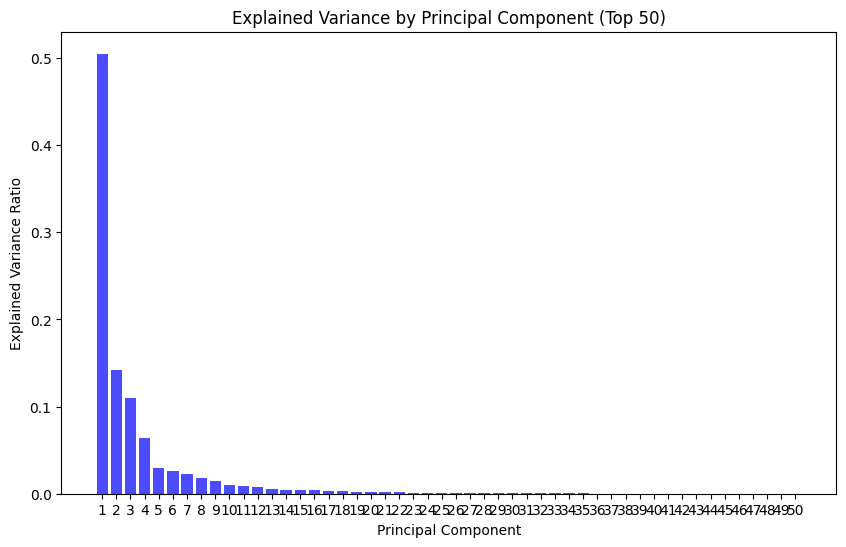

torch.Size([32, 115])
torch.Size([32])


In [ ]:
trainloader, valid_loader, benign_test,attack_test = load_datasets(final_df,'Autoencoder',partition_id=2,label_col_num=3) ## Set label_col_num = 3 for N-BaIoT dataset
batch = next(iter(attack_test))
input,label = batch
print(input.shape)
print(label.shape)

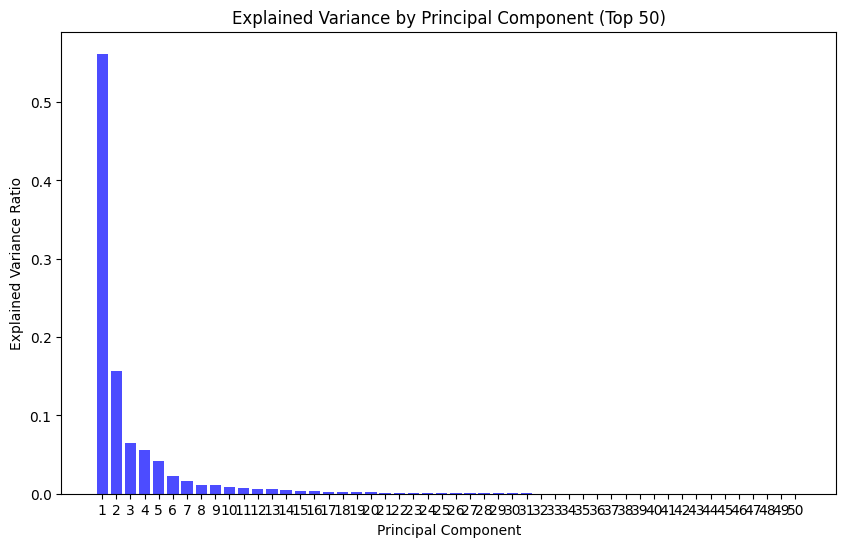

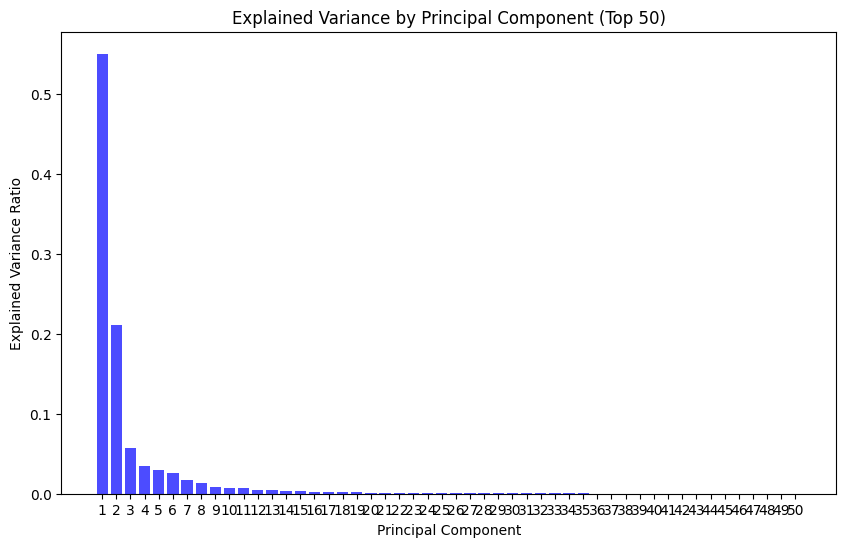

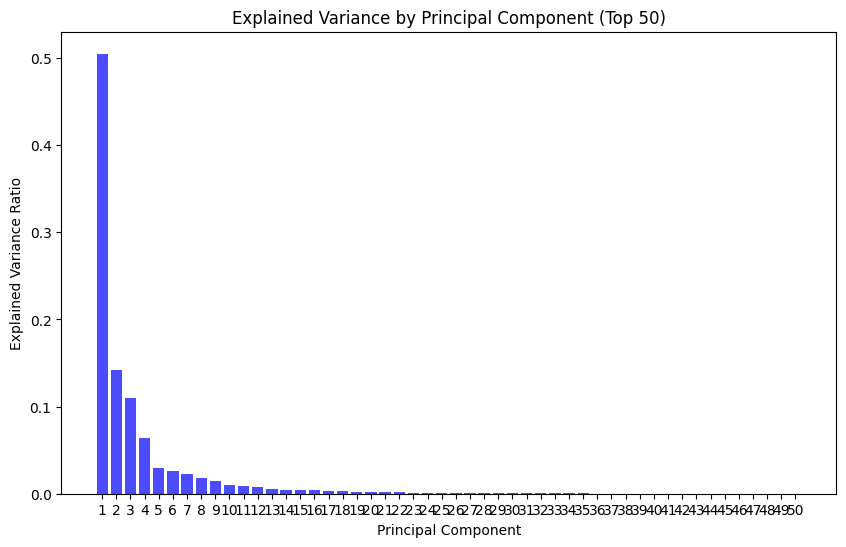

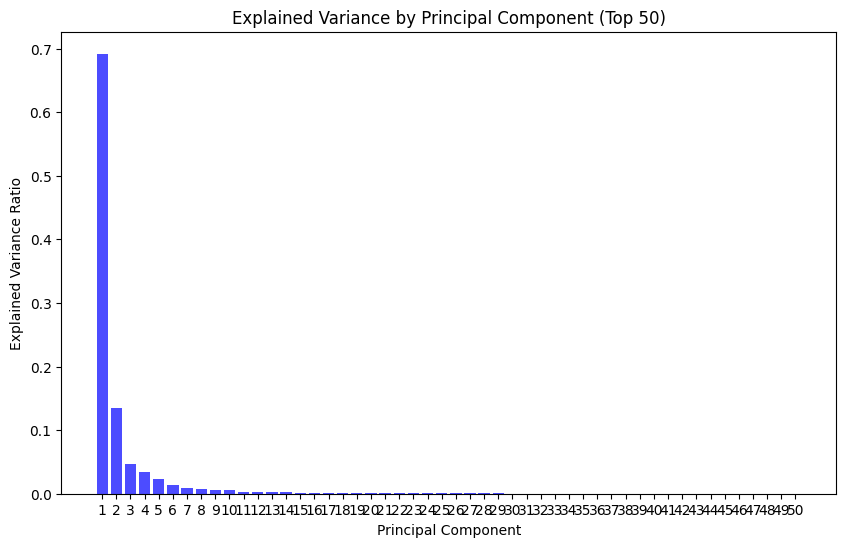

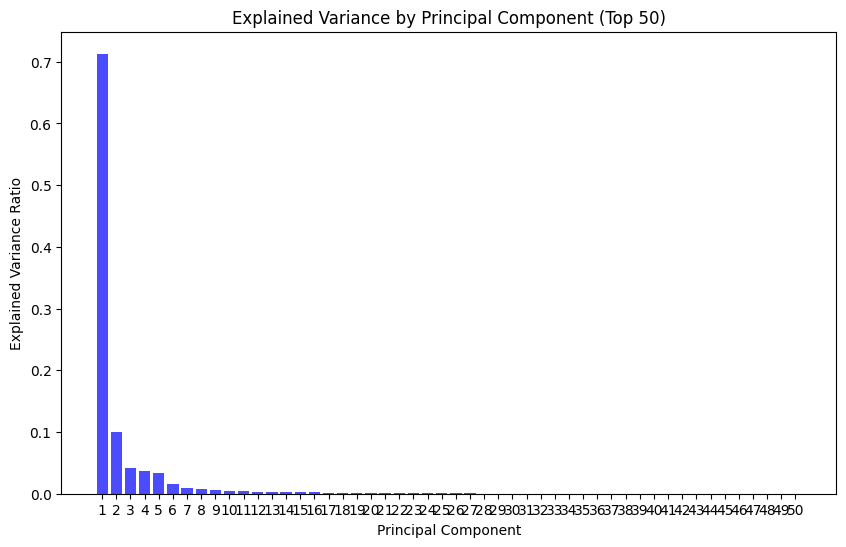

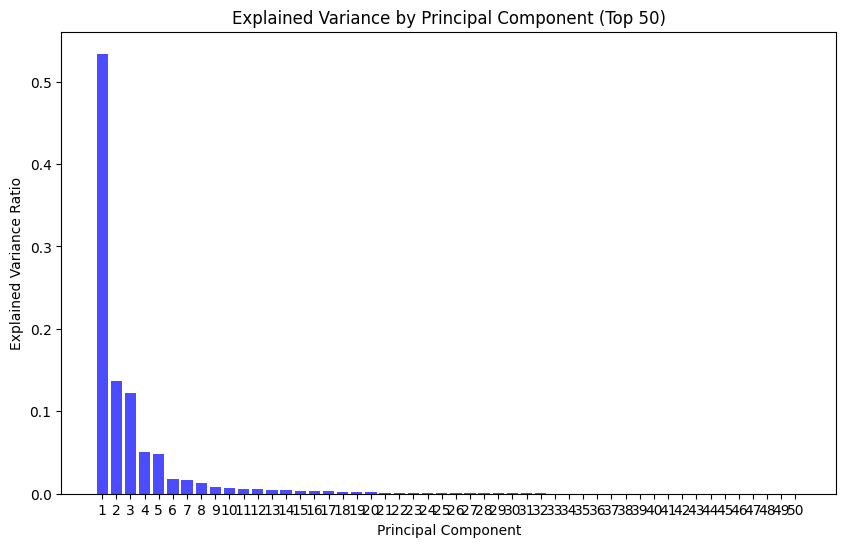

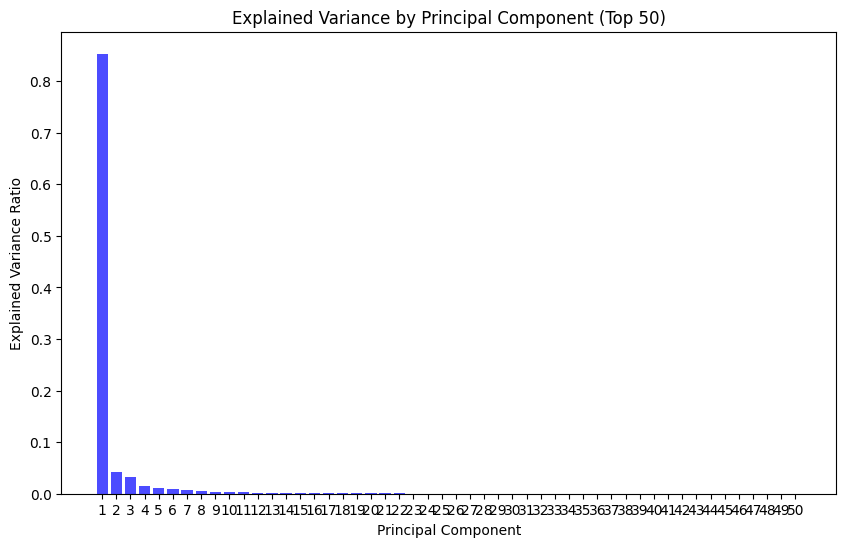

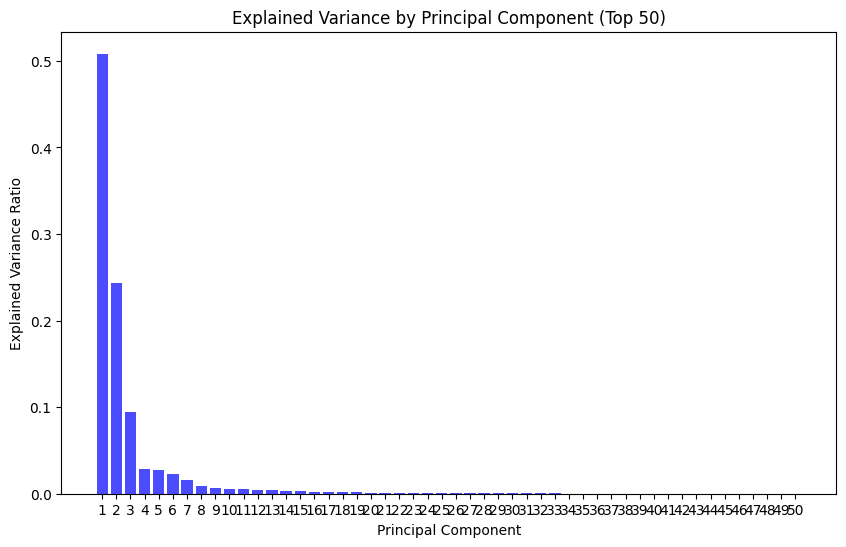

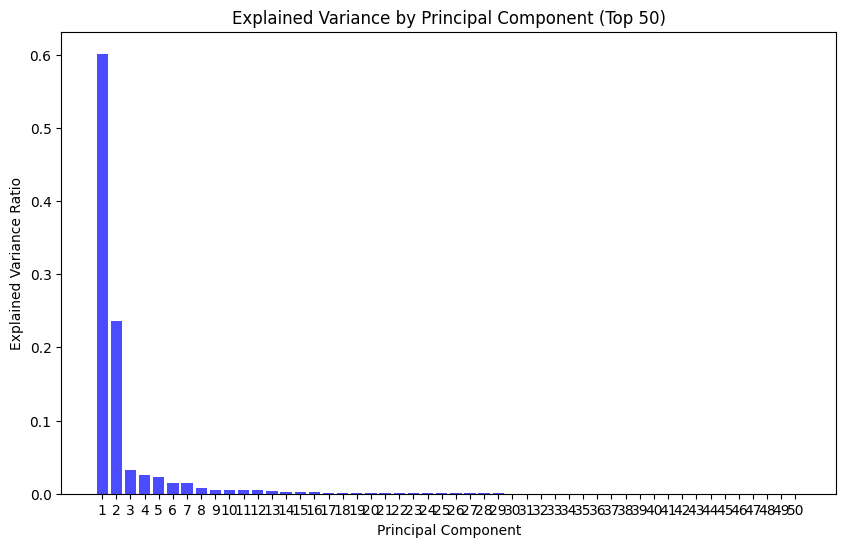

In [ ]:
for i in range(9):
  trainloader, valid_loader, benign_test,attack_test = load_datasets(final_df,'Autoencoder',partition_id=i,label_col_num=3) ## Set label_col_num = 3 for N-BaIoT dataset

In [ ]:
trainloader, valid_loader, benign_test,attack_test = load_datasets(final_df,'Autoencoder',partition_id=2,label_col_num=3) ## Set label_col_num = 3 for N-BaIoT dataset
batch = next(iter(attack_test))
input,label = batch
print(input.shape)
print(label.shape)

Index([ 5600,  5601,  5602,  5603,  5604,  5605,  5606,  5607,  5608,  5609,
       ...
       21590, 21591, 21592, 21593, 21594, 21595, 21596, 21597, 21598, 21599],
      dtype='int64', length=16000)
Index([ 5600,  5601,  5602,  5603,  5604,  5605,  5606,  5607,  5608,  5609,
       ...
       11829, 11830, 11831, 11832, 11833, 11834, 11835, 11836, 11837, 11838],
      dtype='int64', length=6239)
6239
6240
3200
4000
torch.Size([32, 115])
torch.Size([32])


In [ ]:
import torch
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

def plot_pca_2d(data):
    """
    Applies PCA to reduce the input tensor to 2D and plots the sample points.

    Parameters:
    data (torch.Tensor): A tensor of shape (n_samples, n_features), where
                         n_samples is the number of samples and n_features is the number of features.
    """
    # Check if input is a torch tensor, if not, raise an error
    '''
    if not isinstance(data, torch.Tensor):
        raise TypeError("Input data must be a torch.Tensor")
    '''

    # Convert tensor to numpy for use with sklearn PCA
    if isinstance(data, torch.Tensor):
        data = data.numpy()
    #data_np = data.numpy()

    # Apply PCA to reduce dimensionality to 2D
    pca = PCA(n_components=2)
    data_2d = pca.fit_transform(data)
    print(data_2d)
    # Plot the 2D projection of the data
    plt.figure(figsize=(8, 6))
    plt.scatter(data_2d[:, 0], data_2d[:, 1], c='blue', marker='o', edgecolor='k')
    plt.title('2D Visualization of Dimensionality-Reduced Data')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.grid(True)
    plt.show()

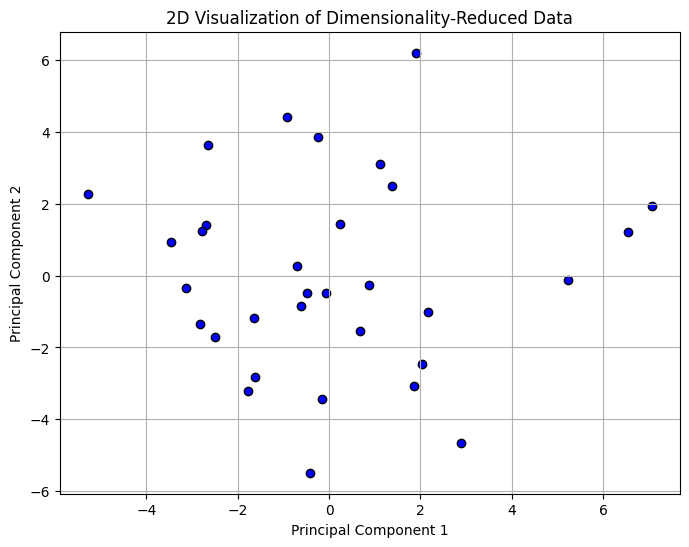

In [ ]:
data = torch.randn(32, 115)  # Replace this with your actual tensor data
plot_pca_2d(data)

Batch 186:
[[ 6.03170148e+05  4.68586379e+02]
 [ 6.03170148e+05  4.68586477e+02]
 [ 6.03170148e+05  4.68582468e+02]
 [ 6.03170148e+05  4.68586254e+02]
 [ 6.03170148e+05  4.68586354e+02]
 [ 6.03170148e+05  4.68586454e+02]
 [ 6.03170148e+05  4.68586550e+02]
 [ 6.03170148e+05  4.68586518e+02]
 [ 6.03170148e+05  4.68586619e+02]
 [ 6.03170148e+05  4.68586720e+02]
 [ 6.03170148e+05  4.68586822e+02]
 [ 6.03170148e+05  4.68586828e+02]
 [ 6.03170148e+05  4.68586927e+02]
 [ 6.03170148e+05  4.68587027e+02]
 [ 6.03170148e+05  4.68587123e+02]
 [ 6.03170148e+05  4.68582313e+02]
 [ 6.03170148e+05  4.68652511e+02]
 [ 6.03170148e+05  4.68643448e+02]
 [ 6.03170148e+05  4.68633075e+02]
 [ 6.03170148e+05  4.68582344e+02]
 [ 6.03170148e+05  4.68582331e+02]
 [ 6.03170148e+05  4.68582311e+02]
 [-7.49224148e+06  6.68011187e+03]
 [-8.55146893e+06 -1.75948319e+03]
 [ 6.03170148e+05  4.68582412e+02]
 [ 6.03170148e+05  4.68582395e+02]
 [ 6.03170148e+05  4.68582387e+02]
 [ 6.03170148e+05  4.68582472e+02]
 [ 6.0317

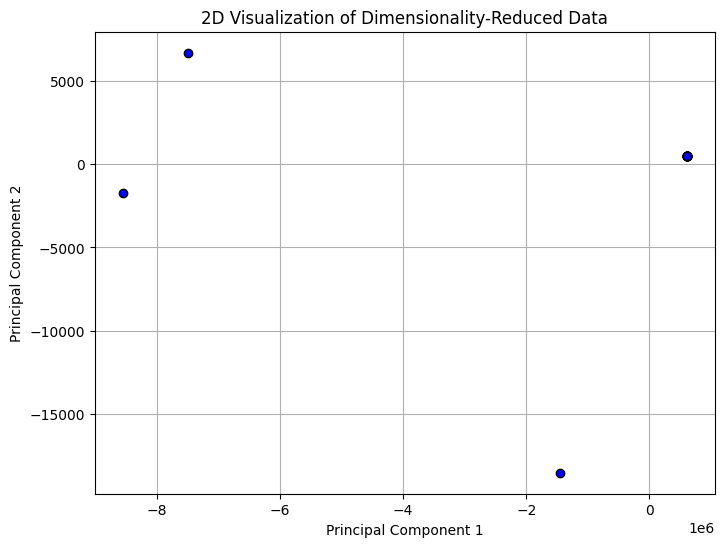

In [ ]:
torch.set_printoptions(threshold=float('inf'))

batch_index = 186

# Iterate through the dataloader and get the 30th batch
for idx, (inputs, targets) in enumerate(valid_loader):
    if idx == batch_index:
        # Access the 30th batch (remember indexing starts at 0, so it's batch_index-1)
        print(f"Batch {batch_index}:")
        #print("Inputs:", inputs)
        plot_pca_2d(inputs)

        break

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Batch 185:
[[-7.15536568e+00  2.82040821e+00]
 [-6.42221685e+00  1.92566261e+00]
 [-5.59391507e+00  1.43597688e+00]
 [-4.84043221e+00  1.11379068e+00]
 [-4.15689317e+00  9.04204323e-01]
 [-3.69478546e+00  6.12772041e-01]
 [-3.05522269e+00  5.43605652e-01]
 [-2.43536033e+00  5.18455574e-01]
 [-1.83615492e+00  5.27001837e-01]
 [-9.81654230e+00 -6.13861518e+00]
 [-1.96462986e+00 -2.89973397e-01]
 [-1.32461013e+00 -2.53101372e-01]
 [-7.49779738e-01 -2.10588021e-01]
 [-1.61563110e-01 -1.15127678e-01]
 [-2.06871815e-01 -4.79149789e-01]
 [ 3.58852468e-01 -3.73347705e-01]
 [ 9.04348551e-01 -2.55488080e-01]
 [ 1.41430662e+00 -1.46860516e-01]
 [ 1.51917466e+00 -3.07416051e-01]
 [ 2.05567730e+00 -1.56568836e-01]
 [ 2.58854123e+00  3.38061824e-03]
 [ 3.10999830e+00  1.63455419e-01]
 [ 2.28821123e+00 -6.74782100e-01]
 [ 2.82696105e+00 -5.04424300e-01]
 [ 3.36216642e+00 -3.22598029e-01]
 [ 3.88515805e+00 -1.40509355e-01]
 [ 3.73515572e+00 -3.97026974e-01]
 [ 4.26345861e+00 -2.02140242e-01]
 [ 4.7647

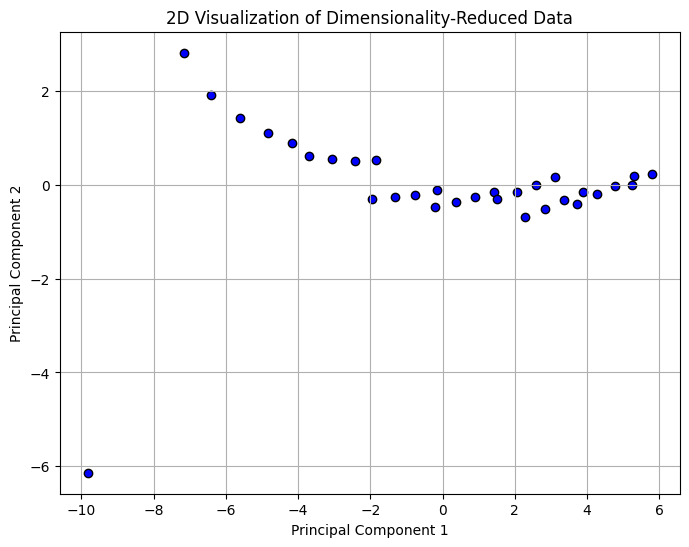

In [ ]:
batch_index = 185

# Iterate through the dataloader and get the 30th batch
for idx, (inputs, targets) in enumerate(valid_loader):
    if idx == batch_index:
        # Access the 30th batch (remember indexing starts at 0, so it's batch_index-1)
        print(f"Batch {batch_index}:")
        #print("Inputs:", inputs)
        #print("Targets:", targets)
        plot_pca_2d(inputs)
        break

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Batch 0:
[[ 2.73434890e-02 -4.91161544e-01]
 [-4.59704895e-01 -2.84947148e-01]
 [-6.74937620e-01 -2.54097875e-01]
 [ 3.71296343e+00 -1.33242293e-01]
 [-5.26785233e-01 -5.99622282e-01]
 [ 3.09409173e-01 -4.20979983e-01]
 [-4.31119208e-01 -4.10679731e-01]
 [-2.13827477e-01 -1.70356637e-01]
 [-2.59992832e-01 -4.15801382e-01]
 [-6.70731963e-01 -3.89240153e-01]
 [-4.68378408e-01 -1.59169447e-01]
 [-2.63354496e-01  2.30508604e+00]
 [-6.03733006e-01  2.33299807e+00]
 [-4.02223261e-01  2.55582143e+00]
 [-1.63369012e-01  8.61778155e-02]
 [-4.80817897e-01  2.07492426e-01]
 [-3.02638715e-01  4.47739078e-01]
 [-6.90796864e-01 -4.51528606e-01]
 [ 8.92436074e-02 -2.61299231e-01]
 [-3.41912209e-01 -8.71005601e-02]
 [-5.06971675e-01 -3.33555413e-02]
 [ 3.62051008e+00  1.32865521e-01]
 [-2.84399491e-01 -4.53286979e-01]
 [-5.16634538e-01 -3.87471759e-01]
 [ 8.42139739e-02 -1.50534107e-01]
 [-7.33323256e-01 -5.48524360e-01]
 [-3.76284531e-01 -3.89613339e-01]
 [-2.96481384e-01 -2.17969957e-01]
 [-6.119044

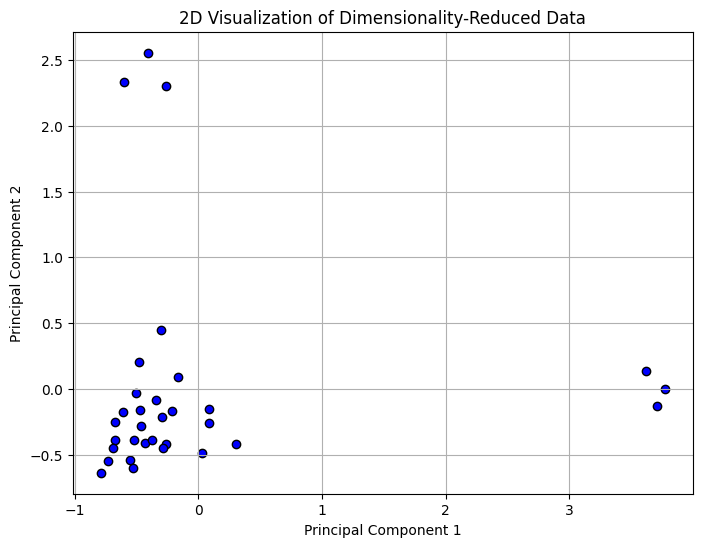

In [ ]:
batch_index = 0

# Iterate through the dataloader and get the 30th batch
for idx, (inputs, targets) in enumerate(valid_loader):
    if idx == batch_index:
        # Access the 30th batch (remember indexing starts at 0, so it's batch_index-1)
        print(f"Batch {batch_index}:")
        #print("Inputs:", inputs)
        #print("Targets:", targets)
        plot_pca_2d(inputs)
        break

In [ ]:
batch_index = 0

# Iterate through the dataloader and get the 30th batch
for idx, (inputs, targets) in enumerate(valid_loader):
    if idx == batch_index:
        # Access the 30th batch (remember indexing starts at 0, so it's batch_index-1)
        print(f"Batch {batch_index}:")
        #print("Inputs:", inputs)
        #print("Targets:", targets)
        plot_pca_2d(inputs)
        break

In [ ]:
input.max()

tensor(150.6598, dtype=torch.float64)

## **Create the Autoencoder model**

In [9]:
class Autoencoder(nn.Module):
    def __init__(self, input_size, hidden_size, latent_size):
        super(Autoencoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_size, hidden_size),
            nn.ReLU(),
            nn.Linear(hidden_size, latent_size)
        )
        self.decoder = nn.Sequential(
            nn.Linear(latent_size, hidden_size),
            nn.ReLU(),
            nn.Linear(hidden_size, input_size),
            nn.Sigmoid()
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

In [10]:
class Autoencoder_2_layers(nn.Module):
    def __init__(self, input_size,latent_size):
        super(Autoencoder_2_layers, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_size, latent_size),
            nn.ReLU(True),
        )
        self.decoder = nn.Sequential(
            nn.Linear(latent_size, input_size),
            nn.Sigmoid()
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

In [ ]:
autoencoder = Autoencoder_2_layers(115,29)
print(autoencoder)

Autoencoder_2_layers(
  (encoder): Sequential(
    (0): Linear(in_features=115, out_features=29, bias=True)
    (1): ReLU(inplace=True)
  )
  (decoder): Sequential(
    (0): Linear(in_features=29, out_features=115, bias=True)
    (1): Sigmoid()
  )
)


In [11]:
class Autoencoder_4_layers(nn.Module):
    def __init__(self, layer_sizes):
        """
        Initialize the Autoencoder with custom layer sizes.

        Parameters
        ----------
        layer_sizes : list of int
            A list of four integers specifying the number of neurons in each layer.
            Example: [115, 87, 58, 29]
        """
        super(Autoencoder_4_layers, self).__init__()

        # Ensure we have exactly four layers specified
        assert len(layer_sizes) == 4, "layer_sizes should contain exactly four values."

        # Encoder layers
        self.encoder = nn.Sequential(
            nn.Linear(layer_sizes[0], layer_sizes[1]),
            nn.ReLU(True),
            nn.Linear(layer_sizes[1], layer_sizes[2]),
            nn.ReLU(True),
            nn.Linear(layer_sizes[2], layer_sizes[3]),
            nn.ReLU(True)
        )

        # Decoder layers
        self.decoder = nn.Sequential(
            nn.Linear(layer_sizes[3], layer_sizes[2]),
            nn.ReLU(True),
            nn.Linear(layer_sizes[2], layer_sizes[1]),
            nn.ReLU(True),
            nn.Linear(layer_sizes[1], layer_sizes[0]),
            nn.Sigmoid()  # Using Sigmoid to keep the output in range (0, 1)
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

# Example usage
layer_sizes = [115, 87, 58, 29]
autoencoder = Autoencoder_4_layers(layer_sizes)
print(autoencoder)


Autoencoder_4_layers(
  (encoder): Sequential(
    (0): Linear(in_features=115, out_features=87, bias=True)
    (1): ReLU(inplace=True)
    (2): Linear(in_features=87, out_features=58, bias=True)
    (3): ReLU(inplace=True)
    (4): Linear(in_features=58, out_features=29, bias=True)
    (5): ReLU(inplace=True)
  )
  (decoder): Sequential(
    (0): Linear(in_features=29, out_features=58, bias=True)
    (1): ReLU(inplace=True)
    (2): Linear(in_features=58, out_features=87, bias=True)
    (3): ReLU(inplace=True)
    (4): Linear(in_features=87, out_features=115, bias=True)
    (5): Sigmoid()
  )
)


In [ ]:
class Net(nn.Module):
    def __init__(self) -> None:
        super(Net, self).__init__()
        self.conv1 = nn.Conv2d(3, 6, 5)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(6, 16, 5)
        self.fc1 = nn.Linear(16 * 5 * 5, 120)
        self.fc2 = nn.Linear(120, 84)
        self.fc3 = nn.Linear(84, 10)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = x.view(-1, 16 * 5 * 5)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x

In [ ]:
import torch
import pandas as pd

# Example: Assume `tensor_list` is a list of 32x115 tensors
tensor_list = [torch.randn(32, 115) for _ in range(10)]  # Replace with your actual tensors

# Step 1: Convert each tensor to a NumPy array and concatenate them along axis 0 (rows)
numpy_arrays = [tensor.numpy() for tensor in tensor_list]
concatenated_array = np.concatenate(numpy_arrays, axis=0)  # Shape will be (32 * number_of_tensors, 115)

# Step 2: Create a DataFrame from the concatenated array
df = pd.DataFrame(concatenated_array, columns=[f"feature_{i+1}" for i in range(115)])

In [ ]:
concatenated_array.shape

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


(320, 115)

In [12]:
from torch.utils.tensorboard import SummaryWriter
writer = SummaryWriter()

def train(net, trainloader, num_epochs: int, verbose=False):
    """Train the network on the training set."""
    criterion = torch.nn.MSELoss()
    optimizer = torch.optim.Adam(net.parameters())
    net.train()
    for epoch in range(num_epochs):
        correct, total, epoch_loss = 0, 0, 0.0
        for batch in trainloader:
            inputs = batch[0].float()
            has_nan = torch.isnan(inputs).any()
            if has_nan:
              print(f"Contains NaN: {has_nan}")

            # Check for inf values
            has_inf = torch.isinf(inputs).any()
            if has_inf:
              print(f"Contains Inf: {has_inf}")

            optimizer.zero_grad()
            outputs = net(inputs)
            loss = torch.sqrt(criterion(outputs, inputs))
            loss.backward()
            optimizer.step()
            # Metrics
            epoch_loss += loss
        epoch_loss /= len(trainloader)
        print(f'Epoch [{epoch+1}/{num_epochs}], Train Loss: {epoch_loss.item():.4f}')
    return epoch_loss.item()


def validation(net,valloader):
  criterion = torch.nn.MSELoss(reduction = 'none')
  net.eval()
  total_loss = 0.0
  loss_history = []
  batch_num = 0
  unreducedLoss_list = []
  with torch.no_grad():
    for batch in valloader:
      batch_num += 1
      inputs = batch[0].float()
      has_nan = torch.isnan(inputs).any()
      if has_nan:
        print(f"Contains NaN: {has_nan}")

      # Check for inf values
      has_inf = torch.isinf(inputs).any()
      if has_inf:
        print(f"Contains Inf: {has_inf}")
      outputs = net(inputs)
      # Raw loss with dimension 32*115
      unreducedLoss = criterion(outputs, inputs)
      unreducedLoss_list.append(unreducedLoss)
      # Raw loss reduced by the second dimension, mean of squared difference
      loss = torch.sqrt(unreducedLoss.mean(dim=1))
      '''
      if loss.sum().item() > 288:
        #print(inputs)
        print(batch_num)
        print(outputs)
        print(loss)
      '''
      total_loss += loss.sum().item()
      loss_history.extend(loss.tolist())
  total_loss/=len(valloader.dataset)
  unreducedLoss_array = np.concatenate([tensor.numpy() for tensor in unreducedLoss_list], axis=0)
  return total_loss,loss_history,unreducedLoss_array


def test(net, testloader,threshold):
    """Evaluate the network on the entire test set."""
    criterion = torch.nn.MSELoss(reduction = 'none')
    loss_distribution = []
    unreducedLoss_list = []
    net.eval()
    count_exceed_threshold,count_total,total_loss = 0.0,0.0,0.0
    #print(f'total_size:{len(testloader.dataset)}')
    with torch.no_grad():
        for batch in testloader:
            inputs, labels = [t.float() for t in batch]
            has_nan = torch.isnan(inputs).any()
            if has_nan:
              print(f"Contains NaN: {has_nan}")

            # Check for inf values
            has_inf = torch.isinf(inputs).any()
            if has_inf:
              print(f"Contains Inf: {has_inf}")
            outputs = net(inputs.float())
            # Raw loss with dimension 32*115
            unreducedLoss = criterion(outputs, inputs)
            unreducedLoss_list.append(unreducedLoss)
            # Raw loss reduced by the second dimension, mean of squared difference
            loss = torch.sqrt(unreducedLoss.mean(dim=1))
            #print(f'loss_dtype:{loss.dtype}')
            if torch.isinf(loss).any():
              print(inputs.dtype)
              inf_indices = torch.nonzero(torch.isinf(loss), as_tuple=False)
              print(f'index:{inf_indices}')
              print(f'inputs:{inputs[inf_indices]}')
              print(f'outputs:{outputs[inf_indices]}')
              print(f'loss:{loss}')
              for i in inf_indices:
                input,output = inputs[i],outputs[i]
                print(f'dimension:{input.shape}')
                SE = (output-input)**2
                print(f'SE:{SE}')
                inf_index = torch.nonzero(torch.isinf(SE), as_tuple=False)
                print(f'SE_inf_input:{input[:,inf_index]}')
                print(f'SE_inf_output:{output[:,inf_index]}')
                custom_MSE = torch.mean((output-input)**2)
                print(f'MSE:{custom_MSE}')
                print(f'RMSE:{torch.sqrt(custom_MSE)}')
            #print(f'shape of loss:{loss.shape}')
            #print(loss)
            ## find outlier in reconstruction loss from predefined threshold
            if threshold:
              count_exceed_threshold += (loss > threshold).sum().item()
            count_total += len(loss)
            total_loss += loss.sum().item()
            #print(f'total_loss_dtype:{total_loss.type()}')
            #print(loss.tolist())
            #print(f'loss:{loss}')
            #print(f'total_loss:{total_loss}')
            #print(loss.mean())
            loss_distribution.extend(loss.tolist())
            #total_loss += loss.item()
    exceed_threshold_proportion = count_exceed_threshold/count_total
    #print(f'number of loss:{len(loss_history)}')
    print(f'exceed threshold proportion:{exceed_threshold_proportion}')
    print(f'count_total:{count_total}')
    total_loss /= count_total
    unreducedLoss_array = np.concatenate([tensor.numpy() for tensor in unreducedLoss_list], axis=0)
    return total_loss,loss_distribution, exceed_threshold_proportion,unreducedLoss_array

# **Large validation reconstruction error on partition_id = 2, i.e. client_id = 3**

Epoch [1/1], Train Loss: 0.1753
187
tensor([[0.4321, 0.3781, 0.5663,  ..., 0.1236, 0.3771, 0.6237],
        [0.4403, 0.3867, 0.5827,  ..., 0.1360, 0.3743, 0.6277],
        [0.1238, 0.0094, 0.0014,  ..., 0.0067, 0.3850, 0.5373],
        ...,
        [0.2187, 0.0291, 0.0059,  ..., 0.0241, 0.3658, 0.5584],
        [1.0000, 0.0000, 0.0000,  ..., 0.0000, 1.0000, 1.0000],
        [0.1395, 0.0085, 0.0011,  ..., 0.0074, 0.3506, 0.5616]])
tensor([1.6857e+00, 1.7367e+00, 7.1462e-01, 1.6427e+00, 1.6909e+00, 1.7398e+00,
        1.7879e+00, 1.7692e+00, 1.8175e+00, 1.8668e+00, 1.9169e+00, 1.9152e+00,
        1.9635e+00, 2.0125e+00, 2.0603e+00, 7.0907e-01, 1.4477e+01, 1.2589e+01,
        1.0432e+01, 6.8258e-01, 6.9986e-01, 7.1814e-01, 7.5490e+05, 8.5367e+05,
        7.2992e-01, 7.4825e-01, 7.6716e-01, 8.0590e-01, 8.2267e-01, 8.4473e-01,
        1.9130e+05, 1.4185e+00])
Epoch 1: validation loss 288.61516976641155
validation_loss_mean:288.6151595629704,validation_loss_std:14625.191659838545
Epoch [1/1]

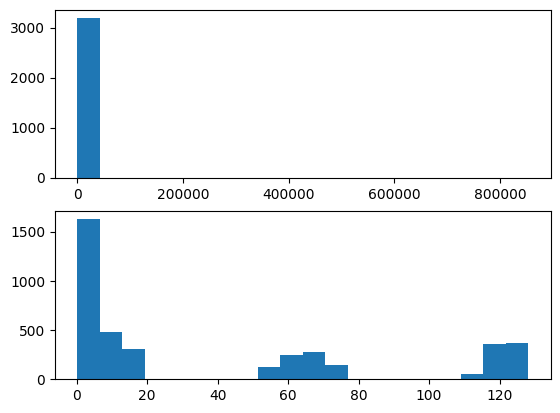

In [ ]:
trainloader, valloader, benign_testloader,attack_testloader = load_datasets(final_df,'Autoencoder',partition_id=2,label_col_num = 3)
net = Autoencoder(115,58,29)

for epoch in range(3):
    train(net, trainloader, 1)
    loss,loss_history= validation(net, valloader)
    print(f"Epoch {epoch+1}: validation loss {loss}")
    print(f'validation_loss_mean:{np.mean(loss_history)},validation_loss_std:{np.std(loss_history)}')
print('BENIGN:')
benign_MSE, benign_MSE_history,false_positive = test(net, benign_testloader,5)
print("ATTACK:")
attack_MSE, attack_MSE_history,true_positive = test(net, attack_testloader,5)
print(f'fpr:{false_positive}')
print(f'tpr:{true_positive}')
print(f"Final test set performance:\n\t benign loss {benign_MSE}")
print(f"Final test set performance:\n\t attack loss {attack_MSE}")
plt.subplot(2,1,1)
plt.hist(benign_MSE_history,bins =20)
plt.subplot(2,1,2)
plt.hist(attack_MSE_history,bins = 20)
plt.show()

Epoch [1/1], Train Loss: 0.4073
Epoch 1: validation loss 288.92508399731076
validation_loss_mean:288.9250741045349,validation_loss_std:14625.18554589809
Epoch [1/1], Train Loss: 0.4072
Epoch 2: validation loss 288.9249323398639
validation_loss_mean:288.9249223964098,validation_loss_std:14625.185548890966
Epoch [1/1], Train Loss: 0.4070
Epoch 3: validation loss 288.92478091197137
validation_loss_mean:288.92477091616735,validation_loss_std:14625.185551879347
Epoch [1/1], Train Loss: 0.4069
Epoch 4: validation loss 288.9246297116463
validation_loss_mean:288.9246196612859,validation_loss_std:14625.185554863285
Epoch [1/1], Train Loss: 0.4067
Epoch 5: validation loss 288.9244787336924
validation_loss_mean:288.9244686303756,validation_loss_std:14625.18555784281
BENIGN:
exceed threshold proportion:0.00625
count_total:3200.0
ATTACK:
exceed threshold proportion:0.59375
count_total:4000.0
fpr:0.00625
tpr:0.59375
Final test set performance:
	 benign loss 562.9660263240337
Final test set performan

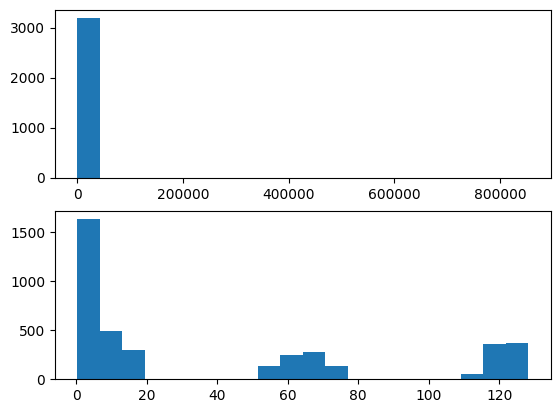

In [ ]:
trainloader, valloader, benign_testloader,attack_testloader = load_datasets(final_df,'Autoencoder',partition_id=2,label_col_num = 3)
net = Autoencoder_4_layers(layer_sizes)

for epoch in range(5):
    train(net, trainloader, 1)
    loss,loss_history= validation(net, valloader)
    print(f"Epoch {epoch+1}: validation loss {loss}")
    print(f'validation_loss_mean:{np.mean(loss_history)},validation_loss_std:{np.std(loss_history)}')
print('BENIGN:')
benign_MSE, benign_MSE_history,false_positive = test(net, benign_testloader,5)
print("ATTACK:")
attack_MSE, attack_MSE_history,true_positive = test(net, attack_testloader,5)
print(f'fpr:{false_positive}')
print(f'tpr:{true_positive}')
print(f"Final test set performance:\n\t benign loss {benign_MSE}")
print(f"Final test set performance:\n\t attack loss {attack_MSE}")
plt.subplot(2,1,1)
plt.hist(benign_MSE_history,bins =20)
plt.subplot(2,1,2)
plt.hist(attack_MSE_history,bins = 20)
plt.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Epoch [1/1], Train Loss: 0.3183
Epoch 1: validation loss 6.494225820236736
validation_loss_mean:6.4942260775301195,validation_loss_std:139.08647005352842
Epoch [1/1], Train Loss: 0.2756
Epoch 2: validation loss 6.43414093007644
validation_loss_mean:6.4341407353472375,validation_loss_std:139.0892319369006
Epoch [1/1], Train Loss: 0.2253
Epoch 3: validation loss 6.4008299327455465
validation_loss_mean:6.400831027986068,validation_loss_std:139.09076240842495
Epoch [1/1], Train Loss: 0.2038
Epoch 4: validation loss 6.394804428219989
validation_loss_mean:6.394803677576581,validation_loss_std:139.09103884974633
Epoch [1/1], Train Loss: 0.1821
Epoch 5: validation loss 6.394596835190229
validation_loss_mean:6.394597148383708,validation_loss_std:139.09103178032447
BENIGN:
exceed threshold proportion:0.0
ATTACK:
exceed threshold proportion:0.33725
fpr:0.0
tpr:0.33725
Final test set performance:
	 benign loss 0.22482877135276794
Final test set performance:
	 attack loss 444.81008830046653


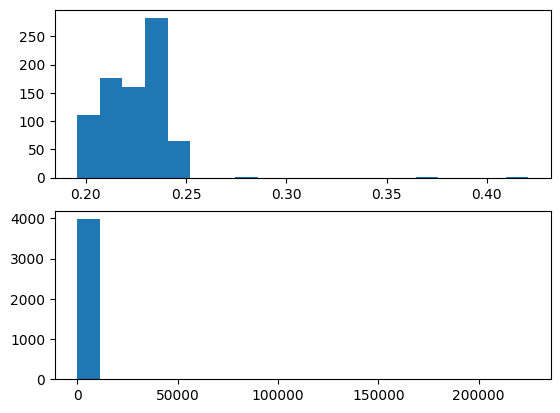

In [ ]:
trainloader, valloader, benign_testloader,attack_testloader = load_datasets(final_df,'Autoencoder',partition_id=2,label_col_num = 3)
net = Autoencoder_4_layers(layer_sizes)

for epoch in range(5):
    train(net, trainloader, 1)
    loss,loss_history= validation(net, valloader)
    print(f"Epoch {epoch+1}: validation loss {loss}")
    print(f'validation_loss_mean:{np.mean(loss_history)},validation_loss_std:{np.std(loss_history)}')
print('BENIGN:')
benign_MSE, benign_MSE_history,false_positive = test(net, benign_testloader,5)
print("ATTACK:")
attack_MSE, attack_MSE_history,true_positive = test(net, attack_testloader,5)
print(f'fpr:{false_positive}')
print(f'tpr:{true_positive}')
print(f"Final test set performance:\n\t benign loss {benign_MSE}")
print(f"Final test set performance:\n\t attack loss {attack_MSE}")
plt.subplot(2,1,1)
plt.hist(benign_MSE_history,bins =20)
plt.subplot(2,1,2)
plt.hist(attack_MSE_history,bins = 20)
plt.show()

Epoch [1/1], Train Loss: 0.2769
Epoch 1: validation loss 11.56448647181193
validation_loss_mean:11.564486724759142,validation_loss_std:18.055056718003105
Epoch [1/1], Train Loss: 0.1823
Epoch 2: validation loss 11.522859860459963
validation_loss_mean:11.522859957476612,validation_loss_std:18.080803151201113
Epoch [1/1], Train Loss: 0.1438
Epoch 3: validation loss 11.487395548489358
validation_loss_mean:11.487395372041242,validation_loss_std:18.102816831775982
Epoch [1/1], Train Loss: 0.1224
Epoch 4: validation loss 11.497488316893577
validation_loss_mean:11.497488594828692,validation_loss_std:18.096575665609397
Epoch [1/1], Train Loss: 0.1107
Epoch 5: validation loss 11.488534426026874
validation_loss_mean:11.488534741223946,validation_loss_std:18.102122876309654
Epoch [1/1], Train Loss: 0.0945
Epoch 6: validation loss 11.467633645070924
validation_loss_mean:11.467633897190293,validation_loss_std:18.11502170801856
Epoch [1/1], Train Loss: 0.0852
Epoch 7: validation loss 11.464430497090

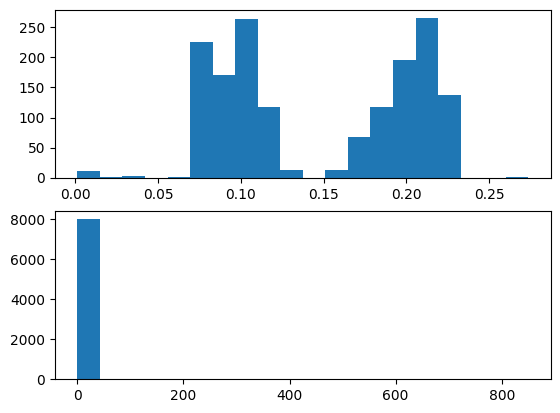

In [ ]:
trainloader, valloader, benign_testloader,attack_testloader = load_datasets(final_df,'Autoencoder',partition_id=0,label_col_num = 3)
net = Autoencoder(115,58,29)

for epoch in range(10):
    train(net, trainloader, 1)
    loss,loss_history= validation(net, valloader)
    print(f"Epoch {epoch+1}: validation loss {loss}")
    print(f'validation_loss_mean:{np.mean(loss_history)},validation_loss_std:{np.std(loss_history)}')
print('BENIGN:')
benign_MSE, benign_MSE_history,false_positive = test(net, benign_testloader,5)
print("ATTACK:")
attack_MSE, attack_MSE_history,true_positive = test(net, attack_testloader,5)
print(f'fpr:{false_positive}')
print(f'tpr:{true_positive}')
print(f"Final test set performance:\n\t benign loss {benign_MSE}")
print(f"Final test set performance:\n\t attack loss {attack_MSE}")
plt.subplot(2,1,1)
plt.hist(benign_MSE_history,bins =20)
plt.subplot(2,1,2)
plt.hist(attack_MSE_history,bins = 20)
plt.show()

Epoch [1/1], Train Loss: 0.0012
Epoch 1: validation loss 6686860.4962428305
Epoch [1/1], Train Loss: 0.0003
Epoch 2: validation loss 6686860.495550643
Epoch [1/1], Train Loss: 0.0002
Epoch 3: validation loss 6686860.495505873
Epoch [1/1], Train Loss: 0.0001
Epoch 4: validation loss 6686860.495447797
Epoch [1/1], Train Loss: 0.0001
Epoch 5: validation loss 6686860.495421893
BENIGN:
total_size:3200
total_loss:0.12449220567941666
total_loss:209.3989520445466
total_loss:693.570186175406
total_loss:1136.8967852964997
total_loss:1335232300144.8967
total_loss:1335232300145.0923
total_loss:1335232300145.4465
total_loss:1335232300145.5747
total_loss:1335232300145.7012
total_loss:1335232300145.8418
total_loss:1335232300145.952
total_loss:1335232300146.068
total_loss:1335232300146.2583
total_loss:1335232300146.3904
total_loss:1335232300146.523
total_loss:1335232300200.801
total_loss:1335232300200.9055
total_loss:1335232300201.026
total_loss:1335232300201.1484
total_loss:1335232300201.2456
total_l

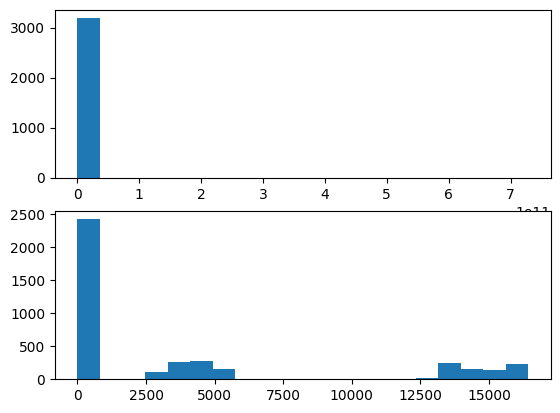

In [ ]:
#MSE
trainloader, valloader, benign_testloader,attack_testloader = load_datasets(final_df,'Autoencoder',partition_id=2,label_col_num = 3)
net = Autoencoder(115,58,29)

for epoch in range(5):
    train(net, trainloader, 1)
    loss = validation(net, valloader)
    print(f"Epoch {epoch+1}: validation loss {loss}")
print('BENIGN:')
benign_MSE, benign_MSE_history,false_positive = test(net, benign_testloader,5)
print("ATTACK:")
attack_MSE, attack_MSE_history,true_positive = test(net, attack_testloader,5)
print(f'fpr:{false_positive}')
print(f'tpr:{true_positive}')
print(f"Final test set performance:\n\t benign loss {benign_MSE}")
print(f"Final test set performance:\n\t attack loss {attack_MSE}")
plt.subplot(2,1,1)
plt.hist(benign_MSE_history,bins =20)
plt.subplot(2,1,2)
plt.hist(attack_MSE_history,bins = 20)
plt.show()

Epoch [1/1], Train Loss: 0.1491
Epoch 1: validation loss 498.84400278805856
Epoch [1/1], Train Loss: 0.0668
Epoch 2: validation loss 498.81643161984783
Epoch [1/1], Train Loss: 0.0494
Epoch 3: validation loss 498.8059263129201
Epoch [1/1], Train Loss: 0.0437
Epoch 4: validation loss 498.8025132899483
Epoch [1/1], Train Loss: 0.0396
Epoch 5: validation loss 498.798502941947
BENIGN:
exceed threshold proportion:0.1765625
ATTACK:
exceed threshold proportion:1.0
fpr:0.1765625
tpr:1.0
Final test set performance:
	 benign loss 448.8637955049053
Final test set performance:
	 attack loss 39.17813736391067


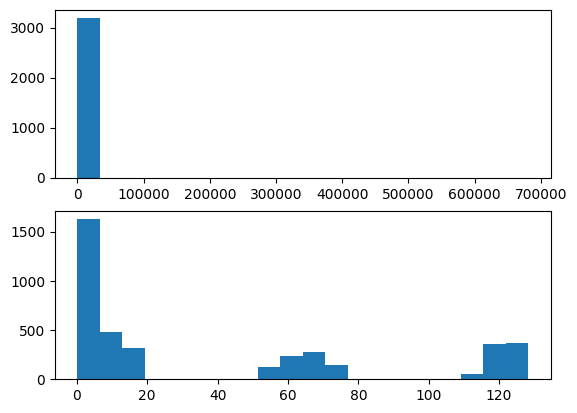

In [ ]:
trainloader, valloader, benign_testloader,attack_testloader = load_datasets(final_df,'Autoencoder',partition_id=2,label_col_num = 3)
net = Autoencoder(115,58,29)

for epoch in range(5):
    train(net, trainloader, 1)
    loss,loss_history = validation(net, valloader)
    RE_MED = np.median(loss_history)
    RE_MAD = np.median(np.abs(loss_history - RE_MED))
    threshold = RE_MED + 3*RE_MAD
    print(f"Epoch {epoch+1}: validation loss {loss}")
print('BENIGN:')
benign_MSE, benign_MSE_history,false_positive = test(net, benign_testloader,threshold)
print("ATTACK:")
attack_MSE, attack_MSE_history,true_positive = test(net, attack_testloader,threshold)
print(f'fpr:{false_positive}')
print(f'tpr:{true_positive}')
print(f"Final test set performance:\n\t benign loss {benign_MSE}")
print(f"Final test set performance:\n\t attack loss {attack_MSE}")
plt.subplot(2,1,1)
plt.hist(benign_MSE_history,bins =20)
plt.subplot(2,1,2)
plt.hist(attack_MSE_history,bins = 20)
plt.show()

In [ ]:
(np.array(benign_MSE_history) > 1000).sum()

3

In [ ]:
(np.array(attack_MSE_history) > 4).sum()

2376

In [ ]:
len(attack_MSE_history)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


4000

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[]

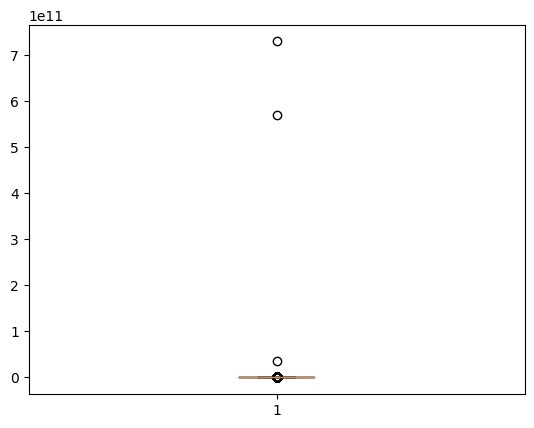

In [ ]:
## Outliers with high reconstruction error in validation set
plt.boxplot(benign_MSE_history)
plt.plot()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


{'whiskers': [<matplotlib.lines.Line2D at 0x7803c1821b10>,
 'caps': [<matplotlib.lines.Line2D at 0x7803c1821810>,
 'boxes': [<matplotlib.lines.Line2D at 0x7803c1821a80>],
 'medians': [<matplotlib.lines.Line2D at 0x7803c1821900>],
 'fliers': [<matplotlib.lines.Line2D at 0x7803c1821f30>],
 'means': []}

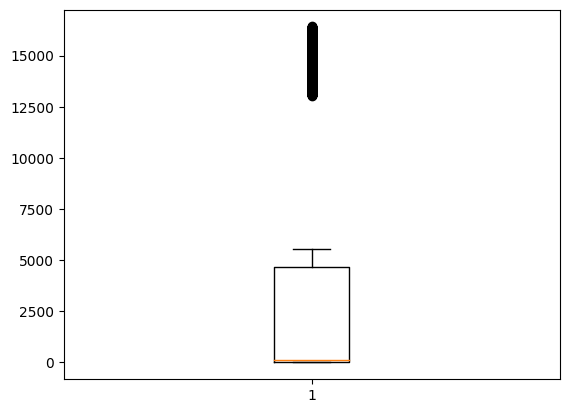

In [ ]:
plt.boxplot(attack_MSE_history)

In [ ]:
lst_1 = [1,2,3]
lst_2 = [3,4,5]
lst_3 = lst_1+lst_2
print(lst_3)

[1, 2, 3, 3, 4, 5]


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
def plot_roc(benign_MSE_history,attack_MSE_history,plot):
  reconstruction_errors = benign_MSE_history+attack_MSE_history  # Combine errors
  labels = [0]*len(benign_MSE_history) + [1]*len(attack_MSE_history)  # 0 for normal, 1 for anomaly

  # Compute ROC Curve
  fpr, tpr, thresholds = roc_curve(labels, reconstruction_errors)
  roc_auc = auc(fpr, tpr)
  print(f'roc_auc:{roc_auc:.4f}')
  # Plot ROC Curve
  if plot == True:
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.4f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc='lower right')
    plt.show()
  return roc_auc

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Assuming you have computed reconstruction errors for normal and anomalous samples
reconstruction_errors = benign_MSE_history+attack_MSE_history  # Combine errors
labels = [0]*len(benign_MSE_history) + [1]*len(attack_MSE_history)  # 0 for normal, 1 for anomaly

# Compute ROC Curve
fpr, tpr, thresholds = roc_curve(labels, reconstruction_errors)
roc_auc = auc(fpr, tpr)

# Plot ROC Curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

NameError: name 'benign_MSE_history' is not defined

In [ ]:
trainloader, valloader, benign_testloader,attack_testloader = load_datasets(final_df,'Autoencoder',partition_id=0)
net = Autoencoder(115,58,29)

for epoch in range(5):
    train(net, trainloader, 1)
    loss = validation(net, valloader)
    print(f"Epoch {epoch+1}: validation loss {loss}")

benign_MSE, benign_MSE_history,false_positive = test(net, benign_testloader,5)
attack_MSE, attack_MSE_history,true_positive = test(net, attack_testloader,5)
print(f'fpr:{false_positive}')
print(f'tpr:{true_positive}')
print(f"Final test set performance:\n\t benign loss {benign_MSE}")
print(f"Final test set performance:\n\t attack loss {attack_MSE}")
plt.subplot(2,1,1)
plt.plot(benign_MSE_history)
plt.subplot(2,1,2)
plt.plot(attack_MSE_history)
plt.show()

Epoch [1/1], Train Loss: 0.0010
Epoch 1: validation loss 0.00014846688949873146
Epoch [1/1], Train Loss: 0.0001
Epoch 2: validation loss 4.064800666058615e-05
Epoch [1/1], Train Loss: 0.0001
Epoch 3: validation loss 2.7874832346405573e-05
Epoch [1/1], Train Loss: 0.0000
Epoch 4: validation loss 2.1268645902567258e-05
Epoch [1/1], Train Loss: 0.0000
Epoch 5: validation loss 1.8628749365654166e-05
total_size:3200
total_loss:0.009178077802062035
total_loss:0.019471791572868824
total_loss:0.02745479065924883
total_loss:0.04593998100608587
total_loss:0.055484091863036156
total_loss:0.07517597265541553
total_loss:0.09643974527716637
total_loss:0.12276510149240494
total_loss:0.15347954258322716
total_loss:0.1980976015329361
total_loss:0.2197653129696846
total_loss:0.23215001821517944
total_loss:0.24180825985968113
total_loss:0.2534254575148225
total_loss:0.2688963692635298
total_loss:0.28523534908890724
total_loss:1.2677195109426975
total_loss:1.7004873789846897
total_loss:1.7668836899101734


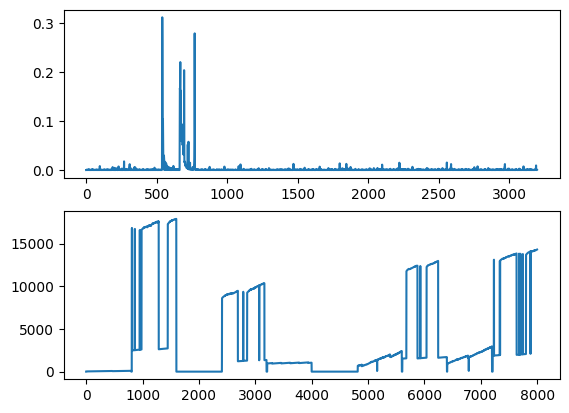

In [ ]:
trainloader, valloader, benign_testloader,attack_testloader = load_datasets(final_df,'Autoencoder',partition_id=0)
net = Autoencoder(115,58,29)

for epoch in range(5):
    train(net, trainloader, 1)
    loss = validation(net, valloader)
    print(f"Epoch {epoch+1}: validation loss {loss}")

benign_MSE, benign_MSE_history,false_positive = test(net, benign_testloader,5)
attack_MSE, attack_MSE_history,true_positive = test(net, attack_testloader,5)
print(f'fpr:{false_positive}')
print(f'tpr:{true_positive}')
print(f"Final test set performance:\n\t benign loss {benign_MSE}")
print(f"Final test set performance:\n\t attack loss {attack_MSE}")
plt.subplot(2,1,1)
plt.plot(benign_MSE_history)
plt.subplot(2,1,2)
plt.plot(attack_MSE_history)
plt.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Epoch [1/1], Train Loss: 0.0009
Epoch 1: validation loss 0.00014505412930306287
Epoch [1/1], Train Loss: 0.0001
Epoch 2: validation loss 4.193252273417341e-05
Epoch [1/1], Train Loss: 0.0001
Epoch 3: validation loss 2.9195839940653875e-05
Epoch [1/1], Train Loss: 0.0000
Epoch 4: validation loss 2.457086093972276e-05
Epoch [1/1], Train Loss: 0.0000
Epoch 5: validation loss 2.1968015869042107e-05
total_size:3200
exceed threshold proportion:0.0
total_size:8000
exceed threshold proportion:0.789875
benign_error:0.002330001335358247
attack_error:3923.8026283572613


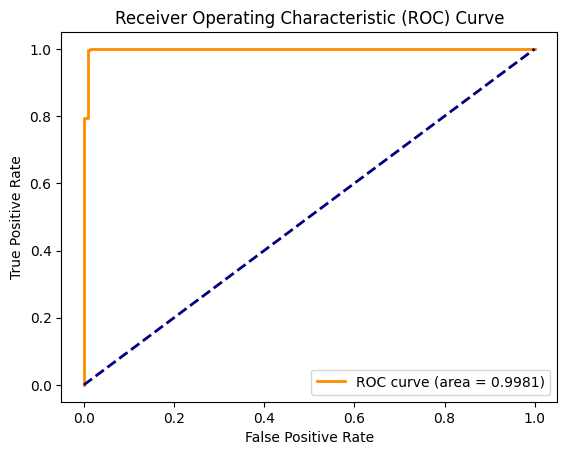

Epoch [1/1], Train Loss: 0.0010
Epoch 1: validation loss 0.00029894010403139264
Epoch [1/1], Train Loss: 0.0002
Epoch 2: validation loss 0.00015175887740460816
Epoch [1/1], Train Loss: 0.0001
Epoch 3: validation loss 0.00013015036704109768
Epoch [1/1], Train Loss: 0.0001
Epoch 4: validation loss 0.00010939188127008573
Epoch [1/1], Train Loss: 0.0001
Epoch 5: validation loss 9.170239355570266e-05
total_size:2623
exceed threshold proportion:0.0
total_size:8000
exceed threshold proportion:0.788
benign_error:0.0030114587568232363
attack_error:2128.49044682917


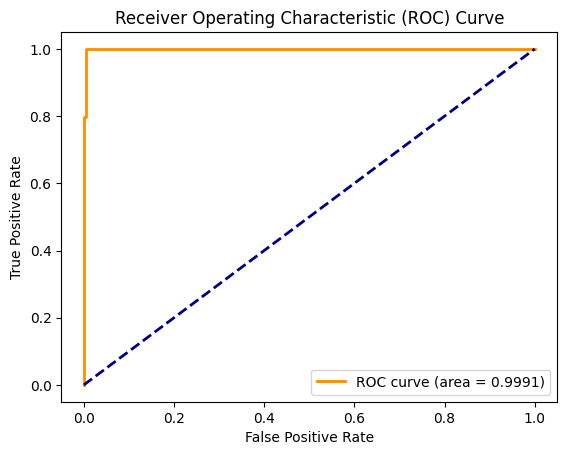

Epoch [1/1], Train Loss: 0.0012
Epoch 1: validation loss 6686860.496252983
Epoch [1/1], Train Loss: 0.0003
Epoch 2: validation loss 6686860.495552409
Epoch [1/1], Train Loss: 0.0002
Epoch 3: validation loss 6686860.495521939
Epoch [1/1], Train Loss: 0.0001
Epoch 4: validation loss 6686860.495467148
Epoch [1/1], Train Loss: 0.0001
Epoch 5: validation loss 6686860.495434151
total_size:3200
exceed threshold proportion:0.0096875
total_size:4000
exceed threshold proportion:0.59375
benign_error:417260094.17000335
attack_error:3751.998488771826


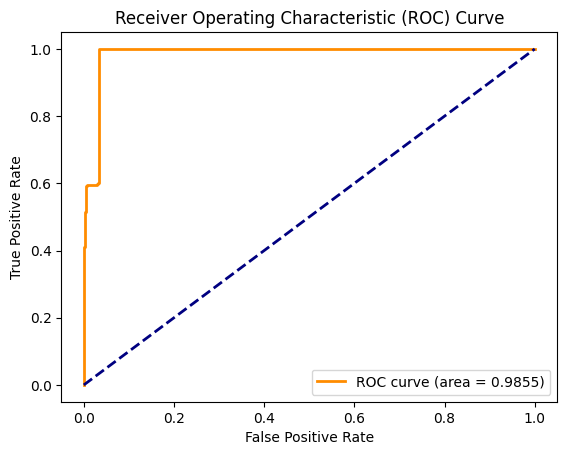

Epoch [1/1], Train Loss: 0.0015
Epoch 1: validation loss 8.078105266367157e-05
Epoch [1/1], Train Loss: 0.0014
Epoch 2: validation loss 6.979272081643546e-05
Epoch [1/1], Train Loss: 0.0008
Epoch 3: validation loss 5.8692672248584226e-05
Epoch [1/1], Train Loss: 0.0005
Epoch 4: validation loss 4.038604844399976e-05
Epoch [1/1], Train Loss: 0.0003
Epoch 5: validation loss 3.2277787245104076e-05
total_size:3200
exceed threshold proportion:0.0
total_size:8000
exceed threshold proportion:0.246625
benign_error:0.0012856227210431826
attack_error:3.8017619517445564


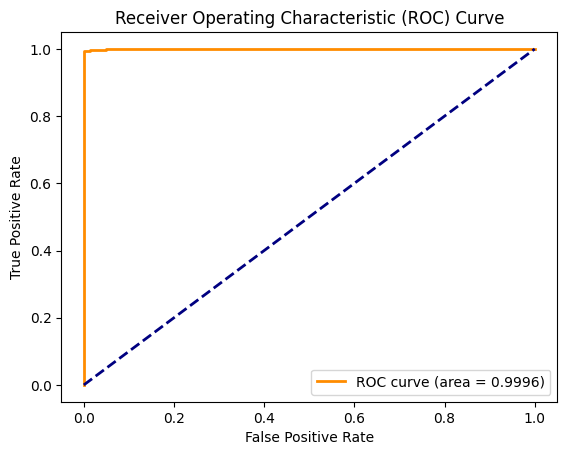

Epoch [1/1], Train Loss: 0.0014
Epoch 1: validation loss 0.0003669105136419276
Epoch [1/1], Train Loss: 0.0003
Epoch 2: validation loss 0.00019133721897303938
Epoch [1/1], Train Loss: 0.0002
Epoch 3: validation loss 0.00014431095976481
Epoch [1/1], Train Loss: 0.0001
Epoch 4: validation loss 8.952100415160366e-05
Epoch [1/1], Train Loss: 0.0001
Epoch 5: validation loss 9.542967274729819e-05
total_size:3200
exceed threshold proportion:0.0
total_size:8000
exceed threshold proportion:0.484125
benign_error:0.0029920770667376927
attack_error:8.342610254839062


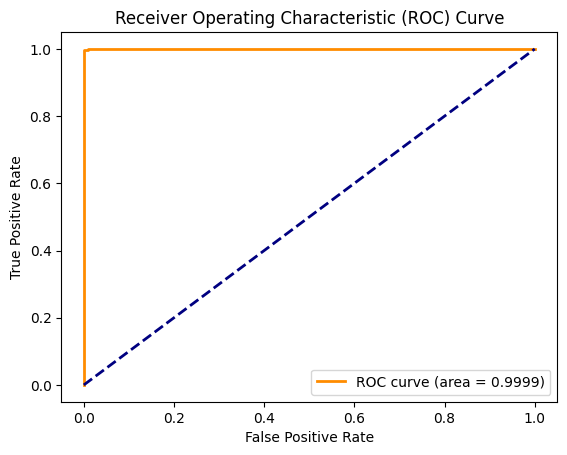

Epoch [1/1], Train Loss: 0.0015
Epoch 1: validation loss 0.00043050459689066673
Epoch [1/1], Train Loss: 0.0004
Epoch 2: validation loss 0.00027057343223788895
Epoch [1/1], Train Loss: 0.0003
Epoch 3: validation loss 0.00017934981158946475
Epoch [1/1], Train Loss: 0.0002
Epoch 4: validation loss 0.00014032129374987935
Epoch [1/1], Train Loss: 0.0002
Epoch 5: validation loss 0.00010998546107984088
total_size:3200
exceed threshold proportion:0.0
total_size:8000
exceed threshold proportion:0.655375
benign_error:0.0034820624726125972
attack_error:14.393315267995


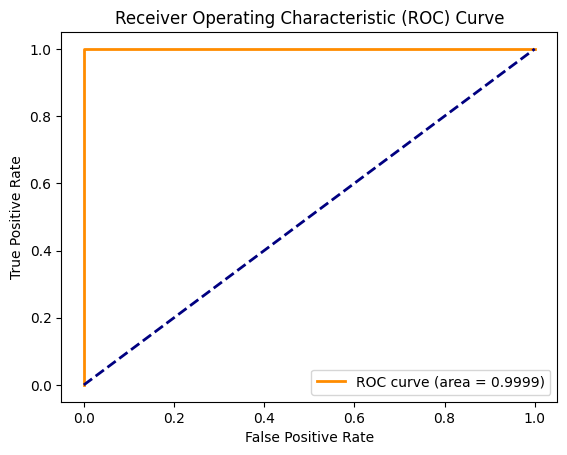

Epoch [1/1], Train Loss: 0.0009
Epoch 1: validation loss 0.00016038221548138283
Epoch [1/1], Train Loss: 0.0001
Epoch 2: validation loss 0.00013433538796305537
Epoch [1/1], Train Loss: 0.0001
Epoch 3: validation loss 0.00012530660188088242
Epoch [1/1], Train Loss: 0.0001
Epoch 4: validation loss 0.00010577711740878816
Epoch [1/1], Train Loss: 0.0001
Epoch 5: validation loss 8.682207223430921e-05
total_size:3200
exceed threshold proportion:0.0
total_size:4000
exceed threshold proportion:0.5925
benign_error:0.022185498914914205
attack_error:95.30312751740217


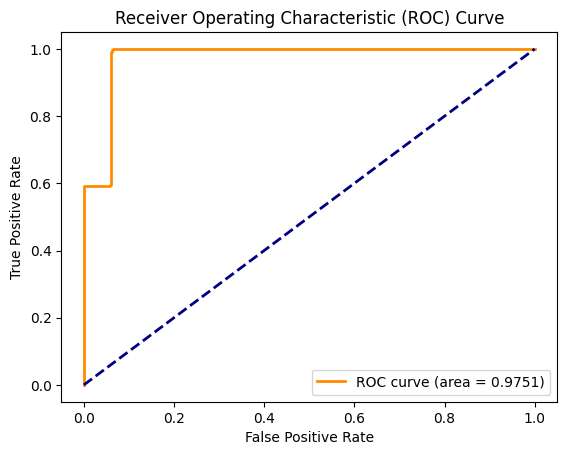

Epoch [1/1], Train Loss: 0.0014
Epoch 1: validation loss 0.00022588601612556094
Epoch [1/1], Train Loss: 0.0005
Epoch 2: validation loss 0.00019712396345149057
Epoch [1/1], Train Loss: 0.0003
Epoch 3: validation loss 0.00015412665850770933
Epoch [1/1], Train Loss: 0.0002
Epoch 4: validation loss 7.899223566756774e-05
Epoch [1/1], Train Loss: 0.0002
Epoch 5: validation loss 5.288934350037613e-05
total_size:3200
exceed threshold proportion:0.0
total_size:8000
exceed threshold proportion:0.06925
benign_error:0.004322736831963994
attack_error:1.345871837079525


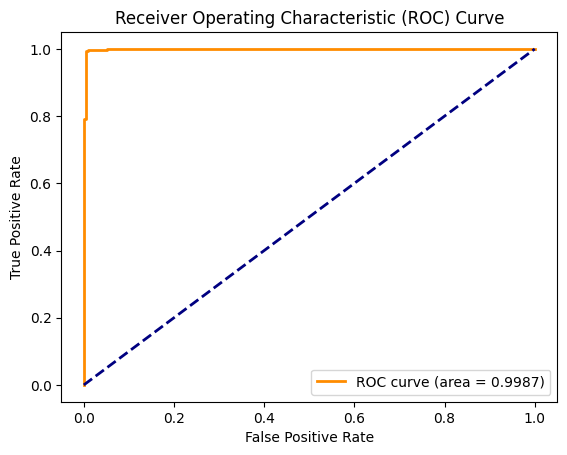

Epoch [1/1], Train Loss: 0.0009
Epoch 1: validation loss 0.00031127204153259905
Epoch [1/1], Train Loss: 0.0002
Epoch 2: validation loss 0.00025810222984709515
Epoch [1/1], Train Loss: 0.0002
Epoch 3: validation loss 0.0002352268584777798
Epoch [1/1], Train Loss: 0.0001
Epoch 4: validation loss 0.00020461764556668454
Epoch [1/1], Train Loss: 0.0001
Epoch 5: validation loss 0.00019939891860233799
total_size:3200
exceed threshold proportion:0.0
total_size:8000
exceed threshold proportion:0.719
benign_error:0.002744607370113954
attack_error:87.8187074444741


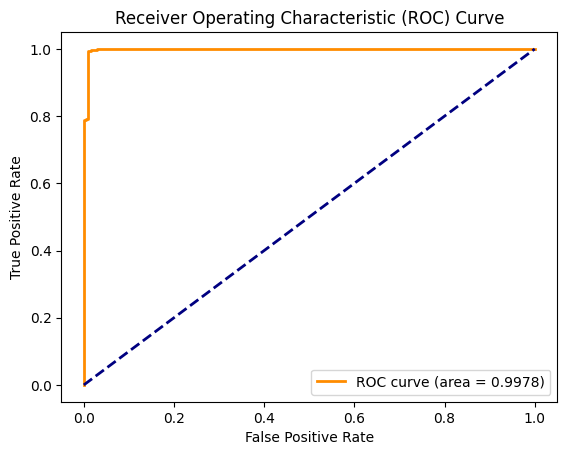

In [ ]:
## Using MSe
for client in range(9):
  trainloader, valloader, benign_testloader,attack_testloader = load_datasets(final_df,'Autoencoder',partition_id=client)
  net = Autoencoder(115,58,29)

  for epoch in range(5):
      train(net, trainloader, 1)
      loss = validation(net, valloader)
      print(f"Epoch {epoch+1}: validation loss {loss}")
  benign_MSE, benign_MSE_history,false_positive = test(net, benign_testloader,5)
  attack_MSE, attack_MSE_history,true_positive = test(net, attack_testloader,5)
  print(f'benign_error:{benign_MSE}')
  print(f'attack_error:{attack_MSE}')
  plot_roc(benign_MSE_history,attack_MSE_history)

Epoch [1/1], Train Loss: 0.0039
Epoch 1: validation loss 0.0018539048462676315
Epoch [1/1], Train Loss: 0.0012
Epoch 2: validation loss 0.0008605808410674143
Epoch [1/1], Train Loss: 0.0008
Epoch 3: validation loss 0.0007001993416521985
Epoch [1/1], Train Loss: 0.0007
Epoch 4: validation loss 0.0006510650625643439
Epoch [1/1], Train Loss: 0.0007
Epoch 5: validation loss 0.0006114410273790455
total_size:3200
exceed threshold proportion:0.0
total_size:8000
exceed threshold proportion:0.789875
benign_error:0.021060832608491183
attack_error:46.226110298335556


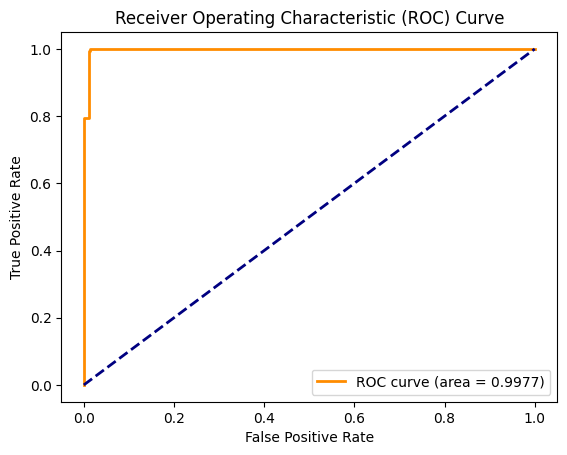

Epoch [1/1], Train Loss: 0.0048
Epoch 1: validation loss 0.002738970287048029
Epoch [1/1], Train Loss: 0.0022
Epoch 2: validation loss 0.001989548596836507
Epoch [1/1], Train Loss: 0.0018
Epoch 3: validation loss 0.001836267313426437
Epoch [1/1], Train Loss: 0.0016
Epoch 4: validation loss 0.001659749595883259
Epoch [1/1], Train Loss: 0.0015
Epoch 5: validation loss 0.0015083904245902563
total_size:2623
exceed threshold proportion:0.0
total_size:8000
exceed threshold proportion:0.788
benign_error:0.045009086911931916
attack_error:36.549251756131646


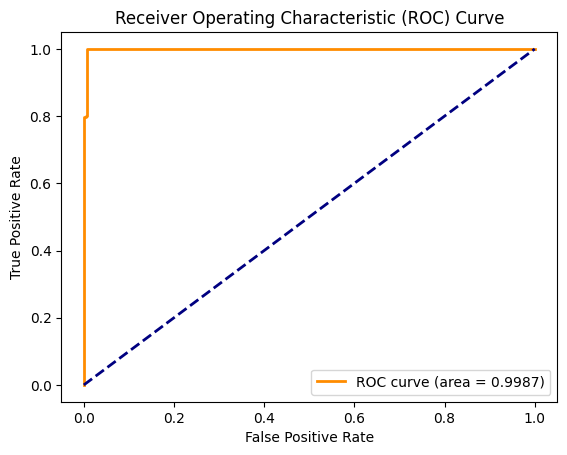

Epoch [1/1], Train Loss: 0.0053
Epoch 1: validation loss 32.74529817706774
Epoch [1/1], Train Loss: 0.0026
Epoch 2: validation loss 32.74461131407641
Epoch [1/1], Train Loss: 0.0021
Epoch 3: validation loss 32.744076184663946
Epoch [1/1], Train Loss: 0.0017
Epoch 4: validation loss 32.74387009038727
Epoch [1/1], Train Loss: 0.0015
Epoch 5: validation loss 32.743755011727664
total_size:3200
exceed threshold proportion:0.00625
total_size:4000
exceed threshold proportion:0.59375
benign_error:562.614040165618
attack_error:39.12576799893379


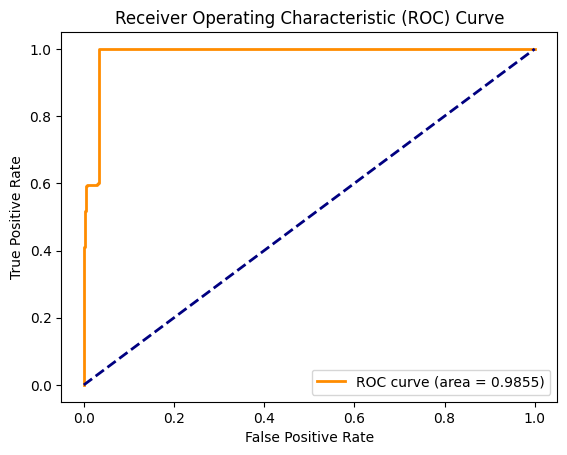

Epoch [1/1], Train Loss: 0.0048
Epoch 1: validation loss 0.0008298796544878338
Epoch [1/1], Train Loss: 0.0043
Epoch 2: validation loss 0.0007775206571050848
Epoch [1/1], Train Loss: 0.0033
Epoch 3: validation loss 0.0007235189289368021
Epoch [1/1], Train Loss: 0.0028
Epoch 4: validation loss 0.0006896469773402294
Epoch [1/1], Train Loss: 0.0023
Epoch 5: validation loss 0.0006802562355565337
total_size:3200
exceed threshold proportion:0.0
total_size:8000
exceed threshold proportion:0.0
benign_error:0.022711697947233916
attack_error:1.5157158145308494


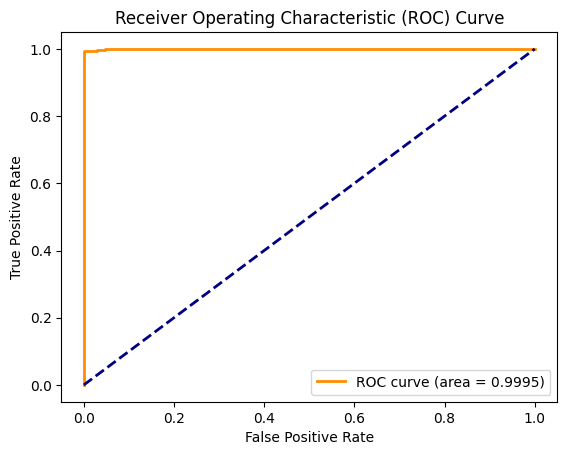

Epoch [1/1], Train Loss: 0.0052
Epoch 1: validation loss 0.002350012806709856
Epoch [1/1], Train Loss: 0.0023
Epoch 2: validation loss 0.0019259768188931048
Epoch [1/1], Train Loss: 0.0020
Epoch 3: validation loss 0.0015785409089846489
Epoch [1/1], Train Loss: 0.0017
Epoch 4: validation loss 0.0013801652018744976
Epoch [1/1], Train Loss: 0.0015
Epoch 5: validation loss 0.001280672136001671
total_size:3200
exceed threshold proportion:0.0
total_size:8000
exceed threshold proportion:0.121875
benign_error:0.03820210373029113
attack_error:2.375006758630276


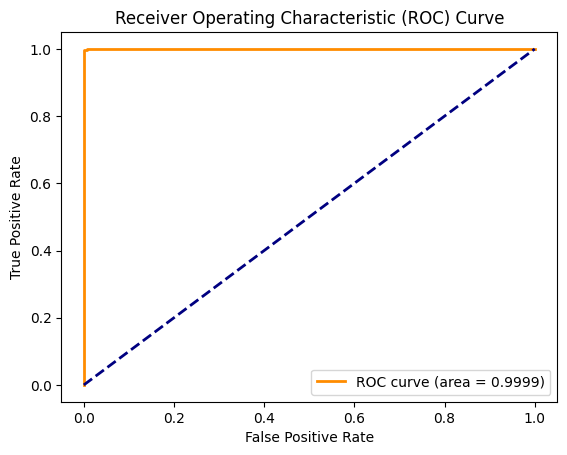

Epoch [1/1], Train Loss: 0.0063
Epoch 1: validation loss 0.0031590823254261454
Epoch [1/1], Train Loss: 0.0032
Epoch 2: validation loss 0.0026502922469845568
Epoch [1/1], Train Loss: 0.0028
Epoch 3: validation loss 0.0023410954682801205
Epoch [1/1], Train Loss: 0.0024
Epoch 4: validation loss 0.0020052070568244043
Epoch [1/1], Train Loss: 0.0020
Epoch 5: validation loss 0.0017003353714990692
total_size:3200
exceed threshold proportion:0.0
total_size:8000
exceed threshold proportion:0.162125
benign_error:0.05105361577123404
attack_error:3.0895055187940597


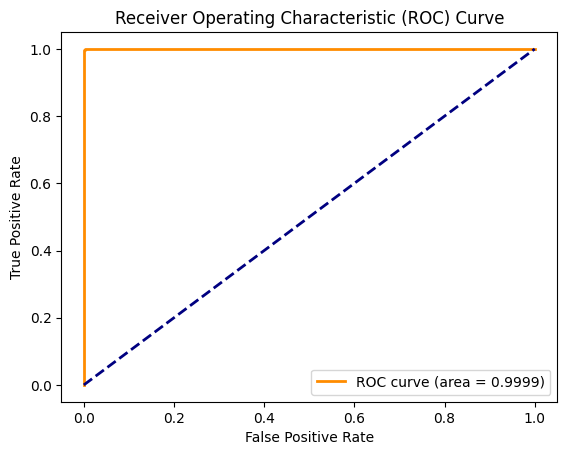

Epoch [1/1], Train Loss: 0.0042
Epoch 1: validation loss 0.0020588386624764937
Epoch [1/1], Train Loss: 0.0015
Epoch 2: validation loss 0.0017662088064333567
Epoch [1/1], Train Loss: 0.0010
Epoch 3: validation loss 0.0015252676896918087
Epoch [1/1], Train Loss: 0.0008
Epoch 4: validation loss 0.0014414718320879798
Epoch [1/1], Train Loss: 0.0007
Epoch 5: validation loss 0.0013498031205903644
total_size:3200
exceed threshold proportion:0.0
total_size:4000
exceed threshold proportion:0.39425
benign_error:0.0635616579093039
attack_error:6.735615577578544


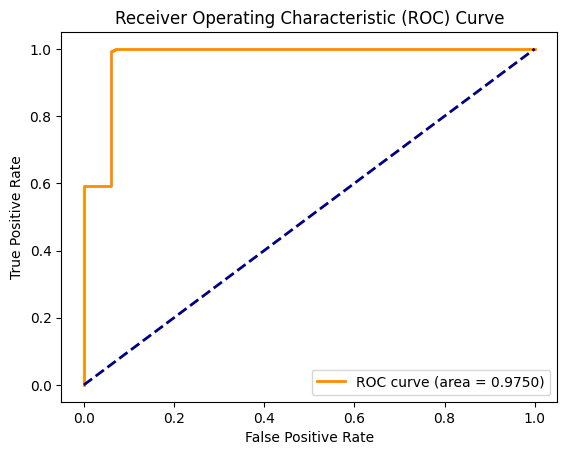

Epoch [1/1], Train Loss: 0.0054
Epoch 1: validation loss 0.0019874101453938356
Epoch [1/1], Train Loss: 0.0029
Epoch 2: validation loss 0.0017977341212547168
Epoch [1/1], Train Loss: 0.0026
Epoch 3: validation loss 0.0016396429918061656
Epoch [1/1], Train Loss: 0.0022
Epoch 4: validation loss 0.001348505755707335
Epoch [1/1], Train Loss: 0.0018
Epoch 5: validation loss 0.0010243052007773749
total_size:3200
exceed threshold proportion:0.0
total_size:8000
exceed threshold proportion:0.0
benign_error:0.045240132119506594
attack_error:0.9237555977702141


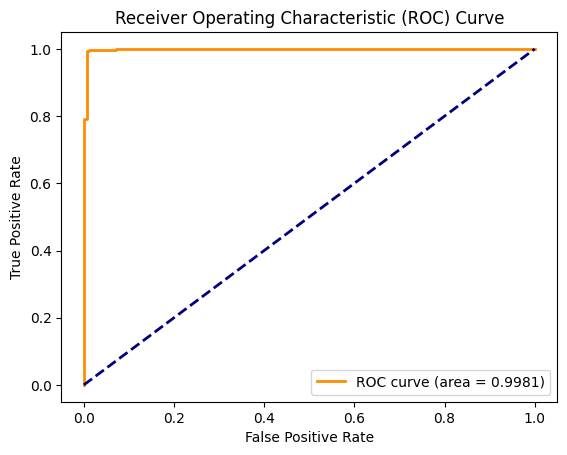

Epoch [1/1], Train Loss: 0.0037
Epoch 1: validation loss 0.0016306705011699635
Epoch [1/1], Train Loss: 0.0012
Epoch 2: validation loss 0.0014537537779408293
Epoch [1/1], Train Loss: 0.0012
Epoch 3: validation loss 0.0013218701557399563
Epoch [1/1], Train Loss: 0.0011
Epoch 4: validation loss 0.001264931011097267
Epoch [1/1], Train Loss: 0.0010
Epoch 5: validation loss 0.0013941643183501677
total_size:3200
exceed threshold proportion:0.0
total_size:8000
exceed threshold proportion:0.593
benign_error:0.028630702644586562
attack_error:7.433294557929039


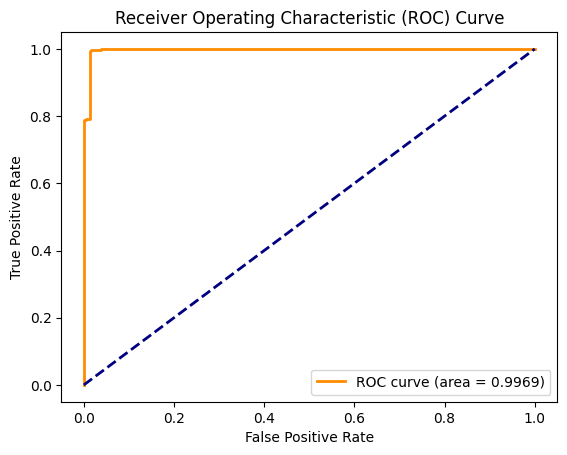

In [ ]:
# Using RMSE
for client in range(9):
  trainloader, valloader, benign_testloader,attack_testloader = load_datasets(final_df,'Autoencoder',partition_id=client)
  net = Autoencoder(115,58,29)

  for epoch in range(5):
      train(net, trainloader, 1)
      loss = validation(net, valloader)
      print(f"Epoch {epoch+1}: validation loss {loss}")
  benign_MSE, benign_MSE_history,false_positive = test(net, benign_testloader,5)
  attack_MSE, attack_MSE_history,true_positive = test(net, attack_testloader,5)
  print(f'benign_error:{benign_MSE}')
  print(f'attack_error:{attack_MSE}')
  plot_roc(benign_MSE_history,attack_MSE_history)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Epoch [1/1], Train Loss: 0.1246
Epoch 1: validation loss 0.05787835201391807
Epoch [1/1], Train Loss: 0.0419
Epoch 2: validation loss 0.023558349401140825
Epoch [1/1], Train Loss: 0.0287
Epoch 3: validation loss 0.01902500582524599
Epoch [1/1], Train Loss: 0.0251
Epoch 4: validation loss 0.017255162304410567
Epoch [1/1], Train Loss: 0.0237
Epoch 5: validation loss 0.016270079420736203
exceed threshold proportion:0.0
exceed threshold proportion:0.789875
benign_error:0.021988408928737043
attack_error:46.26404443663359


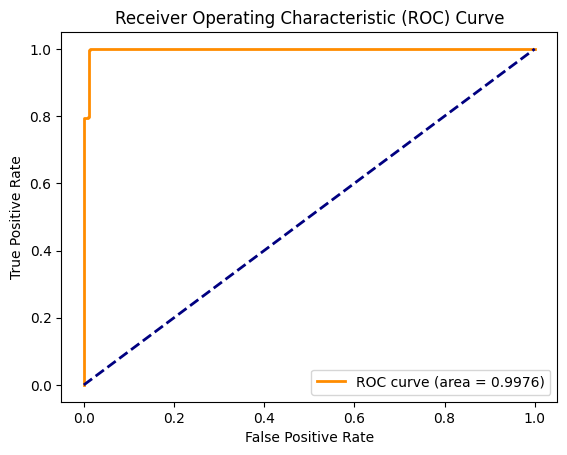

Epoch [1/1], Train Loss: 0.1469
Epoch 1: validation loss 0.07776908684299008
Epoch [1/1], Train Loss: 0.0667
Epoch 2: validation loss 0.05345584997032413
Epoch [1/1], Train Loss: 0.0528
Epoch 3: validation loss 0.04593722578786433
Epoch [1/1], Train Loss: 0.0456
Epoch 4: validation loss 0.03925602799474517
Epoch [1/1], Train Loss: 0.0392
Epoch 5: validation loss 0.03402342928495545
exceed threshold proportion:0.0
exceed threshold proportion:0.788
benign_error:0.03765686888572963
attack_error:36.434948624670504


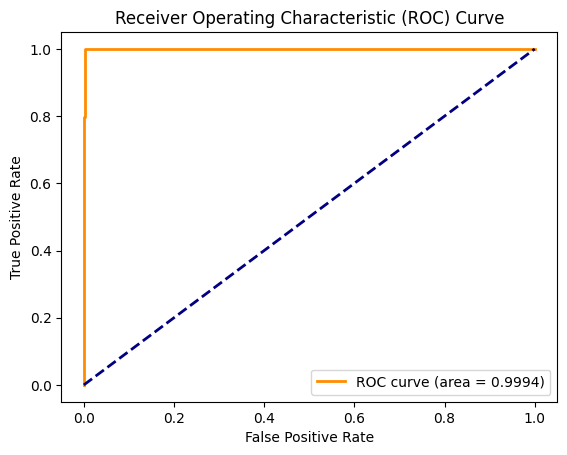

Epoch [1/1], Train Loss: 0.1698
Epoch 1: validation loss 288.61583862558774
Epoch [1/1], Train Loss: 0.0842
Epoch 2: validation loss 288.59697598870366
Epoch [1/1], Train Loss: 0.0684
Epoch 3: validation loss 288.5814056167427
Epoch [1/1], Train Loss: 0.0555
Epoch 4: validation loss 288.5732990934203
Epoch [1/1], Train Loss: 0.0500
Epoch 5: validation loss 288.57010309232925
exceed threshold proportion:0.00625
exceed threshold proportion:0.59375
benign_error:562.615413896963
attack_error:39.12923524808884


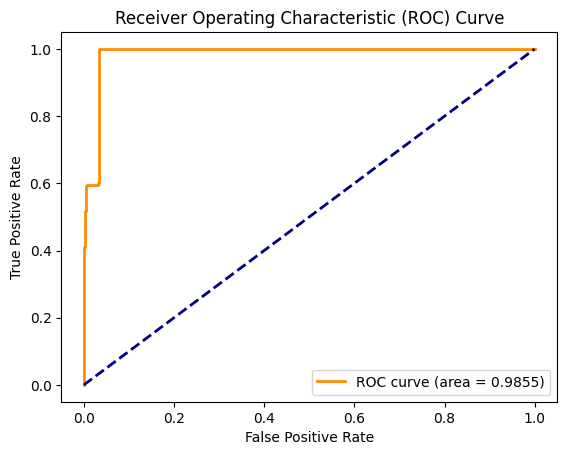

Epoch [1/1], Train Loss: 0.1563
Epoch 1: validation loss 0.023597817442929134
Epoch [1/1], Train Loss: 0.1309
Epoch 2: validation loss 0.022468697981765637
Epoch [1/1], Train Loss: 0.1015
Epoch 3: validation loss 0.020932405623487936
Epoch [1/1], Train Loss: 0.0808
Epoch 4: validation loss 0.019970087038400846
Epoch [1/1], Train Loss: 0.0712
Epoch 5: validation loss 0.019876666319293853
exceed threshold proportion:0.0
exceed threshold proportion:0.0
benign_error:0.022574761174619196
attack_error:1.5234468790888787


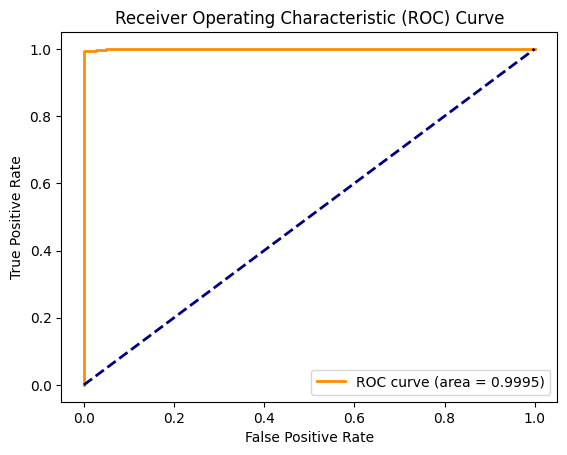

Epoch [1/1], Train Loss: 0.1642
Epoch 1: validation loss 0.06783366786936919
Epoch [1/1], Train Loss: 0.0728
Epoch 2: validation loss 0.05557607505948116
Epoch [1/1], Train Loss: 0.0609
Epoch 3: validation loss 0.0458132768002076
Epoch [1/1], Train Loss: 0.0524
Epoch 4: validation loss 0.03984654336594618
Epoch [1/1], Train Loss: 0.0486
Epoch 5: validation loss 0.03769691707805181
exceed threshold proportion:0.0
exceed threshold proportion:0.122125
benign_error:0.03753109652549028
attack_error:2.367682014107704


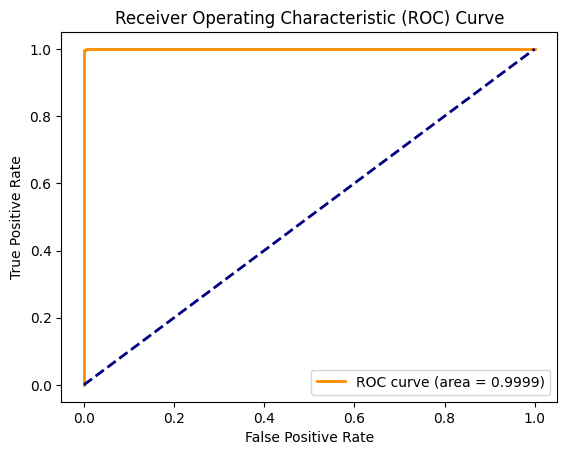

Epoch [1/1], Train Loss: 0.1917
Epoch 1: validation loss 0.09506721715323437
Epoch [1/1], Train Loss: 0.1002
Epoch 2: validation loss 0.0769859534712174
Epoch [1/1], Train Loss: 0.0810
Epoch 3: validation loss 0.06420694295412455
Epoch [1/1], Train Loss: 0.0679
Epoch 4: validation loss 0.057622351908148864
Epoch [1/1], Train Loss: 0.0626
Epoch 5: validation loss 0.05315952800596372
exceed threshold proportion:0.0
exceed threshold proportion:0.165
benign_error:0.05281196994706988
attack_error:3.103100046277046


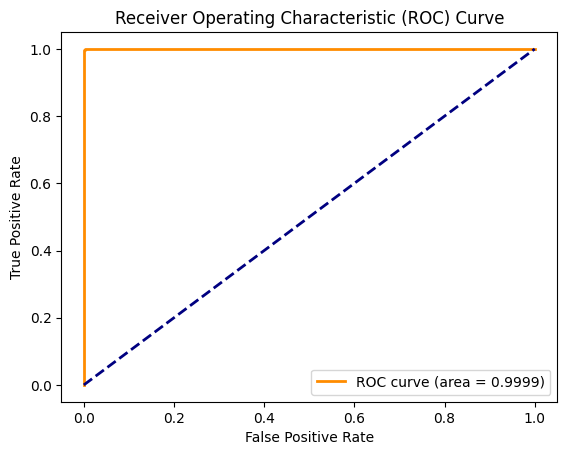

Epoch [1/1], Train Loss: 0.1477
Epoch 1: validation loss 0.06427604412803282
Epoch [1/1], Train Loss: 0.0544
Epoch 2: validation loss 0.05686877549458773
Epoch [1/1], Train Loss: 0.0487
Epoch 3: validation loss 0.053157716722060475
Epoch [1/1], Train Loss: 0.0392
Epoch 4: validation loss 0.04367267643220914
Epoch [1/1], Train Loss: 0.0281
Epoch 5: validation loss 0.041435463659656356
exceed threshold proportion:0.0
exceed threshold proportion:0.3945
benign_error:0.07258388176560401
attack_error:6.764201224207878


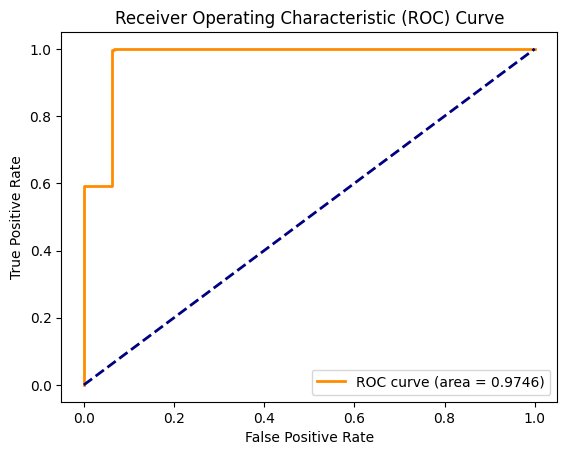

Epoch [1/1], Train Loss: 0.1769
Epoch 1: validation loss 0.05232753253135926
Epoch [1/1], Train Loss: 0.0926
Epoch 2: validation loss 0.046554722933050914
Epoch [1/1], Train Loss: 0.0825
Epoch 3: validation loss 0.043657778633328585
Epoch [1/1], Train Loss: 0.0702
Epoch 4: validation loss 0.03648660019613229
Epoch [1/1], Train Loss: 0.0574
Epoch 5: validation loss 0.028352522038114378
exceed threshold proportion:0.0
exceed threshold proportion:0.0
benign_error:0.04373633267357945
attack_error:0.9288599034547805


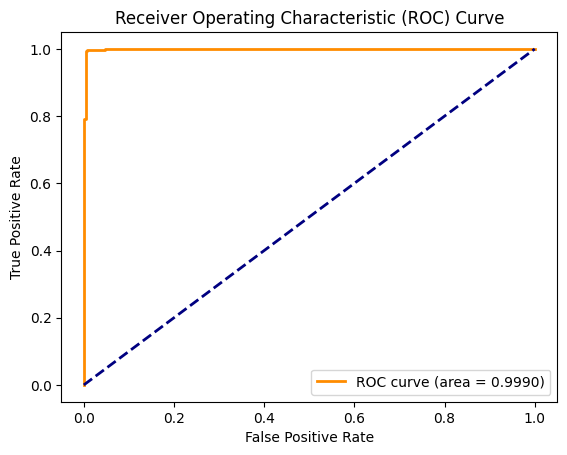

Epoch [1/1], Train Loss: 0.1167
Epoch 1: validation loss 0.04388274019345259
Epoch [1/1], Train Loss: 0.0392
Epoch 2: validation loss 0.03734421800726499
Epoch [1/1], Train Loss: 0.0374
Epoch 3: validation loss 0.03495287409482094
Epoch [1/1], Train Loss: 0.0352
Epoch 4: validation loss 0.0337699142881693
Epoch [1/1], Train Loss: 0.0335
Epoch 5: validation loss 0.036745128446282485
exceed threshold proportion:0.0
exceed threshold proportion:0.596625
benign_error:0.02759437954053283
attack_error:7.4443570845723155


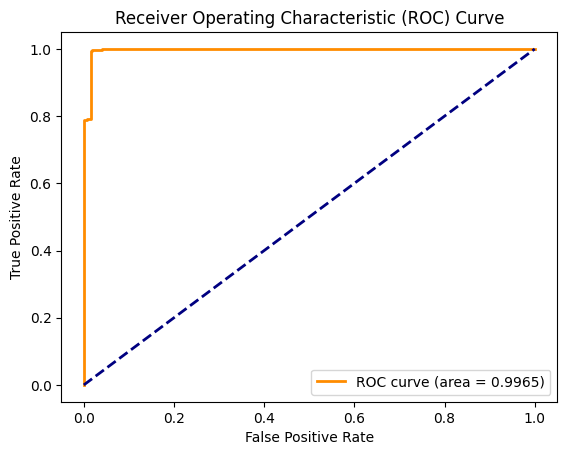

In [ ]:
# Corrected training loss
for client in range(9):
  trainloader, valloader, benign_testloader,attack_testloader = load_datasets(final_df,'Autoencoder',partition_id=client,label_col_num = 3)
  net = Autoencoder(115,58,29)

  for epoch in range(5):
      train(net, trainloader, 1)
      loss,loss_history= validation(net, valloader)
      print(f"Epoch {epoch+1}: validation loss {loss}")
  benign_MSE, benign_MSE_history,false_positive = test(net, benign_testloader,5)
  attack_MSE, attack_MSE_history,true_positive = test(net, attack_testloader,5)
  print(f'benign_error:{benign_MSE}')
  print(f'attack_error:{attack_MSE}')
  plot_roc(benign_MSE_history,attack_MSE_history)

In [ ]:
# Corrected training loss
for client in range(9):
  trainloader, valloader, benign_testloader,attack_testloader = load_datasets(final_df,'Autoencoder',partition_id=client,label_col_num = 3)
  net = Autoencoder(115,58,29)

  for epoch in range(5):
      train(net, trainloader, 1)
      loss,loss_history= validation(net, valloader)
      print(f"Epoch {epoch+1}: validation loss {loss}")
  benign_MSE, benign_MSE_history,false_positive = test(net, benign_testloader,5)
  attack_MSE, attack_MSE_history,true_positive = test(net, attack_testloader,5)
  print(f'benign_error:{benign_MSE}')
  print(f'attack_error:{attack_MSE}')
  plot_roc(benign_MSE_history,attack_MSE_history)

Epoch [1/1], Train Loss: 0.4267
Epoch 1: validation loss 0.42690414587656655
Epoch [1/1], Train Loss: 0.4265
Epoch 2: validation loss 0.42674539517133664
Epoch [1/1], Train Loss: 0.4263
Epoch 3: validation loss 0.426586827253684
Epoch [1/1], Train Loss: 0.4262
Epoch 4: validation loss 0.42642843631597666
Epoch [1/1], Train Loss: 0.4260
Epoch 5: validation loss 0.42627021074295046
exceed threshold proportion:0.0
count_total:3200.0
exceed threshold proportion:0.789875
count_total:8000.0
benign_error:0.4256564345955849
attack_error:46.36846894931793


TypeError: plot_roc() missing 1 required positional argument: 'plot'

In [ ]:
# Corrected training loss
for client in range(9):
  trainloader, valloader, benign_testloader,attack_testloader = load_datasets(final_df,'Autoencoder',partition_id=client,label_col_num = 3)
  net = Autoencoder(115,58,29)

  for epoch in range(5):
      train(net, trainloader, 1)
      loss,loss_history= validation(net, valloader)
      print(f"Epoch {epoch+1}: validation loss {loss}")
  benign_MSE, benign_MSE_history,false_positive = test(net, benign_testloader,5)
  attack_MSE, attack_MSE_history,true_positive = test(net, attack_testloader,5)
  print(f'benign_error:{benign_MSE}')
  print(f'attack_error:{attack_MSE}')
  plot_roc(benign_MSE_history,attack_MSE_history,False)

Epoch [1/1], Train Loss: 0.2704
Epoch 1: validation loss 11.568429864115185
Epoch [1/1], Train Loss: 0.1623
Epoch 2: validation loss 11.484591927131017
Epoch [1/1], Train Loss: 0.1498
Epoch 3: validation loss 11.544599062866634
Epoch [1/1], Train Loss: 0.1199
Epoch 4: validation loss 11.482507281502087
Epoch [1/1], Train Loss: 0.1024
Epoch 5: validation loss 11.468308629923397
exceed threshold proportion:0.0
count_total:1600.0
exceed threshold proportion:0.004
count_total:8000.0
benign_error:0.22387754172086716
attack_error:0.6000531790852547
roc_auc:0.5675
Epoch [1/1], Train Loss: 0.3224
Epoch 1: validation loss 0.21709874156448578
Epoch [1/1], Train Loss: 0.2319
Epoch 2: validation loss 0.1413126717011134
Epoch [1/1], Train Loss: 0.1811
Epoch 3: validation loss 0.09494376331567764
Epoch [1/1], Train Loss: 0.1386
Epoch 4: validation loss 0.10395489897992875
Epoch [1/1], Train Loss: 0.1251
Epoch 5: validation loss 0.10009417053725984
exceed threshold proportion:0.284375
count_total:160

In [ ]:
# Corrected training loss
for client in range(9):
  trainloader, valloader, benign_testloader,attack_testloader = load_datasets(final_df,'Autoencoder',partition_id=client,label_col_num = 3)
  net = Autoencoder(115,58,29)

  for epoch in range(5):
      train(net, trainloader, 1)
      loss,loss_history= validation(net, valloader)
      print(f"Epoch {epoch+1}: validation loss {loss}")
  benign_MSE, benign_MSE_history,false_positive = test(net, benign_testloader,5)
  attack_MSE, attack_MSE_history,true_positive = test(net, attack_testloader,5)
  print(f'benign_error:{benign_MSE}')
  print(f'attack_error:{attack_MSE}')
  plot_roc(benign_MSE_history,attack_MSE_history,False)

Epoch [1/1], Train Loss: 0.1249
Epoch 1: validation loss 0.060063703625630106
Epoch [1/1], Train Loss: 0.0420
Epoch 2: validation loss 0.020684028989993608
Epoch [1/1], Train Loss: 0.0259
Epoch 3: validation loss 0.016951684047205325
Epoch [1/1], Train Loss: 0.0227
Epoch 4: validation loss 0.01593170527082223
Epoch [1/1], Train Loss: 0.0216
Epoch 5: validation loss 0.015087259899920378
exceed threshold proportion:0.0
count_total:3200.0
exceed threshold proportion:0.789875
count_total:8000.0
benign_error:0.02085143112577498
attack_error:46.25290565824508
roc_auc:0.9981
Epoch [1/1], Train Loss: 0.1449
Epoch 1: validation loss 0.06702251834332314
Epoch [1/1], Train Loss: 0.0610
Epoch 2: validation loss 0.05244999464293873
Epoch [1/1], Train Loss: 0.0522
Epoch 3: validation loss 0.04559553908471908
Epoch [1/1], Train Loss: 0.0464
Epoch 4: validation loss 0.04133847271925218
Epoch [1/1], Train Loss: 0.0423
Epoch 5: validation loss 0.0384061188846069
exceed threshold proportion:0.0
count_tot

In [ ]:
attack_MSE, attack_MSE_history,true_positive = test(net, attack_testloader,threshold = 3)

exceed threshold proportion:0.59375
count_total:4000.0


In [13]:
def plot_barchart(list1,list2,title,variables,labels = [f'Client_{i}' for i in range(9)]):
  bar_width = 0.35
  index = np.arange(len(labels))

  plt.figure(figsize=(10, 6))
  bars1 = plt.bar(index, list1, bar_width, label=variables[0])
  bars2 = plt.bar(index + bar_width, list2, bar_width, label=variables[1])

  plt.xlabel("Categories")
  plt.ylabel("Values")
  plt.title(f"MAD vs OCSVM {title}")
  plt.xticks(index + bar_width / 2, labels)  # Adjust x-ticks to be between the two bars
  plt.legend()
  for bar in bars1:
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), f'{bar.get_height():.4g}',
             ha='center', va='bottom')
  for bar in bars2:
      plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), f'{bar.get_height():.4g}',
              ha='center', va='bottom')

In [ ]:
layers_size

NameError: name 'layers_size' is not defined

# **Comparing threshold selection via Median Absolute Deviation, Standard Deviation, and OCSVM**

In [14]:
# with MAD threshold selection
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import StandardScaler
from sklearn.svm import OneClassSVM
def run_test_OCSVM(K,nu,threshold_type = 'STD'):
  client_thresholds = []
  client_fpr = []
  client_fpr_ocsvm = []
  client_tpr = []
  client_tpr_ocsvm = []
  client_roc_auc = []
  for client in range(9):
    trainloader, valloader, benign_testloader,attack_testloader = load_datasets(final_df,'Autoencoder',partition_id=client,label_col_num = 3)
    net = Autoencoder_4_layers(layer_sizes)
    print(f'CLIENT:{client}')
    for epoch in range(50):
        train(net, trainloader, 1)
        loss,loss_history, raw_valid_loss = validation(net, valloader)
        loss_history = np.array(loss_history)
        ## find threshold based on median absolute deviation
        if threshold_type == 'MAD':
          RE_MED = np.median(loss_history)
          RE_MAD = np.median(np.abs(loss_history - RE_MED))
          threshold = RE_MED + K*RE_MAD
        ## find threshold based on std
        elif threshold_type == 'STD':
          q1 = np.percentile(loss_history, 25)
          q3 = np.percentile(loss_history, 75)
          iqr = q3 - q1
          lower_bound = q1 - 1.5 * iqr
          upper_bound = q3 + 1.5 * iqr
          loss_history_filtered = loss_history[(loss_history >= lower_bound) & (loss_history <= upper_bound)]
          #print(f'original loss:{len(loss_history)}')
          #print(f'filtered loss:{len(loss_history_filtered)}')
          mean = np.mean(loss_history_filtered)
          std = np.std(loss_history_filtered)
          threshold = mean + K*std
        ## find threshold based on clustering
        # Reshape the data to 2D (K-Means requires a 2D array)
        #values_reshaped = np.array(values).reshape(-1, 1)

        # Specify the number of clusters
        #k = 2  # Adjust this to your desired number of clusters

        # Apply K-Means clustering
        #kmeans = KMeans(n_clusters=k, random_state=42)
        #clusters = kmeans.fit_predict(values_reshaped)

        print(f"Epoch {epoch+1}: validation loss {loss}")
        print(f'threshold:{threshold}')
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(raw_valid_loss)
    ocsvm = OneClassSVM(kernel='rbf', gamma='scale', nu=nu)
    ocsvm.fit(data_scaled)
    client_thresholds.append(threshold)
    benign_MSE, benign_MSE_history,false_positive,raw_benign_loss = test(net, benign_testloader,threshold = threshold)
    #plot_pca_2d(raw_benign_loss)
    attack_MSE, attack_MSE_history,true_positive, raw_attack_loss = test(net, attack_testloader,threshold = threshold)
    #plot_pca_2d(raw_attack_loss)
    raw_benign_loss_scaled = scaler.transform(raw_benign_loss)
    raw_attack_loss_scaled = scaler.transform(raw_attack_loss)
    benign_predicts = ocsvm.predict(raw_benign_loss_scaled)
    ocsvm_fpr = (benign_predicts < 0).sum()/len(benign_predicts)
    client_fpr_ocsvm.append(ocsvm_fpr)
    print(f'FPR derived with OCSVM:{ocsvm_fpr}')
    attack_predicts = ocsvm.predict(raw_attack_loss_scaled)
    ocsvm_tpr = (attack_predicts < 0).sum()/len(attack_predicts)
    client_tpr_ocsvm.append(ocsvm_tpr)
    print(f'TPR derived with OCSVM:{ocsvm_tpr}')
    fpr,tpr,tnr,fnr = false_positive,true_positive,1-false_positive,1-true_positive
    client_fpr.append(fpr)
    client_tpr.append(tpr)
    print(f'False Positive Rate:{fpr}')
    print(f'True Positive Rate:{tpr}')
    print(f'benign_error:{benign_MSE}')
    print(f'attack_error:{attack_MSE}')
    roc_auc = plot_roc(benign_MSE_history,attack_MSE_history,plot = False)
    client_roc_auc.append(roc_auc)
  history_MAD = {'thresholds':client_thresholds,'fpr':client_fpr,'tpr':client_tpr,'roc_auc':client_roc_auc}
  history_OCSVM = {'fpr':client_fpr_ocsvm,'tpr':client_tpr_ocsvm}
  plot_barchart(client_fpr,client_fpr_ocsvm,'False Positive Rate',['MAD','OCSVM'])
  plot_barchart(client_tpr,client_tpr_ocsvm,'True Positive Rate',['MAD','OCSVM'])
  return history_MAD,history_OCSVM

CLIENT:0
Epoch [1/1], Train Loss: 0.1231
original loss:6240
filtered loss:6086
Epoch 1: validation loss 0.061236356179683635
threshold:0.10925573413479688
Epoch [1/1], Train Loss: 0.0464
original loss:6240
filtered loss:6005
Epoch 2: validation loss 0.022216634003397746
threshold:0.05262623594469293
Epoch [1/1], Train Loss: 0.0304
original loss:6240
filtered loss:5982
Epoch 3: validation loss 0.018967810865396107
threshold:0.04596572798081885
Epoch [1/1], Train Loss: 0.0260
original loss:6240
filtered loss:6017
Epoch 4: validation loss 0.017637682357468668
threshold:0.0434663040272835
Epoch [1/1], Train Loss: 0.0246
original loss:6240
filtered loss:6024
Epoch 5: validation loss 0.016955241594368068
threshold:0.04169516575155942
Epoch [1/1], Train Loss: 0.0237
original loss:6240
filtered loss:6025
Epoch 6: validation loss 0.016194213119645914
threshold:0.04065724885941514
Epoch [1/1], Train Loss: 0.0229
original loss:6240
filtered loss:6017
Epoch 7: validation loss 0.015725451989624745


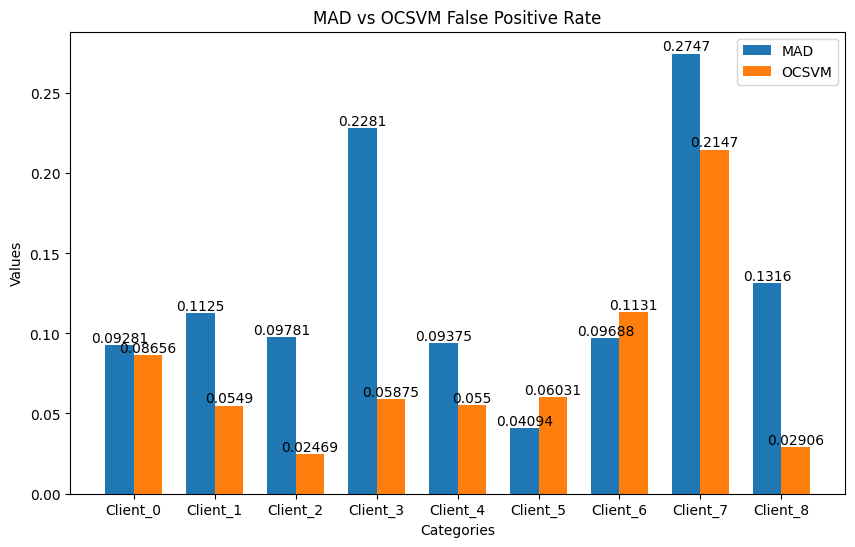

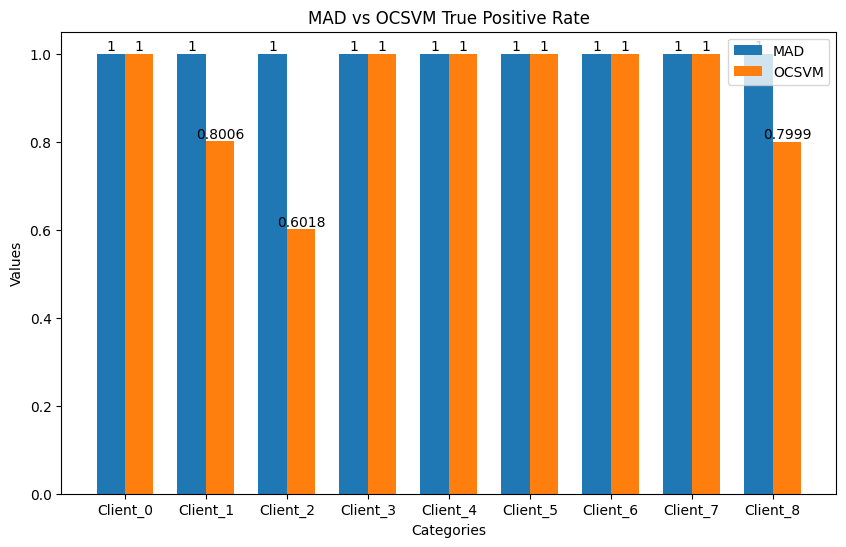

In [ ]:
history_STD,history_OCSVM = run_test_OCSVM(3,0.02,threshold_type='STD')

In [45]:
history_STD

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


{'thresholds': [0.01694688405522135,
  0.03213959247531953,
  0.05050072798225172,
  0.01892263097503833,
  0.030253177449750618,
  0.04693593228816603,
  0.044625295067005716,
  0.027431344645000057,
  0.008618933269005568],
 'fpr': [0.0928125,
  0.11246664125047655,
  0.0978125,
  0.228125,
  0.09375,
  0.0409375,
  0.096875,
  0.2746875,
  0.1315625],
 'tpr': [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0],
 'roc_auc': [0.997396640625,
  0.9996875714830346,
  0.984843984375,
  0.9997256640625001,
  0.99999078125,
  0.9999984765625001,
  0.9809450000000001,
  0.9747321875000001,
  0.9871137109375]}

CLIENT:0
Epoch [1/1], Train Loss: 0.1249
Epoch 1: validation loss 0.061839840694879876
threshold:0.20113617181777954
Epoch [1/1], Train Loss: 0.0549
Epoch 2: validation loss 0.026874497857613443
threshold:0.12220528069883585
Epoch [1/1], Train Loss: 0.0328
Epoch 3: validation loss 0.021706479186048875
threshold:0.07458847714588046
Epoch [1/1], Train Loss: 0.0279
Epoch 4: validation loss 0.0190082940678948
threshold:0.05434679472818971
Epoch [1/1], Train Loss: 0.0250
Epoch 5: validation loss 0.017726928821932046
threshold:0.049196168314665556
Epoch [1/1], Train Loss: 0.0239
Epoch 6: validation loss 0.01698042109895211
threshold:0.04494535690173507
Epoch [1/1], Train Loss: 0.0230
Epoch 7: validation loss 0.016536157028988387
threshold:0.04156857309862971
Epoch [1/1], Train Loss: 0.0223
Epoch 8: validation loss 0.015699799301532598
threshold:0.04257844714447856
Epoch [1/1], Train Loss: 0.0216
Epoch 9: validation loss 0.01498997038564621
threshold:0.04292979696765542
Epoch [1/1], Train Los

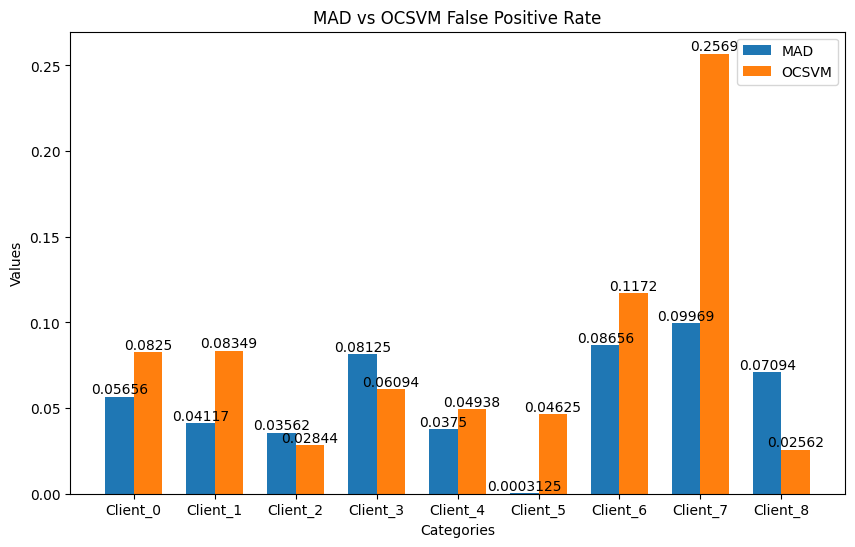

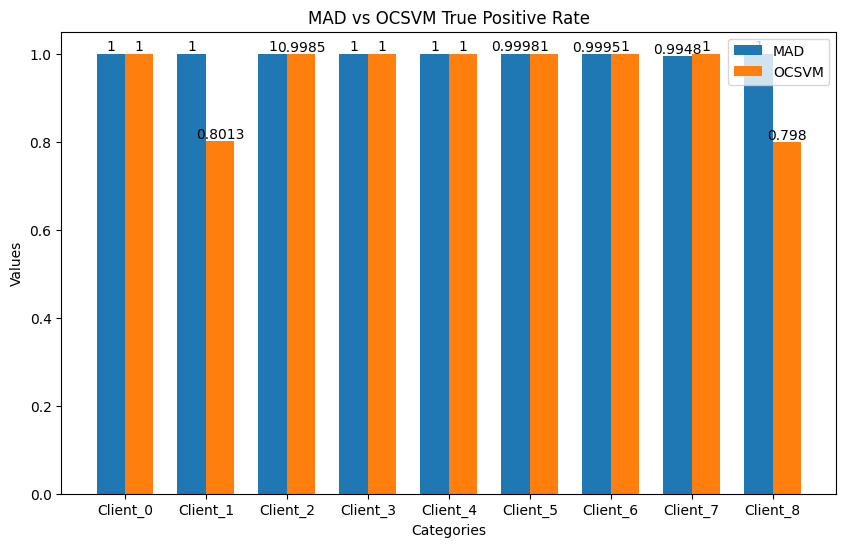

In [ ]:
history_MAD,history_OCSVM = run_test_OCSVM(10,0.02)

MAD-based thresholding outperforms OCSVM if training for large number of epochs

In [ ]:
print(f"roc_auc:{history_MAD['roc_auc']}")
print(f"fpr:{history_MAD['fpr']}")
print(f"tpr:{history_MAD['tpr']}")

roc_auc:[0.995871171875, 0.9997643442622951, 0.985462890625, 0.9998418359375001, 0.9999911328125, 0.999934140625, 0.971465625, 0.9806333984375, 0.9961080859375]
fpr:[0.0565625, 0.041174227983225314, 0.035625, 0.08125, 0.0375, 0.0003125, 0.0865625, 0.0996875, 0.0709375]
tpr:[1.0, 1.0, 1.0, 1.0, 1.0, 0.99975, 0.9995, 0.99475, 1.0]


In [ ]:
history_MAD['roc_auc']

[0.9976857421875,
 0.9990680518490279,
 0.9851975000000001,
 0.99583390625,
 0.9973245703125,
 0.9900319140625,
 0.974895078125,
 0.9960983984375,
 0.99546671875]

In [ ]:
history_MAD['roc_auc']

[0.9982446875,
 0.9989921845215401,
 0.985335078125,
 0.9994646875,
 0.99991640625,
 0.9999111328124999,
 0.9748805468749999,
 0.99804890625,
 0.9972911328125]

Epoch [1/1], Train Loss: 0.1276
Epoch [1/1], Train Loss: 0.0404
Epoch [1/1], Train Loss: 0.0287
Epoch [1/1], Train Loss: 0.0244
Epoch [1/1], Train Loss: 0.0225
exceed threshold proportion:0.0271875
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
exceed threshold proportion:0.0265625
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
exceed threshold proportion:0.0259375
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
exceed threshold proportion:0.025625
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
exceed threshold proportion:0.024375
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
exceed threshold proportion:0.02375
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
exceed threshold proportion:0.0225
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
exceed threshold proportion:0.0221875
count_total:3200.0
exceed threshold proportion:1.0
co

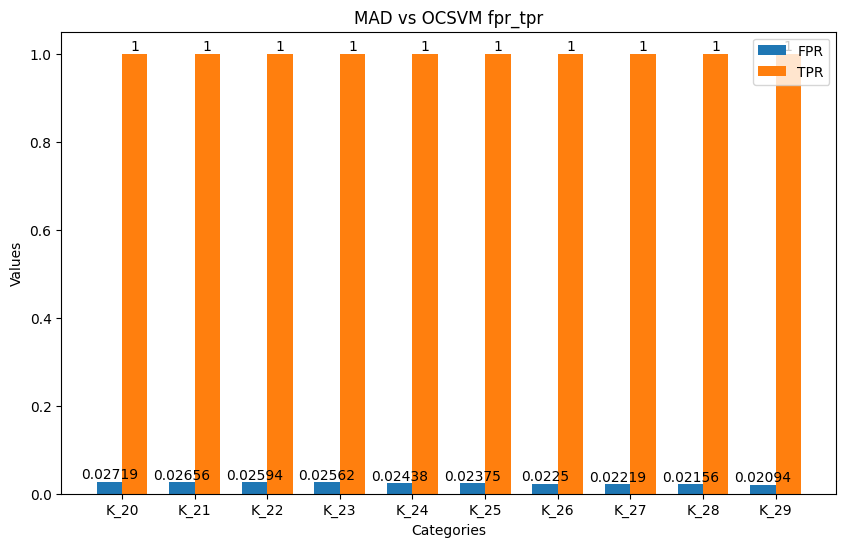

In [ ]:
trainloader, valloader, benign_testloader,attack_testloader = load_datasets(final_df,'Autoencoder',partition_id=0,label_col_num = 3)
net = Autoencoder(115,58,29)
for epoch in range(5):
    train(net, trainloader, 1)
    loss,loss_history, raw_valid_loss = validation(net, valloader)
    ## find threshold based on median absolute deviation
    RE_MED = np.median(loss_history)
    RE_MAD = np.median(np.abs(loss_history - RE_MED))
    std = np.std(loss_history)
fpr_list = []
tpr_list = []
for K in range(20,30):
  threshold = RE_MED + K*RE_MAD
  benign_MSE, benign_MSE_history,false_positive,raw_benign_loss = test(net, benign_testloader,threshold = threshold)
  attack_MSE, attack_MSE_history,true_positive, raw_attack_loss = test(net, attack_testloader,threshold = threshold)
  fpr_list.append(false_positive)
  tpr_list.append(true_positive)
plot_barchart(fpr_list,tpr_list,'fpr_tpr',['FPR','TPR'],labels = [f'K_{i}' for i in range(20,30)])

In [ ]:
len(valloader)*32

6240

Epoch [1/1], Train Loss: 0.1263
Epoch [1/1], Train Loss: 0.0510
Epoch [1/1], Train Loss: 0.0316
Epoch [1/1], Train Loss: 0.0269
Epoch [1/1], Train Loss: 0.0245
Epoch [1/1], Train Loss: 0.0236
Epoch [1/1], Train Loss: 0.0229
Epoch [1/1], Train Loss: 0.0221
Epoch [1/1], Train Loss: 0.0211
Epoch [1/1], Train Loss: 0.0202
Epoch [1/1], Train Loss: 0.0192
Epoch [1/1], Train Loss: 0.0183
Epoch [1/1], Train Loss: 0.0175
Epoch [1/1], Train Loss: 0.0167
Epoch [1/1], Train Loss: 0.0161
Epoch [1/1], Train Loss: 0.0156
Epoch [1/1], Train Loss: 0.0153
Epoch [1/1], Train Loss: 0.0149
Epoch [1/1], Train Loss: 0.0147
Epoch [1/1], Train Loss: 0.0144
Epoch [1/1], Train Loss: 0.0141
Epoch [1/1], Train Loss: 0.0137
Epoch [1/1], Train Loss: 0.0135
Epoch [1/1], Train Loss: 0.0132
Epoch [1/1], Train Loss: 0.0129
Epoch [1/1], Train Loss: 0.0127
Epoch [1/1], Train Loss: 0.0124
Epoch [1/1], Train Loss: 0.0121
Epoch [1/1], Train Loss: 0.0119
Epoch [1/1], Train Loss: 0.0117
Epoch [1/1], Train Loss: 0.0114
Epoch [1

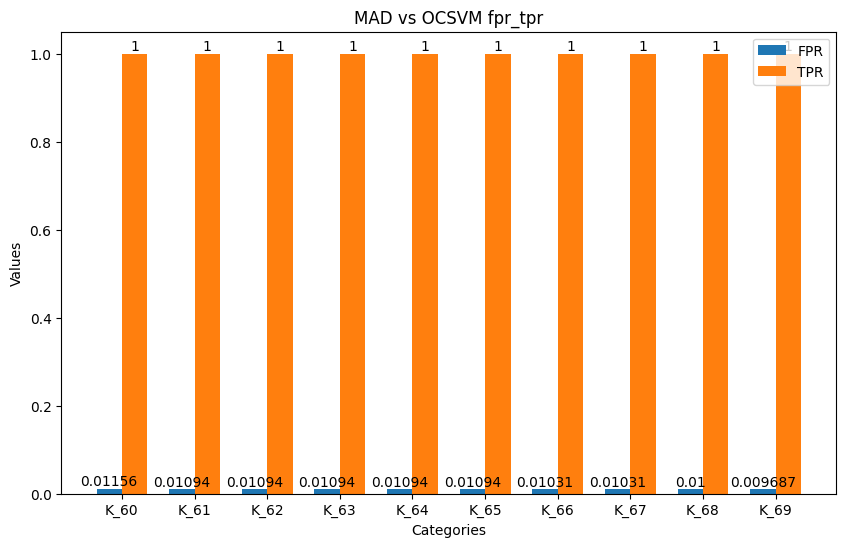

In [ ]:
trainloader, valloader, benign_testloader,attack_testloader = load_datasets(final_df,'Autoencoder',partition_id=0,label_col_num = 3)
net = Autoencoder_4_layers(layer_sizes)
for epoch in range(50):
    train(net, trainloader, 1)
    loss,loss_history, raw_valid_loss = validation(net, valloader)
    ## find threshold based on median absolute deviation
    RE_MED = np.median(loss_history)
    RE_MAD = np.median(np.abs(loss_history - RE_MED))
    std = np.std(loss_history)
fpr_list = []
tpr_list = []
for K in range(60,70):
  threshold = RE_MED + K*RE_MAD
  benign_MSE, benign_MSE_history,false_positive,raw_benign_loss = test(net, benign_testloader,threshold = threshold)
  attack_MSE, attack_MSE_history,true_positive, raw_attack_loss = test(net, attack_testloader,threshold = threshold)
  fpr_list.append(false_positive)
  tpr_list.append(true_positive)
plot_barchart(fpr_list,tpr_list,'fpr_tpr',['FPR','TPR'],labels = [f'K_{i}' for i in range(60,70)])

## **Select K = 69 for Client 1**

Epoch [1/1], Train Loss: 0.1508
Epoch [1/1], Train Loss: 0.0808
Epoch [1/1], Train Loss: 0.0606
Epoch [1/1], Train Loss: 0.0498
Epoch [1/1], Train Loss: 0.0467
Epoch [1/1], Train Loss: 0.0446
Epoch [1/1], Train Loss: 0.0419
Epoch [1/1], Train Loss: 0.0397
Epoch [1/1], Train Loss: 0.0381
Epoch [1/1], Train Loss: 0.0371
Epoch [1/1], Train Loss: 0.0362
Epoch [1/1], Train Loss: 0.0352
Epoch [1/1], Train Loss: 0.0342
Epoch [1/1], Train Loss: 0.0335
Epoch [1/1], Train Loss: 0.0320
Epoch [1/1], Train Loss: 0.0311
Epoch [1/1], Train Loss: 0.0307
Epoch [1/1], Train Loss: 0.0301
Epoch [1/1], Train Loss: 0.0297
Epoch [1/1], Train Loss: 0.0291
Epoch [1/1], Train Loss: 0.0286
Epoch [1/1], Train Loss: 0.0281
Epoch [1/1], Train Loss: 0.0275
Epoch [1/1], Train Loss: 0.0269
Epoch [1/1], Train Loss: 0.0265
Epoch [1/1], Train Loss: 0.0260
Epoch [1/1], Train Loss: 0.0255
Epoch [1/1], Train Loss: 0.0250
Epoch [1/1], Train Loss: 0.0245
Epoch [1/1], Train Loss: 0.0240
Epoch [1/1], Train Loss: 0.0237
Epoch [1

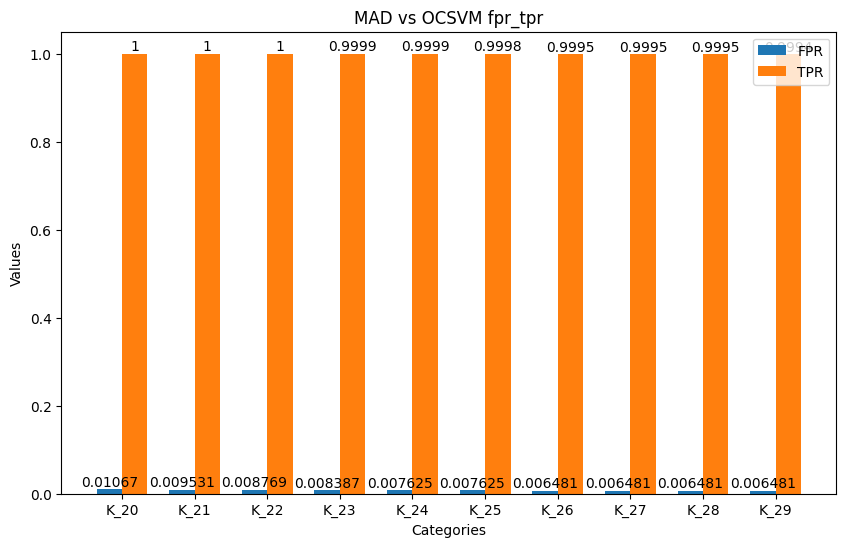

In [ ]:
trainloader, valloader, benign_testloader,attack_testloader = load_datasets(final_df,'Autoencoder',partition_id=1,label_col_num = 3)
net = Autoencoder_4_layers(layer_sizes)
for epoch in range(50):
    train(net, trainloader, 1)
    loss,loss_history, raw_valid_loss = validation(net, valloader)
    ## find threshold based on median absolute deviation
    RE_MED = np.median(loss_history)
    RE_MAD = np.median(np.abs(loss_history - RE_MED))
    std = np.std(loss_history)
fpr_list = []
tpr_list = []
for K in range(20,30):
  threshold = RE_MED + K*RE_MAD
  benign_MSE, benign_MSE_history,false_positive,raw_benign_loss = test(net, benign_testloader,threshold = threshold)
  attack_MSE, attack_MSE_history,true_positive, raw_attack_loss = test(net, attack_testloader,threshold = threshold)
  fpr_list.append(false_positive)
  tpr_list.append(true_positive)
plot_barchart(fpr_list,tpr_list,'fpr_tpr',['FPR','TPR'],labels = [f'K_{i}' for i in range(20,30)])

## **Select K = 22 for Client 2**

Epoch [1/1], Train Loss: 0.1792
Epoch [1/1], Train Loss: 0.0887
Epoch [1/1], Train Loss: 0.0745
Epoch [1/1], Train Loss: 0.0648
Epoch [1/1], Train Loss: 0.0599
Epoch [1/1], Train Loss: 0.0556
Epoch [1/1], Train Loss: 0.0522
Epoch [1/1], Train Loss: 0.0487
Epoch [1/1], Train Loss: 0.0450
Epoch [1/1], Train Loss: 0.0425
Epoch [1/1], Train Loss: 0.0410
Epoch [1/1], Train Loss: 0.0398
Epoch [1/1], Train Loss: 0.0385
Epoch [1/1], Train Loss: 0.0373
Epoch [1/1], Train Loss: 0.0363
Epoch [1/1], Train Loss: 0.0353
Epoch [1/1], Train Loss: 0.0345
Epoch [1/1], Train Loss: 0.0338
Epoch [1/1], Train Loss: 0.0331
Epoch [1/1], Train Loss: 0.0325
Epoch [1/1], Train Loss: 0.0318
Epoch [1/1], Train Loss: 0.0314
Epoch [1/1], Train Loss: 0.0309
Epoch [1/1], Train Loss: 0.0305
Epoch [1/1], Train Loss: 0.0301
Epoch [1/1], Train Loss: 0.0297
Epoch [1/1], Train Loss: 0.0293
Epoch [1/1], Train Loss: 0.0290
Epoch [1/1], Train Loss: 0.0285
Epoch [1/1], Train Loss: 0.0283
Epoch [1/1], Train Loss: 0.0278
Epoch [1

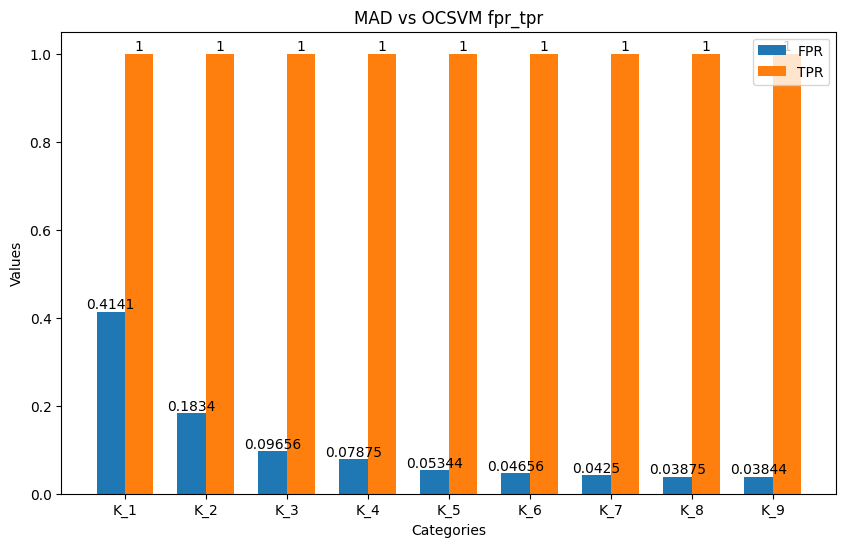

In [ ]:
trainloader, valloader, benign_testloader,attack_testloader = load_datasets(final_df,'Autoencoder',partition_id=2,label_col_num = 3)
net = Autoencoder_4_layers(layer_sizes)
for epoch in range(50):
    train(net, trainloader, 1)
    loss,loss_history, raw_valid_loss = validation(net, valloader)
    ## find threshold based on median absolute deviation
    RE_MED = np.median(loss_history)
    RE_MAD = np.median(np.abs(loss_history - RE_MED))
    std = np.std(loss_history)
fpr_list = []
tpr_list = []
for K in range(1,10):
  threshold = RE_MED + K*RE_MAD
  benign_MSE, benign_MSE_history,false_positive,raw_benign_loss = test(net, benign_testloader,threshold = threshold)
  attack_MSE, attack_MSE_history,true_positive, raw_attack_loss = test(net, attack_testloader,threshold = threshold)
  fpr_list.append(false_positive)
  tpr_list.append(true_positive)
plot_barchart(fpr_list,tpr_list,'fpr_tpr',['FPR','TPR'],labels = [f'K_{i}' for i in range(1,10)])

## **Select K = 9 for Client 3**

Epoch [1/1], Train Loss: 0.1453
Epoch [1/1], Train Loss: 0.1119
Epoch [1/1], Train Loss: 0.1068
Epoch [1/1], Train Loss: 0.0972
Epoch [1/1], Train Loss: 0.0818
Epoch [1/1], Train Loss: 0.0744
Epoch [1/1], Train Loss: 0.0712
Epoch [1/1], Train Loss: 0.0703
Epoch [1/1], Train Loss: 0.0687
Epoch [1/1], Train Loss: 0.0657
Epoch [1/1], Train Loss: 0.0634
Epoch [1/1], Train Loss: 0.0631
Epoch [1/1], Train Loss: 0.0615
Epoch [1/1], Train Loss: 0.0594
Epoch [1/1], Train Loss: 0.0601
Epoch [1/1], Train Loss: 0.0577
Epoch [1/1], Train Loss: 0.0581
Epoch [1/1], Train Loss: 0.0564
Epoch [1/1], Train Loss: 0.0564
Epoch [1/1], Train Loss: 0.0554
Epoch [1/1], Train Loss: 0.0543
Epoch [1/1], Train Loss: 0.0553
Epoch [1/1], Train Loss: 0.0533
Epoch [1/1], Train Loss: 0.0537
Epoch [1/1], Train Loss: 0.0542
Epoch [1/1], Train Loss: 0.0532
Epoch [1/1], Train Loss: 0.0502
Epoch [1/1], Train Loss: 0.0474
Epoch [1/1], Train Loss: 0.0476
Epoch [1/1], Train Loss: 0.0456
Epoch [1/1], Train Loss: 0.0453
Epoch [1

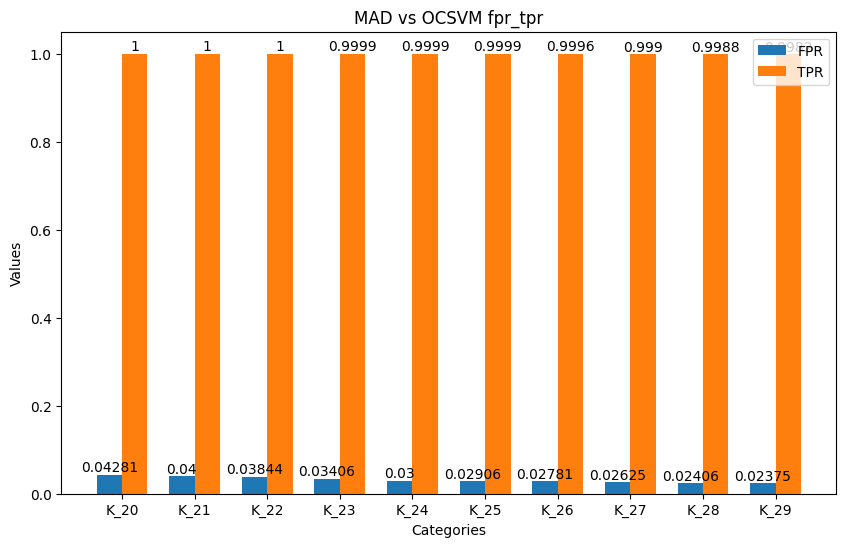

In [ ]:
trainloader, valloader, benign_testloader,attack_testloader = load_datasets(final_df,'Autoencoder',partition_id=3,label_col_num = 3)
net = Autoencoder_4_layers(layer_sizes)
for epoch in range(50):
    train(net, trainloader, 1)
    loss,loss_history, raw_valid_loss = validation(net, valloader)
    ## find threshold based on median absolute deviation
    RE_MED = np.median(loss_history)
    RE_MAD = np.median(np.abs(loss_history - RE_MED))
    std = np.std(loss_history)
fpr_list = []
tpr_list = []
for K in range(20,30):
  threshold = RE_MED + K*RE_MAD
  benign_MSE, benign_MSE_history,false_positive,raw_benign_loss = test(net, benign_testloader,threshold = threshold)
  attack_MSE, attack_MSE_history,true_positive, raw_attack_loss = test(net, attack_testloader,threshold = threshold)
  fpr_list.append(false_positive)
  tpr_list.append(true_positive)
plot_barchart(fpr_list,tpr_list,'fpr_tpr',['FPR','TPR'],labels = [f'K_{i}' for i in range(20,30)])

## **Select K = 21 for client 4**

Epoch [1/1], Train Loss: 0.1615
Epoch [1/1], Train Loss: 0.0822
Epoch [1/1], Train Loss: 0.0700
Epoch [1/1], Train Loss: 0.0648
Epoch [1/1], Train Loss: 0.0607
Epoch [1/1], Train Loss: 0.0572
Epoch [1/1], Train Loss: 0.0548
Epoch [1/1], Train Loss: 0.0511
Epoch [1/1], Train Loss: 0.0474
Epoch [1/1], Train Loss: 0.0449
Epoch [1/1], Train Loss: 0.0433
Epoch [1/1], Train Loss: 0.0415
Epoch [1/1], Train Loss: 0.0415
Epoch [1/1], Train Loss: 0.0398
Epoch [1/1], Train Loss: 0.0388
Epoch [1/1], Train Loss: 0.0376
Epoch [1/1], Train Loss: 0.0372
Epoch [1/1], Train Loss: 0.0363
Epoch [1/1], Train Loss: 0.0343
Epoch [1/1], Train Loss: 0.0328
Epoch [1/1], Train Loss: 0.0322
Epoch [1/1], Train Loss: 0.0317
Epoch [1/1], Train Loss: 0.0326
Epoch [1/1], Train Loss: 0.0311
Epoch [1/1], Train Loss: 0.0309
Epoch [1/1], Train Loss: 0.0301
Epoch [1/1], Train Loss: 0.0289
Epoch [1/1], Train Loss: 0.0282
Epoch [1/1], Train Loss: 0.0277
Epoch [1/1], Train Loss: 0.0287
Epoch [1/1], Train Loss: 0.0264
Epoch [1

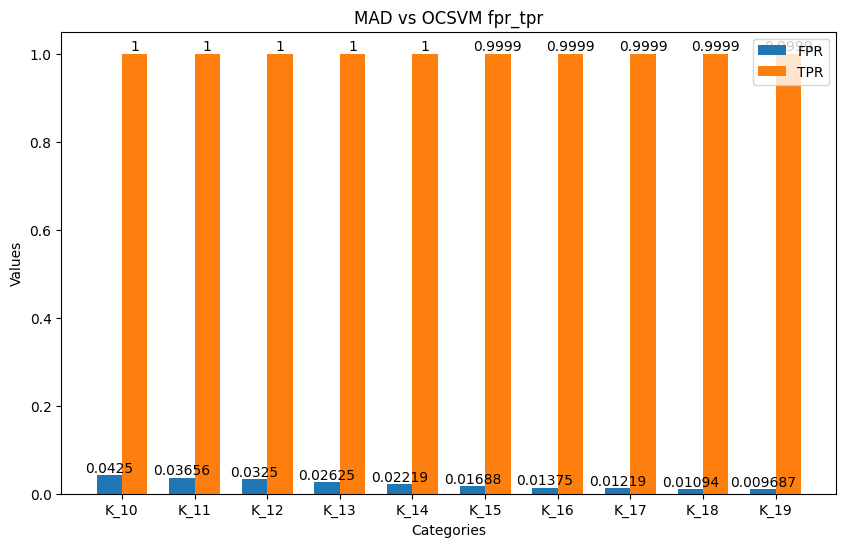

In [ ]:
trainloader, valloader, benign_testloader,attack_testloader = load_datasets(final_df,'Autoencoder',partition_id=4,label_col_num = 3)
net = Autoencoder_4_layers(layer_sizes)
for epoch in range(50):
    train(net, trainloader, 1)
    loss,loss_history, raw_valid_loss = validation(net, valloader)
    ## find threshold based on median absolute deviation
    RE_MED = np.median(loss_history)
    RE_MAD = np.median(np.abs(loss_history - RE_MED))
    std = np.std(loss_history)
fpr_list = []
tpr_list = []
for K in range(10,20):
  threshold = RE_MED + K*RE_MAD
  benign_MSE, benign_MSE_history,false_positive,raw_benign_loss = test(net, benign_testloader,threshold = threshold)
  attack_MSE, attack_MSE_history,true_positive, raw_attack_loss = test(net, attack_testloader,threshold = threshold)
  fpr_list.append(false_positive)
  tpr_list.append(true_positive)
  roc_auc = plot_roc(benign_MSE_history,attack_MSE_history,plot = False)
  print(f'roc_auc:{roc_auc}')
plot_barchart(fpr_list,tpr_list,'fpr_tpr',['FPR','TPR'],labels = [f'K_{i}' for i in range(10,20)])


## **Select K = 14 for client 5**

Epoch [1/1], Train Loss: 0.1829
Epoch [1/1], Train Loss: 0.1132
Epoch [1/1], Train Loss: 0.0954
Epoch [1/1], Train Loss: 0.0873
Epoch [1/1], Train Loss: 0.0830
Epoch [1/1], Train Loss: 0.0721
Epoch [1/1], Train Loss: 0.0635
Epoch [1/1], Train Loss: 0.0620
Epoch [1/1], Train Loss: 0.0585
Epoch [1/1], Train Loss: 0.0545
Epoch [1/1], Train Loss: 0.0536
Epoch [1/1], Train Loss: 0.0542
Epoch [1/1], Train Loss: 0.0509
Epoch [1/1], Train Loss: 0.0497
Epoch [1/1], Train Loss: 0.0478
Epoch [1/1], Train Loss: 0.0481
Epoch [1/1], Train Loss: 0.0478
Epoch [1/1], Train Loss: 0.0439
Epoch [1/1], Train Loss: 0.0473
Epoch [1/1], Train Loss: 0.0467
Epoch [1/1], Train Loss: 0.0455
Epoch [1/1], Train Loss: 0.0425
Epoch [1/1], Train Loss: 0.0415
Epoch [1/1], Train Loss: 0.0421
Epoch [1/1], Train Loss: 0.0397
Epoch [1/1], Train Loss: 0.0391
Epoch [1/1], Train Loss: 0.0399
Epoch [1/1], Train Loss: 0.0390
Epoch [1/1], Train Loss: 0.0393
Epoch [1/1], Train Loss: 0.0371
Epoch [1/1], Train Loss: 0.0388
Epoch [1

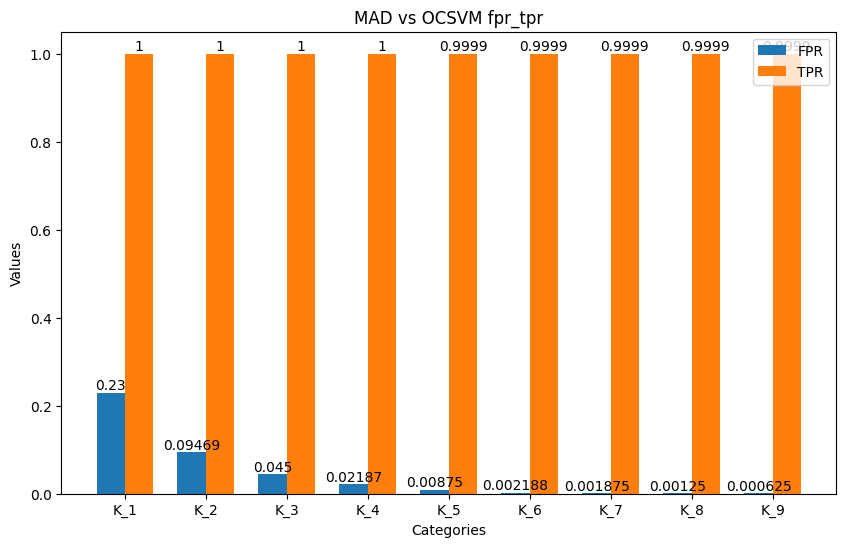

In [ ]:
trainloader, valloader, benign_testloader,attack_testloader = load_datasets(final_df,'Autoencoder',partition_id=5,label_col_num = 3)
net = Autoencoder_4_layers(layer_sizes)
for epoch in range(50):
    train(net, trainloader, 1)
    loss,loss_history, raw_valid_loss = validation(net, valloader)
    ## find threshold based on median absolute deviation
    RE_MED = np.median(loss_history)
    RE_MAD = np.median(np.abs(loss_history - RE_MED))
    std = np.std(loss_history)
fpr_list = []
tpr_list = []
for K in range(1,10):
  threshold = RE_MED + K*RE_MAD
  benign_MSE, benign_MSE_history,false_positive,raw_benign_loss = test(net, benign_testloader,threshold = threshold)
  attack_MSE, attack_MSE_history,true_positive, raw_attack_loss = test(net, attack_testloader,threshold = threshold)
  fpr_list.append(false_positive)
  tpr_list.append(true_positive)
  roc_auc = plot_roc(benign_MSE_history,attack_MSE_history,plot = False)
  print(f'roc_auc:{roc_auc}')
plot_barchart(fpr_list,tpr_list,'fpr_tpr',['FPR','TPR'],labels = [f'K_{i}' for i in range(1,10)])


## **Select K = 4 for client 6**

Epoch [1/1], Train Loss: 0.1519
Epoch [1/1], Train Loss: 0.0545
Epoch [1/1], Train Loss: 0.0435
Epoch [1/1], Train Loss: 0.0312
Epoch [1/1], Train Loss: 0.0277
Epoch [1/1], Train Loss: 0.0261
Epoch [1/1], Train Loss: 0.0251
Epoch [1/1], Train Loss: 0.0244
Epoch [1/1], Train Loss: 0.0239
Epoch [1/1], Train Loss: 0.0233
Epoch [1/1], Train Loss: 0.0226
Epoch [1/1], Train Loss: 0.0212
Epoch [1/1], Train Loss: 0.0196
Epoch [1/1], Train Loss: 0.0175
Epoch [1/1], Train Loss: 0.0170
Epoch [1/1], Train Loss: 0.0154
Epoch [1/1], Train Loss: 0.0152
Epoch [1/1], Train Loss: 0.0143
Epoch [1/1], Train Loss: 0.0143
Epoch [1/1], Train Loss: 0.0137
Epoch [1/1], Train Loss: 0.0138
Epoch [1/1], Train Loss: 0.0133
Epoch [1/1], Train Loss: 0.0136
Epoch [1/1], Train Loss: 0.0132
Epoch [1/1], Train Loss: 0.0130
Epoch [1/1], Train Loss: 0.0130
Epoch [1/1], Train Loss: 0.0127
Epoch [1/1], Train Loss: 0.0127
Epoch [1/1], Train Loss: 0.0124
Epoch [1/1], Train Loss: 0.0126
Epoch [1/1], Train Loss: 0.0122
Epoch [1

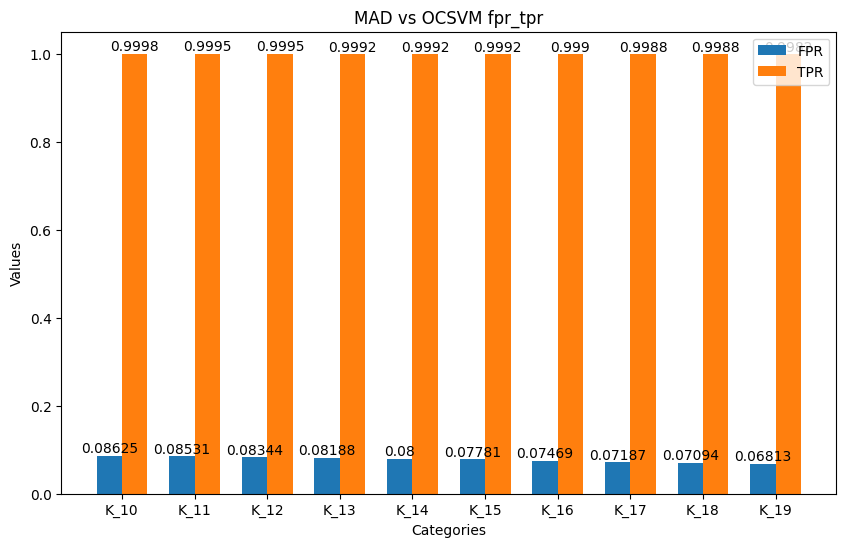

In [ ]:
trainloader, valloader, benign_testloader,attack_testloader = load_datasets(final_df,'Autoencoder',partition_id=6,label_col_num = 3)
net = Autoencoder_4_layers(layer_sizes)
for epoch in range(50):
    train(net, trainloader, 1)
    loss,loss_history, raw_valid_loss = validation(net, valloader)
    ## find threshold based on median absolute deviation
    RE_MED = np.median(loss_history)
    RE_MAD = np.median(np.abs(loss_history - RE_MED))
    std = np.std(loss_history)
fpr_list = []
tpr_list = []
for K in range(10,20):
  threshold = RE_MED + K*RE_MAD
  benign_MSE, benign_MSE_history,false_positive,raw_benign_loss = test(net, benign_testloader,threshold = threshold)
  attack_MSE, attack_MSE_history,true_positive, raw_attack_loss = test(net, attack_testloader,threshold = threshold)
  fpr_list.append(false_positive)
  tpr_list.append(true_positive)
  roc_auc = plot_roc(benign_MSE_history,attack_MSE_history,plot = False)
  print(f'roc_auc:{roc_auc}')
plot_barchart(fpr_list,tpr_list,'fpr_tpr',['FPR','TPR'],labels = [f'K_{i}' for i in range(10,20)])


## **Select K = 9 for client 7**

Epoch [1/1], Train Loss: 0.1777
Epoch [1/1], Train Loss: 0.0960
Epoch [1/1], Train Loss: 0.0902
Epoch [1/1], Train Loss: 0.0872
Epoch [1/1], Train Loss: 0.0781
Epoch [1/1], Train Loss: 0.0683
Epoch [1/1], Train Loss: 0.0695
Epoch [1/1], Train Loss: 0.0593
Epoch [1/1], Train Loss: 0.0543
Epoch [1/1], Train Loss: 0.0514
Epoch [1/1], Train Loss: 0.0469
Epoch [1/1], Train Loss: 0.0431
Epoch [1/1], Train Loss: 0.0420
Epoch [1/1], Train Loss: 0.0406
Epoch [1/1], Train Loss: 0.0396
Epoch [1/1], Train Loss: 0.0393
Epoch [1/1], Train Loss: 0.0394
Epoch [1/1], Train Loss: 0.0383
Epoch [1/1], Train Loss: 0.0376
Epoch [1/1], Train Loss: 0.0366
Epoch [1/1], Train Loss: 0.0367
Epoch [1/1], Train Loss: 0.0375
Epoch [1/1], Train Loss: 0.0366
Epoch [1/1], Train Loss: 0.0367
Epoch [1/1], Train Loss: 0.0356
Epoch [1/1], Train Loss: 0.0358
Epoch [1/1], Train Loss: 0.0348
Epoch [1/1], Train Loss: 0.0343
Epoch [1/1], Train Loss: 0.0350
Epoch [1/1], Train Loss: 0.0346
Epoch [1/1], Train Loss: 0.0329
Epoch [1

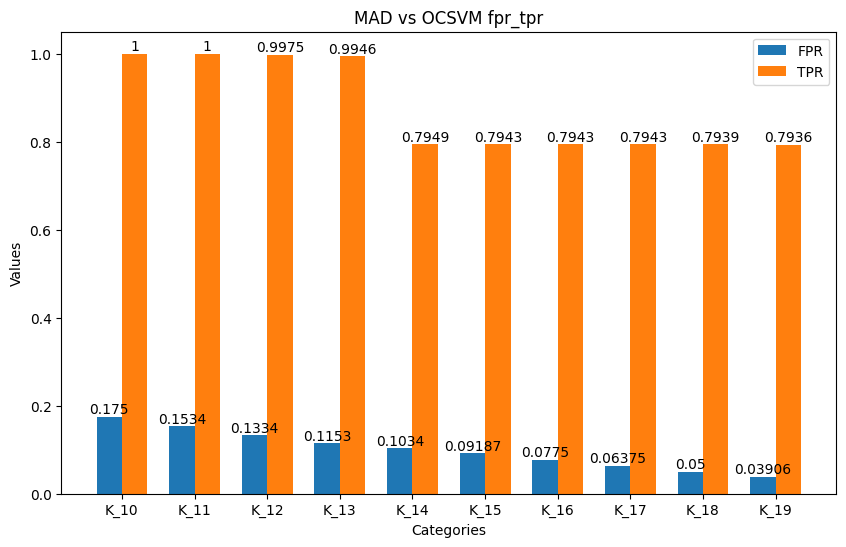

In [ ]:
trainloader, valloader, benign_testloader,attack_testloader = load_datasets(final_df,'Autoencoder',partition_id=7,label_col_num = 3)
net = Autoencoder_4_layers(layer_sizes)
for epoch in range(50):
    train(net, trainloader, 1)
    loss,loss_history, raw_valid_loss = validation(net, valloader)
    ## find threshold based on median absolute deviation
    RE_MED = np.median(loss_history)
    RE_MAD = np.median(np.abs(loss_history - RE_MED))
    std = np.std(loss_history)
fpr_list = []
tpr_list = []
for K in range(10,20):
  threshold = RE_MED + K*RE_MAD
  benign_MSE, benign_MSE_history,false_positive,raw_benign_loss = test(net, benign_testloader,threshold = threshold)
  attack_MSE, attack_MSE_history,true_positive, raw_attack_loss = test(net, attack_testloader,threshold = threshold)
  fpr_list.append(false_positive)
  tpr_list.append(true_positive)
  roc_auc = plot_roc(benign_MSE_history,attack_MSE_history,plot = False)
  print(f'roc_auc:{roc_auc}')
plot_barchart(fpr_list,tpr_list,'fpr_tpr',['FPR','TPR'],labels = [f'K_{i}' for i in range(10,20)])


## **Select K = 10 for client 8**

Epoch [1/1], Train Loss: 0.1242
Epoch [1/1], Train Loss: 0.0489
Epoch [1/1], Train Loss: 0.0417
Epoch [1/1], Train Loss: 0.0389
Epoch [1/1], Train Loss: 0.0376
Epoch [1/1], Train Loss: 0.0347
Epoch [1/1], Train Loss: 0.0331
Epoch [1/1], Train Loss: 0.0313
Epoch [1/1], Train Loss: 0.0300
Epoch [1/1], Train Loss: 0.0290
Epoch [1/1], Train Loss: 0.0286
Epoch [1/1], Train Loss: 0.0282
Epoch [1/1], Train Loss: 0.0276
Epoch [1/1], Train Loss: 0.0275
Epoch [1/1], Train Loss: 0.0271
Epoch [1/1], Train Loss: 0.0262
Epoch [1/1], Train Loss: 0.0255
Epoch [1/1], Train Loss: 0.0252
Epoch [1/1], Train Loss: 0.0243
Epoch [1/1], Train Loss: 0.0238
Epoch [1/1], Train Loss: 0.0233
Epoch [1/1], Train Loss: 0.0228
Epoch [1/1], Train Loss: 0.0229
Epoch [1/1], Train Loss: 0.0221
Epoch [1/1], Train Loss: 0.0211
Epoch [1/1], Train Loss: 0.0207
Epoch [1/1], Train Loss: 0.0206
Epoch [1/1], Train Loss: 0.0201
Epoch [1/1], Train Loss: 0.0212
Epoch [1/1], Train Loss: 0.0214
Epoch [1/1], Train Loss: 0.0199
Epoch [1

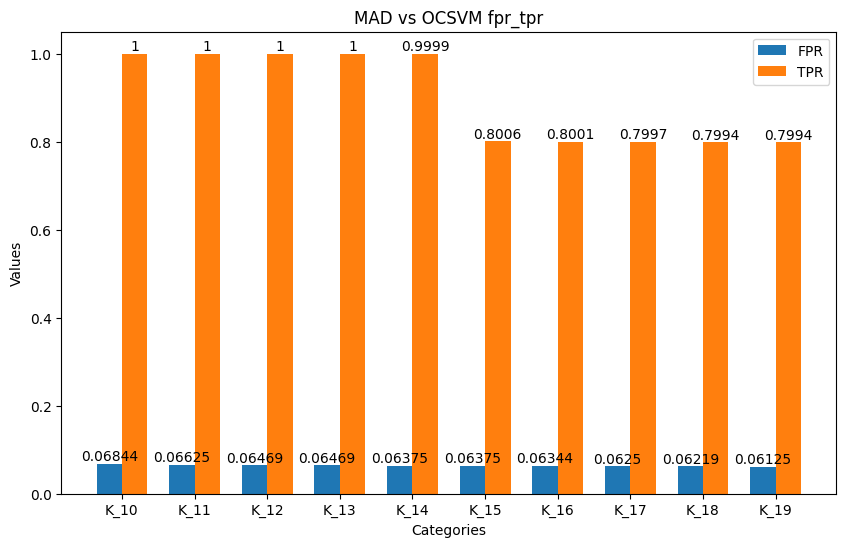

In [ ]:
trainloader, valloader, benign_testloader,attack_testloader = load_datasets(final_df,'Autoencoder',partition_id=8,label_col_num = 3)
net = Autoencoder_4_layers(layer_sizes)
for epoch in range(50):
    train(net, trainloader, 1)
    loss,loss_history, raw_valid_loss = validation(net, valloader)
    ## find threshold based on median absolute deviation
    RE_MED = np.median(loss_history)
    RE_MAD = np.median(np.abs(loss_history - RE_MED))
    std = np.std(loss_history)
fpr_list = []
tpr_list = []
for K in range(10,20):
  threshold = RE_MED + K*RE_MAD
  benign_MSE, benign_MSE_history,false_positive,raw_benign_loss = test(net, benign_testloader,threshold = threshold)
  attack_MSE, attack_MSE_history,true_positive, raw_attack_loss = test(net, attack_testloader,threshold = threshold)
  fpr_list.append(false_positive)
  tpr_list.append(true_positive)
  roc_auc = plot_roc(benign_MSE_history,attack_MSE_history,plot = False)
  print(f'roc_auc:{roc_auc}')
plot_barchart(fpr_list,tpr_list,'fpr_tpr',['FPR','TPR'],labels = [f'K_{i}' for i in range(10,20)])


## **Select K = 13 for client 9**

In [ ]:
client_thresholds = {0:65,1:22,2:9,3:21,4:14,5:4,6:9,7:9,8:13}

# **Train individual clients with individual thresholds**

In [ ]:
# with MAD threshold selection
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import StandardScaler
from sklearn.svm import OneClassSVM
def run_test_customized(K_dict,nu,threshold_type = 'MAD'):
  client_thresholds = []
  client_fpr = []
  client_fpr_ocsvm = []
  client_tpr = []
  client_tpr_ocsvm = []
  client_roc_auc = []
  for client in range(9):
    K = K_dict[client]
    trainloader, valloader, benign_testloader,attack_testloader = load_datasets(final_df,'Autoencoder',partition_id=client,label_col_num = 3)
    net = Autoencoder_4_layers(layer_sizes)
    print(f'CLIENT:{client}')
    for epoch in range(50):
        train(net, trainloader, 1)
        loss,loss_history, raw_valid_loss = validation(net, valloader)
        ## find threshold based on median absolute deviation
        RE_MED = np.median(loss_history)
        RE_MAD = np.median(np.abs(loss_history - RE_MED))
        ## find threshold based on std
        mean = np.mean(loss_history)
        std = np.std(loss_history)
        if threshold_type == 'MAD':
          threshold = RE_MED + K*RE_MAD
        elif threshold_type == 'std':
          threshold = mean + K*std
        ## find threshold based on clustering
        # Reshape the data to 2D (K-Means requires a 2D array)
        #values_reshaped = np.array(values).reshape(-1, 1)

        # Specify the number of clusters
        #k = 2  # Adjust this to your desired number of clusters

        # Apply K-Means clustering
        #kmeans = KMeans(n_clusters=k, random_state=42)
        #clusters = kmeans.fit_predict(values_reshaped)

        print(f"Epoch {epoch+1}: validation loss {loss}")
        print(f'threshold:{threshold}')
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(raw_valid_loss)
    ocsvm = OneClassSVM(kernel='rbf', gamma='scale', nu=nu)
    ocsvm.fit(data_scaled)
    client_thresholds.append(threshold)
    benign_MSE, benign_MSE_history,false_positive,raw_benign_loss = test(net, benign_testloader,threshold = threshold)
    #plot_pca_2d(raw_benign_loss)
    attack_MSE, attack_MSE_history,true_positive, raw_attack_loss = test(net, attack_testloader,threshold = threshold)
    #plot_pca_2d(raw_attack_loss)
    raw_benign_loss_scaled = scaler.transform(raw_benign_loss)
    raw_attack_loss_scaled = scaler.transform(raw_attack_loss)
    benign_predicts = ocsvm.predict(raw_benign_loss_scaled)
    ocsvm_fpr = (benign_predicts < 0).sum()/len(benign_predicts)
    client_fpr_ocsvm.append(ocsvm_fpr)
    print(f'FPR derived with OCSVM:{ocsvm_fpr}')
    attack_predicts = ocsvm.predict(raw_attack_loss_scaled)
    ocsvm_tpr = (attack_predicts < 0).sum()/len(attack_predicts)
    client_tpr_ocsvm.append(ocsvm_tpr)
    print(f'TPR derived with OCSVM:{ocsvm_tpr}')
    fpr,tpr,tnr,fnr = false_positive,true_positive,1-false_positive,1-true_positive
    client_fpr.append(fpr)
    client_tpr.append(tpr)
    print(f'False Positive Rate:{fpr}')
    print(f'True Positive Rate:{tpr}')
    print(f'benign_error:{benign_MSE}')
    print(f'attack_error:{attack_MSE}')
    roc_auc = plot_roc(benign_MSE_history,attack_MSE_history,plot = False)
    client_roc_auc.append(roc_auc)
  history_MAD = {'thresholds':client_thresholds,'fpr':client_fpr,'tpr':client_tpr,'roc_auc':client_roc_auc}
  history_OCSVM = {'fpr':client_fpr_ocsvm,'tpr':client_tpr_ocsvm}
  plot_barchart(client_fpr,client_fpr_ocsvm,'False Positive Rate',['MAD','OCSVM'])
  plot_barchart(client_tpr,client_tpr_ocsvm,'True Positive Rate',['MAD','OCSVM'])
  return history_MAD,history_OCSVM

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


CLIENT:0
Epoch [1/1], Train Loss: 0.1246
Epoch 1: validation loss 0.061499255972030833
threshold:0.9677381496876478
Epoch [1/1], Train Loss: 0.0477
Epoch 2: validation loss 0.02405205540932142
threshold:0.6289029819890857
Epoch [1/1], Train Loss: 0.0309
Epoch 3: validation loss 0.019458067101927903
threshold:0.45185310719534755
Epoch [1/1], Train Loss: 0.0261
Epoch 4: validation loss 0.018025023217957754
threshold:0.33653359045274556
Epoch [1/1], Train Loss: 0.0246
Epoch 5: validation loss 0.017297730738153824
threshold:0.31298506492748857
Epoch [1/1], Train Loss: 0.0238
Epoch 6: validation loss 0.016780665292380714
threshold:0.2862732228823006
Epoch [1/1], Train Loss: 0.0232
Epoch 7: validation loss 0.01610482435864516
threshold:0.27273577032610774
Epoch [1/1], Train Loss: 0.0226
Epoch 8: validation loss 0.015561371076947604
threshold:0.2693838640116155
Epoch [1/1], Train Loss: 0.0222
Epoch 9: validation loss 0.015081954756990458
threshold:0.27210054779425263
Epoch [1/1], Train Loss: 

({'thresholds': [0.13452884438447654,
   0.10577634582296014,
   0.0983193526044488,
   0.05910133616998792,
   0.06324679823592305,
   0.052043684758245945,
   0.07275425619445741,
   0.052263332763686776,
   0.017161092488095164],
  'fpr': [0.00875,
   0.008387342737323675,
   0.0371875,
   0.04625,
   0.0246875,
   0.0315625,
   0.0878125,
   0.09375,
   0.0715625],
  'tpr': [0.79725, 0.99975, 1.0, 1.0, 1.0, 1.0, 1.0, 0.795375, 1.0],
  'roc_auc': [0.9967999609375,
   0.9998335874952344,
   0.9859603125000002,
   0.9998122656249999,
   0.9999915234375,
   0.9999991406250001,
   0.9796828906249999,
   0.9781208593749999,
   0.9885614453125]},
 {'fpr': [0.08625,
   0.09378574151734655,
   0.0325,
   0.06375,
   0.0578125,
   0.0509375,
   0.1278125,
   0.2603125,
   0.0209375],
  'tpr': [1.0, 1.0, 0.60325, 1.0, 1.0, 1.0, 1.0, 1.0, 0.799125]})

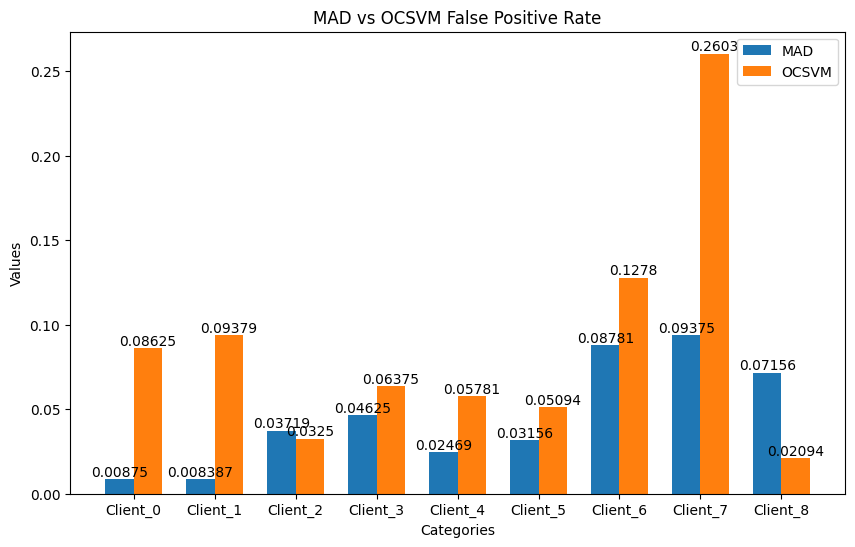

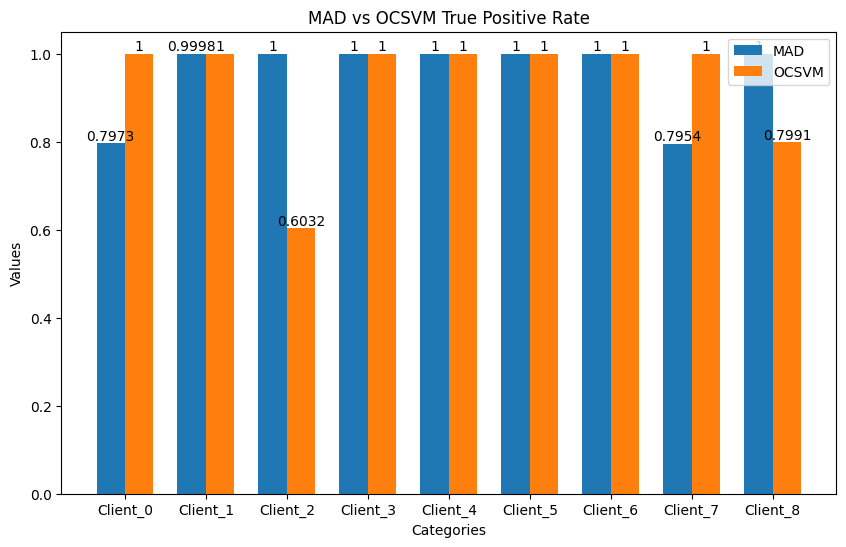

In [ ]:
run_test_customized(client_thresholds,0.02)

In [ ]:
trainloader, valloader, benign_testloader,attack_testloader = load_datasets(final_df,'Autoencoder',partition_id=5,label_col_num = 3)
net = Autoencoder_4_layers(layer_sizes)
for epoch in range(50):
    train(net, trainloader, 1)
    loss,loss_history, raw_valid_loss = validation(net, valloader)
    ## find threshold based on median absolute deviation
    RE_MED = np.median(loss_history)
    RE_MAD = np.median(np.abs(loss_history - RE_MED))
    std = np.std(loss_history)
fpr_list = []
tpr_list = []
for K in range(1,10):
  threshold = RE_MED + K*RE_MAD
  benign_MSE, benign_MSE_history,false_positive,raw_benign_loss = test(net, benign_testloader,threshold = threshold)
  attack_MSE, attack_MSE_history,true_positive, raw_attack_loss = test(net, attack_testloader,threshold = threshold)
  fpr_list.append(false_positive)
  tpr_list.append(true_positive)
  roc_auc = plot_roc(benign_MSE_history,attack_MSE_history,plot = False)
  print(f'roc_auc:{roc_auc}')
plot_barchart(fpr_list,tpr_list,'fpr_tpr',['FPR','TPR'],labels = [f'K_{i}' for i in range(1,10)])


CLIENT:0
Epoch [1/1], Train Loss: 0.1342
Epoch 1: validation loss 0.062009734755907306
threshold:0.09945221804082394
Epoch [1/1], Train Loss: 0.0451
Epoch 2: validation loss 0.023425589683346258
threshold:0.040229156613349915
Epoch [1/1], Train Loss: 0.0287
Epoch 3: validation loss 0.018411654878694277
threshold:0.03226735978387296
Epoch [1/1], Train Loss: 0.0243
Epoch 4: validation loss 0.01647495910143241
threshold:0.026705659925937653
Epoch [1/1], Train Loss: 0.0225
Epoch 5: validation loss 0.015727562146882215
threshold:0.022317426977679133
exceed threshold proportion:0.2296875
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.1425
TPR derived with OCSVM:1.0
False Positive Rate:0.2296875
True Positive Rate:1.0
benign_error:0.02131145681254566
attack_error:46.221131853461266
roc_auc:0.9977
CLIENT:1
Epoch [1/1], Train Loss: 0.1497
Epoch 1: validation loss 0.07755885816058658
threshold:0.12449060939252377
Epoch [1/1], Train Loss: 0.0691
Epo

([0.022317426977679133,
  0.055416095070540905,
  0.08610129822045565,
  0.020158465951681137,
  0.05795775447040796,
  0.10858109220862389,
  0.0900210477411747,
  0.04838911164551973,
  0.03506055660545826],
 [0.2296875,
  0.14487228364468166,
  0.1225,
  0.2540625,
  0.2196875,
  0.071875,
  0.0890625,
  0.2490625,
  0.0759375],
 [1.0, 1.0, 1.0, 1.0, 1.0, 0.999625, 0.99975, 1.0, 1.0],
 0.9982128906250001)

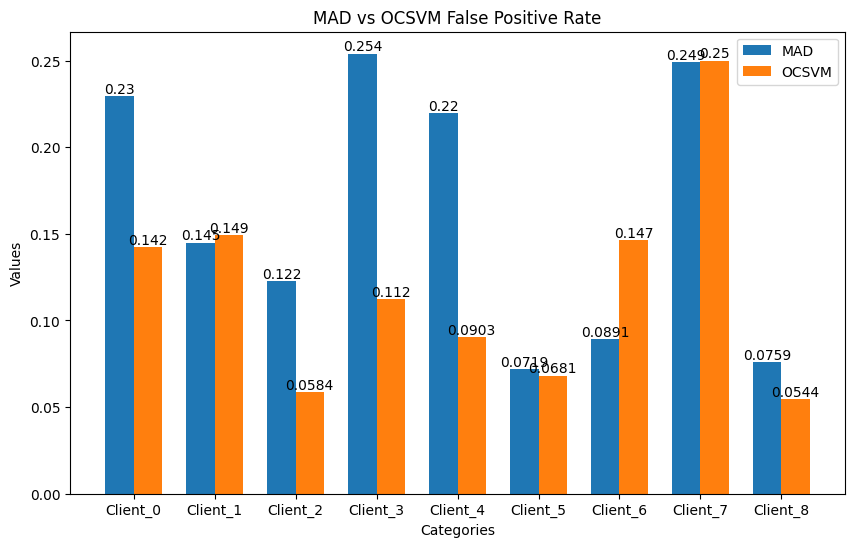

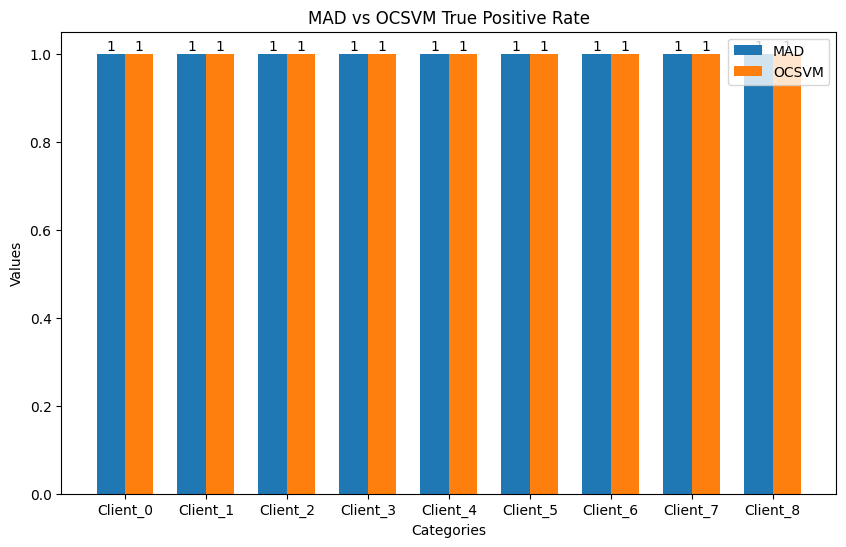

In [ ]:
run_test_OCSVM(3) =

CLIENT:0
Epoch [1/1], Train Loss: 0.1231
Epoch 1: validation loss 0.05515780779413688
threshold:0.10196377895772457
Epoch [1/1], Train Loss: 0.0399
Epoch 2: validation loss 0.0230771370136585
threshold:0.0491931876167655
Epoch [1/1], Train Loss: 0.0309
Epoch 3: validation loss 0.019713421896673165
threshold:0.041629496961832047
Epoch [1/1], Train Loss: 0.0256
Epoch 4: validation loss 0.017153280180616258
threshold:0.031938881147652864
Epoch [1/1], Train Loss: 0.0235
Epoch 5: validation loss 0.016179640189959453
threshold:0.030623503495007753
exceed threshold proportion:0.1365625
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.145
TPR derived with OCSVM:1.0
False Positive Rate:0.1365625
True Positive Rate:1.0
benign_error:0.02183659984730184
attack_error:46.21468032634258
roc_auc:0.9978
CLIENT:1
Epoch [1/1], Train Loss: 0.1430
Epoch 1: validation loss 0.07551225983728223
threshold:0.13498620316386223
Epoch [1/1], Train Loss: 0.0634
Epoch 2:

([0.030623503495007753,
  0.0642749760299921,
  0.0963868759572506,
  0.023733414243906736,
  0.06290082354098558,
  0.13194916769862175,
  0.0958327166736126,
  0.056925143115222454,
  0.02964771445840597],
 [0.1365625,
  0.105604269919939,
  0.1090625,
  0.188125,
  0.2090625,
  0.0203125,
  0.0859375,
  0.2475,
  0.08],
 [1.0, 1.0, 1.0, 1.0, 1.0, 0.99925, 0.99975, 1.0, 1.0],
 0.9978011718750001)

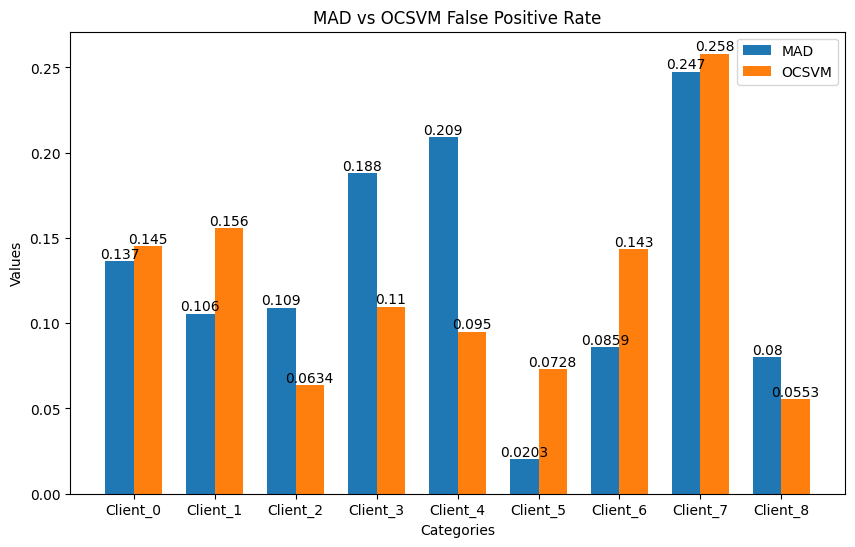

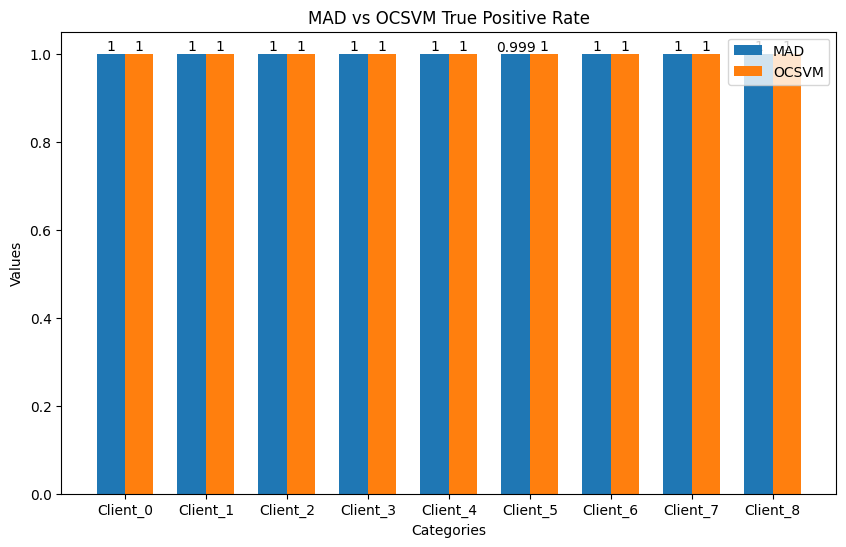

In [ ]:
run_test_OCSVM(4)

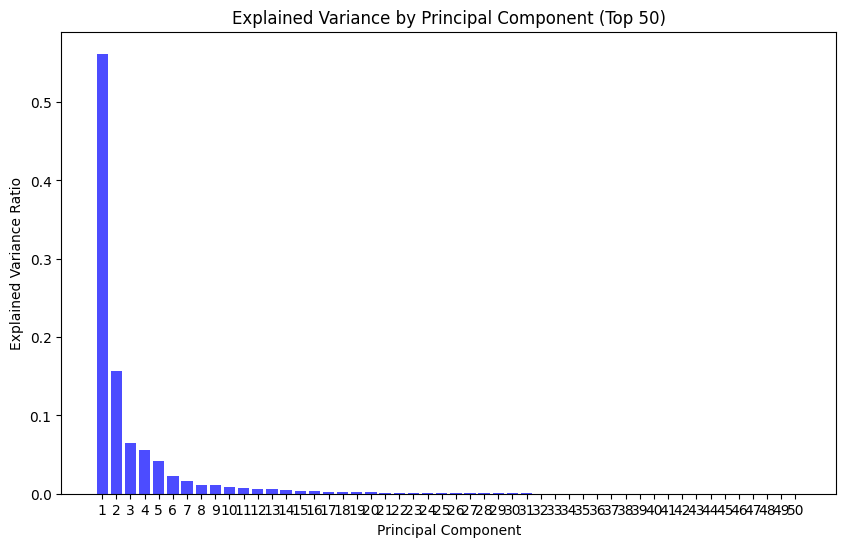

CLIENT:0
Epoch [1/1], Train Loss: 0.1209
Epoch 1: validation loss 0.050078068998379584
threshold:0.05051643215119839
Epoch [1/1], Train Loss: 0.0382
Epoch 2: validation loss 0.021926518223988705
threshold:0.016561313532292843
Epoch [1/1], Train Loss: 0.0275
Epoch 3: validation loss 0.018347023288982037
threshold:0.013215943239629269
Epoch [1/1], Train Loss: 0.0246
Epoch 4: validation loss 0.016717519233815183
threshold:0.011591167189180851
Epoch [1/1], Train Loss: 0.0229
Epoch 5: validation loss 0.015831707704525726
threshold:0.011232742108404636
exceed threshold proportion:0.5196875
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.105625
TPR derived with OCSVM:1.0
False Positive Rate:0.5196875
True Positive Rate:1.0
benign_error:0.02140198708511889
attack_error:46.207061274170876
roc_auc:0.9978


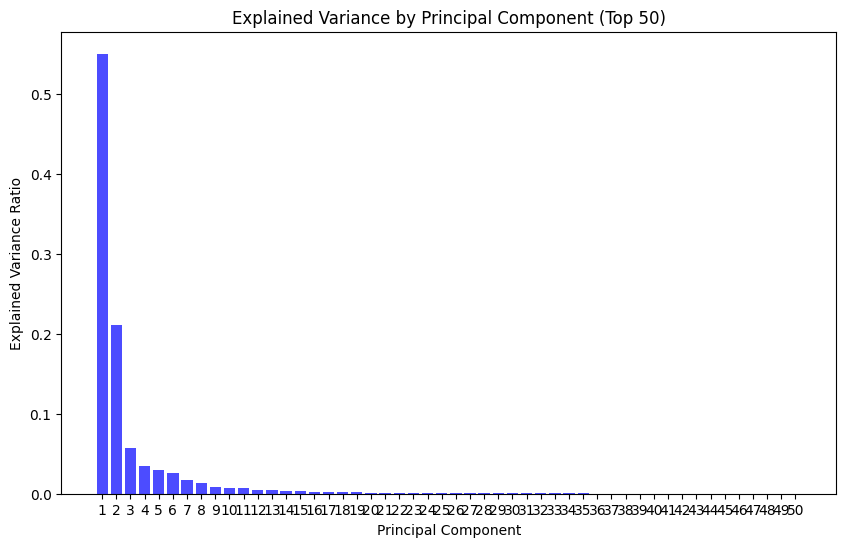

CLIENT:1
Epoch [1/1], Train Loss: 0.1530
Epoch 1: validation loss 0.07519026300522047
threshold:0.06719985604286194
Epoch [1/1], Train Loss: 0.0630
Epoch 2: validation loss 0.052361190668717
threshold:0.04499133303761482
Epoch [1/1], Train Loss: 0.0527
Epoch 3: validation loss 0.04757334158483035
threshold:0.03812716156244278
Epoch [1/1], Train Loss: 0.0484
Epoch 4: validation loss 0.04371495130568405
threshold:0.035345857962965965
Epoch [1/1], Train Loss: 0.0427
Epoch 5: validation loss 0.03730223243666385
threshold:0.029099940322339535
exceed threshold proportion:0.5813953488372093
count_total:2623.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.11208539839878003
TPR derived with OCSVM:1.0
False Positive Rate:0.5813953488372093
True Positive Rate:1.0
benign_error:0.04115499490733552
attack_error:36.4670637550354
roc_auc:0.9991


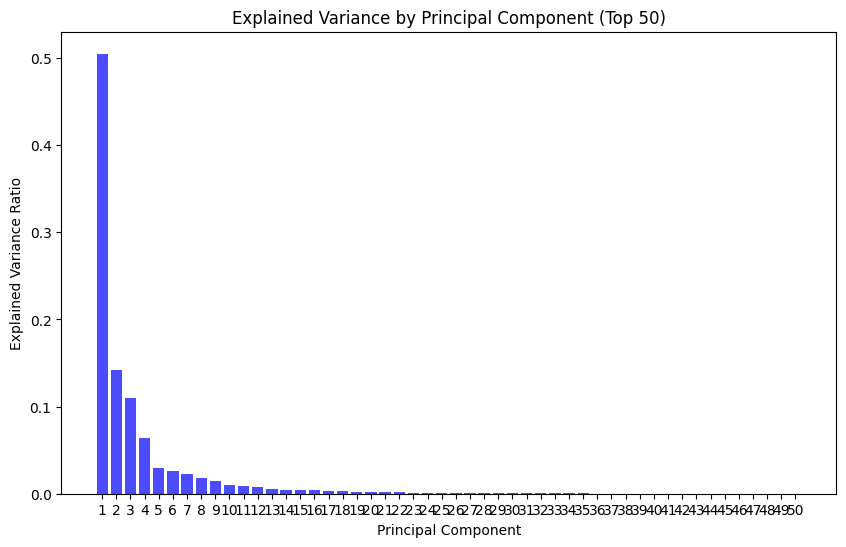

CLIENT:2
Epoch [1/1], Train Loss: 0.1692
Epoch 1: validation loss 288.61415109770036
threshold:0.08042905479669571
Epoch [1/1], Train Loss: 0.0840
Epoch 2: validation loss 288.59700324413103
threshold:0.06881359964609146
Epoch [1/1], Train Loss: 0.0692
Epoch 3: validation loss 288.5859722320277
threshold:0.05683549679815769
Epoch [1/1], Train Loss: 0.0584
Epoch 4: validation loss 288.575679310373
threshold:0.046415070071816444
Epoch [1/1], Train Loss: 0.0512
Epoch 5: validation loss 288.57121810477514
threshold:0.043679600581526756
exceed threshold proportion:0.905625
count_total:3200.0
exceed threshold proportion:1.0
count_total:4000.0
FPR derived with OCSVM:0.0428125
TPR derived with OCSVM:1.0
False Positive Rate:0.905625
True Positive Rate:1.0
benign_error:562.6170704922453
attack_error:39.131678172945975
roc_auc:0.9852


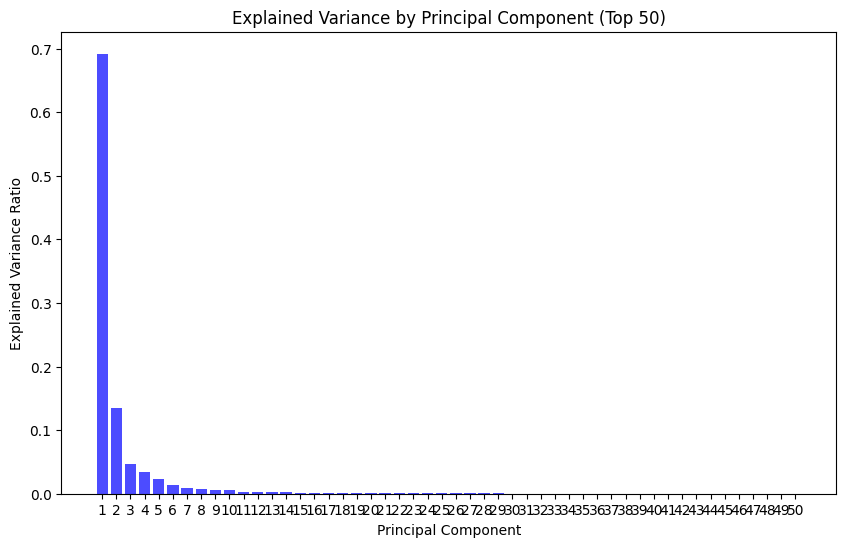

CLIENT:3
Epoch [1/1], Train Loss: 0.1512
Epoch 1: validation loss 0.023372057027732714
threshold:0.01176224835216999
Epoch [1/1], Train Loss: 0.1304
Epoch 2: validation loss 0.022549275523768023
threshold:0.011670109815895557
Epoch [1/1], Train Loss: 0.1034
Epoch 3: validation loss 0.021374983235429496
threshold:0.011722921393811703
Epoch [1/1], Train Loss: 0.0834
Epoch 4: validation loss 0.02016002289377726
threshold:0.011499782558530569
Epoch [1/1], Train Loss: 0.0704
Epoch 5: validation loss 0.019751477317932326
threshold:0.011443437077105045
exceed threshold proportion:0.614375
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.0709375
TPR derived with OCSVM:1.0
False Positive Rate:0.614375
True Positive Rate:1.0
benign_error:0.02252411834895611
attack_error:1.5310331071019172
roc_auc:0.9995


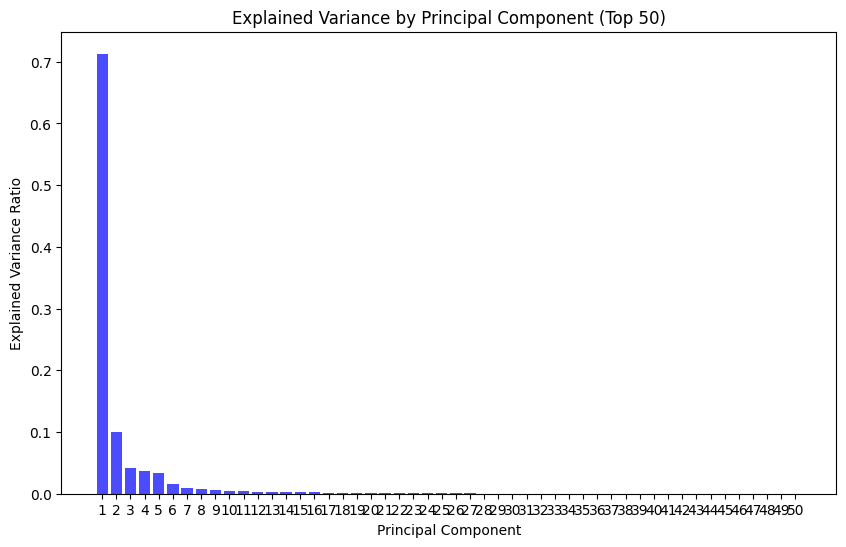

CLIENT:4
Epoch [1/1], Train Loss: 0.1645
Epoch 1: validation loss 0.07794981719209598
threshold:0.030708204954862595
Epoch [1/1], Train Loss: 0.0766
Epoch 2: validation loss 0.058263367003737354
threshold:0.031085355207324028
Epoch [1/1], Train Loss: 0.0663
Epoch 3: validation loss 0.05048750336162555
threshold:0.03070199117064476
Epoch [1/1], Train Loss: 0.0558
Epoch 4: validation loss 0.04209223722991271
threshold:0.02861169259995222
Epoch [1/1], Train Loss: 0.0485
Epoch 5: validation loss 0.03919459950083341
threshold:0.02601197175681591
exceed threshold proportion:0.4915625
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.0803125
TPR derived with OCSVM:1.0
False Positive Rate:0.4915625
True Positive Rate:1.0
benign_error:0.03913014346733689
attack_error:2.3679200382232666
roc_auc:0.9999


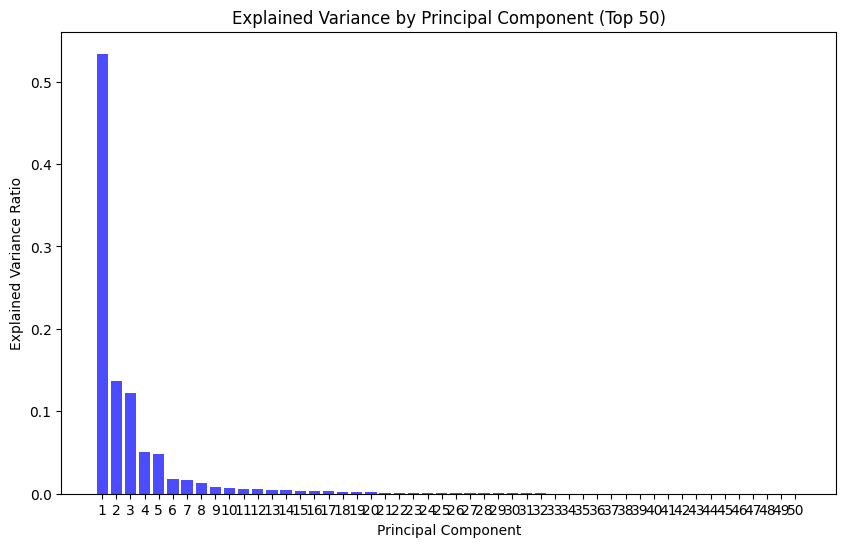

CLIENT:5
Epoch [1/1], Train Loss: 0.1959
Epoch 1: validation loss 0.09765550313660731
threshold:0.07207197695970535
Epoch [1/1], Train Loss: 0.1012
Epoch 2: validation loss 0.07592603399012333
threshold:0.06603612378239632
Epoch [1/1], Train Loss: 0.0787
Epoch 3: validation loss 0.06694047682178327
threshold:0.054929569363594055
Epoch [1/1], Train Loss: 0.0668
Epoch 4: validation loss 0.05446451974984927
threshold:0.04601011797785759
Epoch [1/1], Train Loss: 0.0598
Epoch 5: validation loss 0.04881043841059391
threshold:0.04079611413180828
exceed threshold proportion:0.486875
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.0459375
TPR derived with OCSVM:1.0
False Positive Rate:0.486875
True Positive Rate:1.0
benign_error:0.048326479457318786
attack_error:3.1039573715925215
roc_auc:0.9999


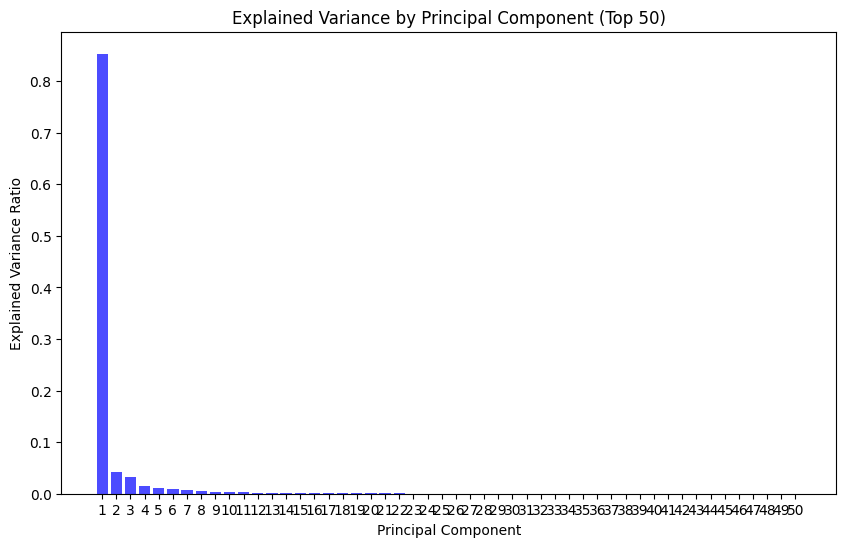

CLIENT:6
Epoch [1/1], Train Loss: 0.1293
Epoch 1: validation loss 0.05666973451391245
threshold:0.045405371114611626
Epoch [1/1], Train Loss: 0.0458
Epoch 2: validation loss 0.047286776911753876
threshold:0.04117698594927788
Epoch [1/1], Train Loss: 0.0326
Epoch 3: validation loss 0.042160912813284455
threshold:0.03668933920562267
Epoch [1/1], Train Loss: 0.0287
Epoch 4: validation loss 0.04026022774095719
threshold:0.036152930930256844
Epoch [1/1], Train Loss: 0.0267
Epoch 5: validation loss 0.03891707363610084
threshold:0.03535466641187668
exceed threshold proportion:0.5578125
count_total:3200.0
exceed threshold proportion:1.0
count_total:4000.0
FPR derived with OCSVM:0.1321875
TPR derived with OCSVM:1.0
False Positive Rate:0.5578125
True Positive Rate:1.0
benign_error:0.06872518146410585
attack_error:6.734025619983673
roc_auc:0.9749


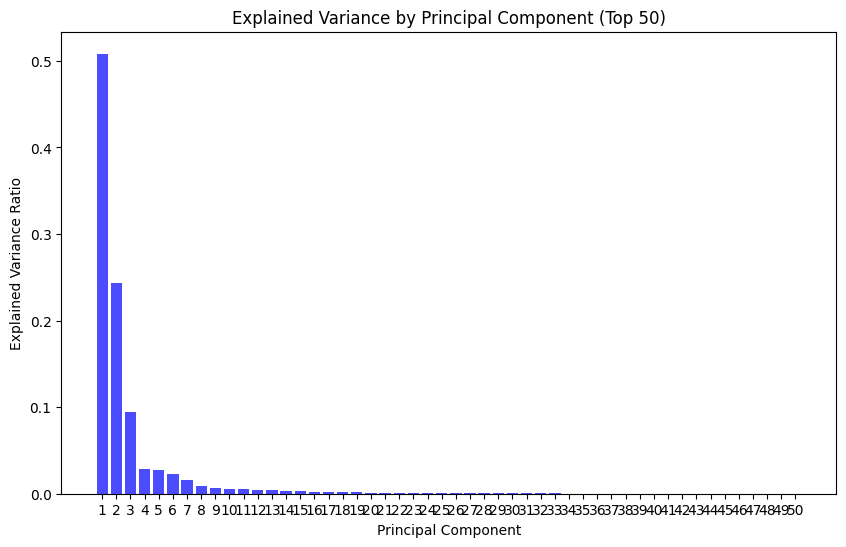

CLIENT:7
Epoch [1/1], Train Loss: 0.1754
Epoch 1: validation loss 0.05340023367450787
threshold:0.03709910251200199
Epoch [1/1], Train Loss: 0.0959
Epoch 2: validation loss 0.047482481789894594
threshold:0.031311238184571266
Epoch [1/1], Train Loss: 0.0870
Epoch 3: validation loss 0.04465234354138374
threshold:0.030467805452644825
Epoch [1/1], Train Loss: 0.0762
Epoch 4: validation loss 0.03912410638653315
threshold:0.029555915854871273
Epoch [1/1], Train Loss: 0.0631
Epoch 5: validation loss 0.0306151498013582
threshold:0.02414701972156763
exceed threshold proportion:0.630625
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.238125
TPR derived with OCSVM:1.0
False Positive Rate:0.630625
True Positive Rate:1.0
benign_error:0.04703684760257602
attack_error:0.9302408660054207
roc_auc:0.9990


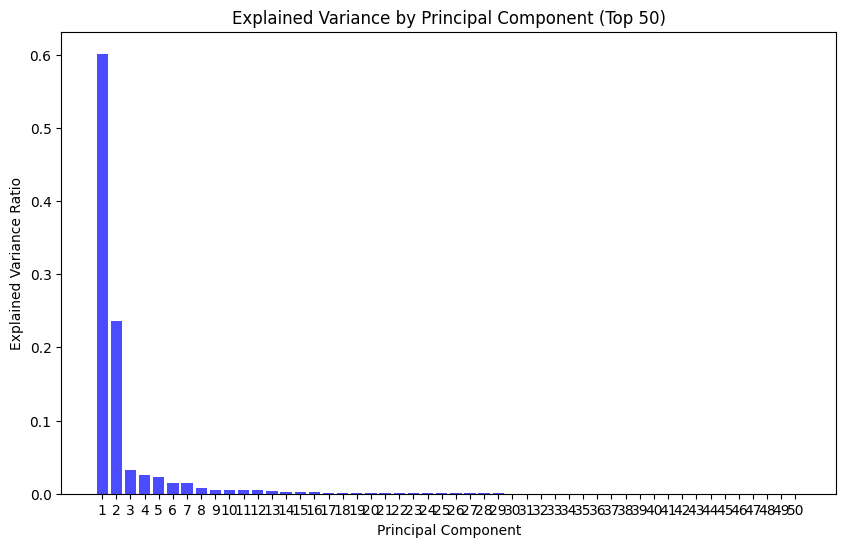

CLIENT:8
Epoch [1/1], Train Loss: 0.1256
Epoch 1: validation loss 0.04173088479691591
threshold:0.018483798950910568
Epoch [1/1], Train Loss: 0.0392
Epoch 2: validation loss 0.038505157527442165
threshold:0.015232575591653585
Epoch [1/1], Train Loss: 0.0375
Epoch 3: validation loss 0.03445433350996329
threshold:0.012253494933247566
Epoch [1/1], Train Loss: 0.0343
Epoch 4: validation loss 0.03297522225154516
threshold:0.011679127346724272
Epoch [1/1], Train Loss: 0.0329
Epoch 5: validation loss 0.032041133677539156
threshold:0.011457406915724277
exceed threshold proportion:0.455
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.03875
TPR derived with OCSVM:0.998125
False Positive Rate:0.455
True Positive Rate:1.0
benign_error:0.02255460583604872
attack_error:7.4432331362366675
roc_auc:0.9979


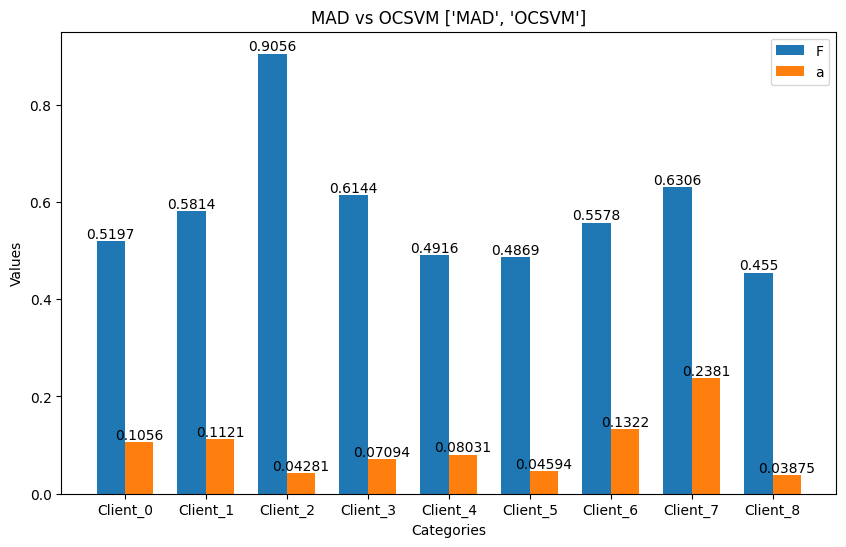

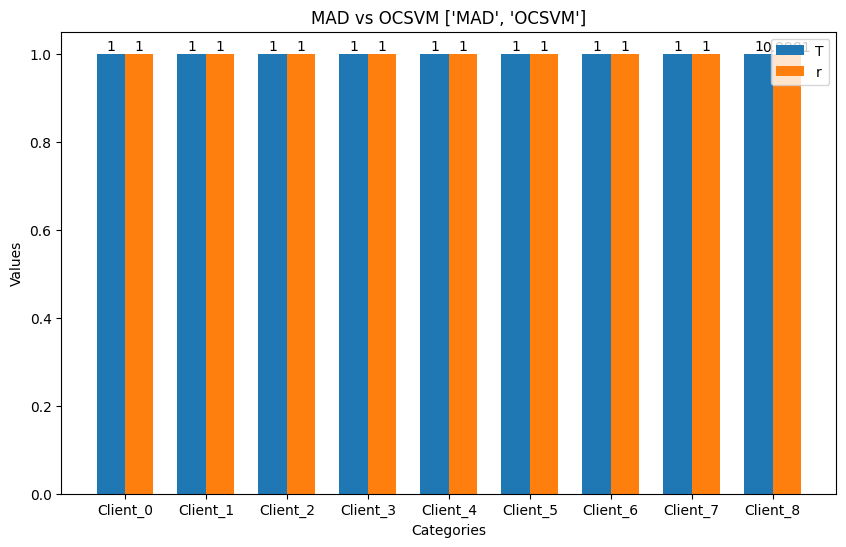

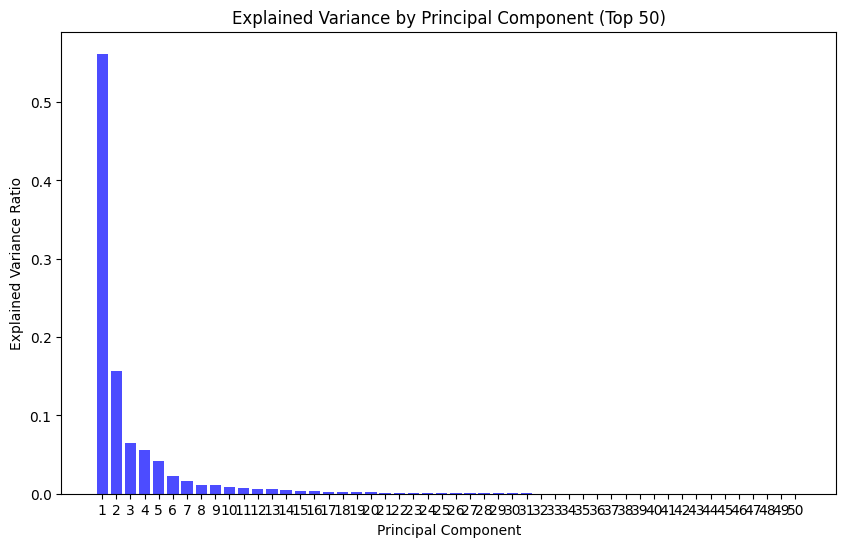

CLIENT:0
Epoch [1/1], Train Loss: 0.1257
Epoch 1: validation loss 0.060331577769456766
threshold:0.06868890672922134
Epoch [1/1], Train Loss: 0.0434
Epoch 2: validation loss 0.022761379125026557
threshold:0.025842920411378145
Epoch [1/1], Train Loss: 0.0277
Epoch 3: validation loss 0.017958143491966602
threshold:0.018886052537709475
Epoch [1/1], Train Loss: 0.0241
Epoch 4: validation loss 0.016410804692751323
threshold:0.017902621300891042
Epoch [1/1], Train Loss: 0.0223
Epoch 5: validation loss 0.015554695132260139
threshold:0.016921078087761998
exceed threshold proportion:0.349375
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.1028125
TPR derived with OCSVM:1.0
False Positive Rate:0.349375
True Positive Rate:1.0
benign_error:0.021075103776529432
attack_error:46.236981334328654
roc_auc:0.9982


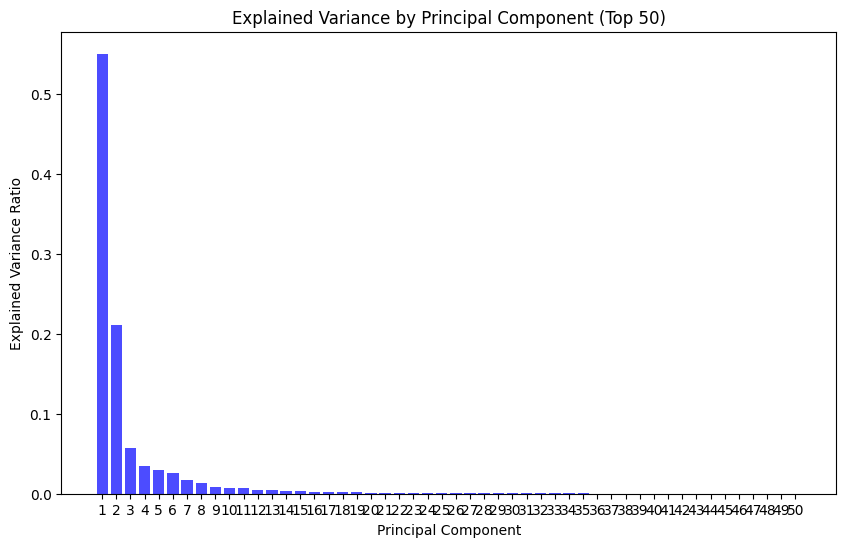

CLIENT:1
Epoch [1/1], Train Loss: 0.1492
Epoch 1: validation loss 0.07715939981283786
threshold:0.08725723251700401
Epoch [1/1], Train Loss: 0.0670
Epoch 2: validation loss 0.05409778591054559
threshold:0.06889156717807055
Epoch [1/1], Train Loss: 0.0540
Epoch 3: validation loss 0.04666788024644997
threshold:0.05467319209128618
Epoch [1/1], Train Loss: 0.0471
Epoch 4: validation loss 0.041108951188178096
threshold:0.044213298708200455
Epoch [1/1], Train Loss: 0.0422
Epoch 5: validation loss 0.03669938196835688
threshold:0.038461591117084026
exceed threshold proportion:0.3942051086542127
count_total:2623.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.12390392680137248
TPR derived with OCSVM:1.0
False Positive Rate:0.3942051086542127
True Positive Rate:1.0
benign_error:0.04080178389511079
attack_error:36.39168330776691
roc_auc:0.9990


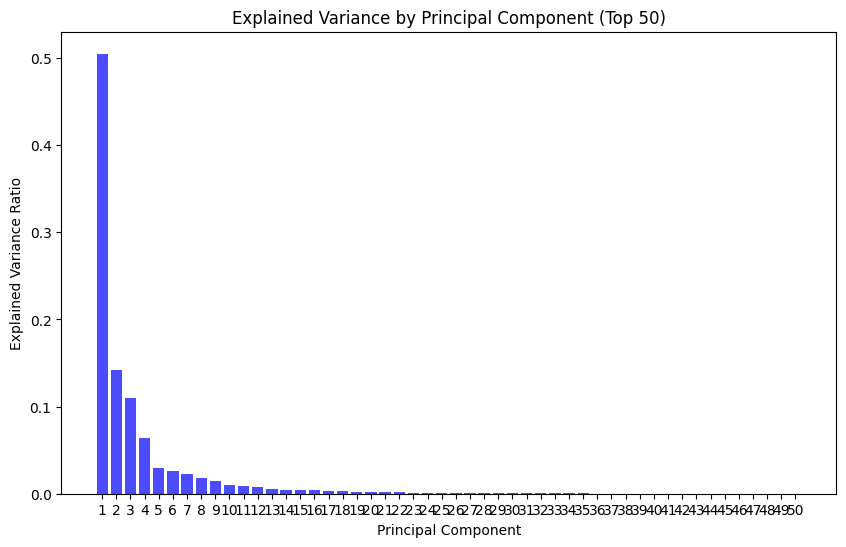

CLIENT:2
Epoch [1/1], Train Loss: 0.1736
Epoch 1: validation loss 288.6162071408561
threshold:0.10462600365281105
Epoch [1/1], Train Loss: 0.0851
Epoch 2: validation loss 288.596705436057
threshold:0.08865602687001228
Epoch [1/1], Train Loss: 0.0685
Epoch 3: validation loss 288.58520943063957
threshold:0.07259521447122097
Epoch [1/1], Train Loss: 0.0578
Epoch 4: validation loss 288.5750758397369
threshold:0.06127361208200455
Epoch [1/1], Train Loss: 0.0501
Epoch 5: validation loss 288.5702692699547
threshold:0.0568237854167819
exceed threshold proportion:0.41875
count_total:3200.0
exceed threshold proportion:1.0
count_total:4000.0
FPR derived with OCSVM:0.041875
TPR derived with OCSVM:1.0
False Positive Rate:0.41875
True Positive Rate:1.0
benign_error:562.615514571108
attack_error:39.1203686593771
roc_auc:0.9855


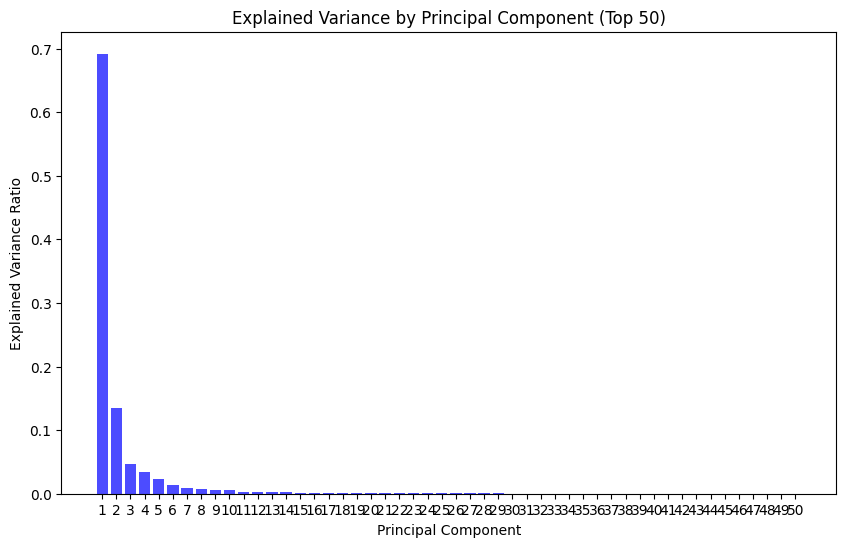

CLIENT:3
Epoch [1/1], Train Loss: 0.1479
Epoch 1: validation loss 0.024145175573917536
threshold:0.01539640687406063
Epoch [1/1], Train Loss: 0.1328
Epoch 2: validation loss 0.022573343215462487
threshold:0.015076173469424248
Epoch [1/1], Train Loss: 0.1038
Epoch 3: validation loss 0.021575640758069663
threshold:0.015137476846575737
Epoch [1/1], Train Loss: 0.0879
Epoch 4: validation loss 0.020656417658886848
threshold:0.014987664297223091
Epoch [1/1], Train Loss: 0.0726
Epoch 5: validation loss 0.02057977612488545
threshold:0.014770440757274628
exceed threshold proportion:0.4403125
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.068125
TPR derived with OCSVM:1.0
False Positive Rate:0.4403125
True Positive Rate:1.0
benign_error:0.0233997861482203
attack_error:1.5371402097940445
roc_auc:0.9995


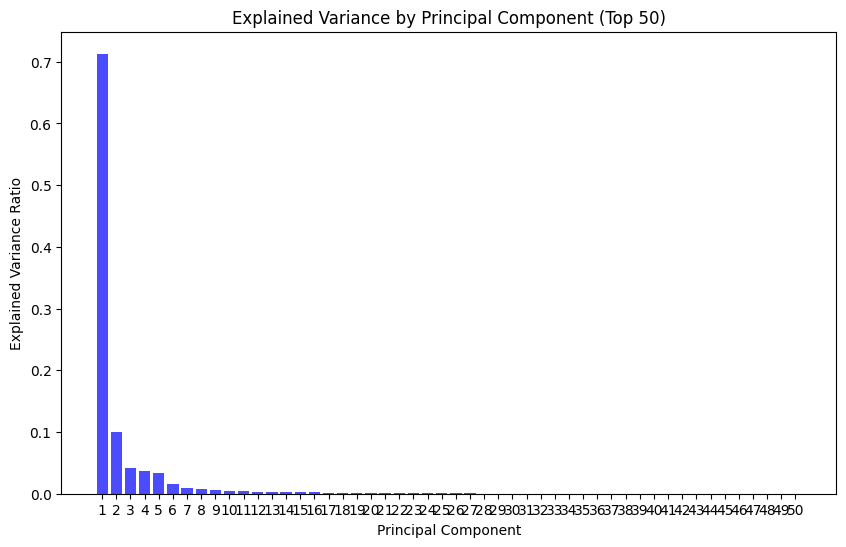

CLIENT:4
Epoch [1/1], Train Loss: 0.1693
Epoch 1: validation loss 0.08312616072213039
threshold:0.04345478396862745
Epoch [1/1], Train Loss: 0.0885
Epoch 2: validation loss 0.07145270663194167
threshold:0.04408279526978731
Epoch [1/1], Train Loss: 0.0740
Epoch 3: validation loss 0.05749753067890803
threshold:0.046076991595327854
Epoch [1/1], Train Loss: 0.0632
Epoch 4: validation loss 0.04913894408979477
threshold:0.04495376627892256
Epoch [1/1], Train Loss: 0.0551
Epoch 5: validation loss 0.043682400844036004
threshold:0.0408973703160882
exceed threshold proportion:0.3375
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.07125
TPR derived with OCSVM:1.0
False Positive Rate:0.3375
True Positive Rate:1.0
benign_error:0.04286998201161623
attack_error:2.417136451244354
roc_auc:0.9999


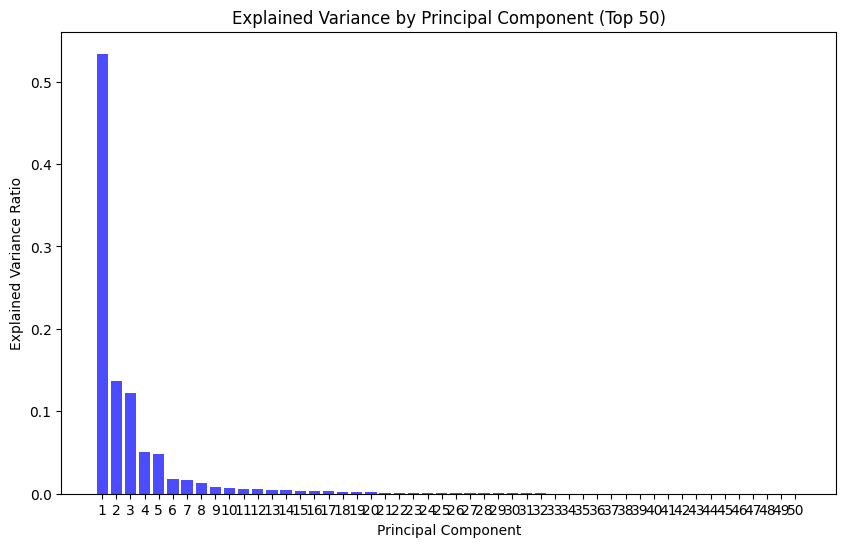

CLIENT:5
Epoch [1/1], Train Loss: 0.1990
Epoch 1: validation loss 0.1077174451488715
threshold:0.11827403400093317
Epoch [1/1], Train Loss: 0.1105
Epoch 2: validation loss 0.08719976917864421
threshold:0.11494847759604454
Epoch [1/1], Train Loss: 0.0931
Epoch 3: validation loss 0.07047964303921431
threshold:0.09598208498209715
Epoch [1/1], Train Loss: 0.0757
Epoch 4: validation loss 0.06088073249810781
threshold:0.07950627896934748
Epoch [1/1], Train Loss: 0.0657
Epoch 5: validation loss 0.05429144981197822
threshold:0.07146657723933458
exceed threshold proportion:0.2925
count_total:3200.0
exceed threshold proportion:0.999875
count_total:8000.0
FPR derived with OCSVM:0.0421875
TPR derived with OCSVM:1.0
False Positive Rate:0.2925
True Positive Rate:0.999875
benign_error:0.0539686262793839
attack_error:3.100015705227852
roc_auc:0.9999


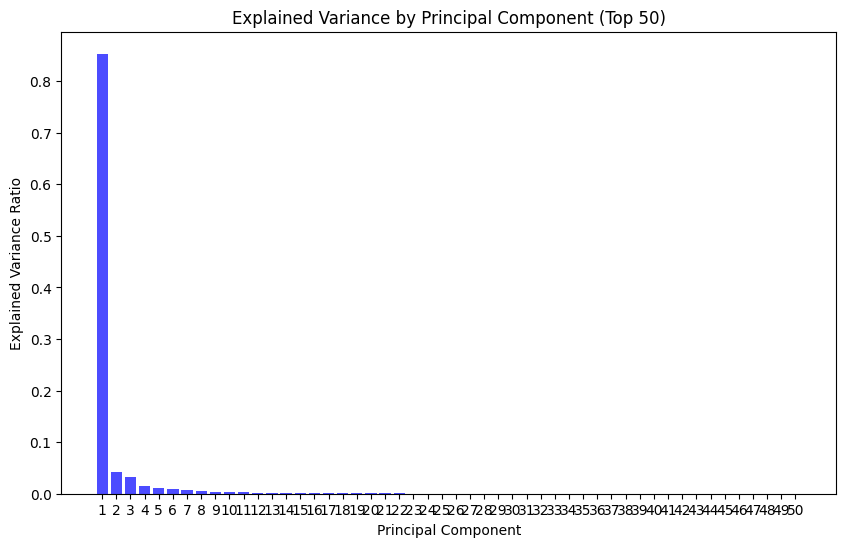

CLIENT:6
Epoch [1/1], Train Loss: 0.1323
Epoch 1: validation loss 0.05981773623289206
threshold:0.06518243812024593
Epoch [1/1], Train Loss: 0.0500
Epoch 2: validation loss 0.05265631018540798
threshold:0.0624972190707922
Epoch [1/1], Train Loss: 0.0411
Epoch 3: validation loss 0.04499233138675873
threshold:0.05793452262878418
Epoch [1/1], Train Loss: 0.0303
Epoch 4: validation loss 0.04078401243075346
threshold:0.05156997125595808
Epoch [1/1], Train Loss: 0.0267
Epoch 5: validation loss 0.03908823743844644
threshold:0.05154754314571619
exceed threshold proportion:0.1734375
count_total:3200.0
exceed threshold proportion:1.0
count_total:4000.0
FPR derived with OCSVM:0.130625
TPR derived with OCSVM:1.0
False Positive Rate:0.1734375
True Positive Rate:1.0
benign_error:0.06816312652081251
attack_error:6.717356158256531
roc_auc:0.9748


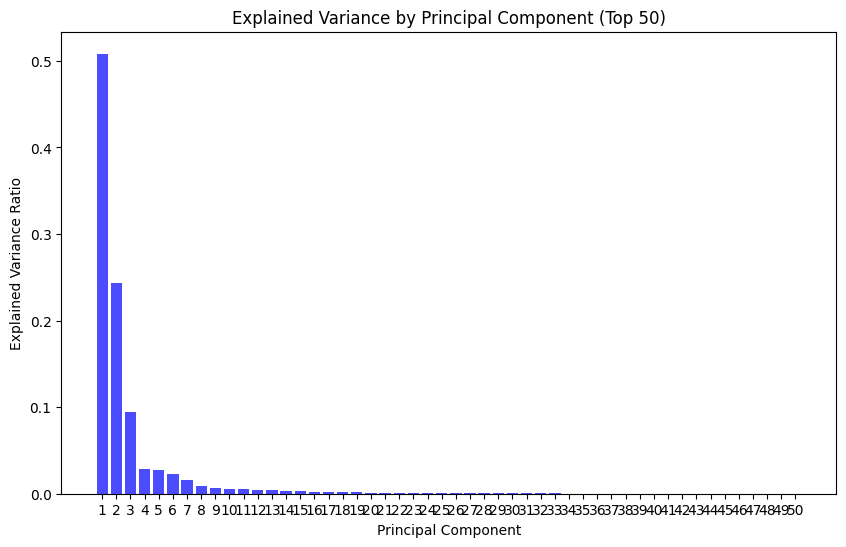

CLIENT:7
Epoch [1/1], Train Loss: 0.1794
Epoch 1: validation loss 0.05281891741622717
threshold:0.049420950934290886
Epoch [1/1], Train Loss: 0.0945
Epoch 2: validation loss 0.047140466335874334
threshold:0.040811216458678246
Epoch [1/1], Train Loss: 0.0857
Epoch 3: validation loss 0.04362913564038582
threshold:0.03983195312321186
Epoch [1/1], Train Loss: 0.0719
Epoch 4: validation loss 0.03625526964091338
threshold:0.03756157774478197
Epoch [1/1], Train Loss: 0.0594
Epoch 5: validation loss 0.02706882737768002
threshold:0.023357348050922155
exceed threshold proportion:0.4996875
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.2278125
TPR derived with OCSVM:1.0
False Positive Rate:0.4996875
True Positive Rate:1.0
benign_error:0.04507288826629519
attack_error:0.921651976943016
roc_auc:0.9980


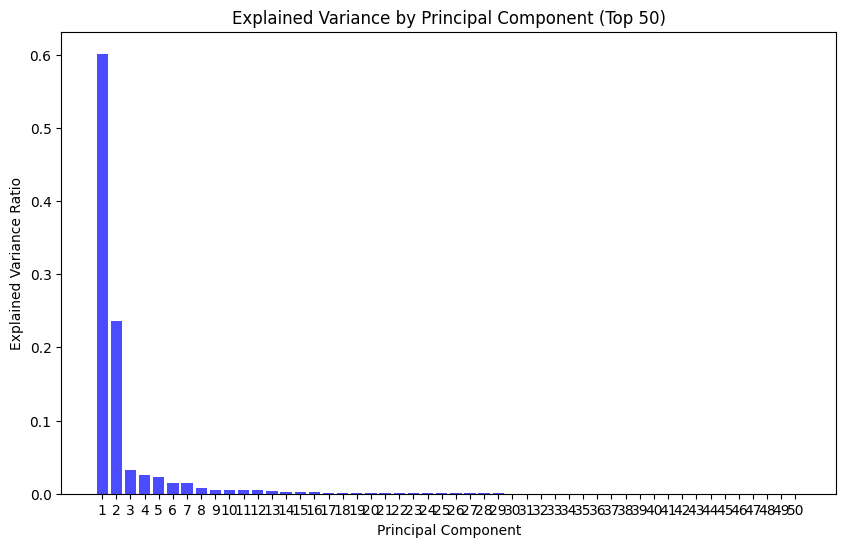

CLIENT:8
Epoch [1/1], Train Loss: 0.1172
Epoch 1: validation loss 0.04130262781221133
threshold:0.02228065114468336
Epoch [1/1], Train Loss: 0.0392
Epoch 2: validation loss 0.03848026170849036
threshold:0.01532377302646637
Epoch [1/1], Train Loss: 0.0380
Epoch 3: validation loss 0.03572522177814673
threshold:0.014092824887484312
Epoch [1/1], Train Loss: 0.0361
Epoch 4: validation loss 0.03319878296878857
threshold:0.013084746431559324
Epoch [1/1], Train Loss: 0.0335
Epoch 5: validation loss 0.03510679474148231
threshold:0.017421424854546785
exceed threshold proportion:0.188125
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.0421875
TPR derived with OCSVM:0.998125
False Positive Rate:0.188125
True Positive Rate:1.0
benign_error:0.02580471195280552
attack_error:7.4152037441134455
roc_auc:0.9972


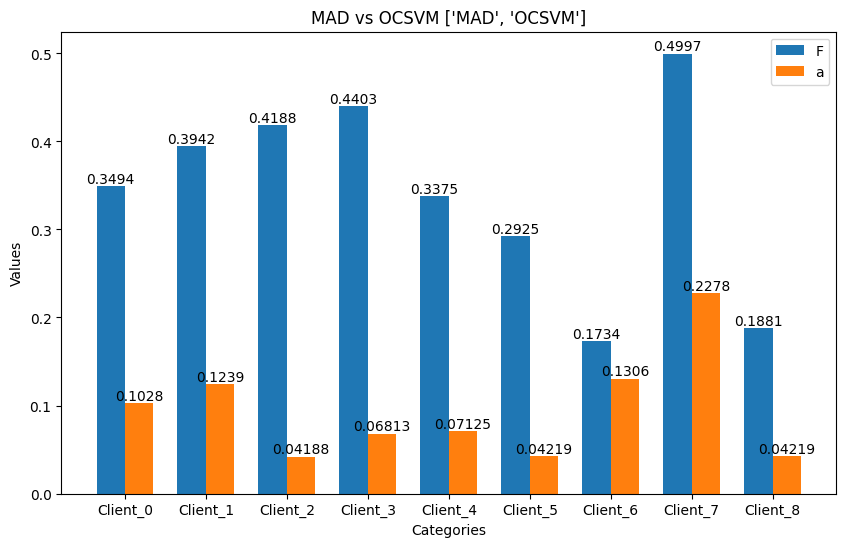

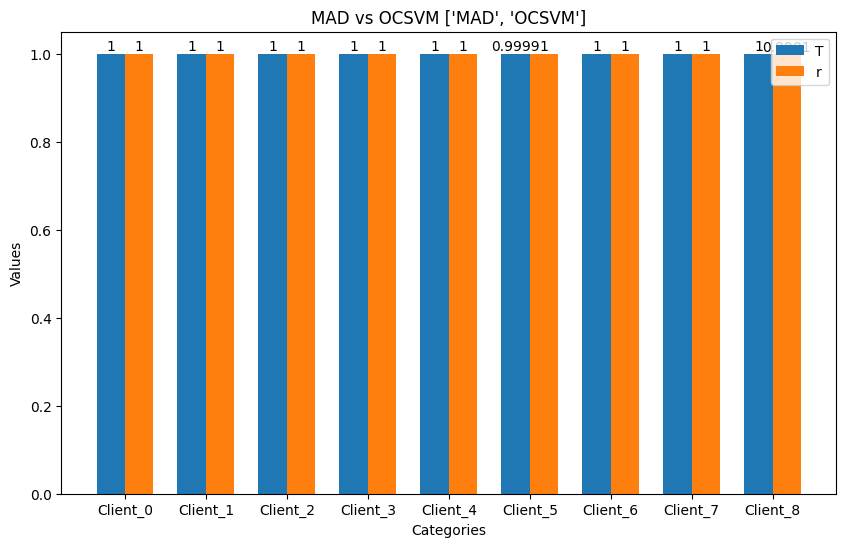

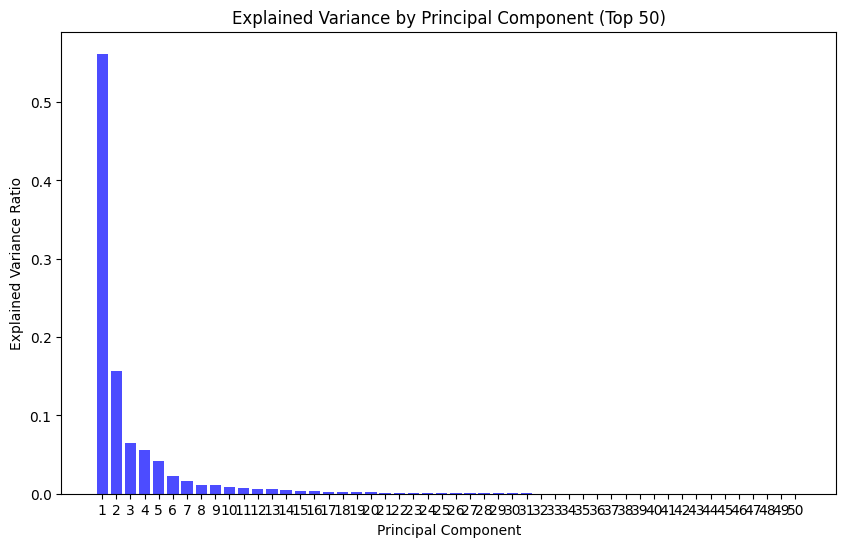

CLIENT:0
Epoch [1/1], Train Loss: 0.1260
Epoch 1: validation loss 0.06076810816541696
threshold:0.08428091742098331
Epoch [1/1], Train Loss: 0.0432
Epoch 2: validation loss 0.02250213412902294
threshold:0.03532195184379816
Epoch [1/1], Train Loss: 0.0273
Epoch 3: validation loss 0.017943312748311423
threshold:0.024125814903527498
Epoch [1/1], Train Loss: 0.0242
Epoch 4: validation loss 0.016444529325534137
threshold:0.021049223840236664
Epoch [1/1], Train Loss: 0.0225
Epoch 5: validation loss 0.01572505970222828
threshold:0.01852952502667904
exceed threshold proportion:0.3053125
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.109375
TPR derived with OCSVM:1.0
False Positive Rate:0.3053125
True Positive Rate:1.0
benign_error:0.021179216569289564
attack_error:46.220511851608755
roc_auc:0.9978


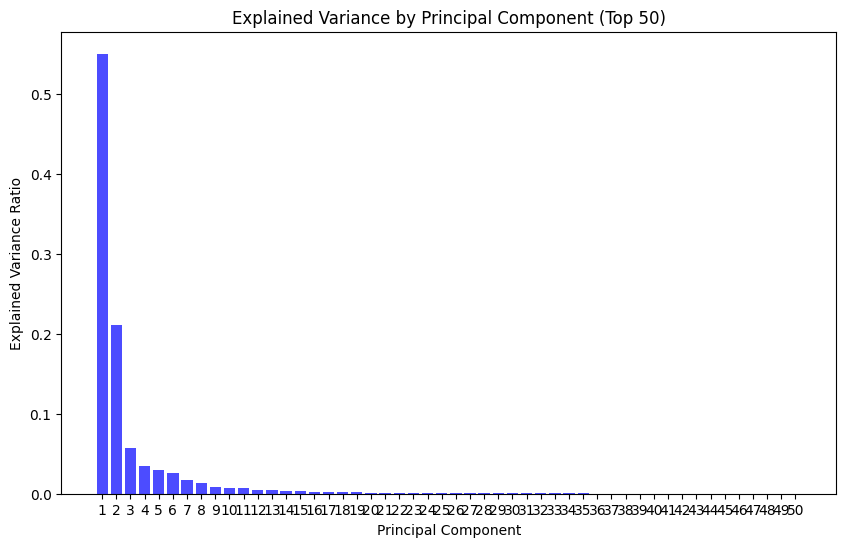

CLIENT:1
Epoch [1/1], Train Loss: 0.1504
Epoch 1: validation loss 0.07471430737570389
threshold:0.10260207578539848
Epoch [1/1], Train Loss: 0.0651
Epoch 2: validation loss 0.05352592890179619
threshold:0.0857345387339592
Epoch [1/1], Train Loss: 0.0535
Epoch 3: validation loss 0.046607959955802504
threshold:0.06951909698545933
Epoch [1/1], Train Loss: 0.0465
Epoch 4: validation loss 0.04043031795956355
threshold:0.05507654882967472
Epoch [1/1], Train Loss: 0.0412
Epoch 5: validation loss 0.037011617974559916
threshold:0.04939752444624901
exceed threshold proportion:0.28821959588257723
count_total:2623.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.12276019824628288
TPR derived with OCSVM:1.0
False Positive Rate:0.28821959588257723
True Positive Rate:1.0
benign_error:0.04121970196421074
attack_error:36.4044512193203
roc_auc:0.9991


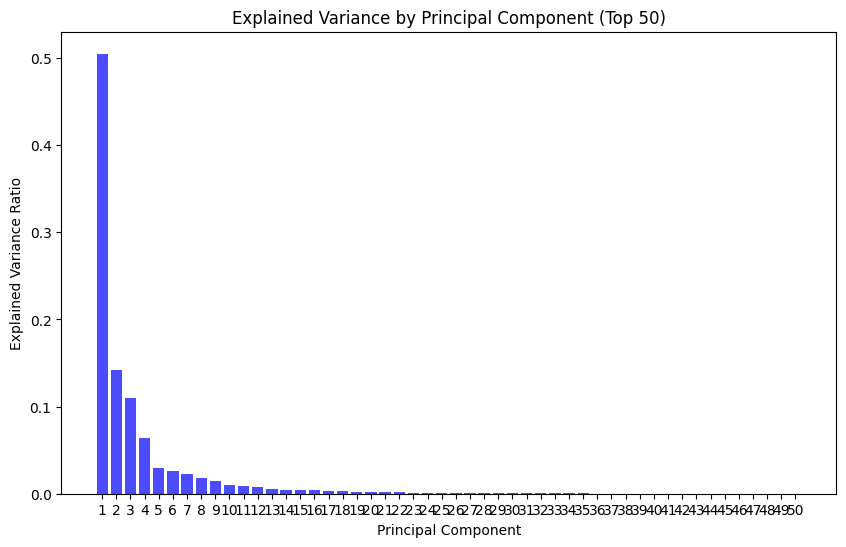

CLIENT:2
Epoch [1/1], Train Loss: 0.1731
Epoch 1: validation loss 288.6156451953336
threshold:0.12995119020342827
Epoch [1/1], Train Loss: 0.0859
Epoch 2: validation loss 288.5978327047175
threshold:0.11444360390305519
Epoch [1/1], Train Loss: 0.0687
Epoch 3: validation loss 288.5817879417959
threshold:0.084934052079916
Epoch [1/1], Train Loss: 0.0548
Epoch 4: validation loss 288.5732450088725
threshold:0.07391317002475262
Epoch [1/1], Train Loss: 0.0481
Epoch 5: validation loss 288.56911395877984
threshold:0.07126224227249622
exceed threshold proportion:0.2203125
count_total:3200.0
exceed threshold proportion:1.0
count_total:4000.0
FPR derived with OCSVM:0.0421875
TPR derived with OCSVM:1.0
False Positive Rate:0.2203125
True Positive Rate:1.0
benign_error:562.6141081042961
attack_error:39.13584580981731
roc_auc:0.9855


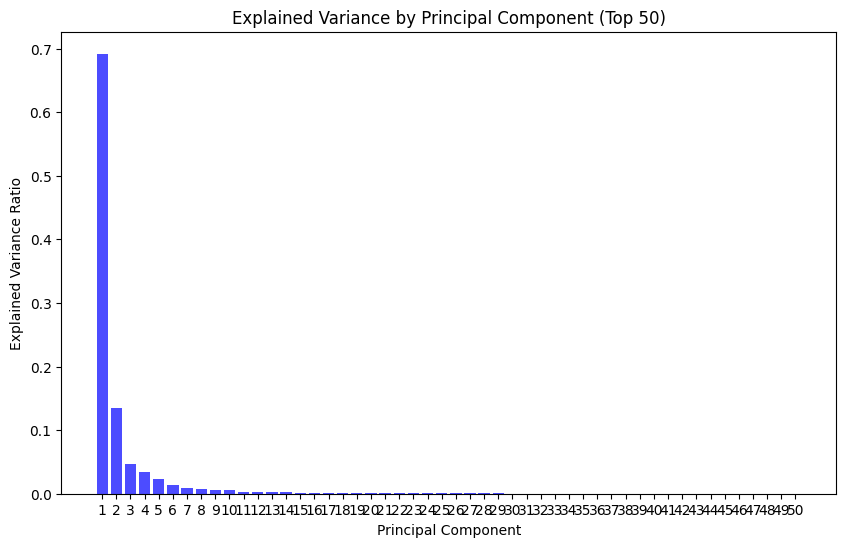

CLIENT:3
Epoch [1/1], Train Loss: 0.1525
Epoch 1: validation loss 0.024349336101649664
threshold:0.018842189572751522
Epoch [1/1], Train Loss: 0.1300
Epoch 2: validation loss 0.022756686128484898
threshold:0.018242542631924152
Epoch [1/1], Train Loss: 0.1041
Epoch 3: validation loss 0.02097983687925033
threshold:0.01823287969455123
Epoch [1/1], Train Loss: 0.0895
Epoch 4: validation loss 0.02017980365990064
threshold:0.017718516290187836
Epoch [1/1], Train Loss: 0.0716
Epoch 5: validation loss 0.01997703884083491
threshold:0.017326340544968843
exceed threshold proportion:0.321875
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.0709375
TPR derived with OCSVM:1.0
False Positive Rate:0.321875
True Positive Rate:1.0
benign_error:0.02256072737276554
attack_error:1.5282603126764298
roc_auc:0.9995


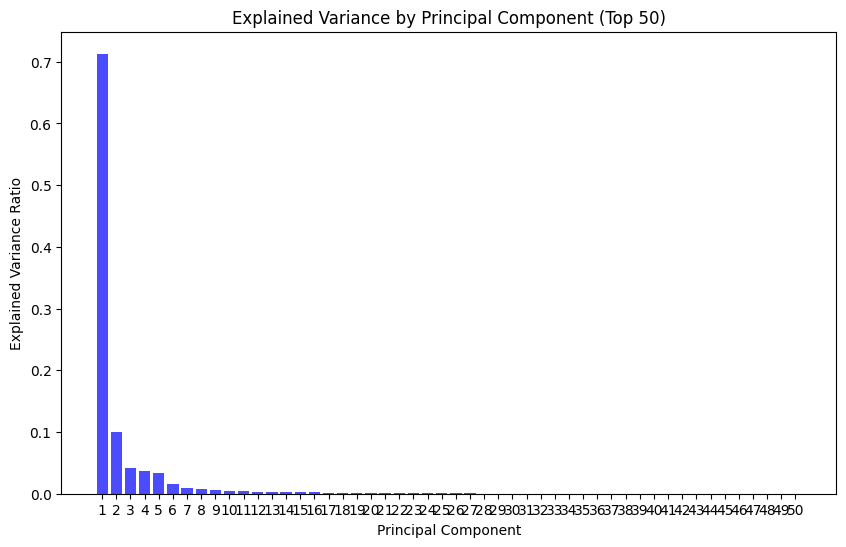

CLIENT:4
Epoch [1/1], Train Loss: 0.1710
Epoch 1: validation loss 0.08170490861894228
threshold:0.056425693444907665
Epoch [1/1], Train Loss: 0.0816
Epoch 2: validation loss 0.06234079378728683
threshold:0.05719269625842571
Epoch [1/1], Train Loss: 0.0685
Epoch 3: validation loss 0.054328901139207374
threshold:0.059815773740410805
Epoch [1/1], Train Loss: 0.0593
Epoch 4: validation loss 0.048712758146799526
threshold:0.05270734895020723
Epoch [1/1], Train Loss: 0.0519
Epoch 5: validation loss 0.0397700288070318
threshold:0.04910246655344963
exceed threshold proportion:0.25125
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.0721875
TPR derived with OCSVM:1.0
False Positive Rate:0.25125
True Positive Rate:1.0
benign_error:0.039215226080268624
attack_error:2.3781732529997828
roc_auc:0.9999


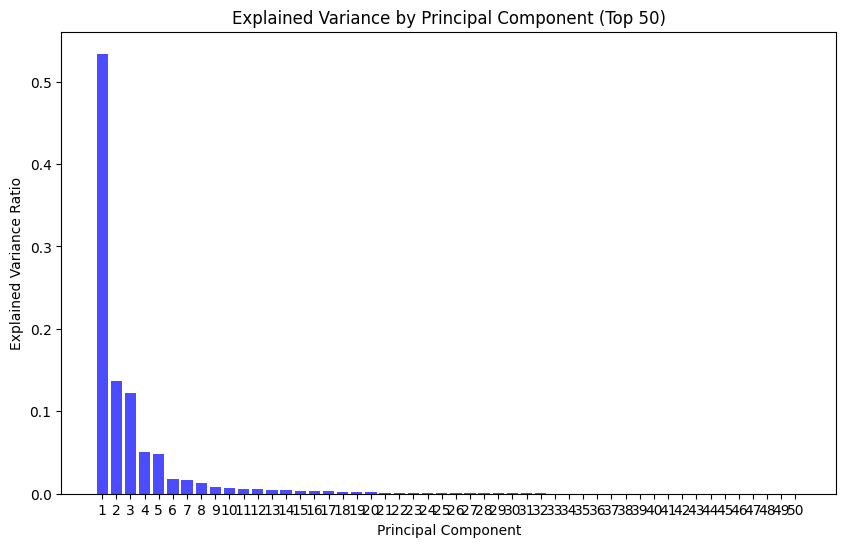

CLIENT:5
Epoch [1/1], Train Loss: 0.2036
Epoch 1: validation loss 0.10355668361179339
threshold:0.15415950678288937
Epoch [1/1], Train Loss: 0.1056
Epoch 2: validation loss 0.08107505152240778
threshold:0.1582433618605137
Epoch [1/1], Train Loss: 0.0848
Epoch 3: validation loss 0.06416456313469471
threshold:0.12119042873382568
Epoch [1/1], Train Loss: 0.0690
Epoch 4: validation loss 0.055739761487795754
threshold:0.10886724106967449
Epoch [1/1], Train Loss: 0.0609
Epoch 5: validation loss 0.05149589802783269
threshold:0.08107740432024002
exceed threshold proportion:0.1621875
count_total:3200.0
exceed threshold proportion:0.999875
count_total:8000.0
FPR derived with OCSVM:0.045625
TPR derived with OCSVM:1.0
False Positive Rate:0.1621875
True Positive Rate:0.999875
benign_error:0.0509749248996377
attack_error:3.095558940112591
roc_auc:0.9999


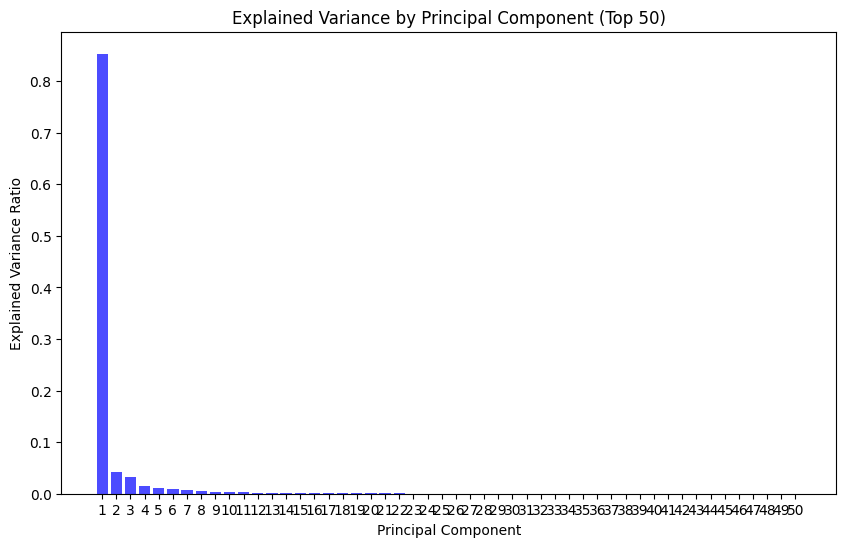

CLIENT:6
Epoch [1/1], Train Loss: 0.1358
Epoch 1: validation loss 0.061490107404115875
threshold:0.08462545275688171
Epoch [1/1], Train Loss: 0.0493
Epoch 2: validation loss 0.04904194070169559
threshold:0.07213990390300751
Epoch [1/1], Train Loss: 0.0333
Epoch 3: validation loss 0.04367978429565063
threshold:0.07017531618475914
Epoch [1/1], Train Loss: 0.0282
Epoch 4: validation loss 0.04151609208530341
threshold:0.07423598505556583
Epoch [1/1], Train Loss: 0.0262
Epoch 5: validation loss 0.03972992195914953
threshold:0.07078173570334911
exceed threshold proportion:0.1009375
count_total:3200.0
exceed threshold proportion:1.0
count_total:4000.0
FPR derived with OCSVM:0.134375
TPR derived with OCSVM:1.0
False Positive Rate:0.1009375
True Positive Rate:1.0
benign_error:0.0698176210001111
attack_error:6.738657445073128
roc_auc:0.9749


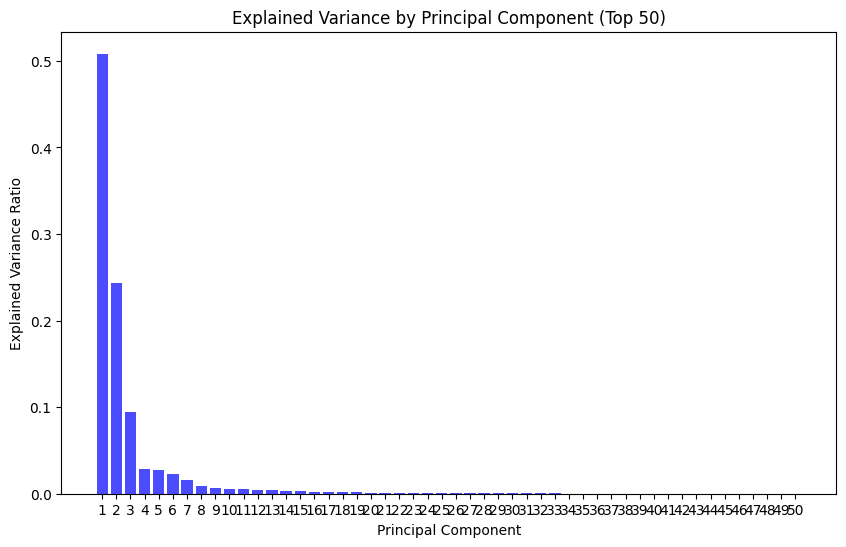

CLIENT:7
Epoch [1/1], Train Loss: 0.1741
Epoch 1: validation loss 0.05221401456838999
threshold:0.06014581210911274
Epoch [1/1], Train Loss: 0.0924
Epoch 2: validation loss 0.04626928070225777
threshold:0.050596337765455246
Epoch [1/1], Train Loss: 0.0838
Epoch 3: validation loss 0.04368935123277016
threshold:0.05058042146265507
Epoch [1/1], Train Loss: 0.0689
Epoch 4: validation loss 0.0347830591771083
threshold:0.04038724582642317
Epoch [1/1], Train Loss: 0.0564
Epoch 5: validation loss 0.02541525930357285
threshold:0.02852164674550295
exceed threshold proportion:0.3959375
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.229375
TPR derived with OCSVM:1.0
False Positive Rate:0.3959375
True Positive Rate:1.0
benign_error:0.04262096456252038
attack_error:0.9184658696055412
roc_auc:0.9982


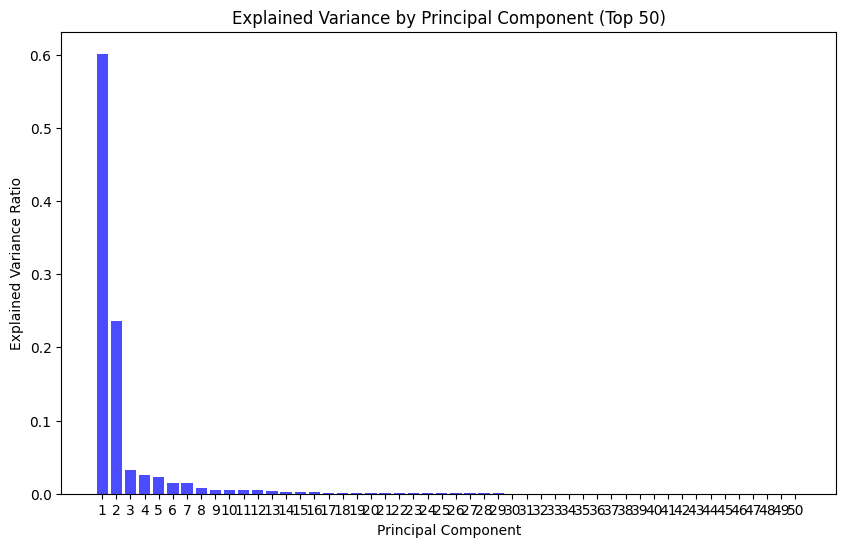

CLIENT:8
Epoch [1/1], Train Loss: 0.1177
Epoch 1: validation loss 0.043098775517099945
threshold:0.029502003453671932
Epoch [1/1], Train Loss: 0.0392
Epoch 2: validation loss 0.03721478710380884
threshold:0.015441629104316235
Epoch [1/1], Train Loss: 0.0372
Epoch 3: validation loss 0.037532581369846295
threshold:0.021603145636618137
Epoch [1/1], Train Loss: 0.0351
Epoch 4: validation loss 0.03325632152458032
threshold:0.01506105624139309
Epoch [1/1], Train Loss: 0.0332
Epoch 5: validation loss 0.03186068780338153
threshold:0.014452672097831964
exceed threshold proportion:0.1815625
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.04
TPR derived with OCSVM:0.99825
False Positive Rate:0.1815625
True Positive Rate:1.0
benign_error:0.02239580884575844
attack_error:7.387867852449417
roc_auc:0.9979


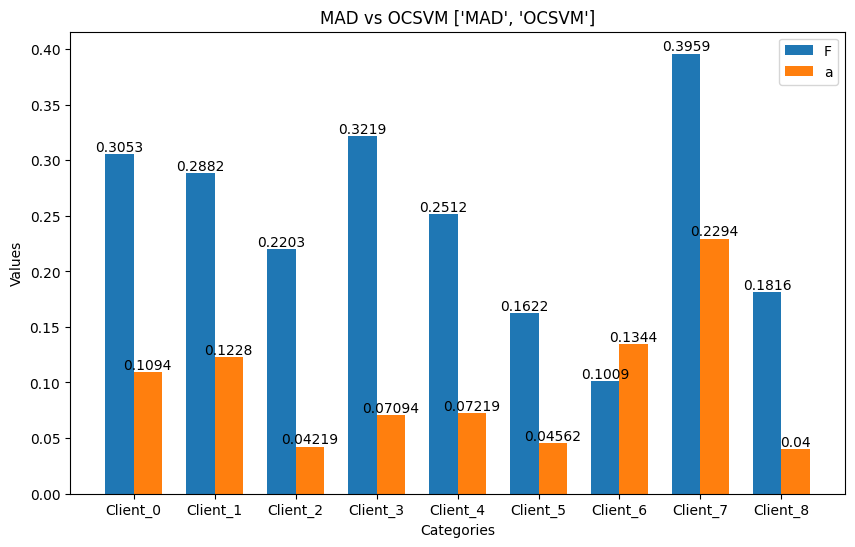

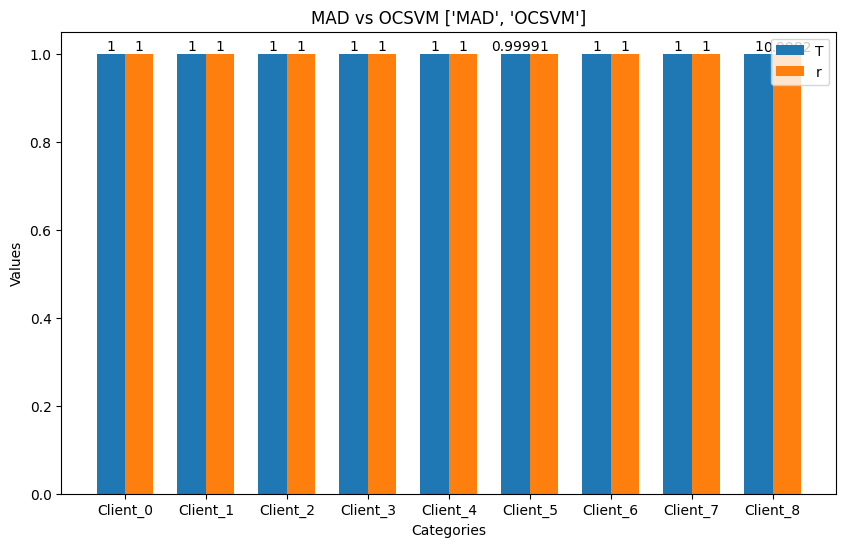

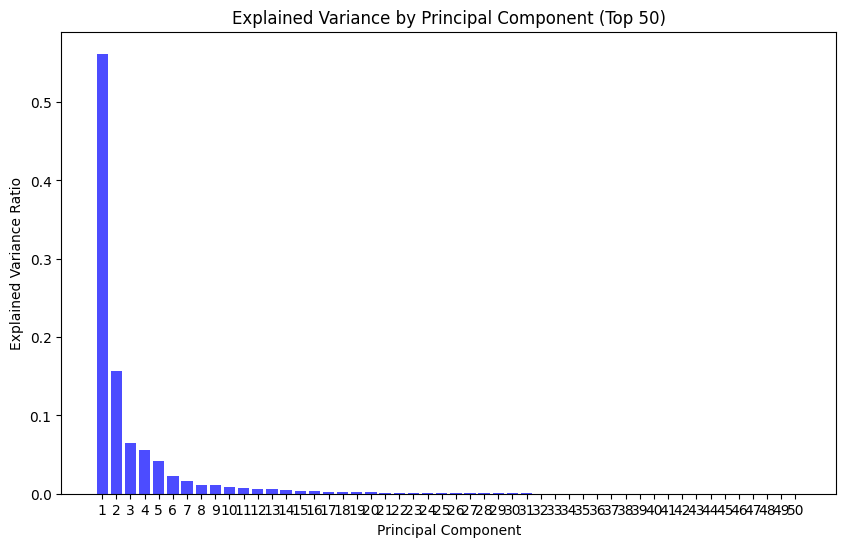

CLIENT:0
Epoch [1/1], Train Loss: 0.1265
Epoch 1: validation loss 0.055287659569428514
threshold:0.08991723880171776
Epoch [1/1], Train Loss: 0.0414
Epoch 2: validation loss 0.02619113719616181
threshold:0.05432348884642124
Epoch [1/1], Train Loss: 0.0306
Epoch 3: validation loss 0.020160327952068586
threshold:0.03824668051674962
Epoch [1/1], Train Loss: 0.0255
Epoch 4: validation loss 0.017187487692213975
threshold:0.027635515434667468
Epoch [1/1], Train Loss: 0.0235
Epoch 5: validation loss 0.016274737891478416
threshold:0.025082660606130958
exceed threshold proportion:0.20875
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.10875
TPR derived with OCSVM:1.0
False Positive Rate:0.20875
True Positive Rate:1.0
benign_error:0.02185763946734369
attack_error:46.2270912014246
roc_auc:0.9977


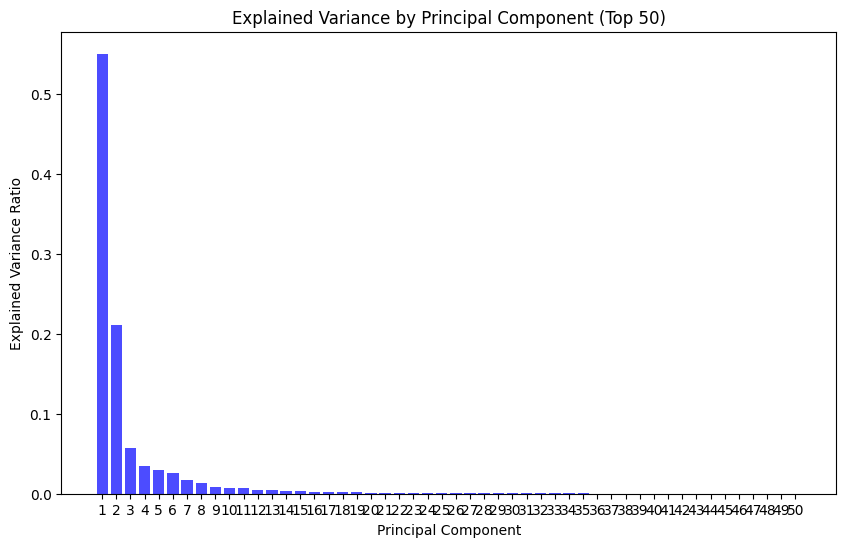

CLIENT:1
Epoch [1/1], Train Loss: 0.1553
Epoch 1: validation loss 0.06715866609807587
threshold:0.10991925001144409
Epoch [1/1], Train Loss: 0.0612
Epoch 2: validation loss 0.05208042638116299
threshold:0.09889545477926731
Epoch [1/1], Train Loss: 0.0509
Epoch 3: validation loss 0.04427101231432539
threshold:0.07432179432362318
Epoch [1/1], Train Loss: 0.0436
Epoch 4: validation loss 0.03872019475588912
threshold:0.06517414655536413
Epoch [1/1], Train Loss: 0.0387
Epoch 5: validation loss 0.03457010833136402
threshold:0.06526854354888201
exceed threshold proportion:0.10636675562333206
count_total:2623.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.10789172703011818
TPR derived with OCSVM:1.0
False Positive Rate:0.10636675562333206
True Positive Rate:1.0
benign_error:0.038022523134480984
attack_error:36.383837919294834
roc_auc:0.9996


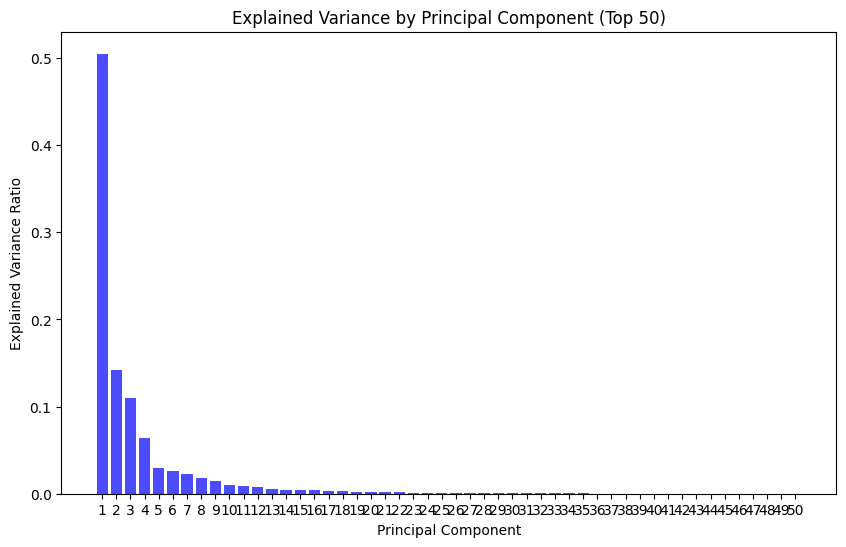

CLIENT:2
Epoch [1/1], Train Loss: 0.1682
Epoch 1: validation loss 288.6145433273835
threshold:0.15936770290136337
Epoch [1/1], Train Loss: 0.0834
Epoch 2: validation loss 288.5966281328828
threshold:0.1377218123525381
Epoch [1/1], Train Loss: 0.0681
Epoch 3: validation loss 288.5836122252047
threshold:0.11437915824353695
Epoch [1/1], Train Loss: 0.0551
Epoch 4: validation loss 288.57361036006074
threshold:0.09083425626158714
Epoch [1/1], Train Loss: 0.0491
Epoch 5: validation loss 288.56871266025956
threshold:0.0848907707259059
exceed threshold proportion:0.1140625
count_total:3200.0
exceed threshold proportion:1.0
count_total:4000.0
FPR derived with OCSVM:0.0446875
TPR derived with OCSVM:1.0
False Positive Rate:0.1140625
True Positive Rate:1.0
benign_error:562.6142597500607
attack_error:39.13268539381027
roc_auc:0.9855


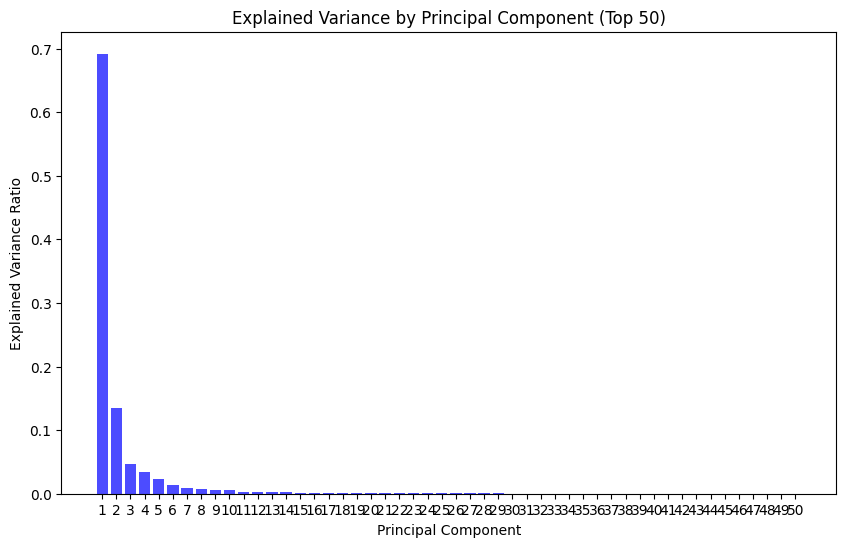

CLIENT:3
Epoch [1/1], Train Loss: 0.1494
Epoch 1: validation loss 0.02387311562704734
threshold:0.02227265015244484
Epoch [1/1], Train Loss: 0.1326
Epoch 2: validation loss 0.022688099612983372
threshold:0.021401214879006147
Epoch [1/1], Train Loss: 0.0996
Epoch 3: validation loss 0.02110566733739315
threshold:0.02131160208955407
Epoch [1/1], Train Loss: 0.0786
Epoch 4: validation loss 0.01994108438778382
threshold:0.020817216020077467
Epoch [1/1], Train Loss: 0.0696
Epoch 5: validation loss 0.01974310106000839
threshold:0.020390579011291265
exceed threshold proportion:0.2490625
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.0721875
TPR derived with OCSVM:1.0
False Positive Rate:0.2490625
True Positive Rate:1.0
benign_error:0.022462517861276864
attack_error:1.5238930149674415
roc_auc:0.9995


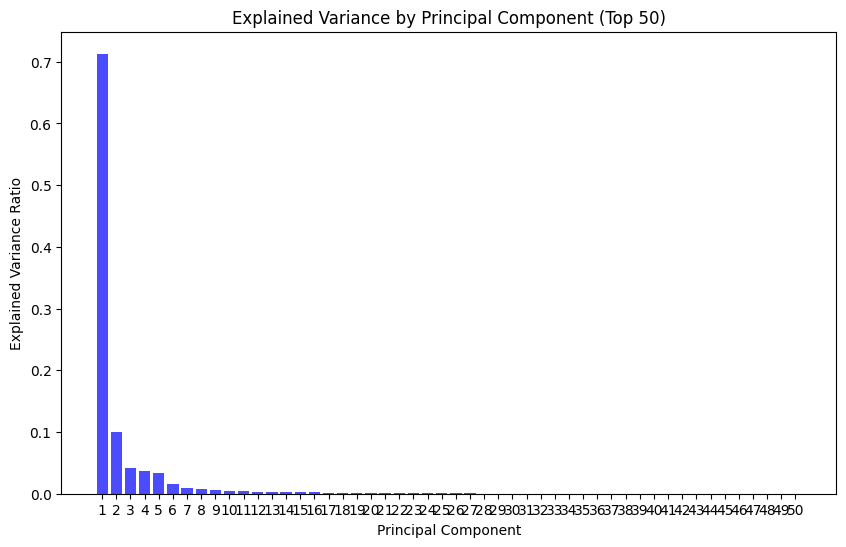

CLIENT:4
Epoch [1/1], Train Loss: 0.1631
Epoch 1: validation loss 0.0653150645777201
threshold:0.06694129575043917
Epoch [1/1], Train Loss: 0.0726
Epoch 2: validation loss 0.058728827784458794
threshold:0.07494084257632494
Epoch [1/1], Train Loss: 0.0631
Epoch 3: validation loss 0.045983955340507705
threshold:0.06703958380967379
Epoch [1/1], Train Loss: 0.0538
Epoch 4: validation loss 0.041127324983095515
threshold:0.055585007183253765
Epoch [1/1], Train Loss: 0.0498
Epoch 5: validation loss 0.0397149519660534
threshold:0.05284909112378955
exceed threshold proportion:0.2478125
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.075625
TPR derived with OCSVM:1.0
False Positive Rate:0.2478125
True Positive Rate:1.0
benign_error:0.03953801464289427
attack_error:2.37396629345417
roc_auc:0.9996


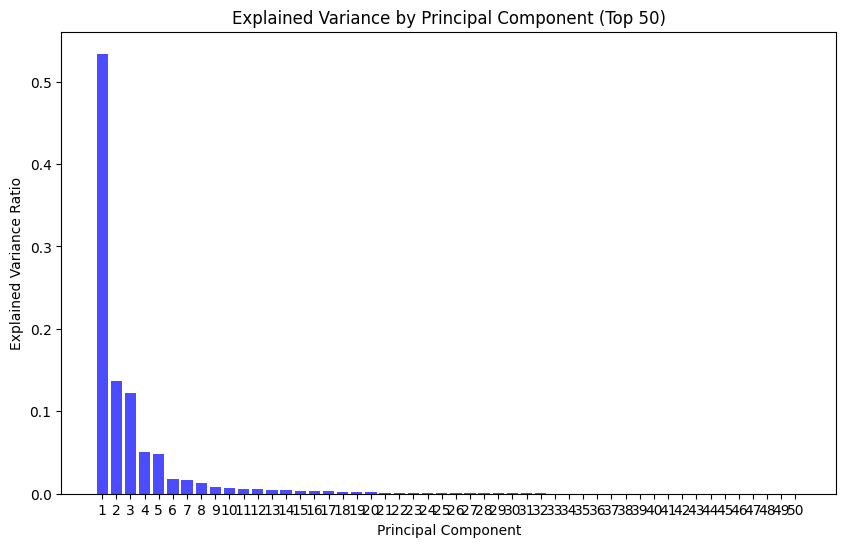

CLIENT:5
Epoch [1/1], Train Loss: 0.1928
Epoch 1: validation loss 0.10537860511969298
threshold:0.21978431660681963
Epoch [1/1], Train Loss: 0.1068
Epoch 2: validation loss 0.08244891749360622
threshold:0.20596309378743172
Epoch [1/1], Train Loss: 0.0914
Epoch 3: validation loss 0.07196776311940108
threshold:0.15297016967087984
Epoch [1/1], Train Loss: 0.0798
Epoch 4: validation loss 0.0645393625092812
threshold:0.10290325433015823
Epoch [1/1], Train Loss: 0.0648
Epoch 5: validation loss 0.05308055291191126
threshold:0.09374430868774652
exceed threshold proportion:0.125
count_total:3200.0
exceed threshold proportion:0.999875
count_total:8000.0
FPR derived with OCSVM:0.044375
TPR derived with OCSVM:1.0
False Positive Rate:0.125
True Positive Rate:0.999875
benign_error:0.052685198578983544
attack_error:3.1063437541127206
roc_auc:0.9999


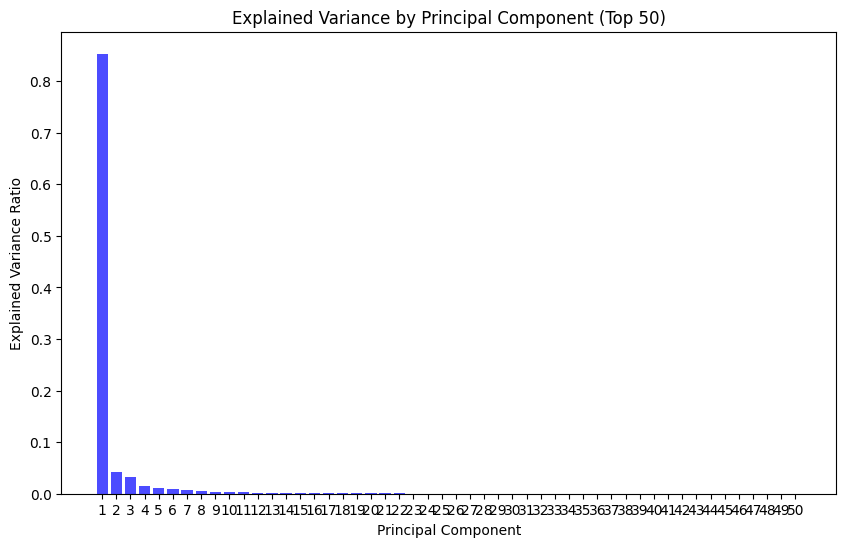

CLIENT:6
Epoch [1/1], Train Loss: 0.1367
Epoch 1: validation loss 0.058915741856281574
threshold:0.0935809537768364
Epoch [1/1], Train Loss: 0.0480
Epoch 2: validation loss 0.04882725283312492
threshold:0.09414974972605705
Epoch [1/1], Train Loss: 0.0324
Epoch 3: validation loss 0.04193386929348493
threshold:0.09334924258291721
Epoch [1/1], Train Loss: 0.0277
Epoch 4: validation loss 0.040274802948801945
threshold:0.09283773694187403
Epoch [1/1], Train Loss: 0.0257
Epoch 5: validation loss 0.038972813445024
threshold:0.08746660081669688
exceed threshold proportion:0.0903125
count_total:3200.0
exceed threshold proportion:0.99975
count_total:4000.0
FPR derived with OCSVM:0.1396875
TPR derived with OCSVM:1.0
False Positive Rate:0.0903125
True Positive Rate:0.99975
benign_error:0.06973837945610285
attack_error:6.720806311130524
roc_auc:0.9751


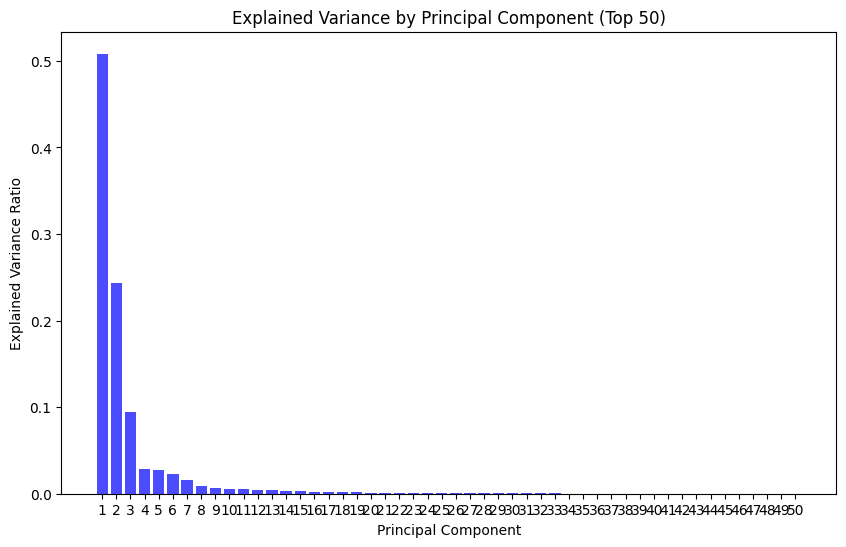

CLIENT:7
Epoch [1/1], Train Loss: 0.1656
Epoch 1: validation loss 0.051360242049663496
threshold:0.07204205170273781
Epoch [1/1], Train Loss: 0.0930
Epoch 2: validation loss 0.04682216642376704
threshold:0.06221795454621315
Epoch [1/1], Train Loss: 0.0837
Epoch 3: validation loss 0.042758212534663005
threshold:0.0625641979277134
Epoch [1/1], Train Loss: 0.0702
Epoch 4: validation loss 0.03597492046463184
threshold:0.05615073349326849
Epoch [1/1], Train Loss: 0.0590
Epoch 5: validation loss 0.028884187216560046
threshold:0.037366488948464394
exceed threshold proportion:0.340625
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.2225
TPR derived with OCSVM:1.0
False Positive Rate:0.340625
True Positive Rate:1.0
benign_error:0.04456057205796242
attack_error:0.9283396692872048
roc_auc:0.9987


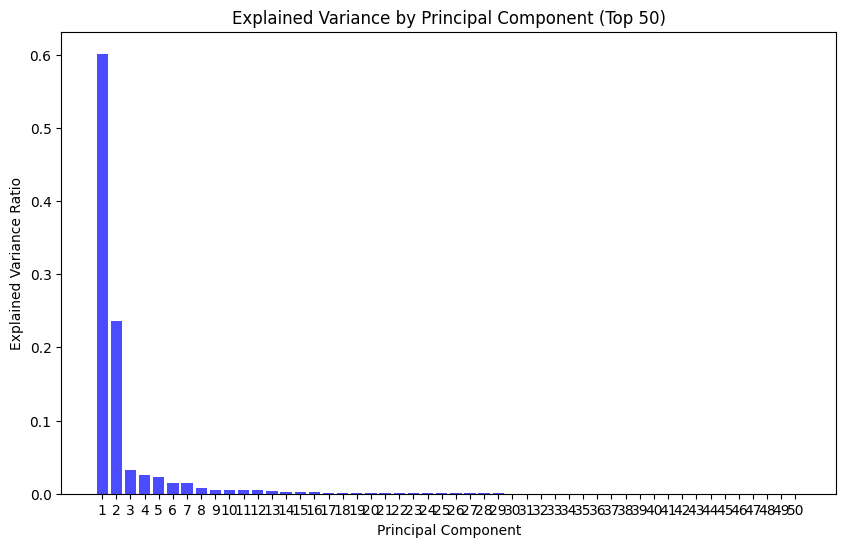

CLIENT:8
Epoch [1/1], Train Loss: 0.1220
Epoch 1: validation loss 0.03915835432708263
threshold:0.02567363018169999
Epoch [1/1], Train Loss: 0.0396
Epoch 2: validation loss 0.03707370610955434
threshold:0.01597791165113449
Epoch [1/1], Train Loss: 0.0375
Epoch 3: validation loss 0.03423342573432586
threshold:0.01753520406782627
Epoch [1/1], Train Loss: 0.0347
Epoch 4: validation loss 0.03281718069830766
threshold:0.016633931081742048
Epoch [1/1], Train Loss: 0.0333
Epoch 5: validation loss 0.039020283482013605
threshold:0.02997276559472084
exceed threshold proportion:0.0846875
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.0415625
TPR derived with OCSVM:0.99875
False Positive Rate:0.0846875
True Positive Rate:1.0
benign_error:0.029833104852586986
attack_error:7.431437803208828
roc_auc:0.9971


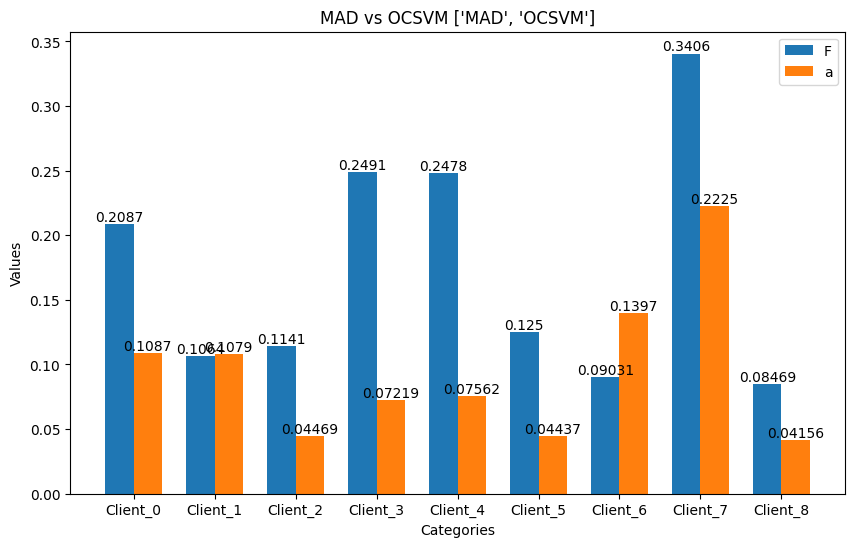

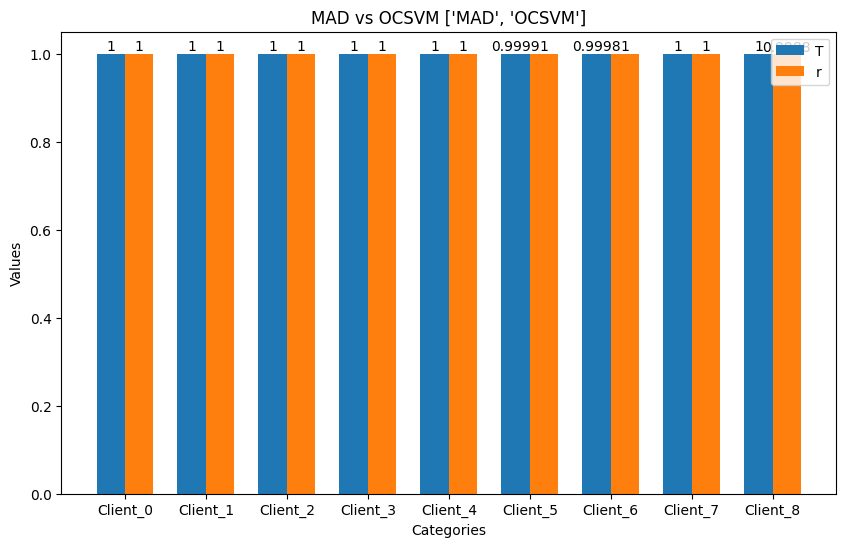

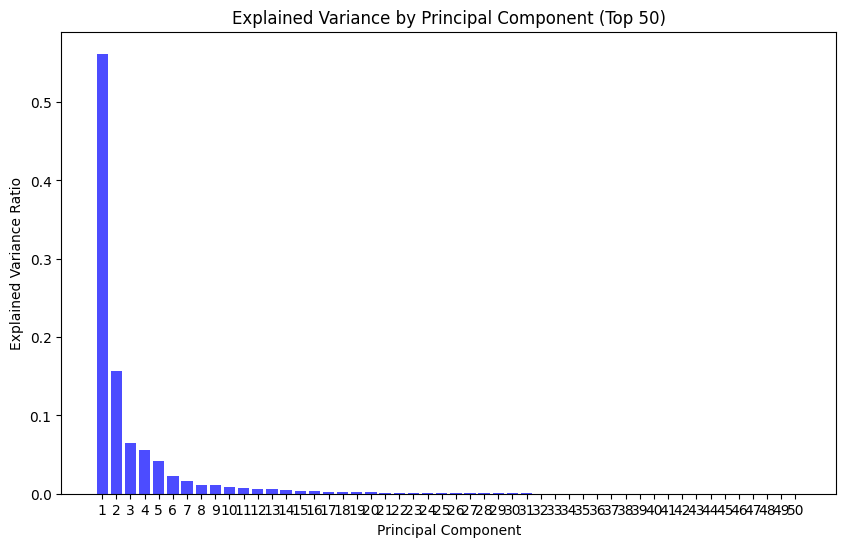

CLIENT:0
Epoch [1/1], Train Loss: 0.1269
Epoch 1: validation loss 0.05971163669839884
threshold:0.10993044450879097
Epoch [1/1], Train Loss: 0.0433
Epoch 2: validation loss 0.022841124360760055
threshold:0.05369987804442644
Epoch [1/1], Train Loss: 0.0288
Epoch 3: validation loss 0.018183567117039973
threshold:0.03656975133344531
Epoch [1/1], Train Loss: 0.0243
Epoch 4: validation loss 0.016801529263074582
threshold:0.03342574927955866
Epoch [1/1], Train Loss: 0.0227
Epoch 5: validation loss 0.015869893381992975
threshold:0.030314743518829346
exceed threshold proportion:0.133125
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.101875
TPR derived with OCSVM:1.0
False Positive Rate:0.133125
True Positive Rate:1.0
benign_error:0.02137369372881949
attack_error:46.24201954841614
roc_auc:0.9981


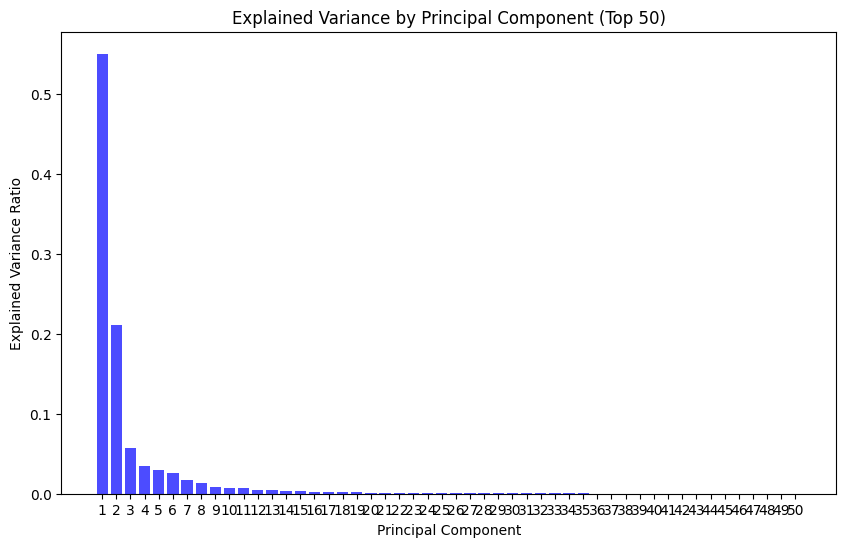

CLIENT:1
Epoch [1/1], Train Loss: 0.1478
Epoch 1: validation loss 0.07641459611602533
threshold:0.14582132175564766
Epoch [1/1], Train Loss: 0.0663
Epoch 2: validation loss 0.053616486562617735
threshold:0.1200137548148632
Epoch [1/1], Train Loss: 0.0536
Epoch 3: validation loss 0.046171793095712135
threshold:0.09447343461215496
Epoch [1/1], Train Loss: 0.0457
Epoch 4: validation loss 0.039175626398951086
threshold:0.07204039581120014
Epoch [1/1], Train Loss: 0.0399
Epoch 5: validation loss 0.035641781114534234
threshold:0.06512784585356712
exceed threshold proportion:0.12542889820815858
count_total:2623.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.11589782691574534
TPR derived with OCSVM:1.0
False Positive Rate:0.12542889820815858
True Positive Rate:1.0
benign_error:0.039182995459163546
attack_error:36.381975736260415
roc_auc:0.9991


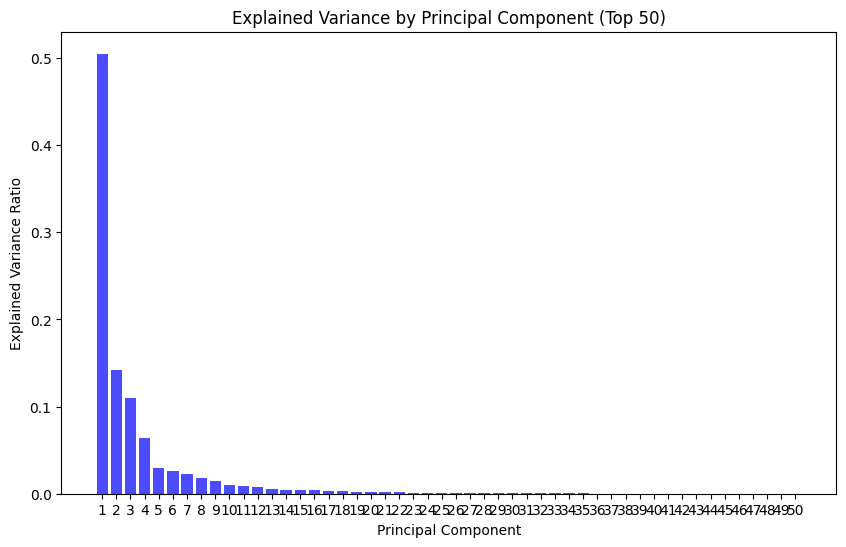

CLIENT:2
Epoch [1/1], Train Loss: 0.1786
Epoch 1: validation loss 288.61556977069915
threshold:0.18034058064222336
Epoch [1/1], Train Loss: 0.0852
Epoch 2: validation loss 288.59725309786126
threshold:0.1524903830140829
Epoch [1/1], Train Loss: 0.0673
Epoch 3: validation loss 288.58133180466217
threshold:0.12368770875036716
Epoch [1/1], Train Loss: 0.0552
Epoch 4: validation loss 288.5732661467141
threshold:0.10267085209488869
Epoch [1/1], Train Loss: 0.0498
Epoch 5: validation loss 288.56968831329203
threshold:0.09822181053459644
exceed threshold proportion:0.1125
count_total:3200.0
exceed threshold proportion:1.0
count_total:4000.0
FPR derived with OCSVM:0.0440625
TPR derived with OCSVM:1.0
False Positive Rate:0.1125
True Positive Rate:1.0
benign_error:562.6162882312015
attack_error:39.130003102660176
roc_auc:0.9852


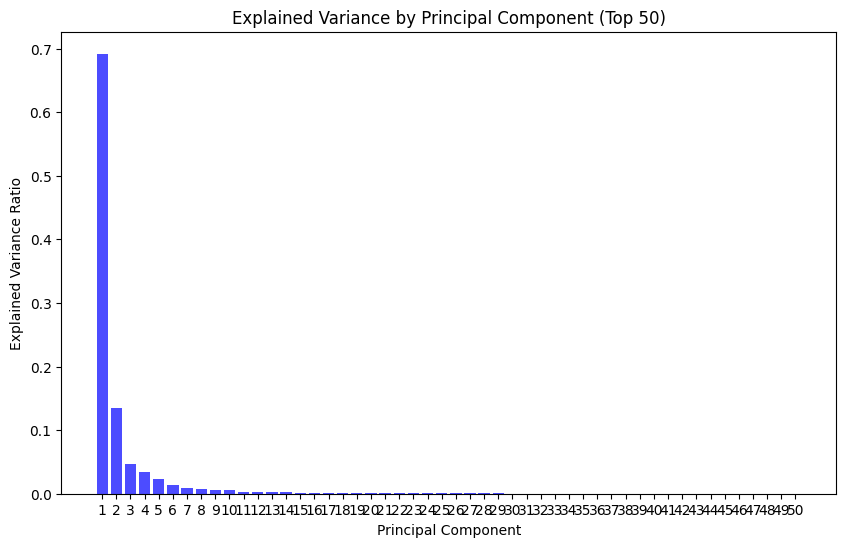

CLIENT:3
Epoch [1/1], Train Loss: 0.1513
Epoch 1: validation loss 0.02385576576567613
threshold:0.025467853993177414
Epoch [1/1], Train Loss: 0.1340
Epoch 2: validation loss 0.022365426434538302
threshold:0.025028170086443424
Epoch [1/1], Train Loss: 0.0934
Epoch 3: validation loss 0.020852734377750985
threshold:0.025303096510469913
Epoch [1/1], Train Loss: 0.0737
Epoch 4: validation loss 0.02034926186196315
threshold:0.024667016696184874
Epoch [1/1], Train Loss: 0.0699
Epoch 5: validation loss 0.019338523352948517
threshold:0.024083119817078114
exceed threshold proportion:0.18125
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.0703125
TPR derived with OCSVM:1.0
False Positive Rate:0.18125
True Positive Rate:1.0
benign_error:0.022210354106500744
attack_error:1.5171784636974335
roc_auc:0.9995


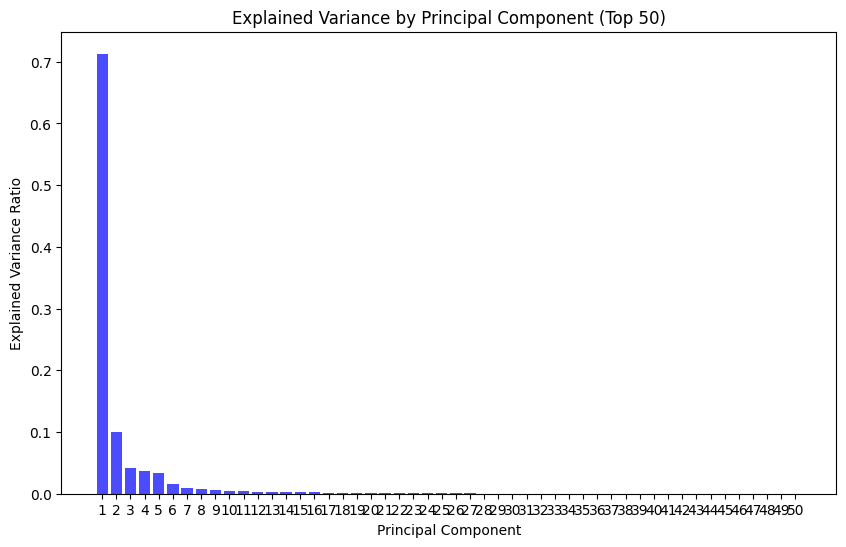

CLIENT:4
Epoch [1/1], Train Loss: 0.1659
Epoch 1: validation loss 0.0677839547682267
threshold:0.07570374850183725
Epoch [1/1], Train Loss: 0.0737
Epoch 2: validation loss 0.057858004335027476
threshold:0.0873173214495182
Epoch [1/1], Train Loss: 0.0650
Epoch 3: validation loss 0.04931418721874555
threshold:0.07935771532356739
Epoch [1/1], Train Loss: 0.0553
Epoch 4: validation loss 0.041783682247385004
threshold:0.06818658113479614
Epoch [1/1], Train Loss: 0.0504
Epoch 5: validation loss 0.03918840871789517
threshold:0.06802869215607643
exceed threshold proportion:0.17
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.070625
TPR derived with OCSVM:1.0
False Positive Rate:0.17
True Positive Rate:1.0
benign_error:0.03859565688297153
attack_error:2.375678571999073
roc_auc:0.9999


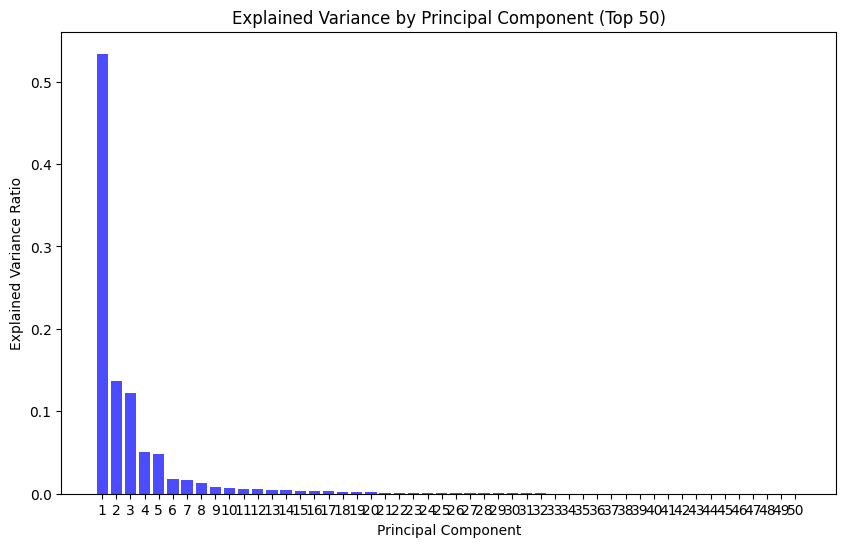

CLIENT:5
Epoch [1/1], Train Loss: 0.1865
Epoch 1: validation loss 0.09283985821291423
threshold:0.2588595896959305
Epoch [1/1], Train Loss: 0.0995
Epoch 2: validation loss 0.07789982694845933
threshold:0.22023260593414307
Epoch [1/1], Train Loss: 0.0867
Epoch 3: validation loss 0.06868140082328747
threshold:0.1928262710571289
Epoch [1/1], Train Loss: 0.0748
Epoch 4: validation loss 0.060016003480324376
threshold:0.15477812476456165
Epoch [1/1], Train Loss: 0.0655
Epoch 5: validation loss 0.056774520797607225
threshold:0.1264625210314989
exceed threshold proportion:0.048125
count_total:3200.0
exceed threshold proportion:0.999375
count_total:8000.0
FPR derived with OCSVM:0.0484375
TPR derived with OCSVM:1.0
False Positive Rate:0.048125
True Positive Rate:0.999375
benign_error:0.056664914283901455
attack_error:3.108820866048336
roc_auc:0.9999


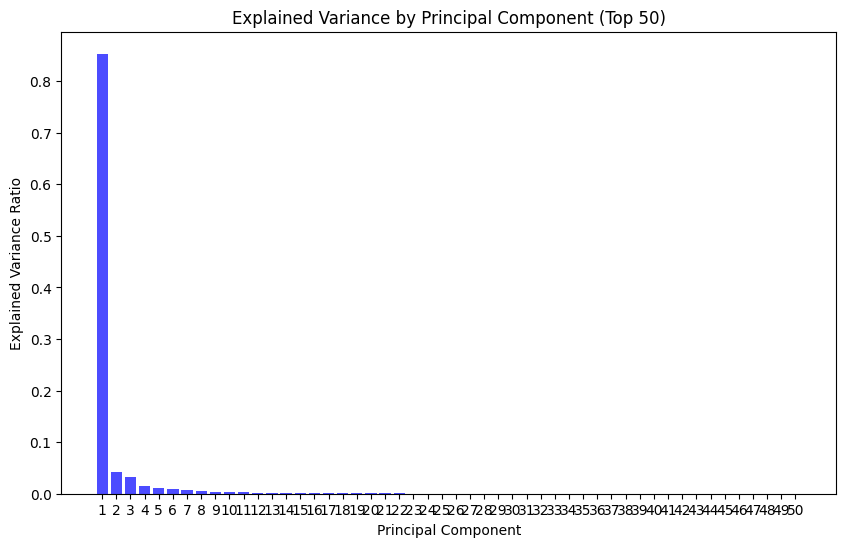

CLIENT:6
Epoch [1/1], Train Loss: 0.1349
Epoch 1: validation loss 0.059052928460714145
threshold:0.11316106282174587
Epoch [1/1], Train Loss: 0.0497
Epoch 2: validation loss 0.052074617281174046
threshold:0.1083587259054184
Epoch [1/1], Train Loss: 0.0376
Epoch 3: validation loss 0.04410993714745228
threshold:0.09995673038065434
Epoch [1/1], Train Loss: 0.0302
Epoch 4: validation loss 0.04061048031808474
threshold:0.10315349884331226
Epoch [1/1], Train Loss: 0.0268
Epoch 5: validation loss 0.03770146231429699
threshold:0.09970437176525593
exceed threshold proportion:0.0859375
count_total:3200.0
exceed threshold proportion:0.9995
count_total:4000.0
FPR derived with OCSVM:0.134375
TPR derived with OCSVM:1.0
False Positive Rate:0.0859375
True Positive Rate:0.9995
benign_error:0.0668157697096467
attack_error:6.757499768614769
roc_auc:0.9745


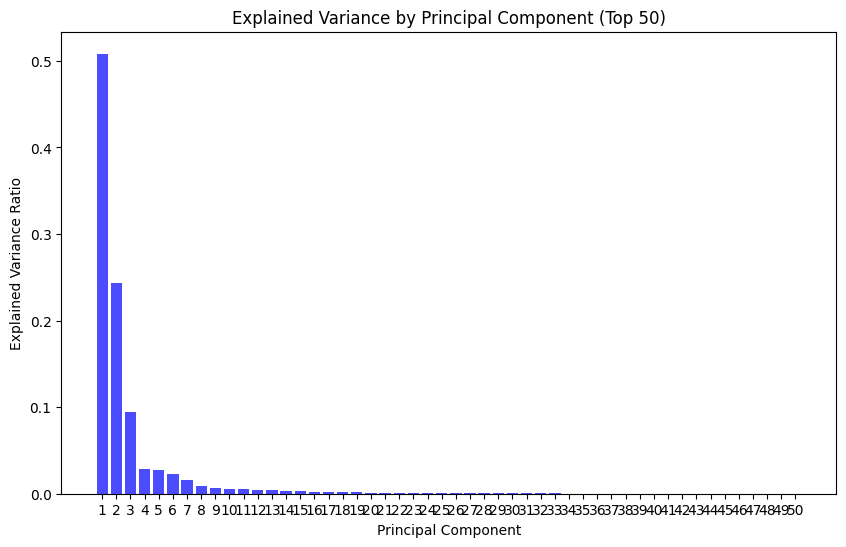

CLIENT:7
Epoch [1/1], Train Loss: 0.1775
Epoch 1: validation loss 0.053110366438825926
threshold:0.08673969656229019
Epoch [1/1], Train Loss: 0.0949
Epoch 2: validation loss 0.04689876011166817
threshold:0.07129585556685925
Epoch [1/1], Train Loss: 0.0850
Epoch 3: validation loss 0.04349512054752081
threshold:0.07223359681665897
Epoch [1/1], Train Loss: 0.0723
Epoch 4: validation loss 0.03653862366500573
threshold:0.07016100455075502
Epoch [1/1], Train Loss: 0.0599
Epoch 5: validation loss 0.030264895753218578
threshold:0.051636628806591034
exceed threshold proportion:0.2540625
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.2234375
TPR derived with OCSVM:1.0
False Positive Rate:0.2540625
True Positive Rate:1.0
benign_error:0.04656261499971151
attack_error:0.9202620794773102
roc_auc:0.9978


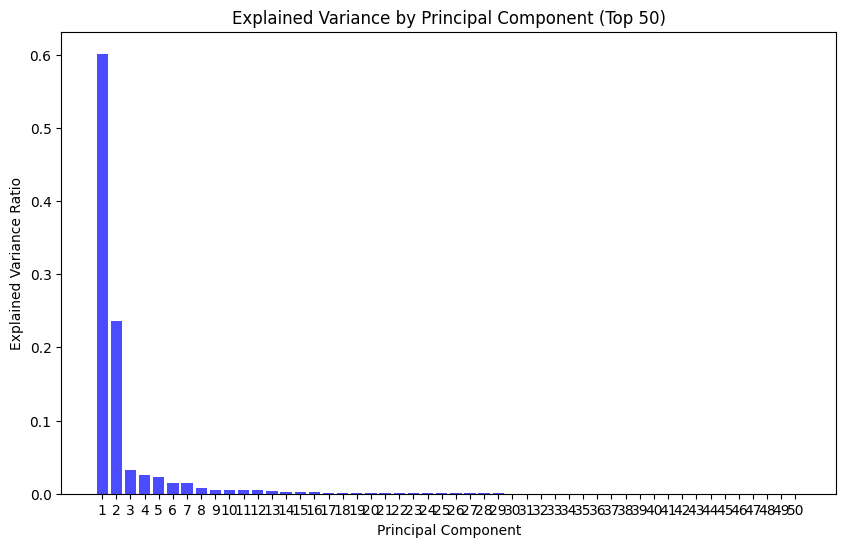

CLIENT:8
Epoch [1/1], Train Loss: 0.1316
Epoch 1: validation loss 0.04645580687584021
threshold:0.03518731612712145
Epoch [1/1], Train Loss: 0.0389
Epoch 2: validation loss 0.038897994060355885
threshold:0.023924918845295906
Epoch [1/1], Train Loss: 0.0371
Epoch 3: validation loss 0.03654686387819357
threshold:0.026627495884895325
Epoch [1/1], Train Loss: 0.0342
Epoch 4: validation loss 0.032714834646918836
threshold:0.01863529859110713
Epoch [1/1], Train Loss: 0.0326
Epoch 5: validation loss 0.031763124036101195
threshold:0.01869859592989087
exceed threshold proportion:0.124375
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.038125
TPR derived with OCSVM:0.99875
False Positive Rate:0.124375
True Positive Rate:1.0
benign_error:0.022267577098682524
attack_error:7.408244365513324
roc_auc:0.9983


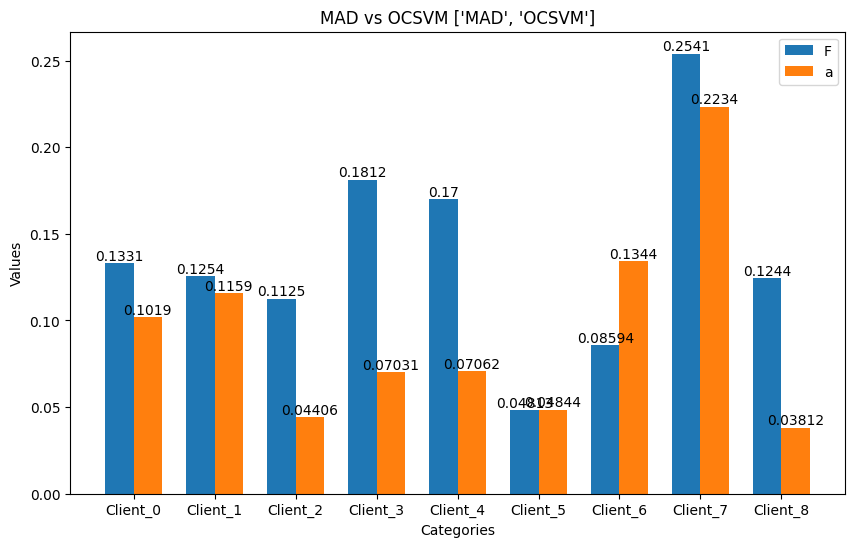

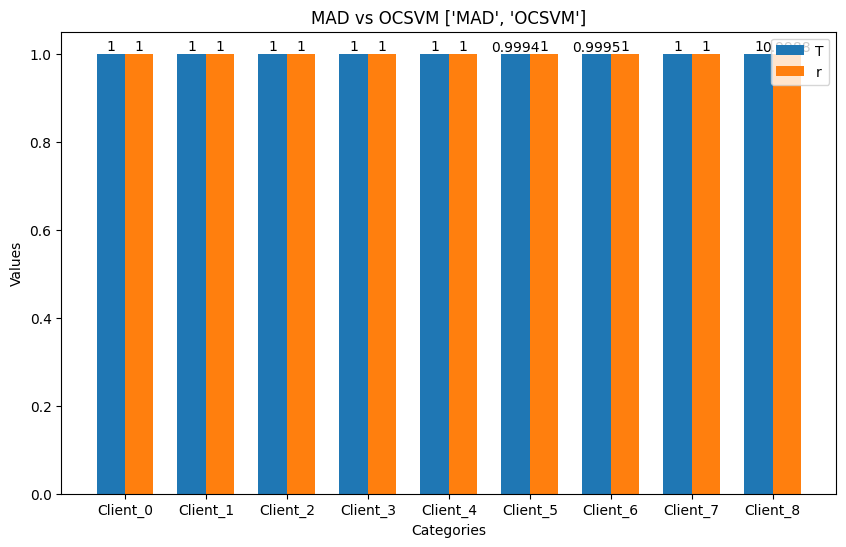

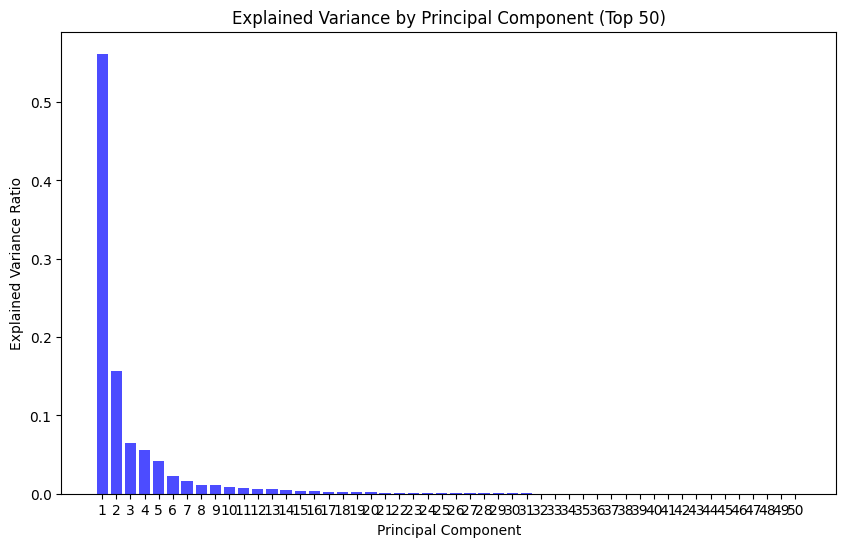

CLIENT:0
Epoch [1/1], Train Loss: 0.1220
Epoch 1: validation loss 0.03658754139756545
threshold:0.08974843099713326
Epoch [1/1], Train Loss: 0.0357
Epoch 2: validation loss 0.021980610002691928
threshold:0.057644922751933336
Epoch [1/1], Train Loss: 0.0271
Epoch 3: validation loss 0.017977488026596034
threshold:0.0379083501175046
Epoch [1/1], Train Loss: 0.0238
Epoch 4: validation loss 0.016348986915097785
threshold:0.034815445775166154
Epoch [1/1], Train Loss: 0.0223
Epoch 5: validation loss 0.015443248636065386
threshold:0.03122590109705925
exceed threshold proportion:0.1178125
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.1046875
TPR derived with OCSVM:1.0
False Positive Rate:0.1178125
True Positive Rate:1.0
benign_error:0.020844474313780666
attack_error:46.22171131873131
roc_auc:0.9985


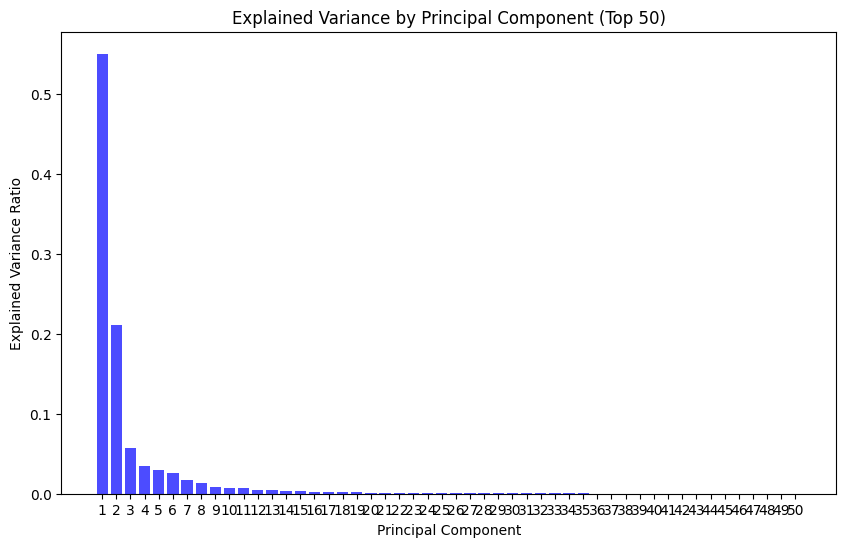

CLIENT:1
Epoch [1/1], Train Loss: 0.1544
Epoch 1: validation loss 0.07270195076695914
threshold:0.1483357511460781
Epoch [1/1], Train Loss: 0.0651
Epoch 2: validation loss 0.05352805961050183
threshold:0.1374303661286831
Epoch [1/1], Train Loss: 0.0536
Epoch 3: validation loss 0.04680059983667844
threshold:0.11120838019996881
Epoch [1/1], Train Loss: 0.0468
Epoch 4: validation loss 0.04043114245940243
threshold:0.0917754378169775
Epoch [1/1], Train Loss: 0.0413
Epoch 5: validation loss 0.036624749062534045
threshold:0.07993807271122932
exceed threshold proportion:0.06938619900876858
count_total:2623.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.11704155547083492
TPR derived with OCSVM:1.0
False Positive Rate:0.06938619900876858
True Positive Rate:1.0
benign_error:0.04034876468933315
attack_error:36.48786647093296
roc_auc:0.9993


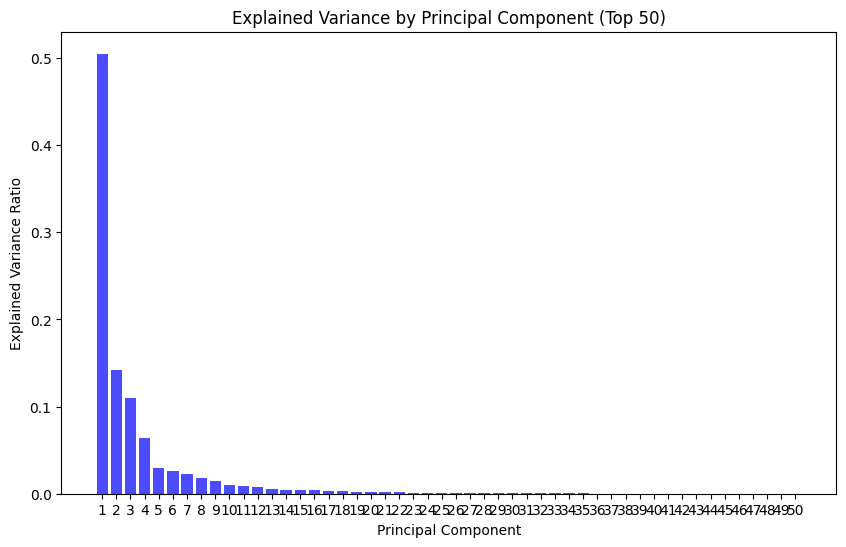

CLIENT:2
Epoch [1/1], Train Loss: 0.1712
Epoch 1: validation loss 288.6142509286602
threshold:0.21101886220276356
Epoch [1/1], Train Loss: 0.0806
Epoch 2: validation loss 288.5945673318437
threshold:0.18364505842328072
Epoch [1/1], Train Loss: 0.0643
Epoch 3: validation loss 288.577147018002
threshold:0.1278065126389265
Epoch [1/1], Train Loss: 0.0512
Epoch 4: validation loss 288.5702047954003
threshold:0.12103635258972645
Epoch [1/1], Train Loss: 0.0462
Epoch 5: validation loss 288.5670423660905
threshold:0.11181721650063992
exceed threshold proportion:0.0553125
count_total:3200.0
exceed threshold proportion:1.0
count_total:4000.0
FPR derived with OCSVM:0.045
TPR derived with OCSVM:1.0
False Positive Rate:0.0553125
True Positive Rate:1.0
benign_error:562.611366845183
attack_error:39.12749205684662
roc_auc:0.9855


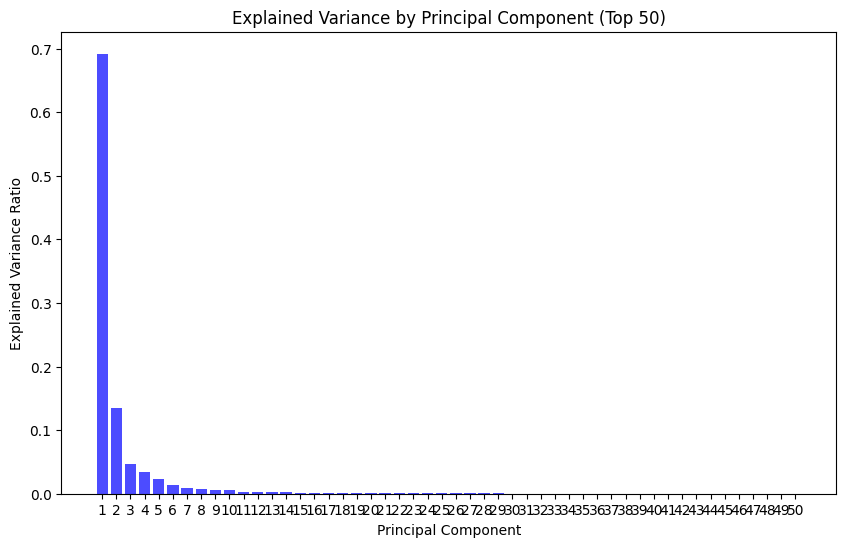

CLIENT:3
Epoch [1/1], Train Loss: 0.1504
Epoch 1: validation loss 0.024305896527874165
threshold:0.02807899657636881
Epoch [1/1], Train Loss: 0.1320
Epoch 2: validation loss 0.022600637414516546
threshold:0.027040389366447926
Epoch [1/1], Train Loss: 0.1009
Epoch 3: validation loss 0.020920444327669267
threshold:0.027654518373310566
Epoch [1/1], Train Loss: 0.0829
Epoch 4: validation loss 0.020478993945587904
threshold:0.027051908429712057
Epoch [1/1], Train Loss: 0.0703
Epoch 5: validation loss 0.020081179526944954
threshold:0.026371974032372236
exceed threshold proportion:0.1621875
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.070625
TPR derived with OCSVM:1.0
False Positive Rate:0.1621875
True Positive Rate:1.0
benign_error:0.02278390197083354
attack_error:1.522695949614048
roc_auc:0.9995


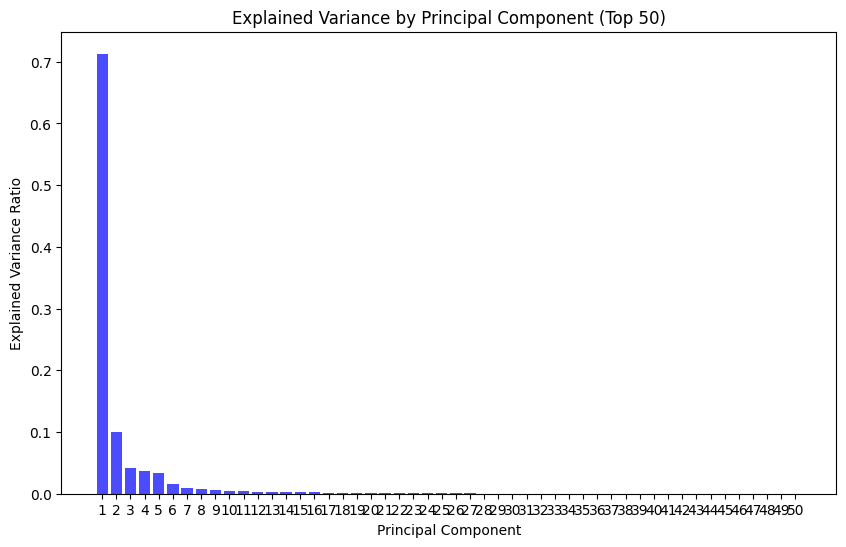

CLIENT:4
Epoch [1/1], Train Loss: 0.1699
Epoch 1: validation loss 0.07139040038753779
threshold:0.09202505555003881
Epoch [1/1], Train Loss: 0.0739
Epoch 2: validation loss 0.057388695071523006
threshold:0.1027717562392354
Epoch [1/1], Train Loss: 0.0645
Epoch 3: validation loss 0.048098239264427085
threshold:0.0988753093406558
Epoch [1/1], Train Loss: 0.0532
Epoch 4: validation loss 0.04171209120406554
threshold:0.08270674012601376
Epoch [1/1], Train Loss: 0.0472
Epoch 5: validation loss 0.0356524647715
threshold:0.07004472147673368
exceed threshold proportion:0.1340625
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.075625
TPR derived with OCSVM:1.0
False Positive Rate:0.1340625
True Positive Rate:1.0
benign_error:0.03553719634190202
attack_error:2.369068838238716
roc_auc:0.9999


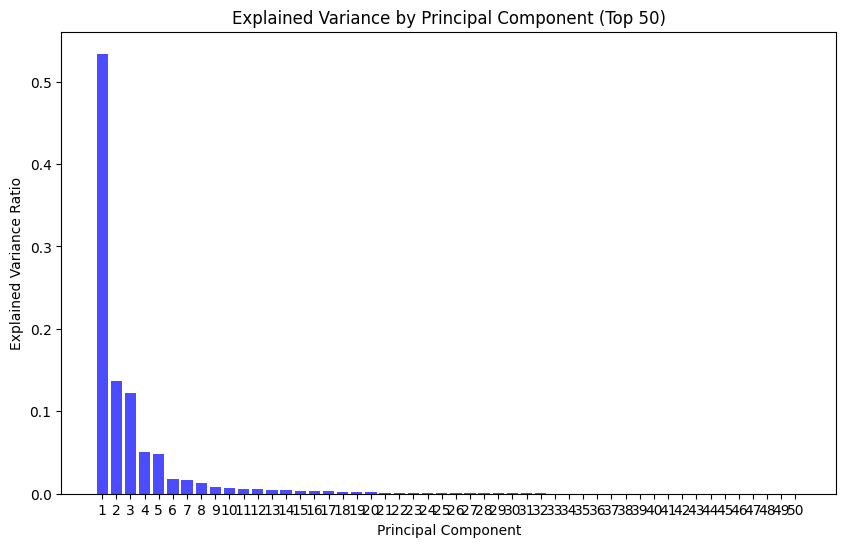

CLIENT:5
Epoch [1/1], Train Loss: 0.1900
Epoch 1: validation loss 0.09478533501044298
threshold:0.3218214325606823
Epoch [1/1], Train Loss: 0.1011
Epoch 2: validation loss 0.07860196260496592
threshold:0.2749253725633025
Epoch [1/1], Train Loss: 0.0841
Epoch 3: validation loss 0.06542785517298258
threshold:0.20258329436182976
Epoch [1/1], Train Loss: 0.0698
Epoch 4: validation loss 0.05715546084520144
threshold:0.18365604896098375
Epoch [1/1], Train Loss: 0.0623
Epoch 5: validation loss 0.05386285288020586
threshold:0.1236648578196764
exceed threshold proportion:0.0325
count_total:3200.0
exceed threshold proportion:0.999375
count_total:8000.0
FPR derived with OCSVM:0.045
TPR derived with OCSVM:1.0
False Positive Rate:0.0325
True Positive Rate:0.999375
benign_error:0.0536443891748786
attack_error:3.0973621001839637
roc_auc:0.9999


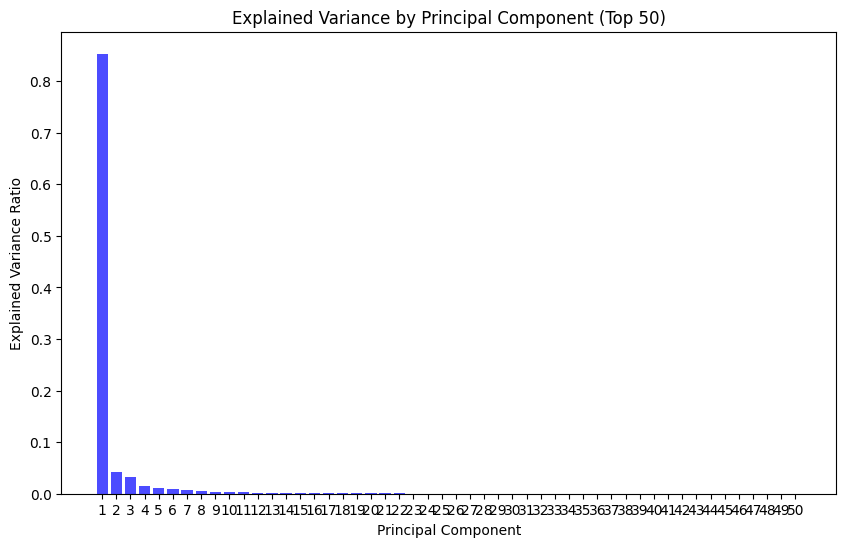

CLIENT:6
Epoch [1/1], Train Loss: 0.1316
Epoch 1: validation loss 0.061276136013941884
threshold:0.12720331735908985
Epoch [1/1], Train Loss: 0.0509
Epoch 2: validation loss 0.052291889908986214
threshold:0.13425734732300043
Epoch [1/1], Train Loss: 0.0376
Epoch 3: validation loss 0.04377362302098519
threshold:0.11888949014246464
Epoch [1/1], Train Loss: 0.0288
Epoch 4: validation loss 0.04159487055089229
threshold:0.13490857370197773
Epoch [1/1], Train Loss: 0.0264
Epoch 5: validation loss 0.03956858666661458
threshold:0.12409744644537568
exceed threshold proportion:0.07875
count_total:3200.0
exceed threshold proportion:0.99925
count_total:4000.0
FPR derived with OCSVM:0.133125
TPR derived with OCSVM:1.0
False Positive Rate:0.07875
True Positive Rate:0.99925
benign_error:0.07059161610901356
attack_error:6.811892200350761
roc_auc:0.9745


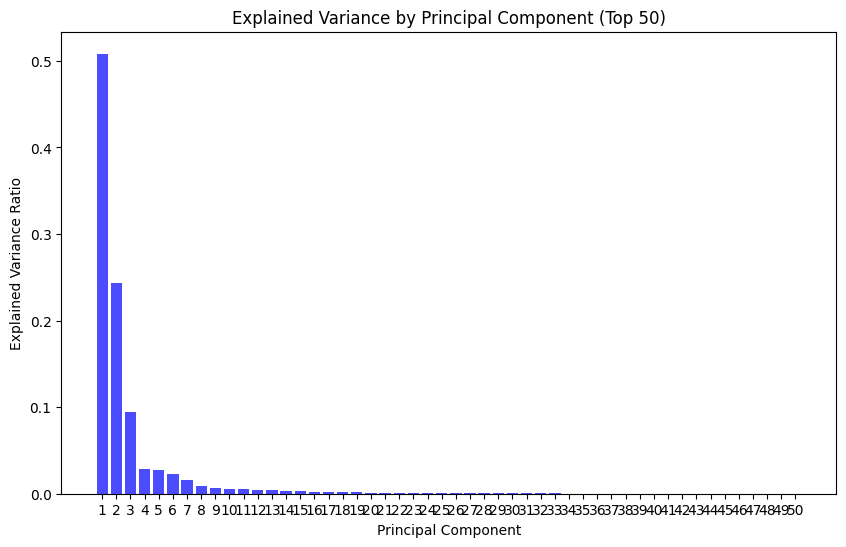

CLIENT:7
Epoch [1/1], Train Loss: 0.1793
Epoch 1: validation loss 0.05397932402407512
threshold:0.10189699567854404
Epoch [1/1], Train Loss: 0.0956
Epoch 2: validation loss 0.04775072725919577
threshold:0.08242735452950001
Epoch [1/1], Train Loss: 0.0852
Epoch 3: validation loss 0.04423676810394495
threshold:0.08050053473562002
Epoch [1/1], Train Loss: 0.0726
Epoch 4: validation loss 0.0381594907396879
threshold:0.0754319280385971
Epoch [1/1], Train Loss: 0.0589
Epoch 5: validation loss 0.027278772999460882
threshold:0.051113985013216734
exceed threshold proportion:0.24125
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.2296875
TPR derived with OCSVM:1.0
False Positive Rate:0.24125
True Positive Rate:1.0
benign_error:0.04381167707964778
attack_error:0.9184440172910691
roc_auc:0.9983


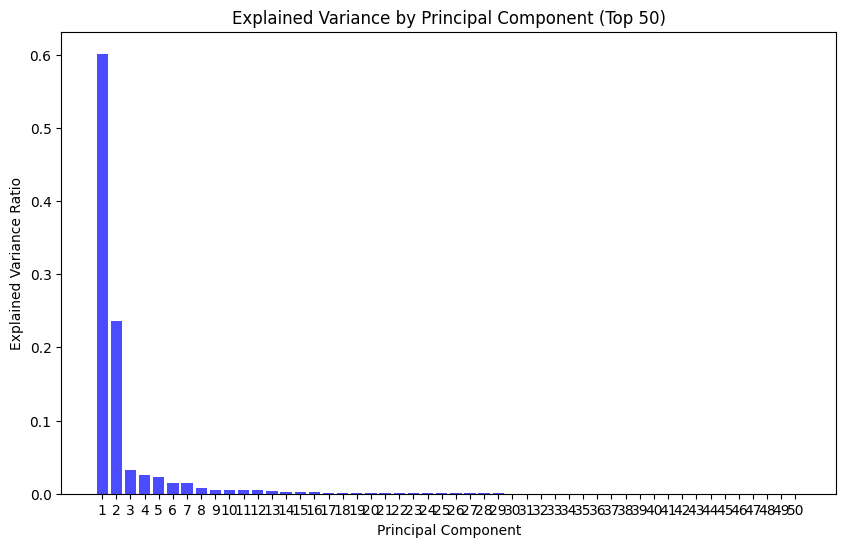

CLIENT:8
Epoch [1/1], Train Loss: 0.1146
Epoch 1: validation loss 0.04090352314404952
threshold:0.03952929237857461
Epoch [1/1], Train Loss: 0.0391
Epoch 2: validation loss 0.03791777044534683
threshold:0.021065732929855585
Epoch [1/1], Train Loss: 0.0373
Epoch 3: validation loss 0.03539757611086736
threshold:0.024798973463475704
Epoch [1/1], Train Loss: 0.0350
Epoch 4: validation loss 0.033048467233012885
threshold:0.020768440328538418
Epoch [1/1], Train Loss: 0.0329
Epoch 5: validation loss 0.040501059763706646
threshold:0.039237890392541885
exceed threshold proportion:0.069375
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.04
TPR derived with OCSVM:0.799
False Positive Rate:0.069375
True Positive Rate:1.0
benign_error:0.031595888510346413
attack_error:7.416636723577977
roc_auc:0.9979


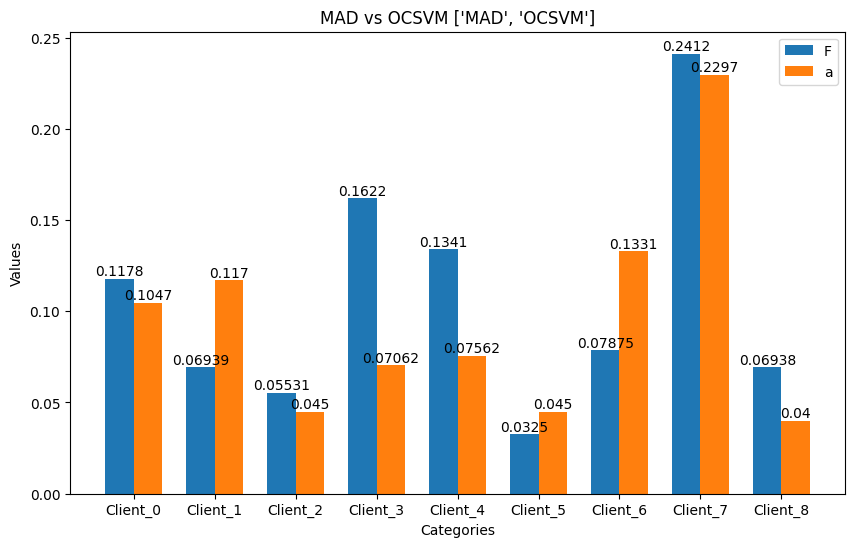

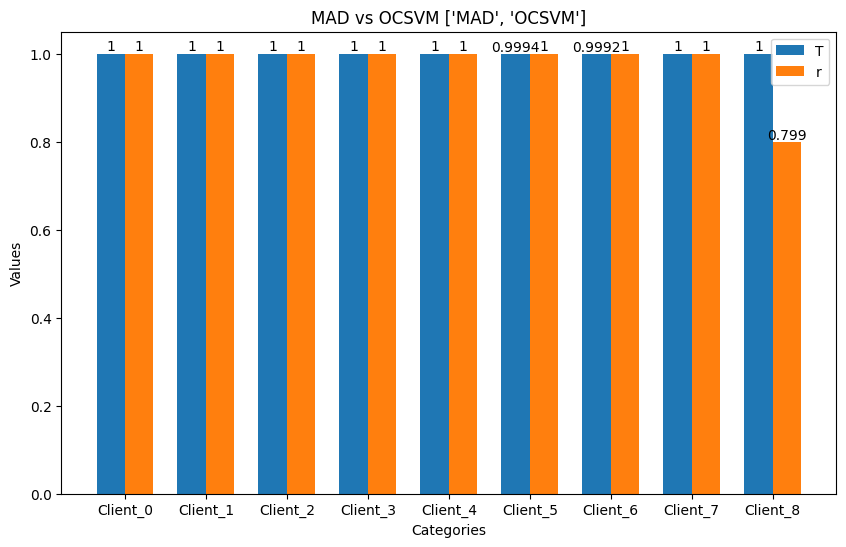

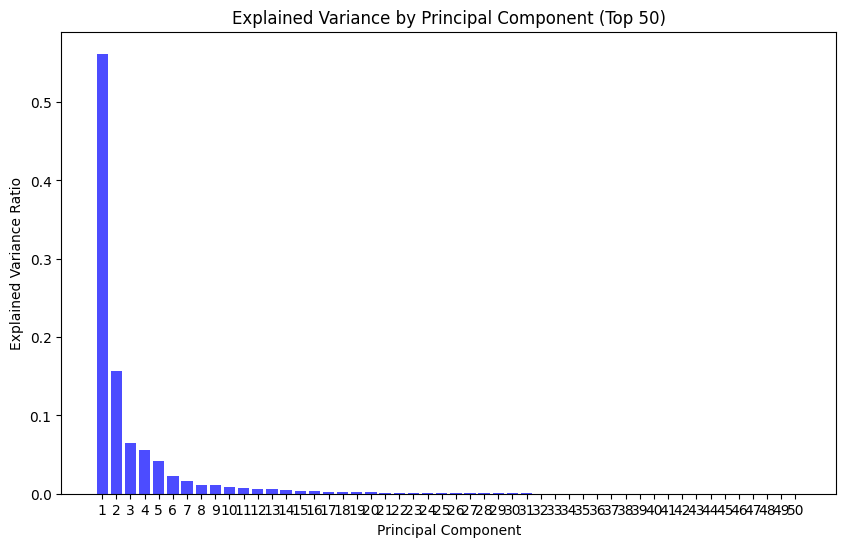

CLIENT:0
Epoch [1/1], Train Loss: 0.1237
Epoch 1: validation loss 0.06118542995208349
threshold:0.1439182385802269
Epoch [1/1], Train Loss: 0.0443
Epoch 2: validation loss 0.021796519242418117
threshold:0.06399071216583252
Epoch [1/1], Train Loss: 0.0268
Epoch 3: validation loss 0.017694925010586397
threshold:0.04611008055508137
Epoch [1/1], Train Loss: 0.0244
Epoch 4: validation loss 0.0166432468745953
threshold:0.042479013092815876
Epoch [1/1], Train Loss: 0.0230
Epoch 5: validation loss 0.015844958409284935
threshold:0.038345118053257465
exceed threshold proportion:0.074375
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.1109375
TPR derived with OCSVM:1.0
False Positive Rate:0.074375
True Positive Rate:1.0
benign_error:0.021583647960796953
attack_error:46.25467232179642
roc_auc:0.9979


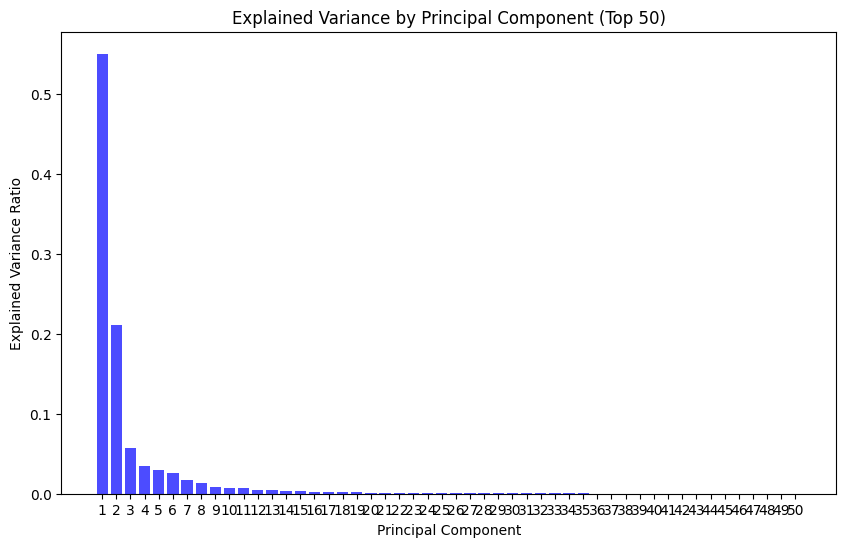

CLIENT:1
Epoch [1/1], Train Loss: 0.1504
Epoch 1: validation loss 0.07255407082740804
threshold:0.16281553357839584
Epoch [1/1], Train Loss: 0.0648
Epoch 2: validation loss 0.05399518708582264
threshold:0.15635297819972038
Epoch [1/1], Train Loss: 0.0548
Epoch 3: validation loss 0.048034888415025186
threshold:0.13188950344920158
Epoch [1/1], Train Loss: 0.0476
Epoch 4: validation loss 0.04188353411844572
threshold:0.11571257933974266
Epoch [1/1], Train Loss: 0.0416
Epoch 5: validation loss 0.03701402873418552
threshold:0.09536479692906141
exceed threshold proportion:0.03774304231795654
count_total:2623.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.12276019824628288
TPR derived with OCSVM:1.0
False Positive Rate:0.03774304231795654
True Positive Rate:1.0
benign_error:0.040461229382695654
attack_error:36.54439641034603
roc_auc:0.9995


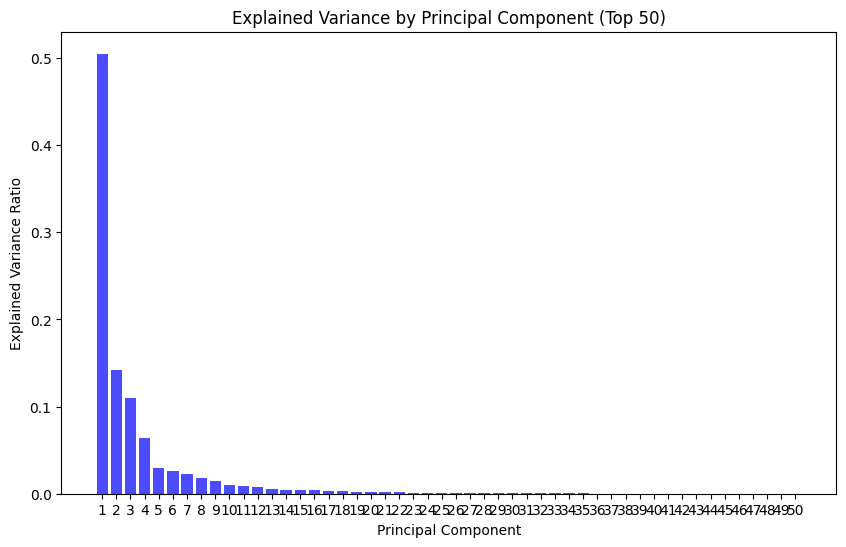

CLIENT:2
Epoch [1/1], Train Loss: 0.1793
Epoch 1: validation loss 288.6176515957293
threshold:0.22781158238649368
Epoch [1/1], Train Loss: 0.0871
Epoch 2: validation loss 288.5998352940648
threshold:0.21674567833542824
Epoch [1/1], Train Loss: 0.0699
Epoch 3: validation loss 288.5816799093706
threshold:0.1581968404352665
Epoch [1/1], Train Loss: 0.0551
Epoch 4: validation loss 288.57352653058865
threshold:0.1335160695016384
Epoch [1/1], Train Loss: 0.0490
Epoch 5: validation loss 288.56930864454273
threshold:0.1318144705146551
exceed threshold proportion:0.05375
count_total:3200.0
exceed threshold proportion:1.0
count_total:4000.0
FPR derived with OCSVM:0.0421875
TPR derived with OCSVM:1.0
False Positive Rate:0.05375
True Positive Rate:1.0
benign_error:562.6143714104966
attack_error:39.14370010316372
roc_auc:0.9855


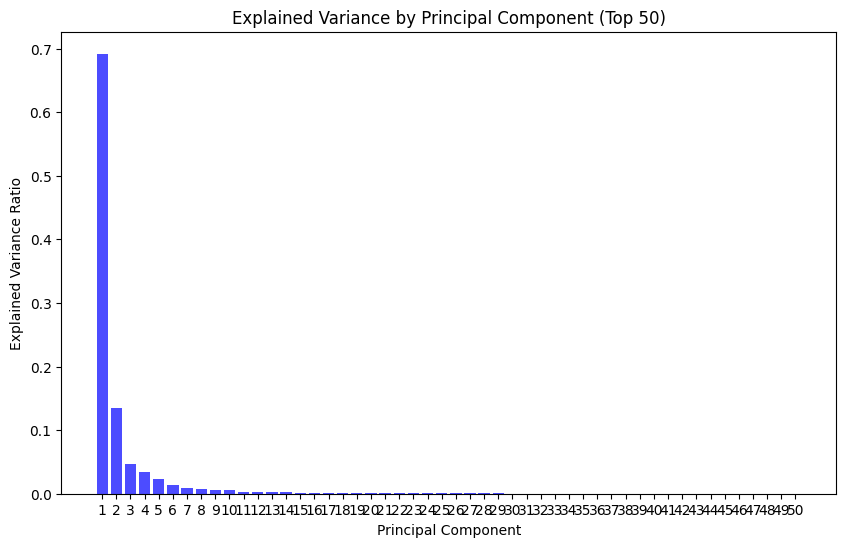

CLIENT:3
Epoch [1/1], Train Loss: 0.1576
Epoch 1: validation loss 0.023858410397019143
threshold:0.031984067521989346
Epoch [1/1], Train Loss: 0.1417
Epoch 2: validation loss 0.022896953739034824
threshold:0.03017934039235115
Epoch [1/1], Train Loss: 0.1067
Epoch 3: validation loss 0.02145812121243813
threshold:0.030395701061934233
Epoch [1/1], Train Loss: 0.0932
Epoch 4: validation loss 0.020249237764913303
threshold:0.02947693131864071
Epoch [1/1], Train Loss: 0.0739
Epoch 5: validation loss 0.019361796110677412
threshold:0.029073641169816256
exceed threshold proportion:0.144375
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.071875
TPR derived with OCSVM:1.0
False Positive Rate:0.144375
True Positive Rate:1.0
benign_error:0.022050066543743016
attack_error:1.5595397406220437
roc_auc:0.9995


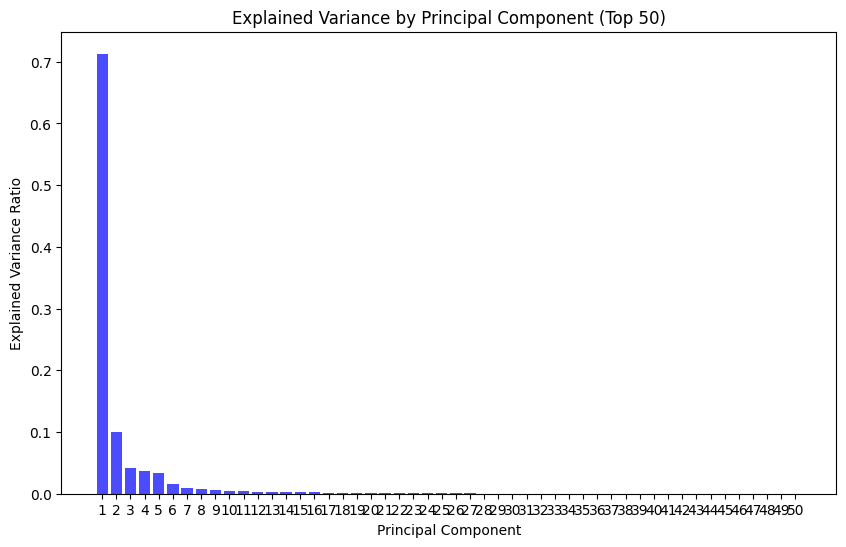

CLIENT:4
Epoch [1/1], Train Loss: 0.1750
Epoch 1: validation loss 0.07304535198670167
threshold:0.10480776056647301
Epoch [1/1], Train Loss: 0.0743
Epoch 2: validation loss 0.05813674480678179
threshold:0.11530965566635132
Epoch [1/1], Train Loss: 0.0665
Epoch 3: validation loss 0.050997335482866335
threshold:0.11064806580543518
Epoch [1/1], Train Loss: 0.0565
Epoch 4: validation loss 0.04292568128842574
threshold:0.09356733225286007
Epoch [1/1], Train Loss: 0.0512
Epoch 5: validation loss 0.04069441370666027
threshold:0.08762472588568926
exceed threshold proportion:0.1165625
count_total:3200.0
exceed threshold proportion:0.999875
count_total:8000.0
FPR derived with OCSVM:0.07125
TPR derived with OCSVM:1.0
False Positive Rate:0.1165625
True Positive Rate:0.999875
benign_error:0.04014736695215106
attack_error:2.3690654534697533
roc_auc:0.9999


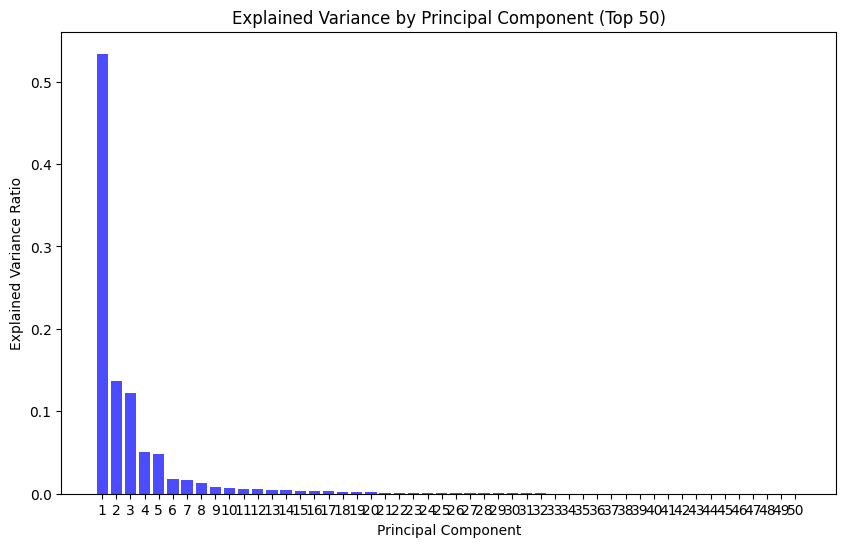

CLIENT:5
Epoch [1/1], Train Loss: 0.1977
Epoch 1: validation loss 0.09979660867307431
threshold:0.3543984666466713
Epoch [1/1], Train Loss: 0.1038
Epoch 2: validation loss 0.0802641353259484
threshold:0.338764201849699
Epoch [1/1], Train Loss: 0.0888
Epoch 3: validation loss 0.0699273113734447
threshold:0.2835276164114475
Epoch [1/1], Train Loss: 0.0749
Epoch 4: validation loss 0.06160661505583005
threshold:0.1964178830385208
Epoch [1/1], Train Loss: 0.0652
Epoch 5: validation loss 0.05439903475344181
threshold:0.18705309741199017
exceed threshold proportion:0.0015625
count_total:3200.0
exceed threshold proportion:0.997875
count_total:8000.0
FPR derived with OCSVM:0.0465625
TPR derived with OCSVM:1.0
False Positive Rate:0.0015625
True Positive Rate:0.997875
benign_error:0.05411753587424755
attack_error:3.097787231862545
roc_auc:0.9999


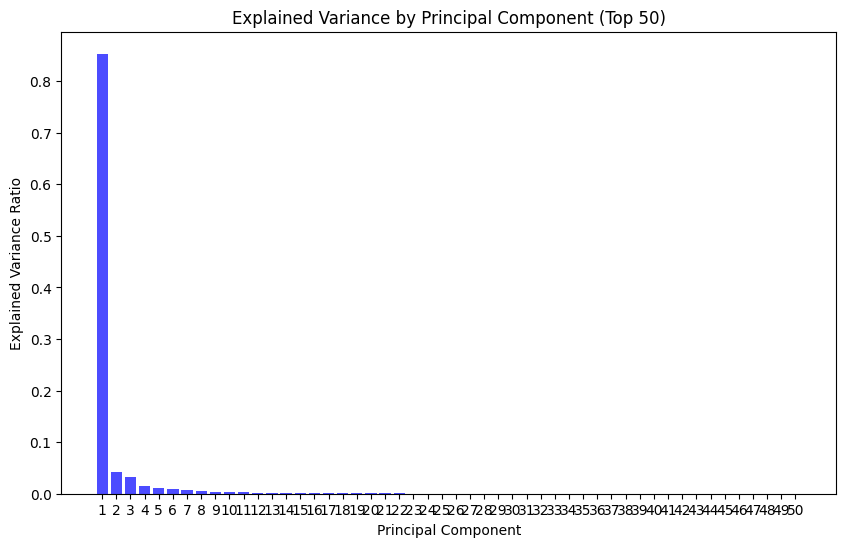

CLIENT:6
Epoch [1/1], Train Loss: 0.1334
Epoch 1: validation loss 0.05949700553065691
threshold:0.13757871836423874
Epoch [1/1], Train Loss: 0.0497
Epoch 2: validation loss 0.05250030054877966
threshold:0.1432191114872694
Epoch [1/1], Train Loss: 0.0373
Epoch 3: validation loss 0.04349648157755534
threshold:0.13543427549302578
Epoch [1/1], Train Loss: 0.0280
Epoch 4: validation loss 0.040991292530909565
threshold:0.14913159981369972
Epoch [1/1], Train Loss: 0.0258
Epoch 5: validation loss 0.03935375871757666
threshold:0.14232640247792006
exceed threshold proportion:0.0725
count_total:3200.0
exceed threshold proportion:0.999
count_total:4000.0
FPR derived with OCSVM:0.13625
TPR derived with OCSVM:1.0
False Positive Rate:0.0725
True Positive Rate:0.999
benign_error:0.06858619442209601
attack_error:6.7575926948785785
roc_auc:0.9750


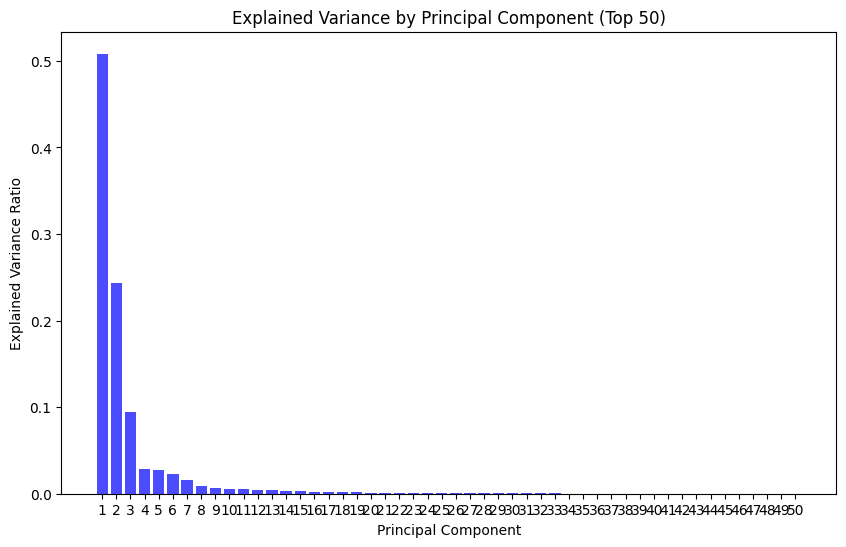

CLIENT:7
Epoch [1/1], Train Loss: 0.1728
Epoch 1: validation loss 0.052705357882838984
threshold:0.11434592679142952
Epoch [1/1], Train Loss: 0.0937
Epoch 2: validation loss 0.04732871607710153
threshold:0.0913764564320445
Epoch [1/1], Train Loss: 0.0854
Epoch 3: validation loss 0.04508611014447151
threshold:0.09267472568899393
Epoch [1/1], Train Loss: 0.0745
Epoch 4: validation loss 0.040130065801816106
threshold:0.09275498706847429
Epoch [1/1], Train Loss: 0.0620
Epoch 5: validation loss 0.03327252057691415
threshold:0.08365571405738592
exceed threshold proportion:0.1528125
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.2025
TPR derived with OCSVM:1.0
False Positive Rate:0.1528125
True Positive Rate:1.0
benign_error:0.04884897949174047
attack_error:0.9187157510519027
roc_auc:0.9975


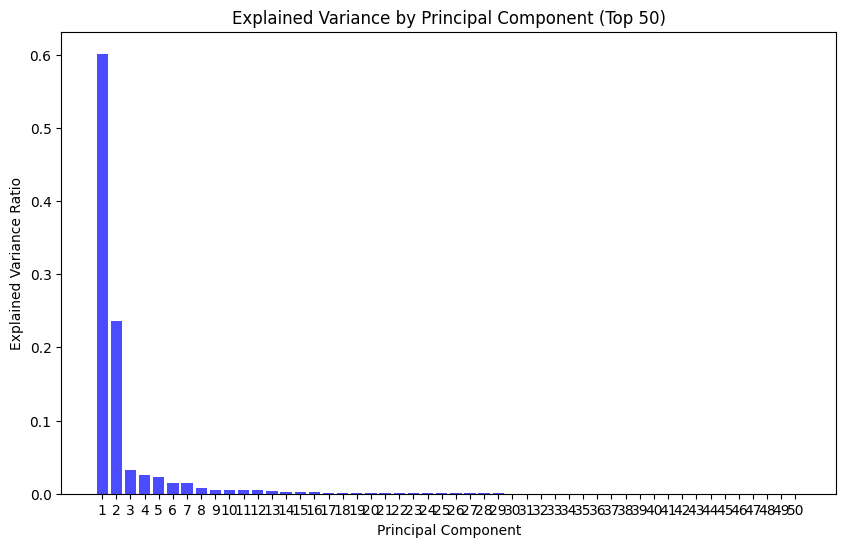

CLIENT:8
Epoch [1/1], Train Loss: 0.1175
Epoch 1: validation loss 0.041098277041545284
threshold:0.0465554166585207
Epoch [1/1], Train Loss: 0.0392
Epoch 2: validation loss 0.03827582441079311
threshold:0.02488864865154028
Epoch [1/1], Train Loss: 0.0377
Epoch 3: validation loss 0.03494087422791964
threshold:0.02214327221736312
Epoch [1/1], Train Loss: 0.0354
Epoch 4: validation loss 0.0325609205959317
threshold:0.021823983173817396
Epoch [1/1], Train Loss: 0.0332
Epoch 5: validation loss 0.031743315215676256
threshold:0.022488065995275974
exceed threshold proportion:0.0884375
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.0396875
TPR derived with OCSVM:0.998125
False Positive Rate:0.0884375
True Positive Rate:1.0
benign_error:0.022680772189050912
attack_error:7.370847671329975
roc_auc:0.9970


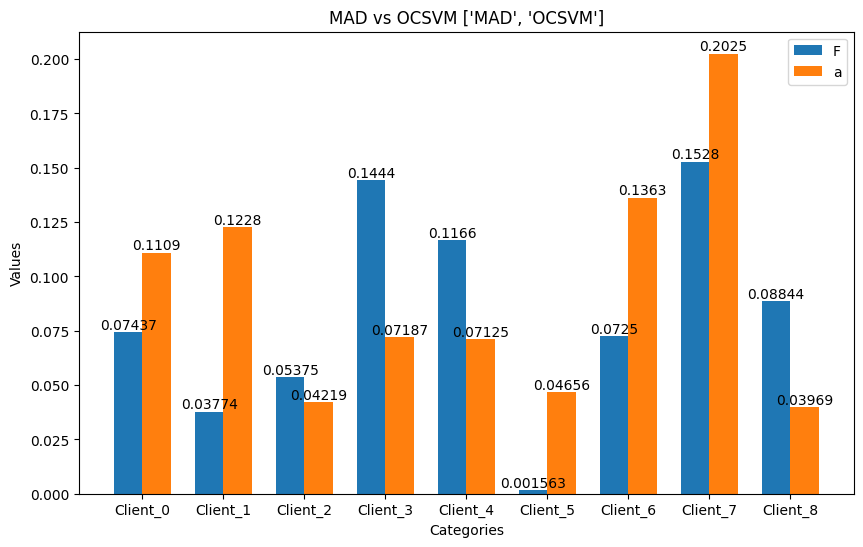

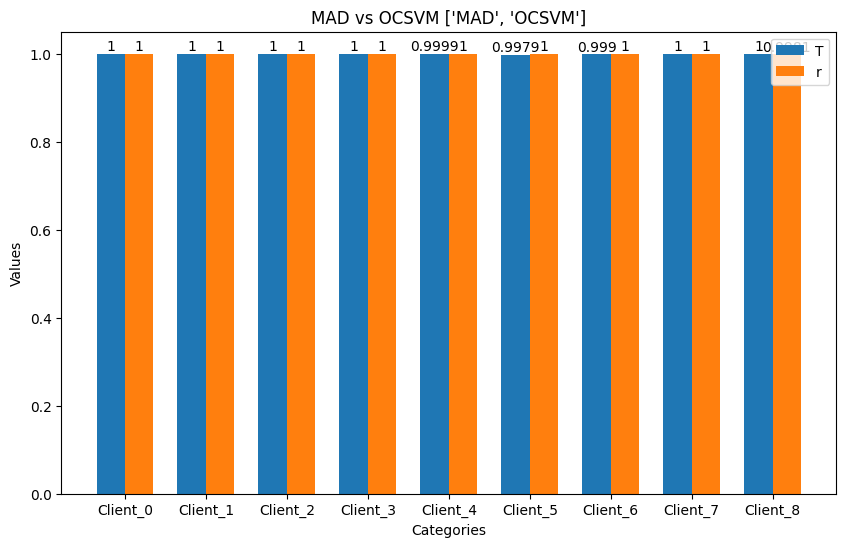

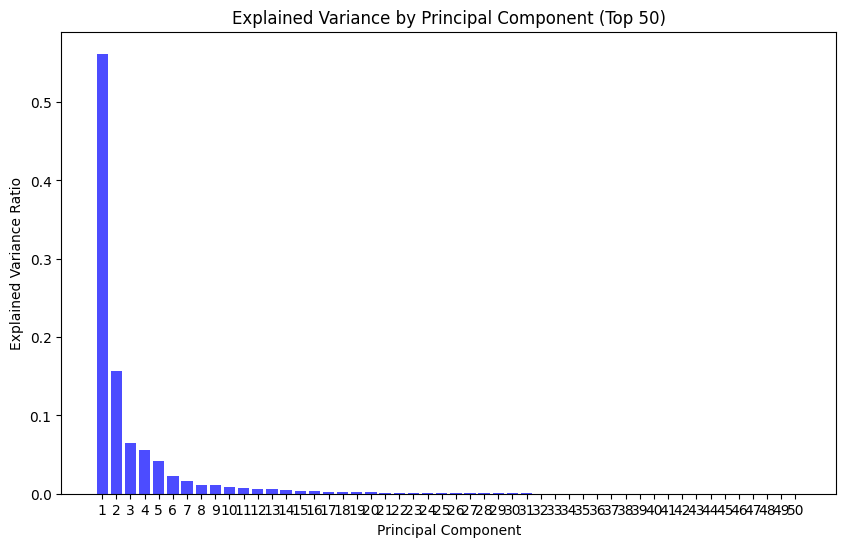

CLIENT:0
Epoch [1/1], Train Loss: 0.1285
Epoch 1: validation loss 0.05799166011886719
threshold:0.1425102110952139
Epoch [1/1], Train Loss: 0.0416
Epoch 2: validation loss 0.024050063935992044
threshold:0.08817902766168118
Epoch [1/1], Train Loss: 0.0285
Epoch 3: validation loss 0.018563532423323547
threshold:0.0506991446018219
Epoch [1/1], Train Loss: 0.0238
Epoch 4: validation loss 0.01648107964832049
threshold:0.04667082545347512
Epoch [1/1], Train Loss: 0.0221
Epoch 5: validation loss 0.015549352812843444
threshold:0.04519963706843555
exceed threshold proportion:0.0603125
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.1
TPR derived with OCSVM:1.0
False Positive Rate:0.0603125
True Positive Rate:1.0
benign_error:0.020887272944673897
attack_error:46.21800599634648
roc_auc:0.9985


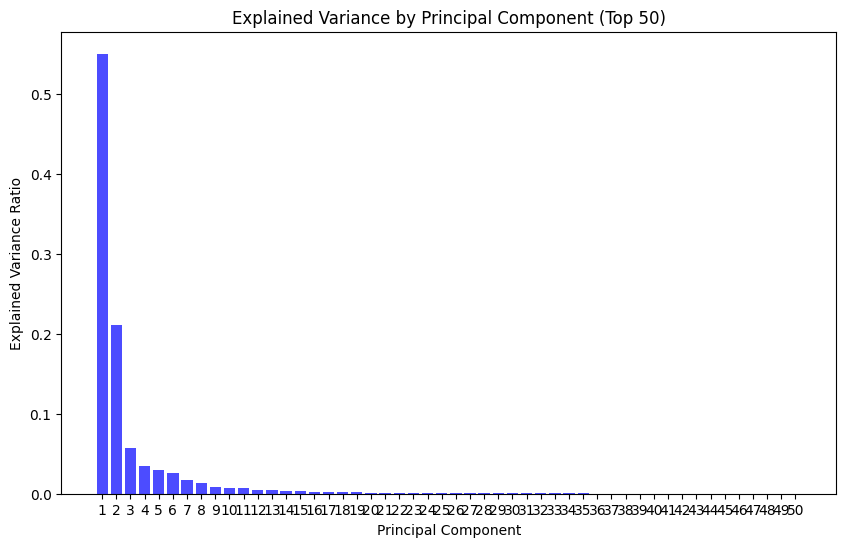

CLIENT:1
Epoch [1/1], Train Loss: 0.1529
Epoch 1: validation loss 0.07639593321875199
threshold:0.18731050938367844
Epoch [1/1], Train Loss: 0.0690
Epoch 2: validation loss 0.055434745086279054
threshold:0.17805372178554535
Epoch [1/1], Train Loss: 0.0545
Epoch 3: validation loss 0.04612406569623742
threshold:0.13977174274623394
Epoch [1/1], Train Loss: 0.0451
Epoch 4: validation loss 0.03833036530889661
threshold:0.10252782702445984
Epoch [1/1], Train Loss: 0.0391
Epoch 5: validation loss 0.03431494012445876
threshold:0.09132283553481102
exceed threshold proportion:0.036218070911170415
count_total:2623.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.11246664125047655
TPR derived with OCSVM:1.0
False Positive Rate:0.036218070911170415
True Positive Rate:1.0
benign_error:0.03782827464215318
attack_error:36.50429595023394
roc_auc:0.9996


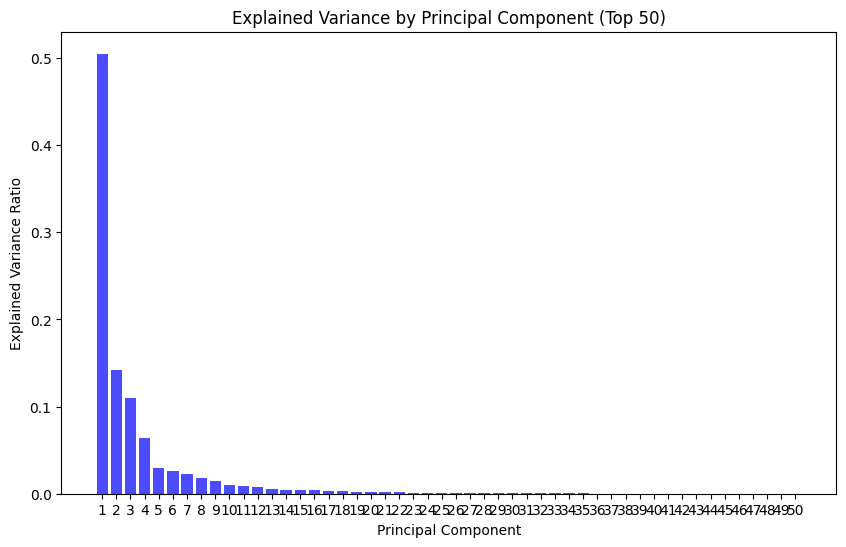

CLIENT:2
Epoch [1/1], Train Loss: 0.1727
Epoch 1: validation loss 288.61650998355486
threshold:0.2475316971540451
Epoch [1/1], Train Loss: 0.0874
Epoch 2: validation loss 288.5986611092702
threshold:0.23143943212926388
Epoch [1/1], Train Loss: 0.0716
Epoch 3: validation loss 288.5906306764063
threshold:0.21854912675917149
Epoch [1/1], Train Loss: 0.0604
Epoch 4: validation loss 288.5753679834402
threshold:0.15173522755503654
Epoch [1/1], Train Loss: 0.0503
Epoch 5: validation loss 288.5695515055878
threshold:0.14452732913196087
exceed threshold proportion:0.03875
count_total:3200.0
exceed threshold proportion:1.0
count_total:4000.0
FPR derived with OCSVM:0.0425
TPR derived with OCSVM:1.0
False Positive Rate:0.03875
True Positive Rate:1.0
benign_error:562.6140673707054
attack_error:39.11917982411384
roc_auc:0.9853


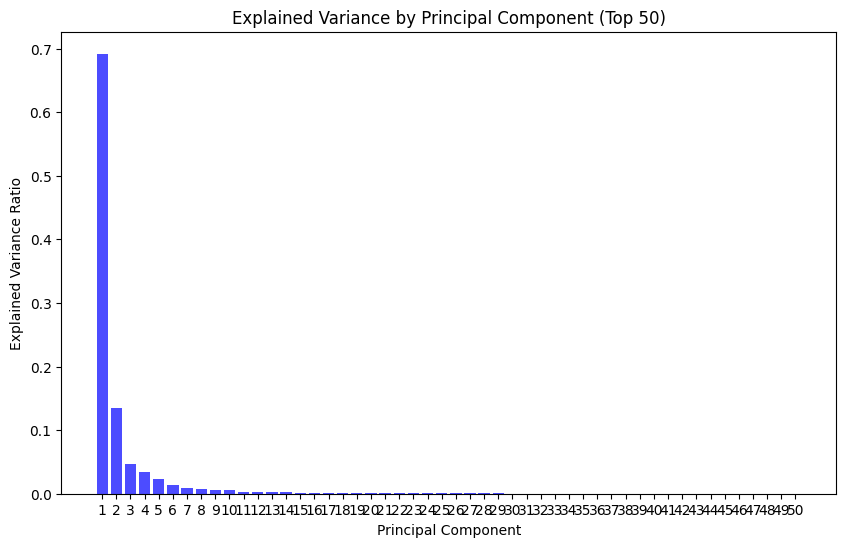

CLIENT:3
Epoch [1/1], Train Loss: 0.1503
Epoch 1: validation loss 0.024054949272137423
threshold:0.034299247432500124
Epoch [1/1], Train Loss: 0.1303
Epoch 2: validation loss 0.02263414982992869
threshold:0.03360977163538337
Epoch [1/1], Train Loss: 0.0919
Epoch 3: validation loss 0.02084422291089327
threshold:0.033746783155947924
Epoch [1/1], Train Loss: 0.0728
Epoch 4: validation loss 0.020542323192915855
threshold:0.03324494371190667
Epoch [1/1], Train Loss: 0.0695
Epoch 5: validation loss 0.019373947515701637
threshold:0.03243005555123091
exceed threshold proportion:0.12875
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.07125
TPR derived with OCSVM:1.0
False Positive Rate:0.12875
True Positive Rate:1.0
benign_error:0.022157434839755297
attack_error:1.5324415184855462
roc_auc:0.9996


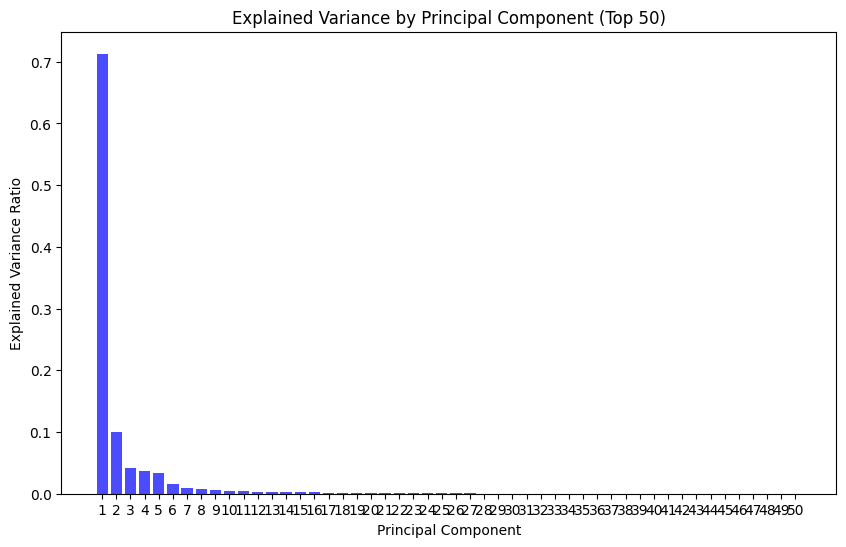

CLIENT:4
Epoch [1/1], Train Loss: 0.1646
Epoch 1: validation loss 0.06929072826527632
threshold:0.1191497789695859
Epoch [1/1], Train Loss: 0.0735
Epoch 2: validation loss 0.06023975300292174
threshold:0.1193163339048624
Epoch [1/1], Train Loss: 0.0638
Epoch 3: validation loss 0.049370893215139704
threshold:0.1211239155381918
Epoch [1/1], Train Loss: 0.0537
Epoch 4: validation loss 0.044102802719825356
threshold:0.1044121733866632
Epoch [1/1], Train Loss: 0.0486
Epoch 5: validation loss 0.03721628853907952
threshold:0.09470391413196921
exceed threshold proportion:0.059375
count_total:3200.0
exceed threshold proportion:0.9995
count_total:8000.0
FPR derived with OCSVM:0.0675
TPR derived with OCSVM:1.0
False Positive Rate:0.059375
True Positive Rate:0.9995
benign_error:0.03684517415240407
attack_error:2.369051154792309
roc_auc:0.9999


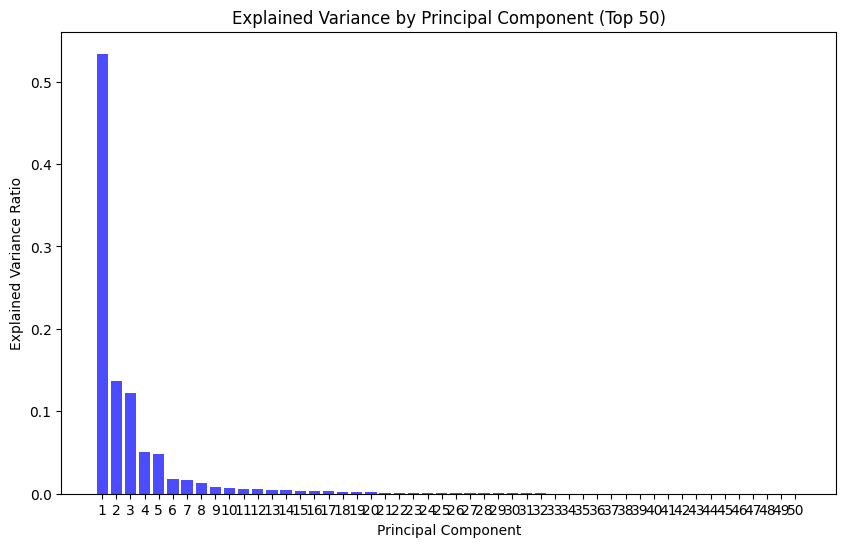

CLIENT:5
Epoch [1/1], Train Loss: 0.1874
Epoch 1: validation loss 0.10095475468880091
threshold:0.3783550886437297
Epoch [1/1], Train Loss: 0.1051
Epoch 2: validation loss 0.08131798917475419
threshold:0.3855604436248541
Epoch [1/1], Train Loss: 0.0858
Epoch 3: validation loss 0.07037867607596593
threshold:0.18594344705343246
Epoch [1/1], Train Loss: 0.0693
Epoch 4: validation loss 0.05780999845801256
threshold:0.20118108484894037
Epoch [1/1], Train Loss: 0.0618
Epoch 5: validation loss 0.05150297509554105
threshold:0.18864504247903824
exceed threshold proportion:0.00125
count_total:3200.0
exceed threshold proportion:0.997875
count_total:8000.0
FPR derived with OCSVM:0.049375
TPR derived with OCSVM:1.0
False Positive Rate:0.00125
True Positive Rate:0.997875
benign_error:0.05148665279150009
attack_error:3.0949189472794534
roc_auc:0.9999


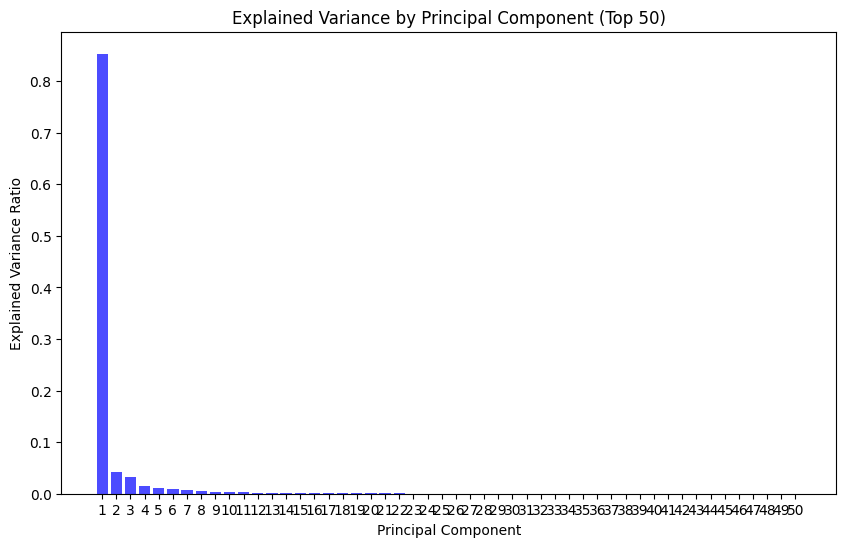

CLIENT:6
Epoch [1/1], Train Loss: 0.1336
Epoch 1: validation loss 0.06440520915083396
threshold:0.16575872898101807
Epoch [1/1], Train Loss: 0.0530
Epoch 2: validation loss 0.05421210622940308
threshold:0.15059318579733372
Epoch [1/1], Train Loss: 0.0381
Epoch 3: validation loss 0.04398597933543034
threshold:0.1323536355048418
Epoch [1/1], Train Loss: 0.0293
Epoch 4: validation loss 0.041240054273452516
threshold:0.1448110118508339
Epoch [1/1], Train Loss: 0.0264
Epoch 5: validation loss 0.03910975687396832
threshold:0.13989342376589775
exceed threshold proportion:0.0725
count_total:3200.0
exceed threshold proportion:0.999
count_total:4000.0
FPR derived with OCSVM:0.1359375
TPR derived with OCSVM:1.0
False Positive Rate:0.0725
True Positive Rate:0.999
benign_error:0.06854710523039102
attack_error:6.762942547798157
roc_auc:0.9748


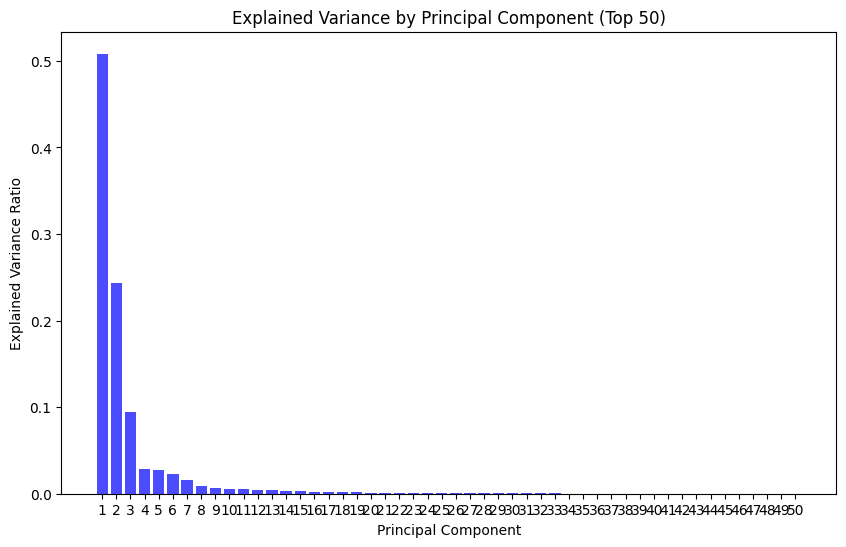

CLIENT:7
Epoch [1/1], Train Loss: 0.1695
Epoch 1: validation loss 0.052298508355250725
threshold:0.12411550898104906
Epoch [1/1], Train Loss: 0.0920
Epoch 2: validation loss 0.04575716387002896
threshold:0.09853976406157017
Epoch [1/1], Train Loss: 0.0810
Epoch 3: validation loss 0.04030087378162604
threshold:0.0890877265483141
Epoch [1/1], Train Loss: 0.0663
Epoch 4: validation loss 0.03016578606688059
threshold:0.05815649498254061
Epoch [1/1], Train Loss: 0.0543
Epoch 5: validation loss 0.025135641186856305
threshold:0.056088374461978674
exceed threshold proportion:0.204375
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.2234375
TPR derived with OCSVM:1.0
False Positive Rate:0.204375
True Positive Rate:1.0
benign_error:0.041481101540848615
attack_error:0.9201894410848618
roc_auc:0.9978


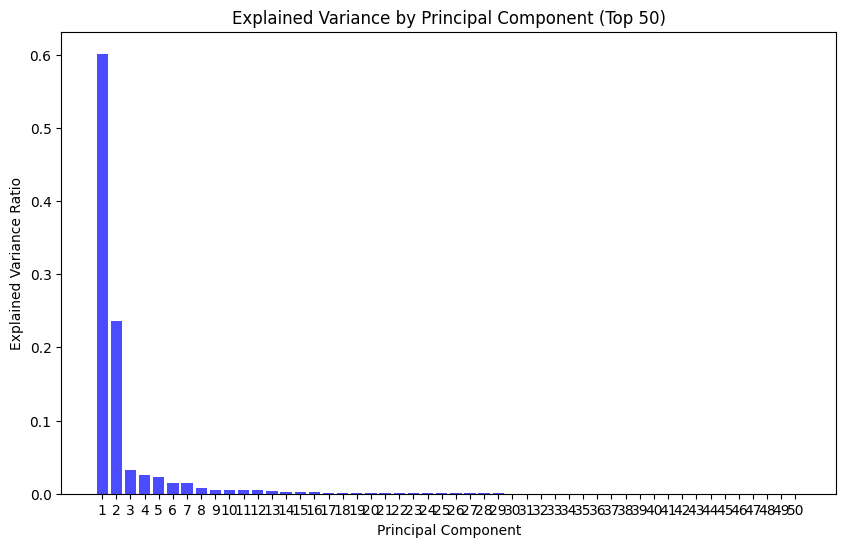

CLIENT:8
Epoch [1/1], Train Loss: 0.1268
Epoch 1: validation loss 0.043710453636371174
threshold:0.04674979764968157
Epoch [1/1], Train Loss: 0.0393
Epoch 2: validation loss 0.038961822128830814
threshold:0.028150369878858328
Epoch [1/1], Train Loss: 0.0376
Epoch 3: validation loss 0.035096901669525185
threshold:0.023556706495583057
Epoch [1/1], Train Loss: 0.0354
Epoch 4: validation loss 0.03333843536197375
threshold:0.02223371807485819
Epoch [1/1], Train Loss: 0.0336
Epoch 5: validation loss 0.034755034787723654
threshold:0.029722988605499268
exceed threshold proportion:0.076875
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.0403125
TPR derived with OCSVM:0.998125
False Positive Rate:0.076875
True Positive Rate:1.0
benign_error:0.025527717405930163
attack_error:7.444245030581951
roc_auc:0.9962


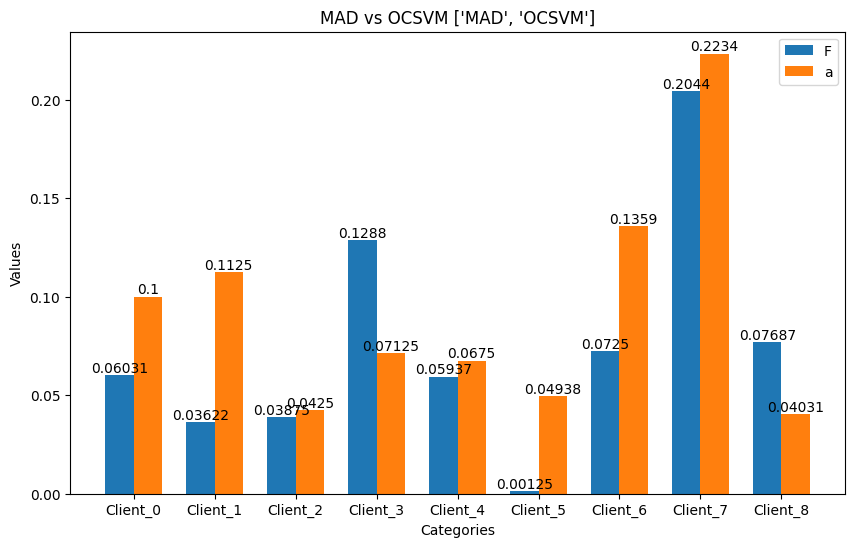

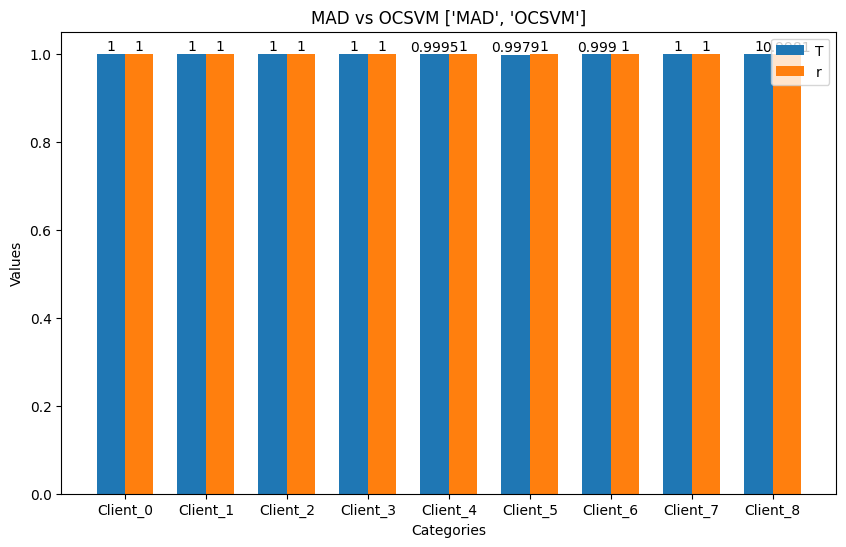

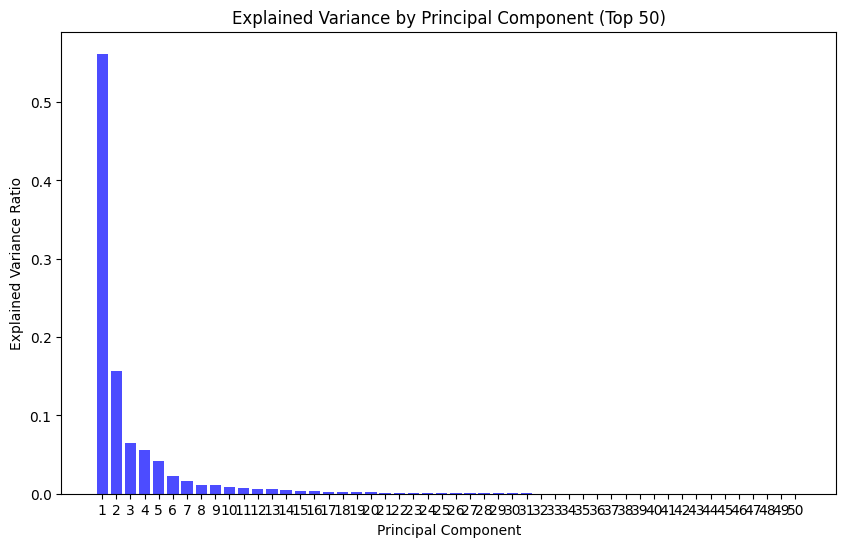

CLIENT:0
Epoch [1/1], Train Loss: 0.1253
Epoch 1: validation loss 0.056923694087144656
threshold:0.143010001629591
Epoch [1/1], Train Loss: 0.0406
Epoch 2: validation loss 0.024066358336653465
threshold:0.09166742395609617
Epoch [1/1], Train Loss: 0.0295
Epoch 3: validation loss 0.01882487373569837
threshold:0.0626848079264164
Epoch [1/1], Train Loss: 0.0244
Epoch 4: validation loss 0.016821571902777905
threshold:0.050704154185950756
Epoch [1/1], Train Loss: 0.0228
Epoch 5: validation loss 0.015908457993123775
threshold:0.047006895300000906
exceed threshold proportion:0.0625
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.0990625
TPR derived with OCSVM:1.0
False Positive Rate:0.0625
True Positive Rate:1.0
benign_error:0.021254446497187017
attack_error:46.22225424915552
roc_auc:0.9980


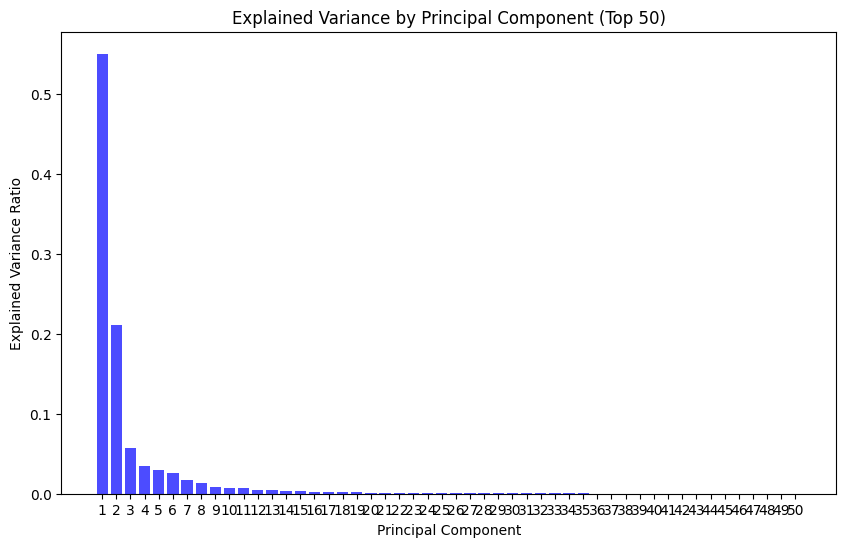

CLIENT:1
Epoch [1/1], Train Loss: 0.1511
Epoch 1: validation loss 0.07774572466610463
threshold:0.22442368790507317
Epoch [1/1], Train Loss: 0.0677
Epoch 2: validation loss 0.05488150673169944
threshold:0.19729052484035492
Epoch [1/1], Train Loss: 0.0547
Epoch 3: validation loss 0.04864385781178122
threshold:0.1626432090997696
Epoch [1/1], Train Loss: 0.0488
Epoch 4: validation loss 0.043318156763404246
threshold:0.1378153208643198
Epoch [1/1], Train Loss: 0.0437
Epoch 5: validation loss 0.03896286180348521
threshold:0.11713515035808086
exceed threshold proportion:0.020968356843309187
count_total:2623.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.12237895539458635
TPR derived with OCSVM:0.801625
False Positive Rate:0.020968356843309187
True Positive Rate:1.0
benign_error:0.042916383945073876
attack_error:36.53586267328262
roc_auc:0.9990


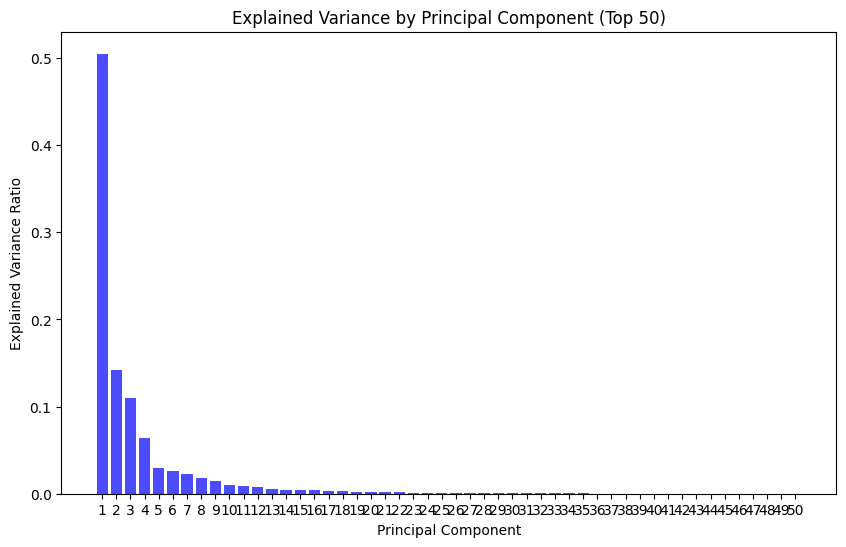

CLIENT:2
Epoch [1/1], Train Loss: 0.1766
Epoch 1: validation loss 288.6168382223409
threshold:0.2793419137597084
Epoch [1/1], Train Loss: 0.0853
Epoch 2: validation loss 288.59689660076145
threshold:0.2497861683368683
Epoch [1/1], Train Loss: 0.0668
Epoch 3: validation loss 288.58058648262266
threshold:0.19300414994359016
Epoch [1/1], Train Loss: 0.0538
Epoch 4: validation loss 288.57224146727566
threshold:0.1585452165454626
Epoch [1/1], Train Loss: 0.0477
Epoch 5: validation loss 288.56864920866985
threshold:0.1501971185207367
exceed threshold proportion:0.0371875
count_total:3200.0
exceed threshold proportion:1.0
count_total:4000.0
FPR derived with OCSVM:0.0409375
TPR derived with OCSVM:0.99975
False Positive Rate:0.0371875
True Positive Rate:1.0
benign_error:562.6139285907894
attack_error:39.126394211649895
roc_auc:0.9853


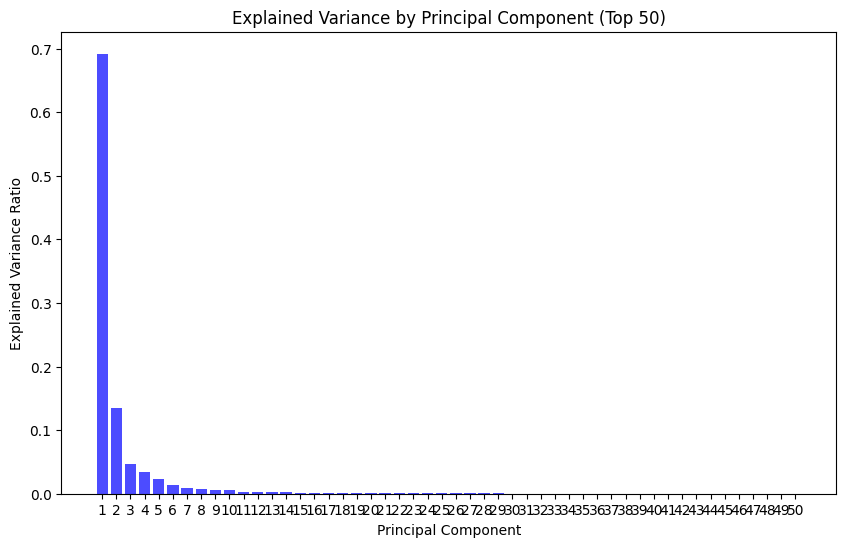

CLIENT:3
Epoch [1/1], Train Loss: 0.1564
Epoch 1: validation loss 0.023884411777059238
threshold:0.038684893399477005
Epoch [1/1], Train Loss: 0.1346
Epoch 2: validation loss 0.02260488484723446
threshold:0.03712291829288006
Epoch [1/1], Train Loss: 0.1024
Epoch 3: validation loss 0.02143937623462616
threshold:0.03629129473119974
Epoch [1/1], Train Loss: 0.0847
Epoch 4: validation loss 0.020025593605943214
threshold:0.03644894855096936
Epoch [1/1], Train Loss: 0.0714
Epoch 5: validation loss 0.01957804387769638
threshold:0.035763425286859274
exceed threshold proportion:0.1190625
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.071875
TPR derived with OCSVM:1.0
False Positive Rate:0.1190625
True Positive Rate:1.0
benign_error:0.022298361463472246
attack_error:1.5306808693408966
roc_auc:0.9995


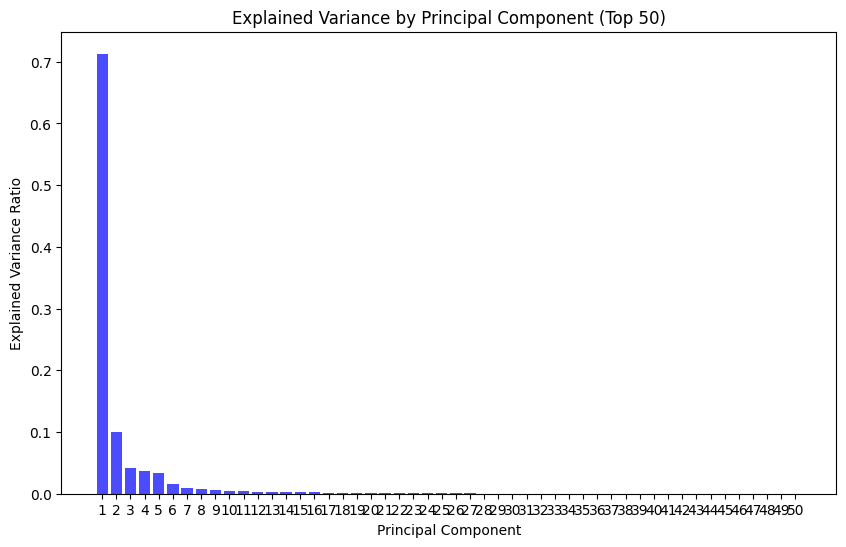

CLIENT:4
Epoch [1/1], Train Loss: 0.1707
Epoch 1: validation loss 0.06606216959846326
threshold:0.13516498357057571
Epoch [1/1], Train Loss: 0.0725
Epoch 2: validation loss 0.057297418237878726
threshold:0.14158053416758776
Epoch [1/1], Train Loss: 0.0651
Epoch 3: validation loss 0.049281875970654
threshold:0.1428529480472207
Epoch [1/1], Train Loss: 0.0540
Epoch 4: validation loss 0.041102497881421673
threshold:0.117951774969697
Epoch [1/1], Train Loss: 0.0486
Epoch 5: validation loss 0.03742873586523227
threshold:0.10008511692285538
exceed threshold proportion:0.0515625
count_total:3200.0
exceed threshold proportion:0.999125
count_total:8000.0
FPR derived with OCSVM:0.08
TPR derived with OCSVM:1.0
False Positive Rate:0.0515625
True Positive Rate:0.999125
benign_error:0.037252922058105466
attack_error:2.36910564494133
roc_auc:0.9999


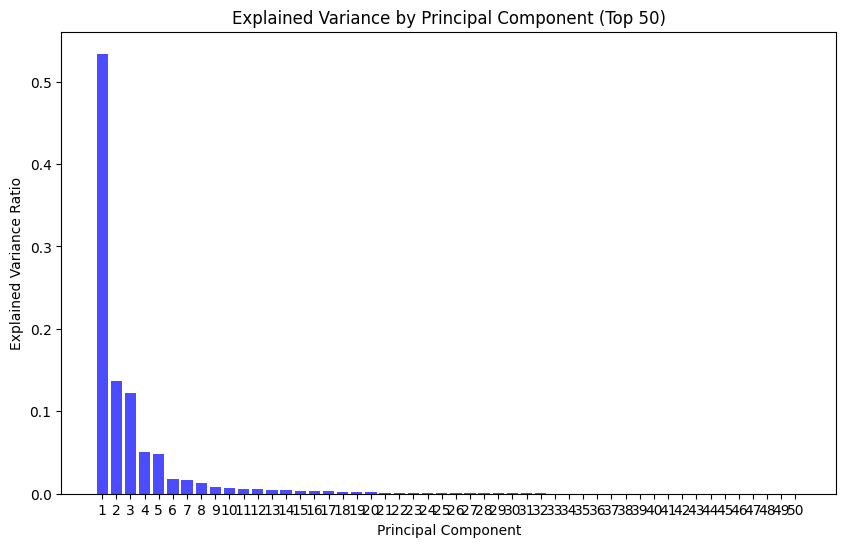

CLIENT:5
Epoch [1/1], Train Loss: 0.1960
Epoch 1: validation loss 0.10877565439694967
threshold:0.45921147614717484
Epoch [1/1], Train Loss: 0.1086
Epoch 2: validation loss 0.08388001767870708
threshold:0.42356760054826736
Epoch [1/1], Train Loss: 0.0903
Epoch 3: validation loss 0.07234494142616406
threshold:0.2946936674416065
Epoch [1/1], Train Loss: 0.0741
Epoch 4: validation loss 0.06275168112837351
threshold:0.2552530113607645
Epoch [1/1], Train Loss: 0.0653
Epoch 5: validation loss 0.05461674862756179
threshold:0.22647764347493649
exceed threshold proportion:0.0
count_total:3200.0
exceed threshold proportion:0.79225
count_total:8000.0
FPR derived with OCSVM:0.0453125
TPR derived with OCSVM:1.0
False Positive Rate:0.0
True Positive Rate:0.79225
benign_error:0.054307773597538474
attack_error:3.0989108921289445
roc_auc:0.9999


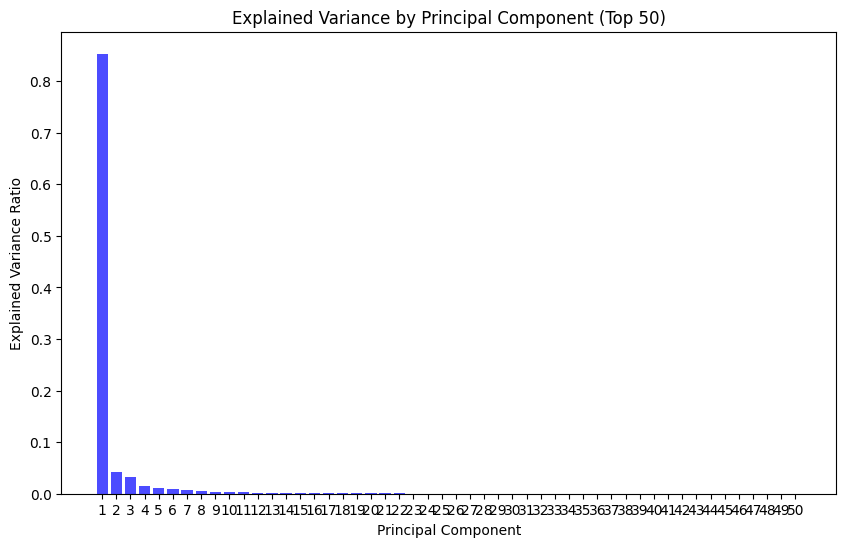

CLIENT:6
Epoch [1/1], Train Loss: 0.1360
Epoch 1: validation loss 0.06481897882544077
threshold:0.2023704331368208
Epoch [1/1], Train Loss: 0.0491
Epoch 2: validation loss 0.04867919445610963
threshold:0.17302514798939228
Epoch [1/1], Train Loss: 0.0326
Epoch 3: validation loss 0.04184277435907951
threshold:0.17817305214703083
Epoch [1/1], Train Loss: 0.0272
Epoch 4: validation loss 0.038493529095863684
threshold:0.16982395760715008
Epoch [1/1], Train Loss: 0.0249
Epoch 5: validation loss 0.03557865802103128
threshold:0.1399317029863596
exceed threshold proportion:0.0740625
count_total:3200.0
exceed threshold proportion:0.999
count_total:4000.0
FPR derived with OCSVM:0.1325
TPR derived with OCSVM:1.0
False Positive Rate:0.0740625
True Positive Rate:0.999
benign_error:0.06522710595279932
attack_error:6.706920718431473
roc_auc:0.9751


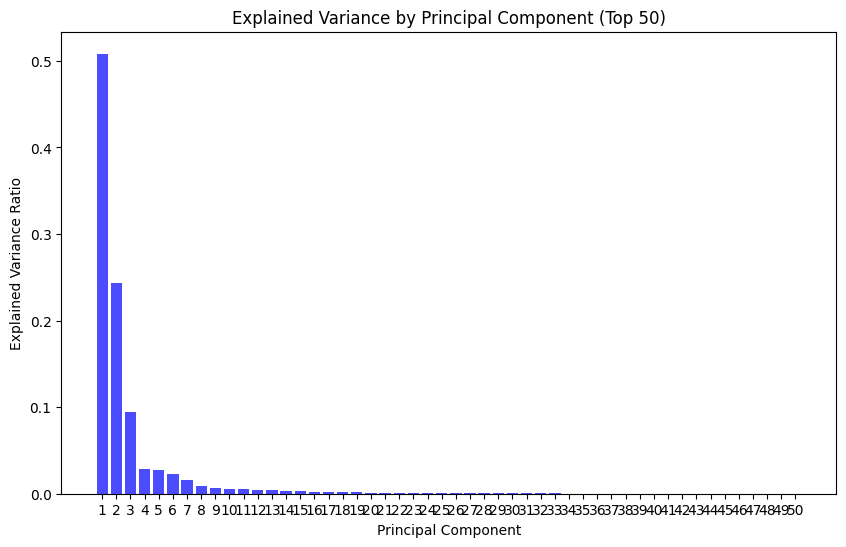

CLIENT:7
Epoch [1/1], Train Loss: 0.1812
Epoch 1: validation loss 0.052393681068833055
threshold:0.13635464943945408
Epoch [1/1], Train Loss: 0.0939
Epoch 2: validation loss 0.047396924547277966
threshold:0.11236522160470486
Epoch [1/1], Train Loss: 0.0838
Epoch 3: validation loss 0.0446194619513475
threshold:0.10886847320944071
Epoch [1/1], Train Loss: 0.0703
Epoch 4: validation loss 0.03746768124401569
threshold:0.08715506829321384
Epoch [1/1], Train Loss: 0.0575
Epoch 5: validation loss 0.027999001359328247
threshold:0.05656552314758301
exceed threshold proportion:0.244375
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.23875
TPR derived with OCSVM:1.0
False Positive Rate:0.244375
True Positive Rate:1.0
benign_error:0.044602475911378864
attack_error:0.9255339177250862
roc_auc:0.9987


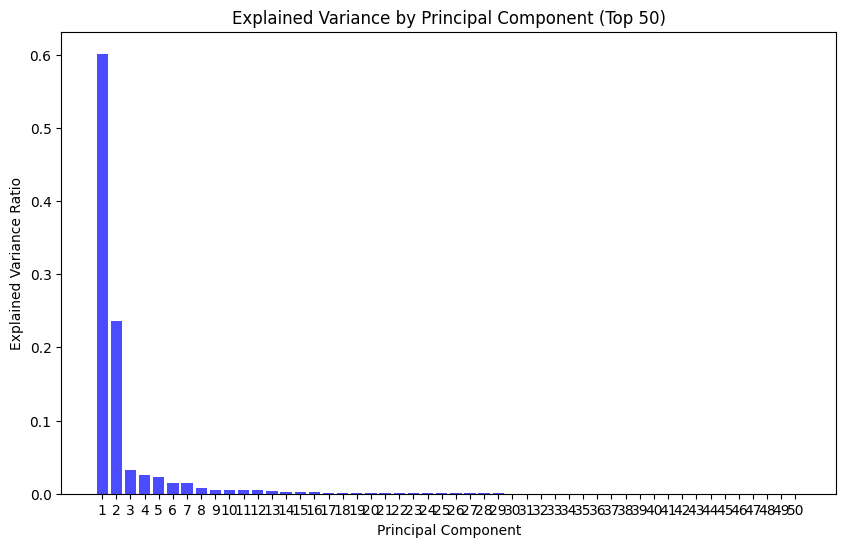

CLIENT:8
Epoch [1/1], Train Loss: 0.1233
Epoch 1: validation loss 0.043763500356521365
threshold:0.06961444485932589
Epoch [1/1], Train Loss: 0.0395
Epoch 2: validation loss 0.03818230202469306
threshold:0.022224508691579103
Epoch [1/1], Train Loss: 0.0379
Epoch 3: validation loss 0.03635170280646819
threshold:0.03206004947423935
Epoch [1/1], Train Loss: 0.0354
Epoch 4: validation loss 0.03387541423718899
threshold:0.026083288248628378
Epoch [1/1], Train Loss: 0.0335
Epoch 5: validation loss 0.03324588624617228
threshold:0.026091794949024916
exceed threshold proportion:0.0809375
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.04125
TPR derived with OCSVM:0.998125
False Positive Rate:0.0809375
True Positive Rate:1.0
benign_error:0.023859828962013125
attack_error:7.400111930668354
roc_auc:0.9970


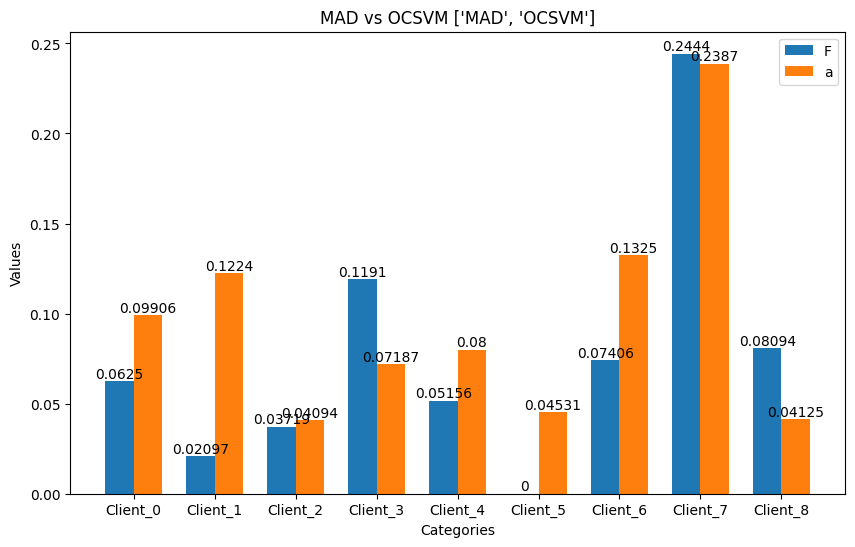

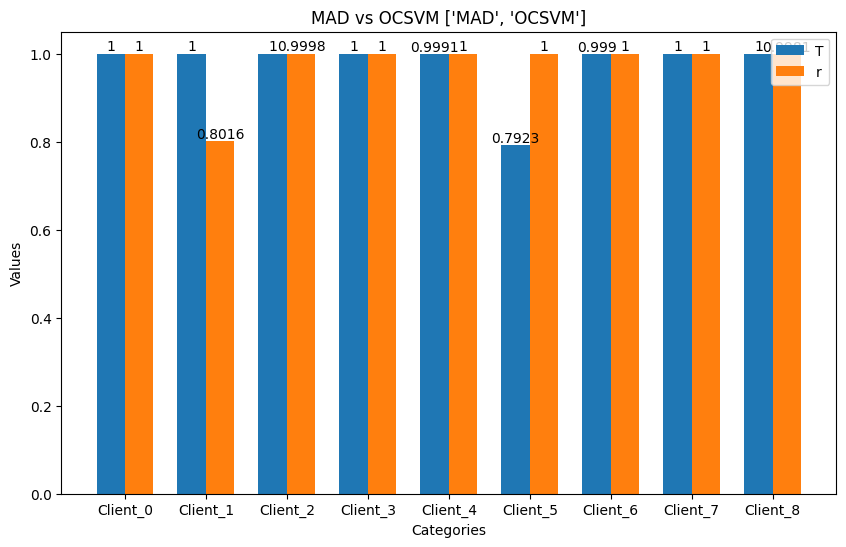

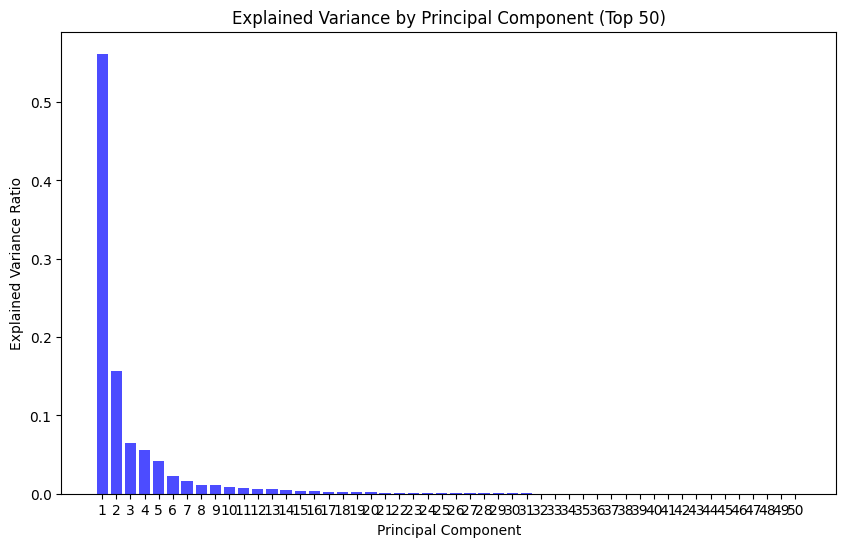

CLIENT:0
Epoch [1/1], Train Loss: 0.1300
Epoch 1: validation loss 0.061372066289186476
threshold:0.18443214893341064
Epoch [1/1], Train Loss: 0.0443
Epoch 2: validation loss 0.022873639630583618
threshold:0.0935344472527504
Epoch [1/1], Train Loss: 0.0286
Epoch 3: validation loss 0.018695193906434072
threshold:0.060119422851130366
Epoch [1/1], Train Loss: 0.0250
Epoch 4: validation loss 0.01715629296616102
threshold:0.05478907353244722
Epoch [1/1], Train Loss: 0.0237
Epoch 5: validation loss 0.016275825284612484
threshold:0.0533335127402097
exceed threshold proportion:0.0534375
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.1103125
TPR derived with OCSVM:1.0
False Positive Rate:0.0534375
True Positive Rate:1.0
benign_error:0.021992190461605787
attack_error:46.222275623500344
roc_auc:0.9976


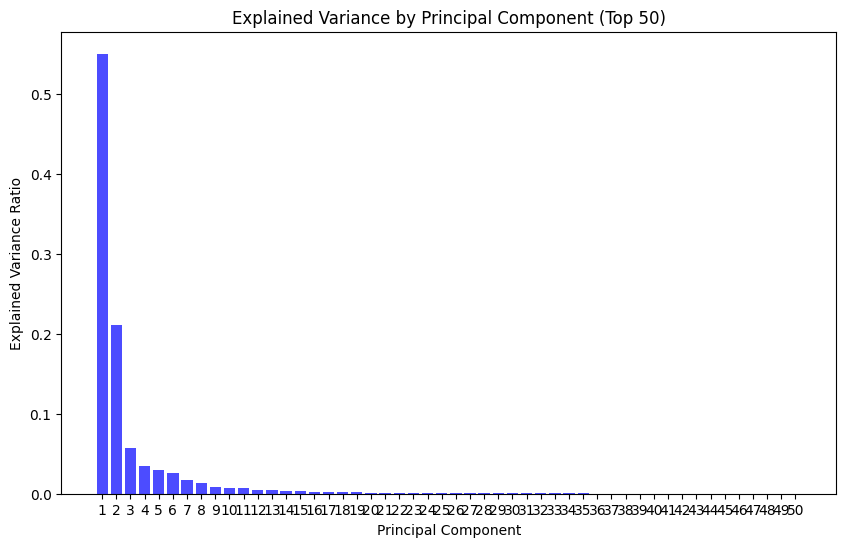

CLIENT:1
Epoch [1/1], Train Loss: 0.1481
Epoch 1: validation loss 0.07643211629179059
threshold:0.24928004294633865
Epoch [1/1], Train Loss: 0.0679
Epoch 2: validation loss 0.05365554478469658
threshold:0.20278258342295885
Epoch [1/1], Train Loss: 0.0539
Epoch 3: validation loss 0.047809028746702266
threshold:0.16749067418277264
Epoch [1/1], Train Loss: 0.0488
Epoch 4: validation loss 0.04284110301679403
threshold:0.13775576185435057
Epoch [1/1], Train Loss: 0.0432
Epoch 5: validation loss 0.037537825529492364
threshold:0.11435525584965944
exceed threshold proportion:0.020205871139916128
count_total:2623.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.11818528402592451
TPR derived with OCSVM:0.801625
False Positive Rate:0.020205871139916128
True Positive Rate:1.0
benign_error:0.041135929351629213
attack_error:36.46929870837927
roc_auc:0.9992


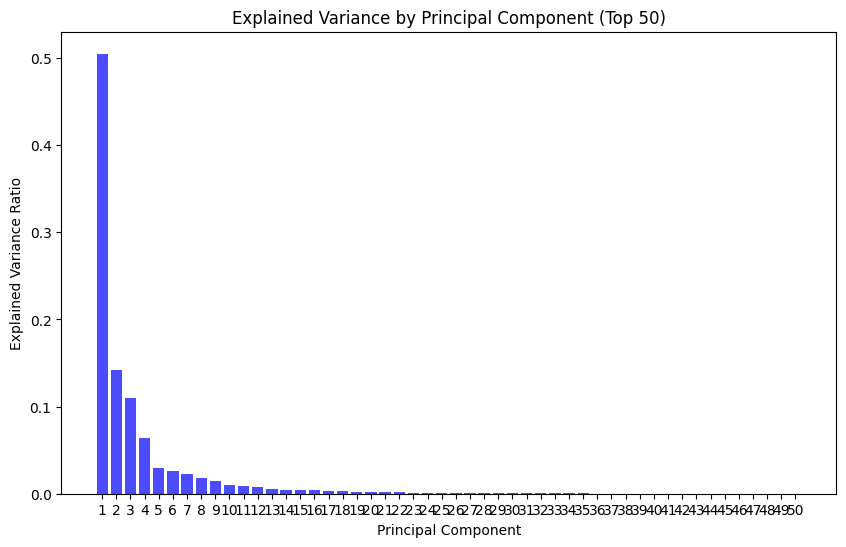

CLIENT:2
Epoch [1/1], Train Loss: 0.1681
Epoch 1: validation loss 288.61377014844464
threshold:0.3112707380205393
Epoch [1/1], Train Loss: 0.0858
Epoch 2: validation loss 288.5974911262019
threshold:0.2952151596546173
Epoch [1/1], Train Loss: 0.0670
Epoch 3: validation loss 288.58170101340767
threshold:0.20507296174764633
Epoch [1/1], Train Loss: 0.0533
Epoch 4: validation loss 288.5719973612099
threshold:0.18463255278766155
Epoch [1/1], Train Loss: 0.0466
Epoch 5: validation loss 288.5673019365909
threshold:0.17324768006801605
exceed threshold proportion:0.0340625
count_total:3200.0
exceed threshold proportion:0.99925
count_total:4000.0
FPR derived with OCSVM:0.04125
TPR derived with OCSVM:1.0
False Positive Rate:0.0340625
True Positive Rate:0.99925
benign_error:562.6115963205323
attack_error:39.126578300952914
roc_auc:0.9855


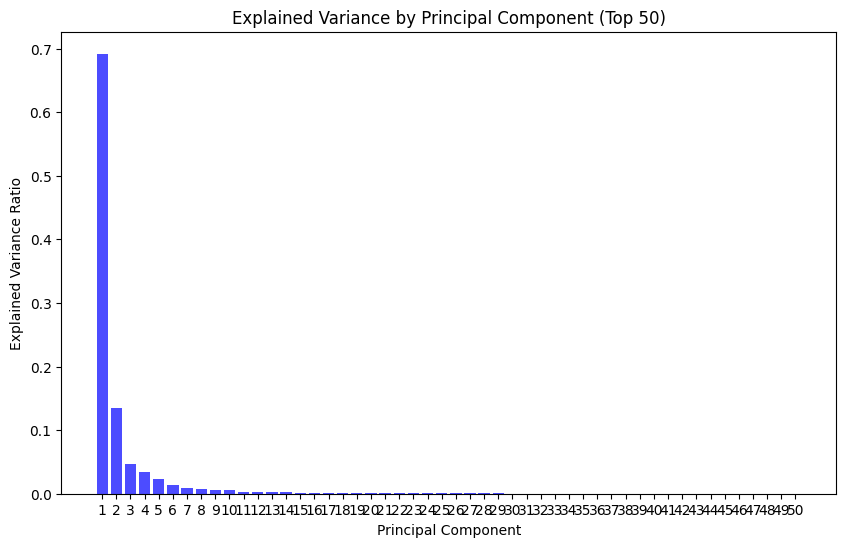

CLIENT:3
Epoch [1/1], Train Loss: 0.1510
Epoch 1: validation loss 0.023584864923778252
threshold:0.04370339447632432
Epoch [1/1], Train Loss: 0.1321
Epoch 2: validation loss 0.0224158968251103
threshold:0.04095305921509862
Epoch [1/1], Train Loss: 0.1016
Epoch 3: validation loss 0.02078482901247648
threshold:0.0409464742988348
Epoch [1/1], Train Loss: 0.0829
Epoch 4: validation loss 0.019889100602804088
threshold:0.04036154830828309
Epoch [1/1], Train Loss: 0.0707
Epoch 5: validation loss 0.019545500840132055
threshold:0.03944177506491542
exceed threshold proportion:0.109375
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.0728125
TPR derived with OCSVM:1.0
False Positive Rate:0.109375
True Positive Rate:1.0
benign_error:0.022353748995810746
attack_error:1.5254718964099885
roc_auc:0.9995


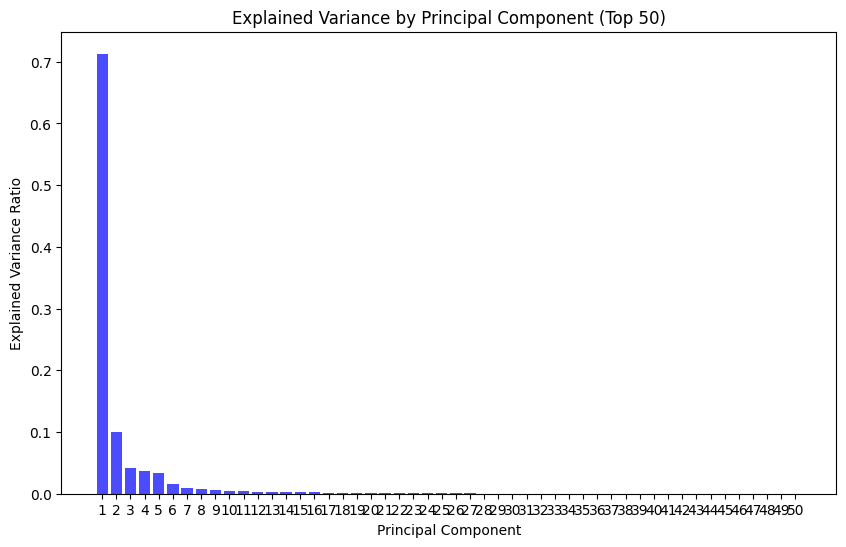

CLIENT:4
Epoch [1/1], Train Loss: 0.1676
Epoch 1: validation loss 0.06500742779328272
threshold:0.14156254287809134
Epoch [1/1], Train Loss: 0.0721
Epoch 2: validation loss 0.057279984165842714
threshold:0.1492780763655901
Epoch [1/1], Train Loss: 0.0631
Epoch 3: validation loss 0.046204331851540464
threshold:0.13665546663105488
Epoch [1/1], Train Loss: 0.0535
Epoch 4: validation loss 0.04063031778503687
threshold:0.11923842877149582
Epoch [1/1], Train Loss: 0.0486
Epoch 5: validation loss 0.038420864442984266
threshold:0.10887657850980759
exceed threshold proportion:0.0309375
count_total:3200.0
exceed threshold proportion:0.999
count_total:8000.0
FPR derived with OCSVM:0.068125
TPR derived with OCSVM:1.0
False Positive Rate:0.0309375
True Positive Rate:0.999
benign_error:0.03815705791115761
attack_error:2.366005187690258
roc_auc:0.9999


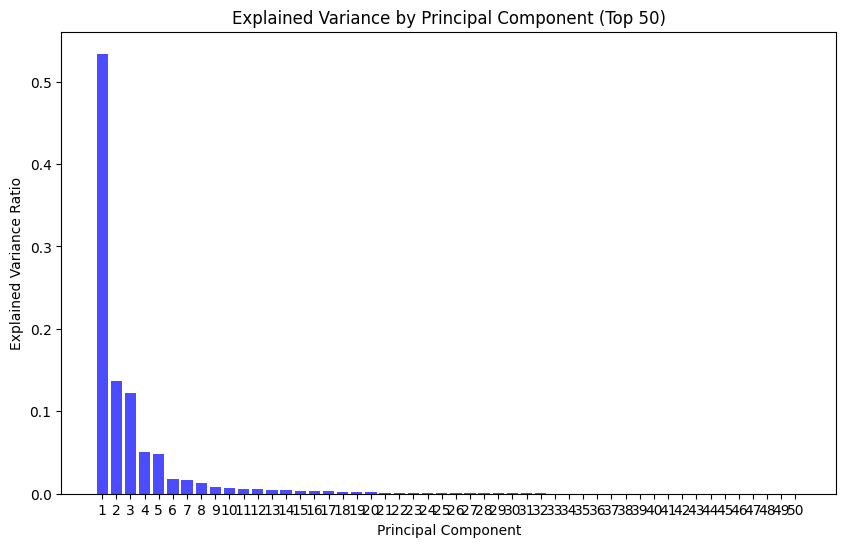

CLIENT:5
Epoch [1/1], Train Loss: 0.1888
Epoch 1: validation loss 0.09777001261902162
threshold:0.4850275097414851
Epoch [1/1], Train Loss: 0.1025
Epoch 2: validation loss 0.0795875979730716
threshold:0.4410011703148484
Epoch [1/1], Train Loss: 0.0811
Epoch 3: validation loss 0.06577561868306918
threshold:0.3313774671405554
Epoch [1/1], Train Loss: 0.0690
Epoch 4: validation loss 0.06038806554980767
threshold:0.23176722694188356
Epoch [1/1], Train Loss: 0.0619
Epoch 5: validation loss 0.0516955245190706
threshold:0.2205635216087103
exceed threshold proportion:0.0
count_total:3200.0
exceed threshold proportion:0.79225
count_total:8000.0
FPR derived with OCSVM:0.045625
TPR derived with OCSVM:1.0
False Positive Rate:0.0
True Positive Rate:0.79225
benign_error:0.05145456911996007
attack_error:3.0876480206251142
roc_auc:0.9999


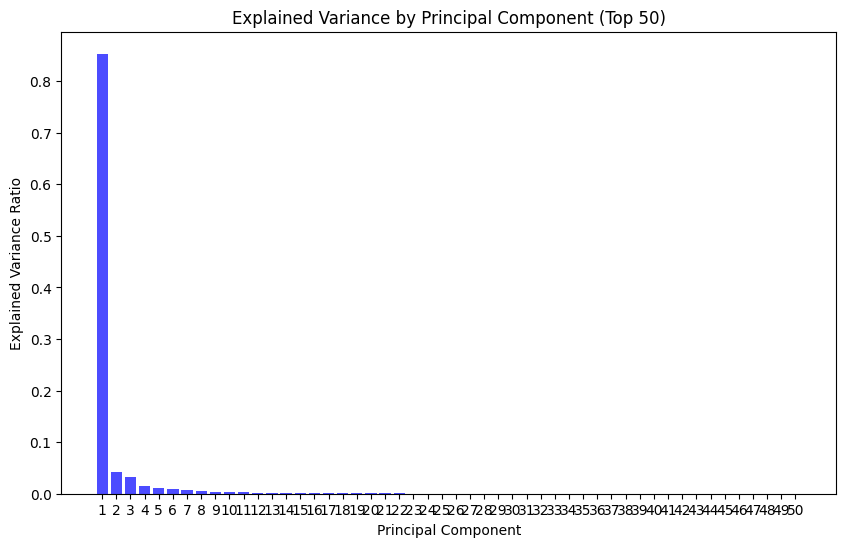

CLIENT:6
Epoch [1/1], Train Loss: 0.1447
Epoch 1: validation loss 0.0639826445816419
threshold:0.2260341215878725
Epoch [1/1], Train Loss: 0.0493
Epoch 2: validation loss 0.048112281965903746
threshold:0.21620472706854343
Epoch [1/1], Train Loss: 0.0325
Epoch 3: validation loss 0.04305747485695741
threshold:0.20710089523345232
Epoch [1/1], Train Loss: 0.0285
Epoch 4: validation loss 0.04110494980063194
threshold:0.2137561021372676
Epoch [1/1], Train Loss: 0.0268
Epoch 5: validation loss 0.039889924877729174
threshold:0.209625911898911
exceed threshold proportion:0.0615625
count_total:3200.0
exceed threshold proportion:0.99375
count_total:4000.0
FPR derived with OCSVM:0.1278125
TPR derived with OCSVM:1.0
False Positive Rate:0.0615625
True Positive Rate:0.99375
benign_error:0.06827003998681903
attack_error:6.713605279445648
roc_auc:0.9749


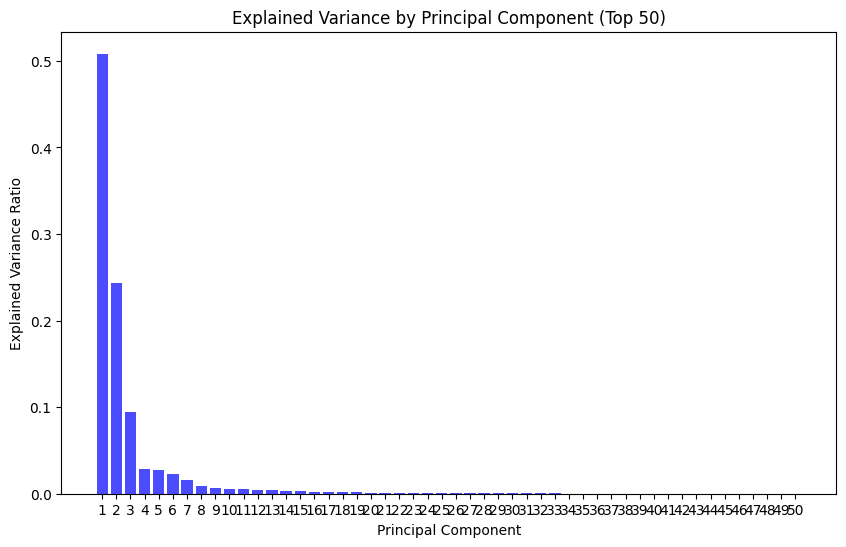

CLIENT:7
Epoch [1/1], Train Loss: 0.1722
Epoch 1: validation loss 0.05273777148089348
threshold:0.1490540448576212
Epoch [1/1], Train Loss: 0.0931
Epoch 2: validation loss 0.04668340082160938
threshold:0.12180260196328163
Epoch [1/1], Train Loss: 0.0828
Epoch 3: validation loss 0.04255574993216074
threshold:0.12362748198211193
Epoch [1/1], Train Loss: 0.0685
Epoch 4: validation loss 0.03568897526233624
threshold:0.117262146435678
Epoch [1/1], Train Loss: 0.0583
Epoch 5: validation loss 0.02914357819618323
threshold:0.061384270898997784
exceed threshold proportion:0.211875
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.2175
TPR derived with OCSVM:1.0
False Positive Rate:0.211875
True Positive Rate:1.0
benign_error:0.04633325630798936
attack_error:0.9226782478094101
roc_auc:0.9972


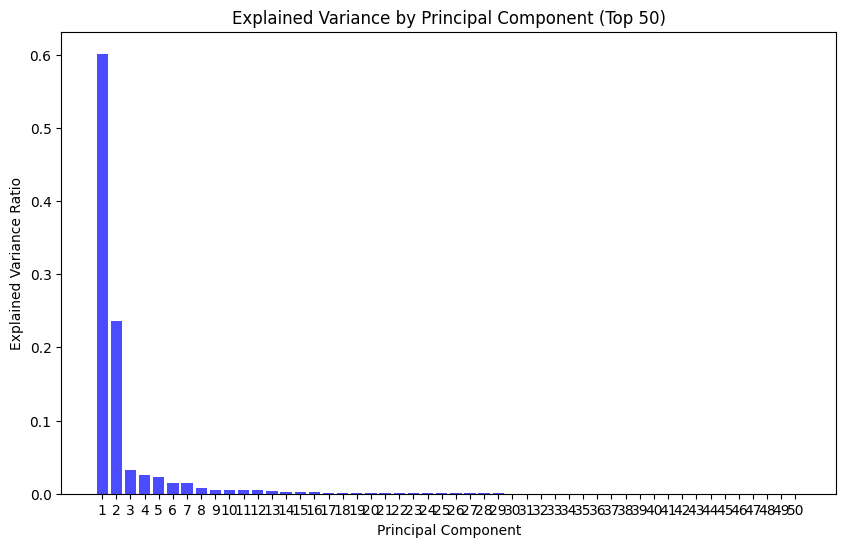

CLIENT:8
Epoch [1/1], Train Loss: 0.1169
Epoch 1: validation loss 0.04318646356845513
threshold:0.02620130591094494
Epoch [1/1], Train Loss: 0.0389
Epoch 2: validation loss 0.037655000273997964
threshold:0.03322825953364372
Epoch [1/1], Train Loss: 0.0373
Epoch 3: validation loss 0.034101278038743216
threshold:0.02923470688983798
Epoch [1/1], Train Loss: 0.0344
Epoch 4: validation loss 0.033085917046245854
threshold:0.02686592098325491
Epoch [1/1], Train Loss: 0.0331
Epoch 5: validation loss 0.03261609875047818
threshold:0.026769657619297504
exceed threshold proportion:0.0796875
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.0415625
TPR derived with OCSVM:0.799
False Positive Rate:0.0796875
True Positive Rate:1.0
benign_error:0.023061477588489653
attack_error:7.427931475818157
roc_auc:0.9971


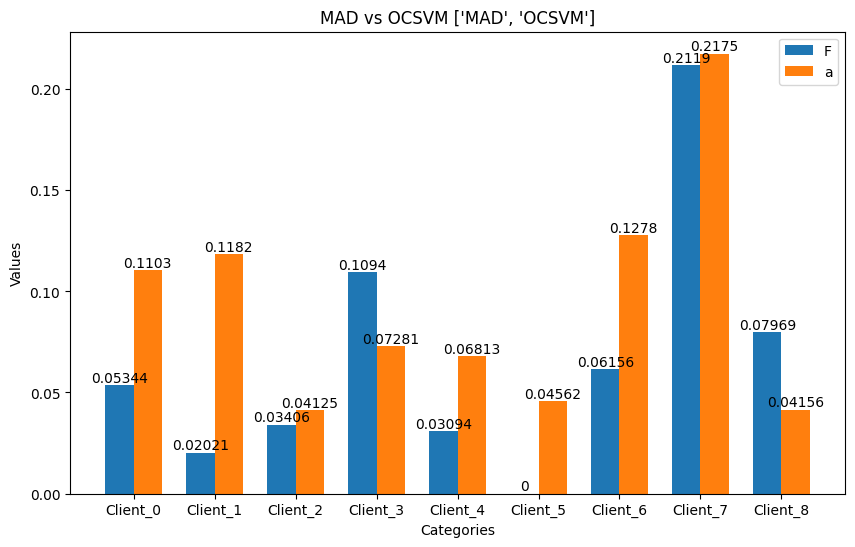

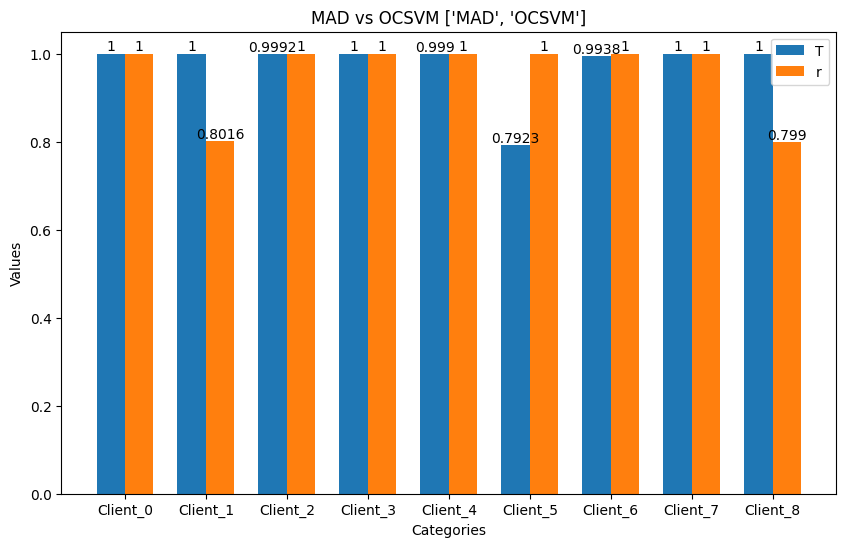

In [ ]:
from sklearn.metrics import auc
fpr_list = []
tpr_list = []
auc_list = []
for K in range(10):
  history_MAD,_ = run_test_OCSVM(K,0.04) # gamma set to auto
  fpr = history_MAD['fpr']
  fpr_list.append(fpr)
  tpr = history_MAD['tpr']
  tpr_list.append(tpr)
fpr_array = np.array(fpr_list)
tpr_array = np.array(tpr_list)

CLIENT:0
Epoch [1/1], Train Loss: 0.1290
Epoch 1: validation loss 0.05983583950079405
threshold:0.05459691770374775
Epoch [1/1], Train Loss: 0.0417
Epoch 2: validation loss 0.022093128317441695
threshold:0.018187521025538445
Epoch [1/1], Train Loss: 0.0276
Epoch 3: validation loss 0.018312419965290105
threshold:0.013300256803631783
Epoch [1/1], Train Loss: 0.0249
Epoch 4: validation loss 0.017056159770641573
threshold:0.011676148977130651
Epoch [1/1], Train Loss: 0.0237
Epoch 5: validation loss 0.01622529242378779
threshold:0.011051780544221401
exceed threshold proportion:0.5203125
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.1015625
TPR derived with OCSVM:1.0
False Positive Rate:0.5203125
True Positive Rate:1.0
benign_error:0.021917985174804925
attack_error:46.228367875397204
roc_auc:0.9981
CLIENT:1
Epoch [1/1], Train Loss: 0.1513
Epoch 1: validation loss 0.07705410262500582
threshold:0.06759338080883026
Epoch [1/1], Train Loss: 0.0654

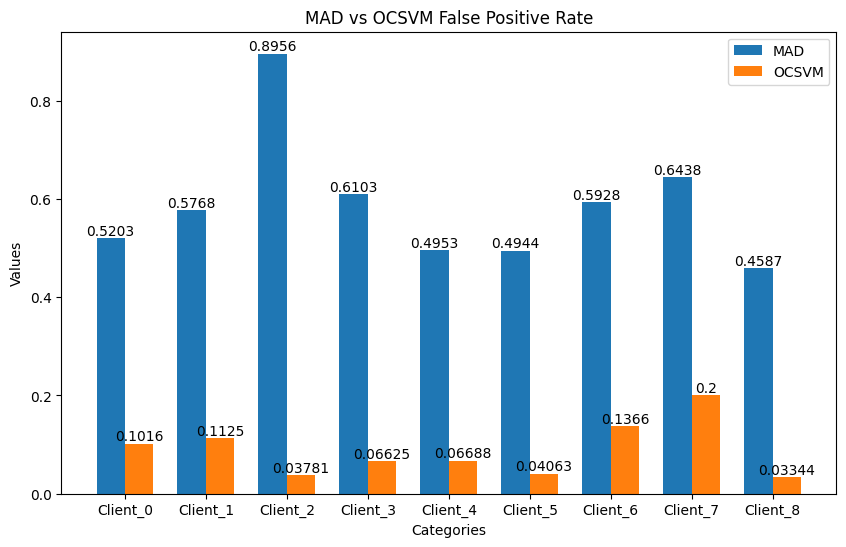

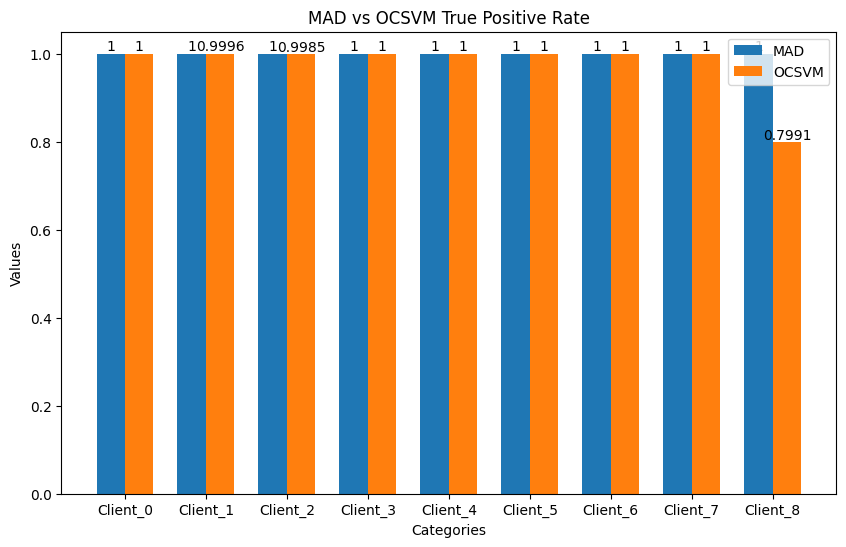

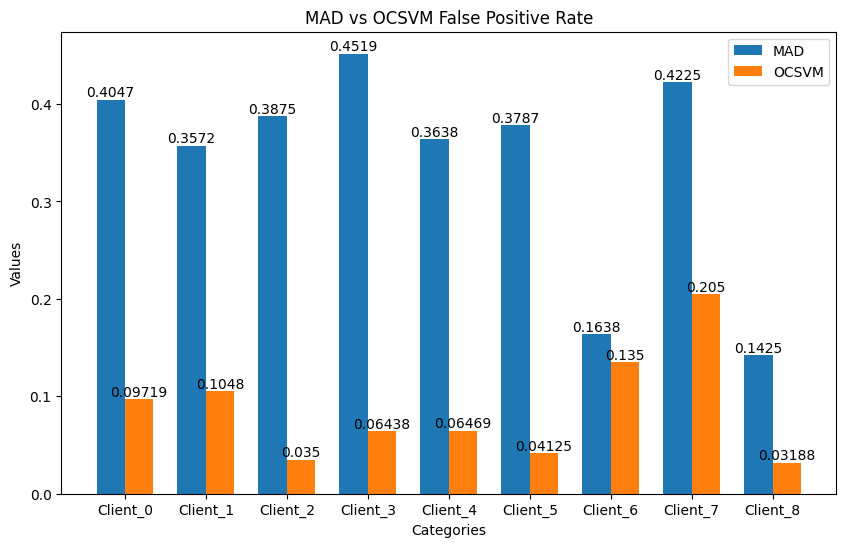

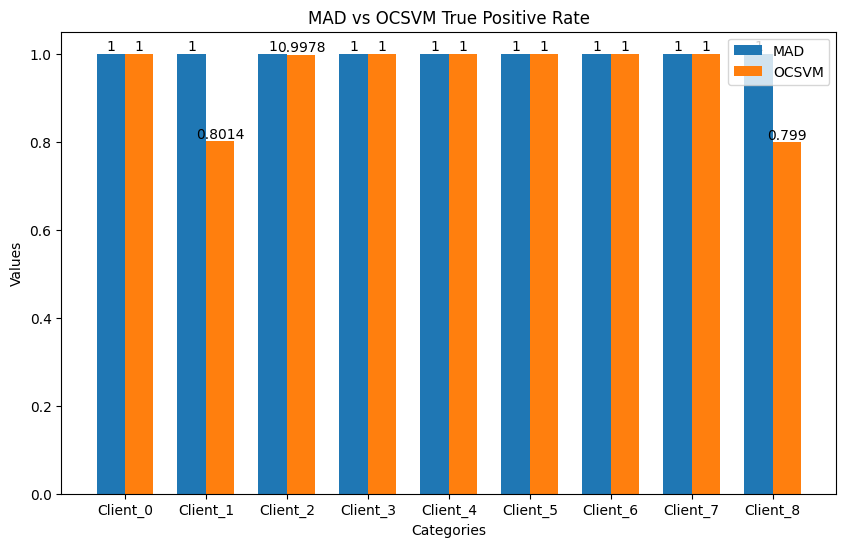

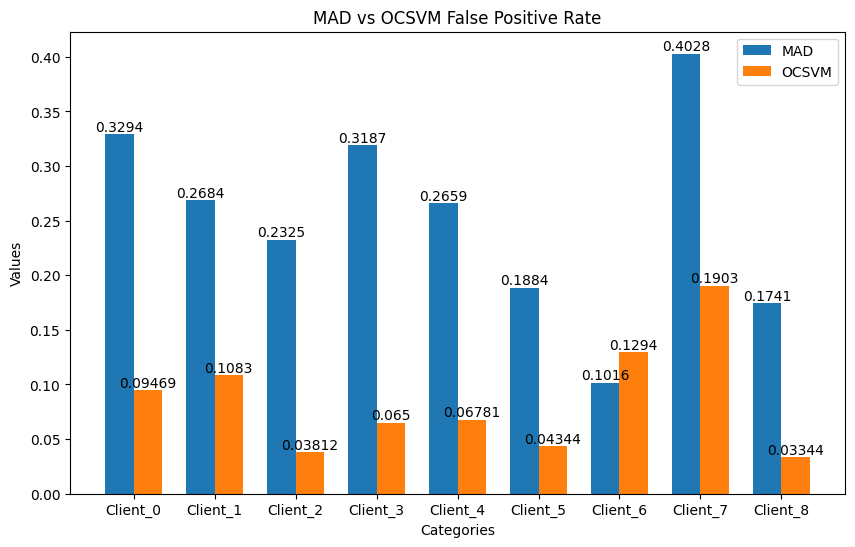

...

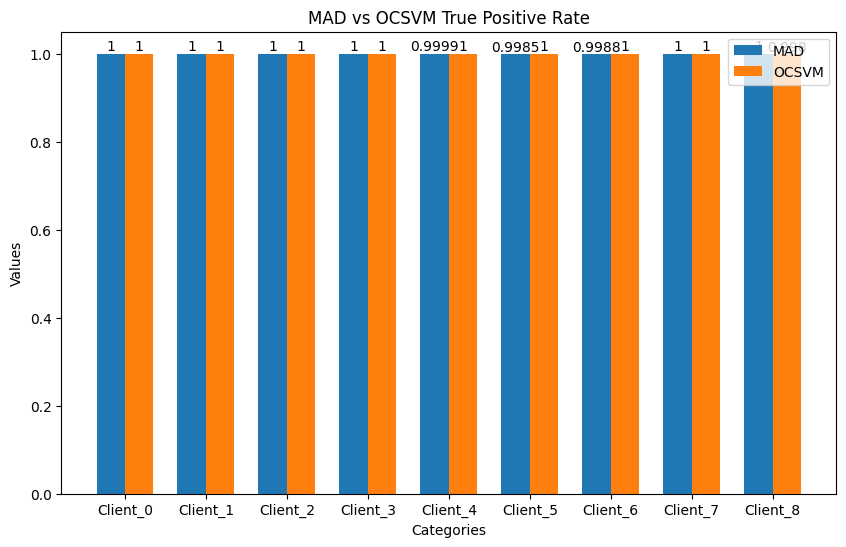

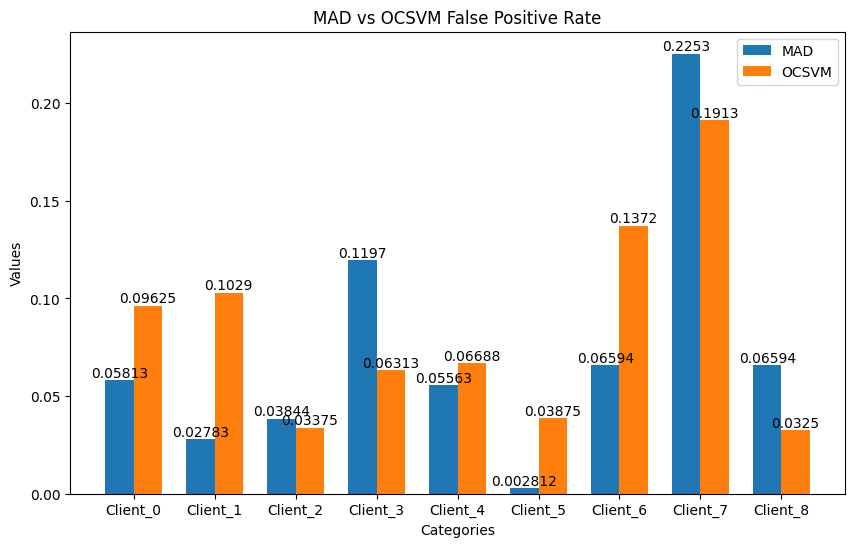

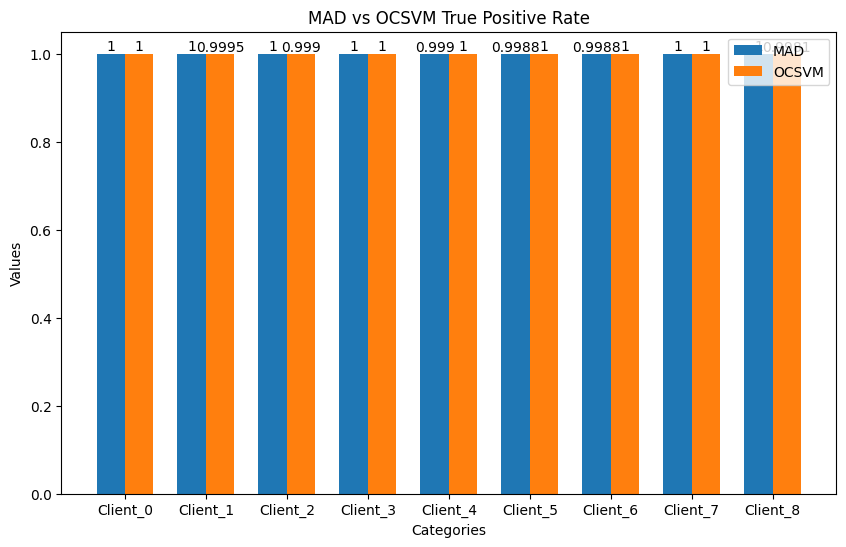

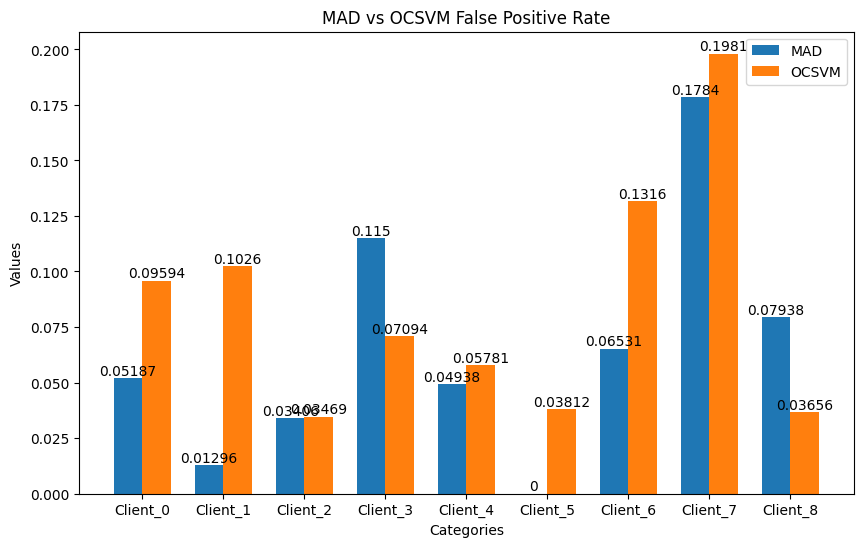

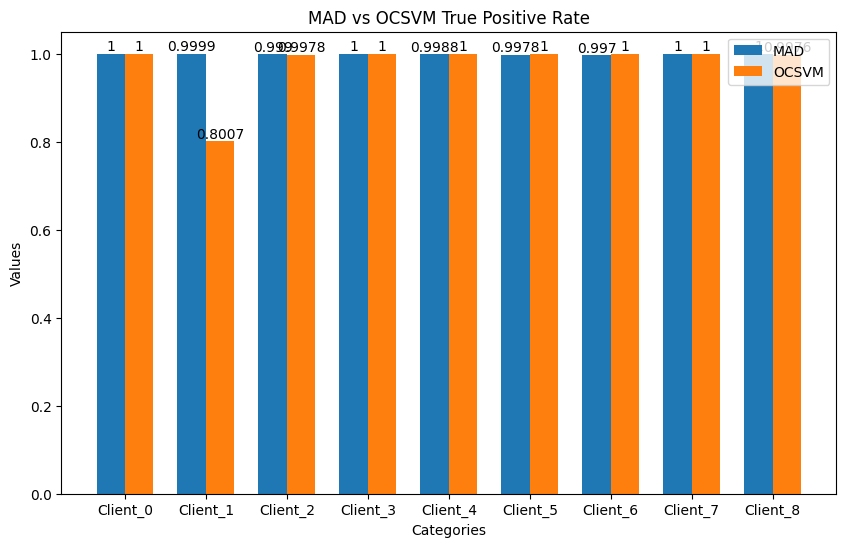

In [ ]:
from sklearn.metrics import auc
fpr_list = []
tpr_list = []
auc_list = []
for K in range(10):
  history_MAD,_ = run_test_OCSVM(K,0.03) # gamma set to auto
  fpr = history_MAD['fpr']
  fpr_list.append(fpr)
  tpr = history_MAD['tpr']
  tpr_list.append(tpr)
fpr_array = np.array(fpr_list)
tpr_array = np.array(tpr_list)

In [ ]:
fpr_array = np.array(fpr_list)
tpr_array = np.array(tpr_list)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


(10,)
(10,)
(10,)
(10,)
(10,)
(10,)
(10,)
(10,)
(10,)
(10,)
(10,)
(10,)
(10,)
(10,)
(10,)
(10,)
(10,)
(10,)


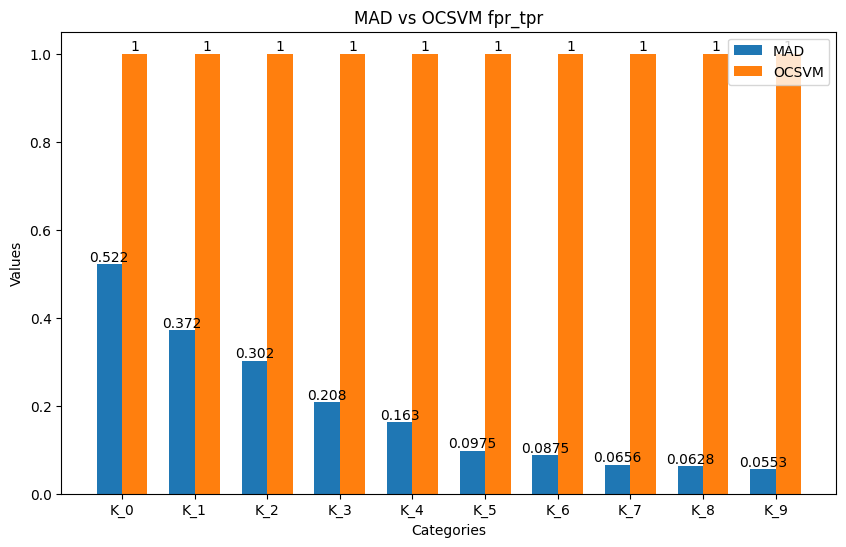

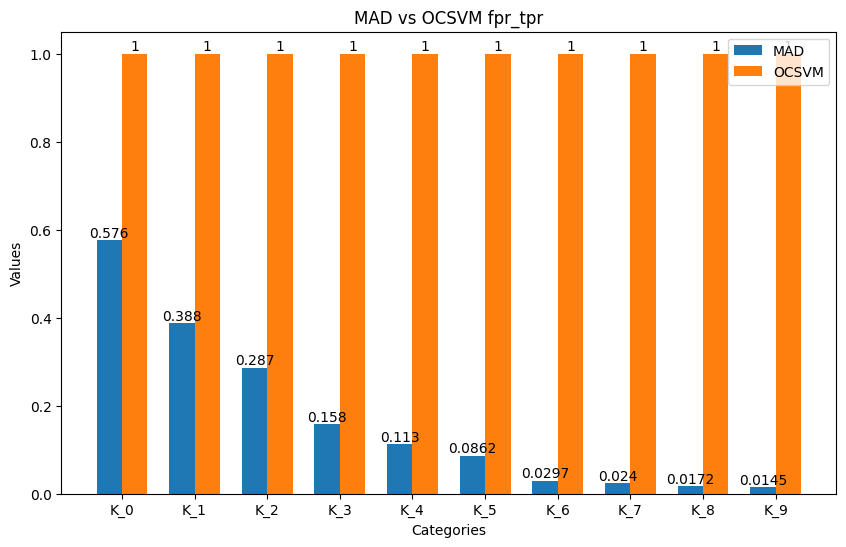

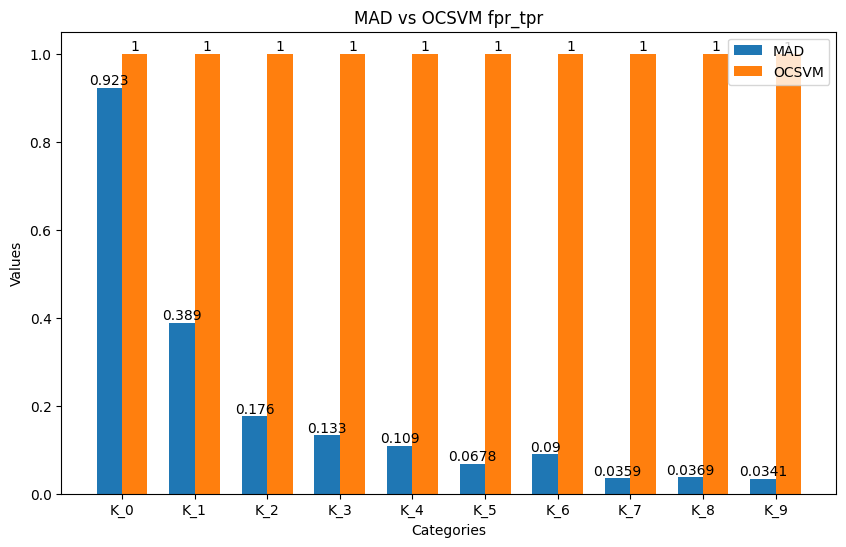

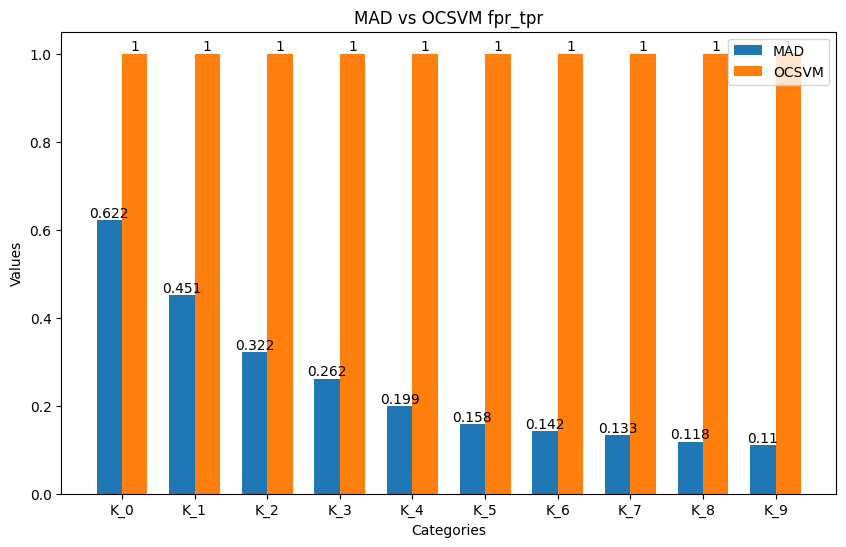

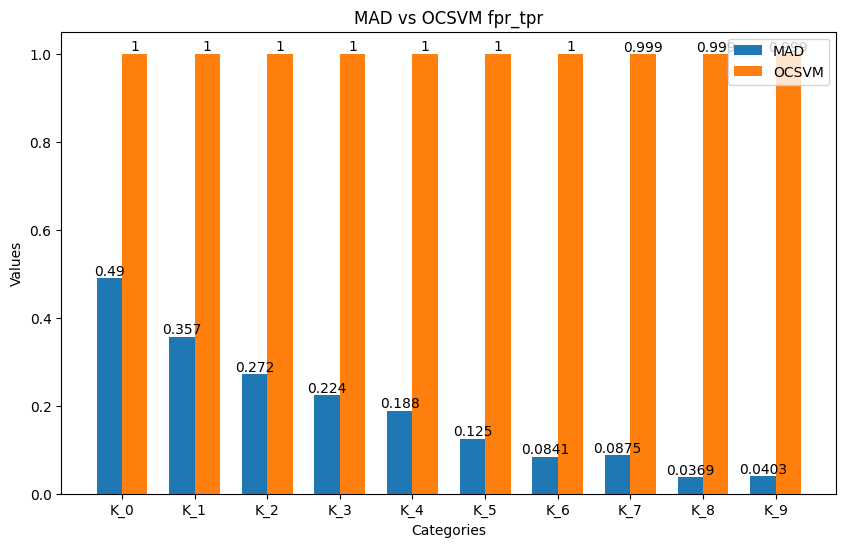

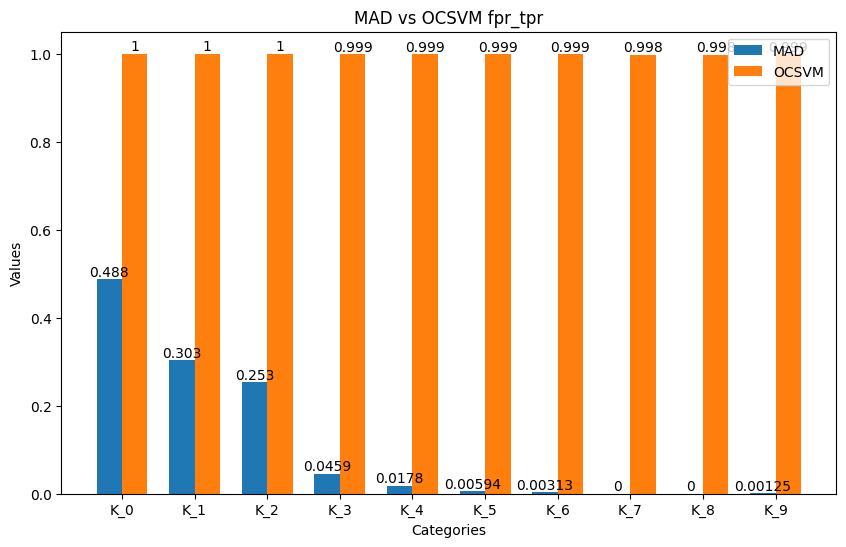

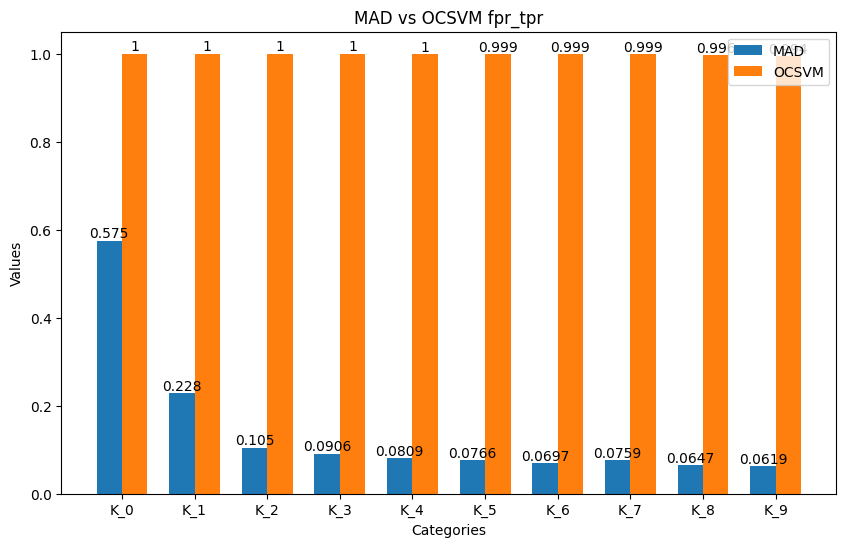

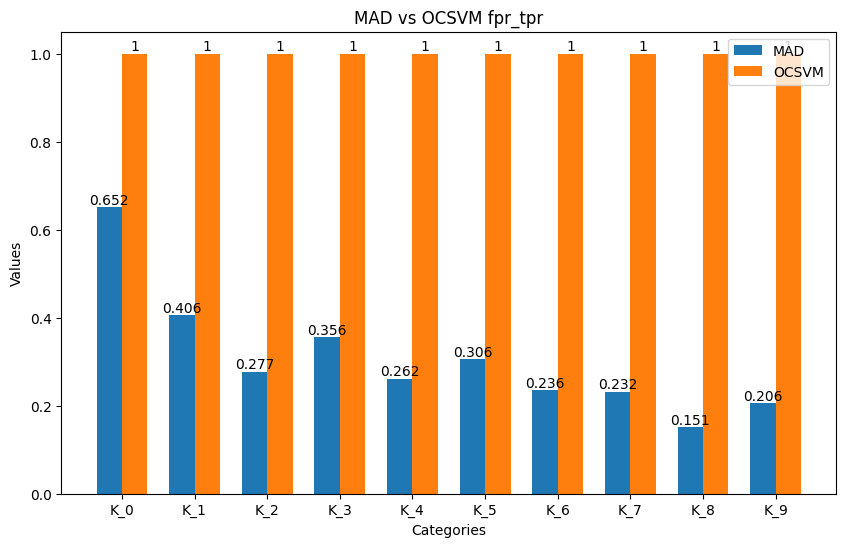

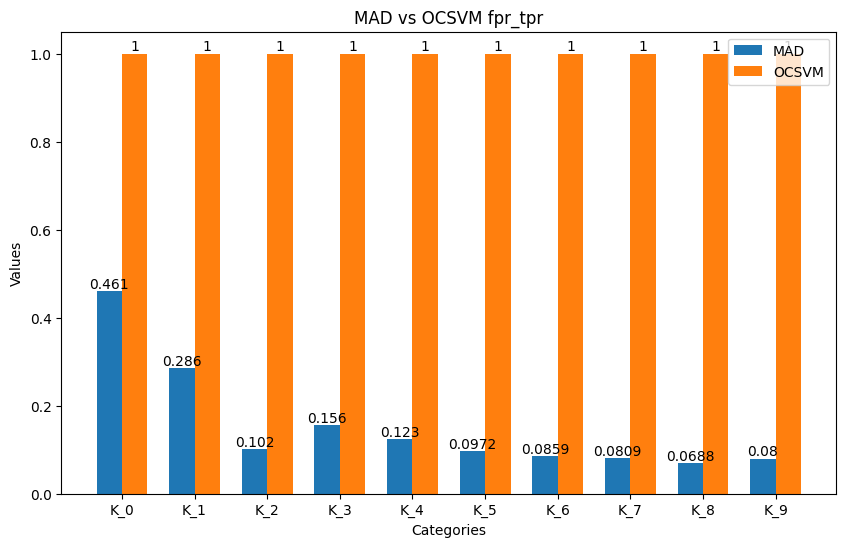

In [ ]:
from sklearn.metrics import auc
auc_k_list = []
for client_id in range(9):
  fpr_K_list = fpr_array[:,client_id]
  print(fpr_K_list.shape)
  tpr_K_list = tpr_array[:,client_id]
  print(tpr_K_list.shape)
  plot_barchart(fpr_K_list,tpr_K_list,'fpr_tpr',labels = [f'K_{i}' for i in range(10)])

CLIENT:0
Epoch [1/1], Train Loss: 0.1242
Epoch 1: validation loss 0.05547013928492864
threshold:0.06880886107683182
Epoch [1/1], Train Loss: 0.0395
Epoch 2: validation loss 0.02260634504640714
threshold:0.02778830612078309
Epoch [1/1], Train Loss: 0.0275
Epoch 3: validation loss 0.018874377690446684
threshold:0.020864921621978283
Epoch [1/1], Train Loss: 0.0250
Epoch 4: validation loss 0.01699105002081547
threshold:0.016055635642260313
Epoch [1/1], Train Loss: 0.0233
Epoch 5: validation loss 0.015668819080560635
threshold:0.013800829881802201
exceed threshold proportion:0.4071875
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.106875
TPR derived with OCSVM:1.0
False Positive Rate:0.4071875
True Positive Rate:1.0
benign_error:0.021432622633874417
attack_error:46.21744666200876
roc_auc:0.9977
CLIENT:1
Epoch [1/1], Train Loss: 0.1501
Epoch 1: validation loss 0.07276713398223657
threshold:0.08230104669928551
Epoch [1/1], Train Loss: 0.0645
Epo

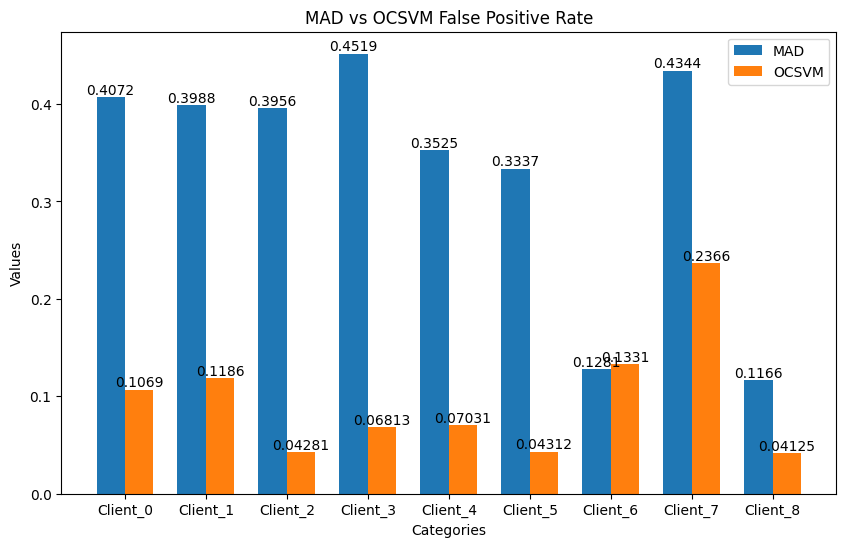

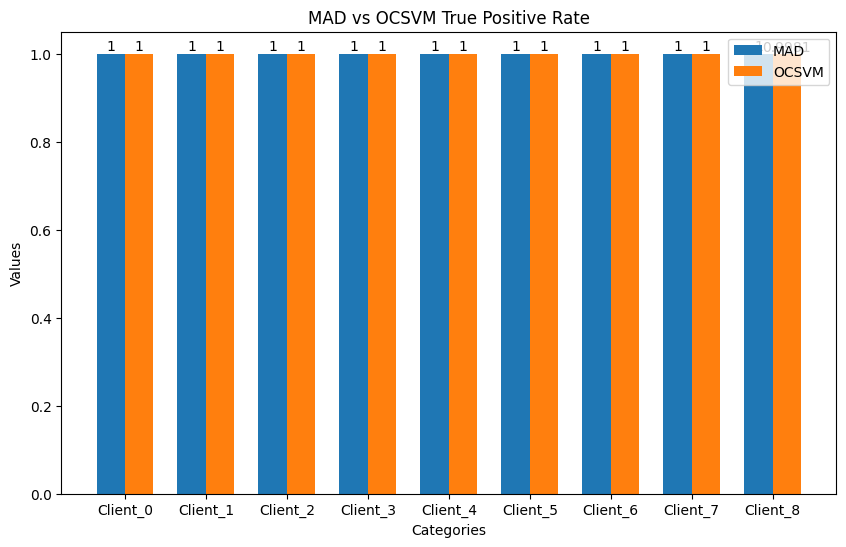

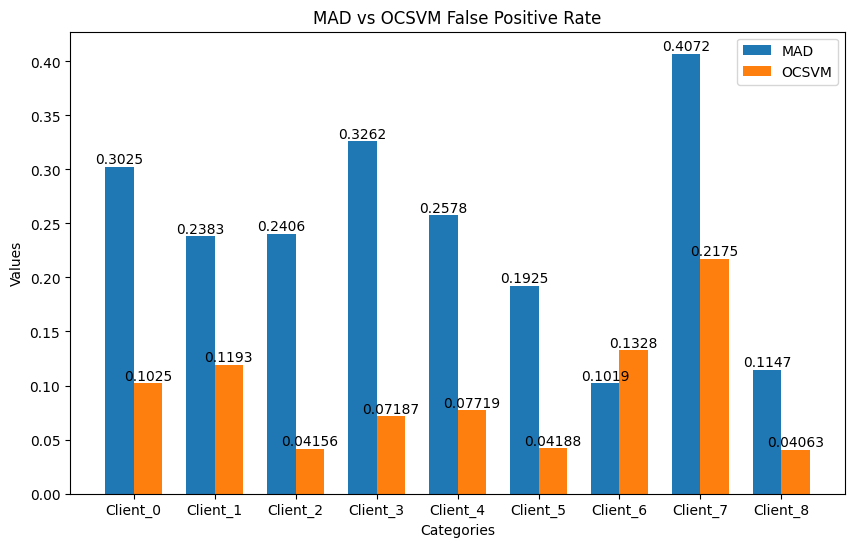

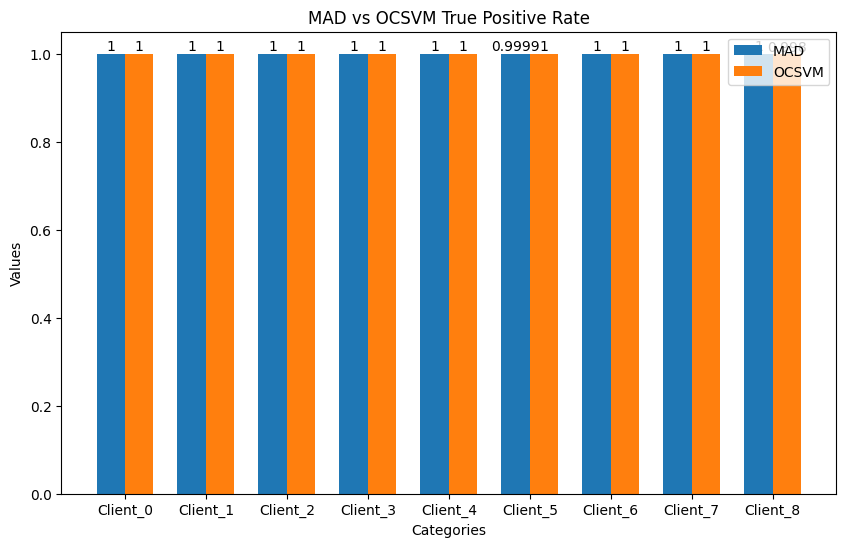

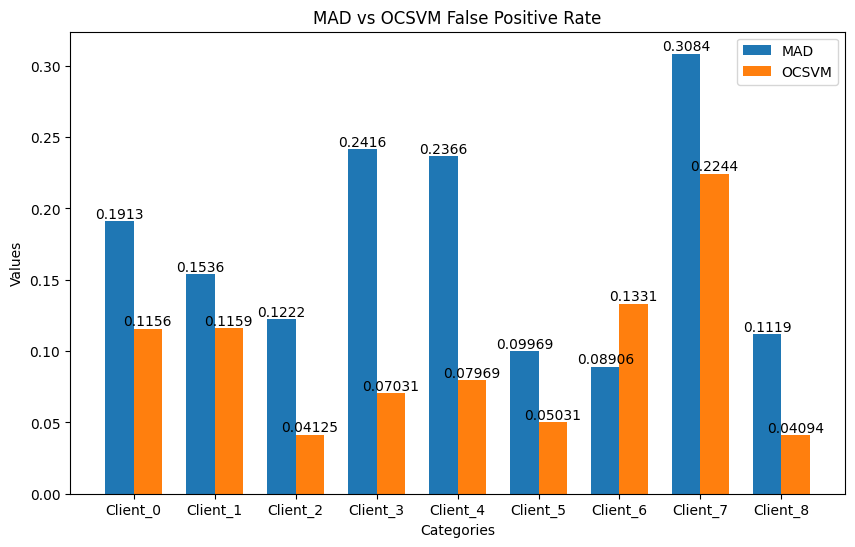

...

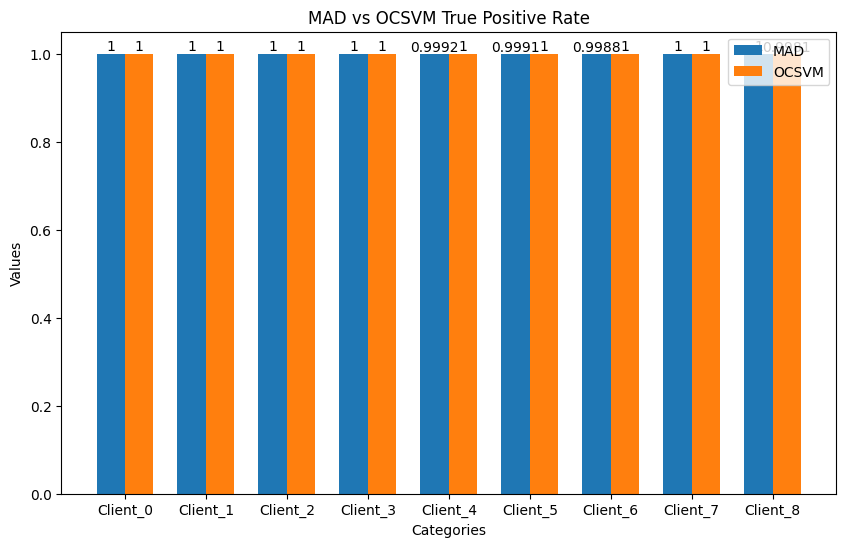

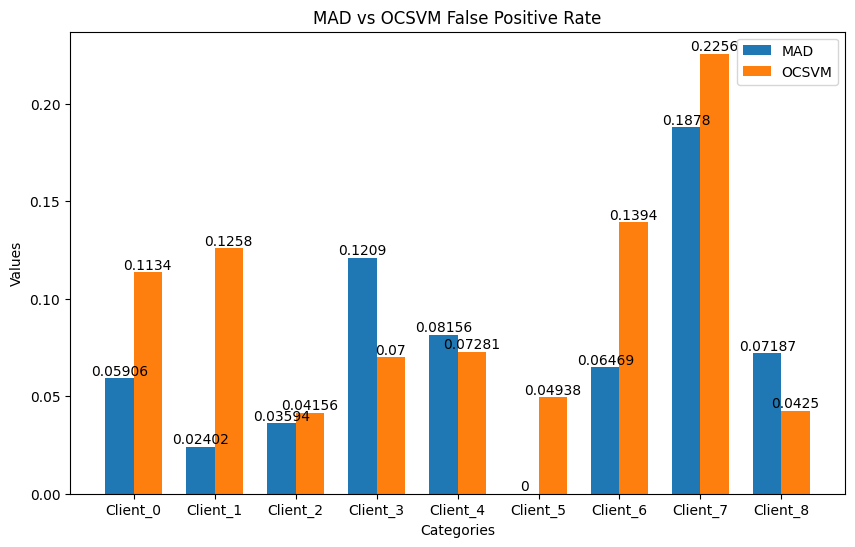

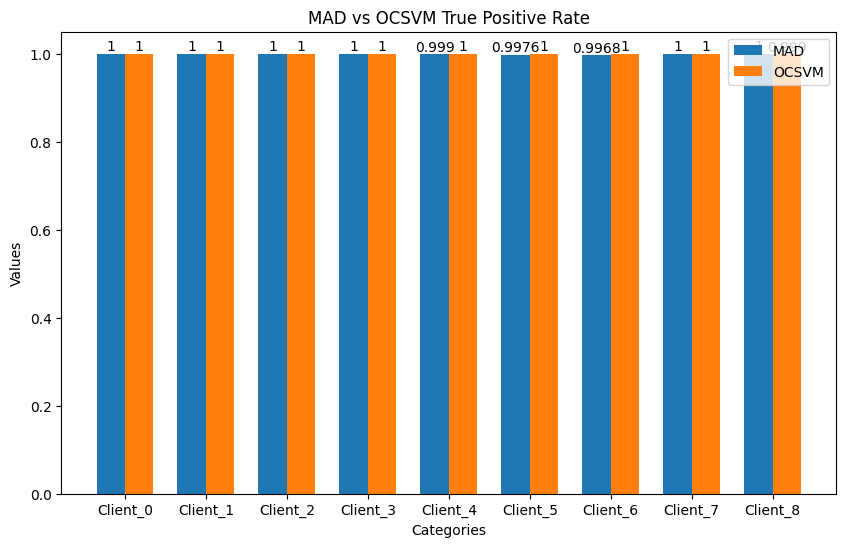

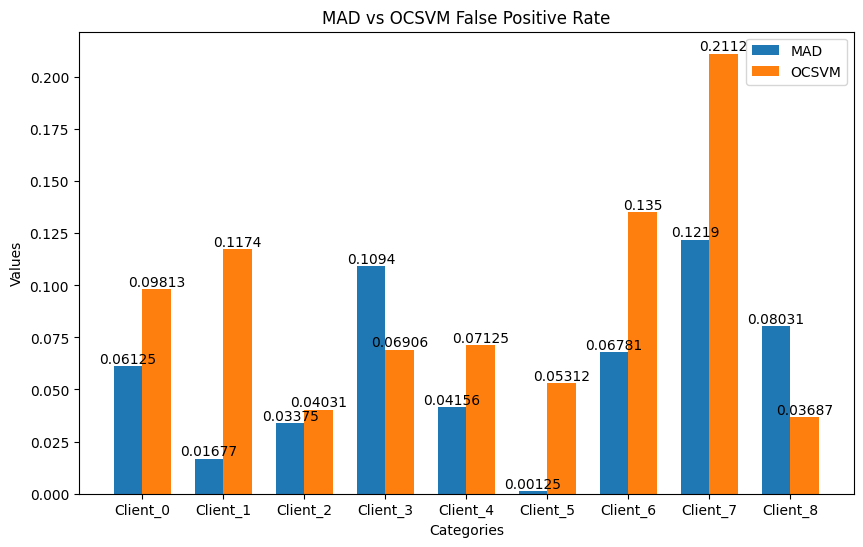

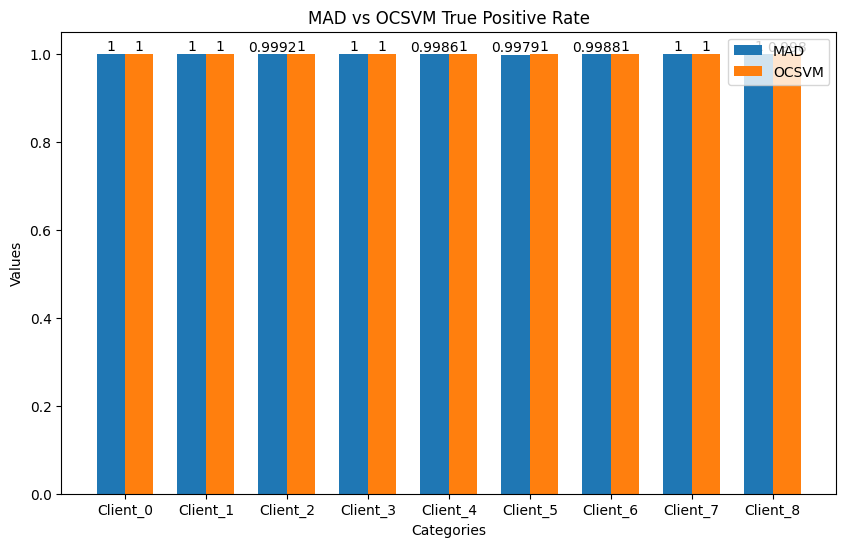

In [ ]:
from sklearn.metrics import auc
fpr_list = []
tpr_list = []
auc_list = []
for K in range(1,10):
  history_MAD,_ = run_test_OCSVM(K,0.04) # gamma set to scale
  fpr = history_MAD['fpr']
  fpr_list.append(fpr)
  tpr = history_MAD['tpr']
  tpr_list.append(tpr)
fpr_array = np.array(fpr_list)
tpr_array = np.array(tpr_list)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


CLIENT:0
Epoch [1/1], Train Loss: 0.1290
Epoch 1: validation loss 0.061229031704939325
threshold:0.0612290316953873
Epoch [1/1], Train Loss: 0.0438
Epoch 2: validation loss 0.024594707108843022
threshold:0.024594707265406704
Epoch [1/1], Train Loss: 0.0287
Epoch 3: validation loss 0.01891477907506319
threshold:0.018914779055735263
Epoch [1/1], Train Loss: 0.0253
Epoch 4: validation loss 0.0172416443291765
threshold:0.01724164438768266
Epoch [1/1], Train Loss: 0.0238
Epoch 5: validation loss 0.01624870919741881
threshold:0.016248709253238465
exceed threshold proportion:0.3725
count_total:3200.0
exceed threshold proportion:1.0
count_total:8000.0
FPR derived with OCSVM:0.128125
TPR derived with OCSVM:1.0
False Positive Rate:0.3725
True Positive Rate:1.0
benign_error:0.021922380803152917
attack_error:46.266827805161476
roc_auc:0.9976
CLIENT:1
Epoch [1/1], Train Loss: 0.1465
Epoch 1: validation loss 0.07054576325519131
threshold:0.07054576327850169
Epoch [1/1], Train Loss: 0.0619
Epoch 2: v

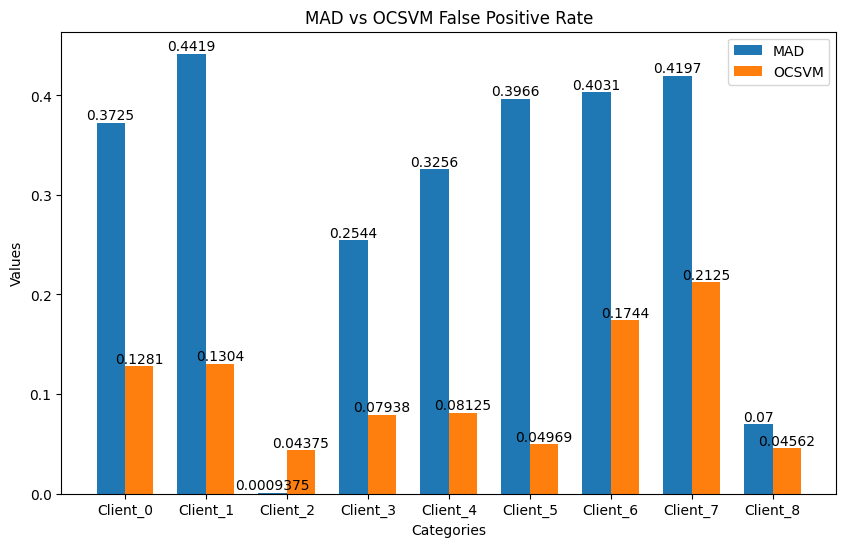

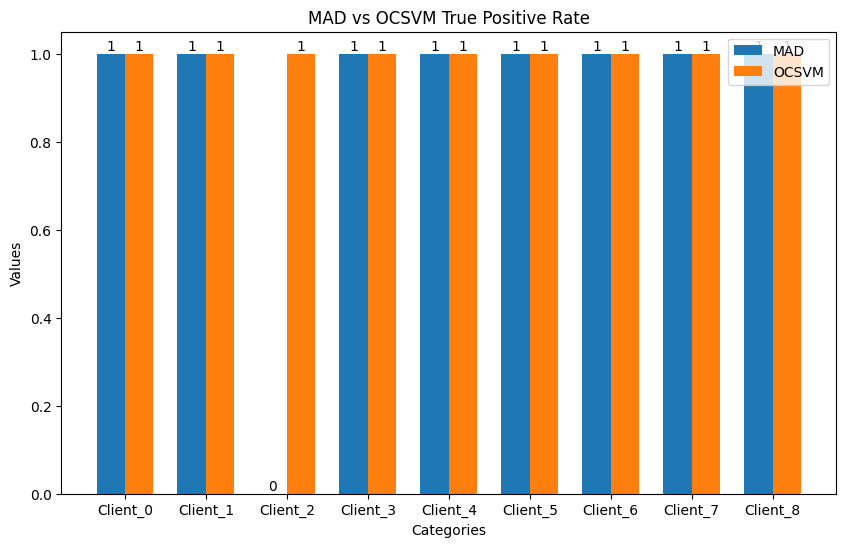

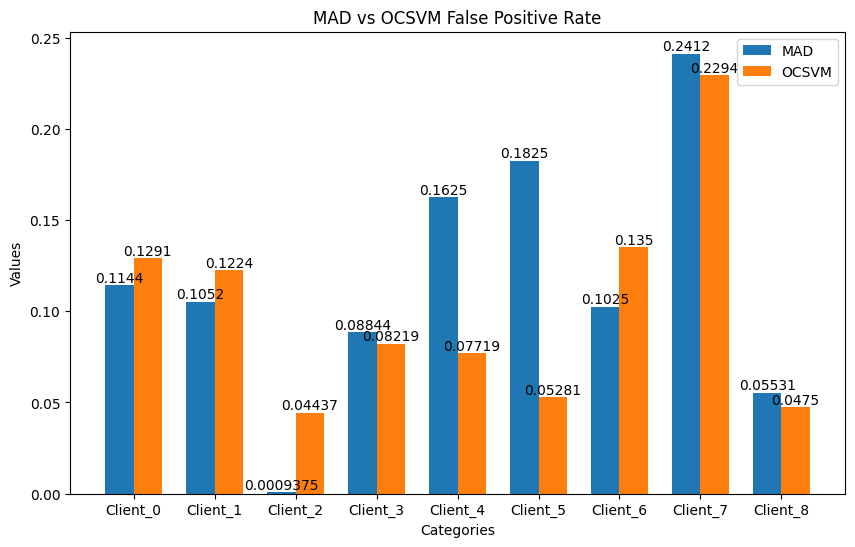

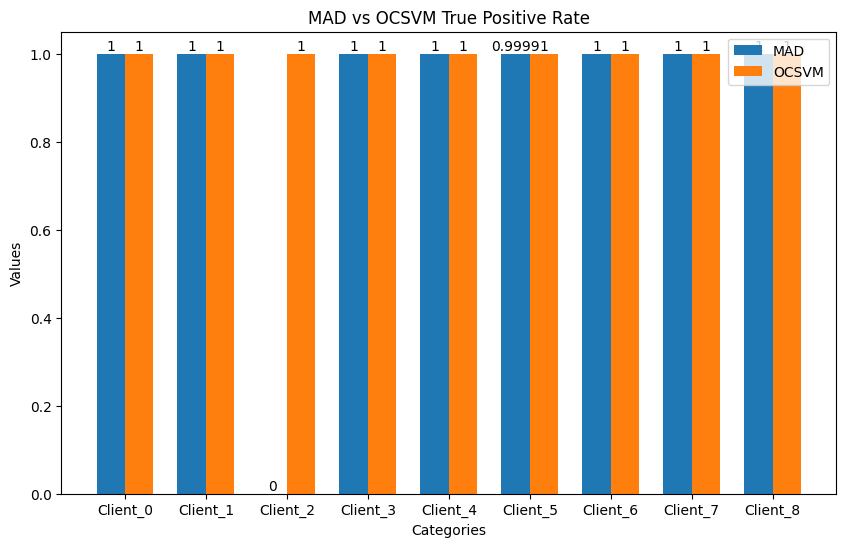

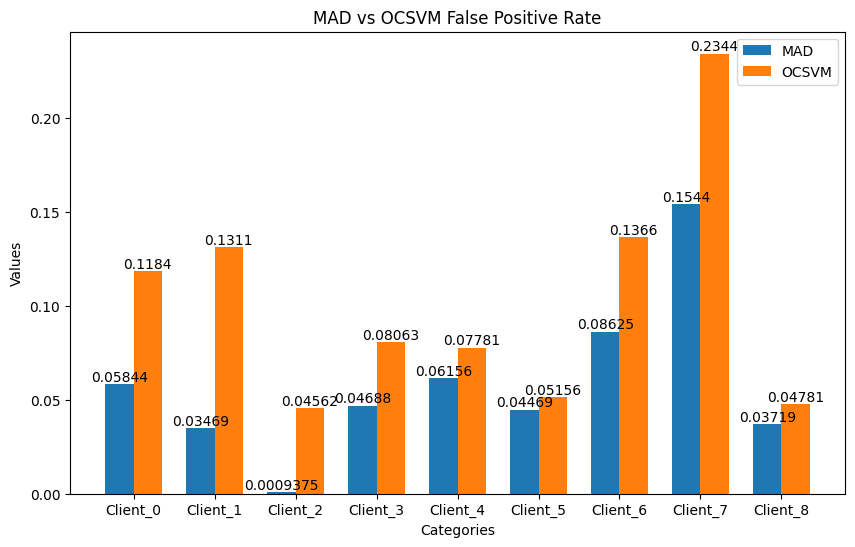

...

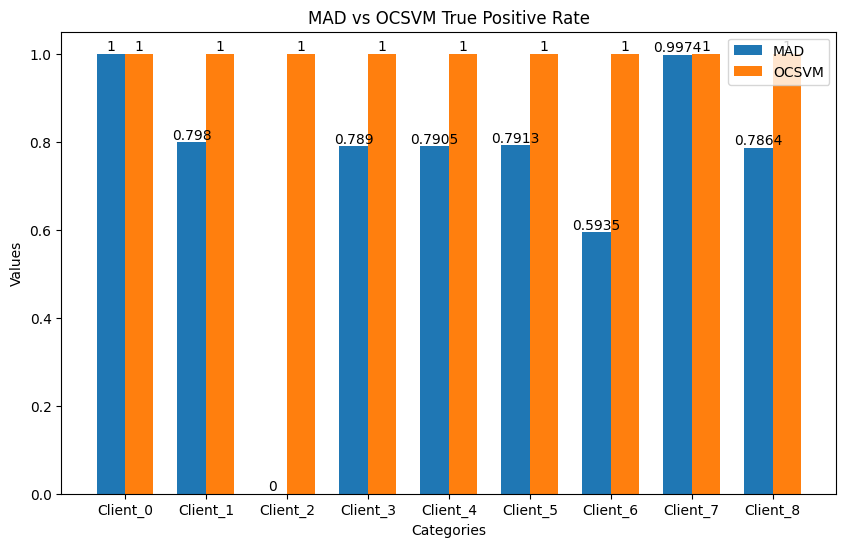

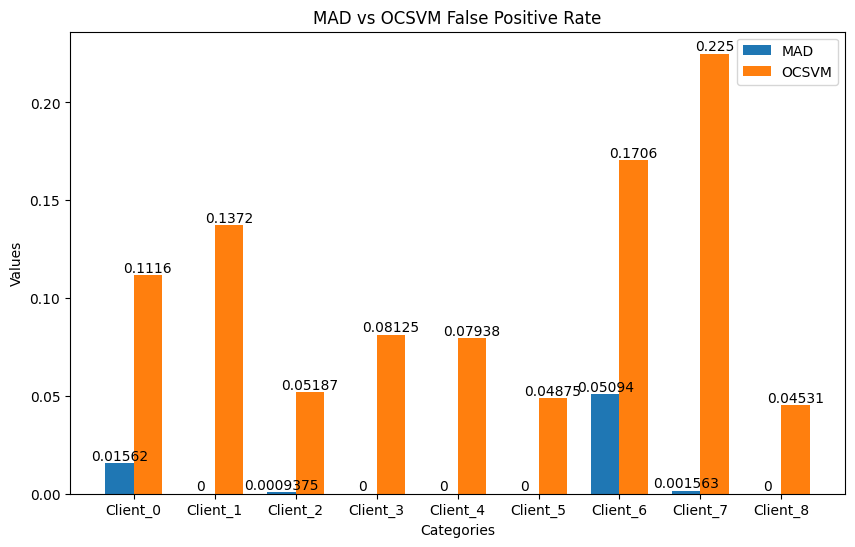

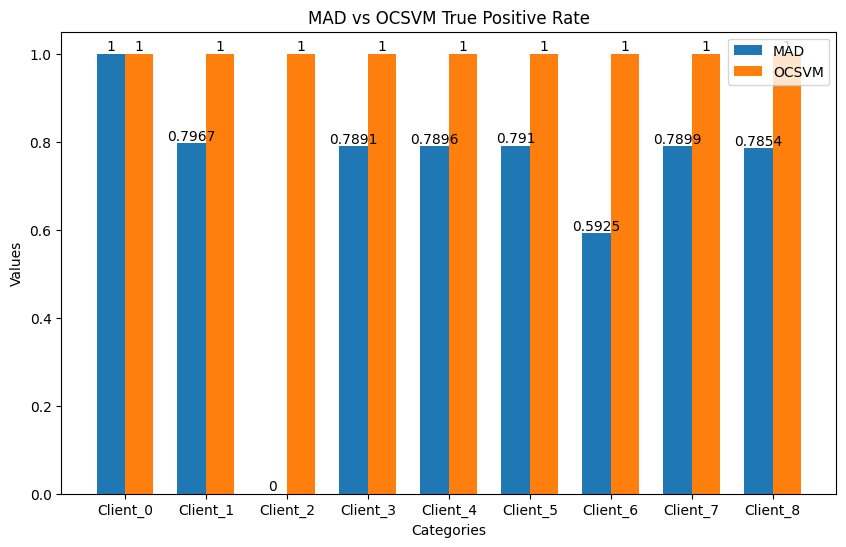

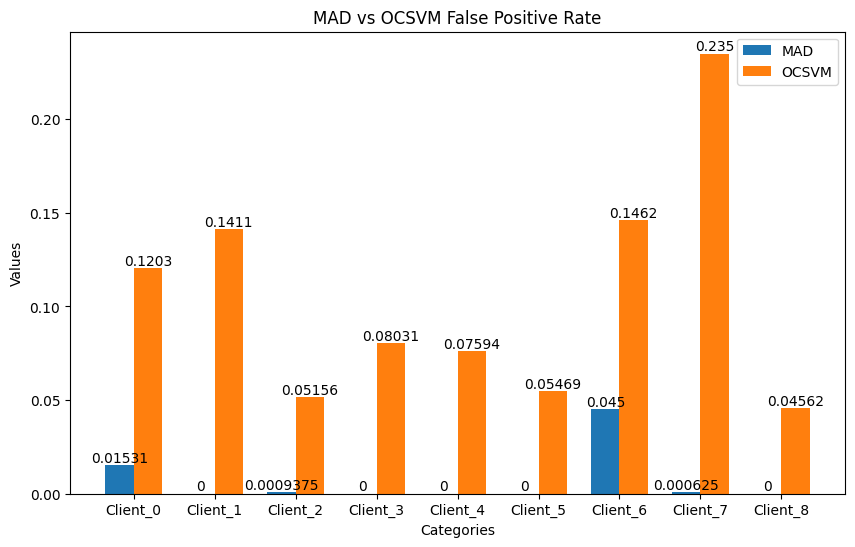

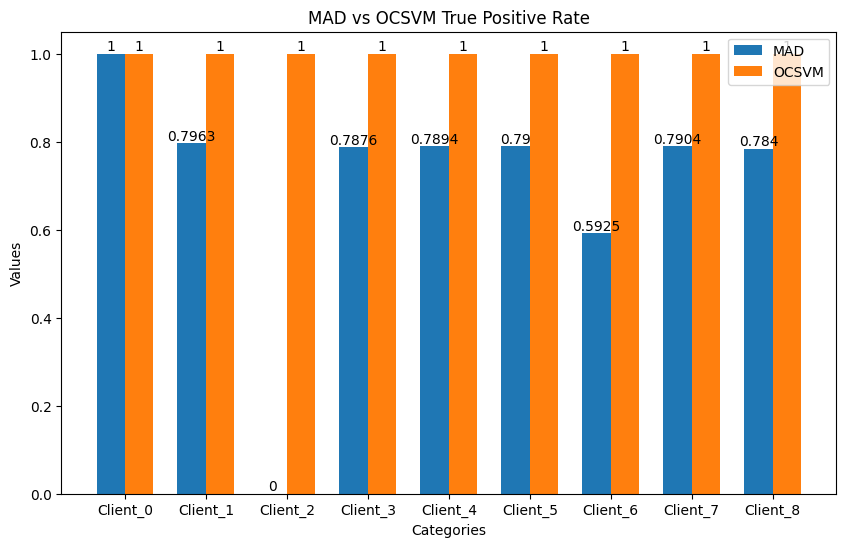

In [ ]:
## threshold-based std against k
from sklearn.metrics import auc
fpr_list = []
tpr_list = []
auc_list = []
for K in range(10):
  history_MAD,_ = run_test_OCSVM(K,0.05, threshold_type = 'std')
  fpr = history_MAD['fpr']
  fpr_list.append(fpr)
  tpr = history_MAD['tpr']
  tpr_list.append(tpr)
fpr_array = np.array(fpr_list)
tpr_array = np.array(tpr_list)

(10,)
(10,)
(10,)
(10,)
(10,)
(10,)
(10,)
(10,)
(10,)
(10,)
(10,)
(10,)
(10,)
(10,)
(10,)
(10,)
(10,)
(10,)


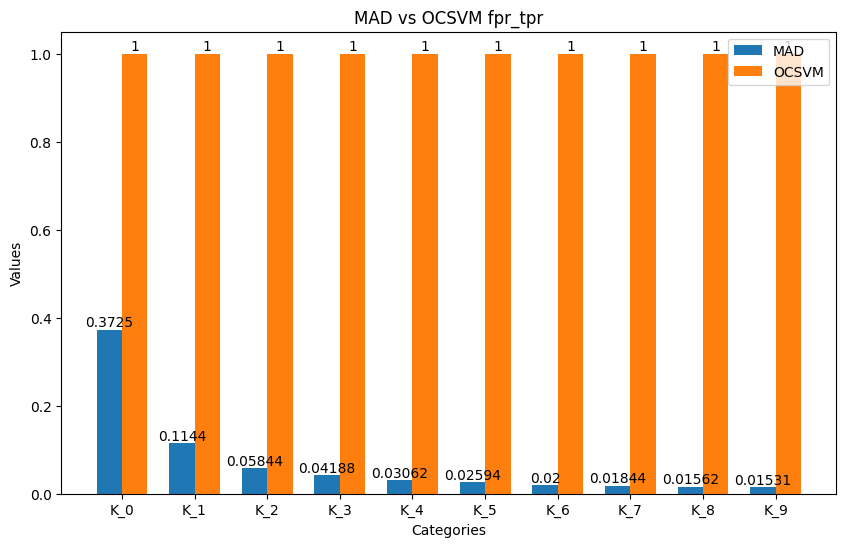

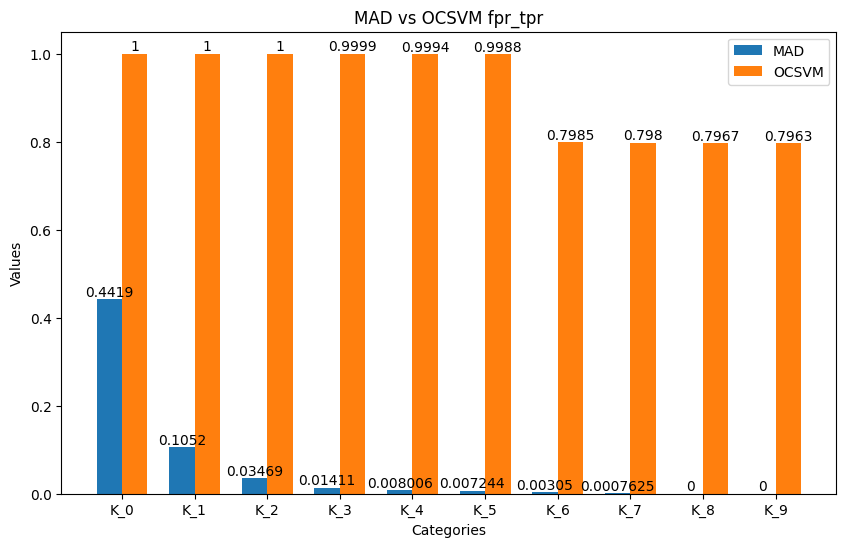

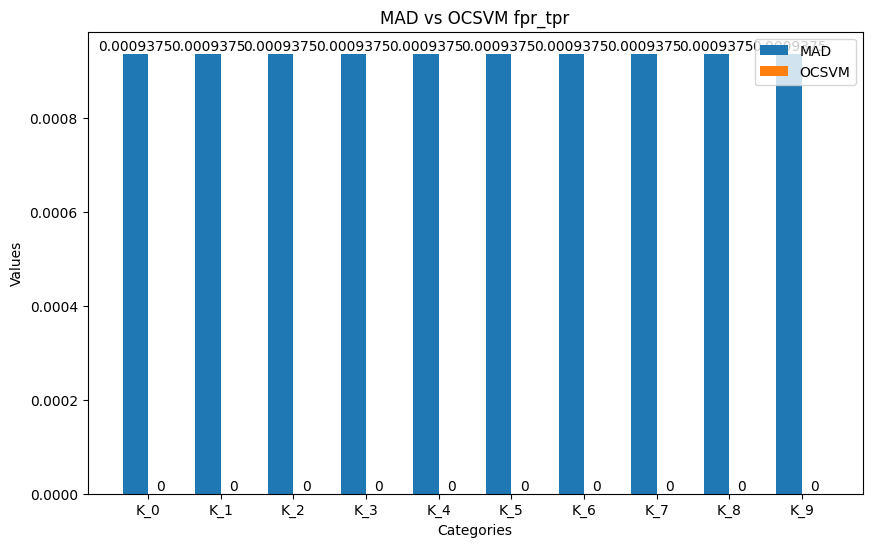

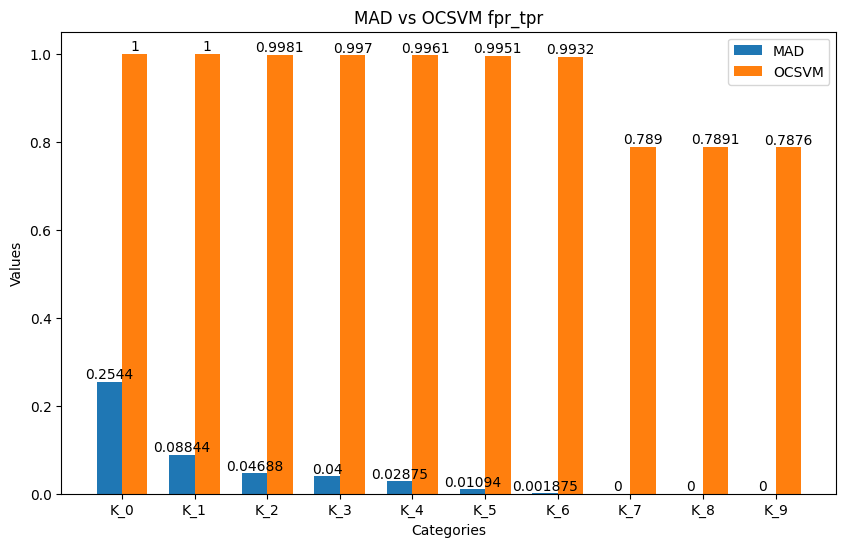

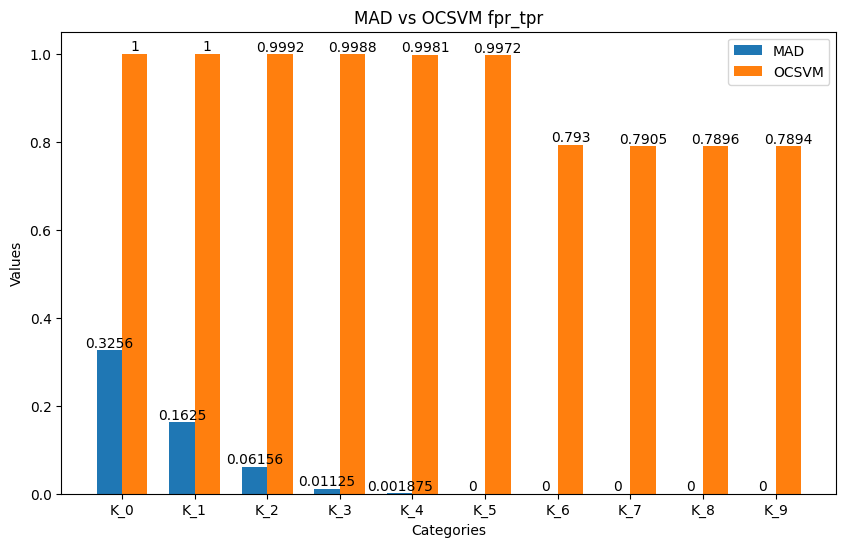

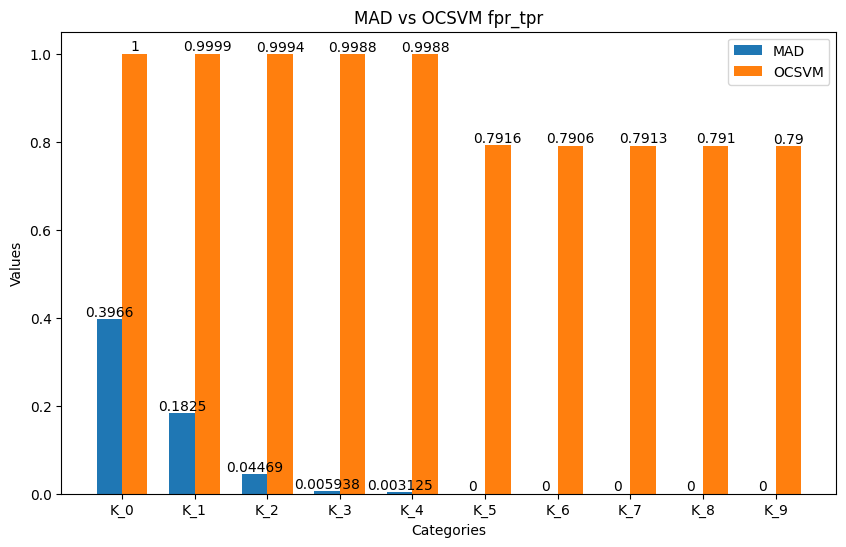

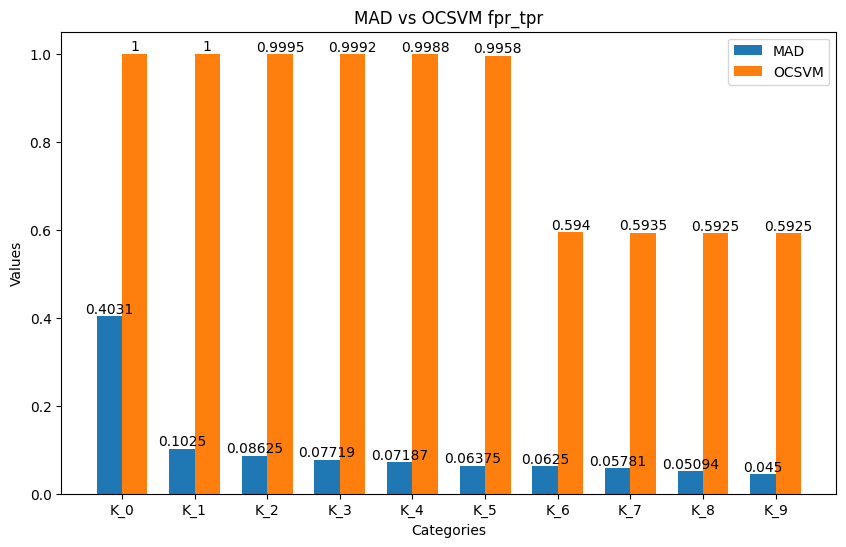

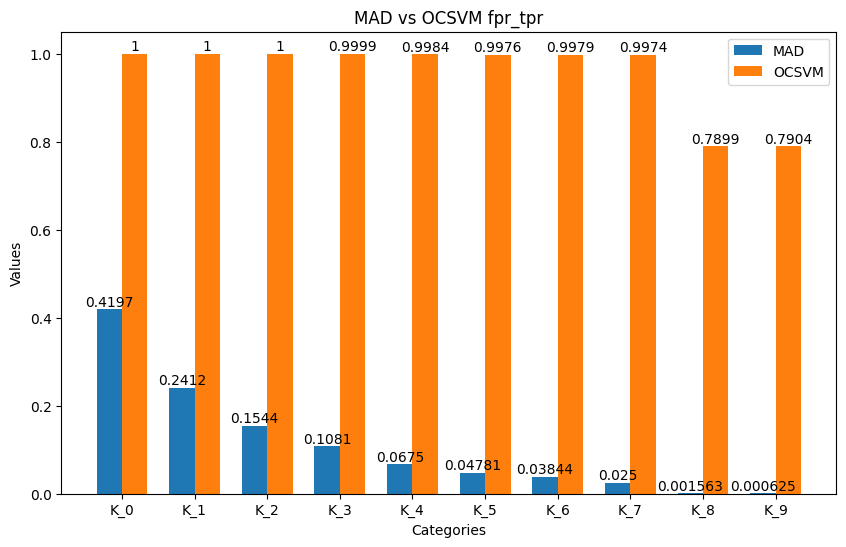

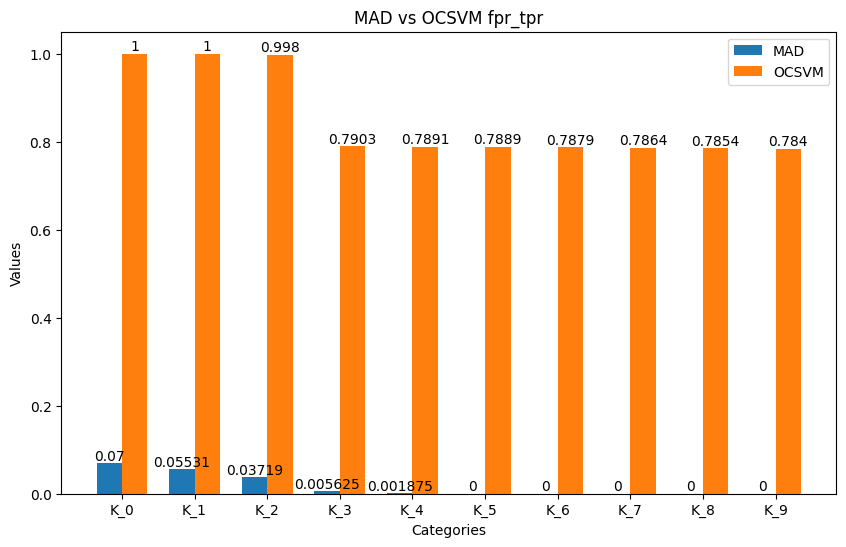

In [ ]:
## With STD
from sklearn.metrics import auc
auc_k_list = []
for client_id in range(9):
  fpr_K_list = fpr_array[:,client_id]
  print(fpr_K_list.shape)
  tpr_K_list = tpr_array[:,client_id]
  print(tpr_K_list.shape)
  plot_barchart(fpr_K_list,tpr_K_list,'fpr_tpr',labels = [f'K_{i}' for i in range(10)])

In [ ]:
# with MAD threshold selection
from sklearn.metrics import roc_curve, auc
def run_test_individual(K):
  client_thresholds = []
  client_fpr = []
  client_tpr = []
  client_roc_auc = []
  for client in range(9):
    trainloader, valloader, benign_testloader,attack_testloader = load_datasets(final_df,'Autoencoder',partition_id=client,label_col_num = 3)
    net = Autoencoder(115,58,29)
    print(f'CLIENT:{client}')
    for epoch in range(5):
        train(net, trainloader, 1)
        loss,loss_history= validation(net, valloader)
        ## find threshold based on median absolute deviation
        RE_MED = np.median(loss_history)
        RE_MAD = np.median(np.abs(loss_history - RE_MED))
        threshold = RE_MED + K*RE_MAD

        ## find threshold based on clustering
        # Reshape the data to 2D (K-Means requires a 2D array)
        #values_reshaped = np.array(values).reshape(-1, 1)

        # Specify the number of clusters
        #k = 2  # Adjust this to your desired number of clusters

        # Apply K-Means clustering
        #kmeans = KMeans(n_clusters=k, random_state=42)
        #clusters = kmeans.fit_predict(values_reshaped)

        print(f"Epoch {epoch+1}: validation loss {loss}")
        print(f'threshold:{threshold}')
    client_thresholds.append(threshold)
    benign_MSE, benign_MSE_history,false_positive = test(net, benign_testloader,threshold = threshold)
    print(benign_MSE_history)
    attack_MSE, attack_MSE_history,true_positive = test(net, attack_testloader,threshold = threshold)
    print(attack_MSE_history)
    fpr,tpr,tnr,fnr = false_positive,true_positive,1-false_positive,1-true_positive
    client_fpr.append(fpr)
    client_tpr.append(tpr)
    print(f'False Positive Rate:{fpr}')
    print(f'True Positive Rate:{tpr}')
    print(f'benign_error:{benign_MSE}')
    print(f'attack_error:{attack_MSE}')
    roc_auc = plot_roc(benign_MSE_history,attack_MSE_history,plot = False)
    client_roc_auc.append(roc_auc)
    history = {'thresholds':client_thresholds,'fpr':client_fpr,'tpr':client_tpr,'roc_auc':client_roc_auc}
  return client_thresholds,client_fpr,client_tpr,roc_auc

# **Federated Learning**

### **Define the ClientApp**

In [64]:
import joblib

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [15]:
def set_parameters(net, parameters: List[np.ndarray]):
    params_dict = zip(net.state_dict().keys(), parameters)
    state_dict = OrderedDict({k: torch.Tensor(v) for k, v in params_dict})
    net.load_state_dict(state_dict, strict=True)


def get_parameters(net) -> List[np.ndarray]:
    return [val.cpu().numpy() for _, val in net.state_dict().items()]

In [128]:
## The first step toward creating a ClientApp is to implement a subclasses of flwr.client.Client or flwr.client.NumPyClient.
## We use NumPyClient in this tutorial because it is easier to implement and requires us to write less boilerplate.
class FlowerClient_Train(NumPyClient):
    def __init__(self, net, partition_id,trainloader, valloader, benign_testloader, attack_testloader):
        self.net = net
        self.trainloader = trainloader
        self.valloader = valloader
        self.benign_testloader = benign_testloader
        self.attack_testloader = attack_testloader
        self.partition_id = partition_id

    def get_parameters(self, config):
        return get_parameters(self.net)
    ## Training
    def fit(self, parameters, config):
      print(f"[Client {self.partition_id}] fit, config: {config}")
      set_parameters(self.net, parameters)
      loss = train(self.net, self.trainloader, num_epochs=4)
      return get_parameters(self.net), len(self.trainloader), {'train_loss':loss}
    ## Validation on subset of benign data to select threshold
    def evaluate(self, parameters, config):
      print(f"[Client {self.partition_id}] evaluate, config: {config}")
      set_parameters(self.net, parameters)
      loss,val_loss_history,valid_unreduced_loss = validation(self.net,self.valloader)
      val_loss_history = np.array(val_loss_history)
      ## calculate threshold based on MAD to make it more robust to outliers in normal data
      '''
      median = np.median(val_loss_history)
      MAD = np.median(np.abs(val_loss_history - median))
      threshold = median +10*MAD
      '''
      ## calculate threshold based on standard deviation after filtering out the outliers with IQR
      q1 = np.percentile(val_loss_history, 25)
      q3 = np.percentile(val_loss_history, 75)
      iqr = q3 - q1
      lower_bound = q1 - 1.5 * iqr
      upper_bound = q3 + 1.5 * iqr
      val_loss_history_filtered = val_loss_history[(val_loss_history >= lower_bound) & (val_loss_history <= upper_bound)]
      #print(f'original loss:{len(loss_history)}')
      #print(f'filtered loss:{len(loss_history_filtered)}')
      mean = np.mean(val_loss_history_filtered)
      std = np.std(val_loss_history_filtered)
      threshold = mean + 3*std
      # train a linear one class SVM to find anomalous data
      svm = OneClassSVM(kernel='linear', nu=0.5)
      svm.fit(val_loss_history_filtered.reshape(-1, 1))
      #outlier_scores = svm.decision_function(val_loss_history.reshape(-1, 1))
      # save the one-class svm model fit on the local validation set
      joblib.dump(svm, f'svm_model_{self.partition_id}.pkl')
      print(f'mean_valid_loss:{np.mean(val_loss_history)}')
      return float(loss), len(self.valloader), {'Client':self.partition_id,'validation_loss':loss,'validation_threshold':threshold}

In [17]:
## The first step toward creating a ClientApp is to implement a subclasses of flwr.client.Client or flwr.client.NumPyClient.
## We use NumPyClient in this tutorial because it is easier to implement and requires us to write less boilerplate.
class FlowerClient_Test(NumPyClient):
    def __init__(self, net, partition_id,trainloader, valloader, benign_testloader, attack_testloader):
        self.net = net
        self.trainloader = trainloader
        self.valloader = valloader
        self.benign_testloader = benign_testloader
        self.attack_testloader = attack_testloader
        self.partition_id = partition_id

    def get_parameters(self, config):
        return get_parameters(self.net)
    ## Federated Training
    def fit(self, parameters, config):
      print(f"[Client {self.partition_id}] fit, config: {config}")
      set_parameters(self.net, parameters)
      train(self.net, self.trainloader, num_epochs=4)
      return get_parameters(self.net), len(self.trainloader), {}
    ## Federated Evaluation (client-side evaluation)
    def evaluate(self, parameters, config):
      print(f"[Client {self.partition_id}] evaluate, config: {config}")
      set_parameters(self.net, parameters)
      loss, benign_loss, benign_loss_array = test(self.net, self.benign_testloader)
      loss, attack_loss, attack_loss_array = test(self.net, self.attack_testloader)
      return float(loss), len(self.valloader), {"benign_MSE": benign_loss,"attack_MSE":attack_loss}

 To enable the Flower framework to create clients when necessary, we need to implement a function that creates a FlowerClient instance on demand. We typically call this function client_fn. Flower calls client_fn whenever it needs an instance of one particular client to call fit or evaluate

In [ ]:
layer_sizes

[115, 87, 58, 29]

## **Configure client function for training and threshold-selection**

In [18]:
def client_fn_train(context: Context) -> Client:
    """Create a Flower client representing a single organization."""

    # Load model
    #net = Autoencoder(115,58,29).to(DEVICE)
    #net = Autoencoder(115,58,29)
    net = Autoencoder_4_layers(layer_sizes)
    #net = Autoencoder_2_layers(35,15)

    # Load data (CIFAR-10)
    # Note: each client gets a different trainloader/valloader, so each client
    # will train and evaluate on their own unique data partition
    # Read the node_config to fetch data partition associated to this node
    # The value of partition-id is retrieved from the node_config dictionary in the Context object, which holds the information that persists throughout each training round.
    partition_id = int(context.node_config["partition-id"])
    trainloader, valloader, benign_testloader,attack_testloader = load_datasets(final_df, 'Autoencoder',partition_id=partition_id,label_col_num = 3)

    # Create a single Flower client representing a single organization
    # FlowerClient is a subclass of NumPyClient, so we need to call .to_client()
    # to convert it to a subclass of `flwr.client.Client`
    return FlowerClient_Train(net, partition_id,trainloader, valloader,benign_testloader,attack_testloader).to_client()


# Create the ClientApp
client = ClientApp(client_fn=client_fn_train)

### **Define the ServerApp**

### **Define client resources**

In [ ]:
# Specify the resources each of your clients need
# By default, each client will be allocated 1x CPU and 0x GPUs
backend_config = {"client_resources": {"num_cpus": 1, "num_gpus": 0.0}}

# When running on GPU, assign an entire GPU for each client
if DEVICE.type == "cuda":
    backend_config = {"client_resources": {"num_cpus": 1, "num_gpus": 0}}
    # Refer to our Flower framework documentation for more details about Flower simulations
    # and how to set up the `backend_config`

In [ ]:
DEVICE

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


device(type='cuda')

### **Define metrics**

In [19]:
## Select the max loss from validation dataset as the threshold
def max_loss(metrics: List[Tuple[int, Metrics]]) -> Metrics:
  client_valid_loss = [m['validation_loss'] for _,m in metrics]
  print(client_valid_loss)
  client_max_loss = client_valid_loss.index(max(client_valid_loss))
  return {'max_loss':max(client_valid_loss),'client_max_loss':client_max_loss}

In [73]:
def threshold_selection(metrics: List[Tuple[int, Metrics]]) -> Metrics:
  client_valid_threshold = [m['validation_threshold'] for _,m in metrics]
  client_id = [m['Client'] for _,m in metrics]
  for id,threshold in zip(client_id,client_valid_threshold):
    print(f'Client {id} threshold: {threshold}')
  sorted_data = sorted(zip(client_id, client_valid_threshold), key=lambda x: x[0])
  sorted_client_id, sorted_client_valid_threshold = zip(*sorted_data)
  aggregate_threshold_mean = np.mean(client_valid_threshold)
  aggregate_threshold_std = np.std(client_valid_threshold)
  return {'aggregate_threshold_mean':aggregate_threshold_mean,'aggregate_threshold_std':aggregate_threshold_std,'client_thresholds':sorted_client_valid_threshold}

In [ ]:
def fit_config(server_round: int):
  config = {
        "server_round": server_round,  # The current round of federated learning
        "local_epochs": 1 if server_round < 2 else 2,
    }

In [ ]:
def OCSVM(metrics: List[Tuple[int, Metrics]]):


In [21]:
## Return average training loss
def average_loss(metrics: List[Tuple[int, Metrics]]) -> Metrics:
  client_train_loss = [m['train_loss'] for num_examples,m in metrics]
  print(client_train_loss)
  return {'train_loss':sum(client_train_loss)/len(client_train_loss)}

In [22]:
def weighted_average(metrics: List[Tuple[int, Metrics]]) -> Metrics:
    # Multiply accuracy of each client by number of examples used
    accuracies = [num_examples * m["accuracy"] for num_examples, m in metrics]
    examples = [num_examples for num_examples, _ in metrics]

    # Aggregate and return custom metric (weighted average)
    return {"accuracy": sum(accuracies) / sum(examples)}

## **Save global model**

In [80]:
global_model_trained = Autoencoder(115,58,29)

In [115]:
global_model_trained = Autoencoder_4_layers(layer_sizes)

In [ ]:
global_model_trained = Autoencoder_2_layers(35,15)

In [24]:
from typing import Union, Optional, Dict
from flwr.server.client_proxy import ClientProxy
from flwr.common import FitRes,Parameters, FitIns, EvaluateRes
from flwr.server.client_manager import ClientManager
from flwr.server.strategy import FedAdam

class SaveModelStrategy(FedAdam):
    def __init__(self,
                 *,
                 patience:int,
                 **kwargs):
       super().__init__(**kwargs)
       self.best_eval_thres = float('inf')
       self.server_rounds_without_improvement = 0
       self.patience = patience
       self.current_model_params = None
       self.update_params = False

    def aggregate_fit(
        self,
        server_round: int,
        results: List[Tuple[flwr.server.client_proxy.ClientProxy, flwr.common.FitRes]],
        failures: List[Union[Tuple[ClientProxy, FitRes], BaseException]],
    ) -> Tuple[Optional[Parameters], Dict[str, Scalar]]:
        """Aggregate model weights using weighted average and store checkpoint"""

        # Call aggregate_fit from base class (FedAvg) to aggregate parameters and metrics
        aggregated_parameters, aggregated_metrics = super().aggregate_fit(
            server_round, results, failures
        )

        if aggregated_parameters is not None:
          aggregated_ndarrays: List[np.ndarray] = flwr.common.parameters_to_ndarrays(
                aggregated_parameters
            )
          self.current_model_params = aggregated_ndarrays

        return aggregated_parameters, aggregated_metrics

    def aggregate_evaluate(
        self,
        server_round: int,
        results: list[tuple[ClientProxy, EvaluateRes]],
        failures: list[Union[tuple[ClientProxy, EvaluateRes], BaseException]],
    ) -> tuple[Optional[float], dict[str, Scalar]]:

        loss_aggregated, metrics_aggregated = super().aggregate_evaluate(server_round, results, failures)
        # Get current highest threshold on the client-side validation set
        current_eval_thres = metrics_aggregated['aggregate_threshold_mean']

        if current_eval_thres < self.best_eval_thres:
          self.server_rounds_without_improvement = 0
          # Update the best threshold
          self.best_eval_thres = current_eval_thres
          self.update_params = True
          print('Lowest validation threshold updated')
          # Save the model if the threshold is the lowest
          params_dict = zip(global_model_trained.state_dict().keys(), self.current_model_params)
          state_dict = OrderedDict({k: torch.tensor(v) for k, v in params_dict})
          global_model_trained.load_state_dict(state_dict, strict=True)
          print(f'Saving model at round {server_round}')
          torch.save(global_model_trained.state_dict(), f"model_round_{server_round}.pth")
        else:
          self.server_rounds_without_improvement += 1
          self.update_parms = False
          print(f"No improvement in validation loss for {self.server_rounds_without_improvement} round(s)")
        if self.server_rounds_without_improvement >= self.patience:
          print(f"Early stopping triggered at round {server_round}")

        return loss_aggregated, metrics_aggregated






In [25]:
NUM_CLIENTS = 9

In [ ]:
def server_fn(context: Context) -> ServerAppComponents:
    """Construct components that set the ServerApp behaviour.

    You can use settings in `context.run_config` to parameterize the
    construction of all elements (e.g the strategy or the number of rounds)
    wrapped in the returned ServerAppComponents object.
    """

    # Create FedAvg strategy
    strategy = SaveModelStrategy(
        fraction_fit=1,
        fraction_evaluate=1,
        min_fit_clients=1,
        min_evaluate_clients=1,
        min_available_clients=9,
        evaluate_metrics_aggregation_fn=threshold_selection,  # <-- pass the metric aggregation function, return the max loss in each validation round
        fit_metrics_aggregation_fn=average_loss,
        patience = 15
    )

    # Configure the server for 10 rounds of training
    config = ServerConfig(num_rounds=50)

    return ServerAppComponents(strategy=strategy, config=config)

In [ ]:
backend_config

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


{'client_resources': {'num_cpus': 1, 'num_gpus': 0},
 'init_args': {'logging_level': 30, 'log_to_driver': True},
 'actor': {'tensorflow': 0}}

In [66]:
global_model_trained = Autoencoder()

In [116]:
state_dict_ndarrays = [v.cpu().numpy() for v in global_model_trained.state_dict().values()]
initial_parameters = flwr.common.ndarrays_to_parameters(state_dict_ndarrays)

## **Hyperparameter tuning**

In [84]:
def objective(trial):
  strategy = SaveModelStrategy(
        fraction_fit=1,
        fraction_evaluate=1,
        min_fit_clients=1,
        min_evaluate_clients=1,
        min_available_clients=9,
        initial_parameters = initial_parameters,
        evaluate_metrics_aggregation_fn=threshold_selection,  # <-- pass the metric aggregation function, return the max loss in each validation round
        fit_metrics_aggregation_fn=average_loss,
        patience = 15,
        eta = trial.suggest_float('eta',1e-3,1e-1),
        eta_l = trial.suggest_float('eta_l',1e-3,5e-3),
        beta_1 = trial.suggest_float('beta_1',0.9,0.99),
        beta_2 = trial.suggest_float('beta_2',0.99,0.999),
        tau = trial.suggest_float('tau',1e-9,1e-8)
    )

  history_train = flwr.simulation.start_simulation(
          client_fn=client_fn_train,  # a function that spawns a particular client
          num_clients=NUM_CLIENTS,  # total number of clients
          config=flwr.server.ServerConfig(
              num_rounds=10
          ),  # minimal config for the server loop telling the number of rounds in FL
          strategy=strategy,  # our strategy of choice
          client_resources={
              "num_cpus": 1,
              "num_gpus": 0.0,
          },  # (optional) controls the degree of parallelism of your simulation.
          # Lower resources per client allow for more clients to run concurrently
          # (but need to be set taking into account the compute/memory footprint of your run)
          # `num_cpus` is an absolute number (integer) indicating the number of threads a client should be allocated
          # `num_gpus` is a ratio indicating the portion of gpu memory that a client needs.
      )
  return min([i[1] for i in history_train.metrics_distributed['aggregate_threshold_mean']])

In [85]:
study = optuna.create_study()
study.optimize(objective, n_trials=30)

[I 2024-11-27 12:37:05,780] A new study created in memory with name: no-name-048a0927-22b9-43e8-803f-99f82a79dd7c
	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=10, no round_timeout
2024-11-27 12:37:09,736	INFO worker.py:1752 -- Started a local Ray instance.
INFO :      Flower VCE: Ray initialized with resources: {'CPU': 8.0, 'memory': 32672383796.0, 'object_store_memory': 16336191897.0, 'node:172.28.0.12': 1.0, 'node:__internal_head__': 1.0}
INFO :      Optimize your simulation with Flower VCE: https://flower.ai/docs/framework/how-to-run-simulations.html
INFO :      Flower VCE: Resourc

(ClientAppActor pid=268765) [Client 0] fit, config: {}
(ClientAppActor pid=268765) Epoch [1/4], Train Loss: 0.1290


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04694124683737755, 0.02330075018107891, 0.026573525741696358, 0.07415894418954849, 0.05228617414832115, 0.06188037991523743, 0.06469976902008057, 0.03487520292401314, 0.07480370253324509]
(ClientAppActor pid=268765) [Client 0] evaluate, config: {}
(ClientAppActor pid=268765) [Client 2] fit, config: {} [repeated 8x across cluster]
(ClientAppActor pid=268765) mean_valid_loss:0.28832759017077014


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 2]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 7 threshold: 0.3523866159783702
Client 4 threshold: 0.246483790435222
Client 5 threshold: 0.2879055275697986
Client 1 threshold: 0.2463885268638961
Client 0 threshold: 0.3079355547836703
Client 8 threshold: 0.23269523064672165
Client 3 threshold: 0.19369515480764837
Client 6 threshold: 0.44513473062810827
Client 2 threshold: 0.28462175280015467
Lowest validation threshold updated
Saving model at round 1
(ClientAppActor pid=268772) Epoch [1/4], Train Loss: 0.1166 [repeated 38x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03300976753234863, 0.06562269479036331, 0.046228114515542984, 0.024666737765073776, 0.055933400988578796, 0.04324212670326233, 0.052357301115989685, 0.029571307823061943, 0.02107156813144684]
(ClientAppActor pid=268764) [Client 3] evaluate, config: {} [repeated 12x across cluster]
(ClientAppActor pid=268765) [Client 8] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=268768) mean_valid_loss:0.26372991269693163 [repeated 11x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 3]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 7 threshold: 0.45034075637266463
Client 5 threshold: 0.3418503608036283
Client 3 threshold: 0.19214647867572007
Client 8 threshold: 0.33251084658849733
Client 0 threshold: 0.19930847557760373
Client 4 threshold: 0.2774537822406923
Client 2 threshold: 0.34762412998961706
Client 1 threshold: 0.3952909628042066
Client 6 threshold: 0.5665819861942964
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=268771) Epoch [1/4], Train Loss: 0.0866 [repeated 38x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.027369029819965363, 0.036542411893606186, 0.019374309107661247, 0.03766482323408127, 0.04623190686106682, 0.04403660446405411, 0.05789496749639511, 0.030758634209632874, 0.018148062750697136]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 4]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 8 threshold: 0.28273613868533515
Client 6 threshold: 0.24791498904691534
Client 1 threshold: 0.3505238766583064
Client 7 threshold: 0.24478767209164265
Client 5 threshold: 0.2706601744648388
Client 3 threshold: 0.19271765794657564
Client 4 threshold: 0.2290094954490219
Client 0 threshold: 0.24071429136681172
Client 2 threshold: 0.29041727678250207
Lowest validation threshold updated
Saving model at round 3
(ClientAppActor pid=268767) [Client 3] evaluate, config: {} [repeated 14x across cluster]
(ClientAppActor pid=268766) [Client 8] fit, config: {} [repeated 11x across cluster]
(ClientAppActor pid=268767) mean_valid_loss:0.19069986480455367 [repeated 15x across cluster]
(ClientAppActor pid=268770) Epoch [4/4], Train Loss: 0.0290 [repeated 47x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04190659150481224, 0.026142222806811333, 0.016003355383872986, 0.05289236828684807, 0.028990676626563072, 0.03556646779179573, 0.032949309796094894, 0.04175645858049393, 0.017027508467435837]
(ClientAppActor pid=268771) [Client 4] evaluate, config: {} [repeated 6x across cluster]
(ClientAppActor pid=268770) [Client 5] fit, config: {} [repeated 7x across cluster]
(ClientAppActor pid=268766) mean_valid_loss:0.23082342852849627 [repeated 5x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 5]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 5 threshold: 0.2830932326796135
Client 4 threshold: 0.1189175276153169
Client 7 threshold: 0.35900803458080727
Client 3 threshold: 0.16214398884111
Client 8 threshold: 0.39999364862558406
Client 0 threshold: 0.37541930040340554
Client 2 threshold: 0.18521948217108214
Client 6 threshold: 0.3639261984445996
Client 1 threshold: 0.4012115323765063
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=268768) Epoch [2/4], Train Loss: 0.0459 [repeated 34x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.024209963157773018, 0.014635485596954823, 0.03456544131040573, 0.016022585332393646, 0.03938361629843712, 0.0397624708712101, 0.05000152066349983, 0.031193764880299568, 0.027359073981642723]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 6]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 8 threshold: 0.48728143825074943
Client 7 threshold: 0.43099166788873955
Client 5 threshold: 0.3022995119528138
Client 0 threshold: 0.345487631981923
Client 4 threshold: 0.13735422175093914
Client 1 threshold: 0.47731320152625184
Client 6 threshold: 0.4006541349891629
Client 3 threshold: 0.1172762418620403
Client 2 threshold: 0.28332862147130145
No improvement in validation loss for 2 round(s)
(ClientAppActor pid=268771) [Client 8] evaluate, config: {} [repeated 12x across cluster]
(ClientAppActor pid=268764) [Client 2] fit, config: {} [repeated 17x across cluster]
(ClientAppActor pid=268770) mean_valid_loss:0.19042236274227692 [repeated 13x across cluster]
(ClientAppActor pid=268764) Epoch [4/4], Train Loss: 0.0344 [repeated 53x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.015811601653695107, 0.034360121935606, 0.022119423374533653, 0.026930663734674454, 0.013933833688497543, 0.037650950253009796, 0.046896886080503464, 0.029433194547891617, 0.039574816823005676]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 7]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 7 threshold: 0.37494143662648377
Client 8 threshold: 0.4358902651658807
Client 6 threshold: 0.3440495945887858
Client 0 threshold: 0.17643435224514661
Client 2 threshold: 0.35382854799518126
Client 5 threshold: 0.2846975319592161
Client 3 threshold: 0.13170451759386373
Client 1 threshold: 0.43019827276036826
Client 4 threshold: 0.19520596313388872
No improvement in validation loss for 3 round(s)
(ClientAppActor pid=268768) [Client 6] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=268771) [Client 1] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=268768) mean_valid_loss:0.2009880915057296 [repeated 9x across cluster]
(ClientAppActor pid=268771) Epoch [2/4], Train Loss: 0.0399 [repeated 39x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.02604684606194496, 0.03833947330713272, 0.0392269641160965, 0.013429767452180386, 0.028258610516786575, 0.04464569687843323, 0.01552274264395237, 0.03341208025813103, 0.020823143422603607]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 8]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 1 threshold: 0.31265316999247134
Client 0 threshold: 0.17207831008442465
Client 8 threshold: 0.21830032498612337
Client 3 threshold: 0.13952885138600538
Client 6 threshold: 0.29648187073183774
Client 4 threshold: 0.23278644411561916
Client 2 threshold: 0.35774638633413525
Client 5 threshold: 0.3210101097196748
Client 7 threshold: 0.23690696276719186
Lowest validation threshold updated
Saving model at round 7
(ClientAppActor pid=268768) [Client 3] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=268764) [Client 2] fit, config: {} [repeated 10x across cluster]
(ClientAppActor pid=268768) mean_valid_loss:0.13089458545765434 [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.035657551139593124, 0.02644195593893528, 0.025556225329637527, 0.013179232366383076, 0.03731187805533409, 0.0150592727586627, 0.04420575499534607, 0.032308802008628845, 0.020746521651744843]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 9]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 1 threshold: 0.2689754204517106
Client 6 threshold: 0.3000431303674922
Client 7 threshold: 0.2548250851806597
Client 5 threshold: 0.3088885487639668
Client 4 threshold: 0.1668356122214363
Client 0 threshold: 0.15015933728012104
Client 3 threshold: 0.09624041420053185
Client 2 threshold: 0.33411710653606586
Client 8 threshold: 0.1306867487415946
Lowest validation threshold updated
Saving model at round 8
(ClientAppActor pid=268764) Epoch [4/4], Train Loss: 0.0323 [repeated 38x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.013338558375835419, 0.014328479766845703, 0.019165730103850365, 0.03127916157245636, 0.03469720855355263, 0.025279175490140915, 0.042287763208150864, 0.025764768943190575, 0.033643268048763275]
(ClientAppActor pid=268770) [Client 7] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=268768) [Client 6] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=268770) mean_valid_loss:0.15106727801717054 [repeated 9x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 10]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 4 threshold: 0.127991488867948
Client 7 threshold: 0.25098089470243423
Client 2 threshold: 0.2740515947657507
Client 1 threshold: 0.2404490909370706
Client 6 threshold: 0.2878958744944461
Client 0 threshold: 0.1561950105073524
Client 5 threshold: 0.2535928947542282
Client 8 threshold: 0.15160159420667593
Client 3 threshold: 0.07228873056654692
Lowest validation threshold updated
Saving model at round 9
(ClientAppActor pid=268764) Epoch [2/4], Train Loss: 0.0310 [repeated 47x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.01390982884913683, 0.013248024508357048, 0.03635752946138382, 0.030438873916864395, 0.04297303780913353, 0.025186892598867416, 0.01904781349003315, 0.024510320276021957, 0.03419504314661026]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [SUMMARY]
INFO :      Run finished 10 round(s) in 53.91s
INFO :      	History (loss, distributed):
INFO :      		round 1: 32.94422010346379
INFO :      		round 2: 32.924278022588716
INFO :      		round 3: 32.904747042097526
INFO :      		round 4: 32.89614800313865
INFO :      		round 5: 32.89237067492507
INFO :      		round 6: 32.89006939502828
INFO :      		round 7: 32.87033652672148
INFO :      		round 8: 32.84968187795308
INFO :      		round 9: 32.84038605296554
INFO :      		round 10: 32.83863287516697
INFO :      	History (metrics, distributed, fit):
INFO :      	{'train_loss': [(1, 0.051057743943399854),
INFO :      	                (2, 0.04130033548507425),
INFO :      	                (3, 0.03533563887079557),
INFO :      	                (4, 0.03258166213830312),
INFO :      	                (5, 0.030792658010290727),
INFO :      	                (6, 0.0296346102323797),
INFO :      	   

(ClientAppActor pid=268770) [Client 0] evaluate, config: {} [repeated 18x across cluster]
(ClientAppActor pid=268764) [Client 0] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=268767) mean_valid_loss:0.1515835012237613 [repeated 15x across cluster]
Client 6 threshold: 0.2621004799132567
Client 4 threshold: 0.09767056397140896
Client 7 threshold: 0.24759354302379463
Client 3 threshold: 0.08855854967413762
Client 2 threshold: 0.2531169873978
Client 5 threshold: 0.21081203933902634
Client 0 threshold: 0.17574236463832446
Client 8 threshold: 0.18068829923078933
Client 1 threshold: 0.17935299382901265
Lowest validation threshold updated
Saving model at round 10


INFO :      	                         0.3210101097196748,
INFO :      	                         0.23690696276719186]),
INFO :      	                       (8,
INFO :      	                        [0.2689754204517106,
INFO :      	                         0.3000431303674922,
INFO :      	                         0.2548250851806597,
INFO :      	                         0.3088885487639668,
INFO :      	                         0.1668356122214363,
INFO :      	                         0.15015933728012104,
INFO :      	                         0.09624041420053185,
INFO :      	                         0.33411710653606586,
INFO :      	                         0.1306867487415946]),
INFO :      	                       (9,
INFO :      	                        [0.127991488867948,
INFO :      	                         0.25098089470243423,
INFO :      	                         0.2740515947657507,
INFO :      	                         0.2404490909370706,
INFO :      	                         0.28

(ClientAppActor pid=268764) Epoch [4/4], Train Loss: 0.0132 [repeated 25x across cluster]
(ClientAppActor pid=268770) mean_valid_loss:0.130196497311147 [repeated 3x across cluster]


2024-11-27 12:38:10,670	INFO worker.py:1752 -- Started a local Ray instance.
INFO :      Flower VCE: Ray initialized with resources: {'CPU': 8.0, 'node:172.28.0.12': 1.0, 'node:__internal_head__': 1.0, 'object_store_memory': 16336399564.0, 'memory': 32672799131.0}
INFO :      Optimize your simulation with Flower VCE: https://flower.ai/docs/framework/how-to-run-simulations.html
INFO :      Flower VCE: Resources for each Virtual Client: {'num_cpus': 1, 'num_gpus': 0.0}
INFO :      Flower VCE: Creating VirtualClientEngineActorPool with 8 actors
INFO :      [INIT]
INFO :      Using initial global parameters provided by strategy
INFO :      Starting evaluation of initial global parameters
INFO :      Evaluation returned no results (`None`)
INFO :      
INFO :      [ROUND 1]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)
(pid=272123) 2024-11-27 12:38:12.959276: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to reg

(ClientAppActor pid=272122) [Client 8] fit, config: {}
(ClientAppActor pid=272122) Epoch [1/4], Train Loss: 0.1225


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.026573525741696358, 0.07480370253324509, 0.05228617414832115, 0.06469976902008057, 0.07415894418954849, 0.06188037991523743, 0.03487520292401314, 0.02330075018107891, 0.04694124683737755]
(ClientAppActor pid=272122) [Client 3] evaluate, config: {}
(ClientAppActor pid=272122) mean_valid_loss:0.2201169499506553


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 2]


(ClientAppActor pid=272122) [Client 7] fit, config: {} [repeated 8x across cluster]
Client 6 threshold: 0.6406398745312962
Client 4 threshold: 0.2466938462660539
Client 7 threshold: 0.48390875885226636
Client 3 threshold: 0.22386613274320502
Client 5 threshold: 0.3325849634460657
Client 2 threshold: 0.3810992446120099
Client 1 threshold: 0.4299272851687048
Client 0 threshold: 0.19653946628738134
Client 8 threshold: 0.36917934236097594
Lowest validation threshold updated
Saving model at round 1


INFO :      configure_fit: strategy sampled 9 clients (out of 9)


(ClientAppActor pid=272123) Epoch [2/4], Train Loss: 0.0283 [repeated 48x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.021767759695649147, 0.05009894073009491, 0.028200695291161537, 0.06105249002575874, 0.03953348472714424, 0.0488814115524292, 0.018717585131525993, 0.03989188000559807, 0.03258230537176132]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 3]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 1 threshold: 0.3909092818527296
Client 0 threshold: 0.2275328523228929
Client 5 threshold: 0.2950115681717861
Client 6 threshold: 0.36349247019885467
Client 2 threshold: 0.3143035360587269
Client 7 threshold: 0.3940087886595
Client 3 threshold: 0.21460000442853092
Client 8 threshold: 0.3211071304469113
Client 4 threshold: 0.21866163220568074
Lowest validation threshold updated
Saving model at round 2
(ClientAppActor pid=272121) [Client 0] evaluate, config: {} [repeated 17x across cluster]
(ClientAppActor pid=272121) mean_valid_loss:0.1875984418229797 [repeated 17x across cluster]
(ClientAppActor pid=272125) [Client 3] fit, config: {} [repeated 17x across cluster]
(ClientAppActor pid=272122) Epoch [1/4], Train Loss: 0.0757 [repeated 52x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.02636140212416649, 0.030233804136514664, 0.05147009715437889, 0.041481249034404755, 0.04270711913704872, 0.018469518050551414, 0.01593659073114395, 0.03332995995879173, 0.035865139216184616]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 4]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 4 threshold: 0.17013793312299996
Client 2 threshold: 0.28991313425561976
Client 3 threshold: 0.16195106761934047
Client 7 threshold: 0.41481620133889185
Client 0 threshold: 0.4916434428881187
Client 6 threshold: 0.4303467254096864
Client 8 threshold: 0.4773841037902472
Client 1 threshold: 0.4516486144415331
Client 5 threshold: 0.24007029329424673
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=272122) [Client 3] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=272121) mean_valid_loss:0.2357047175606474 [repeated 9x across cluster]
(ClientAppActor pid=272126) [Client 6] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04267221689224243, 0.024295611307024956, 0.016195237636566162, 0.03518744558095932, 0.040259070694446564, 0.028326619416475296, 0.03119545243680477, 0.015298929065465927, 0.05161430314183235]
(ClientAppActor pid=272122) Epoch [4/4], Train Loss: 0.0283 [repeated 43x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 5]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 5 threshold: 0.3423647104219253
Client 6 threshold: 0.3661642673827258
Client 0 threshold: 0.3248467110104263
Client 7 threshold: 0.3653690123385057
Client 1 threshold: 0.3927856927588453
Client 8 threshold: 0.40717431605092425
Client 3 threshold: 0.16570276395051892
Client 4 threshold: 0.24588066275280981
Client 2 threshold: 0.4535736820893733
No improvement in validation loss for 2 round(s)
(ClientAppActor pid=272119) [Client 8] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=272119) mean_valid_loss:0.2655862930397957 [repeated 9x across cluster]
(ClientAppActor pid=272126) [Client 8] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04028647392988205, 0.040358658879995346, 0.035402409732341766, 0.02408522181212902, 0.04404008015990257, 0.014817541465163231, 0.016426894813776016, 0.02984943613409996, 0.027917545288801193]
(ClientAppActor pid=272121) Epoch [4/4], Train Loss: 0.0148 [repeated 36x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 6]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 4 threshold: 0.2616585208284795
Client 8 threshold: 0.26205342229879813
Client 7 threshold: 0.286549346045227
Client 6 threshold: 0.3095869035050507
Client 0 threshold: 0.2655115797795624
Client 5 threshold: 0.35294776060947985
Client 2 threshold: 0.39443647800002235
Client 3 threshold: 0.15855878062723155
Client 1 threshold: 0.32930778147067247
Lowest validation threshold updated
Saving model at round 5
(ClientAppActor pid=272121) [Client 8] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=272121) mean_valid_loss:0.205134762212252 [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


(ClientAppActor pid=272120) [Client 2] fit, config: {} [repeated 10x across cluster]
[0.0438336543738842, 0.029150694608688354, 0.042740557342767715, 0.03448467329144478, 0.01579459197819233, 0.014533117413520813, 0.02407676912844181, 0.03862965106964111, 0.027618184685707092]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 7]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 5 threshold: 0.34978402146929904
Client 3 threshold: 0.0975975297300756
Client 6 threshold: 0.26535219446259156
Client 8 threshold: 0.2309622905320492
Client 7 threshold: 0.2923624839758616
Client 0 threshold: 0.18562096735756017
Client 4 threshold: 0.21635904199510358
Client 1 threshold: 0.2907908643809845
Client 2 threshold: 0.25533371930700915
Lowest validation threshold updated
Saving model at round 6
(ClientAppActor pid=272122) Epoch [1/4], Train Loss: 0.0679 [repeated 40x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


(ClientAppActor pid=272124) [Client 2] evaluate, config: {} [repeated 9x across cluster]
[0.020862651988863945, 0.028177687898278236, 0.03344424068927765, 0.015596108511090279, 0.03991401195526123, 0.03804268315434456, 0.028111379593610764, 0.014123138040304184, 0.04353366792201996]
(ClientAppActor pid=272124) mean_valid_loss:288.68629336674366 [repeated 9x across cluster]
(ClientAppActor pid=272119) [Client 7] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 8]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 8 threshold: 0.21700705362519315
Client 2 threshold: 0.2912697274909534
Client 3 threshold: 0.10700745704643619
Client 0 threshold: 0.1843714166443955
Client 1 threshold: 0.24938258116587925
Client 4 threshold: 0.16388370619175
Client 6 threshold: 0.24611867930923748
Client 7 threshold: 0.25152130201112444
Client 5 threshold: 0.308732144293306
Lowest validation threshold updated
Saving model at round 7
(ClientAppActor pid=272120) Epoch [2/4], Train Loss: 0.0254 [repeated 39x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.02734520472586155, 0.020499808713793755, 0.014164702035486698, 0.03838663920760155, 0.02824973687529564, 0.0328831821680069, 0.03616109490394592, 0.044803354889154434, 0.0151358125731349]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 9]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 4 threshold: 0.14094290899876724
Client 1 threshold: 0.29377020598312975
Client 0 threshold: 0.17093463465595377
Client 5 threshold: 0.28536152917199614
Client 3 threshold: 0.11310980518630143
Client 7 threshold: 0.2773273703340955
Client 6 threshold: 0.3514285195235749
Client 2 threshold: 0.251136758971258
Client 8 threshold: 0.24864954367326875
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=272124) [Client 2] evaluate, config: {} [repeated 18x across cluster]
(ClientAppActor pid=272124) mean_valid_loss:288.67228524148084 [repeated 18x across cluster]
(ClientAppActor pid=272125) [Client 0] fit, config: {} [repeated 17x across cluster]
(ClientAppActor pid=272122) Epoch [4/4], Train Loss: 0.0374 [repeated 57x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04891502857208252, 0.019849883392453194, 0.028536582365632057, 0.0327497199177742, 0.014167530462145805, 0.04118122532963753, 0.03736297786235809, 0.015492473728954792, 0.02651696279644966]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 10]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.22280765711603412
Client 0 threshold: 0.19178954041264393
Client 6 threshold: 0.37770627225248454
Client 5 threshold: 0.29749568972686813
Client 1 threshold: 0.29803970422184745
Client 7 threshold: 0.29031770651543165
Client 4 threshold: 0.12212424984847628
Client 8 threshold: 0.22104496341147145
Client 3 threshold: 0.10379609047290056
No improvement in validation loss for 2 round(s)
(ClientAppActor pid=272126) [Client 8] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=272124) mean_valid_loss:0.20368270096010888 [repeated 9x across cluster]
(ClientAppActor pid=272125) [Client 6] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03586138039827347, 0.04328072816133499, 0.026700856164097786, 0.03224047273397446, 0.03802582994103432, 0.01811170019209385, 0.02843305841088295, 0.01394170243293047, 0.01478454377502203]
(ClientAppActor pid=272124) Epoch [4/4], Train Loss: 0.0322 [repeated 44x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [SUMMARY]
INFO :      Run finished 10 round(s) in 52.05s
INFO :      	History (loss, distributed):
INFO :      		round 1: 32.95571694762758
INFO :      		round 2: 32.93555043244868
INFO :      		round 3: 32.929036572717806
INFO :      		round 4: 32.94452085306854
INFO :      		round 5: 32.90281531467095
INFO :      		round 6: 32.864970173835175
INFO :      		round 7: 32.85350786352409
INFO :      		round 8: 32.860096972359166
INFO :      		round 9: 32.85765646380735
INFO :      		round 10: 32.846575169391684
INFO :      	History (metrics, distributed, fit):
INFO :      	{'train_loss': [(1, 0.051057743943399854),
INFO :      	                (2, 0.03785850583679146),
INFO :      	                (3, 0.03287276439368725),
INFO :      	                (4, 0.03167165401909086),
INFO :      	                (5, 0.030353806912899017),
INFO :      	                (6, 0.030095765988032024),
INFO :      

Client 1 threshold: 0.2782636940863798
Client 6 threshold: 0.2939833646967356
Client 2 threshold: 0.27615450973983974
Client 8 threshold: 0.19511055556344992
Client 7 threshold: 0.20652802643912815
Client 0 threshold: 0.23656445003682575
Client 3 threshold: 0.07854926670557813
Client 4 threshold: 0.1216733679271294
Client 5 threshold: 0.28790658894388316
Lowest validation threshold updated
Saving model at round 10


INFO :      	                         0.1216733679271294,
INFO :      	                         0.28790658894388316])]}
INFO :      
[I 2024-11-27 12:39:03,779] Trial 1 finished with value: 0.2194148693487722 and parameters: {'eta': 0.09504175273242844, 'eta_l': 0.0013183764686135638, 'beta_1': 0.96786343965394, 'beta_2': 0.9971231906540846, 'tau': 7.239801313280783e-09}. Best is trial 0 with value: 0.18840398011306117.
	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=10, no round_timeout
(pid=272121) 2024-11-27 12:38:13.422140: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:48

(ClientAppActor pid=272124) [Client 5] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=272124) mean_valid_loss:0.12444234608302418 [repeated 9x across cluster]
(ClientAppActor pid=272124) [Client 2] fit, config: {}


2024-11-27 12:39:09,802	INFO worker.py:1752 -- Started a local Ray instance.
INFO :      Flower VCE: Ray initialized with resources: {'CPU': 8.0, 'object_store_memory': 16336715366.0, 'memory': 32673430734.0, 'node:172.28.0.12': 1.0, 'node:__internal_head__': 1.0}
INFO :      Optimize your simulation with Flower VCE: https://flower.ai/docs/framework/how-to-run-simulations.html
INFO :      Flower VCE: Resources for each Virtual Client: {'num_cpus': 1, 'num_gpus': 0.0}
INFO :      Flower VCE: Creating VirtualClientEngineActorPool with 8 actors
INFO :      [INIT]
INFO :      Using initial global parameters provided by strategy
INFO :      Starting evaluation of initial global parameters
INFO :      Evaluation returned no results (`None`)
INFO :      
INFO :      [ROUND 1]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)
(pid=275465) 2024-11-27 12:39:12.040034: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to reg

(ClientAppActor pid=275465) [Client 7] fit, config: {}
(ClientAppActor pid=275465) Epoch [1/4], Train Loss: 0.1715


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.02330075018107891, 0.06188037991523743, 0.06469976902008057, 0.05228617414832115, 0.07480370253324509, 0.07415894418954849, 0.026573525741696358, 0.03487520292401314, 0.04694124683737755]
(ClientAppActor pid=275463) [Client 1] evaluate, config: {}
(ClientAppActor pid=275463) mean_valid_loss:0.28456782473860937


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 2]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


(ClientAppActor pid=275463) [Client 1] fit, config: {} [repeated 8x across cluster]
Client 8 threshold: 0.36763686259838324
Client 5 threshold: 0.33209672090819853
Client 7 threshold: 0.48205436684546843
Client 6 threshold: 0.6388110493198231
Client 2 threshold: 0.37950401624008256
Client 1 threshold: 0.4283345354319479
Client 3 threshold: 0.2231178941145619
Client 0 threshold: 0.19659601184835385
Client 4 threshold: 0.24937443861578212
Lowest validation threshold updated
Saving model at round 1
(ClientAppActor pid=275468) Epoch [2/4], Train Loss: 0.0524 [repeated 49x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04957635700702667, 0.032593805342912674, 0.018653053790330887, 0.038759149610996246, 0.039944786578416824, 0.06137039512395859, 0.028223641216754913, 0.022257432341575623, 0.04884049668908119]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 3]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 5 threshold: 0.29652800601267904
Client 4 threshold: 0.22026739892726388
Client 6 threshold: 0.35755454889114846
Client 8 threshold: 0.32402009217174854
Client 0 threshold: 0.22581534732335126
Client 1 threshold: 0.39301100909277964
Client 3 threshold: 0.21406325591687075
Client 7 threshold: 0.39116502719035307
Client 2 threshold: 0.3174213139957321
Lowest validation threshold updated
Saving model at round 2
(ClientAppActor pid=275463) [Client 7] evaluate, config: {} [repeated 17x across cluster]
(ClientAppActor pid=275463) mean_valid_loss:0.26044326620176433 [repeated 17x across cluster]
(ClientAppActor pid=275472) [Client 3] fit, config: {} [repeated 17x across cluster]
(ClientAppActor pid=275465) Epoch [4/4], Train Loss: 0.0161 [repeated 50x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03434993699193001, 0.026282183825969696, 0.0161177609115839, 0.03018529713153839, 0.03582869470119476, 0.041533488780260086, 0.018382500857114792, 0.04283693805336952, 0.05152061581611633]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 4]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 0 threshold: 0.4842891981939206
Client 5 threshold: 0.24344229406092457
Client 7 threshold: 0.41901247623101917
Client 1 threshold: 0.44846457791742045
Client 3 threshold: 0.1629130791357817
Client 8 threshold: 0.4794882914761842
Client 6 threshold: 0.44329909574314247
Client 4 threshold: 0.16629430137081402
Client 2 threshold: 0.26450836757285745
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=275467) [Client 6] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=275467) mean_valid_loss:0.2564560801196748 [repeated 9x across cluster]
(ClientAppActor pid=275466) [Client 0] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


(ClientAppActor pid=275469) Epoch [3/4], Train Loss: 0.0419 [repeated 43x across cluster]
[0.028132760897278786, 0.03693374991416931, 0.01626977138221264, 0.04013684019446373, 0.023870905861258507, 0.032303303480148315, 0.04933576285839081, 0.015296995639801025, 0.035178668797016144]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 5]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 8 threshold: 0.4166807409082509
Client 4 threshold: 0.2316488067449609
Client 2 threshold: 0.45076742629378214
Client 6 threshold: 0.3854475522716999
Client 1 threshold: 0.4022417440518897
Client 0 threshold: 0.3093850562180808
Client 7 threshold: 0.39123736277455723
Client 3 threshold: 0.15918571989615213
Client 5 threshold: 0.33461165231344303
No improvement in validation loss for 2 round(s)
(ClientAppActor pid=275469) [Client 5] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=275469) mean_valid_loss:0.1841503382087327 [repeated 9x across cluster]
(ClientAppActor pid=275466) [Client 1] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.016349907964468002, 0.014601761475205421, 0.043198488652706146, 0.023301435634493828, 0.03540770336985588, 0.038922060281038284, 0.029076090082526207, 0.02775983139872551, 0.04443288967013359]
(ClientAppActor pid=275466) Epoch [4/4], Train Loss: 0.0163 [repeated 37x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 6]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 0 threshold: 0.24819954281352005
Client 7 threshold: 0.27839804542441665
Client 6 threshold: 0.3287957360249641
Client 8 threshold: 0.2768471671693932
Client 5 threshold: 0.3577800225715764
Client 2 threshold: 0.3570817218470239
Client 1 threshold: 0.36866777202364587
Client 4 threshold: 0.2544643384366332
Client 3 threshold: 0.1580193276783446
Lowest validation threshold updated
Saving model at round 5
(ClientAppActor pid=275466) [Client 1] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=275466) mean_valid_loss:0.23860222804602302 [repeated 9x across cluster]
(ClientAppActor pid=275466) [Client 0] fit, config: {} [repeated 10x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.027102384716272354, 0.044131916016340256, 0.03441213443875313, 0.028232522308826447, 0.02063700184226036, 0.040100473910570145, 0.014986611902713776, 0.01528807170689106, 0.04402100667357445]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 7]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 0 threshold: 0.18258728466388274
Client 7 threshold: 0.291022707160693
Client 5 threshold: 0.3361728249746074
Client 2 threshold: 0.2634447445001548
Client 1 threshold: 0.27458477977758255
Client 8 threshold: 0.22777317107549402
Client 4 threshold: 0.20263555753168122
Client 6 threshold: 0.2939648748099357
Client 3 threshold: 0.10213858228521064
Lowest validation threshold updated
Saving model at round 6
(ClientAppActor pid=275472) Epoch [1/4], Train Loss: 0.0323 [repeated 37x across cluster]
(ClientAppActor pid=275472) [Client 3] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=275469) mean_valid_loss:0.124266395256974 [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.02036825753748417, 0.015247132629156113, 0.03927817568182945, 0.044682472944259644, 0.014627382159233093, 0.02802061103284359, 0.036903876811265945, 0.033402252942323685, 0.02779288962483406]
(ClientAppActor pid=275472) [Client 1] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 8]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 7 threshold: 0.28266734660128884
Client 4 threshold: 0.17053538140250696
Client 1 threshold: 0.27456418249618003
Client 5 threshold: 0.30133424693667793
Client 8 threshold: 0.23963837450505637
Client 0 threshold: 0.18262079517290264
Client 3 threshold: 0.11526395370482923
Client 2 threshold: 0.26722118605554424
Client 6 threshold: 0.2687688704128519
Lowest validation threshold updated
Saving model at round 7
(ClientAppActor pid=275467) Epoch [2/4], Train Loss: 0.0175 [repeated 46x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.027866188436746597, 0.020206784829497337, 0.035921044647693634, 0.014548782259225845, 0.03975380212068558, 0.014710301533341408, 0.0400560088455677, 0.027312878519296646, 0.03303730860352516]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 9]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 7 threshold: 0.338374830143612
Client 2 threshold: 0.2922717067045434
Client 4 threshold: 0.15015364082210536
Client 8 threshold: 0.2606386972923197
Client 3 threshold: 0.1197138201528986
Client 6 threshold: 0.3306961384292211
Client 0 threshold: 0.1745719322053067
Client 1 threshold: 0.2954159924715249
Client 5 threshold: 0.29569181368517233
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=275472) [Client 4] evaluate, config: {} [repeated 18x across cluster]
(ClientAppActor pid=275472) mean_valid_loss:0.10727669403124122 [repeated 18x across cluster]
(ClientAppActor pid=275466) [Client 7] fit, config: {} [repeated 17x across cluster]
(ClientAppActor pid=275465) Epoch [4/4], Train Loss: 0.0402 [repeated 55x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.026621518656611443, 0.040219370275735855, 0.035454265773296356, 0.03233638033270836, 0.014723661355674267, 0.046491026878356934, 0.013821577653288841, 0.02944088913500309, 0.019595952704548836]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 10]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 6 threshold: 0.31511891749069976
Client 4 threshold: 0.13320270939016535
Client 1 threshold: 0.2862339202620481
Client 7 threshold: 0.2665818959259118
Client 5 threshold: 0.296094041988643
Client 0 threshold: 0.18058534112397967
Client 3 threshold: 0.09741737712720934
Client 8 threshold: 0.2312637561131413
Client 2 threshold: 0.28037442210897356
Lowest validation threshold updated
Saving model at round 9
(ClientAppActor pid=275472) [Client 0] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=275472) mean_valid_loss:0.15464665347184892 [repeated 9x across cluster]
(ClientAppActor pid=275466) [Client 5] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.013721860013902187, 0.014398210681974888, 0.03631651774048805, 0.029127219691872597, 0.03977804258465767, 0.03595733642578125, 0.025482045486569405, 0.01879516802728176, 0.03246434032917023]
(ClientAppActor pid=275468) Epoch [4/4], Train Loss: 0.0291 [repeated 42x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [SUMMARY]
INFO :      Run finished 10 round(s) in 51.80s
INFO :      	History (loss, distributed):
INFO :      		round 1: 32.954597467668535
INFO :      		round 2: 32.93483542554607
INFO :      		round 3: 32.927781643018655
INFO :      		round 4: 32.94109038794209
INFO :      		round 5: 32.90027925257626
INFO :      		round 6: 32.86553574704524
INFO :      		round 7: 32.855861010846716
INFO :      		round 8: 32.86241169206189
INFO :      		round 9: 32.852172211597036
INFO :      		round 10: 32.84315773669474
INFO :      	History (metrics, distributed, fit):
INFO :      	{'train_loss': [(1, 0.051057743943399854),
INFO :      	                (2, 0.037802124189005956),
INFO :      	                (3, 0.03300415745211972),
INFO :      	                (4, 0.030828751002748806),
INFO :      	                (5, 0.03033890761435032),
INFO :      	                (6, 0.029879124835133553),
INFO :     

Client 6 threshold: 0.2863501996095379
Client 8 threshold: 0.1519644234038901
Client 5 threshold: 0.2906709803731421
Client 4 threshold: 0.1453387978709821
Client 7 threshold: 0.20023567431254102
Client 0 threshold: 0.1954356397253896
Client 2 threshold: 0.2811169598238894
Client 1 threshold: 0.2465884077026575
Client 3 threshold: 0.0730216862870953
Lowest validation threshold updated
Saving model at round 10


INFO :      
[I 2024-11-27 12:40:02,606] Trial 2 finished with value: 0.20785808545656945 and parameters: {'eta': 0.09341869966044966, 'eta_l': 0.0036702668008223574, 'beta_1': 0.9588573510319042, 'beta_2': 0.9977984827186102, 'tau': 4.0543261580409566e-09}. Best is trial 0 with value: 0.18840398011306117.
	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=10, no round_timeout
(pid=275469) 2024-11-27 12:39:12.408371: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been regis

(ClientAppActor pid=275469) [Client 5] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=275469) mean_valid_loss:0.1212578979983496 [repeated 9x across cluster]
(ClientAppActor pid=275468) [Client 1] fit, config: {}


2024-11-27 12:40:06,489	INFO worker.py:1752 -- Started a local Ray instance.
INFO :      Flower VCE: Ray initialized with resources: {'object_store_memory': 16336072704.0, 'memory': 32672145408.0, 'CPU': 8.0, 'node:172.28.0.12': 1.0, 'node:__internal_head__': 1.0}
INFO :      Optimize your simulation with Flower VCE: https://flower.ai/docs/framework/how-to-run-simulations.html
INFO :      Flower VCE: Resources for each Virtual Client: {'num_cpus': 1, 'num_gpus': 0.0}
INFO :      Flower VCE: Creating VirtualClientEngineActorPool with 8 actors
INFO :      [INIT]
INFO :      Using initial global parameters provided by strategy
INFO :      Starting evaluation of initial global parameters
INFO :      Evaluation returned no results (`None`)
INFO :      
INFO :      [ROUND 1]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)
(pid=278793) 2024-11-27 12:40:08.829087: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to reg

(ClientAppActor pid=278792) [Client 1] fit, config: {}
(ClientAppActor pid=278792) Epoch [1/4], Train Loss: 0.1484


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.06188037991523743, 0.02330075018107891, 0.04694124683737755, 0.06469976902008057, 0.05228617414832115, 0.07480370253324509, 0.07415894418954849, 0.03487520292401314, 0.026573525741696358]
(ClientAppActor pid=278792) [Client 5] evaluate, config: {}
(ClientAppActor pid=278792) mean_valid_loss:0.3798457339597054
(ClientAppActor pid=278792) [Client 4] fit, config: {} [repeated 8x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 2]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.41374599969400394
Client 4 threshold: 0.43310401842433965
Client 1 threshold: 0.456018973796513
Client 0 threshold: 0.4080909098277727
Client 5 threshold: 0.4651694318870383
Client 3 threshold: 0.40258104945487194
Client 7 threshold: 0.4228681048519931
Client 8 threshold: 0.4299955422523867
Client 6 threshold: 0.4183255296633018
Lowest validation threshold updated
Saving model at round 1
(ClientAppActor pid=278798) Epoch [2/4], Train Loss: 0.0723 [repeated 46x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04911438748240471, 0.05447058007121086, 0.02383490838110447, 0.058998703956604004, 0.07096729427576065, 0.039588309824466705, 0.024822507053613663, 0.03450138494372368, 0.0678621158003807]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 3]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 6 threshold: 0.4104544106962149
Client 7 threshold: 0.3405607488877269
Client 0 threshold: 0.31504167644522496
Client 8 threshold: 0.22086118882215994
Client 4 threshold: 0.24483212496816195
Client 5 threshold: 0.29258339814913786
Client 2 threshold: 0.28036150295113316
Client 1 threshold: 0.2349078187562867
Client 3 threshold: 0.18072060661533246
Lowest validation threshold updated
Saving model at round 2
(ClientAppActor pid=278792) [Client 4] evaluate, config: {} [repeated 17x across cluster]
(ClientAppActor pid=278792) mean_valid_loss:0.23382294569642115 [repeated 17x across cluster]
(ClientAppActor pid=278798) [Client 0] fit, config: {} [repeated 12x across cluster]
(ClientAppActor pid=278798) Epoch [3/4], Train Loss: 0.0232 [repeated 44x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.06487543135881424, 0.056832872331142426, 0.043384797871112823, 0.05130055174231529, 0.029722172766923904, 0.04703529551625252, 0.02113432250916958, 0.03353389725089073, 0.023848284035921097]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 4]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 0 threshold: 0.2338436995476331
Client 4 threshold: 0.27681345550741693
Client 3 threshold: 0.16628106139310947
Client 5 threshold: 0.36814575301601854
Client 8 threshold: 0.27032636455120096
Client 6 threshold: 0.49276250152449375
Client 2 threshold: 0.34294939152889964
Client 1 threshold: 0.32068249862306236
Client 7 threshold: 0.3770401568312429
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=278793) [Client 0] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=278793) mean_valid_loss:0.1807236345556493 [repeated 9x across cluster]
(ClientAppActor pid=278797) [Client 2] fit, config: {} [repeated 14x across cluster]
(ClientAppActor pid=278790) Epoch [4/4], Train Loss: 0.0207 [repeated 50x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.02873152494430542, 0.018576545640826225, 0.0485139898955822, 0.040144674479961395, 0.03816648945212364, 0.02069552056491375, 0.04883161559700966, 0.03176676854491234, 0.06118990108370781]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 5]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 5 threshold: 0.33712929515926
Client 4 threshold: 0.2759837062492996
Client 2 threshold: 0.3303795491904199
Client 0 threshold: 0.1990060599103607
Client 6 threshold: 0.4582478722326007
Client 8 threshold: 0.31532713724128436
Client 7 threshold: 0.4127542831940161
Client 1 threshold: 0.3711703708555347
Client 3 threshold: 0.18545272918711453
No improvement in validation loss for 2 round(s)
(ClientAppActor pid=278793) [Client 0] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=278796) mean_valid_loss:0.27504306110099724 [repeated 9x across cluster]
(ClientAppActor pid=278790) [Client 0] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


(ClientAppActor pid=278798) Epoch [3/4], Train Loss: 0.0287 [repeated 38x across cluster]
[0.0566926971077919, 0.038344282656908035, 0.03547768294811249, 0.04520570486783981, 0.027290552854537964, 0.031233469024300575, 0.04505736008286476, 0.017748147249221802, 0.018673133105039597]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 6]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 8 threshold: 0.31403203258581847
Client 7 threshold: 0.3608830541684228
Client 3 threshold: 0.18362617993670963
Client 6 threshold: 0.2571992463121072
Client 4 threshold: 0.23351444870452642
Client 0 threshold: 0.1996013685075454
Client 1 threshold: 0.3663446206590717
Client 2 threshold: 0.3123330971654773
Client 5 threshold: 0.30636455803349816
No improvement in validation loss for 3 round(s)
(ClientAppActor pid=278796) [Client 3] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=278792) mean_valid_loss:0.21493367456281798 [repeated 9x across cluster]
(ClientAppActor pid=278795) [Client 0] fit, config: {} [repeated 10x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03347798436880112, 0.05494161322712898, 0.0430271290242672, 0.016747474670410156, 0.01774594560265541, 0.02644575573503971, 0.02999942936003208, 0.03690605238080025, 0.04342241585254669]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 7]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 5 threshold: 0.28394767924468733
Client 3 threshold: 0.17176188632632647
Client 7 threshold: 0.23127991945531967
Client 6 threshold: 0.26772875891913916
Client 0 threshold: 0.2306045774825946
Client 2 threshold: 0.268971397270916
Client 8 threshold: 0.21950827473684714
Client 4 threshold: 0.23586617131093823
Client 1 threshold: 0.3081690975015554
Lowest validation threshold updated
Saving model at round 6
(ClientAppActor pid=278795) Epoch [4/4], Train Loss: 0.0167 [repeated 37x across cluster]
(ClientAppActor pid=278795) [Client 1] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=278795) mean_valid_loss:0.21130187786302623 [repeated 9x across cluster]
(ClientAppActor pid=278792) [Client 7] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03284918889403343, 0.05097391828894615, 0.04223956912755966, 0.025349508970975876, 0.015674352645874023, 0.03570789843797684, 0.04397527873516083, 0.02877320721745491, 0.016377689316868782]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 8]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 1 threshold: 0.3827556170594302
Client 6 threshold: 0.3337183222779495
Client 2 threshold: 0.20841445606394182
Client 7 threshold: 0.3147317729101521
Client 8 threshold: 0.32383557274247743
Client 4 threshold: 0.19530173140107976
Client 3 threshold: 0.15871274599209312
Client 5 threshold: 0.2763610340115787
Client 0 threshold: 0.2873747420171179
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=278798) Epoch [1/4], Train Loss: 0.0628 [repeated 41x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03132965415716171, 0.05018579214811325, 0.04671862721443176, 0.024809174239635468, 0.04114840179681778, 0.03491876274347305, 0.028214868158102036, 0.015193536877632141, 0.015616756863892078]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 9]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


(ClientAppActor pid=278794) [Client 6] evaluate, config: {} [repeated 17x across cluster]
Client 4 threshold: 0.11777179408982914
Client 6 threshold: 0.3907549964777487
Client 1 threshold: 0.4269728616093009
Client 3 threshold: 0.12489614333416019
Client 5 threshold: 0.28303874554549446
Client 7 threshold: 0.36672950802753934
Client 8 threshold: 0.428104520120658
Client 2 threshold: 0.16702399823808234
Client 0 threshold: 0.3085231168325848
No improvement in validation loss for 2 round(s)
(ClientAppActor pid=278790) mean_valid_loss:0.22643263877656025 [repeated 18x across cluster]
(ClientAppActor pid=278794) [Client 2] fit, config: {} [repeated 11x across cluster]
(ClientAppActor pid=278796) Epoch [3/4], Train Loss: 0.0274 [repeated 53x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.0239865742623806, 0.04261849820613861, 0.015207493677735329, 0.027474556118249893, 0.03450007364153862, 0.03192569687962532, 0.014762728475034237, 0.047891635447740555, 0.042273737490177155]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 10]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 1 threshold: 0.45466792122626837
Client 7 threshold: 0.4083325926415837
Client 8 threshold: 0.4840944514741915
Client 0 threshold: 0.26678059075212124
Client 3 threshold: 0.09569274967772992
Client 2 threshold: 0.17761499107391404
Client 5 threshold: 0.28157931818582954
Client 4 threshold: 0.13503389873728794
Client 6 threshold: 0.4025586112129146
No improvement in validation loss for 3 round(s)
(ClientAppActor pid=278795) [Client 1] evaluate, config: {} [repeated 10x across cluster]
(ClientAppActor pid=278795) mean_valid_loss:0.21002542655252132 [repeated 9x across cluster]
(ClientAppActor pid=278792) [Client 3] fit, config: {} [repeated 15x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03412097692489624, 0.014244290068745613, 0.04707013815641403, 0.015179176814854145, 0.02940756268799305, 0.037476956844329834, 0.02282506227493286, 0.026825886219739914, 0.039148084819316864]
(ClientAppActor pid=278795) Epoch [4/4], Train Loss: 0.0228 [repeated 50x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [SUMMARY]
INFO :      Run finished 10 round(s) in 51.61s
INFO :      	History (loss, distributed):
INFO :      		round 1: 33.080218278230085
INFO :      		round 2: 32.937306806017496
INFO :      		round 3: 32.900158426912654
INFO :      		round 4: 32.91184163548435
INFO :      		round 5: 32.901211008118004
INFO :      		round 6: 32.88648032205085
INFO :      		round 7: 32.88787102057617
INFO :      		round 8: 32.880547274729096
INFO :      		round 9: 32.87385303325242
INFO :      		round 10: 32.87502291105145
INFO :      	History (metrics, distributed, fit):
INFO :      	{'train_loss': [(1, 0.051057743943399854),
INFO :      	                (2, 0.047128910198807716),
INFO :      	                (3, 0.04129640282028251),
INFO :      	                (4, 0.037401892244815826),
INFO :      	                (5, 0.03508033665517966),
INFO :      	                (6, 0.033634866691297956),
INFO :    

Client 8 threshold: 0.46683356485622624
Client 7 threshold: 0.4091461242824196
Client 1 threshold: 0.4465049486978954
Client 4 threshold: 0.14121394843217006
Client 2 threshold: 0.24180925779339646
Client 0 threshold: 0.19373378314344034
Client 6 threshold: 0.3874013133344224
Client 5 threshold: 0.26526729077222777
Client 3 threshold: 0.11685642051976623
No improvement in validation loss for 4 round(s)


INFO :      	                         0.13503389873728794,
INFO :      	                         0.4025586112129146]),
INFO :      	                       (10,
INFO :      	                        [0.46683356485622624,
INFO :      	                         0.4091461242824196,
INFO :      	                         0.4465049486978954,
INFO :      	                         0.14121394843217006,
INFO :      	                         0.24180925779339646,
INFO :      	                         0.19373378314344034,
INFO :      	                         0.3874013133344224,
INFO :      	                         0.26526729077222777,
INFO :      	                         0.11685642051976623])]}
INFO :      
[I 2024-11-27 12:40:59,189] Trial 3 finished with value: 0.24642641802759158 and parameters: {'eta': 0.026347075590613497, 'eta_l': 0.0015818547588290128, 'beta_1': 0.9587803937864534, 'beta_2': 0.9984218733323657, 'tau': 5.200887111172804e-09}. Best is trial 0 with value: 0.18840398011306117.
	

(ClientAppActor pid=278795) [Client 8] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=278795) mean_valid_loss:0.23276980095304167 [repeated 9x across cluster]
(ClientAppActor pid=278795) [Client 8] fit, config: {}


2024-11-27 12:41:03,196	INFO worker.py:1752 -- Started a local Ray instance.
INFO :      Flower VCE: Ray initialized with resources: {'CPU': 8.0, 'memory': 32672976078.0, 'object_store_memory': 16336488038.0, 'node:__internal_head__': 1.0, 'node:172.28.0.12': 1.0}
INFO :      Optimize your simulation with Flower VCE: https://flower.ai/docs/framework/how-to-run-simulations.html
INFO :      Flower VCE: Resources for each Virtual Client: {'num_cpus': 1, 'num_gpus': 0.0}
INFO :      Flower VCE: Creating VirtualClientEngineActorPool with 8 actors
INFO :      [INIT]
INFO :      Using initial global parameters provided by strategy
INFO :      Starting evaluation of initial global parameters
INFO :      Evaluation returned no results (`None`)
INFO :      
INFO :      [ROUND 1]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)
(pid=282124) 2024-11-27 12:41:05.683955: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to reg

(ClientAppActor pid=282124) [Client 5] fit, config: {}
(ClientAppActor pid=282124) Epoch [1/4], Train Loss: 0.1956


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.02330075018107891, 0.05228617414832115, 0.07480370253324509, 0.026573525741696358, 0.07415894418954849, 0.04694124683737755, 0.03487520292401314, 0.06469976902008057, 0.06188037991523743]
(ClientAppActor pid=282124) [Client 7] evaluate, config: {}
(ClientAppActor pid=282124) mean_valid_loss:0.30231806008766093
(ClientAppActor pid=282124) [Client 7] fit, config: {} [repeated 8x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 2]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 1 threshold: 0.42664636711578147
Client 4 threshold: 0.25287392475980836
Client 2 threshold: 0.3782670698980791
Client 7 threshold: 0.4801822477105051
Client 5 threshold: 0.3317047944573364
Client 8 threshold: 0.36593917120953107
Client 3 threshold: 0.22231637129683007
Client 6 threshold: 0.6369215961460982
Client 0 threshold: 0.19658079724991706
Lowest validation threshold updated
Saving model at round 1
(ClientAppActor pid=282124) Epoch [1/4], Train Loss: 0.0800 [repeated 44x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.039997413754463196, 0.04861108958721161, 0.018796946853399277, 0.049080874770879745, 0.028305713087320328, 0.03261495381593704, 0.06148923560976982, 0.03955567628145218, 0.02213425189256668]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 3]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 6 threshold: 0.3538213684910373
Client 7 threshold: 0.39680063215110184
Client 3 threshold: 0.21330354560543632
Client 0 threshold: 0.22407882645026345
Client 4 threshold: 0.22014031255981337
Client 5 threshold: 0.2931270951832313
Client 1 threshold: 0.3939240185837861
Client 2 threshold: 0.31776815553440546
Client 8 threshold: 0.32522109823705575
Lowest validation threshold updated
Saving model at round 2
(ClientAppActor pid=282132) [Client 5] evaluate, config: {} [repeated 17x across cluster]
(ClientAppActor pid=282132) mean_valid_loss:0.1775446905109745 [repeated 17x across cluster]
(ClientAppActor pid=282124) [Client 0] fit, config: {} [repeated 15x across cluster]
(ClientAppActor pid=282126) Epoch [3/4], Train Loss: 0.0279 [repeated 48x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.018295740708708763, 0.01594243384897709, 0.03348243981599808, 0.04237900301814079, 0.05161624401807785, 0.030062129721045494, 0.026310715824365616, 0.042001161724328995, 0.03595191240310669]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 4]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 1 threshold: 0.450926014608702
Client 8 threshold: 0.4800276143959663
Client 7 threshold: 0.4208349710101849
Client 0 threshold: 0.47858173973824253
Client 3 threshold: 0.1592762215518518
Client 6 threshold: 0.43862555608057696
Client 5 threshold: 0.2506839763596387
Client 4 threshold: 0.16146939184034584
Client 2 threshold: 0.28888762147849656
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=282132) [Client 3] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=282132) mean_valid_loss:0.15070644666512426 [repeated 9x across cluster]
(ClientAppActor pid=282124) [Client 8] fit, config: {} [repeated 11x across cluster]
(ClientAppActor pid=282130) Epoch [4/4], Train Loss: 0.0391 [repeated 46x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03499409928917885, 0.048402830958366394, 0.016308512538671494, 0.015051677823066711, 0.04082530364394188, 0.030225399881601334, 0.039078935980796814, 0.027896925806999207, 0.023791933432221413]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 5]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 8 threshold: 0.39086371747952475
Client 7 threshold: 0.3765527493373719
Client 2 threshold: 0.4468805067245581
Client 4 threshold: 0.23122356628786328
Client 6 threshold: 0.4138210684551012
Client 1 threshold: 0.38397418009120604
Client 3 threshold: 0.1575964978873472
Client 5 threshold: 0.32729508710929056
Client 0 threshold: 0.2675282982685792
No improvement in validation loss for 2 round(s)
(ClientAppActor pid=282128) [Client 0] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=282128) mean_valid_loss:0.23832546366044344 [repeated 9x across cluster]
(ClientAppActor pid=282124) [Client 5] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=282129) Epoch [3/4], Train Loss: 0.0178 [repeated 40x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04526080936193466, 0.030595295131206512, 0.014635268598794937, 0.038930825889110565, 0.042308010160923004, 0.016079753637313843, 0.03525882959365845, 0.023930570110678673, 0.02710029110312462]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 6]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 6 threshold: 0.3074239060923891
Client 5 threshold: 0.3237460071980015
Client 1 threshold: 0.29987571966422005
Client 8 threshold: 0.21640304663826074
Client 7 threshold: 0.2882341005232676
Client 4 threshold: 0.22591776545261744
Client 3 threshold: 0.15016888839789674
Client 2 threshold: 0.29733105521471287
Client 0 threshold: 0.2455178867987039
Lowest validation threshold updated
Saving model at round 5
(ClientAppActor pid=282124) [Client 7] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=282124) mean_valid_loss:0.19496905219335203 [repeated 9x across cluster]
(ClientAppActor pid=282131) [Client 6] fit, config: {} [repeated 10x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.02214795909821987, 0.027060072869062424, 0.033718522638082504, 0.04118324816226959, 0.015704134479165077, 0.041253939270973206, 0.03639351576566696, 0.02787868306040764, 0.014351742342114449]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 7]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 8 threshold: 0.22367586643634002
Client 5 threshold: 0.32449044214041073
Client 3 threshold: 0.09285635973752439
Client 1 threshold: 0.2483371946884321
Client 7 threshold: 0.2698177324241594
Client 2 threshold: 0.23944789977860217
Client 6 threshold: 0.24288679310606606
Client 4 threshold: 0.2131207926219702
Client 0 threshold: 0.16958533928657618
Lowest validation threshold updated
Saving model at round 6
(ClientAppActor pid=282131) Epoch [4/4], Train Loss: 0.0157 [repeated 37x across cluster]
(ClientAppActor pid=282127) [Client 3] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=282127) mean_valid_loss:0.09035729252351209 [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.01436562929302454, 0.027074750512838364, 0.032726578414440155, 0.020538611337542534, 0.04223821684718132, 0.03658837452530861, 0.041590362787246704, 0.015022561885416508, 0.027325546368956566]
(ClientAppActor pid=282131) [Client 0] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 8]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 4 threshold: 0.15396698228615643
Client 5 threshold: 0.29070846281762247
Client 6 threshold: 0.23451053704668215
Client 3 threshold: 0.0954018440414273
Client 1 threshold: 0.25328173708178003
Client 8 threshold: 0.17645693752990627
Client 2 threshold: 0.29317324505018694
Client 0 threshold: 0.17850149655069192
Client 7 threshold: 0.22557765167059246
Lowest validation threshold updated
Saving model at round 7
(ClientAppActor pid=282126) Epoch [1/4], Train Loss: 0.0457 [repeated 42x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.019227271899580956, 0.03998815268278122, 0.035131342709064484, 0.014590540900826454, 0.027211377397179604, 0.026331519708037376, 0.0387457013130188, 0.03224293515086174, 0.013879451900720596]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 9]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 4 threshold: 0.13029570215521752
Client 7 threshold: 0.2535298077149001
Client 1 threshold: 0.2771719163658625
Client 6 threshold: 0.3178792950594749
Client 2 threshold: 0.2657342859429003
Client 0 threshold: 0.17160360446991674
Client 5 threshold: 0.2784400207696732
Client 8 threshold: 0.19914203944360048
Client 3 threshold: 0.09555843953476954
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=282132) [Client 0] evaluate, config: {} [repeated 18x across cluster]
(ClientAppActor pid=282132) mean_valid_loss:0.131437720453892 [repeated 18x across cluster]
(ClientAppActor pid=282127) [Client 5] fit, config: {} [repeated 17x across cluster]
(ClientAppActor pid=282127) Epoch [3/4], Train Loss: 0.0368 [repeated 54x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04899095743894577, 0.03162549063563347, 0.027430539950728416, 0.014197662472724915, 0.04129414260387421, 0.025940829887986183, 0.013492843136191368, 0.03419144079089165, 0.01764495112001896]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 10]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.27579531824655784
Client 8 threshold: 0.21319887444284502
Client 0 threshold: 0.17840588847350863
Client 3 threshold: 0.087785175034564
Client 5 threshold: 0.29754773517666727
Client 6 threshold: 0.32497085403265724
Client 4 threshold: 0.12067419865213183
Client 1 threshold: 0.25276650193695116
Client 7 threshold: 0.23296981583661722
No improvement in validation loss for 2 round(s)
(ClientAppActor pid=282132) [Client 1] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=282132) mean_valid_loss:0.15374133771589177 [repeated 9x across cluster]
(ClientAppActor pid=282127) [Client 6] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.02572622522711754, 0.03109121322631836, 0.0395188182592392, 0.014095278456807137, 0.027229655534029007, 0.03907981887459755, 0.03362927958369255, 0.012950481846928596, 0.01808520033955574]
(ClientAppActor pid=282126) Epoch [4/4], Train Loss: 0.0130 [repeated 48x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [SUMMARY]
INFO :      Run finished 10 round(s) in 51.65s
INFO :      	History (loss, distributed):
INFO :      		round 1: 32.95350416039661
INFO :      		round 2: 32.9340425239442
INFO :      		round 3: 32.925187119286164
INFO :      		round 4: 32.93522919179233
INFO :      		round 5: 32.88680702739887
INFO :      		round 6: 32.85441601051457
INFO :      		round 7: 32.845160213196216
INFO :      		round 8: 32.84592552382307
INFO :      		round 9: 32.843172640099844
INFO :      		round 10: 32.84343774518106
INFO :      	History (metrics, distributed, fit):
INFO :      	{'train_loss': [(1, 0.051057743943399854),
INFO :      	                (2, 0.037842906183666654),
INFO :      	                (3, 0.0328935312314166),
INFO :      	                (4, 0.030730624372760456),
INFO :      	                (5, 0.030455517065193918),
INFO :      	                (6, 0.028854646409551304),
INFO :      	

Client 5 threshold: 0.29998171237892246
Client 1 threshold: 0.248533592865236
Client 8 threshold: 0.16272262994914222
Client 0 threshold: 0.23427420473205945
Client 3 threshold: 0.07567041369189809
Client 4 threshold: 0.11780624212512754
Client 7 threshold: 0.2525632047519055
Client 2 threshold: 0.2912131288645323
Client 6 threshold: 0.31105808618557285
No improvement in validation loss for 3 round(s)


INFO :      	                       (10,
INFO :      	                        [0.29998171237892246,
INFO :      	                         0.248533592865236,
INFO :      	                         0.16272262994914222,
INFO :      	                         0.23427420473205945,
INFO :      	                         0.07567041369189809,
INFO :      	                         0.11780624212512754,
INFO :      	                         0.2525632047519055,
INFO :      	                         0.2912131288645323,
INFO :      	                         0.31105808618557285])]}
INFO :      
[I 2024-11-27 12:41:55,993] Trial 4 finished with value: 0.21128654378611622 and parameters: {'eta': 0.09094359594270461, 'eta_l': 0.004621863352881304, 'beta_1': 0.926640606031844, 'beta_2': 0.9920041047156222, 'tau': 4.207353928686295e-09}. Best is trial 0 with value: 0.18840398011306117.
	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ fl

(ClientAppActor pid=282132) [Client 0] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=282132) mean_valid_loss:0.16287084738843335 [repeated 9x across cluster]
(ClientAppActor pid=282126) [Client 0] fit, config: {}


2024-11-27 12:41:59,892	INFO worker.py:1752 -- Started a local Ray instance.
INFO :      Flower VCE: Ray initialized with resources: {'CPU': 8.0, 'object_store_memory': 16334929920.0, 'memory': 32669859840.0, 'node:172.28.0.12': 1.0, 'node:__internal_head__': 1.0}
INFO :      Optimize your simulation with Flower VCE: https://flower.ai/docs/framework/how-to-run-simulations.html
INFO :      Flower VCE: Resources for each Virtual Client: {'num_cpus': 1, 'num_gpus': 0.0}
INFO :      Flower VCE: Creating VirtualClientEngineActorPool with 8 actors
INFO :      [INIT]
INFO :      Using initial global parameters provided by strategy
INFO :      Starting evaluation of initial global parameters
INFO :      Evaluation returned no results (`None`)
INFO :      
INFO :      [ROUND 1]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)
(pid=285463) 2024-11-27 12:42:02.233486: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to reg

(ClientAppActor pid=285463) [Client 6] fit, config: {}
(ClientAppActor pid=285463) Epoch [1/4], Train Loss: 0.1356


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.026573525741696358, 0.02330075018107891, 0.06188037991523743, 0.07480370253324509, 0.03487520292401314, 0.06469976902008057, 0.05228617414832115, 0.04694124683737755, 0.07415894418954849]
(ClientAppActor pid=285461) [Client 7] evaluate, config: {}
(ClientAppActor pid=285461) [Client 2] fit, config: {} [repeated 8x across cluster]
(ClientAppActor pid=285459) mean_valid_loss:0.25580203435980736


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 2]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 8 threshold: 0.23116288542858496
Client 3 threshold: 0.2154567372937669
Client 2 threshold: 0.28445290759580216
Client 1 threshold: 0.24450940456561113
Client 0 threshold: 0.32048937910002256
Client 4 threshold: 0.27164878915091245
Client 6 threshold: 0.42492537075938613
Client 5 threshold: 0.2800289850372721
Client 7 threshold: 0.3409567032546717
Lowest validation threshold updated
Saving model at round 1
(ClientAppActor pid=285461) Epoch [2/4], Train Loss: 0.0632 [repeated 41x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.05513530597090721, 0.024602850899100304, 0.033598948270082474, 0.047919802367687225, 0.04391453415155411, 0.06697360426187515, 0.029711488634347916, 0.02122342213988304, 0.05248349905014038]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 3]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 0 threshold: 0.19846266010251357
Client 6 threshold: 0.5764832429080031
Client 5 threshold: 0.3480450019041088
Client 8 threshold: 0.3338574403040222
Client 2 threshold: 0.34920448609845867
Client 3 threshold: 0.1907215377587357
Client 7 threshold: 0.4497673413880779
Client 1 threshold: 0.39398306440176356
Client 4 threshold: 0.28195159597155717
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=285458) [Client 0] evaluate, config: {} [repeated 17x across cluster]
(ClientAppActor pid=285460) [Client 0] fit, config: {} [repeated 13x across cluster]
(ClientAppActor pid=285458) mean_valid_loss:0.15147778660727618 [repeated 17x across cluster]
(ClientAppActor pid=285460) Epoch [3/4], Train Loss: 0.0196 [repeated 51x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.02759728580713272, 0.04726960137486458, 0.046071141958236694, 0.01815233938395977, 0.020042236894369125, 0.031374383717775345, 0.0588473342359066, 0.03790920600295067, 0.036671508103609085]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 4]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 3 threshold: 0.2002287047779753
Client 1 threshold: 0.38958091698152697
Client 4 threshold: 0.21861297895079024
Client 8 threshold: 0.3280773157893676
Client 2 threshold: 0.32690731913688154
Client 5 threshold: 0.2788528849306925
Client 6 threshold: 0.27005860170411666
Client 7 threshold: 0.38912291422145606
Client 0 threshold: 0.2125741576111675
No improvement in validation loss for 2 round(s)
(ClientAppActor pid=285458) [Client 7] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=285459) [Client 3] fit, config: {} [repeated 13x across cluster]
(ClientAppActor pid=285458) mean_valid_loss:0.2457915764612456 [repeated 9x across cluster]
(ClientAppActor pid=285461) Epoch [4/4], Train Loss: 0.0259 [repeated 45x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03591504693031311, 0.02590407058596611, 0.05352623760700226, 0.029536515474319458, 0.03274713084101677, 0.01824907399713993, 0.04271448403596878, 0.0413387231528759, 0.015939276665449142]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 5]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 0 threshold: 0.34261213683098485
Client 1 threshold: 0.3809740839853596
Client 4 threshold: 0.15425381862756676
Client 3 threshold: 0.1841720154661787
Client 5 threshold: 0.2740053462314711
Client 6 threshold: 0.32665684287115093
Client 7 threshold: 0.32455016754835525
Client 8 threshold: 0.3446231893278367
Client 2 threshold: 0.2165493684467591
Lowest validation threshold updated
Saving model at round 4
(ClientAppActor pid=285460) [Client 6] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=285459) [Client 4] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=285460) mean_valid_loss:0.20513291532197633 [repeated 9x across cluster]
(ClientAppActor pid=285458) Epoch [3/4], Train Loss: 0.0428 [repeated 41x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04258035868406296, 0.04060753434896469, 0.02793789841234684, 0.03462992608547211, 0.016179829835891724, 0.03186886012554169, 0.014617344364523888, 0.04870596528053284, 0.025217236950993538]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 6]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 8 threshold: 0.5067948852699579
Client 3 threshold: 0.11109428564982696
Client 1 threshold: 0.4786531499456762
Client 5 threshold: 0.32373230033576295
Client 7 threshold: 0.42786820523918845
Client 2 threshold: 0.2240943168559369
Client 4 threshold: 0.13547509075653463
Client 0 threshold: 0.3966712548479251
Client 6 threshold: 0.42459582692495546
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=285463) [Client 3] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=285457) [Client 0] fit, config: {} [repeated 10x across cluster]
(ClientAppActor pid=285463) mean_valid_loss:0.10700240909862213 [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03471612557768822, 0.016085200011730194, 0.02964993193745613, 0.03833552449941635, 0.014145619235932827, 0.02706887386739254, 0.036515817046165466, 0.048982467502355576, 0.02295738086104393]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 7]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 0 threshold: 0.28944914339669137
Client 2 threshold: 0.35844573117514994
Client 7 threshold: 0.4176238600403479
Client 1 threshold: 0.48749563016761177
Client 8 threshold: 0.49175596887575257
Client 5 threshold: 0.29567508775004736
Client 6 threshold: 0.3981416014966154
Client 4 threshold: 0.20022680098658913
Client 3 threshold: 0.13592704218460475
No improvement in validation loss for 2 round(s)
(ClientAppActor pid=285457) Epoch [4/4], Train Loss: 0.0141 [repeated 37x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.034562524408102036, 0.015654338523745537, 0.03954891115427017, 0.021337931975722313, 0.04994979873299599, 0.029026789590716362, 0.013823524117469788, 0.03970762714743614, 0.026367073878645897]
(ClientAppActor pid=285456) [Client 5] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=285459) [Client 0] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=285456) mean_valid_loss:0.15616231124060084 [repeated 9x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 8]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 4 threshold: 0.22260363304949726
Client 6 threshold: 0.3127820450758291
Client 1 threshold: 0.4128254710128033
Client 3 threshold: 0.15386684211109805
Client 5 threshold: 0.28857775656658313
Client 0 threshold: 0.16768548468838204
Client 2 threshold: 0.3834679951013859
Client 8 threshold: 0.3837853129613795
Client 7 threshold: 0.33007270623940915
No improvement in validation loss for 3 round(s)
(ClientAppActor pid=285461) Epoch [1/4], Train Loss: 0.0486 [repeated 40x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.022260602563619614, 0.04758334159851074, 0.013486392796039581, 0.033144399523735046, 0.026011604815721512, 0.038880906999111176, 0.02842170186340809, 0.015416531823575497, 0.03991685435175896]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 9]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.3664046379000083
Client 5 threshold: 0.3339444498562981
Client 6 threshold: 0.26438543465194475
Client 4 threshold: 0.25960359323575827
Client 8 threshold: 0.22439525947653174
Client 0 threshold: 0.176444118393603
Client 7 threshold: 0.25208841447022495
Client 3 threshold: 0.15609418011261061
Client 1 threshold: 0.3106352380700354
Lowest validation threshold updated
Saving model at round 8
(ClientAppActor pid=285462) [Client 5] evaluate, config: {} [repeated 18x across cluster]
(ClientAppActor pid=285456) [Client 8] fit, config: {} [repeated 17x across cluster]
(ClientAppActor pid=285462) mean_valid_loss:0.1462397308817181 [repeated 18x across cluster]
(ClientAppActor pid=285463) Epoch [4/4], Train Loss: 0.0353 [repeated 58x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03745846450328827, 0.020499445497989655, 0.027665385976433754, 0.0352739654481411, 0.03287111222743988, 0.013334388844668865, 0.025812676176428795, 0.014757324941456318, 0.04313649237155914]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 10]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 1 threshold: 0.275521735672027
Client 6 threshold: 0.26562993347808134
Client 3 threshold: 0.11732471399562147
Client 4 threshold: 0.21768508375615603
Client 8 threshold: 0.15138712331861187
Client 2 threshold: 0.27424713166592896
Client 0 threshold: 0.17373650517025296
Client 5 threshold: 0.3247225161353893
Client 7 threshold: 0.2624427823900026
Lowest validation threshold updated
Saving model at round 9
(ClientAppActor pid=285463) [Client 5] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=285456) [Client 3] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=285463) mean_valid_loss:0.14256574872236413 [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03426237776875496, 0.03529049828648567, 0.013897528871893883, 0.014484959654510021, 0.01879839599132538, 0.025664960965514183, 0.03207401931285858, 0.02729022689163685, 0.040915004909038544]
(ClientAppActor pid=285458) Epoch [4/4], Train Loss: 0.0139 [repeated 46x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [SUMMARY]
INFO :      Run finished 10 round(s) in 51.45s
INFO :      	History (loss, distributed):
INFO :      		round 1: 32.9591278449939
INFO :      		round 2: 32.92386594983523
INFO :      		round 3: 32.916587650417085
INFO :      		round 4: 32.90346810500672
INFO :      		round 5: 32.89226300918373
INFO :      		round 6: 32.90462240887298
INFO :      		round 7: 32.898561348156704
INFO :      		round 8: 32.882120128762686
INFO :      		round 9: 32.863438558188555
INFO :      		round 10: 32.84866717739862
INFO :      	History (metrics, distributed, fit):
INFO :      	{'train_loss': [(1, 0.051057743943399854),
INFO :      	                (2, 0.041729272860619754),
INFO :      	                (3, 0.0359927819420894),
INFO :      	                (4, 0.03287450658778349),
INFO :      	                (5, 0.03137166156537003),
INFO :      	                (6, 0.029828548948797915),
INFO :      	 

Client 8 threshold: 0.1451894431210941
Client 1 threshold: 0.277915034324335
Client 2 threshold: 0.24531516279952942
Client 7 threshold: 0.24502507870411205
Client 6 threshold: 0.2313111455908568
Client 5 threshold: 0.30628240844768273
Client 3 threshold: 0.06703296456114193
Client 4 threshold: 0.1764964931320901
Client 0 threshold: 0.18288988118229776
Lowest validation threshold updated
Saving model at round 10


INFO :      
[I 2024-11-27 12:42:52,411] Trial 5 finished with value: 0.20860640131812666 and parameters: {'eta': 0.05247847392628769, 'eta_l': 0.0018842551601114513, 'beta_1': 0.9641337639683292, 'beta_2': 0.9923710812814263, 'tau': 7.333094817650075e-09}. Best is trial 0 with value: 0.18840398011306117.
	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=10, no round_timeout
(pid=285462) 2024-11-27 12:42:02.472207: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been regist

(ClientAppActor pid=285458) [Client 7] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=285458) [Client 0] fit, config: {}
(ClientAppActor pid=285460) mean_valid_loss:0.13749258460309835 [repeated 9x across cluster]


2024-11-27 12:42:58,428	INFO worker.py:1752 -- Started a local Ray instance.
INFO :      Flower VCE: Ray initialized with resources: {'memory': 32672720487.0, 'object_store_memory': 16336360243.0, 'CPU': 8.0, 'node:__internal_head__': 1.0, 'node:172.28.0.12': 1.0}
INFO :      Optimize your simulation with Flower VCE: https://flower.ai/docs/framework/how-to-run-simulations.html
INFO :      Flower VCE: Resources for each Virtual Client: {'num_cpus': 1, 'num_gpus': 0.0}
INFO :      Flower VCE: Creating VirtualClientEngineActorPool with 8 actors
INFO :      [INIT]
INFO :      Using initial global parameters provided by strategy
INFO :      Starting evaluation of initial global parameters
INFO :      Evaluation returned no results (`None`)
INFO :      
INFO :      [ROUND 1]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)
(pid=288799) 2024-11-27 12:43:00.788753: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to reg

(ClientAppActor pid=288802) [Client 6] fit, config: {}
(ClientAppActor pid=288802) Epoch [1/4], Train Loss: 0.1356


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.05228617414832115, 0.04694124683737755, 0.06469976902008057, 0.02330075018107891, 0.07480370253324509, 0.06188037991523743, 0.03487520292401314, 0.07415894418954849, 0.026573525741696358]
(ClientAppActor pid=288800) [Client 4] evaluate, config: {}
(ClientAppActor pid=288800) mean_valid_loss:0.4131630399240515
(ClientAppActor pid=288800) [Client 5] fit, config: {} [repeated 8x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 2]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 0 threshold: 0.4493649696908285
Client 8 threshold: 0.47902792690920015
Client 6 threshold: 0.4250276595229329
Client 3 threshold: 0.443955358640529
Client 4 threshold: 0.4646921537805
Client 2 threshold: 0.45364631031039715
Client 1 threshold: 0.5125295974606668
Client 5 threshold: 0.5061230679475819
Client 7 threshold: 0.4633432725590984
Lowest validation threshold updated
Saving model at round 1
(ClientAppActor pid=288796) Epoch [2/4], Train Loss: 0.0740 [repeated 47x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.05490158870816231, 0.0726131945848465, 0.024061962962150574, 0.0745488628745079, 0.03594384714961052, 0.043617911636829376, 0.025839785113930702, 0.05512424185872078, 0.060830600559711456]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 3]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 7 threshold: 0.43279840493172717
Client 1 threshold: 0.46986684769105713
Client 6 threshold: 0.4248872347608825
Client 3 threshold: 0.412483123413609
Client 2 threshold: 0.4228535990952188
Client 4 threshold: 0.4406594581972434
Client 5 threshold: 0.47551406818029296
Client 0 threshold: 0.4200088465596035
Client 8 threshold: 0.44214415042198185
Lowest validation threshold updated
Saving model at round 2
(ClientAppActor pid=288802) [Client 3] evaluate, config: {} [repeated 17x across cluster]
(ClientAppActor pid=288802) mean_valid_loss:0.4029431035169042 [repeated 17x across cluster]
(ClientAppActor pid=288800) [Client 6] fit, config: {} [repeated 13x across cluster]
(ClientAppActor pid=288797) Epoch [3/4], Train Loss: 0.0653 [repeated 46x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.06847669929265976, 0.03462603688240051, 0.04081127047538757, 0.025517966598272324, 0.049789443612098694, 0.07149887830018997, 0.058167681097984314, 0.024002255871891975, 0.054154712706804276]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 4]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 0 threshold: 0.3742390218366
Client 5 threshold: 0.3936364428710308
Client 6 threshold: 0.3848664539000447
Client 1 threshold: 0.3626906049374683
Client 3 threshold: 0.33626869894197037
Client 2 threshold: 0.3599265995699697
Client 8 threshold: 0.34941528795093146
Client 7 threshold: 0.3512452351679444
Client 4 threshold: 0.3853822367863629
Lowest validation threshold updated
Saving model at round 3
(ClientAppActor pid=288802) [Client 2] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=288802) mean_valid_loss:288.8460118746194 [repeated 9x across cluster]
(ClientAppActor pid=288798) [Client 6] fit, config: {} [repeated 13x across cluster]
(ClientAppActor pid=288799) Epoch [2/4], Train Loss: 0.0687 [repeated 48x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.05116335675120354, 0.03675162047147751, 0.04662914201617241, 0.025887487456202507, 0.055064860731363297, 0.021950066089630127, 0.030583156272768974, 0.062045399099588394, 0.06998103857040405]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 5]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 1 threshold: 0.23292015470659114
Client 8 threshold: 0.22495110357294276
Client 0 threshold: 0.3304109945599882
Client 5 threshold: 0.28257114079635404
Client 2 threshold: 0.2771525496068017
Client 3 threshold: 0.21804498622209958
Client 4 threshold: 0.2825268130218032
Client 6 threshold: 0.38022690344471277
Client 7 threshold: 0.30258625382061305
Lowest validation threshold updated
Saving model at round 4
(ClientAppActor pid=288802) [Client 4] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=288802) mean_valid_loss:0.26806420070620685 [repeated 9x across cluster]
(ClientAppActor pid=288798) [Client 8] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.06709474325180054, 0.04866313934326172, 0.04485151171684265, 0.051663316786289215, 0.02971496991813183, 0.03396397829055786, 0.0593586228787899, 0.025170698761940002, 0.021454304456710815]
(ClientAppActor pid=288796) Epoch [4/4], Train Loss: 0.0449 [repeated 38x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 6]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.2911174127189001
Client 4 threshold: 0.17633939730753262
Client 3 threshold: 0.13915682267293644
Client 6 threshold: 0.41392511035901136
Client 7 threshold: 0.33628000171877404
Client 5 threshold: 0.34018716455727704
Client 8 threshold: 0.20123376841723545
Client 1 threshold: 0.23267846555068306
Client 0 threshold: 0.29347483913971845
Lowest validation threshold updated
Saving model at round 5
(ClientAppActor pid=288796) [Client 1] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=288796) mean_valid_loss:0.1752657519480797 [repeated 9x across cluster]
(ClientAppActor pid=288796) [Client 1] fit, config: {} [repeated 10x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.05354887992143631, 0.030098604038357735, 0.032619036734104156, 0.020459109917283058, 0.06272810697555542, 0.042848918586969376, 0.04990611970424652, 0.022342674434185028, 0.04470469802618027]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 7]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 3 threshold: 0.14866294919079032
Client 7 threshold: 0.3380171305813925
Client 2 threshold: 0.3460997943485009
Client 0 threshold: 0.25547819621868767
Client 4 threshold: 0.17028547833465651
Client 8 threshold: 0.220449694503217
Client 1 threshold: 0.2738456188103654
Client 5 threshold: 0.37040398071595937
Client 6 threshold: 0.4377023629462417
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=288799) Epoch [1/4], Train Loss: 0.0489 [repeated 37x across cluster]
(ClientAppActor pid=288796) [Client 2] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=288796) mean_valid_loss:288.70249138717327 [repeated 9x across cluster]
(ClientAppActor pid=288797) [Client 0] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.028657281771302223, 0.050766509026288986, 0.04107705503702164, 0.01940503902733326, 0.04840560629963875, 0.04079227149486542, 0.031837474554777145, 0.06150196120142937, 0.02176147699356079]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 8]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 7 threshold: 0.3534455363877888
Client 6 threshold: 0.43769542582877397
Client 5 threshold: 0.3644683333932261
Client 8 threshold: 0.26090797621989237
Client 4 threshold: 0.2831077571690539
Client 2 threshold: 0.33780427783348854
Client 0 threshold: 0.22027845576928196
Client 3 threshold: 0.1670790530282184
Client 1 threshold: 0.3183500812315654
No improvement in validation loss for 2 round(s)
(ClientAppActor pid=288799) Epoch [2/4], Train Loss: 0.0700 [repeated 46x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03861120343208313, 0.031635187566280365, 0.028235839679837227, 0.040035683661699295, 0.047996021807193756, 0.047121938318014145, 0.019998081028461456, 0.018637260422110558, 0.05963125079870224]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 9]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


(ClientAppActor pid=288799) [Client 5] evaluate, config: {} [repeated 16x across cluster]
(ClientAppActor pid=288800) mean_valid_loss:288.7226230756475 [repeated 12x across cluster]
Client 7 threshold: 0.36542887473424157
Client 0 threshold: 0.20118337464464012
Client 2 threshold: 0.32984003174082743
Client 3 threshold: 0.176535884860332
Client 6 threshold: 0.4090278266513632
Client 8 threshold: 0.28507666135806164
Client 1 threshold: 0.34335063635455587
Client 5 threshold: 0.3501164196011347
Client 4 threshold: 0.28850622086665956
No improvement in validation loss for 3 round(s)
(ClientAppActor pid=288802) [Client 4] fit, config: {} [repeated 13x across cluster]
(ClientAppActor pid=288796) Epoch [4/4], Train Loss: 0.0465 [repeated 54x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04651317745447159, 0.02761833742260933, 0.04643511027097702, 0.03713716194033623, 0.017950307577848434, 0.039463501423597336, 0.0313030406832695, 0.020059270784258842, 0.05708123743534088]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 10]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 3 threshold: 0.18070758146810806
Client 4 threshold: 0.2802262494061538
Client 6 threshold: 0.32818571625581905
Client 1 threshold: 0.3525683042468856
Client 0 threshold: 0.19613453048266477
Client 8 threshold: 0.29446619056342815
Client 7 threshold: 0.3595505471588646
Client 2 threshold: 0.319817740925805
Client 5 threshold: 0.33503731052494445
No improvement in validation loss for 4 round(s)
(ClientAppActor pid=288800) [Client 1] evaluate, config: {} [repeated 11x across cluster]
(ClientAppActor pid=288800) mean_valid_loss:0.2253126084183896 [repeated 15x across cluster]
(ClientAppActor pid=288797) [Client 7] fit, config: {} [repeated 13x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03888870030641556, 0.05650380626320839, 0.046501852571964264, 0.017687572166323662, 0.03085562027990818, 0.01861703023314476, 0.04563995823264122, 0.0357445627450943, 0.02722170390188694]
(ClientAppActor pid=288800) Epoch [4/4], Train Loss: 0.0309 [repeated 43x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [SUMMARY]
INFO :      Run finished 10 round(s) in 51.78s
INFO :      	History (loss, distributed):
INFO :      		round 1: 33.110569273623724
INFO :      		round 2: 33.087268363262126
INFO :      		round 3: 33.0377345612398
INFO :      		round 4: 32.962108740395614
INFO :      		round 5: 32.901664773266894
INFO :      		round 6: 32.88982890862307
INFO :      		round 7: 32.89704145851215
INFO :      		round 8: 32.90193889896305
INFO :      		round 9: 32.90167488585488
INFO :      		round 10: 32.89714255827235
INFO :      	History (metrics, distributed, fit):
INFO :      	{'train_loss': [(1, 0.051057743943399854),
INFO :      	                (2, 0.049720221716496676),
INFO :      	                (3, 0.047449438315298825),
INFO :      	                (4, 0.04445068082875676),
INFO :      	                (5, 0.04243725393381384),
INFO :      	                (6, 0.03991734981536865),
INFO :      	

Client 6 threshold: 0.25643066553593363
Client 0 threshold: 0.19428068614966415
Client 4 threshold: 0.266015487029449
Client 7 threshold: 0.32621627287946486
Client 2 threshold: 0.3083038049779095
Client 3 threshold: 0.1814830797746371
Client 1 threshold: 0.34775065081724443
Client 5 threshold: 0.32074853350998883
Client 8 threshold: 0.29263261524346845
No improvement in validation loss for 5 round(s)


[I 2024-11-27 12:43:51,288] Trial 6 finished with value: 0.2693769980491187 and parameters: {'eta': 0.011180929460521079, 'eta_l': 0.0026718004495770976, 'beta_1': 0.9780303472160555, 'beta_2': 0.9975008821875726, 'tau': 4.5203683732643845e-09}. Best is trial 0 with value: 0.18840398011306117.
	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=10, no round_timeout
(pid=288798) 2024-11-27 12:43:01.141181: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered [repeat

(ClientAppActor pid=288800) [Client 1] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=288796) mean_valid_loss:0.12163400451342264 [repeated 9x across cluster]
(ClientAppActor pid=288800) [Client 1] fit, config: {}


2024-11-27 12:43:56,476	INFO worker.py:1752 -- Started a local Ray instance.
INFO :      Flower VCE: Ray initialized with resources: {'node:172.28.0.12': 1.0, 'node:__internal_head__': 1.0, 'CPU': 8.0, 'memory': 32672440320.0, 'object_store_memory': 16336220160.0}
INFO :      Optimize your simulation with Flower VCE: https://flower.ai/docs/framework/how-to-run-simulations.html
INFO :      Flower VCE: Resources for each Virtual Client: {'num_cpus': 1, 'num_gpus': 0.0}
INFO :      Flower VCE: Creating VirtualClientEngineActorPool with 8 actors
INFO :      [INIT]
INFO :      Using initial global parameters provided by strategy
INFO :      Starting evaluation of initial global parameters
INFO :      Evaluation returned no results (`None`)
INFO :      
INFO :      [ROUND 1]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)
(pid=292138) 2024-11-27 12:43:58.735958: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to reg

(ClientAppActor pid=292138) [Client 5] fit, config: {}
(ClientAppActor pid=292138) Epoch [1/4], Train Loss: 0.1956


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.06188037991523743, 0.07480370253324509, 0.05228617414832115, 0.026573525741696358, 0.03487520292401314, 0.07415894418954849, 0.04694124683737755, 0.06469976902008057, 0.02330075018107891]
(ClientAppActor pid=292136) [Client 4] evaluate, config: {}
(ClientAppActor pid=292136) mean_valid_loss:0.308936243205785
(ClientAppActor pid=292136) [Client 8] fit, config: {} [repeated 8x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 2]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 6 threshold: 0.3947451691377258
Client 4 threshold: 0.3381302280148691
Client 2 threshold: 0.3126418156923277
Client 3 threshold: 0.2804311050418871
Client 7 threshold: 0.31409765564534275
Client 0 threshold: 0.34991844827021473
Client 5 threshold: 0.3359821193904341
Client 1 threshold: 0.29304776119200526
Client 8 threshold: 0.27663062364956653
Lowest validation threshold updated
Saving model at round 1
(ClientAppActor pid=292137) Epoch [1/4], Train Loss: 0.0537 [repeated 41x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04575575888156891, 0.0539625845849514, 0.035954006016254425, 0.025075918063521385, 0.05715631693601608, 0.04880864918231964, 0.02213602140545845, 0.06797969341278076, 0.029950682073831558]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 3]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 4 threshold: 0.28852878270822124
Client 6 threshold: 0.5525890891344472
Client 7 threshold: 0.4228535900137821
Client 3 threshold: 0.17861689682169926
Client 8 threshold: 0.30914707468794467
Client 0 threshold: 0.21313964787254808
Client 1 threshold: 0.3639032178824725
Client 2 threshold: 0.34567195670709694
Client 5 threshold: 0.36462106572092146
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=292136) [Client 7] evaluate, config: {} [repeated 17x across cluster]
(ClientAppActor pid=292136) mean_valid_loss:0.2504113383591175 [repeated 17x across cluster]
(ClientAppActor pid=292136) [Client 5] fit, config: {} [repeated 10x across cluster]
(ClientAppActor pid=292142) Epoch [3/4], Train Loss: 0.0524 [repeated 50x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.01861596293747425, 0.031430236995220184, 0.03915366902947426, 0.0593186691403389, 0.04779352992773056, 0.028298774734139442, 0.021802131086587906, 0.037772711366415024, 0.047554582357406616]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 4]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 6 threshold: 0.39089177610043685
Client 0 threshold: 0.2002278804536885
Client 3 threshold: 0.19474474399661318
Client 4 threshold: 0.2346789883717437
Client 2 threshold: 0.3282081611814427
Client 5 threshold: 0.29507553817136967
Client 1 threshold: 0.38904501203188946
Client 7 threshold: 0.4336803898495803
Client 8 threshold: 0.3281644892137615
Lowest validation threshold updated
Saving model at round 3
(ClientAppActor pid=292136) [Client 0] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=292136) mean_valid_loss:0.1618147794969189 [repeated 9x across cluster]
(ClientAppActor pid=292137) [Client 0] fit, config: {} [repeated 16x across cluster]
(ClientAppActor pid=292136) Epoch [2/4], Train Loss: 0.0624 [repeated 50x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.01797693967819214, 0.054786697030067444, 0.037145521491765976, 0.04362017661333084, 0.04412210360169411, 0.029856618493795395, 0.0270091500133276, 0.03540078178048134, 0.016792917624115944]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 5]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 3 threshold: 0.18271609329919075
Client 8 threshold: 0.21480018093865189
Client 4 threshold: 0.23821873543861294
Client 5 threshold: 0.2664124810559536
Client 2 threshold: 0.24643230829120255
Client 7 threshold: 0.24732963450195422
Client 1 threshold: 0.3172637152327349
Client 0 threshold: 0.2657719674700104
Client 6 threshold: 0.2718369213066797
Lowest validation threshold updated
Saving model at round 4
(ClientAppActor pid=292136) [Client 6] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=292136) mean_valid_loss:0.20097054730718716 [repeated 9x across cluster]
(ClientAppActor pid=292141) [Client 3] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.047309864312410355, 0.035315703600645065, 0.032247334718704224, 0.025616412982344627, 0.04429510608315468, 0.01539266761392355, 0.016011329367756844, 0.05166453495621681, 0.028421079739928246]
(ClientAppActor pid=292136) Epoch [4/4], Train Loss: 0.0256 [repeated 38x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 6]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.17591471395513666
Client 3 threshold: 0.1503038434218051
Client 6 threshold: 0.3897721605327571
Client 4 threshold: 0.11380403878148808
Client 1 threshold: 0.4185329028422542
Client 5 threshold: 0.29320565485423555
Client 7 threshold: 0.37750187666028984
Client 8 threshold: 0.4247609198823681
Client 0 threshold: 0.3309564631841869
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=292136) [Client 8] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=292136) mean_valid_loss:0.2377839888374393 [repeated 9x across cluster]
(ClientAppActor pid=292140) [Client 1] fit, config: {} [repeated 10x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03456433489918709, 0.042258914560079575, 0.05098702386021614, 0.02998557686805725, 0.02412610687315464, 0.02766614779829979, 0.03779071569442749, 0.014510827139019966, 0.015264248475432396]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 7]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 0 threshold: 0.29257765469821023
Client 1 threshold: 0.471977385930876
Client 5 threshold: 0.2957714549424304
Client 8 threshold: 0.5043312972625954
Client 6 threshold: 0.42482583446165856
Client 2 threshold: 0.221702783732119
Client 3 threshold: 0.10955679816852565
Client 4 threshold: 0.13330051840629414
Client 7 threshold: 0.43597093240198903
No improvement in validation loss for 2 round(s)
(ClientAppActor pid=292139) Epoch [1/4], Train Loss: 0.0536 [repeated 39x across cluster]
(ClientAppActor pid=292139) [Client 2] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=292139) mean_valid_loss:288.6750806091007 [repeated 9x across cluster]
(ClientAppActor pid=292139) [Client 7] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04916289448738098, 0.022371402010321617, 0.029154175892472267, 0.034206949174404144, 0.014180292375385761, 0.03567296639084816, 0.015803487971425056, 0.038238123059272766, 0.027040231972932816]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 8]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 0 threshold: 0.17707224432542337
Client 4 threshold: 0.19212539568841935
Client 5 threshold: 0.28484321615383545
Client 8 threshold: 0.48226463778408213
Client 3 threshold: 0.12715953622787035
Client 1 threshold: 0.4595148905435925
Client 7 threshold: 0.4041266086261303
Client 6 threshold: 0.38925957258527283
Client 2 threshold: 0.3517847365412864
No improvement in validation loss for 3 round(s)
(ClientAppActor pid=292135) Epoch [2/4], Train Loss: 0.0265 [repeated 43x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.033422451466321945, 0.026524018496274948, 0.03717443346977234, 0.04612128064036369, 0.020481955260038376, 0.028676707297563553, 0.03932994604110718, 0.015474541112780571, 0.013496804982423782]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 9]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 8 threshold: 0.36438961712006523
Client 4 threshold: 0.2168141117603516
Client 1 threshold: 0.3803740532449351
Client 2 threshold: 0.35791122541752773
Client 6 threshold: 0.32097843153334393
Client 0 threshold: 0.16500079785159882
Client 7 threshold: 0.327002040466985
Client 3 threshold: 0.13837150116865823
Client 5 threshold: 0.3075627101915207
No improvement in validation loss for 4 round(s)
(ClientAppActor pid=292139) [Client 2] evaluate, config: {} [repeated 18x across cluster]
(ClientAppActor pid=292139) mean_valid_loss:288.73775677086593 [repeated 18x across cluster]
(ClientAppActor pid=292136) [Client 2] fit, config: {} [repeated 14x across cluster]
(ClientAppActor pid=292140) Epoch [4/4], Train Loss: 0.0451 [repeated 54x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04507587477564812, 0.02597057819366455, 0.039913225919008255, 0.014586566016077995, 0.03891297057271004, 0.01305991318076849, 0.028493965044617653, 0.03262568265199661, 0.020107107236981392]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 10]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.32564252968950164
Client 5 threshold: 0.334714077693523
Client 4 threshold: 0.24965656005003015
Client 6 threshold: 0.3014579736486438
Client 0 threshold: 0.18090492189397045
Client 3 threshold: 0.14887438722178487
Client 1 threshold: 0.28292061147720365
Client 8 threshold: 0.19380342085319827
Client 7 threshold: 0.24116279035997232
No improvement in validation loss for 5 round(s)
(ClientAppActor pid=292139) [Client 4] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=292139) mean_valid_loss:0.11107124870117659 [repeated 9x across cluster]
(ClientAppActor pid=292137) [Client 0] fit, config: {} [repeated 12x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.0281881894916296, 0.019530482590198517, 0.03834039345383644, 0.03197006508708, 0.014584608376026154, 0.036794938147068024, 0.025592435151338577, 0.012967272661626339, 0.04372873902320862]
(ClientAppActor pid=292141) Epoch [4/4], Train Loss: 0.0195 [repeated 44x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [SUMMARY]
INFO :      Run finished 10 round(s) in 51.73s
INFO :      	History (loss, distributed):
INFO :      		round 1: 33.000903675688654
INFO :      		round 2: 32.91295290757744
INFO :      		round 3: 32.918883938460155
INFO :      		round 4: 32.8943004432348
INFO :      		round 5: 32.889665086994334
INFO :      		round 6: 32.885507944143356
INFO :      		round 7: 32.89015971018765
INFO :      		round 8: 32.88481999506076
INFO :      		round 9: 32.870110271998485
INFO :      		round 10: 32.854731523635046
INFO :      	History (metrics, distributed, fit):
INFO :      	{'train_loss': [(1, 0.051057743943399854),
INFO :      	                (2, 0.04297551450630029),
INFO :      	                (3, 0.0368600297305319),
INFO :      	                (4, 0.03407898959186342),
INFO :      	                (5, 0.032919337041676044),
INFO :      	                (6, 0.030794877351986036),
INFO :      

Client 6 threshold: 0.30199455912392026
Client 2 threshold: 0.25268711580652525
Client 1 threshold: 0.2808321962182033
Client 3 threshold: 0.11293320847982022
Client 4 threshold: 0.19964377514412662
Client 0 threshold: 0.17858391810136187
Client 7 threshold: 0.2664359632246782
Client 5 threshold: 0.33133247414712486
Client 8 threshold: 0.17031786204646873
Lowest validation threshold updated
Saving model at round 10


INFO :      	                         0.11293320847982022,
INFO :      	                         0.19964377514412662,
INFO :      	                         0.17858391810136187,
INFO :      	                         0.2664359632246782,
INFO :      	                         0.33133247414712486,
INFO :      	                         0.17031786204646873])]}
INFO :      
[I 2024-11-27 12:44:49,259] Trial 7 finished with value: 0.23275123025469213 and parameters: {'eta': 0.04434082895656853, 'eta_l': 0.003723084354937535, 'beta_1': 0.9515892030243412, 'beta_2': 0.9943483310837609, 'tau': 7.288927094001402e-09}. Best is trial 0 with value: 0.18840398011306117.
	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
   

(ClientAppActor pid=292139) [Client 3] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=292139) mean_valid_loss:0.10106870487857705 [repeated 9x across cluster]
(ClientAppActor pid=292141) [Client 8] fit, config: {}


2024-11-27 12:44:53,226	INFO worker.py:1752 -- Started a local Ray instance.
INFO :      Flower VCE: Ray initialized with resources: {'CPU': 8.0, 'node:172.28.0.12': 1.0, 'node:__internal_head__': 1.0, 'object_store_memory': 16335904358.0, 'memory': 32671808718.0}
INFO :      Optimize your simulation with Flower VCE: https://flower.ai/docs/framework/how-to-run-simulations.html
INFO :      Flower VCE: Resources for each Virtual Client: {'num_cpus': 1, 'num_gpus': 0.0}
INFO :      Flower VCE: Creating VirtualClientEngineActorPool with 8 actors
INFO :      [INIT]
INFO :      Using initial global parameters provided by strategy
INFO :      Starting evaluation of initial global parameters
INFO :      Evaluation returned no results (`None`)
INFO :      
INFO :      [ROUND 1]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)
(pid=295478) 2024-11-27 12:44:55.489902: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to reg

(ClientAppActor pid=295475) [Client 7] fit, config: {}
(ClientAppActor pid=295475) Epoch [1/4], Train Loss: 0.1715


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.07415894418954849, 0.04694124683737755, 0.05228617414832115, 0.06188037991523743, 0.026573525741696358, 0.02330075018107891, 0.03487520292401314, 0.06469976902008057, 0.07480370253324509]
(ClientAppActor pid=295469) [Client 6] evaluate, config: {}
(ClientAppActor pid=295469) mean_valid_loss:0.3563554908650426
(ClientAppActor pid=295469) [Client 6] fit, config: {} [repeated 8x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 2]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 3 threshold: 0.4083032410222996
Client 8 threshold: 0.4366636707317902
Client 2 threshold: 0.4188450511801365
Client 4 threshold: 0.437046523044431
Client 1 threshold: 0.4640208353459217
Client 0 threshold: 0.4134665726180497
Client 6 threshold: 0.4220907422566881
Client 5 threshold: 0.47120685972512066
Client 7 threshold: 0.4283346569191731
Lowest validation threshold updated
Saving model at round 1
(ClientAppActor pid=295469) Epoch [2/4], Train Loss: 0.0876 [repeated 44x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.02575208991765976, 0.04991527274250984, 0.07174263149499893, 0.05984807014465332, 0.03445667773485184, 0.023766836151480675, 0.054172076284885406, 0.038881316781044006, 0.06501539796590805]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 3]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 1 threshold: 0.23444400233866836
Client 0 threshold: 0.32362798011640276
Client 3 threshold: 0.20266166107963232
Client 7 threshold: 0.3165861720093818
Client 5 threshold: 0.2835649189520957
Client 8 threshold: 0.22283326050564228
Client 6 threshold: 0.4002185296910897
Client 4 threshold: 0.2653041367901075
Client 2 threshold: 0.2795886492656865
Lowest validation threshold updated
Saving model at round 2
(ClientAppActor pid=295478) [Client 7] evaluate, config: {} [repeated 17x across cluster]
(ClientAppActor pid=295478) mean_valid_loss:0.24389542744566614 [repeated 17x across cluster]
(ClientAppActor pid=295475) [Client 2] fit, config: {} [repeated 11x across cluster]
(ClientAppActor pid=295478) Epoch [4/4], Train Loss: 0.0294 [repeated 48x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.044082265347242355, 0.029413342475891113, 0.05238981544971466, 0.034055568277835846, 0.047234103083610535, 0.058504652231931686, 0.021426398307085037, 0.024554410949349403, 0.06624213606119156]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 4]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.3436443945921661
Client 3 threshold: 0.15683514624374503
Client 6 threshold: 0.4824494058195014
Client 7 threshold: 0.36367385237907646
Client 0 threshold: 0.24740342565595852
Client 4 threshold: 0.23477117239828027
Client 8 threshold: 0.24785508318322064
Client 5 threshold: 0.37056371591336307
Client 1 threshold: 0.29759382286257147
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=295478) [Client 6] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=295478) mean_valid_loss:0.25473503361288935 [repeated 9x across cluster]
(ClientAppActor pid=295473) [Client 3] fit, config: {} [repeated 15x across cluster]
(ClientAppActor pid=295477) Epoch [1/4], Train Loss: 0.0964 [repeated 48x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.0606871135532856, 0.031817033886909485, 0.04907912388443947, 0.02130822464823723, 0.02881908416748047, 0.0410829558968544, 0.048360418528318405, 0.0406317301094532, 0.01919231005012989]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 5]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 8 threshold: 0.29672663671246957
Client 1 threshold: 0.35329492157630304
Client 0 threshold: 0.2021428754698024
Client 6 threshold: 0.45212119874761225
Client 3 threshold: 0.1791503775581385
Client 5 threshold: 0.34345524524445525
Client 4 threshold: 0.2848877647516025
Client 2 threshold: 0.3268657592555885
Client 7 threshold: 0.39104718226390167
No improvement in validation loss for 2 round(s)
(ClientAppActor pid=295477) [Client 2] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=295477) mean_valid_loss:288.7263103542897 [repeated 9x across cluster]
(ClientAppActor pid=295470) [Client 1] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=295470) Epoch [2/4], Train Loss: 0.0309 [repeated 37x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.030969951301813126, 0.03945913538336754, 0.036698438227176666, 0.027549413964152336, 0.01876244507730007, 0.017923930659890175, 0.04704192653298378, 0.0460720993578434, 0.05770760029554367]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 6]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 3 threshold: 0.17854530726638
Client 0 threshold: 0.20177726015973907
Client 5 threshold: 0.31070644703443456
Client 2 threshold: 0.3042024696293466
Client 1 threshold: 0.3467725380725717
Client 8 threshold: 0.2922741428657751
Client 6 threshold: 0.244030038279232
Client 4 threshold: 0.24624986130978543
Client 7 threshold: 0.3297338661422055
Lowest validation threshold updated
Saving model at round 5
(ClientAppActor pid=295470) [Client 8] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=295470) mean_valid_loss:0.22814168740207186 [repeated 9x across cluster]
(ClientAppActor pid=295471) [Client 6] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.056746914982795715, 0.04396786168217659, 0.016754433512687683, 0.04431648924946785, 0.016818854957818985, 0.03376467153429985, 0.030143674463033676, 0.026430591940879822, 0.037888433784246445]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 7]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 5 threshold: 0.2845865343481424
Client 8 threshold: 0.1958677953434816
Client 0 threshold: 0.23175019210712378
Client 4 threshold: 0.2381732655550431
Client 7 threshold: 0.21332981112619268
Client 2 threshold: 0.2722468047276395
Client 6 threshold: 0.2413305573418869
Client 1 threshold: 0.2905780755293197
Client 3 threshold: 0.16793466688749822
Lowest validation threshold updated
Saving model at round 6
(ClientAppActor pid=295478) Epoch [4/4], Train Loss: 0.0168 [repeated 38x across cluster]
(ClientAppActor pid=295470) [Client 4] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=295470) mean_valid_loss:0.10956861700695486 [repeated 9x across cluster]
(ClientAppActor pid=295469) [Client 8] fit, config: {} [repeated 10x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.0159931480884552, 0.03630289062857628, 0.042789507657289505, 0.016038915142416954, 0.025525562465190887, 0.041528746485710144, 0.052077293395996094, 0.03333849459886551, 0.029107514768838882]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 8]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 0 threshold: 0.2767556485511641
Client 7 threshold: 0.29247891015009353
Client 4 threshold: 0.19364957037620617
Client 3 threshold: 0.15643714915745438
Client 1 threshold: 0.3677172838065626
Client 2 threshold: 0.20959953258851313
Client 8 threshold: 0.29665616801641376
Client 5 threshold: 0.273465472934896
Client 6 threshold: 0.3088101932159133
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=295469) Epoch [4/4], Train Loss: 0.0255 [repeated 36x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.047378260642290115, 0.01535253506153822, 0.03534945845603943, 0.028662463650107384, 0.03306114301085472, 0.0417492650449276, 0.05053562670946121, 0.01539777684956789, 0.025033529847860336]
(ClientAppActor pid=295475) [Client 0] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=295475) mean_valid_loss:0.17689127897222837 [repeated 9x across cluster]
(ClientAppActor pid=295469) [Client 2] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 9]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 3 threshold: 0.1228326266978385
Client 7 threshold: 0.35107408152798636
Client 1 threshold: 0.4158653676995626
Client 2 threshold: 0.1738068963495685
Client 6 threshold: 0.3642968739067643
Client 0 threshold: 0.288274455081852
Client 4 threshold: 0.10990555703660453
Client 8 threshold: 0.40880238829420673
Client 5 threshold: 0.2766290866817062
No improvement in validation loss for 2 round(s)
(ClientAppActor pid=295473) Epoch [2/4], Train Loss: 0.0479 [repeated 53x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.031142376363277435, 0.02373511530458927, 0.014602014794945717, 0.01480228453874588, 0.027856890112161636, 0.04858178272843361, 0.034857865422964096, 0.0419926755130291, 0.0410587377846241]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 10]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 4 threshold: 0.10551863409471976
Client 3 threshold: 0.07962849384743846
Client 7 threshold: 0.3922385360701858
Client 5 threshold: 0.276183538991785
Client 1 threshold: 0.4473336673650002
Client 0 threshold: 0.2504242535872123
Client 8 threshold: 0.4708079953357102
Client 6 threshold: 0.3837963712504653
Client 2 threshold: 0.16486247933124162
No improvement in validation loss for 3 round(s)
(ClientAppActor pid=295475) [Client 4] evaluate, config: {} [repeated 18x across cluster]
(ClientAppActor pid=295475) mean_valid_loss:0.1077824046369642 [repeated 18x across cluster]
(ClientAppActor pid=295472) [Client 1] fit, config: {} [repeated 17x across cluster]
(ClientAppActor pid=295472) Epoch [2/4], Train Loss: 0.0170 [repeated 53x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.013992267660796642, 0.014726473949849606, 0.0489979051053524, 0.03584916517138481, 0.039218828082084656, 0.022604525089263916, 0.027014756575226784, 0.030300764366984367, 0.034327637404203415]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [SUMMARY]
INFO :      Run finished 10 round(s) in 52.43s
INFO :      	History (loss, distributed):
INFO :      		round 1: 33.08412273418999
INFO :      		round 2: 32.95188107000124
INFO :      		round 3: 32.89510905153763
INFO :      		round 4: 32.90588126273267
INFO :      		round 5: 32.895450593493756
INFO :      		round 6: 32.88015742991499
INFO :      		round 7: 32.88182685913927
INFO :      		round 8: 32.873872575128075
INFO :      		round 9: 32.864272424020946
INFO :      		round 10: 32.86410872302796
INFO :      	History (metrics, distributed, fit):
INFO :      	{'train_loss': [(1, 0.051057743943399854),
INFO :      	                (2, 0.04706115213533243),
INFO :      	                (3, 0.041989188020428024),
INFO :      	                (4, 0.03788644385834535),
INFO :      	                (5, 0.035798326755563416),
INFO :      	                (6, 0.03409243623415629),
INFO :      	

Client 7 threshold: 0.3911924505475906
Client 8 threshold: 0.4464417500040055
Client 3 threshold: 0.09861684552099519
Client 5 threshold: 0.2671082747591391
Client 0 threshold: 0.19181849481841445
Client 2 threshold: 0.20712175362988305
Client 6 threshold: 0.36211123698184156
Client 4 threshold: 0.10876312564981003
Client 1 threshold: 0.4328048068009176
No improvement in validation loss for 4 round(s)


[I 2024-11-27 12:45:46,649] Trial 8 finished with value: 0.23731085588514755 and parameters: {'eta': 0.02452881256371335, 'eta_l': 0.0024411909126985593, 'beta_1': 0.9205585241339315, 'beta_2': 0.9940708167158187, 'tau': 5.058549856552093e-09}. Best is trial 0 with value: 0.18840398011306117.
	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=10, no round_timeout
(pid=295472) 2024-11-27 12:44:55.717174: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered [repeate

(ClientAppActor pid=295472) [Client 3] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=295472) mean_valid_loss:0.09811854003451001 [repeated 9x across cluster]
(ClientAppActor pid=295472) [Client 0] fit, config: {}
(ClientAppActor pid=295472) Epoch [4/4], Train Loss: 0.0140 [repeated 2x across cluster]


2024-11-27 12:45:50,696	INFO worker.py:1752 -- Started a local Ray instance.
INFO :      Flower VCE: Ray initialized with resources: {'object_store_memory': 16335606988.0, 'memory': 32671213979.0, 'CPU': 8.0, 'node:__internal_head__': 1.0, 'node:172.28.0.12': 1.0}
INFO :      Optimize your simulation with Flower VCE: https://flower.ai/docs/framework/how-to-run-simulations.html
INFO :      Flower VCE: Resources for each Virtual Client: {'num_cpus': 1, 'num_gpus': 0.0}
INFO :      Flower VCE: Creating VirtualClientEngineActorPool with 8 actors
INFO :      [INIT]
INFO :      Using initial global parameters provided by strategy
INFO :      Starting evaluation of initial global parameters
INFO :      Evaluation returned no results (`None`)
INFO :      
INFO :      [ROUND 1]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)
(pid=298818) 2024-11-27 12:45:52.988700: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to reg

(ClientAppActor pid=298818) [Client 2] fit, config: {}
(ClientAppActor pid=298818) Epoch [1/4], Train Loss: 0.1676


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.02330075018107891, 0.03487520292401314, 0.05228617414832115, 0.04694124683737755, 0.07480370253324509, 0.06188037991523743, 0.07415894418954849, 0.026573525741696358, 0.06469976902008057]
(ClientAppActor pid=298807) [Client 0] evaluate, config: {}
(ClientAppActor pid=298807) [Client 7] fit, config: {} [repeated 8x across cluster]
(ClientAppActor pid=298807) mean_valid_loss:0.2464139736448534


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 2]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 6 threshold: 0.5014756118874162
Client 3 threshold: 0.17220758569965158
Client 1 threshold: 0.28432087353453617
Client 8 threshold: 0.25553232661778824
Client 2 threshold: 0.34593628919748753
Client 5 threshold: 0.3243221319337708
Client 0 threshold: 0.2799943264737024
Client 7 threshold: 0.3800526483559157
Client 4 threshold: 0.1885031178234154
Lowest validation threshold updated
Saving model at round 1
(ClientAppActor pid=298809) Epoch [2/4], Train Loss: 0.0732 [repeated 43x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.029329214245080948, 0.062616728246212, 0.020317941904067993, 0.04613393172621727, 0.05121640861034393, 0.041855886578559875, 0.0325041189789772, 0.02360205352306366, 0.05374777689576149]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 3]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


(ClientAppActor pid=298814) [Client 5] evaluate, config: {} [repeated 14x across cluster]
(ClientAppActor pid=298812) [Client 2] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=298814) mean_valid_loss:0.1637260604530382 [repeated 14x across cluster]
Client 3 threshold: 0.200892831221495
Client 5 threshold: 0.3225432263211583
Client 6 threshold: 0.5667446172812084
Client 7 threshold: 0.4586559218678738
Client 2 threshold: 0.35439741362501953
Client 4 threshold: 0.24384821078796937
Client 0 threshold: 0.19939298303374964
Client 8 threshold: 0.34200655118650947
Client 1 threshold: 0.4075029317485509
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=298817) Epoch [2/4], Train Loss: 0.0576 [repeated 44x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04566001892089844, 0.04484248906373978, 0.02700025402009487, 0.03156067803502083, 0.03701518476009369, 0.034797124564647675, 0.020189590752124786, 0.017077237367630005, 0.05662844330072403]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 4]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 8 threshold: 0.24146704515475106
Client 2 threshold: 0.26603822272969163
Client 0 threshold: 0.2714585725553106
Client 5 threshold: 0.27061714145621524
Client 6 threshold: 0.25918146241731943
Client 1 threshold: 0.3374008437725741
Client 3 threshold: 0.1955496058097421
Client 7 threshold: 0.2497348315841239
Client 4 threshold: 0.2293136197771016
Lowest validation threshold updated
Saving model at round 3
(ClientAppActor pid=298812) [Client 8] evaluate, config: {} [repeated 12x across cluster]
(ClientAppActor pid=298807) [Client 5] fit, config: {} [repeated 17x across cluster]
(ClientAppActor pid=298809) mean_valid_loss:288.7374236118705 [repeated 12x across cluster]
(ClientAppActor pid=298812) Epoch [1/4], Train Loss: 0.0486 [repeated 47x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.031443919986486435, 0.035015735775232315, 0.04128801450133324, 0.05094978213310242, 0.028342440724372864, 0.025526540353894234, 0.042047169059515, 0.01687620021402836, 0.01543702743947506]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 5]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 6 threshold: 0.423559940961912
Client 0 threshold: 0.3926220363875179
Client 5 threshold: 0.2919046947846291
Client 4 threshold: 0.13000967141647524
Client 8 threshold: 0.46769709265527015
Client 3 threshold: 0.1643285608919693
Client 2 threshold: 0.21912814727859825
Client 1 threshold: 0.4268276908355479
Client 7 threshold: 0.40718763839664696
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=298809) [Client 5] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=298807) [Client 3] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=298812) mean_valid_loss:0.2184134727081236 [repeated 9x across cluster]
(ClientAppActor pid=298812) Epoch [2/4], Train Loss: 0.0184 [repeated 43x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03695445507764816, 0.035096608102321625, 0.02794322930276394, 0.04770677909255028, 0.031029030680656433, 0.03969072550535202, 0.023587532341480255, 0.016016846522688866, 0.014908527955412865]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 6]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 1 threshold: 0.4944210889884304
Client 6 threshold: 0.4227722305529459
Client 4 threshold: 0.16460310588030705
Client 3 threshold: 0.14970788445266492
Client 7 threshold: 0.44255103077853714
Client 8 threshold: 0.510115543596243
Client 5 threshold: 0.3181460775802951
Client 2 threshold: 0.3685819480710302
Client 0 threshold: 0.309160281340162
No improvement in validation loss for 2 round(s)
(ClientAppActor pid=298809) [Client 4] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=298818) [Client 6] fit, config: {} [repeated 10x across cluster]
(ClientAppActor pid=298808) mean_valid_loss:0.2453576349736884 [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.037983473390340805, 0.0387602262198925, 0.030021291226148605, 0.035067178308963776, 0.013934412971138954, 0.01612916775047779, 0.024160223081707954, 0.04683090001344681, 0.02751702442765236]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 7]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 4 threshold: 0.2394767805916298
Client 2 threshold: 0.3835348233750642
Client 7 threshold: 0.36903817998536714
Client 6 threshold: 0.36494831929321725
Client 0 threshold: 0.1989241973828828
Client 5 threshold: 0.3250557907201773
Client 3 threshold: 0.16762337074387992
Client 8 threshold: 0.4105485848169034
Client 1 threshold: 0.42466696400568005
No improvement in validation loss for 3 round(s)
(ClientAppActor pid=298818) Epoch [4/4], Train Loss: 0.0161 [repeated 38x across cluster]
(ClientAppActor pid=298808) [Client 3] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=298814) [Client 2] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=298808) mean_valid_loss:0.1658883419317695 [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.013476548716425896, 0.046421509236097336, 0.02654256857931614, 0.015615892596542835, 0.0393189936876297, 0.0399518758058548, 0.02121555060148239, 0.029211442917585373, 0.033854786306619644]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 8]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 0 threshold: 0.20996471219332963
Client 2 threshold: 0.36171369066061165
Client 1 threshold: 0.2914245036565632
Client 8 threshold: 0.24191783381141446
Client 7 threshold: 0.2475622906099482
Client 4 threshold: 0.24950651061326717
Client 5 threshold: 0.30037024011728686
Client 3 threshold: 0.18015219599804919
Client 6 threshold: 0.32937248018281146
No improvement in validation loss for 4 round(s)
(ClientAppActor pid=298814) Epoch [4/4], Train Loss: 0.0339 [repeated 36x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.026355069130659103, 0.015366795472800732, 0.028781024739146233, 0.03287811204791069, 0.013213736936450005, 0.0384042002260685, 0.020809464156627655, 0.03793926164507866, 0.04690913110971451]
(ClientAppActor pid=298817) [Client 2] evaluate, config: {} [repeated 12x across cluster]
(ClientAppActor pid=298809) [Client 6] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=298814) mean_valid_loss:0.13102314889263839 [repeated 9x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 9]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 4 threshold: 0.17834737195667774
Client 8 threshold: 0.15809973626099627
Client 1 threshold: 0.24949061226891683
Client 7 threshold: 0.28029844462679576
Client 2 threshold: 0.32785516972534534
Client 6 threshold: 0.3325937058760843
Client 3 threshold: 0.131945622506916
Client 5 threshold: 0.2978386357423739
Client 0 threshold: 0.1763314717795594
Lowest validation threshold updated
Saving model at round 8
(ClientAppActor pid=298814) Epoch [3/4], Train Loss: 0.0306 [repeated 53x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.013945993967354298, 0.04227152466773987, 0.01954946666955948, 0.03232515603303909, 0.037736665457487106, 0.046205051243305206, 0.026565909385681152, 0.014402218163013458, 0.02682667039334774]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 10]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 1 threshold: 0.29076730677838947
Client 7 threshold: 0.27373589634252427
Client 4 threshold: 0.15571221355078924
Client 5 threshold: 0.28961532206469903
Client 6 threshold: 0.3251521183215732
Client 3 threshold: 0.07430038861333994
Client 0 threshold: 0.18672606622709725
Client 2 threshold: 0.27568797635382497
Client 8 threshold: 0.24875235332617252
Lowest validation threshold updated
Saving model at round 9
(ClientAppActor pid=298814) [Client 8] evaluate, config: {} [repeated 15x across cluster]
(ClientAppActor pid=298808) [Client 5] fit, config: {} [repeated 17x across cluster]
(ClientAppActor pid=298812)  [repeated 19x across cluster]
(ClientAppActor pid=298817) Epoch [2/4], Train Loss: 0.0418 [repeated 53x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03589055687189102, 0.02658143639564514, 0.02593132108449936, 0.04208449646830559, 0.014003796502947807, 0.03176969289779663, 0.01485834363847971, 0.03862620145082474, 0.019571200013160706]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [SUMMARY]
INFO :      Run finished 10 round(s) in 52.59s
INFO :      	History (loss, distributed):
INFO :      		round 1: 32.92348318166494
INFO :      		round 2: 32.930839239651334
INFO :      		round 3: 32.90772235545957
INFO :      		round 4: 32.90893025251
INFO :      		round 5: 32.91571002964711
INFO :      		round 6: 32.91603571824601
INFO :      		round 7: 32.89327458090436
INFO :      		round 8: 32.86972800677075
INFO :      		round 9: 32.85431403458866
INFO :      		round 10: 32.85757934453887
INFO :      	History (metrics, distributed, fit):
INFO :      	{'train_loss': [(1, 0.051057743943399854),
INFO :      	                (2, 0.04014711785647604),
INFO :      	                (3, 0.03497455786499712),
INFO :      	                (4, 0.03188075890971555),
INFO :      	                (5, 0.03032597050898605),
INFO :      	                (6, 0.030044877487752173),
INFO :      	      

Client 7 threshold: 0.2757644106149687
Client 2 threshold: 0.30726152197252166
Client 5 threshold: 0.2808777550022731
Client 4 threshold: 0.14759005307160783
Client 8 threshold: 0.21520116015200338
Client 1 threshold: 0.23445080949567804
Client 6 threshold: 0.34527826508984627
Client 3 threshold: 0.12475301176114408
Client 0 threshold: 0.2016398642063606
No improvement in validation loss for 1 round(s)


INFO :      	                         0.21520116015200338,
INFO :      	                         0.23445080949567804,
INFO :      	                         0.34527826508984627,
INFO :      	                         0.12475301176114408,
INFO :      	                         0.2016398642063606])]}
INFO :      
[I 2024-11-27 12:46:44,324] Trial 9 finished with value: 0.2356055157309344 and parameters: {'eta': 0.06425883376091042, 'eta_l': 0.004197528996997487, 'beta_1': 0.9834238166671634, 'beta_2': 0.9950799162148587, 'tau': 4.57687641785611e-09}. Best is trial 0 with value: 0.18840398011306117.
	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO

(ClientAppActor pid=298814) [Client 2] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=298817) [Client 7] fit, config: {}
(ClientAppActor pid=298814) mean_valid_loss:288.67530714206947 [repeated 9x across cluster]
(ClientAppActor pid=298817) Epoch [4/4], Train Loss: 0.0386 [repeated 2x across cluster]


2024-11-27 12:46:48,376	INFO worker.py:1752 -- Started a local Ray instance.
INFO :      Flower VCE: Ray initialized with resources: {'CPU': 8.0, 'memory': 32670776526.0, 'object_store_memory': 16335388262.0, 'node:172.28.0.12': 1.0, 'node:__internal_head__': 1.0}
INFO :      Optimize your simulation with Flower VCE: https://flower.ai/docs/framework/how-to-run-simulations.html
INFO :      Flower VCE: Resources for each Virtual Client: {'num_cpus': 1, 'num_gpus': 0.0}
INFO :      Flower VCE: Creating VirtualClientEngineActorPool with 8 actors
INFO :      [INIT]
INFO :      Using initial global parameters provided by strategy
INFO :      Starting evaluation of initial global parameters
INFO :      Evaluation returned no results (`None`)
INFO :      
INFO :      [ROUND 1]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)
(pid=302149) 2024-11-27 12:46:50.676634: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to reg

(ClientAppActor pid=302149) [Client 7] fit, config: {}
(ClientAppActor pid=302147) Epoch [1/4], Train Loss: 0.1676


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.02330075018107891, 0.05228617414832115, 0.07415894418954849, 0.04694124683737755, 0.026573525741696358, 0.07480370253324509, 0.06188037991523743, 0.03487520292401314, 0.06469976902008057]
(ClientAppActor pid=302154) [Client 2] evaluate, config: {}
(ClientAppActor pid=302154) mean_valid_loss:288.72242757393144
(ClientAppActor pid=302154) [Client 4] fit, config: {} [repeated 8x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 2]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 3 threshold: 0.18951317468686577
Client 6 threshold: 0.5643117161803555
Client 2 threshold: 0.3567654524379926
Client 8 threshold: 0.3003213017702908
Client 4 threshold: 0.23496602323279553
Client 5 threshold: 0.352977198166634
Client 1 threshold: 0.3485020363505263
Client 0 threshold: 0.2436960511560104
Client 7 threshold: 0.41861230333789334
Lowest validation threshold updated
Saving model at round 1
(ClientAppActor pid=302155) Epoch [2/4], Train Loss: 0.0562 [repeated 44x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.05279821157455444, 0.04990104213356972, 0.03270959109067917, 0.02272910065948963, 0.020136170089244843, 0.04114653915166855, 0.028999697417020798, 0.06326932460069656, 0.04196471720933914]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 3]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 1 threshold: 0.40087042126063493
Client 0 threshold: 0.20309853481113463
Client 8 threshold: 0.3332224457496176
Client 4 threshold: 0.22303811429645876
Client 3 threshold: 0.199382762258176
Client 2 threshold: 0.3511027220427132
Client 6 threshold: 0.49919515781797263
Client 5 threshold: 0.3091332437265084
Client 7 threshold: 0.4460520883207587
Lowest validation threshold updated
Saving model at round 2
(ClientAppActor pid=302154) [Client 6] evaluate, config: {} [repeated 17x across cluster]
(ClientAppActor pid=302154) mean_valid_loss:0.3022005420225935 [repeated 17x across cluster]
(ClientAppActor pid=302149) [Client 5] fit, config: {} [repeated 14x across cluster]
(ClientAppActor pid=302152) Epoch [3/4], Train Loss: 0.0219 [repeated 50x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03483438491821289, 0.04373929277062416, 0.03664472699165344, 0.04452623054385185, 0.0546858012676239, 0.016853729262948036, 0.026465093716979027, 0.0188008863478899, 0.030837014317512512]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 4]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 1 threshold: 0.37796913074493355
Client 7 threshold: 0.3247568124564779
Client 5 threshold: 0.26273214095129427
Client 0 threshold: 0.3396584624355261
Client 6 threshold: 0.3443112145806928
Client 2 threshold: 0.22891152802919373
Client 8 threshold: 0.33730034287084554
Client 4 threshold: 0.160467272447528
Client 3 threshold: 0.17912164325556423
Lowest validation threshold updated
Saving model at round 3
(ClientAppActor pid=302154) [Client 6] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=302154) mean_valid_loss:0.2159105992470032 [repeated 9x across cluster]
(ClientAppActor pid=302150) [Client 0] fit, config: {} [repeated 12x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


(ClientAppActor pid=302156) Epoch [3/4], Train Loss: 0.0371 [repeated 48x across cluster]
[0.01529393345117569, 0.02850867249071598, 0.03980763629078865, 0.03474238142371178, 0.0403393879532814, 0.050196319818496704, 0.01620025560259819, 0.03214007243514061, 0.024936139583587646]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 5]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 5 threshold: 0.28714573049989356
Client 0 threshold: 0.3342870122543318
Client 4 threshold: 0.16083558297284986
Client 7 threshold: 0.43558192883962354
Client 1 threshold: 0.4807792967631426
Client 2 threshold: 0.2918491166466921
Client 6 threshold: 0.42443766075711303
Client 8 threshold: 0.4924857736090821
Client 3 threshold: 0.12964697986616341
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=302147) [Client 4] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=302147) mean_valid_loss:0.14244283363461877 [repeated 9x across cluster]
(ClientAppActor pid=302150) [Client 2] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.0481453612446785, 0.02954607456922531, 0.02253003418445587, 0.039060741662979126, 0.034844376146793365, 0.016239704564213753, 0.03913513571023941, 0.014169987291097641, 0.026943888515233994]
(ClientAppActor pid=302152) Epoch [4/4], Train Loss: 0.0391 [repeated 37x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 6]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 7 threshold: 0.33550170429692894
Client 6 threshold: 0.3452843539240838
Client 2 threshold: 0.35210859308521547
Client 5 threshold: 0.29777891318891475
Client 1 threshold: 0.4021438013134156
Client 3 threshold: 0.15568286462928765
Client 8 threshold: 0.35441804376842223
Client 4 threshold: 0.23717212814239802
Client 0 threshold: 0.17482855854081025
No improvement in validation loss for 2 round(s)
(ClientAppActor pid=302152) [Client 8] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=302152) mean_valid_loss:0.23367478677955195 [repeated 9x across cluster]
(ClientAppActor pid=302154) [Client 5] fit, config: {} [repeated 10x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04028744250535965, 0.020396867766976357, 0.033404044806957245, 0.028647834435105324, 0.025539496913552284, 0.04689016193151474, 0.039069563150405884, 0.014963547699153423, 0.013586600311100483]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 7]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 7 threshold: 0.22716475712222173
Client 3 threshold: 0.1428397718724496
Client 0 threshold: 0.15877697698641946
Client 5 threshold: 0.30203245201451456
Client 6 threshold: 0.22779465548182792
Client 2 threshold: 0.23633412990030117
Client 8 threshold: 0.19026110121234693
Client 4 threshold: 0.23277057416621033
Client 1 threshold: 0.27518381195394936
Lowest validation threshold updated
Saving model at round 6
(ClientAppActor pid=302147) Epoch [1/4], Train Loss: 0.0346 [repeated 40x across cluster]
(ClientAppActor pid=302154) [Client 5] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=302154) mean_valid_loss:0.1410070174982628 [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.013335860334336758, 0.036582015454769135, 0.014096591621637344, 0.025364961475133896, 0.0319681279361248, 0.02042914740741253, 0.03600164130330086, 0.026891767978668213, 0.046031638979911804]
(ClientAppActor pid=302154) [Client 5] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 8]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 8 threshold: 0.15809682093782002
Client 4 threshold: 0.1706620930561612
Client 5 threshold: 0.2766673750198113
Client 7 threshold: 0.22910243269191372
Client 1 threshold: 0.24425483477807441
Client 3 threshold: 0.07808910274642189
Client 6 threshold: 0.2093268367198366
Client 2 threshold: 0.21303463299507486
Client 0 threshold: 0.15883417299646735
Lowest validation threshold updated
Saving model at round 7
(ClientAppActor pid=302155) Epoch [2/4], Train Loss: 0.0167 [repeated 44x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.02482816018164158, 0.030799532309174538, 0.03490510955452919, 0.025531206279993057, 0.02022458054125309, 0.013299718499183655, 0.04117568954825401, 0.01422850415110588, 0.03718385100364685]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 9]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 4 threshold: 0.1476833279697795
Client 3 threshold: 0.1050016063480164
Client 2 threshold: 0.2640096555882777
Client 0 threshold: 0.16199120788860455
Client 8 threshold: 0.16443155531042575
Client 6 threshold: 0.2417753077750211
Client 5 threshold: 0.258993676985263
Client 1 threshold: 0.19054591179921332
Client 7 threshold: 0.21406151543222557
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=302147) [Client 0] evaluate, config: {} [repeated 18x across cluster]
(ClientAppActor pid=302147) mean_valid_loss:0.11674223415171489 [repeated 18x across cluster]
(ClientAppActor pid=302149) [Client 8] fit, config: {} [repeated 17x across cluster]
(ClientAppActor pid=302149) Epoch [4/4], Train Loss: 0.0184 [repeated 55x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.025270462036132812, 0.034727808088064194, 0.035179004073143005, 0.02961982786655426, 0.012994798831641674, 0.02393380180001259, 0.03924009948968887, 0.013981656171381474, 0.018383370712399483]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 10]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 1 threshold: 0.19632052903482408
Client 7 threshold: 0.17624339369079345
Client 6 threshold: 0.25763446638772247
Client 2 threshold: 0.2679903385402982
Client 5 threshold: 0.23071092821504424
Client 4 threshold: 0.12771715596000974
Client 0 threshold: 0.1572870249967414
Client 3 threshold: 0.122356759046948
Client 8 threshold: 0.19068849955234166
Lowest validation threshold updated
Saving model at round 9
(ClientAppActor pid=302148) [Client 6] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=302148) mean_valid_loss:0.144993211226896 [repeated 9x across cluster]
(ClientAppActor pid=302150) [Client 3] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.02517842873930931, 0.02916419878602028, 0.012109026312828064, 0.01739000715315342, 0.0377407930791378, 0.032856110483407974, 0.023121466860175133, 0.03234543278813362, 0.013554072007536888]
(ClientAppActor pid=302149) Epoch [4/4], Train Loss: 0.0231 [repeated 41x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [SUMMARY]
INFO :      Run finished 10 round(s) in 51.68s
INFO :      	History (loss, distributed):
INFO :      		round 1: 32.926183340735705
INFO :      		round 2: 32.929082763479194
INFO :      		round 3: 32.9080214396452
INFO :      		round 4: 32.90276439843486
INFO :      		round 5: 32.894806481950155
INFO :      		round 6: 32.861730055986605
INFO :      		round 7: 32.83845529340749
INFO :      		round 8: 32.83710045874239
INFO :      		round 9: 32.83798958840521
INFO :      		round 10: 32.83499168586244
INFO :      	History (metrics, distributed, fit):
INFO :      	{'train_loss': [(1, 0.051057743943399854),
INFO :      	                (2, 0.03929493265847365),
INFO :      	                (3, 0.03415412890414397),
INFO :      	                (4, 0.03135164433883296),
INFO :      	                (5, 0.03006836709876855),
INFO :      	                (6, 0.029198395502236154),
INFO :      	 

Client 4 threshold: 0.14971206526527903
Client 2 threshold: 0.20412500496701091
Client 8 threshold: 0.1563997270561002
Client 0 threshold: 0.1905480998348369
Client 1 threshold: 0.18750641136891158
Client 5 threshold: 0.2264634653338518
Client 7 threshold: 0.18134238126195767
Client 3 threshold: 0.11052463075031697
Client 6 threshold: 0.22673359621663383
Lowest validation threshold updated
Saving model at round 10


INFO :      	                         0.11052463075031697,
INFO :      	                         0.22673359621663383])]}
INFO :      
[I 2024-11-27 12:47:41,131] Trial 10 finished with value: 0.18148393133943322 and parameters: {'eta': 0.07075272429137408, 'eta_l': 0.0011237336703819709, 'beta_1': 0.9007510908386712, 'beta_2': 0.9958075461187238, 'tau': 2.026715746493153e-09}. Best is trial 10 with value: 0.18148393133943322.
	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=10, no round_timeout
(pid=302148) 2024-11-27 12:46:51.143184: E external/local_xla/xla/stream_executor/cuda/cuda_fft

(ClientAppActor pid=302147) [Client 8] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=302147) mean_valid_loss:0.13870091133822615 [repeated 9x across cluster]
(ClientAppActor pid=302149) [Client 4] fit, config: {}


2024-11-27 12:47:45,228	INFO worker.py:1752 -- Started a local Ray instance.
INFO :      Flower VCE: Ray initialized with resources: {'memory': 32671825920.0, 'object_store_memory': 16335912960.0, 'CPU': 8.0, 'node:172.28.0.12': 1.0, 'node:__internal_head__': 1.0}
INFO :      Optimize your simulation with Flower VCE: https://flower.ai/docs/framework/how-to-run-simulations.html
INFO :      Flower VCE: Resources for each Virtual Client: {'num_cpus': 1, 'num_gpus': 0.0}
INFO :      Flower VCE: Creating VirtualClientEngineActorPool with 8 actors
INFO :      [INIT]
INFO :      Using initial global parameters provided by strategy
INFO :      Starting evaluation of initial global parameters
INFO :      Evaluation returned no results (`None`)
INFO :      
INFO :      [ROUND 1]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)
(pid=305480) 2024-11-27 12:47:47.501335: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to reg

(ClientAppActor pid=305481) [Client 4] fit, config: {}
(ClientAppActor pid=305480) Epoch [1/4], Train Loss: 0.1956


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.05228617414832115, 0.02330075018107891, 0.07415894418954849, 0.03487520292401314, 0.06469976902008057, 0.026573525741696358, 0.04694124683737755, 0.06188037991523743, 0.07480370253324509]
(ClientAppActor pid=305480) [Client 2] evaluate, config: {}
(ClientAppActor pid=305480) mean_valid_loss:288.72411216494316
(ClientAppActor pid=305480) [Client 1] fit, config: {} [repeated 8x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 2]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 3 threshold: 0.1921565654032309
Client 0 threshold: 0.23964443060766022
Client 2 threshold: 0.357687498344212
Client 8 threshold: 0.305594903274779
Client 6 threshold: 0.5701339294270559
Client 1 threshold: 0.35493407906690505
Client 4 threshold: 0.24374267141072056
Client 5 threshold: 0.3522006394288665
Client 7 threshold: 0.42287109793816957
Lowest validation threshold updated
Saving model at round 1
(ClientAppActor pid=305484) Epoch [1/4], Train Loss: 0.0514 [repeated 46x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.02275959588587284, 0.04233675077557564, 0.02890578843653202, 0.04966545104980469, 0.051220279186964035, 0.041098762303590775, 0.019808894023299217, 0.06313282996416092, 0.032882966101169586]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 3]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 3 threshold: 0.20094895843478539
Client 6 threshold: 0.48778932380139856
Client 0 threshold: 0.2026956386778007
Client 1 threshold: 0.3982582395986397
Client 2 threshold: 0.3513356935537102
Client 8 threshold: 0.33071521873699306
Client 5 threshold: 0.3057977475556647
Client 7 threshold: 0.44452882330322563
Client 4 threshold: 0.22100702388174506
Lowest validation threshold updated
Saving model at round 2
(ClientAppActor pid=305483) [Client 1] evaluate, config: {} [repeated 17x across cluster]
(ClientAppActor pid=305483) mean_valid_loss:0.2562684181452637 [repeated 17x across cluster]
(ClientAppActor pid=305485) [Client 6] fit, config: {} [repeated 14x across cluster]
(ClientAppActor pid=305479) Epoch [3/4], Train Loss: 0.0573 [repeated 49x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.018818795680999756, 0.03496978059411049, 0.044174741953611374, 0.016697099432349205, 0.02661256305873394, 0.031014692038297653, 0.036562155932188034, 0.054548125714063644, 0.04313752055168152]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 4]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.2282191126847481
Client 4 threshold: 0.1531795515328277
Client 8 threshold: 0.35069842728856854
Client 7 threshold: 0.3342252635558146
Client 0 threshold: 0.34209363703277174
Client 5 threshold: 0.2642439629419493
Client 3 threshold: 0.1775944273499155
Client 1 threshold: 0.38481522308306
Client 6 threshold: 0.34210432968076576
Lowest validation threshold updated
Saving model at round 3
(ClientAppActor pid=305481) [Client 0] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=305481) mean_valid_loss:0.20375650801385442 [repeated 9x across cluster]
(ClientAppActor pid=305482) [Client 6] fit, config: {} [repeated 12x across cluster]
(ClientAppActor pid=305484) Epoch [1/4], Train Loss: 0.0359 [repeated 45x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.01616300456225872, 0.03140309825539589, 0.05068661645054817, 0.015108070336282253, 0.02771489880979061, 0.039459001272916794, 0.03478502482175827, 0.02535960078239441, 0.040941715240478516]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 5]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 0 threshold: 0.2949478513870227
Client 2 threshold: 0.3000640762219583
Client 1 threshold: 0.4761411232439854
Client 6 threshold: 0.4062787937882276
Client 3 threshold: 0.13306986645045218
Client 7 threshold: 0.4151800656486302
Client 4 threshold: 0.1743250652897379
Client 5 threshold: 0.2843958149871282
Client 8 threshold: 0.47824377080219105
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=305481) [Client 8] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=305481) mean_valid_loss:0.2518935065692625 [repeated 9x across cluster]
(ClientAppActor pid=305482) [Client 3] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=305483) Epoch [2/4], Train Loss: 0.0412 [repeated 37x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.026960575953125954, 0.01408357359468937, 0.034751035273075104, 0.046843141317367554, 0.03850960358977318, 0.022199740633368492, 0.03847580775618553, 0.016048558056354523, 0.029695339500904083]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 6]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.3352088594469013
Client 1 threshold: 0.40752348606261934
Client 6 threshold: 0.3190940807112204
Client 3 threshold: 0.15213418420882133
Client 4 threshold: 0.23759082529888434
Client 5 threshold: 0.313777418522165
Client 8 threshold: 0.34256269460915345
Client 0 threshold: 0.19353484628187986
Client 7 threshold: 0.32858024919647666
No improvement in validation loss for 2 round(s)
(ClientAppActor pid=305483) [Client 7] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=305483) mean_valid_loss:0.19513062321318267 [repeated 9x across cluster]
(ClientAppActor pid=305480) [Client 6] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.029009759426116943, 0.013017522171139717, 0.041063372045755386, 0.02584797702729702, 0.014629146084189415, 0.03907974064350128, 0.033104997128248215, 0.02130441926419735, 0.04664340242743492]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 7]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.289170916857607
Client 7 threshold: 0.2530881140118417
Client 4 threshold: 0.21549396796617526
Client 0 threshold: 0.1759531193139639
Client 1 threshold: 0.3213909710317027
Client 3 threshold: 0.14462495353299032
Client 6 threshold: 0.24299729376634893
Client 5 threshold: 0.31452043763009196
Client 8 threshold: 0.1688689000448734
Lowest validation threshold updated
Saving model at round 6
(ClientAppActor pid=305485) Epoch [4/4], Train Loss: 0.0391 [repeated 38x across cluster]
(ClientAppActor pid=305485) [Client 2] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=305485) mean_valid_loss:288.71369714216354 [repeated 9x across cluster]
(ClientAppActor pid=305483) [Client 5] fit, config: {} [repeated 10x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.025390779599547386, 0.026640187948942184, 0.014623449184000492, 0.019498497247695923, 0.04361127316951752, 0.03197837248444557, 0.013224875554442406, 0.04193199798464775, 0.03558417782187462]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 8]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 1 threshold: 0.26933693239385914
Client 5 threshold: 0.28314362018244676
Client 3 threshold: 0.07568706487078751
Client 6 threshold: 0.2188897392352231
Client 0 threshold: 0.1594276136649299
Client 4 threshold: 0.16075320981714195
Client 2 threshold: 0.22659320340798833
Client 8 threshold: 0.15386957612014404
Client 7 threshold: 0.2224960666154734
Lowest validation threshold updated
Saving model at round 7
(ClientAppActor pid=305485) Epoch [1/4], Train Loss: 0.0548 [repeated 37x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.013273121789097786, 0.025124361738562584, 0.03699682652950287, 0.014514760114252567, 0.03659376502037048, 0.025453468784689903, 0.030883947387337685, 0.03906451165676117, 0.01814359985291958]
(ClientAppActor pid=305485) [Client 8] evaluate, config: {} [repeated 10x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 9]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


(ClientAppActor pid=305480) mean_valid_loss:0.16213268840574033 [repeated 12x across cluster]
(ClientAppActor pid=305485) [Client 7] fit, config: {} [repeated 9x across cluster]
Client 6 threshold: 0.2804801548036634
Client 2 threshold: 0.22678880634357398
Client 7 threshold: 0.15981817702799334
Client 0 threshold: 0.16934389047668752
Client 8 threshold: 0.19477695255235777
Client 5 threshold: 0.26754286779790315
Client 3 threshold: 0.10797999488523095
Client 4 threshold: 0.13332985219271037
Client 1 threshold: 0.23294746963492674
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=305480) Epoch [3/4], Train Loss: 0.0274 [repeated 53x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03727266937494278, 0.025265688076615334, 0.01649477146565914, 0.03022456355392933, 0.013912688009440899, 0.03293744474649429, 0.02404489926993847, 0.03802966699004173, 0.013521390967071056]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 10]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 6 threshold: 0.28970686419015024
Client 7 threshold: 0.18216941758517774
Client 3 threshold: 0.11600567859070343
Client 2 threshold: 0.23822241605749908
Client 5 threshold: 0.27538895482331893
Client 1 threshold: 0.24252243729646733
Client 8 threshold: 0.2501853910139196
Client 0 threshold: 0.16386607811232654
Client 4 threshold: 0.13662244955020958
No improvement in validation loss for 2 round(s)
(ClientAppActor pid=305485) [Client 6] evaluate, config: {} [repeated 17x across cluster]
(ClientAppActor pid=305485) mean_valid_loss:0.15232641181777207 [repeated 15x across cluster]
(ClientAppActor pid=305482) [Client 4] fit, config: {} [repeated 17x across cluster]
(ClientAppActor pid=305479) Epoch [2/4], Train Loss: 0.0355 [repeated 52x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03269419074058533, 0.0245527196675539, 0.03263845667243004, 0.029364142566919327, 0.01597508229315281, 0.013668252155184746, 0.036793291568756104, 0.02503049001097679, 0.012303926050662994]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [SUMMARY]
INFO :      Run finished 10 round(s) in 52.25s
INFO :      	History (loss, distributed):
INFO :      		round 1: 32.927582565336984
INFO :      		round 2: 32.929520496734156
INFO :      		round 3: 32.9077262818088
INFO :      		round 4: 32.901502749132156
INFO :      		round 5: 32.89190022439401
INFO :      		round 6: 32.86378010857675
INFO :      		round 7: 32.839800826397585
INFO :      		round 8: 32.83899865369941
INFO :      		round 9: 32.839771257761385
INFO :      		round 10: 32.83517628350923
INFO :      	History (metrics, distributed, fit):
INFO :      	{'train_loss': [(1, 0.051057743943399854),
INFO :      	                (2, 0.03909014641410775),
INFO :      	                (3, 0.03405949721733729),
INFO :      	                (4, 0.03129122561464707),
INFO :      	                (5, 0.029729708408315975),
INFO :      	                (6, 0.02930003735754225),
INFO :      	

Client 8 threshold: 0.1945304813323555
Client 2 threshold: 0.19499325488210767
Client 6 threshold: 0.23499344128304595
Client 5 threshold: 0.2695954987840432
Client 0 threshold: 0.19434134560147936
Client 1 threshold: 0.21557440976136938
Client 3 threshold: 0.10395383116724655
Client 7 threshold: 0.19352060751276048
Client 4 threshold: 0.15318079579531763
Lowest validation threshold updated
Saving model at round 10


INFO :      
[I 2024-11-27 12:48:38,515] Trial 11 finished with value: 0.1949648517910806 and parameters: {'eta': 0.07177974644556037, 'eta_l': 0.0012330224166245234, 'beta_1': 0.9016222157763981, 'beta_2': 0.9960894058909721, 'tau': 1.126623943120697e-09}. Best is trial 10 with value: 0.18148393133943322.
	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=10, no round_timeout
(pid=305485) 2024-11-27 12:47:47.842789: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been regis

(ClientAppActor pid=305482) [Client 5] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=305482) mean_valid_loss:0.10656727174750696 [repeated 9x across cluster]
(ClientAppActor pid=305479) [Client 7] fit, config: {}
(ClientAppActor pid=305479) Epoch [4/4], Train Loss: 0.0326 [repeated 2x across cluster]


2024-11-27 12:48:42,445	INFO worker.py:1752 -- Started a local Ray instance.
INFO :      Flower VCE: Ray initialized with resources: {'node:__internal_head__': 1.0, 'node:172.28.0.12': 1.0, 'CPU': 8.0, 'object_store_memory': 16335185510.0, 'memory': 32670371022.0}
INFO :      Optimize your simulation with Flower VCE: https://flower.ai/docs/framework/how-to-run-simulations.html
INFO :      Flower VCE: Resources for each Virtual Client: {'num_cpus': 1, 'num_gpus': 0.0}
INFO :      Flower VCE: Creating VirtualClientEngineActorPool with 8 actors
INFO :      [INIT]
INFO :      Using initial global parameters provided by strategy
INFO :      Starting evaluation of initial global parameters
INFO :      Evaluation returned no results (`None`)
INFO :      
INFO :      [ROUND 1]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)
(pid=308823) 2024-11-27 12:48:44.831734: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to reg

(ClientAppActor pid=308815) [Client 0] fit, config: {}
(ClientAppActor pid=308822) Epoch [1/4], Train Loss: 0.1715


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.06188037991523743, 0.04694124683737755, 0.026573525741696358, 0.06469976902008057, 0.02330075018107891, 0.05228617414832115, 0.07480370253324509, 0.07415894418954849, 0.03487520292401314]
(ClientAppActor pid=308819) [Client 7] evaluate, config: {}
(ClientAppActor pid=308819) mean_valid_loss:0.2705148266867185
(ClientAppActor pid=308819) [Client 5] fit, config: {} [repeated 8x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 2]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 8 threshold: 0.3196771659187359
Client 3 threshold: 0.1993890474581781
Client 1 threshold: 0.3722059312387883
Client 2 threshold: 0.360336959493241
Client 6 threshold: 0.5856548481722599
Client 0 threshold: 0.22825908044964974
Client 5 threshold: 0.34702976698092236
Client 7 threshold: 0.43490668425420365
Client 4 threshold: 0.26371162228735556
Lowest validation threshold updated
Saving model at round 1
(ClientAppActor pid=308816) Epoch [1/4], Train Loss: 0.0505 [repeated 45x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03268527612090111, 0.040841225534677505, 0.06313949078321457, 0.05053040385246277, 0.023062488064169884, 0.019485464319586754, 0.04235127195715904, 0.05032086372375488, 0.02885787934064865]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 3]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 4 threshold: 0.21676375921558605
Client 5 threshold: 0.30135405917764957
Client 1 threshold: 0.3963680249181972
Client 8 threshold: 0.3297726653360754
Client 2 threshold: 0.35477324347275524
Client 3 threshold: 0.2034044524769851
Client 7 threshold: 0.4362345775344057
Client 0 threshold: 0.20582540302182922
Client 6 threshold: 0.45755704144034537
Lowest validation threshold updated
Saving model at round 2
(ClientAppActor pid=308818) [Client 0] evaluate, config: {} [repeated 17x across cluster]
(ClientAppActor pid=308818) mean_valid_loss:0.16699306429721988 [repeated 17x across cluster]
(ClientAppActor pid=308819) [Client 6] fit, config: {} [repeated 10x across cluster]
(ClientAppActor pid=308817) Epoch [3/4], Train Loss: 0.0395 [repeated 45x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.026833951473236084, 0.01904277317225933, 0.04414786770939827, 0.03654158115386963, 0.031276579946279526, 0.01663851924240589, 0.05442200228571892, 0.04335848614573479, 0.03424086049199104]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 4]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 8 threshold: 0.37788935521170164
Client 6 threshold: 0.3560551266252036
Client 4 threshold: 0.14306399043086784
Client 3 threshold: 0.17346681939027292
Client 1 threshold: 0.39424039538192046
Client 0 threshold: 0.3639675568369287
Client 7 threshold: 0.36022344931428896
Client 5 threshold: 0.2651578484850744
Client 2 threshold: 0.2280431195228415
Lowest validation threshold updated
Saving model at round 3
(ClientAppActor pid=308818) [Client 0] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=308818) mean_valid_loss:0.21631033078600198 [repeated 9x across cluster]
(ClientAppActor pid=308822) [Client 4] fit, config: {} [repeated 16x across cluster]
(ClientAppActor pid=308814) Epoch [4/4], Train Loss: 0.0385 [repeated 49x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03152863681316376, 0.02795616164803505, 0.015042183920741081, 0.03475674241781235, 0.03862909972667694, 0.038461681455373764, 0.024787340313196182, 0.05167252570390701, 0.01582079380750656]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 5]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 3 threshold: 0.14088533497778996
Client 1 threshold: 0.4769894699070004
Client 5 threshold: 0.2851597582435327
Client 4 threshold: 0.17573871137944563
Client 7 threshold: 0.41861484920039216
Client 6 threshold: 0.4044319444664515
Client 2 threshold: 0.313065385620922
Client 0 threshold: 0.3068049502085937
Client 8 threshold: 0.4890949651531295
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=308818) [Client 3] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=308823) mean_valid_loss:0.16392176712457185 [repeated 9x across cluster]
(ClientAppActor pid=308816) [Client 1] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=308818) Epoch [2/4], Train Loss: 0.0201 [repeated 38x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.01564798317849636, 0.014015821740031242, 0.0397975780069828, 0.03866336867213249, 0.034429214894771576, 0.024064449593424797, 0.030614478513598442, 0.04493292421102524, 0.027245303615927696]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 6]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 7 threshold: 0.29659263851748985
Client 6 threshold: 0.32838753266888987
Client 4 threshold: 0.2294940240315342
Client 2 threshold: 0.32956112471043336
Client 0 threshold: 0.19630672065829907
Client 3 threshold: 0.14746026362165474
Client 1 threshold: 0.3859014930775714
Client 5 threshold: 0.3089488096074442
Client 8 threshold: 0.2819812724137269
Lowest validation threshold updated
Saving model at round 5
(ClientAppActor pid=308815) [Client 1] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=308815) mean_valid_loss:0.2214803933998221 [repeated 9x across cluster]
(ClientAppActor pid=308823) [Client 6] fit, config: {} [repeated 10x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.028030723333358765, 0.04259391129016876, 0.02625579759478569, 0.04598600044846535, 0.013389675877988338, 0.014581196010112762, 0.03356856107711792, 0.021038414910435677, 0.038201186805963516]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 7]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 7 threshold: 0.2671185949117161
Client 5 threshold: 0.31806066540853595
Client 1 threshold: 0.28756144160386393
Client 2 threshold: 0.23167870391596798
Client 0 threshold: 0.17285359211014797
Client 8 threshold: 0.1298626553822457
Client 4 threshold: 0.17426294186797922
Client 3 threshold: 0.12057814550436807
Client 6 threshold: 0.2550426203745848
Lowest validation threshold updated
Saving model at round 6
(ClientAppActor pid=308823) Epoch [4/4], Train Loss: 0.0146 [repeated 38x across cluster]
(ClientAppActor pid=308817) [Client 4] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=308815) mean_valid_loss:0.1368496888114187 [repeated 9x across cluster]
(ClientAppActor pid=308816) [Client 8] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04494357481598854, 0.026452485471963882, 0.013223408721387386, 0.025541892275214195, 0.037770360708236694, 0.0322595052421093, 0.0397062823176384, 0.014677985571324825, 0.019379038363695145]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 8]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 3 threshold: 0.07837957987776296
Client 7 threshold: 0.2551258907061157
Client 5 threshold: 0.2844054868687915
Client 0 threshold: 0.1733689003453542
Client 1 threshold: 0.2491987615892211
Client 6 threshold: 0.25796766077232597
Client 8 threshold: 0.23068547268824885
Client 4 threshold: 0.1561428318961508
Client 2 threshold: 0.2295563205040741
Lowest validation threshold updated
Saving model at round 7
(ClientAppActor pid=308816) Epoch [4/4], Train Loss: 0.0194 [repeated 36x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.018558066338300705, 0.035566531121730804, 0.02556535042822361, 0.013851620256900787, 0.03147158399224281, 0.025785159319639206, 0.013138562440872192, 0.0424085408449173, 0.03915358707308769]
(ClientAppActor pid=308814) [Client 8] evaluate, config: {} [repeated 9x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 9]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 7 threshold: 0.2212499255995717
Client 5 threshold: 0.2390660958169565
Client 2 threshold: 0.26383016722315245
Client 3 threshold: 0.11305272325778415
Client 1 threshold: 0.23095325197315003
Client 4 threshold: 0.1392900361474605
Client 8 threshold: 0.2096098218781435
Client 0 threshold: 0.16001232417561645
Client 6 threshold: 0.28903950437065795
Lowest validation threshold updated
Saving model at round 8
(ClientAppActor pid=308819) mean_valid_loss:0.13475862533833163 [repeated 17x across cluster]
(ClientAppActor pid=308815) [Client 4] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=308819) Epoch [3/4], Train Loss: 0.0139 [repeated 54x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.02535846456885338, 0.02411719597876072, 0.017597582191228867, 0.03324537351727486, 0.012919101864099503, 0.03722406178712845, 0.03026902675628662, 0.014387284405529499, 0.03182222321629524]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 10]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 5 threshold: 0.24553964388252542
Client 0 threshold: 0.13654066038988075
Client 1 threshold: 0.23733829556183234
Client 3 threshold: 0.11018236427954317
Client 2 threshold: 0.20758130791291904
Client 6 threshold: 0.27463858917605594
Client 7 threshold: 0.200341915708772
Client 8 threshold: 0.16924423545773093
Client 4 threshold: 0.1220287992495293
Lowest validation threshold updated
Saving model at round 9
(ClientAppActor pid=308817) [Client 2] evaluate, config: {} [repeated 18x across cluster]
(ClientAppActor pid=308817) mean_valid_loss:288.64862476160437 [repeated 10x across cluster]
(ClientAppActor pid=308814) [Client 1] fit, config: {} [repeated 17x across cluster]
(ClientAppActor pid=308819) Epoch [1/4], Train Loss: 0.0256 [repeated 51x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.012424997054040432, 0.03389759734272957, 0.01326217781752348, 0.023024292662739754, 0.029790779575705528, 0.042697299271821976, 0.016855699941515923, 0.025054659694433212, 0.03420102223753929]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [SUMMARY]
INFO :      Run finished 10 round(s) in 52.69s
INFO :      	History (loss, distributed):
INFO :      		round 1: 32.932081828873436
INFO :      		round 2: 32.93051502767127
INFO :      		round 3: 32.910502274940804
INFO :      		round 4: 32.90626348134545
INFO :      		round 5: 32.8860916617287
INFO :      		round 6: 32.854632772092245
INFO :      		round 7: 32.84084766490282
INFO :      		round 8: 32.83942861192497
INFO :      		round 9: 32.832626416892275
INFO :      		round 10: 32.83508538470992
INFO :      	History (metrics, distributed, fit):
INFO :      	{'train_loss': [(1, 0.051057743943399854),
INFO :      	                (2, 0.03903048485517502),
INFO :      	                (3, 0.03405584684676594),
INFO :      	                (4, 0.030961685089601412),
INFO :      	                (5, 0.02993456915848785),
INFO :      	                (6, 0.02929394081648853),
INFO :      	 

Client 5 threshold: 0.2667849269255556
Client 7 threshold: 0.2486013170142025
Client 6 threshold: 0.2818956705337258
Client 2 threshold: 0.1758671821984583
Client 3 threshold: 0.09378453141446397
Client 0 threshold: 0.18129510811813515
Client 4 threshold: 0.10090169099126675
Client 1 threshold: 0.2732311930831601
Client 8 threshold: 0.14216635710379014
No improvement in validation loss for 1 round(s)


INFO :      	                         0.10090169099126675,
INFO :      	                         0.2732311930831601,
INFO :      	                         0.14216635710379014])]}
INFO :      
[I 2024-11-27 12:49:36,216] Trial 12 finished with value: 0.18927064573542096 and parameters: {'eta': 0.07465251650745366, 'eta_l': 0.0021510421826967567, 'beta_1': 0.901406019474465, 'beta_2': 0.9958835225743257, 'tau': 9.140930955945611e-09}. Best is trial 10 with value: 0.18148393133943322.
	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=10, no round_timeout
(pid=308814) 2024-11-27 12:48:45.08655

(ClientAppActor pid=308814) [Client 4] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=308815) mean_valid_loss:288.6392999163017 [repeated 9x across cluster]
(ClientAppActor pid=308819) [Client 0] fit, config: {}
(ClientAppActor pid=308819) Epoch [4/4], Train Loss: 0.0124 [repeated 3x across cluster]


2024-11-27 12:49:41,370	INFO worker.py:1752 -- Started a local Ray instance.
INFO :      Flower VCE: Ray initialized with resources: {'memory': 32670547968.0, 'object_store_memory': 16335273984.0, 'CPU': 8.0, 'node:172.28.0.12': 1.0, 'node:__internal_head__': 1.0}
INFO :      Optimize your simulation with Flower VCE: https://flower.ai/docs/framework/how-to-run-simulations.html
INFO :      Flower VCE: Resources for each Virtual Client: {'num_cpus': 1, 'num_gpus': 0.0}
INFO :      Flower VCE: Creating VirtualClientEngineActorPool with 8 actors
INFO :      [INIT]
INFO :      Using initial global parameters provided by strategy
INFO :      Starting evaluation of initial global parameters
INFO :      Evaluation returned no results (`None`)
INFO :      
INFO :      [ROUND 1]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)
(pid=312159) 2024-11-27 12:49:43.699268: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to reg

(ClientAppActor pid=312157) [Client 6] fit, config: {}
(ClientAppActor pid=312157) Epoch [1/4], Train Loss: 0.1356


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03487520292401314, 0.06469976902008057, 0.07415894418954849, 0.07480370253324509, 0.06188037991523743, 0.04694124683737755, 0.026573525741696358, 0.05228617414832115, 0.02330075018107891]
(ClientAppActor pid=312157) [Client 8] evaluate, config: {}
(ClientAppActor pid=312157) mean_valid_loss:0.24223245220879713
(ClientAppActor pid=312157) [Client 4] fit, config: {} [repeated 8x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 2]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 4 threshold: 0.3107477958776353
Client 6 threshold: 0.40465775454419417
Client 5 threshold: 0.305476342564145
Client 7 threshold: 0.3144009067633571
Client 3 threshold: 0.25095521209340016
Client 2 threshold: 0.28964405759565315
Client 1 threshold: 0.26232328894180584
Client 8 threshold: 0.2377168454033258
Client 0 threshold: 0.3389457373992296
Lowest validation threshold updated
Saving model at round 1
(ClientAppActor pid=312159) Epoch [2/4], Train Loss: 0.0809 [repeated 42x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04941742867231369, 0.029752075672149658, 0.021704940125346184, 0.06744629144668579, 0.05724617466330528, 0.04459928721189499, 0.053269077092409134, 0.03501085191965103, 0.024722285568714142]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 3]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.3465865491216403
Client 0 threshold: 0.2048006728231647
Client 5 threshold: 0.36155991149015665
Client 1 threshold: 0.3768968463890371
Client 4 threshold: 0.2909397185201446
Client 8 threshold: 0.3196769014729032
Client 3 threshold: 0.18428461169287869
Client 6 threshold: 0.5573578529800398
Client 7 threshold: 0.43378190586860216
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=312159) [Client 6] evaluate, config: {} [repeated 17x across cluster]
(ClientAppActor pid=312159) mean_valid_loss:0.3030879520130559 [repeated 17x across cluster]
(ClientAppActor pid=312161) [Client 3] fit, config: {} [repeated 13x across cluster]
(ClientAppActor pid=312160) Epoch [3/4], Train Loss: 0.0419 [repeated 51x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.020401759073138237, 0.04744071513414383, 0.02797357551753521, 0.04531608521938324, 0.038531344383955, 0.05941310152411461, 0.03775743022561073, 0.018588464707136154, 0.03120926022529602]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 4]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 4 threshold: 0.22818182261770215
Client 0 threshold: 0.21286086777423813
Client 6 threshold: 0.2939198714035924
Client 3 threshold: 0.19209879802583701
Client 8 threshold: 0.3243903119268373
Client 5 threshold: 0.28637345275389536
Client 7 threshold: 0.40812186012103424
Client 1 threshold: 0.38510412371566205
Client 2 threshold: 0.32454369797366905
Lowest validation threshold updated
Saving model at round 3
(ClientAppActor pid=312159) [Client 0] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=312159) mean_valid_loss:0.1679577777830836 [repeated 9x across cluster]
(ClientAppActor pid=312156) [Client 0] fit, config: {} [repeated 13x across cluster]
(ClientAppActor pid=312155) Epoch [4/4], Train Loss: 0.0553 [repeated 46x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.018019404262304306, 0.029629042372107506, 0.05529718101024628, 0.026276227086782455, 0.03631017729640007, 0.04228027164936066, 0.0426950640976429, 0.01648847758769989, 0.032895710319280624]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 5]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 7 threshold: 0.2940526867264049
Client 3 threshold: 0.1792370292622414
Client 8 threshold: 0.2807924793199219
Client 4 threshold: 0.18563902529231638
Client 2 threshold: 0.22188540114413596
Client 0 threshold: 0.3229621713928887
Client 1 threshold: 0.33462232173426604
Client 5 threshold: 0.2606315149587751
Client 6 threshold: 0.30561936066795536
Lowest validation threshold updated
Saving model at round 4
(ClientAppActor pid=312154) [Client 7] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=312154) mean_valid_loss:0.21144752405249537 [repeated 9x across cluster]
(ClientAppActor pid=312155) [Client 6] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=312160) Epoch [3/4], Train Loss: 0.0540 [repeated 39x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.051134031265974045, 0.034746333956718445, 0.041764747351408005, 0.02792588248848915, 0.02518225647509098, 0.016036534681916237, 0.015078241005539894, 0.030956262722611427, 0.043237246572971344]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 6]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 0 threshold: 0.35193861430933193
Client 2 threshold: 0.20880271392222222
Client 1 threshold: 0.44171598167082715
Client 3 threshold: 0.12071403277046015
Client 7 threshold: 0.3978045519823892
Client 6 threshold: 0.401266541758096
Client 4 threshold: 0.11271009921257788
Client 5 threshold: 0.30361048082419034
Client 8 threshold: 0.4764436322430867
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=312154) [Client 3] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=312154) mean_valid_loss:0.1123596316191535 [repeated 9x across cluster]
(ClientAppActor pid=312154) [Client 7] fit, config: {} [repeated 10x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.02868310548365116, 0.03850001096725464, 0.03620414808392525, 0.026890233159065247, 0.023664435371756554, 0.015667105093598366, 0.0486423559486866, 0.03444657102227211, 0.014466723427176476]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 7]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 5 threshold: 0.2856785950640883
Client 6 threshold: 0.373438924878812
Client 2 threshold: 0.296674430586213
Client 7 threshold: 0.40358980484756596
Client 1 threshold: 0.4595590322439771
Client 4 threshold: 0.16856398844526982
Client 3 threshold: 0.12385563493654868
Client 0 threshold: 0.2523007770579658
Client 8 threshold: 0.47097705663723977
No improvement in validation loss for 2 round(s)
(ClientAppActor pid=312154) Epoch [4/4], Train Loss: 0.0362 [repeated 37x across cluster]
(ClientAppActor pid=312154) [Client 6] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=312154) mean_valid_loss:0.21218545032092012 [repeated 9x across cluster]
(ClientAppActor pid=312159) [Client 0] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.02635597251355648, 0.02862425334751606, 0.0461103618144989, 0.021686242893338203, 0.03588271141052246, 0.03377428278326988, 0.013880664482712746, 0.015686657279729843, 0.03836206719279289]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 8]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 4 threshold: 0.2253028278215785
Client 0 threshold: 0.15943993170298248
Client 6 threshold: 0.2759847063154683
Client 1 threshold: 0.39316935064123226
Client 5 threshold: 0.28759968087232496
Client 8 threshold: 0.3880664430122669
Client 7 threshold: 0.3258901282801627
Client 3 threshold: 0.15038504672156636
Client 2 threshold: 0.3463650651196389
No improvement in validation loss for 3 round(s)
(ClientAppActor pid=312163) Epoch [1/4], Train Loss: 0.0276 [repeated 41x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.033027052879333496, 0.03856315091252327, 0.02545344829559326, 0.020659079775214195, 0.04643845558166504, 0.028143951669335365, 0.03856750205159187, 0.013406822457909584, 0.01486277487128973]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 9]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


(ClientAppActor pid=312157) [Client 4] evaluate, config: {} [repeated 16x across cluster]
Client 6 threshold: 0.23425833193847745
Client 1 threshold: 0.2731196115086397
Client 2 threshold: 0.33195369778022976
Client 3 threshold: 0.1737786062169109
Client 8 threshold: 0.1762075147149024
Client 5 threshold: 0.3111698568360146
Client 0 threshold: 0.18669250345519664
Client 4 threshold: 0.2527537124778205
Client 7 threshold: 0.23405106162592929
Lowest validation threshold updated
Saving model at round 8
(ClientAppActor pid=312156) mean_valid_loss:0.13317871016139785 [repeated 18x across cluster]
(ClientAppActor pid=312157) [Client 0] fit, config: {} [repeated 10x across cluster]
(ClientAppActor pid=312156) Epoch [4/4], Train Loss: 0.0147 [repeated 57x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.012960745953023434, 0.025212544947862625, 0.018828824162483215, 0.014736185781657696, 0.04896380007266998, 0.032024502754211426, 0.0370078980922699, 0.027119958773255348, 0.037276480346918106]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 10]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 8 threshold: 0.14379098198798843
Client 1 threshold: 0.264376838905579
Client 0 threshold: 0.17645394188476238
Client 4 threshold: 0.23997870845984465
Client 6 threshold: 0.27197188593536237
Client 5 threshold: 0.30977638939102375
Client 2 threshold: 0.22327506083482695
Client 7 threshold: 0.26660282063234564
Client 3 threshold: 0.13665645135877658
Lowest validation threshold updated
Saving model at round 9
(ClientAppActor pid=312156) [Client 1] evaluate, config: {} [repeated 11x across cluster]
(ClientAppActor pid=312156) mean_valid_loss:0.15485173496747326 [repeated 9x across cluster]
(ClientAppActor pid=312155) [Client 2] fit, config: {} [repeated 16x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.014421449974179268, 0.02656634710729122, 0.025183912366628647, 0.018516143783926964, 0.03493291884660721, 0.013043304905295372, 0.03497657552361488, 0.04217187315225601, 0.0307785514742136]
(ClientAppActor pid=312159) Epoch [4/4], Train Loss: 0.0252 [repeated 46x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [SUMMARY]
INFO :      Run finished 10 round(s) in 52.02s
INFO :      	History (loss, distributed):
INFO :      		round 1: 32.98190124833756
INFO :      		round 2: 32.91707009105436
INFO :      		round 3: 32.91402485560955
INFO :      		round 4: 32.89391484907704
INFO :      		round 5: 32.88178840865466
INFO :      		round 6: 32.88666996546369
INFO :      		round 7: 32.882120847619426
INFO :      		round 8: 32.868063080251616
INFO :      		round 9: 32.85332972882755
INFO :      		round 10: 32.843764941549665
INFO :      	History (metrics, distributed, fit):
INFO :      	{'train_loss': [(1, 0.051057743943399854),
INFO :      	                (2, 0.042574268041385546),
INFO :      	                (3, 0.036292415112257004),
INFO :      	                (4, 0.03332128396464719),
INFO :      	                (5, 0.031784615168968834),
INFO :      	                (6, 0.029684965395265155),
INFO :     

Client 1 threshold: 0.27035301299312636
Client 5 threshold: 0.2830380788866668
Client 2 threshold: 0.2181681955459201
Client 6 threshold: 0.2835880441507437
Client 3 threshold: 0.07646000716346152
Client 4 threshold: 0.14700227245818598
Client 7 threshold: 0.2923000500401286
Client 0 threshold: 0.17003437248207637
Client 8 threshold: 0.20739063642581734
Lowest validation threshold updated
Saving model at round 10


[I 2024-11-27 12:50:34,400] Trial 13 finished with value: 0.2164816300162363 and parameters: {'eta': 0.04710332317529744, 'eta_l': 0.00100528759967079, 'beta_1': 0.9217565136598225, 'beta_2': 0.9906067674189746, 'tau': 1.8489522924474506e-09}. Best is trial 10 with value: 0.18148393133943322.
	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=10, no round_timeout
(pid=312161) 2024-11-27 12:49:43.949483: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered [repeate

(ClientAppActor pid=312159) [Client 0] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=312159) mean_valid_loss:0.142760954833088 [repeated 9x across cluster]
(ClientAppActor pid=312159) [Client 1] fit, config: {}


2024-11-27 12:50:38,459	INFO worker.py:1752 -- Started a local Ray instance.
INFO :      Flower VCE: Ray initialized with resources: {'CPU': 8.0, 'node:__internal_head__': 1.0, 'node:172.28.0.12': 1.0, 'object_store_memory': 16335131443.0, 'memory': 32670262887.0}
INFO :      Optimize your simulation with Flower VCE: https://flower.ai/docs/framework/how-to-run-simulations.html
INFO :      Flower VCE: Resources for each Virtual Client: {'num_cpus': 1, 'num_gpus': 0.0}
INFO :      Flower VCE: Creating VirtualClientEngineActorPool with 8 actors
INFO :      [INIT]
INFO :      Using initial global parameters provided by strategy
INFO :      Starting evaluation of initial global parameters
INFO :      Evaluation returned no results (`None`)
INFO :      
INFO :      [ROUND 1]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)
(pid=315494) 2024-11-27 12:50:40.787916: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to reg

(ClientAppActor pid=315500) [Client 4] fit, config: {}
(ClientAppActor pid=315500) Epoch [1/4], Train Loss: 0.1698


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.06469976902008057, 0.07480370253324509, 0.02330075018107891, 0.03487520292401314, 0.06188037991523743, 0.026573525741696358, 0.07415894418954849, 0.04694124683737755, 0.05228617414832115]
(ClientAppActor pid=315502) [Client 6] evaluate, config: {}
(ClientAppActor pid=315502) [Client 6] fit, config: {} [repeated 8x across cluster]
(ClientAppActor pid=315502) mean_valid_loss:0.26629348502566036


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 2]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 3 threshold: 0.17661299715379936
Client 1 threshold: 0.26176069859927475
Client 7 threshold: 0.3658562380885719
Client 2 threshold: 0.30709597878885275
Client 8 threshold: 0.24205965464685825
Client 0 threshold: 0.29332344478919986
Client 6 threshold: 0.47404545402828246
Client 5 threshold: 0.3007398639806763
Client 4 threshold: 0.2153164454789536
Lowest validation threshold updated
Saving model at round 1
(ClientAppActor pid=315497) Epoch [1/4], Train Loss: 0.0950 [repeated 40x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.055174969136714935, 0.024247976019978523, 0.02089238539338112, 0.05174156650900841, 0.029422160238027573, 0.04209081083536148, 0.06430406123399734, 0.032770924270153046, 0.04621981084346771]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 3]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 0 threshold: 0.19903562382993523
Client 7 threshold: 0.4518572319243823
Client 4 threshold: 0.2627880350577335
Client 6 threshold: 0.5715205627838178
Client 3 threshold: 0.19555085444839948
Client 5 threshold: 0.3339057635184771
Client 2 threshold: 0.3500889454470269
Client 1 threshold: 0.4016645459110485
Client 8 threshold: 0.33782902673106063
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=315500) [Client 5] evaluate, config: {} [repeated 17x across cluster]
(ClientAppActor pid=315501) [Client 5] fit, config: {} [repeated 11x across cluster]
(ClientAppActor pid=315500) mean_valid_loss:0.1596293525937467 [repeated 17x across cluster]
(ClientAppActor pid=315494) Epoch [3/4], Train Loss: 0.0337 [repeated 51x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.044569049030542374, 0.027108514681458473, 0.036067552864551544, 0.030824407935142517, 0.01935899630188942, 0.045643337070941925, 0.03735834360122681, 0.017868177965283394, 0.05726129189133644]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 4]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 1 threshold: 0.3288092426930006
Client 6 threshold: 0.24872720480343719
Client 4 threshold: 0.23796587602177013
Client 8 threshold: 0.23103438983429467
Client 2 threshold: 0.27746920719628376
Client 5 threshold: 0.27005567662453456
Client 3 threshold: 0.19333385378593446
Client 7 threshold: 0.23951540584071054
Client 0 threshold: 0.2477919210699594
Lowest validation threshold updated
Saving model at round 3
(ClientAppActor pid=315496) [Client 2] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=315498) [Client 0] fit, config: {} [repeated 12x across cluster]
(ClientAppActor pid=315496) mean_valid_loss:288.7364965620403 [repeated 9x across cluster]
(ClientAppActor pid=315500) Epoch [3/4], Train Loss: 0.0466 [repeated 34x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04264971241354942, 0.02549874782562256, 0.03328344225883484, 0.017305849120020866, 0.028949275612831116, 0.042022235691547394, 0.052403710782527924, 0.015589224174618721, 0.03533525764942169]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 5]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 6 threshold: 0.4144563833339212
Client 3 threshold: 0.15890474144577746
Client 2 threshold: 0.19813502559269736
Client 1 threshold: 0.41876605667694144
Client 5 threshold: 0.29217675123956116
Client 8 threshold: 0.4511211223530305
Client 7 threshold: 0.4001493287770481
Client 0 threshold: 0.3894576781676291
Client 4 threshold: 0.12001216006815789
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=315496) [Client 0] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=315497) [Client 1] fit, config: {} [repeated 12x across cluster]
(ClientAppActor pid=315496) mean_valid_loss:0.20909534950430195 [repeated 9x across cluster]
(ClientAppActor pid=315497) Epoch [2/4], Train Loss: 0.0460 [repeated 52x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.0525941364467144, 0.023397132754325867, 0.036274299025535583, 0.01640884205698967, 0.01491581927984953, 0.034712787717580795, 0.030688155442476273, 0.04163558781147003, 0.027510592713952065]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 6]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 0 threshold: 0.30827503561658187
Client 1 threshold: 0.47957194505374506
Client 3 threshold: 0.1320454002047175
Client 4 threshold: 0.14692063475000014
Client 8 threshold: 0.4957904451116075
Client 2 threshold: 0.3306798712539491
Client 7 threshold: 0.43857614419793495
Client 5 threshold: 0.3082260764861048
Client 6 threshold: 0.4161872387699943
No improvement in validation loss for 2 round(s)
(ClientAppActor pid=315502) [Client 6] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=315494) [Client 4] fit, config: {} [repeated 10x across cluster]
(ClientAppActor pid=315502) mean_valid_loss:0.23212584609476228 [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04425306245684624, 0.013898801989853382, 0.027138307690620422, 0.022519972175359726, 0.03138403221964836, 0.04626984894275665, 0.01649552211165428, 0.03442758321762085, 0.03743138164281845]
(ClientAppActor pid=315494) Epoch [4/4], Train Loss: 0.0314 [repeated 38x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 7]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 5 threshold: 0.31680476455705664
Client 8 threshold: 0.4163261203600703
Client 1 threshold: 0.4092260455222948
Client 6 threshold: 0.35019384206077186
Client 3 threshold: 0.14924258547782193
Client 0 threshold: 0.18764478758244685
Client 4 threshold: 0.20380305739015098
Client 7 threshold: 0.36205599404559874
Client 2 threshold: 0.36722375368863786
No improvement in validation loss for 3 round(s)


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.027805903926491737, 0.0151634830981493, 0.026155009865760803, 0.03316177800297737, 0.04050436615943909, 0.03820667788386345, 0.048358138650655746, 0.013213837519288063, 0.021435057744383812]
(ClientAppActor pid=315502) [Client 3] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=315501) [Client 0] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=315502) mean_valid_loss:0.14673791041072362 [repeated 9x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 8]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 7 threshold: 0.25212444851905724
Client 2 threshold: 0.35736611290065207
Client 4 threshold: 0.2541105218355526
Client 3 threshold: 0.157560199386429
Client 6 threshold: 0.31483491221873816
Client 0 threshold: 0.20083045642717962
Client 8 threshold: 0.19959373439989625
Client 1 threshold: 0.2881791168648269
Client 5 threshold: 0.3292368171827913
No improvement in validation loss for 4 round(s)
(ClientAppActor pid=315501) Epoch [4/4], Train Loss: 0.0132 [repeated 36x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.015377138741314411, 0.02701130323112011, 0.03689694404602051, 0.037970513105392456, 0.032118067145347595, 0.025509243831038475, 0.0440710112452507, 0.013295400887727737, 0.020693879574537277]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 9]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.30108829501861906
Client 1 threshold: 0.2648499912671043
Client 6 threshold: 0.34118620943899275
Client 5 threshold: 0.2888940820999625
Client 8 threshold: 0.15129577086492424
Client 0 threshold: 0.166457814288897
Client 3 threshold: 0.10762935445929059
Client 7 threshold: 0.25938517548508144
Client 4 threshold: 0.1713300618862698
Lowest validation threshold updated
Saving model at round 8
(ClientAppActor pid=315501) [Client 7] evaluate, config: {} [repeated 18x across cluster]
(ClientAppActor pid=315500) [Client 5] fit, config: {} [repeated 17x across cluster]
(ClientAppActor pid=315501) mean_valid_loss:0.16082967151171312 [repeated 18x across cluster]
(ClientAppActor pid=315500) Epoch [2/4], Train Loss: 0.0417 [repeated 51x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.014388666488230228, 0.025461748242378235, 0.026019008830189705, 0.031124398112297058, 0.04103635996580124, 0.018412798643112183, 0.04016279801726341, 0.013179400935769081, 0.034477606415748596]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 10]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 3 threshold: 0.07744164748206707
Client 2 threshold: 0.23993407095053976
Client 5 threshold: 0.2759768090274683
Client 1 threshold: 0.24649549857674555
Client 8 threshold: 0.22352369343616435
Client 7 threshold: 0.24853000330347244
Client 4 threshold: 0.13194780828149716
Client 6 threshold: 0.31698196231642783
Client 0 threshold: 0.1816267111892978
Lowest validation threshold updated
Saving model at round 9
(ClientAppActor pid=315496) [Client 7] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=315497) [Client 8] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=315496) mean_valid_loss:0.15642321571373405 [repeated 9x across cluster]
(ClientAppActor pid=315498) Epoch [4/4], Train Loss: 0.0352 [repeated 47x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.030463548377156258, 0.01334499940276146, 0.013708111830055714, 0.025205519050359726, 0.03733569756150246, 0.025423668324947357, 0.038111332803964615, 0.017762714996933937, 0.0352092869579792]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [SUMMARY]
INFO :      Run finished 10 round(s) in 52.19s
INFO :      	History (loss, distributed):
INFO :      		round 1: 32.930411437299895
INFO :      		round 2: 32.92716457665051
INFO :      		round 3: 32.90379630433638
INFO :      		round 4: 32.90123096802924
INFO :      		round 5: 32.90166558052008
INFO :      		round 6: 32.898468606287615
INFO :      		round 7: 32.87792016221739
INFO :      		round 8: 32.85472376376631
INFO :      		round 9: 32.84521777623492
INFO :      		round 10: 32.84665400195871
INFO :      	History (metrics, distributed, fit):
INFO :      	{'train_loss': [(1, 0.051057743943399854),
INFO :      	                (2, 0.040762740497787796),
INFO :      	                (3, 0.03511774126026365),
INFO :      	                (4, 0.03255971728099717),
INFO :      	                (5, 0.030904150360988245),
INFO :      	                (6, 0.030424279160797596),
INFO :      	

Client 7 threshold: 0.24585788840593073
Client 6 threshold: 0.27797633762538443
Client 1 threshold: 0.22523101602549692
Client 3 threshold: 0.11425968532453834
Client 0 threshold: 0.19566914865180424
Client 8 threshold: 0.20980820929751987
Client 4 threshold: 0.11757949916613135
Client 5 threshold: 0.2620686869156697
Client 2 threshold: 0.25197345314986996
Lowest validation threshold updated
Saving model at round 10


INFO :      	                         0.2759768090274683,
INFO :      	                         0.24649549857674555,
INFO :      	                         0.22352369343616435,
INFO :      	                         0.24853000330347244,
INFO :      	                         0.13194780828149716,
INFO :      	                         0.31698196231642783,
INFO :      	                         0.1816267111892978]),
INFO :      	                       (10,
INFO :      	                        [0.24585788840593073,
INFO :      	                         0.27797633762538443,
INFO :      	                         0.22523101602549692,
INFO :      	                         0.11425968532453834,
INFO :      	                         0.19566914865180424,
INFO :      	                         0.20980820929751987,
INFO :      	                         0.11757949916613135,
INFO :      	                         0.2620686869156697,
INFO :      	                         0.25197345314986996])]}
INFO :      


(ClientAppActor pid=315500) [Client 8] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=315496) [Client 6] fit, config: {}
(ClientAppActor pid=315496) mean_valid_loss:0.10944016493068864 [repeated 9x across cluster]
(ClientAppActor pid=315496) Epoch [4/4], Train Loss: 0.0137 [repeated 10x across cluster]


2024-11-27 12:51:37,462	INFO worker.py:1752 -- Started a local Ray instance.
INFO :      Flower VCE: Ray initialized with resources: {'CPU': 8.0, 'node:172.28.0.12': 1.0, 'node:__internal_head__': 1.0, 'memory': 32670147380.0, 'object_store_memory': 16335073689.0}
INFO :      Optimize your simulation with Flower VCE: https://flower.ai/docs/framework/how-to-run-simulations.html
INFO :      Flower VCE: Resources for each Virtual Client: {'num_cpus': 1, 'num_gpus': 0.0}
INFO :      Flower VCE: Creating VirtualClientEngineActorPool with 8 actors
INFO :      [INIT]
INFO :      Using initial global parameters provided by strategy
INFO :      Starting evaluation of initial global parameters
INFO :      Evaluation returned no results (`None`)
INFO :      
INFO :      [ROUND 1]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)
(pid=318844) 2024-11-27 12:51:39.748906: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to reg

(ClientAppActor pid=318844) [Client 8] fit, config: {}
(ClientAppActor pid=318844) Epoch [1/4], Train Loss: 0.1225


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03487520292401314, 0.07480370253324509, 0.026573525741696358, 0.07415894418954849, 0.06469976902008057, 0.05228617414832115, 0.06188037991523743, 0.02330075018107891, 0.04694124683737755]
(ClientAppActor pid=318843) [Client 3] evaluate, config: {}
(ClientAppActor pid=318843) mean_valid_loss:0.20556234912469218
(ClientAppActor pid=318843) [Client 6] fit, config: {} [repeated 8x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 2]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 6 threshold: 0.6070270033365557
Client 7 threshold: 0.4528537350847405
Client 1 threshold: 0.39607661163876884
Client 8 threshold: 0.33923570151313054
Client 5 threshold: 0.3349435733467311
Client 4 threshold: 0.27037506092630054
Client 0 threshold: 0.21165995544708177
Client 3 threshold: 0.20945648352266066
Client 2 threshold: 0.36516851488109875
Lowest validation threshold updated
Saving model at round 1
(ClientAppActor pid=318842) Epoch [2/4], Train Loss: 0.0466 [repeated 41x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.041149817407131195, 0.04905697703361511, 0.040428586304187775, 0.028491346165537834, 0.049958303570747375, 0.0226774699985981, 0.06225702911615372, 0.01902056112885475, 0.03261818364262581]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 3]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.3527530263067238
Client 0 threshold: 0.2067757142747819
Client 7 threshold: 0.4490580386558293
Client 5 threshold: 0.29722809354567836
Client 1 threshold: 0.4006006216183291
Client 8 threshold: 0.3346090271706056
Client 3 threshold: 0.2074978292007744
Client 6 threshold: 0.46102798654150495
Client 4 threshold: 0.21517525937543713
Lowest validation threshold updated
Saving model at round 2
(ClientAppActor pid=318843) [Client 6] evaluate, config: {} [repeated 17x across cluster]
(ClientAppActor pid=318843) mean_valid_loss:0.29433579402139937 [repeated 17x across cluster]
(ClientAppActor pid=318844) [Client 4] fit, config: {} [repeated 12x across cluster]
(ClientAppActor pid=318844) Epoch [3/4], Train Loss: 0.0372 [repeated 49x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.026599334552884102, 0.03620583936572075, 0.030370667576789856, 0.04465146362781525, 0.04302684962749481, 0.05393531545996666, 0.016141554340720177, 0.01877436228096485, 0.03331330046057701]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 4]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 3 threshold: 0.16893269029322938
Client 8 threshold: 0.40926946670638986
Client 4 threshold: 0.1459940812152755
Client 5 threshold: 0.26607706415067406
Client 0 threshold: 0.3847704626305746
Client 7 threshold: 0.37660113969437214
Client 1 threshold: 0.415918366259279
Client 6 threshold: 0.39152334292573965
Client 2 threshold: 0.2234337308304128
Lowest validation threshold updated
Saving model at round 3
(ClientAppActor pid=318843) [Client 8] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=318843) mean_valid_loss:0.2518034948227115 [repeated 9x across cluster]
(ClientAppActor pid=318846) [Client 1] fit, config: {} [repeated 14x across cluster]
(ClientAppActor pid=318839) Epoch [4/4], Train Loss: 0.0507 [repeated 45x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.015064590610563755, 0.038773227483034134, 0.015803363174200058, 0.030325820669531822, 0.0348331443965435, 0.03647901490330696, 0.02396918646991253, 0.05070602893829346, 0.027815815061330795]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 5]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 0 threshold: 0.2770684155468145
Client 4 threshold: 0.1742070819874138
Client 7 threshold: 0.4161288895568199
Client 1 threshold: 0.4871794154234648
Client 3 threshold: 0.14317814051820066
Client 6 threshold: 0.42798860368426195
Client 2 threshold: 0.3598008473593552
Client 8 threshold: 0.5005710215641638
Client 5 threshold: 0.30407356779551525
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=318843) [Client 1] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=318843) mean_valid_loss:0.24523887346510687 [repeated 9x across cluster]
(ClientAppActor pid=318842) [Client 1] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=318843) Epoch [3/4], Train Loss: 0.0368 [repeated 43x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.014093780890107155, 0.043513089418411255, 0.04479280486702919, 0.02691912278532982, 0.015422075055539608, 0.02296016551554203, 0.038700301200151443, 0.03008795529603958, 0.034411657601594925]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 6]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 0 threshold: 0.20687380563302504
Client 3 threshold: 0.14272495218327189
Client 6 threshold: 0.3809717821848595
Client 2 threshold: 0.29650630827755153
Client 5 threshold: 0.32136373837299886
Client 7 threshold: 0.2742681753126576
Client 8 threshold: 0.21357867960678115
Client 1 threshold: 0.36690565964404964
Client 4 threshold: 0.23511822152778802
Lowest validation threshold updated
Saving model at round 5
(ClientAppActor pid=318846) [Client 3] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=318846) mean_valid_loss:0.1393492003174451 [repeated 9x across cluster]
(ClientAppActor pid=318847) [Client 4] fit, config: {} [repeated 10x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.014882547780871391, 0.03357706964015961, 0.038075946271419525, 0.01380050741136074, 0.02156217209994793, 0.02574777975678444, 0.047783710062503815, 0.04099833965301514, 0.027551274746656418]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 7]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 1 threshold: 0.2955114694035427
Client 5 threshold: 0.30931819609098543
Client 7 threshold: 0.28542577262094887
Client 6 threshold: 0.3150080941656368
Client 4 threshold: 0.16568028662238987
Client 0 threshold: 0.16738099738215395
Client 8 threshold: 0.1878785340257251
Client 2 threshold: 0.2380584747669193
Client 3 threshold: 0.09907928372155463
Lowest validation threshold updated
Saving model at round 6
(ClientAppActor pid=318847) Epoch [4/4], Train Loss: 0.0276 [repeated 37x across cluster]
(ClientAppActor pid=318841) [Client 7] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=318841) mean_valid_loss:0.16883053693275613 [repeated 9x across cluster]
(ClientAppActor pid=318842) [Client 4] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03663337603211403, 0.041963841766119, 0.026689255610108376, 0.014421805739402771, 0.025740886107087135, 0.0324811190366745, 0.019566943868994713, 0.03743588924407959, 0.013772021979093552]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 8]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 0 threshold: 0.18481962938426363
Client 3 threshold: 0.09539273667573861
Client 1 threshold: 0.26141220666939113
Client 4 threshold: 0.12971671761877976
Client 8 threshold: 0.19595949778404306
Client 5 threshold: 0.2789063928725032
Client 2 threshold: 0.2671740259844346
Client 7 threshold: 0.2789927034901072
Client 6 threshold: 0.28258837695580696
Lowest validation threshold updated
Saving model at round 7
(ClientAppActor pid=318847) Epoch [1/4], Train Loss: 0.0556 [repeated 37x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.037009794265031815, 0.013582942076027393, 0.018751904368400574, 0.031658951193094254, 0.014203755185008049, 0.035082731395959854, 0.025729892775416374, 0.038751717656850815, 0.02643865905702114]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 9]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 1 threshold: 0.24403727592841348
Client 6 threshold: 0.22657119952601107
Client 0 threshold: 0.17639924181806835
Client 7 threshold: 0.22398903346897095
Client 5 threshold: 0.25637335677399853
Client 2 threshold: 0.29279868238670737
Client 8 threshold: 0.19649034775564508
Client 3 threshold: 0.10710904623080636
Client 4 threshold: 0.1221565922975136
Lowest validation threshold updated
Saving model at round 8
(ClientAppActor pid=318842) [Client 7] evaluate, config: {} [repeated 18x across cluster]
(ClientAppActor pid=318842) mean_valid_loss:0.14125246088116022 [repeated 18x across cluster]
(ClientAppActor pid=318844) [Client 5] fit, config: {} [repeated 12x across cluster]
(ClientAppActor pid=318839) Epoch [3/4], Train Loss: 0.0142 [repeated 56x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.02644418179988861, 0.018045436590909958, 0.03873887285590172, 0.013244318775832653, 0.013731738552451134, 0.024155739694833755, 0.03660181909799576, 0.030839992687106133, 0.03254259377717972]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 10]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 8 threshold: 0.19802523310771358
Client 7 threshold: 0.17113450381904957
Client 1 threshold: 0.23722969603027874
Client 4 threshold: 0.11143383463998399
Client 2 threshold: 0.20044451806750127
Client 6 threshold: 0.20721465957971527
Client 5 threshold: 0.2657103667266734
Client 0 threshold: 0.16163132112089318
Client 3 threshold: 0.09631400505761316
Lowest validation threshold updated
Saving model at round 9
(ClientAppActor pid=318841) [Client 1] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=318841) mean_valid_loss:0.154134565210396 [repeated 9x across cluster]
(ClientAppActor pid=318843) [Client 8] fit, config: {} [repeated 14x across cluster]
(ClientAppActor pid=318841) Epoch [2/4], Train Loss: 0.0308 [repeated 49x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03775481507182121, 0.030332062393426895, 0.023555029183626175, 0.025311674922704697, 0.01345747709274292, 0.03404584899544716, 0.01837790012359619, 0.03491811826825142, 0.012785062193870544]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [SUMMARY]
INFO :      Run finished 10 round(s) in 51.81s
INFO :      	History (loss, distributed):
INFO :      		round 1: 32.93979783026189
INFO :      		round 2: 32.93409375742649
INFO :      		round 3: 32.91358287944856
INFO :      		round 4: 32.912626037990734
INFO :      		round 5: 32.88706411744528
INFO :      		round 6: 32.8561771000927
INFO :      		round 7: 32.84445943997645
INFO :      		round 8: 32.83982727277169
INFO :      		round 9: 32.83586071842217
INFO :      		round 10: 32.84172695046631
INFO :      	History (metrics, distributed, fit):
INFO :      	{'train_loss': [(1, 0.051057743943399854),
INFO :      	                (2, 0.038406474929716855),
INFO :      	                (3, 0.03366874303254816),
INFO :      	                (4, 0.030418910189635225),
INFO :      	                (5, 0.030100105847749446),
INFO :      	                (6, 0.029331038602524333),
INFO :      	 

Client 3 threshold: 0.0818237035484773
Client 0 threshold: 0.19953931914514808
Client 4 threshold: 0.11045768608337735
Client 5 threshold: 0.2616642335994953
Client 1 threshold: 0.2626156474277622
Client 8 threshold: 0.23206696446652075
Client 2 threshold: 0.18586838610402634
Client 7 threshold: 0.23837562328996395
Client 6 threshold: 0.22030928735832334
No improvement in validation loss for 1 round(s)


INFO :      
[I 2024-11-27 12:52:30,293] Trial 15 finished with value: 0.18323757090549136 and parameters: {'eta': 0.07964044291505658, 'eta_l': 0.001732544101365599, 'beta_1': 0.9096174192745787, 'beta_2': 0.9989597990039052, 'tau': 2.770550387526987e-09}. Best is trial 10 with value: 0.18148393133943322.
	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=10, no round_timeout
(pid=318839) 2024-11-27 12:51:40.157161: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been regis

(ClientAppActor pid=318841) [Client 1] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=318841) mean_valid_loss:0.15631100597310962 [repeated 9x across cluster]
(ClientAppActor pid=318841) [Client 1] fit, config: {}
(ClientAppActor pid=318841) Epoch [4/4], Train Loss: 0.0253 [repeated 2x across cluster]


2024-11-27 12:52:36,303	INFO worker.py:1752 -- Started a local Ray instance.
INFO :      Flower VCE: Ray initialized with resources: {'node:172.28.0.12': 1.0, 'node:__internal_head__': 1.0, 'CPU': 8.0, 'memory': 32668753920.0, 'object_store_memory': 16334376960.0}
INFO :      Optimize your simulation with Flower VCE: https://flower.ai/docs/framework/how-to-run-simulations.html
INFO :      Flower VCE: Resources for each Virtual Client: {'num_cpus': 1, 'num_gpus': 0.0}
INFO :      Flower VCE: Creating VirtualClientEngineActorPool with 8 actors
INFO :      [INIT]
INFO :      Using initial global parameters provided by strategy
INFO :      Starting evaluation of initial global parameters
INFO :      Evaluation returned no results (`None`)
INFO :      
INFO :      [ROUND 1]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)
(pid=322195) 2024-11-27 12:52:38.507520: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to reg

(ClientAppActor pid=322195) [Client 7] fit, config: {}
(ClientAppActor pid=322195) Epoch [1/4], Train Loss: 0.1715


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.026573525741696358, 0.06188037991523743, 0.05228617414832115, 0.03487520292401314, 0.02330075018107891, 0.04694124683737755, 0.06469976902008057, 0.07480370253324509, 0.07415894418954849]
(ClientAppActor pid=322195) [Client 5] evaluate, config: {}
(ClientAppActor pid=322195) mean_valid_loss:0.18492079561289687
(ClientAppActor pid=322195) [Client 8] fit, config: {} [repeated 8x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 2]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 5 threshold: 0.33322097018765967
Client 4 threshold: 0.2711160514034806
Client 2 threshold: 0.36618953960522294
Client 8 threshold: 0.3420069691178764
Client 0 threshold: 0.209363548164534
Client 7 threshold: 0.45554036345448257
Client 1 threshold: 0.3996501875514924
Client 3 threshold: 0.21082373299039772
Client 6 threshold: 0.610096853291487
Lowest validation threshold updated
Saving model at round 1
(ClientAppActor pid=322195) Epoch [3/4], Train Loss: 0.0365 [repeated 46x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.021281179040670395, 0.03252933546900749, 0.028458116576075554, 0.040402401238679886, 0.0495111308991909, 0.04894682392477989, 0.04056274890899658, 0.06218896061182022, 0.01906246319413185]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 3]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 6 threshold: 0.44606062427783644
Client 8 threshold: 0.3362834524034978
Client 1 threshold: 0.40131427072592596
Client 5 threshold: 0.2959686628730912
Client 4 threshold: 0.21860814569453352
Client 7 threshold: 0.45143767328442147
Client 2 threshold: 0.3511559901400112
Client 0 threshold: 0.20810302021620866
Client 3 threshold: 0.20754970908249026
Lowest validation threshold updated
Saving model at round 2
(ClientAppActor pid=322195) [Client 8] evaluate, config: {} [repeated 17x across cluster]
(ClientAppActor pid=322195) mean_valid_loss:0.2631152054414344 [repeated 17x across cluster]
(ClientAppActor pid=322189) [Client 6] fit, config: {} [repeated 14x across cluster]
(ClientAppActor pid=322194) Epoch [4/4], Train Loss: 0.0305 [repeated 49x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.042703647166490555, 0.05379867926239967, 0.02640727534890175, 0.03621770069003105, 0.01877136342227459, 0.03389079123735428, 0.04328973591327667, 0.016161752864718437, 0.030484119430184364]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 4]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 8 threshold: 0.41631703359687894
Client 6 threshold: 0.40188205568720736
Client 1 threshold: 0.4222535816510822
Client 2 threshold: 0.22055002098015875
Client 5 threshold: 0.26596188090052447
Client 3 threshold: 0.167098314188688
Client 4 threshold: 0.14484200268901518
Client 0 threshold: 0.4033207267029425
Client 7 threshold: 0.3810133106545097
Lowest validation threshold updated
Saving model at round 3
(ClientAppActor pid=322195) [Client 4] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=322193) mean_valid_loss:288.69800974276893 [repeated 9x across cluster]
(ClientAppActor pid=322189) [Client 0] fit, config: {} [repeated 12x across cluster]
(ClientAppActor pid=322195) Epoch [3/4], Train Loss: 0.0178 [repeated 47x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03694522753357887, 0.015823449939489365, 0.024213094264268875, 0.03486395999789238, 0.02792149782180786, 0.030494417995214462, 0.05220171436667442, 0.039387982338666916, 0.015203729271888733]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 5]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 3 threshold: 0.14298211240553296
Client 1 threshold: 0.4883173632594696
Client 4 threshold: 0.17922335247673674
Client 2 threshold: 0.3703162773615917
Client 6 threshold: 0.430133051028563
Client 7 threshold: 0.415319932423354
Client 0 threshold: 0.2802655407342497
Client 5 threshold: 0.3056737350975597
Client 8 threshold: 0.5003038847609764
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=322186) [Client 6] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=322186) mean_valid_loss:0.24353476596088747 [repeated 9x across cluster]
(ClientAppActor pid=322189) [Client 1] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.02703072503209114, 0.015751784667372704, 0.04207324609160423, 0.04715466499328613, 0.03428586572408676, 0.02257554419338703, 0.02894207090139389, 0.03978535905480385, 0.01408465951681137]
(ClientAppActor pid=322194) Epoch [4/4], Train Loss: 0.0226 [repeated 37x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 6]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 4 threshold: 0.2395316274200982
Client 7 threshold: 0.2786227580150362
Client 1 threshold: 0.37168795888096445
Client 5 threshold: 0.33060653218809066
Client 3 threshold: 0.14535786017546198
Client 0 threshold: 0.20085041094564926
Client 8 threshold: 0.22148683585098716
Client 2 threshold: 0.28862717840393515
Client 6 threshold: 0.35936710484501044
Lowest validation threshold updated
Saving model at round 5
(ClientAppActor pid=322194) [Client 7] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=322194) mean_valid_loss:0.18790954210532781 [repeated 9x across cluster]
(ClientAppActor pid=322194) [Client 7] fit, config: {} [repeated 10x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03347959741950035, 0.046300116926431656, 0.0222496148198843, 0.014012562111020088, 0.043720994144678116, 0.025569815188646317, 0.03792087733745575, 0.027982963249087334, 0.015331119298934937]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 7]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 0 threshold: 0.167770089018589
Client 5 threshold: 0.30854329565780975
Client 1 threshold: 0.2904643823859119
Client 4 threshold: 0.15913518144727573
Client 2 threshold: 0.24412807983066645
Client 6 threshold: 0.324693472765406
Client 7 threshold: 0.29743395921514393
Client 8 threshold: 0.18542826829644782
Client 3 threshold: 0.10275129167071634
Lowest validation threshold updated
Saving model at round 6
(ClientAppActor pid=322194) Epoch [4/4], Train Loss: 0.0437 [repeated 36x across cluster]
(ClientAppActor pid=322191) [Client 2] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=322189) mean_valid_loss:0.14904768470889673 [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.022277766838669777, 0.027036340907216072, 0.045374490320682526, 0.014269043691456318, 0.036732882261276245, 0.014768245629966259, 0.03225778043270111, 0.040777537971735, 0.025841321796178818]
(ClientAppActor pid=322191) [Client 8] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 8]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 3 threshold: 0.09148856826051603
Client 0 threshold: 0.17768413965233343
Client 4 threshold: 0.12218587541260234
Client 5 threshold: 0.2714963374373095
Client 8 threshold: 0.19883841093675497
Client 7 threshold: 0.29508192819324974
Client 1 threshold: 0.2579063866320427
Client 2 threshold: 0.2793199049462048
Client 6 threshold: 0.2954918983211928
Lowest validation threshold updated
Saving model at round 7
(ClientAppActor pid=322194) Epoch [1/4], Train Loss: 0.0546 [repeated 44x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.014528724364936352, 0.039189934730529785, 0.03450630232691765, 0.01839720830321312, 0.025984907522797585, 0.03158793970942497, 0.02515949122607708, 0.013427682220935822, 0.0422360897064209]
(ClientAppActor pid=322191) [Client 6] evaluate, config: {} [repeated 11x across cluster]
(ClientAppActor pid=322191) mean_valid_loss:0.14709135808098392 [repeated 10x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 9]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 8 threshold: 0.17584152189860963
Client 1 threshold: 0.23452828060761893
Client 0 threshold: 0.16195490340744076
Client 5 threshold: 0.25131144085455703
Client 2 threshold: 0.29021869368266656
Client 4 threshold: 0.10946665946789
Client 7 threshold: 0.21735138368941048
Client 6 threshold: 0.24267220765047762
Client 3 threshold: 0.11014143382742579
Lowest validation threshold updated
Saving model at round 8
(ClientAppActor pid=322187) [Client 5] fit, config: {} [repeated 10x across cluster]
(ClientAppActor pid=322189) Epoch [3/4], Train Loss: 0.0381 [repeated 47x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.024157213047146797, 0.03087669238448143, 0.038815006613731384, 0.04041102156043053, 0.013153603300452232, 0.0344754159450531, 0.02569206990301609, 0.017598729580640793, 0.014113658107817173]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 10]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 7 threshold: 0.15828341975812232
Client 1 threshold: 0.22963503455814033
Client 2 threshold: 0.22164722034001094
Client 3 threshold: 0.10029438206295868
Client 8 threshold: 0.22282777409179255
Client 6 threshold: 0.2141780068030521
Client 0 threshold: 0.16151810599458022
Client 5 threshold: 0.26209788669861506
Client 4 threshold: 0.1277287534211306
Lowest validation threshold updated
Saving model at round 9
(ClientAppActor pid=322189) [Client 1] evaluate, config: {} [repeated 16x across cluster]
(ClientAppActor pid=322189) mean_valid_loss:0.15666167187880714 [repeated 17x across cluster]
(ClientAppActor pid=322187) [Client 1] fit, config: {} [repeated 16x across cluster]
(ClientAppActor pid=322194) Epoch [1/4], Train Loss: 0.0320 [repeated 50x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.012863721698522568, 0.03352505713701248, 0.02389504201710224, 0.01661546155810356, 0.036961909383535385, 0.012986510060727596, 0.03024505451321602, 0.025518815964460373, 0.03291003778576851]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [SUMMARY]
INFO :      Run finished 10 round(s) in 52.65s
INFO :      	History (loss, distributed):
INFO :      		round 1: 32.941028746607415
INFO :      		round 2: 32.933881123303735
INFO :      		round 3: 32.914344366102284
INFO :      		round 4: 32.9114564035216
INFO :      		round 5: 32.88707586933571
INFO :      		round 6: 32.856709794478625
INFO :      		round 7: 32.84587110780037
INFO :      		round 8: 32.83937746306923
INFO :      		round 9: 32.8379138011553
INFO :      		round 10: 32.846528638745546
INFO :      	History (metrics, distributed, fit):
INFO :      	{'train_loss': [(1, 0.051057743943399854),
INFO :      	                (2, 0.03810479554037253),
INFO :      	                (3, 0.0335250072595146),
INFO :      	                (4, 0.03078389705883132),
INFO :      	                (5, 0.03018710224164857),
INFO :      	                (6, 0.029618628943959873),
INFO :      	  

Client 2 threshold: 0.22565265238371524
Client 8 threshold: 0.24308273823698467
Client 4 threshold: 0.1479351602893042
Client 5 threshold: 0.26494128890695545
Client 6 threshold: 0.25689348626549696
Client 3 threshold: 0.09872023531491758
Client 0 threshold: 0.21129493632679308
Client 7 threshold: 0.19138528188105625
Client 1 threshold: 0.25763638206414174
No improvement in validation loss for 1 round(s)


[I 2024-11-27 12:53:29,965] Trial 16 finished with value: 0.18869006485871143 and parameters: {'eta': 0.08044582383595796, 'eta_l': 0.0018795742839749358, 'beta_1': 0.9100789787285498, 'beta_2': 0.9989225172548485, 'tau': 3.0346886705511356e-09}. Best is trial 10 with value: 0.18148393133943322.
	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=10, no round_timeout
(pid=322187) 2024-11-27 12:52:38.928199: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered [repe

(ClientAppActor pid=322194) [Client 8] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=322186) mean_valid_loss:0.1587767334642987 [repeated 9x across cluster]
(ClientAppActor pid=322194) [Client 6] fit, config: {}
(ClientAppActor pid=322194) Epoch [4/4], Train Loss: 0.0130 [repeated 3x across cluster]


2024-11-27 12:53:34,114	INFO worker.py:1752 -- Started a local Ray instance.
INFO :      Flower VCE: Ray initialized with resources: {'object_store_memory': 16334888140.0, 'memory': 32669776283.0, 'CPU': 8.0, 'node:172.28.0.12': 1.0, 'node:__internal_head__': 1.0}
INFO :      Optimize your simulation with Flower VCE: https://flower.ai/docs/framework/how-to-run-simulations.html
INFO :      Flower VCE: Resources for each Virtual Client: {'num_cpus': 1, 'num_gpus': 0.0}
INFO :      Flower VCE: Creating VirtualClientEngineActorPool with 8 actors
INFO :      [INIT]
INFO :      Using initial global parameters provided by strategy
INFO :      Starting evaluation of initial global parameters
INFO :      Evaluation returned no results (`None`)
INFO :      
INFO :      [ROUND 1]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)
(pid=325527) 2024-11-27 12:53:36.355510: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to reg

(ClientAppActor pid=325534) [Client 0] fit, config: {}
(ClientAppActor pid=325532) Epoch [1/4], Train Loss: 0.1484


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.07415894418954849, 0.06188037991523743, 0.07480370253324509, 0.03487520292401314, 0.02330075018107891, 0.026573525741696358, 0.05228617414832115, 0.06469976902008057, 0.04694124683737755]
(ClientAppActor pid=325532) [Client 1] evaluate, config: {}
(ClientAppActor pid=325532) mean_valid_loss:0.27123703021449785


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 2]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


(ClientAppActor pid=325532) [Client 7] fit, config: {} [repeated 8x across cluster]
Client 0 threshold: 0.20258229684630963
Client 8 threshold: 0.3514483619191493
Client 7 threshold: 0.4647364093983244
Client 4 threshold: 0.26893691973406697
Client 2 threshold: 0.36963116420742986
Client 5 threshold: 0.33176129366882845
Client 1 threshold: 0.41040501130918333
Client 6 threshold: 0.620402804161884
Client 3 threshold: 0.2154263285308734
Lowest validation threshold updated
Saving model at round 1
(ClientAppActor pid=325528) Epoch [2/4], Train Loss: 0.0349 [repeated 47x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04004834592342377, 0.061888739466667175, 0.028459051623940468, 0.03973464295268059, 0.04917118698358536, 0.02320186235010624, 0.04870693013072014, 0.03236996755003929, 0.0190824493765831]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 3]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


(ClientAppActor pid=325534) [Client 5] evaluate, config: {} [repeated 15x across cluster]
(ClientAppActor pid=325532) mean_valid_loss:0.21028059017247497 [repeated 16x across cluster]
Client 3 threshold: 0.21132645088951008
Client 6 threshold: 0.41965531912076215
Client 4 threshold: 0.21431700532729658
Client 5 threshold: 0.2947991771993623
Client 7 threshold: 0.4246588788834414
Client 2 threshold: 0.3523948285452899
Client 1 threshold: 0.39488979120968354
Client 8 threshold: 0.33175185606693725
Client 0 threshold: 0.21255305259569834
Lowest validation threshold updated
Saving model at round 2
(ClientAppActor pid=325529) [Client 7] fit, config: {} [repeated 14x across cluster]
(ClientAppActor pid=325527) Epoch [3/4], Train Loss: 0.0332 [repeated 45x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.05286549776792526, 0.036180030554533005, 0.016271868720650673, 0.043798722326755524, 0.03356890380382538, 0.042488258332014084, 0.026616478338837624, 0.01905212365090847, 0.030369549989700317]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 4]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.2281425682976538
Client 0 threshold: 0.4332299728954858
Client 7 threshold: 0.38521131505466477
Client 3 threshold: 0.1733289628887566
Client 5 threshold: 0.25370265860002866
Client 1 threshold: 0.4210758568284281
Client 4 threshold: 0.1503966672713294
Client 8 threshold: 0.42541084846862853
Client 6 threshold: 0.41467737782243674
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=325530) [Client 6] evaluate, config: {} [repeated 11x across cluster]
(ClientAppActor pid=325530) mean_valid_loss:0.23683073600658622 [repeated 10x across cluster]
(ClientAppActor pid=325535) [Client 2] fit, config: {} [repeated 12x across cluster]
(ClientAppActor pid=325527) Epoch [4/4], Train Loss: 0.0400 [repeated 44x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.027685116976499557, 0.016049392521381378, 0.039974573999643326, 0.03074679896235466, 0.03496520593762398, 0.015275958925485611, 0.024081002920866013, 0.04922575503587723, 0.0361090712249279]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 5]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 5 threshold: 0.31266067196906394
Client 7 threshold: 0.4133546774203988
Client 6 threshold: 0.4317603382654639
Client 2 threshold: 0.38271187881205493
Client 3 threshold: 0.14948759679044984
Client 8 threshold: 0.5004971327980605
Client 0 threshold: 0.3182411689734853
Client 1 threshold: 0.4872688600696845
Client 4 threshold: 0.19192792528282232
No improvement in validation loss for 2 round(s)
(ClientAppActor pid=325530) [Client 6] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=325530) mean_valid_loss:0.24536355720498623 [repeated 9x across cluster]
(ClientAppActor pid=325535) [Client 3] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=325531) Epoch [2/4], Train Loss: 0.0482 [repeated 41x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.015475512482225895, 0.02673467993736267, 0.044046156108379364, 0.03919784352183342, 0.04250907897949219, 0.03112347424030304, 0.03467005491256714, 0.014330444857478142, 0.02233853191137314]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 6]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 7 threshold: 0.25916747460381934
Client 0 threshold: 0.23735042600826475
Client 8 threshold: 0.21795626243692312
Client 2 threshold: 0.3026433630381393
Client 1 threshold: 0.34572748517371266
Client 3 threshold: 0.16774749336360145
Client 4 threshold: 0.26465151658283825
Client 5 threshold: 0.32591489033490245
Client 6 threshold: 0.3836803799833679
Lowest validation threshold updated
Saving model at round 5
(ClientAppActor pid=325531) [Client 2] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=325531) mean_valid_loss:288.7487584061085 [repeated 9x across cluster]
(ClientAppActor pid=325528) [Client 2] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.028699982911348343, 0.02674010396003723, 0.03398660942912102, 0.04440642520785332, 0.021931864321231842, 0.01534187700599432, 0.014069239608943462, 0.04210022836923599, 0.038410402834415436]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 7]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


(ClientAppActor pid=325531) Epoch [4/4], Train Loss: 0.0153 [repeated 38x across cluster]
Client 0 threshold: 0.1968196478537071
Client 6 threshold: 0.31249621826826
Client 4 threshold: 0.17439626142315684
Client 7 threshold: 0.2880480847323852
Client 5 threshold: 0.3036259770558907
Client 1 threshold: 0.2740190138218693
Client 2 threshold: 0.23810444695525812
Client 8 threshold: 0.1744754868676253
Client 3 threshold: 0.11414409962774247
Lowest validation threshold updated
Saving model at round 6
(ClientAppActor pid=325528) [Client 2] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=325530)  [repeated 10x across cluster]
(ClientAppActor pid=325531) [Client 7] fit, config: {} [repeated 10x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.020747601985931396, 0.014606439508497715, 0.02808963879942894, 0.027451615780591965, 0.043017033487558365, 0.01513382326811552, 0.03307733312249184, 0.04139493778347969, 0.03877934813499451]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 8]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 8 threshold: 0.1862473004219855
Client 1 threshold: 0.26570757749496743
Client 6 threshold: 0.286679278847428
Client 7 threshold: 0.29155163909042814
Client 5 threshold: 0.2836547282199523
Client 0 threshold: 0.1643629913673561
Client 2 threshold: 0.2809879311309505
Client 4 threshold: 0.1368657028097844
Client 3 threshold: 0.09102581737152488
Lowest validation threshold updated
Saving model at round 7
(ClientAppActor pid=325531) Epoch [4/4], Train Loss: 0.0430 [repeated 36x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.014354405924677849, 0.018401365727186203, 0.02658921666443348, 0.027682309970259666, 0.034624550491571426, 0.03256944194436073, 0.04428374767303467, 0.01506161317229271, 0.036693960428237915]
(ClientAppActor pid=325531) [Client 8] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=325531) mean_valid_loss:0.1426930191532637 [repeated 9x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 9]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


(ClientAppActor pid=325532) [Client 0] fit, config: {} [repeated 9x across cluster]
Client 5 threshold: 0.2686862866108293
Client 2 threshold: 0.3031708434257916
Client 4 threshold: 0.14865009355772135
Client 1 threshold: 0.262550729069793
Client 8 threshold: 0.1785030667099987
Client 0 threshold: 0.17407819844384473
Client 7 threshold: 0.2530502628811444
Client 6 threshold: 0.2634557731537721
Client 3 threshold: 0.09928185906769592
Lowest validation threshold updated
Saving model at round 8
(ClientAppActor pid=325530) Epoch [3/4], Train Loss: 0.0298 [repeated 55x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03183507174253464, 0.013667169027030468, 0.019901448860764503, 0.01478301826864481, 0.03690313547849655, 0.038422368466854095, 0.02777065336704254, 0.03327051177620888, 0.025719307363033295]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 10]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 0 threshold: 0.1712814710346045
Client 7 threshold: 0.1865033229269012
Client 1 threshold: 0.255176755514819
Client 5 threshold: 0.26618395064362854
Client 2 threshold: 0.26157132160797886
Client 4 threshold: 0.14282378832644158
Client 8 threshold: 0.19494798929484028
Client 6 threshold: 0.2667695090130063
Client 3 threshold: 0.09179211439465057
Lowest validation threshold updated
Saving model at round 9
(ClientAppActor pid=325530) [Client 5] evaluate, config: {} [repeated 18x across cluster]
(ClientAppActor pid=325530) mean_valid_loss:0.10973221273459972 [repeated 18x across cluster]
(ClientAppActor pid=325534) [Client 7] fit, config: {} [repeated 17x across cluster]
(ClientAppActor pid=325534) Epoch [4/4], Train Loss: 0.0314 [repeated 49x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.013495303690433502, 0.03135865181684494, 0.020390992984175682, 0.014351390302181244, 0.02418040670454502, 0.031444378197193146, 0.0399591326713562, 0.026884879916906357, 0.033155083656311035]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [SUMMARY]
INFO :      Run finished 10 round(s) in 52.29s
INFO :      	History (loss, distributed):
INFO :      		round 1: 32.94539255748201
INFO :      		round 2: 32.93503604074793
INFO :      		round 3: 32.919687418292554
INFO :      		round 4: 32.9211171827822
INFO :      		round 5: 32.89479183431302
INFO :      		round 6: 32.86175469624394
INFO :      		round 7: 32.847006979448594
INFO :      		round 8: 32.84390935174778
INFO :      		round 9: 32.83946607665029
INFO :      		round 10: 32.84034007905444
INFO :      	History (metrics, distributed, fit):
INFO :      	{'train_loss': [(1, 0.051057743943399854),
INFO :      	                (2, 0.038073686261971794),
INFO :      	                (3, 0.03346793705390559),
INFO :      	                (4, 0.030456986278295517),
INFO :      	                (5, 0.030047308550112777),
INFO :      	                (6, 0.029520748183131218),
INFO :      	

Client 5 threshold: 0.2511738164593939
Client 8 threshold: 0.21441923941930818
Client 4 threshold: 0.12311826359521513
Client 1 threshold: 0.2507936365208646
Client 7 threshold: 0.22271792283495098
Client 2 threshold: 0.22558566704040534
Client 0 threshold: 0.2016972661378815
Client 6 threshold: 0.25791388138852045
Client 3 threshold: 0.07185310885806441
Lowest validation threshold updated
Saving model at round 10


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=10, no round_timeout
(pid=325531) 2024-11-27 12:53:36.677706: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered [repeated 7x across cluster]
(pid=325531) 2024-11-27 12:53:36.703811: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered [repeated 7x across cluster]
(pid=325531) 2024-11

(ClientAppActor pid=325532) [Client 8] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=325532) mean_valid_loss:0.14507124601051402 [repeated 9x across cluster]
(ClientAppActor pid=325532) [Client 2] fit, config: {}
(ClientAppActor pid=325532) Epoch [4/4], Train Loss: 0.0314 [repeated 4x across cluster]


2024-11-27 12:54:31,497	INFO worker.py:1752 -- Started a local Ray instance.
INFO :      Flower VCE: Ray initialized with resources: {'CPU': 8.0, 'object_store_memory': 16334077132.0, 'memory': 32668154267.0, 'node:172.28.0.12': 1.0, 'node:__internal_head__': 1.0}
INFO :      Optimize your simulation with Flower VCE: https://flower.ai/docs/framework/how-to-run-simulations.html
INFO :      Flower VCE: Resources for each Virtual Client: {'num_cpus': 1, 'num_gpus': 0.0}
INFO :      Flower VCE: Creating VirtualClientEngineActorPool with 8 actors
INFO :      [INIT]
INFO :      Using initial global parameters provided by strategy
INFO :      Starting evaluation of initial global parameters
INFO :      Evaluation returned no results (`None`)
INFO :      
INFO :      [ROUND 1]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)
(pid=328861) 2024-11-27 12:54:33.735427: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to reg

(ClientAppActor pid=328861) [Client 6] fit, config: {}
(ClientAppActor pid=328861) Epoch [1/4], Train Loss: 0.1356


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.05228617414832115, 0.02330075018107891, 0.06188037991523743, 0.04694124683737755, 0.03487520292401314, 0.026573525741696358, 0.07480370253324509, 0.06469976902008057, 0.07415894418954849]
(ClientAppActor pid=328864) [Client 6] evaluate, config: {}
(ClientAppActor pid=328864) mean_valid_loss:0.28473751404060005


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 2]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


(ClientAppActor pid=328864) [Client 5] fit, config: {} [repeated 8x across cluster]
Client 8 threshold: 0.2754992642882491
Client 6 threshold: 0.5324436120765266
Client 7 threshold: 0.39762927914075163
Client 5 threshold: 0.34614817497737943
Client 2 threshold: 0.35175879835606577
Client 0 threshold: 0.26350905783761186
Client 1 threshold: 0.31364018562477375
Client 4 threshold: 0.18636141413617854
Client 3 threshold: 0.17723790088134816
Lowest validation threshold updated
Saving model at round 1
(ClientAppActor pid=328863) Epoch [2/4], Train Loss: 0.0773 [repeated 48x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.019943004474043846, 0.023697879165410995, 0.06268749386072159, 0.032544028013944626, 0.02890983782708645, 0.05101191624999046, 0.04149540513753891, 0.053352851420640945, 0.043821197003126144]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 3]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 4 threshold: 0.23610617668957948
Client 5 threshold: 0.3174544900622034
Client 3 threshold: 0.1978787562731408
Client 0 threshold: 0.20103912264704515
Client 2 threshold: 0.3508285576507691
Client 1 threshold: 0.4045627375082708
Client 7 threshold: 0.45346415415408403
Client 6 threshold: 0.5338800444747707
Client 8 threshold: 0.33873173627334663
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=328867) [Client 0] evaluate, config: {} [repeated 17x across cluster]
(ClientAppActor pid=328867) mean_valid_loss:0.15820607570692516 [repeated 17x across cluster]
(ClientAppActor pid=328865) [Client 5] fit, config: {} [repeated 14x across cluster]
(ClientAppActor pid=328864) Epoch [4/4], Train Loss: 0.0351 [repeated 47x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04443751275539398, 0.03195662423968315, 0.03695061802864075, 0.01700464077293873, 0.056047484278678894, 0.03514537587761879, 0.04399098455905914, 0.019031234085559845, 0.02662123739719391]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 4]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 5 threshold: 0.26737821857496236
Client 3 threshold: 0.18817968179547595
Client 8 threshold: 0.2642970608571963
Client 0 threshold: 0.3092386289620554
Client 2 threshold: 0.23316640183004794
Client 4 threshold: 0.2005288011694895
Client 1 threshold: 0.3326729624007942
Client 7 threshold: 0.2921552945682354
Client 6 threshold: 0.3039528653770579
Lowest validation threshold updated
Saving model at round 3
(ClientAppActor pid=328867) [Client 7] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=328867) mean_valid_loss:0.21964555936746108 [repeated 9x across cluster]
(ClientAppActor pid=328863) [Client 1] fit, config: {} [repeated 12x across cluster]
(ClientAppActor pid=328867) Epoch [2/4], Train Loss: 0.0224 [repeated 46x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.015216381289064884, 0.016300613060593605, 0.040216878056526184, 0.049672890454530716, 0.025240017101168633, 0.042638279497623444, 0.03126216307282448, 0.03507165238261223, 0.028050590306520462]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 5]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 0 threshold: 0.3425252609226987
Client 7 threshold: 0.42706611562255437
Client 8 threshold: 0.4835783086437334
Client 3 threshold: 0.11895844648134966
Client 2 threshold: 0.26432293345998326
Client 4 threshold: 0.13735544403197864
Client 5 threshold: 0.30001782691458223
Client 6 threshold: 0.408343974736884
Client 1 threshold: 0.45839941273587104
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=328867) [Client 5] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=328867) mean_valid_loss:0.15277957837216746 [repeated 9x across cluster]
(ClientAppActor pid=328866) [Client 0] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=328865) Epoch [3/4], Train Loss: 0.0373 [repeated 37x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.02771075628697872, 0.039958782494068146, 0.022699082270264626, 0.014553070068359375, 0.015712188556790352, 0.04693644493818283, 0.03516377508640289, 0.02944640815258026, 0.03491956368088722]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 6]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 4 threshold: 0.17193380087506294
Client 8 threshold: 0.45060572551664013
Client 5 threshold: 0.2879150899307755
Client 1 threshold: 0.4412867049661361
Client 3 threshold: 0.1466954915932934
Client 7 threshold: 0.39122220735076024
Client 2 threshold: 0.35513072646987875
Client 6 threshold: 0.3538039805839808
Client 0 threshold: 0.17192123457375078
No improvement in validation loss for 2 round(s)
(ClientAppActor pid=328865) [Client 7] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=328865) mean_valid_loss:0.21001006755380866 [repeated 9x across cluster]
(ClientAppActor pid=328866) [Client 5] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.015273762866854668, 0.02923952229321003, 0.03787429258227348, 0.013469255529344082, 0.02213568612933159, 0.043351467698812485, 0.026927953585982323, 0.047771237790584564, 0.03415561094880104]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 7]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


(ClientAppActor pid=328860) Epoch [4/4], Train Loss: 0.0342 [repeated 37x across cluster]
Client 7 threshold: 0.2609436680533431
Client 6 threshold: 0.3124416957497737
Client 0 threshold: 0.17215801623835503
Client 4 threshold: 0.22076546521051982
Client 2 threshold: 0.26749487139503325
Client 8 threshold: 0.19722897895013275
Client 3 threshold: 0.15699705498832023
Client 1 threshold: 0.3201633306008284
Client 5 threshold: 0.26182555225164006
Lowest validation threshold updated
Saving model at round 6
(ClientAppActor pid=328862) [Client 2] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=328862) mean_valid_loss:288.72444026029837 [repeated 9x across cluster]
(ClientAppActor pid=328862) [Client 1] fit, config: {} [repeated 10x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.02756960503757, 0.013109694235026836, 0.03701731935143471, 0.032524365931749344, 0.04628691077232361, 0.0257720947265625, 0.015154427848756313, 0.02306235395371914, 0.03816070407629013]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 8]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 4 threshold: 0.1576976006390708
Client 8 threshold: 0.152650731591504
Client 7 threshold: 0.31257884004585473
Client 5 threshold: 0.28928603308136236
Client 6 threshold: 0.3501839138743639
Client 0 threshold: 0.15506267959619072
Client 2 threshold: 0.2130404260557497
Client 3 threshold: 0.10990557065908346
Client 1 threshold: 0.28503002056489285
Lowest validation threshold updated
Saving model at round 7
(ClientAppActor pid=328866) Epoch [1/4], Train Loss: 0.0577 [repeated 40x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.0344010666012764, 0.025616135448217392, 0.018092751502990723, 0.037228621542453766, 0.03132633492350578, 0.013071367517113686, 0.014251798391342163, 0.04394429922103882, 0.026456646621227264]
(ClientAppActor pid=328864) [Client 2] evaluate, config: {} [repeated 10x across cluster]
(ClientAppActor pid=328867) mean_valid_loss:0.17792378240503753 [repeated 9x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 9]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 3 threshold: 0.07422854192403508
Client 7 threshold: 0.3110745959187557
Client 6 threshold: 0.3375713895418968
Client 5 threshold: 0.27383087593474736
Client 0 threshold: 0.17394145260105723
Client 2 threshold: 0.25032060934531447
Client 4 threshold: 0.12156762994376134
Client 8 threshold: 0.23983766844276785
Client 1 threshold: 0.2863525105694077
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=328866) [Client 7] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=328861) Epoch [3/4], Train Loss: 0.0151 [repeated 53x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04266650974750519, 0.013082184828817844, 0.03054840676486492, 0.03356796130537987, 0.025327833369374275, 0.03656305745244026, 0.013996696099638939, 0.018204612657427788, 0.025934260338544846]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 10]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 5 threshold: 0.2595578309658479
Client 4 threshold: 0.1175220384958354
Client 2 threshold: 0.27111182924235616
Client 1 threshold: 0.20400412180024668
Client 7 threshold: 0.24945118477852576
Client 0 threshold: 0.18686842146623273
Client 8 threshold: 0.1882075347248061
Client 3 threshold: 0.11343846828991096
Client 6 threshold: 0.285338303327242
Lowest validation threshold updated
Saving model at round 9
(ClientAppActor pid=328860) [Client 4] evaluate, config: {} [repeated 17x across cluster]
(ClientAppActor pid=328862) mean_valid_loss:0.10928417815444752 [repeated 18x across cluster]
(ClientAppActor pid=328863) [Client 6] fit, config: {} [repeated 17x across cluster]
(ClientAppActor pid=328867) Epoch [2/4], Train Loss: 0.0296 [repeated 49x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.012930011376738548, 0.02506287954747677, 0.040516335517168045, 0.036242205649614334, 0.029873095452785492, 0.012985045090317726, 0.023281600326299667, 0.01703060418367386, 0.03290730342268944]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [SUMMARY]
INFO :      Run finished 10 round(s) in 52.84s
INFO :      	History (loss, distributed):
INFO :      		round 1: 32.92180818101285
INFO :      		round 2: 32.92790169235501
INFO :      		round 3: 32.90515525045944
INFO :      		round 4: 32.89539226419634
INFO :      		round 5: 32.90048834129983
INFO :      		round 6: 32.87678007346983
INFO :      		round 7: 32.85611924518431
INFO :      		round 8: 32.847392447954554
INFO :      		round 9: 32.84411037868876
INFO :      		round 10: 32.836818051966745
INFO :      	History (metrics, distributed, fit):
INFO :      	{'train_loss': [(1, 0.051057743943399854),
INFO :      	                (2, 0.03971817923916711),
INFO :      	                (3, 0.034576190221640796),
INFO :      	                (4, 0.03151882946905163),
INFO :      	                (5, 0.029677785726057157),
INFO :      	                (6, 0.030022087713910475),
INFO :      	

Client 2 threshold: 0.2668729218419932
Client 0 threshold: 0.20290358639471698
Client 5 threshold: 0.250294076826756
Client 1 threshold: 0.19227332753635684
Client 4 threshold: 0.13291767934895482
Client 6 threshold: 0.21192984420604616
Client 8 threshold: 0.15346344990273406
Client 3 threshold: 0.11363666249823984
Client 7 threshold: 0.19405887183821618
Lowest validation threshold updated
Saving model at round 10


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=10, no round_timeout
(pid=328867) 2024-11-27 12:54:34.064425: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered [repeated 7x across cluster]
(pid=328866) 2024-11-27 12:54:34.040887: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered [repeated 7x across cluster]
(pid=328866) 2024-11

(ClientAppActor pid=328867) [Client 2] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=328867) mean_valid_loss:288.6611751408424 [repeated 9x across cluster]
(ClientAppActor pid=328867) [Client 4] fit, config: {}
(ClientAppActor pid=328867) Epoch [4/4], Train Loss: 0.0233 [repeated 2x across cluster]


2024-11-27 12:55:29,480	INFO worker.py:1752 -- Started a local Ray instance.
INFO :      Flower VCE: Ray initialized with resources: {'object_store_memory': 16334519500.0, 'memory': 32669039003.0, 'CPU': 8.0, 'node:172.28.0.12': 1.0, 'node:__internal_head__': 1.0}
INFO :      Optimize your simulation with Flower VCE: https://flower.ai/docs/framework/how-to-run-simulations.html
INFO :      Flower VCE: Resources for each Virtual Client: {'num_cpus': 1, 'num_gpus': 0.0}
INFO :      Flower VCE: Creating VirtualClientEngineActorPool with 8 actors
INFO :      [INIT]
INFO :      Using initial global parameters provided by strategy
INFO :      Starting evaluation of initial global parameters
INFO :      Evaluation returned no results (`None`)
INFO :      
INFO :      [ROUND 1]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)
(pid=332200) 2024-11-27 12:55:31.864488: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to reg

(ClientAppActor pid=332203) [Client 7] fit, config: {}
(ClientAppActor pid=332203) Epoch [1/4], Train Loss: 0.1715


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04694124683737755, 0.05228617414832115, 0.07480370253324509, 0.03487520292401314, 0.06188037991523743, 0.06469976902008057, 0.07415894418954849, 0.026573525741696358, 0.02330075018107891]
(ClientAppActor pid=332203) [Client 4] evaluate, config: {}
(ClientAppActor pid=332203) mean_valid_loss:0.3638782969317757
(ClientAppActor pid=332203) [Client 5] fit, config: {} [repeated 8x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 2]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 6 threshold: 0.4000200403458185
Client 0 threshold: 0.38593849864399143
Client 8 threshold: 0.38734602537549867
Client 4 threshold: 0.4061568593474683
Client 7 threshold: 0.38994299069119764
Client 2 threshold: 0.38579289534488126
Client 1 threshold: 0.4059659305991661
Client 5 threshold: 0.42820409297310347
Client 3 threshold: 0.3671735317694772
Lowest validation threshold updated
Saving model at round 1
(ClientAppActor pid=332204) Epoch [2/4], Train Loss: 0.0565 [repeated 44x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04690615460276604, 0.038868360221385956, 0.03254145756363869, 0.024898074567317963, 0.051607582718133926, 0.0710737481713295, 0.05571616068482399, 0.06577328592538834, 0.023250484839081764]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 3]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 3 threshold: 0.1446755907477434
Client 4 threshold: 0.15371899314834234
Client 6 threshold: 0.4813700386540869
Client 5 threshold: 0.3549867992883724
Client 0 threshold: 0.27221904279620857
Client 2 threshold: 0.3476142684633037
Client 1 threshold: 0.2702334144122457
Client 7 threshold: 0.3662950043016253
Client 8 threshold: 0.2356524698460787
Lowest validation threshold updated
Saving model at round 2
(ClientAppActor pid=332204) [Client 3] evaluate, config: {} [repeated 17x across cluster]
(ClientAppActor pid=332204) mean_valid_loss:0.14218529453978707 [repeated 17x across cluster]
(ClientAppActor pid=332196) [Client 1] fit, config: {} [repeated 14x across cluster]
(ClientAppActor pid=332204) Epoch [4/4], Train Loss: 0.0224 [repeated 49x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.019890407100319862, 0.04133840650320053, 0.03227598965167999, 0.044594790786504745, 0.05253979563713074, 0.029096854850649834, 0.04901808127760887, 0.022440016269683838, 0.0602741539478302]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 4]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 0 threshold: 0.1966712440481969
Client 4 threshold: 0.2845507316039268
Client 7 threshold: 0.4284323403827319
Client 1 threshold: 0.3736944611520593
Client 8 threshold: 0.31681780753462185
Client 3 threshold: 0.18592651001746155
Client 5 threshold: 0.34672919995876494
Client 2 threshold: 0.3375558718868605
Client 6 threshold: 0.5330463774568708
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=332204) [Client 4] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=332204) mean_valid_loss:0.12458741447816675 [repeated 9x across cluster]
(ClientAppActor pid=332199) [Client 2] fit, config: {} [repeated 12x across cluster]
(ClientAppActor pid=332200) Epoch [2/4], Train Loss: 0.0213 [repeated 48x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.019741544499993324, 0.02779725380241871, 0.01828610524535179, 0.04519173875451088, 0.03079523704946041, 0.036507297307252884, 0.05818767473101616, 0.03833192586898804, 0.04617433622479439]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 5]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 4 threshold: 0.23006132708991556
Client 0 threshold: 0.19273629884185273
Client 2 threshold: 0.31954054056996967
Client 5 threshold: 0.2994815938089793
Client 7 threshold: 0.4023472379639675
Client 8 threshold: 0.32164646308863376
Client 6 threshold: 0.3125853216231136
Client 3 threshold: 0.19081521761076192
Client 1 threshold: 0.3798568340554823
No improvement in validation loss for 2 round(s)
(ClientAppActor pid=332200) [Client 4] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=332200) mean_valid_loss:0.12268146698912367 [repeated 9x across cluster]
(ClientAppActor pid=332202) [Client 7] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=332203) Epoch [3/4], Train Loss: 0.0397 [repeated 37x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.016706254333257675, 0.026172703132033348, 0.03433318808674812, 0.05614519864320755, 0.043708473443984985, 0.036966823041439056, 0.04198809713125229, 0.017822720110416412, 0.030229639261960983]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 6]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 6 threshold: 0.24265696439898007
Client 8 threshold: 0.21288709614788698
Client 3 threshold: 0.17695055213100608
Client 2 threshold: 0.25067212614482537
Client 7 threshold: 0.23506496002908484
Client 1 threshold: 0.30483294266627897
Client 4 threshold: 0.23669930545458806
Client 5 threshold: 0.2680814722074113
Client 0 threshold: 0.2144117723554954
Lowest validation threshold updated
Saving model at round 5
(ClientAppActor pid=332198) [Client 4] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=332203) mean_valid_loss:0.20492734517663336 [repeated 9x across cluster]
(ClientAppActor pid=332203) [Client 4] fit, config: {} [repeated 10x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04214636981487274, 0.015845494344830513, 0.05174738168716431, 0.016865631565451622, 0.035567507147789, 0.04688352346420288, 0.028869858011603355, 0.025304144248366356, 0.032201167196035385]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 7]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 8 threshold: 0.378978375442799
Client 0 threshold: 0.2800909361472397
Client 7 threshold: 0.3436237980711696
Client 1 threshold: 0.40320621153994013
Client 6 threshold: 0.33364970825486817
Client 3 threshold: 0.15364517772825526
Client 4 threshold: 0.14753985705239797
Client 5 threshold: 0.2724761823517221
Client 2 threshold: 0.17954629208756523
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=332203) Epoch [4/4], Train Loss: 0.0322 [repeated 37x across cluster]
(ClientAppActor pid=332202) [Client 1] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=332203) mean_valid_loss:0.13233981987174886 [repeated 9x across cluster]
(ClientAppActor pid=332198) [Client 0] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04168745130300522, 0.039946772158145905, 0.03098628856241703, 0.024063048884272575, 0.03482093662023544, 0.015774941071867943, 0.015061368234455585, 0.02806796133518219, 0.05049508437514305]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 8]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 7 threshold: 0.4117524274142228
Client 4 threshold: 0.11805167273419864
Client 2 threshold: 0.16393917735604885
Client 8 threshold: 0.4961067309888382
Client 5 threshold: 0.28481053619403096
Client 3 threshold: 0.10297636058857931
Client 1 threshold: 0.4538360678833893
Client 0 threshold: 0.3087795001867343
Client 6 threshold: 0.40597157165301057
No improvement in validation loss for 2 round(s)
(ClientAppActor pid=332204) Epoch [1/4], Train Loss: 0.0436 [repeated 40x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03934212028980255, 0.015313305892050266, 0.0359322726726532, 0.022306447848677635, 0.030030565336346626, 0.014361182227730751, 0.03410082682967186, 0.027243036776781082, 0.04988974705338478]
(ClientAppActor pid=332199) [Client 4] evaluate, config: {} [repeated 11x across cluster]
(ClientAppActor pid=332198) mean_valid_loss:0.21401732791277828 [repeated 9x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 9]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 3 threshold: 0.1127425740917683
Client 7 threshold: 0.42940385779707535
Client 2 threshold: 0.2839682534330018
Client 1 threshold: 0.45277631487221875
Client 8 threshold: 0.492013293747807
Client 5 threshold: 0.26828179364843757
Client 4 threshold: 0.1650631555307382
Client 0 threshold: 0.25754484354509644
Client 6 threshold: 0.4010095366706757
No improvement in validation loss for 3 round(s)
(ClientAppActor pid=332203) [Client 0] fit, config: {} [repeated 11x across cluster]
(ClientAppActor pid=332203) Epoch [3/4], Train Loss: 0.0154 [repeated 51x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.014148839749395847, 0.033798083662986755, 0.014526882208883762, 0.049461256712675095, 0.03702537342905998, 0.038076598197221756, 0.0295423474162817, 0.02141392230987549, 0.02644248679280281]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 10]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 5 threshold: 0.2579113479273284
Client 6 threshold: 0.35915893939169663
Client 3 threshold: 0.11546832549165764
Client 8 threshold: 0.47550668393504236
Client 1 threshold: 0.4352062929796645
Client 4 threshold: 0.1894441904139108
Client 7 threshold: 0.39227172308280955
Client 2 threshold: 0.3550225412287744
Client 0 threshold: 0.16259133197125503
No improvement in validation loss for 4 round(s)
(ClientAppActor pid=332200) [Client 4] evaluate, config: {} [repeated 16x across cluster]
(ClientAppActor pid=332198) mean_valid_loss:0.11655698969172171 [repeated 18x across cluster]
(ClientAppActor pid=332196) [Client 1] fit, config: {} [repeated 15x across cluster]
(ClientAppActor pid=332205) Epoch [1/4], Train Loss: 0.0505 [repeated 50x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.029242094606161118, 0.03317558020353317, 0.025571340695023537, 0.037580352276563644, 0.04756719246506691, 0.013685948215425014, 0.038600627332925797, 0.01460833940654993, 0.02088387869298458]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [SUMMARY]
INFO :      Run finished 10 round(s) in 52.58s
INFO :      	History (loss, distributed):
INFO :      		round 1: 33.05657409112984
INFO :      		round 2: 32.8993393293599
INFO :      		round 3: 32.91470763905077
INFO :      		round 4: 32.908880750308185
INFO :      		round 5: 32.88620964448656
INFO :      		round 6: 32.885904118443875
INFO :      		round 7: 32.877059984143926
INFO :      		round 8: 32.87995080460954
INFO :      		round 9: 32.87952153530958
INFO :      		round 10: 32.873323989371436
INFO :      	History (metrics, distributed, fit):
INFO :      	{'train_loss': [(1, 0.051057743943399854),
INFO :      	                (2, 0.04562614547709624),
INFO :      	                (3, 0.0390520551138454),
INFO :      	                (4, 0.03566812372042073),
INFO :      	                (5, 0.03378589968714449),
INFO :      	                (6, 0.03282567527559069),
INFO :      	   

Client 5 threshold: 0.2885675626080644
Client 0 threshold: 0.14998548820830357
Client 2 threshold: 0.36000519932029174
Client 6 threshold: 0.2855870348686104
Client 4 threshold: 0.218561371161678
Client 8 threshold: 0.3813776472165501
Client 7 threshold: 0.3413982411412971
Client 3 threshold: 0.12666016241466596
Client 1 threshold: 0.37907478089033236
No improvement in validation loss for 5 round(s)


[I 2024-11-27 12:56:23,121] Trial 19 finished with value: 0.23802857683728412 and parameters: {'eta': 0.03278672633680545, 'eta_l': 0.0022856273516970037, 'beta_1': 0.9417506417029154, 'beta_2': 0.9971029122840901, 'tau': 1.0330721917132501e-09}. Best is trial 10 with value: 0.18148393133943322.
	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=10, no round_timeout
(pid=332198) 2024-11-27 12:55:32.095982: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered [repe

(ClientAppActor pid=332196) [Client 7] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=332196) mean_valid_loss:0.18105642384467407 [repeated 9x across cluster]
(ClientAppActor pid=332205) [Client 4] fit, config: {}
(ClientAppActor pid=332205) Epoch [4/4], Train Loss: 0.0292 [repeated 3x across cluster]


2024-11-27 12:56:27,246	INFO worker.py:1752 -- Started a local Ray instance.
INFO :      Flower VCE: Ray initialized with resources: {'node:__internal_head__': 1.0, 'node:172.28.0.12': 1.0, 'object_store_memory': 16334872166.0, 'memory': 32669744334.0, 'CPU': 8.0}
INFO :      Optimize your simulation with Flower VCE: https://flower.ai/docs/framework/how-to-run-simulations.html
INFO :      Flower VCE: Resources for each Virtual Client: {'num_cpus': 1, 'num_gpus': 0.0}
INFO :      Flower VCE: Creating VirtualClientEngineActorPool with 8 actors
INFO :      [INIT]
INFO :      Using initial global parameters provided by strategy
INFO :      Starting evaluation of initial global parameters
INFO :      Evaluation returned no results (`None`)
INFO :      
INFO :      [ROUND 1]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)
(pid=335540) 2024-11-27 12:56:29.674705: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to reg

(ClientAppActor pid=335541) [Client 1] fit, config: {}
(ClientAppActor pid=335541) Epoch [1/4], Train Loss: 0.1484


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.02330075018107891, 0.03487520292401314, 0.026573525741696358, 0.04694124683737755, 0.05228617414832115, 0.07480370253324509, 0.06469976902008057, 0.06188037991523743, 0.07415894418954849]
(ClientAppActor pid=335541) [Client 3] evaluate, config: {}
(ClientAppActor pid=335541) mean_valid_loss:0.20992363280831622


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 2]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


(ClientAppActor pid=335541) [Client 2] fit, config: {} [repeated 8x across cluster]
Client 7 threshold: 0.4614130203675368
Client 2 threshold: 0.3683692163085765
Client 3 threshold: 0.21382049070088413
Client 5 threshold: 0.3320494053662326
Client 8 threshold: 0.34820776899197226
Client 6 threshold: 0.6167118148165475
Client 1 threshold: 0.406606146382802
Client 4 threshold: 0.26993128548173617
Client 0 threshold: 0.2047138837064028
Lowest validation threshold updated
Saving model at round 1
(ClientAppActor pid=335540) Epoch [1/4], Train Loss: 0.0657 [repeated 43x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04900187999010086, 0.019013570621609688, 0.049051959067583084, 0.03254653140902519, 0.04012298956513405, 0.040137145668268204, 0.061970558017492294, 0.022825539112091064, 0.028371235355734825]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 3]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 3 threshold: 0.2098753894116043
Client 8 threshold: 0.3276679740761588
Client 0 threshold: 0.21493416268675122
Client 5 threshold: 0.29163622439244175
Client 6 threshold: 0.3808563321074697
Client 2 threshold: 0.3469247895233766
Client 1 threshold: 0.39556926929521635
Client 4 threshold: 0.2185343042284456
Client 7 threshold: 0.41827335552266365
Lowest validation threshold updated
Saving model at round 2
(ClientAppActor pid=335539) [Client 4] evaluate, config: {} [repeated 17x across cluster]
(ClientAppActor pid=335539) mean_valid_loss:0.15261070646990377 [repeated 17x across cluster]
(ClientAppActor pid=335540) [Client 3] fit, config: {} [repeated 16x across cluster]
(ClientAppActor pid=335541) Epoch [4/4], Train Loss: 0.0188 [repeated 50x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.05377112701535225, 0.03013617731630802, 0.0416681133210659, 0.01591157726943493, 0.04350540414452553, 0.02680322900414467, 0.03307988867163658, 0.018824949860572815, 0.03618507459759712]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 4]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.22001540602097105
Client 5 threshold: 0.25765902363446647
Client 7 threshold: 0.3854366048327389
Client 8 threshold: 0.43179389519736633
Client 4 threshold: 0.1445050677315657
Client 1 threshold: 0.4227410405780145
Client 3 threshold: 0.16457062501314854
Client 6 threshold: 0.4198329603264569
Client 0 threshold: 0.43276039653034387
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=335539) [Client 4] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=335539) mean_valid_loss:0.15394068035320976 [repeated 9x across cluster]
(ClientAppActor pid=335538) [Client 4] fit, config: {} [repeated 10x across cluster]
(ClientAppActor pid=335541) Epoch [2/4], Train Loss: 0.0486 [repeated 48x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.034735307097435, 0.04038318619132042, 0.016129570081830025, 0.03268810361623764, 0.048470575362443924, 0.023922491818666458, 0.035252705216407776, 0.015058387070894241, 0.02728543058037758]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 5]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 0 threshold: 0.27312924863861404
Client 8 threshold: 0.48640450352839104
Client 2 threshold: 0.37079591571146714
Client 3 threshold: 0.1428357832899572
Client 5 threshold: 0.3139970294247909
Client 7 threshold: 0.4024467842946349
Client 1 threshold: 0.47517399997135545
Client 4 threshold: 0.18591681351414063
Client 6 threshold: 0.43456221009337526
No improvement in validation loss for 2 round(s)
(ClientAppActor pid=335541) [Client 8] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=335541) mean_valid_loss:0.24703114554286004 [repeated 9x across cluster]
(ClientAppActor pid=335540) [Client 6] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=335541) Epoch [3/4], Train Loss: 0.0288 [repeated 37x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04234778508543968, 0.03433149307966232, 0.029285447672009468, 0.03909401595592499, 0.04668230935931206, 0.02670535072684288, 0.015598364174365997, 0.014192081987857819, 0.023017846047878265]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 6]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 6 threshold: 0.3575763665219056
Client 5 threshold: 0.3227921737385713
Client 3 threshold: 0.15872707115244303
Client 8 threshold: 0.20276694711947718
Client 4 threshold: 0.2528038603154694
Client 0 threshold: 0.21103784038055953
Client 1 threshold: 0.3206686075147329
Client 2 threshold: 0.2802076232210293
Client 7 threshold: 0.24126584719331873
Lowest validation threshold updated
Saving model at round 5
(ClientAppActor pid=335539) [Client 2] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=335539) mean_valid_loss:288.7309505165077 [repeated 9x across cluster]
(ClientAppActor pid=335541) [Client 7] fit, config: {} [repeated 10x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.015052974224090576, 0.013769501820206642, 0.04608764126896858, 0.0285471323877573, 0.03335718438029289, 0.0385163314640522, 0.03664339333772659, 0.025609642267227173, 0.02118029072880745]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 7]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.22489554796592698
Client 6 threshold: 0.3295291183549379
Client 5 threshold: 0.2995051659999177
Client 1 threshold: 0.2684687737627909
Client 4 threshold: 0.16490090901325888
Client 8 threshold: 0.19894725236747574
Client 7 threshold: 0.3149281070526243
Client 3 threshold: 0.10410956656976669
Client 0 threshold: 0.17218537717772386
Lowest validation threshold updated
Saving model at round 6
(ClientAppActor pid=335541) Epoch [4/4], Train Loss: 0.0385 [repeated 37x across cluster]
(ClientAppActor pid=335541) [Client 2] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=335541) mean_valid_loss:288.675207287614 [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


(ClientAppActor pid=335540) [Client 7] fit, config: {} [repeated 9x across cluster]
[0.02662118338048458, 0.014607797376811504, 0.035642754286527634, 0.013848792761564255, 0.04030505567789078, 0.025542739778757095, 0.03205486759543419, 0.01879255287349224, 0.04246199503540993]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 8]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.25216942675345705
Client 4 threshold: 0.1261224336404971
Client 7 threshold: 0.3080780181325249
Client 3 threshold: 0.09687797787589728
Client 8 threshold: 0.17447688966891794
Client 0 threshold: 0.16229646650332505
Client 5 threshold: 0.2767821312749361
Client 1 threshold: 0.22532262165843975
Client 6 threshold: 0.3200271002787225
Lowest validation threshold updated
Saving model at round 7
(ClientAppActor pid=335533) Epoch [1/4], Train Loss: 0.0573 [repeated 40x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.013508351519703865, 0.037420161068439484, 0.014178581535816193, 0.039129309356212616, 0.03119596838951111, 0.025730295106768608, 0.0335848443210125, 0.026218855753540993, 0.019200723618268967]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 9]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


(ClientAppActor pid=335540) [Client 0] evaluate, config: {} [repeated 17x across cluster]
(ClientAppActor pid=335535) mean_valid_loss:0.09636033160659747 [repeated 14x across cluster]
Client 0 threshold: 0.16741715064645035
Client 3 threshold: 0.11690420563051544
Client 1 threshold: 0.24604987067383915
Client 4 threshold: 0.11588900422486756
Client 5 threshold: 0.2753993484191423
Client 2 threshold: 0.2648411271432215
Client 7 threshold: 0.2307164582915151
Client 6 threshold: 0.3326011029342105
Client 8 threshold: 0.19663602486144938
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=335536) [Client 1] fit, config: {} [repeated 12x across cluster]
(ClientAppActor pid=335541) Epoch [3/4], Train Loss: 0.0188 [repeated 50x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.018717236816883087, 0.025611329823732376, 0.03901742026209831, 0.013054918497800827, 0.03772993013262749, 0.024325598031282425, 0.014081118628382683, 0.03334025666117668, 0.030458491295576096]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 10]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 4 threshold: 0.1077129428657424
Client 7 threshold: 0.19286439676939882
Client 2 threshold: 0.24086535600797063
Client 3 threshold: 0.10069516984857697
Client 0 threshold: 0.16855360122066843
Client 5 threshold: 0.276953130165867
Client 1 threshold: 0.2543807549501368
Client 8 threshold: 0.19677547491114422
Client 6 threshold: 0.25371728553669737
Lowest validation threshold updated
Saving model at round 9
(ClientAppActor pid=335541) [Client 3] evaluate, config: {} [repeated 10x across cluster]
(ClientAppActor pid=335541) mean_valid_loss:0.09431565253613278 [repeated 13x across cluster]
(ClientAppActor pid=335538) [Client 2] fit, config: {} [repeated 14x across cluster]
(ClientAppActor pid=335537) Epoch [4/4], Train Loss: 0.0332 [repeated 49x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.013865375891327858, 0.025500912219285965, 0.023964958265423775, 0.012707005254924297, 0.029940221458673477, 0.036622002720832825, 0.0332297720015049, 0.0329054594039917, 0.018673697486519814]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [SUMMARY]
INFO :      Run finished 10 round(s) in 52.34s
INFO :      	History (loss, distributed):
INFO :      		round 1: 32.94378495030088
INFO :      		round 2: 32.93185993835812
INFO :      		round 3: 32.91542843180251
INFO :      		round 4: 32.91411741955888
INFO :      		round 5: 32.882141061971325
INFO :      		round 6: 32.85578238042347
INFO :      		round 7: 32.84504000425713
INFO :      		round 8: 32.84514959573342
INFO :      		round 9: 32.838102174707565
INFO :      		round 10: 32.83760615612898
INFO :      	History (metrics, distributed, fit):
INFO :      	{'train_loss': [(1, 0.051057743943399854),
INFO :      	                (2, 0.03811571208967103),
INFO :      	                (3, 0.033320615688959755),
INFO :      	                (4, 0.030436195226179227),
INFO :      	                (5, 0.030139410454365943),
INFO :      	                (6, 0.028751565764347713),
INFO :      

Client 0 threshold: 0.19286057440242846
Client 8 threshold: 0.2266665107139308
Client 7 threshold: 0.2850042374791794
Client 3 threshold: 0.06801528096812393
Client 2 threshold: 0.1970741829499834
Client 1 threshold: 0.2952181942371375
Client 6 threshold: 0.26544646735653643
Client 4 threshold: 0.09715134817186599
Client 5 threshold: 0.22934799341489076
No improvement in validation loss for 1 round(s)


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=10, no round_timeout
(pid=335533) 2024-11-27 12:56:29.721781: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered [repeated 7x across cluster]
(pid=335533) 2024-11-27 12:56:29.749031: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered [repeated 7x across cluster]
(pid=335539) 2024-11

(ClientAppActor pid=335540) [Client 4] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=335540) mean_valid_loss:0.09291964985478 [repeated 9x across cluster]
(ClientAppActor pid=335540) [Client 4] fit, config: {}
(ClientAppActor pid=335540) Epoch [4/4], Train Loss: 0.0240 [repeated 5x across cluster]


2024-11-27 12:57:24,713	INFO worker.py:1752 -- Started a local Ray instance.
INFO :      Flower VCE: Ray initialized with resources: {'CPU': 8.0, 'node:__internal_head__': 1.0, 'node:172.28.0.12': 1.0, 'memory': 32668613838.0, 'object_store_memory': 16334306918.0}
INFO :      Optimize your simulation with Flower VCE: https://flower.ai/docs/framework/how-to-run-simulations.html
INFO :      Flower VCE: Resources for each Virtual Client: {'num_cpus': 1, 'num_gpus': 0.0}
INFO :      Flower VCE: Creating VirtualClientEngineActorPool with 8 actors
INFO :      [INIT]
INFO :      Using initial global parameters provided by strategy
INFO :      Starting evaluation of initial global parameters
INFO :      Evaluation returned no results (`None`)
INFO :      
INFO :      [ROUND 1]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)
(pid=338873) 2024-11-27 12:57:27.230991: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to reg

(ClientAppActor pid=338873) [Client 7] fit, config: {}
(ClientAppActor pid=338873) Epoch [1/4], Train Loss: 0.1715


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.06188037991523743, 0.04694124683737755, 0.07480370253324509, 0.03487520292401314, 0.02330075018107891, 0.05228617414832115, 0.07415894418954849, 0.026573525741696358, 0.06469976902008057]
(ClientAppActor pid=338876) [Client 7] evaluate, config: {}
(ClientAppActor pid=338876) mean_valid_loss:0.23757713605196049
(ClientAppActor pid=338876) [Client 5] fit, config: {} [repeated 8x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 2]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 7 threshold: 0.35846017603180785
Client 5 threshold: 0.2930781805460646
Client 1 threshold: 0.2521618439797414
Client 4 threshold: 0.23180254426728447
Client 0 threshold: 0.30087258721188304
Client 3 threshold: 0.18375923840465072
Client 2 threshold: 0.2890723610718669
Client 8 threshold: 0.23732975181614696
Client 6 threshold: 0.45871858970080526
Lowest validation threshold updated
Saving model at round 1
(ClientAppActor pid=338873) Epoch [2/4], Train Loss: 0.0592 [repeated 45x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.02099577896296978, 0.02959444746375084, 0.06453569233417511, 0.032834481447935104, 0.04750483110547066, 0.051312804222106934, 0.024505870416760445, 0.054716017097234726, 0.042674820870161057]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 3]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.3486044306154284
Client 0 threshold: 0.19992770971466658
Client 1 threshold: 0.3979004822842653
Client 7 threshold: 0.45134926508452633
Client 8 threshold: 0.33393117284322543
Client 6 threshold: 0.563923067196655
Client 5 threshold: 0.34025098978988544
Client 3 threshold: 0.19446819495557627
Client 4 threshold: 0.2692267770682829
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=338876) [Client 8] evaluate, config: {} [repeated 17x across cluster]
(ClientAppActor pid=338876) mean_valid_loss:0.2492964111817762 [repeated 17x across cluster]
(ClientAppActor pid=338875) [Client 2] fit, config: {} [repeated 12x across cluster]
(ClientAppActor pid=338878) Epoch [3/4], Train Loss: 0.0231 [repeated 47x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.045593276619911194, 0.027249956503510475, 0.017872538417577744, 0.0310354046523571, 0.05769316479563713, 0.03743300959467888, 0.01979892887175083, 0.04468417167663574, 0.03543747961521149]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 4]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 5 threshold: 0.270294360663029
Client 1 threshold: 0.3450473146421441
Client 2 threshold: 0.27991815235035217
Client 8 threshold: 0.2570789800031432
Client 4 threshold: 0.23459655188331355
Client 6 threshold: 0.2405114872486501
Client 3 threshold: 0.1937741734275909
Client 7 threshold: 0.23553377049975333
Client 0 threshold: 0.24923151360818785
Lowest validation threshold updated
Saving model at round 3
(ClientAppActor pid=338881) [Client 3] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=338881) mean_valid_loss:0.19145655094478756 [repeated 9x across cluster]
(ClientAppActor pid=338877) [Client 0] fit, config: {} [repeated 14x across cluster]
(ClientAppActor pid=338879) Epoch [4/4], Train Loss: 0.0343 [repeated 42x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.017493007704615593, 0.03428987041115761, 0.05197162181138992, 0.02587367594242096, 0.04336661472916603, 0.015578148886561394, 0.0432916134595871, 0.03542090207338333, 0.028573263436555862]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 5]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.18477014034546546
Client 7 threshold: 0.37805481648639455
Client 6 threshold: 0.39019649159523373
Client 5 threshold: 0.28781431819445275
Client 1 threshold: 0.4081505082360633
Client 4 threshold: 0.11575572686503172
Client 8 threshold: 0.42719887404959767
Client 3 threshold: 0.15979369636978502
Client 0 threshold: 0.3720058672103148
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=338881) [Client 3] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=338881) mean_valid_loss:0.15279029636428906 [repeated 9x across cluster]
(ClientAppActor pid=338873) [Client 4] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=338880) Epoch [2/4], Train Loss: 0.0298 [repeated 43x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.048875149339437485, 0.024269534274935722, 0.031401824206113815, 0.039688143879175186, 0.014667442068457603, 0.016000550240278244, 0.03849192336201668, 0.02731841802597046, 0.03458046168088913]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 6]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 1 threshold: 0.47125961644519576
Client 3 threshold: 0.1259570093336707
Client 2 threshold: 0.2879533588982973
Client 4 threshold: 0.14634285513239934
Client 7 threshold: 0.41895987781882127
Client 6 threshold: 0.40550619314807707
Client 8 threshold: 0.47982855293664806
Client 0 threshold: 0.30043941061517393
Client 5 threshold: 0.3008581127785005
No improvement in validation loss for 2 round(s)
(ClientAppActor pid=338881) [Client 0] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=338881) mean_valid_loss:0.17493545303049568 [repeated 9x across cluster]
(ClientAppActor pid=338878) [Client 5] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03826950863003731, 0.015446482226252556, 0.038182638585567474, 0.034059569239616394, 0.029187211766839027, 0.013742979615926743, 0.021666625514626503, 0.045500315725803375, 0.026631299406290054]
(ClientAppActor pid=338873) Epoch [4/4], Train Loss: 0.0292 [repeated 38x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 7]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 4 threshold: 0.20584412887673725
Client 5 threshold: 0.28208381312602826
Client 1 threshold: 0.3960109310907926
Client 6 threshold: 0.31335296298206705
Client 2 threshold: 0.35008688061702214
Client 7 threshold: 0.34000444714820266
Client 8 threshold: 0.3952165089091603
Client 3 threshold: 0.1418364856662662
Client 0 threshold: 0.15854123067703557
No improvement in validation loss for 3 round(s)
(ClientAppActor pid=338877) [Client 1] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=338881) mean_valid_loss:0.23850927404725017 [repeated 9x across cluster]
(ClientAppActor pid=338873) [Client 1] fit, config: {} [repeated 10x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03722679615020752, 0.03296978771686554, 0.025724953040480614, 0.02759159356355667, 0.013098706491291523, 0.046744488179683685, 0.04104791209101677, 0.015161210671067238, 0.02071431651711464]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 8]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.34739542059767525
Client 1 threshold: 0.2692293960385027
Client 4 threshold: 0.22147676307638248
Client 8 threshold: 0.1752418162693606
Client 7 threshold: 0.22553812078576146
Client 0 threshold: 0.15426956810887307
Client 6 threshold: 0.3020810272017632
Client 3 threshold: 0.15458491624945267
Client 5 threshold: 0.3219737161804288
Lowest validation threshold updated
Saving model at round 7
(ClientAppActor pid=338873) Epoch [4/4], Train Loss: 0.0257 [repeated 36x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.01300542801618576, 0.03649939224123955, 0.025217372924089432, 0.02668164111673832, 0.03171560540795326, 0.044960737228393555, 0.038431793451309204, 0.014765982516109943, 0.019484596326947212]
(ClientAppActor pid=338873) [Client 7] evaluate, config: {} [repeated 10x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 9]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


(ClientAppActor pid=338873) mean_valid_loss:0.1458201796413423 [repeated 11x across cluster]
Client 6 threshold: 0.30205680555435915
Client 7 threshold: 0.2403554784742902
Client 4 threshold: 0.15038314224086052
Client 0 threshold: 0.15811891565427785
Client 1 threshold: 0.26730350058235114
Client 3 threshold: 0.0998990994702441
Client 5 threshold: 0.2993446977830791
Client 8 threshold: 0.15589288786113137
Client 2 threshold: 0.3322588380433368
Lowest validation threshold updated
Saving model at round 8
(ClientAppActor pid=338878) [Client 5] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=338879) Epoch [3/4], Train Loss: 0.0373 [repeated 54x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03075673058629036, 0.013960294425487518, 0.013348501175642014, 0.0250566303730011, 0.03502188250422478, 0.024757666513323784, 0.03721264377236366, 0.019419506192207336, 0.03914240002632141]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 10]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.2408952060042041
Client 4 threshold: 0.11340101894472472
Client 3 threshold: 0.07345448839881878
Client 5 threshold: 0.27167619384392927
Client 7 threshold: 0.23756029330763426
Client 8 threshold: 0.17445758632028688
Client 1 threshold: 0.2449977641632601
Client 6 threshold: 0.2781934587175594
Client 0 threshold: 0.1924785529651175
Lowest validation threshold updated
Saving model at round 9
(ClientAppActor pid=338876) [Client 0] evaluate, config: {} [repeated 17x across cluster]
(ClientAppActor pid=338876) mean_valid_loss:0.13687169503850433 [repeated 16x across cluster]
(ClientAppActor pid=338878) [Client 2] fit, config: {} [repeated 17x across cluster]
(ClientAppActor pid=338878) Epoch [4/4], Train Loss: 0.0298 [repeated 50x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03449859097599983, 0.03828189894556999, 0.013532831333577633, 0.01747249625623226, 0.024040021002292633, 0.029753416776657104, 0.025246232748031616, 0.034469909965991974, 0.013725868426263332]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [SUMMARY]
INFO :      Run finished 10 round(s) in 52.64s
INFO :      	History (loss, distributed):
INFO :      		round 1: 32.93680021900976
INFO :      		round 2: 32.92531135745969
INFO :      		round 3: 32.90377592226934
INFO :      		round 4: 32.89635568058552
INFO :      		round 5: 32.89382890520477
INFO :      		round 6: 32.887845514912094
INFO :      		round 7: 32.86666685044573
INFO :      		round 8: 32.84692210461661
INFO :      		round 9: 32.83984560373029
INFO :      		round 10: 32.839725089983816
INFO :      	History (metrics, distributed, fit):
INFO :      	{'train_loss': [(1, 0.051057743943399854),
INFO :      	                (2, 0.040963860435618296),
INFO :      	                (3, 0.03519977008303007),
INFO :      	                (4, 0.03287319093942642),
INFO :      	                (5, 0.030588160786363814),
INFO :      	                (6, 0.029187403412328825),
INFO :      	

Client 3 threshold: 0.09947799516276477
Client 4 threshold: 0.09861822002216
Client 6 threshold: 0.23822835602504877
Client 8 threshold: 0.17642842568741277
Client 0 threshold: 0.20286937113175169
Client 7 threshold: 0.23344230545403816
Client 2 threshold: 0.22797574399316406
Client 5 threshold: 0.2558453930133103
Client 1 threshold: 0.2118874683143382
Lowest validation threshold updated
Saving model at round 10


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=10, no round_timeout
(pid=338881) 2024-11-27 12:57:27.316367: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered [repeated 7x across cluster]
(pid=338881) 2024-11-27 12:57:27.339003: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered [repeated 7x across cluster]
(pid=338881) 2024-11

(ClientAppActor pid=338881) [Client 6] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=338881) mean_valid_loss:0.14351423604425806 [repeated 9x across cluster]
(ClientAppActor pid=338881) [Client 0] fit, config: {}
(ClientAppActor pid=338881) Epoch [4/4], Train Loss: 0.0135 [repeated 4x across cluster]


2024-11-27 12:58:24,569	INFO worker.py:1752 -- Started a local Ray instance.
INFO :      Flower VCE: Ray initialized with resources: {'memory': 32669451879.0, 'object_store_memory': 16334725939.0, 'node:__internal_head__': 1.0, 'node:172.28.0.12': 1.0, 'CPU': 8.0}
INFO :      Optimize your simulation with Flower VCE: https://flower.ai/docs/framework/how-to-run-simulations.html
INFO :      Flower VCE: Resources for each Virtual Client: {'num_cpus': 1, 'num_gpus': 0.0}
INFO :      Flower VCE: Creating VirtualClientEngineActorPool with 8 actors
INFO :      [INIT]
INFO :      Using initial global parameters provided by strategy
INFO :      Starting evaluation of initial global parameters
INFO :      Evaluation returned no results (`None`)
INFO :      
INFO :      [ROUND 1]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)
(pid=342222) 2024-11-27 12:58:26.917387: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to reg

(ClientAppActor pid=342222) [Client 3] fit, config: {}
(ClientAppActor pid=342222) Epoch [1/4], Train Loss: 0.1509


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.05228617414832115, 0.06469976902008057, 0.026573525741696358, 0.06188037991523743, 0.02330075018107891, 0.03487520292401314, 0.07415894418954849, 0.04694124683737755, 0.07480370253324509]
(ClientAppActor pid=342222) [Client 3] evaluate, config: {}
(ClientAppActor pid=342222) mean_valid_loss:0.3043562400035369
(ClientAppActor pid=342222) [Client 2] fit, config: {} [repeated 8x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 2]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 4 threshold: 0.3639401597701476
Client 2 threshold: 0.33404167532083684
Client 7 threshold: 0.320810650368194
Client 5 threshold: 0.3634663821901089
Client 1 threshold: 0.32642998479178525
Client 3 threshold: 0.3073375488626603
Client 6 threshold: 0.3907342917069319
Client 0 threshold: 0.3551481784394489
Client 8 threshold: 0.31346434320055877
Lowest validation threshold updated
Saving model at round 1
(ClientAppActor pid=342222) Epoch [2/4], Train Loss: 0.0827 [repeated 41x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.02221054583787918, 0.03631046786904335, 0.04598141089081764, 0.030203500762581825, 0.024575475603342056, 0.05489680543541908, 0.06902698427438736, 0.04933716729283333, 0.057764846831560135]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 3]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.3449673466487381
Client 4 threshold: 0.2764085572477699
Client 8 threshold: 0.29054880953234435
Client 5 threshold: 0.367992647475411
Client 7 threshold: 0.4041805850670381
Client 1 threshold: 0.342197685372329
Client 0 threshold: 0.22662364066302235
Client 3 threshold: 0.17020924089114137
Client 6 threshold: 0.5335884595790786
Lowest validation threshold updated
Saving model at round 2
(ClientAppActor pid=342228) [Client 3] evaluate, config: {} [repeated 17x across cluster]
(ClientAppActor pid=342228) mean_valid_loss:0.16694115828006315 [repeated 17x across cluster]
(ClientAppActor pid=342222) [Client 0] fit, config: {} [repeated 11x across cluster]
(ClientAppActor pid=342222) Epoch [3/4], Train Loss: 0.0203 [repeated 47x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.038764093071222305, 0.028643155470490456, 0.0510353185236454, 0.04831250384449959, 0.03969729319214821, 0.05935832858085632, 0.018846942111849785, 0.02142965793609619, 0.031515203416347504]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 4]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.32777101467343417
Client 8 threshold: 0.3250167980893868
Client 5 threshold: 0.31926211884525807
Client 6 threshold: 0.44082423769827894
Client 0 threshold: 0.19984610340218317
Client 4 threshold: 0.24362092162306304
Client 1 threshold: 0.3865296621471487
Client 3 threshold: 0.19163732604308092
Client 7 threshold: 0.42793722561361625
Lowest validation threshold updated
Saving model at round 3
(ClientAppActor pid=342222) [Client 6] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=342222) mean_valid_loss:0.2746982338133817 [repeated 9x across cluster]
(ClientAppActor pid=342225) [Client 7] fit, config: {} [repeated 14x across cluster]
(ClientAppActor pid=342222) Epoch [4/4], Train Loss: 0.0269 [repeated 45x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.044644031673669815, 0.03739306703209877, 0.017276016995310783, 0.026890888810157776, 0.03411506488919258, 0.04449144005775452, 0.0191586185246706, 0.05544751137495041, 0.030269091948866844]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 5]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.26342545452959765
Client 3 threshold: 0.18087384538615378
Client 7 threshold: 0.22233108606993043
Client 5 threshold: 0.27026133855297535
Client 4 threshold: 0.24153496003799316
Client 0 threshold: 0.2459582159323921
Client 1 threshold: 0.3185073585837854
Client 8 threshold: 0.22932992916957742
Client 6 threshold: 0.23577710613409986
Lowest validation threshold updated
Saving model at round 4
(ClientAppActor pid=342223) [Client 7] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=342223) mean_valid_loss:0.20221350429913937 [repeated 9x across cluster]
(ClientAppActor pid=342224) [Client 3] fit, config: {} [repeated 10x across cluster]
(ClientAppActor pid=342224) Epoch [4/4], Train Loss: 0.0511 [repeated 42x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.05107090622186661, 0.01735084317624569, 0.01588052324950695, 0.03284565359354019, 0.03555602952837944, 0.02552606724202633, 0.04757721349596977, 0.042051516473293304, 0.028701385483145714]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 6]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 0 threshold: 0.31541491514641673
Client 2 threshold: 0.1779713515542074
Client 6 threshold: 0.3623311899442442
Client 1 threshold: 0.3964891442725216
Client 4 threshold: 0.12011011556754193
Client 3 threshold: 0.1525397873709599
Client 5 threshold: 0.2889874476876073
Client 8 threshold: 0.37237414830640414
Client 7 threshold: 0.3429936200243385
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=342223) [Client 7] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=342223) mean_valid_loss:0.20686126579172337 [repeated 9x across cluster]
(ClientAppActor pid=342224) [Client 7] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.01538852695375681, 0.027604008093476295, 0.051628679037094116, 0.034527696669101715, 0.03155237063765526, 0.024102475494146347, 0.04094986245036125, 0.04098736122250557, 0.014962739311158657]
(ClientAppActor pid=342225) Epoch [4/4], Train Loss: 0.0410 [repeated 40x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 7]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 0 threshold: 0.2664303108812964
Client 2 threshold: 0.17597601465132895
Client 1 threshold: 0.4618851480810679
Client 4 threshold: 0.12800369629227176
Client 5 threshold: 0.2896128570634382
Client 3 threshold: 0.09417782938843186
Client 8 threshold: 0.503571677050616
Client 6 threshold: 0.4133963369639986
Client 7 threshold: 0.4235932212143132
No improvement in validation loss for 2 round(s)
(ClientAppActor pid=342225) [Client 6] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=342225) mean_valid_loss:0.21604805474694913 [repeated 9x across cluster]
(ClientAppActor pid=342222) [Client 2] fit, config: {} [repeated 10x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.014310622587800026, 0.04878609627485275, 0.03948945179581642, 0.01554076001048088, 0.029806770384311676, 0.034162551164627075, 0.027050986886024475, 0.0405181422829628, 0.02258474938571453]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 8]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.30260978067541155
Client 0 threshold: 0.14754884289555134
Client 1 threshold: 0.4464503334780857
Client 8 threshold: 0.4772654350579886
Client 4 threshold: 0.18461174330830032
Client 7 threshold: 0.3988895451576399
Client 6 threshold: 0.3719101417937195
Client 5 threshold: 0.2696427892099025
Client 3 threshold: 0.11451012095107235
No improvement in validation loss for 3 round(s)
(ClientAppActor pid=342222) Epoch [4/4], Train Loss: 0.0342 [repeated 36x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03859757259488106, 0.04624227061867714, 0.028070732951164246, 0.03348751738667488, 0.013808704912662506, 0.015222174115478992, 0.02103768102824688, 0.026452386751770973, 0.041014280170202255]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 9]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


(ClientAppActor pid=342223) [Client 4] evaluate, config: {} [repeated 15x across cluster]
(ClientAppActor pid=342229) mean_valid_loss:0.11645502465036817 [repeated 15x across cluster]
(ClientAppActor pid=342224) [Client 4] fit, config: {} [repeated 9x across cluster]
Client 0 threshold: 0.15370121672300596
Client 2 threshold: 0.33944864608531433
Client 8 threshold: 0.3819888537959214
Client 3 threshold: 0.11832163657928892
Client 1 threshold: 0.36925018454459413
Client 4 threshold: 0.2103302663228649
Client 7 threshold: 0.3223844757606885
Client 5 threshold: 0.27748075847464976
Client 6 threshold: 0.2836170863339933
No improvement in validation loss for 4 round(s)
(ClientAppActor pid=342223) Epoch [3/4], Train Loss: 0.0281 [repeated 53x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.027769573032855988, 0.04715863615274429, 0.02609846368432045, 0.013334204442799091, 0.014534329995512962, 0.020696118474006653, 0.038066212087869644, 0.03665461018681526, 0.03268038108944893]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 10]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 1 threshold: 0.26709160214991023
Client 3 threshold: 0.1282105191163379
Client 8 threshold: 0.1833219951144873
Client 5 threshold: 0.30792703776911434
Client 2 threshold: 0.2690365449983436
Client 4 threshold: 0.2151463246682151
Client 0 threshold: 0.1696996050435115
Client 6 threshold: 0.25751499067265987
Client 7 threshold: 0.23508593559489901
Lowest validation threshold updated
Saving model at round 9
(ClientAppActor pid=342229) [Client 5] evaluate, config: {} [repeated 12x across cluster]
(ClientAppActor pid=342226) mean_valid_loss:0.1340753766361815 [repeated 12x across cluster]
(ClientAppActor pid=342223) [Client 5] fit, config: {} [repeated 17x across cluster]
(ClientAppActor pid=342222) Epoch [2/4], Train Loss: 0.0181 [repeated 53x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.026852654293179512, 0.038339272141456604, 0.04616386815905571, 0.03804883360862732, 0.012959737330675125, 0.014503061771392822, 0.025535300374031067, 0.03188884258270264, 0.0204653050750494]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [SUMMARY]
INFO :      Run finished 10 round(s) in 52.48s
INFO :      	History (loss, distributed):
INFO :      		round 1: 33.018189033202326
INFO :      		round 2: 32.90614139120404
INFO :      		round 3: 32.91701774295759
INFO :      		round 4: 32.89177906103812
INFO :      		round 5: 32.88608967784147
INFO :      		round 6: 32.874686345370435
INFO :      		round 7: 32.87651560976696
INFO :      		round 8: 32.868580554274686
INFO :      		round 9: 32.855567315189916
INFO :      		round 10: 32.84586287318178
INFO :      	History (metrics, distributed, fit):
INFO :      	{'train_loss': [(1, 0.051057743943399854),
INFO :      	                (2, 0.043367467199762665),
INFO :      	                (3, 0.03751138846079508),
INFO :      	                (4, 0.03440952570074134),
INFO :      	                (5, 0.03295112649599711),
INFO :      	                (6, 0.031300413318806224),
INFO :      

Client 8 threshold: 0.15625317844451808
Client 2 threshold: 0.21313537731921153
Client 5 threshold: 0.31684187319857626
Client 3 threshold: 0.09191076285872117
Client 7 threshold: 0.2745175922862156
Client 4 threshold: 0.1666065530686403
Client 1 threshold: 0.2593091460373332
Client 0 threshold: 0.15623077691268375
Client 6 threshold: 0.30460439647672494
Lowest validation threshold updated
Saving model at round 10


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=10, no round_timeout
(pid=342223) 2024-11-27 12:58:27.274290: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered [repeated 7x across cluster]
(pid=342223) 2024-11-27 12:58:27.320244: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered [repeated 7x across cluster]
(pid=342223) 2024-11

(ClientAppActor pid=342226) [Client 1] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=342226) mean_valid_loss:0.1514641787342532 [repeated 9x across cluster]
(ClientAppActor pid=342222) [Client 6] fit, config: {}
(ClientAppActor pid=342222) Epoch [4/4], Train Loss: 0.0145 [repeated 2x across cluster]


2024-11-27 12:59:24,222	INFO worker.py:1752 -- Started a local Ray instance.
INFO :      Flower VCE: Ray initialized with resources: {'memory': 32668169012.0, 'object_store_memory': 16334084505.0, 'CPU': 8.0, 'node:__internal_head__': 1.0, 'node:172.28.0.12': 1.0}
INFO :      Optimize your simulation with Flower VCE: https://flower.ai/docs/framework/how-to-run-simulations.html
INFO :      Flower VCE: Resources for each Virtual Client: {'num_cpus': 1, 'num_gpus': 0.0}
INFO :      Flower VCE: Creating VirtualClientEngineActorPool with 8 actors
INFO :      [INIT]
INFO :      Using initial global parameters provided by strategy
INFO :      Starting evaluation of initial global parameters
INFO :      Evaluation returned no results (`None`)
INFO :      
INFO :      [ROUND 1]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)
(pid=345565) 2024-11-27 12:59:26.553404: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to reg

(ClientAppActor pid=345565) [Client 8] fit, config: {}
(ClientAppActor pid=345565) Epoch [1/4], Train Loss: 0.1225


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.07415894418954849, 0.06188037991523743, 0.06469976902008057, 0.04694124683737755, 0.026573525741696358, 0.05228617414832115, 0.03487520292401314, 0.02330075018107891, 0.07480370253324509]
(ClientAppActor pid=345569) [Client 3] evaluate, config: {}
(ClientAppActor pid=345569) mean_valid_loss:0.18073470130658303


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 2]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


(ClientAppActor pid=345569) [Client 0] fit, config: {} [repeated 8x across cluster]
Client 7 threshold: 0.4104430376415702
Client 2 threshold: 0.35513822506493664
Client 6 threshold: 0.552567583804509
Client 4 threshold: 0.2090675466256645
Client 5 threshold: 0.35202913215495735
Client 1 threshold: 0.3354534614212368
Client 8 threshold: 0.2904197614845906
Client 0 threshold: 0.2514014761175596
Client 3 threshold: 0.18442446201432838
Lowest validation threshold updated
Saving model at round 1
(ClientAppActor pid=345570) Epoch [2/4], Train Loss: 0.0564 [repeated 49x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.019641870632767677, 0.02895117551088333, 0.0498400516808033, 0.022433554753661156, 0.04115510731935501, 0.03266993165016174, 0.050292808562517166, 0.06314790993928909, 0.043346576392650604]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 3]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.3566800162270708
Client 6 threshold: 0.5253661568186543
Client 5 threshold: 0.31277578900881686
Client 3 threshold: 0.19877515942458804
Client 0 threshold: 0.2006101003863422
Client 1 threshold: 0.40670147691909336
Client 8 threshold: 0.3420781848370287
Client 7 threshold: 0.4581611920384936
Client 4 threshold: 0.22811694923868342
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=345569) [Client 5] evaluate, config: {} [repeated 17x across cluster]
(ClientAppActor pid=345571) mean_valid_loss:0.25596043998136736 [repeated 17x across cluster]
(ClientAppActor pid=345572) [Client 1] fit, config: {} [repeated 17x across cluster]
(ClientAppActor pid=345571) Epoch [4/4], Train Loss: 0.0344 [repeated 48x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.018532179296016693, 0.04312845692038536, 0.01701340079307556, 0.03444197401404381, 0.030957568436861038, 0.05571096017956734, 0.04376505687832832, 0.026407508179545403, 0.03665617108345032]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 4]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 0 threshold: 0.33005484118244377
Client 5 threshold: 0.27449163575643243
Client 3 threshold: 0.1888484643624037
Client 1 threshold: 0.351552152095278
Client 8 threshold: 0.28378302823004053
Client 6 threshold: 0.3147211310605317
Client 7 threshold: 0.3069681454668021
Client 2 threshold: 0.23521440112078154
Client 4 threshold: 0.18649564380641542
Lowest validation threshold updated
Saving model at round 3
(ClientAppActor pid=345569) [Client 0] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=345569) mean_valid_loss:0.2016767954907547 [repeated 9x across cluster]
(ClientAppActor pid=345573) [Client 7] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=345571) Epoch [3/4], Train Loss: 0.0444 [repeated 45x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.02801310457289219, 0.050635214895009995, 0.03471926227211952, 0.04132191091775894, 0.016408342868089676, 0.04073574021458626, 0.015188428573310375, 0.025505615398287773, 0.03180684894323349]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 5]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 3 threshold: 0.12442030179817244
Client 1 threshold: 0.46767160029373017
Client 5 threshold: 0.29016007203354677
Client 0 threshold: 0.3850303685815905
Client 7 threshold: 0.4189926222963597
Client 6 threshold: 0.424340418452549
Client 2 threshold: 0.2511053981847534
Client 8 threshold: 0.4828156796375185
Client 4 threshold: 0.15133624891736808
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=345571) [Client 7] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=345571) mean_valid_loss:0.208089452673896 [repeated 9x across cluster]
(ClientAppActor pid=345566) [Client 1] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.022887373343110085, 0.015625204890966415, 0.014132573269307613, 0.035106901079416275, 0.04743678867816925, 0.029715092852711678, 0.0356556698679924, 0.027103275060653687, 0.039357565343379974]
(ClientAppActor pid=345569) Epoch [4/4], Train Loss: 0.0474 [repeated 37x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 6]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.3586234919305433
Client 7 threshold: 0.36322268275507563
Client 3 threshold: 0.15086039848585864
Client 6 threshold: 0.3448712761325
Client 0 threshold: 0.1842431508855601
Client 4 threshold: 0.19625587623385937
Client 8 threshold: 0.42100187964857083
Client 1 threshold: 0.4358724462598066
Client 5 threshold: 0.3095929626254271
No improvement in validation loss for 2 round(s)
(ClientAppActor pid=345566) [Client 5] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=345566) mean_valid_loss:0.1645682064577555 [repeated 9x across cluster]
(ClientAppActor pid=345566) [Client 0] fit, config: {} [repeated 10x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03923696652054787, 0.02659364603459835, 0.0344553180038929, 0.0392921008169651, 0.013603437691926956, 0.01523249689489603, 0.04524189233779907, 0.021246783435344696, 0.02924184314906597]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 7]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 5 threshold: 0.31810130668893155
Client 0 threshold: 0.1710202202089279
Client 4 threshold: 0.2267833903371175
Client 7 threshold: 0.27516124125961916
Client 1 threshold: 0.3118081113057001
Client 6 threshold: 0.32193907041545233
Client 8 threshold: 0.2242320897257365
Client 2 threshold: 0.30744462330908306
Client 3 threshold: 0.1652702823543383
Lowest validation threshold updated
Saving model at round 6
(ClientAppActor pid=345566) Epoch [4/4], Train Loss: 0.0136 [repeated 36x across cluster]
(ClientAppActor pid=345566) [Client 1] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=345566) mean_valid_loss:0.20449750644792605 [repeated 9x across cluster]
(ClientAppActor pid=345571) [Client 8] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.032757870852947235, 0.04756114259362221, 0.02588791586458683, 0.013035852462053299, 0.03826535865664482, 0.02701028436422348, 0.021488117054104805, 0.03676866367459297, 0.01478295773267746]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 8]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 7 threshold: 0.29415601668762176
Client 1 threshold: 0.27304424038854214
Client 6 threshold: 0.34827958784938995
Client 8 threshold: 0.15783412504127395
Client 0 threshold: 0.1741706466800506
Client 5 threshold: 0.30021308285895854
Client 3 threshold: 0.10738663963945665
Client 4 threshold: 0.16648623534616747
Client 2 threshold: 0.28994611513323376
Lowest validation threshold updated
Saving model at round 7
(ClientAppActor pid=345573) Epoch [1/4], Train Loss: 0.0301 [repeated 37x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.014269322156906128, 0.025648146867752075, 0.03486264497041702, 0.04216126725077629, 0.025657614693045616, 0.031499944627285004, 0.013057170435786247, 0.036285027861595154, 0.021795321255922318]
(ClientAppActor pid=345569) [Client 2] evaluate, config: {} [repeated 10x across cluster]
(ClientAppActor pid=345566) mean_valid_loss:0.1997946677562327 [repeated 9x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 9]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 7 threshold: 0.30445043886480727
Client 8 threshold: 0.22908251161500223
Client 6 threshold: 0.29954962624146203
Client 3 threshold: 0.09636514625905704
Client 1 threshold: 0.2619662518010011
Client 4 threshold: 0.14569654576124752
Client 2 threshold: 0.24959100339926185
Client 0 threshold: 0.1964421218854688
Client 5 threshold: 0.2529081698644673
Lowest validation threshold updated
Saving model at round 8
(ClientAppActor pid=345573) [Client 0] fit, config: {} [repeated 10x across cluster]
(ClientAppActor pid=345573) Epoch [3/4], Train Loss: 0.0141 [repeated 51x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.025290371850132942, 0.017847556620836258, 0.01357285212725401, 0.030844006687402725, 0.02558627352118492, 0.04647001996636391, 0.03547145053744316, 0.039498187601566315, 0.013011438772082329]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 10]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 4 threshold: 0.15353625699411028
Client 5 threshold: 0.23043731015755842
Client 7 threshold: 0.2971642004775521
Client 2 threshold: 0.2703506404313162
Client 1 threshold: 0.23686201445252045
Client 3 threshold: 0.12142390254380771
Client 0 threshold: 0.20315814990011108
Client 8 threshold: 0.2282164965884178
Client 6 threshold: 0.2773464296316481
Lowest validation threshold updated
Saving model at round 9
(ClientAppActor pid=345571) [Client 1] evaluate, config: {} [repeated 17x across cluster]
(ClientAppActor pid=345571) mean_valid_loss:0.16359860768653148 [repeated 18x across cluster]
(ClientAppActor pid=345573) [Client 4] fit, config: {} [repeated 16x across cluster]
(ClientAppActor pid=345573) Epoch [4/4], Train Loss: 0.0244 [repeated 50x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.01275202352553606, 0.025147270411252975, 0.01758153922855854, 0.02439154125750065, 0.033993203192949295, 0.035524506121873856, 0.036638349294662476, 0.03023374080657959, 0.013574971817433834]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [SUMMARY]
INFO :      Run finished 10 round(s) in 52.69s
INFO :      	History (loss, distributed):
INFO :      		round 1: 32.92389786757308
INFO :      		round 2: 32.92977299652988
INFO :      		round 3: 32.908468723741166
INFO :      		round 4: 32.90368131791852
INFO :      		round 5: 32.90396855255681
INFO :      		round 6: 32.88226073056914
INFO :      		round 7: 32.8591264555207
INFO :      		round 8: 32.84784129669458
INFO :      		round 9: 32.844563656871046
INFO :      		round 10: 32.83891537376152
INFO :      	History (metrics, distributed, fit):
INFO :      	{'train_loss': [(1, 0.051057743943399854),
INFO :      	                (2, 0.03905322071578768),
INFO :      	                (3, 0.03406814175347487),
INFO :      	                (4, 0.03159271873947647),
INFO :      	                (5, 0.029668938265078597),
INFO :      	                (6, 0.02934938720944855),
INFO :      	   

Client 2 threshold: 0.2639569675522955
Client 1 threshold: 0.20097420216115447
Client 7 threshold: 0.22976903507981755
Client 5 threshold: 0.2288875750452552
Client 3 threshold: 0.10974374190862109
Client 8 threshold: 0.18026270043920528
Client 0 threshold: 0.2193360315452529
Client 4 threshold: 0.15261962737260656
Client 6 threshold: 0.2378457893876712
Lowest validation threshold updated
Saving model at round 10


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=10, no round_timeout
(pid=345566) 2024-11-27 12:59:26.939973: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered [repeated 7x across cluster]
(pid=345573) 2024-11-27 12:59:27.036889: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered [repeated 7x across cluster]
(pid=345573) 2024-11

(ClientAppActor pid=345566) [Client 3] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=345566) mean_valid_loss:0.1062055481908222 [repeated 9x across cluster]
(ClientAppActor pid=345566) [Client 7] fit, config: {}
(ClientAppActor pid=345566) Epoch [4/4], Train Loss: 0.0355 [repeated 6x across cluster]


2024-11-27 13:00:22,113	INFO worker.py:1752 -- Started a local Ray instance.
INFO :      Flower VCE: Ray initialized with resources: {'CPU': 8.0, 'node:__internal_head__': 1.0, 'node:172.28.0.12': 1.0, 'object_store_memory': 16332942950.0, 'memory': 32665885902.0}
INFO :      Optimize your simulation with Flower VCE: https://flower.ai/docs/framework/how-to-run-simulations.html
INFO :      Flower VCE: Resources for each Virtual Client: {'num_cpus': 1, 'num_gpus': 0.0}
INFO :      Flower VCE: Creating VirtualClientEngineActorPool with 8 actors
INFO :      [INIT]
INFO :      Using initial global parameters provided by strategy
INFO :      Starting evaluation of initial global parameters
INFO :      Evaluation returned no results (`None`)
INFO :      
INFO :      [ROUND 1]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)
(pid=348912) 2024-11-27 13:00:24.420052: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to reg

(ClientAppActor pid=348912) [Client 8] fit, config: {}
(ClientAppActor pid=348916) Epoch [1/4], Train Loss: 0.1715


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04694124683737755, 0.03487520292401314, 0.02330075018107891, 0.05228617414832115, 0.07480370253324509, 0.06469976902008057, 0.026573525741696358, 0.06188037991523743, 0.07415894418954849]
(ClientAppActor pid=348910) [Client 1] evaluate, config: {}
(ClientAppActor pid=348911) mean_valid_loss:0.19849903907101507


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 2]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


(ClientAppActor pid=348911) [Client 6] fit, config: {} [repeated 8x across cluster]
Client 5 threshold: 0.31430784553378804
Client 7 threshold: 0.3754611240796146
Client 0 threshold: 0.2842761155895088
Client 2 threshold: 0.3429382562400583
Client 3 threshold: 0.172511737178138
Client 6 threshold: 0.49283208788353694
Client 4 threshold: 0.1962992689200644
Client 1 threshold: 0.27682624375518067
Client 8 threshold: 0.250404576129726
Lowest validation threshold updated
Saving model at round 1
(ClientAppActor pid=348915) Epoch [2/4], Train Loss: 0.0735 [repeated 48x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04457714781165123, 0.023398382589221, 0.04187096282839775, 0.032476216554641724, 0.05373470485210419, 0.06311141699552536, 0.05154683068394661, 0.029390787705779076, 0.020435135811567307]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 3]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 7 threshold: 0.4480324670155825
Client 0 threshold: 0.19931343812585622
Client 4 threshold: 0.2510529045425971
Client 5 threshold: 0.32666553801558085
Client 8 threshold: 0.33457675110544777
Client 6 threshold: 0.5470433367036717
Client 3 threshold: 0.19801049943617444
Client 2 threshold: 0.34826944431296203
Client 1 threshold: 0.40077924336044174
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=348912) [Client 8] evaluate, config: {} [repeated 17x across cluster]
(ClientAppActor pid=348911) mean_valid_loss:0.31172792945678035 [repeated 17x across cluster]
(ClientAppActor pid=348910) [Client 1] fit, config: {} [repeated 15x across cluster]
(ClientAppActor pid=348910) Epoch [3/4], Train Loss: 0.0336 [repeated 43x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04464280232787132, 0.027049101889133453, 0.036990053951740265, 0.03061094880104065, 0.045694638043642044, 0.01736842468380928, 0.05663587525486946, 0.01994960568845272, 0.03528933227062225]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 4]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 3 threshold: 0.19037845852201102
Client 1 threshold: 0.32644286746936185
Client 5 threshold: 0.2640274518021092
Client 8 threshold: 0.2309506553286526
Client 0 threshold: 0.29121875006338216
Client 4 threshold: 0.22785161082671168
Client 6 threshold: 0.2857930362359242
Client 2 threshold: 0.248470489093193
Client 7 threshold: 0.253680224832501
Lowest validation threshold updated
Saving model at round 3
(ClientAppActor pid=348912) [Client 0] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=348912) mean_valid_loss:0.187286258302629 [repeated 9x across cluster]
(ClientAppActor pid=348913) [Client 3] fit, config: {} [repeated 11x across cluster]
(ClientAppActor pid=348911) Epoch [1/4], Train Loss: 0.0647 [repeated 49x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.027885353192687035, 0.040054816752672195, 0.03503374755382538, 0.015255346894264221, 0.04373330995440483, 0.02559407614171505, 0.05186742544174194, 0.03166366368532181, 0.01695002242922783]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 5]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 7 threshold: 0.40400888378472044
Client 3 threshold: 0.1403305883343194
Client 6 threshold: 0.4086698945589962
Client 4 threshold: 0.11806833810076417
Client 1 threshold: 0.43554413963450833
Client 5 threshold: 0.2932045016343296
Client 2 threshold: 0.21367483535664822
Client 8 threshold: 0.4862965047391138
Client 0 threshold: 0.35324965039822726
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=348916) [Client 2] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=348916) mean_valid_loss:288.67537464927284 [repeated 9x across cluster]
(ClientAppActor pid=348917) [Client 5] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.014461998827755451, 0.016313685104250908, 0.03639175370335579, 0.027167078107595444, 0.04122919961810112, 0.034658994525671005, 0.022587424144148827, 0.049223754554986954, 0.030773663893342018]
(ClientAppActor pid=348916) Epoch [4/4], Train Loss: 0.0492 [repeated 39x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 6]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 8 threshold: 0.4874200704144733
Client 3 threshold: 0.1338739024393737
Client 1 threshold: 0.4693104064298843
Client 5 threshold: 0.2901521486345659
Client 6 threshold: 0.38043570392337783
Client 4 threshold: 0.1579489908575489
Client 0 threshold: 0.2175739829641038
Client 7 threshold: 0.41009470398066683
Client 2 threshold: 0.3483937937226873
No improvement in validation loss for 2 round(s)
(ClientAppActor pid=348911) [Client 0] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=348911) mean_valid_loss:0.15597747536495518 [repeated 9x across cluster]
(ClientAppActor pid=348911) [Client 8] fit, config: {} [repeated 10x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.02646329067647457, 0.03407775238156319, 0.042640358209609985, 0.03911970928311348, 0.015513700433075428, 0.02838120050728321, 0.045327357947826385, 0.02134917490184307, 0.013379707932472229]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 7]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 1 threshold: 0.3831933465325277
Client 6 threshold: 0.3147729629257886
Client 2 threshold: 0.36545313783899686
Client 8 threshold: 0.2816907521716644
Client 4 threshold: 0.2297486231547839
Client 0 threshold: 0.18822349963773166
Client 5 threshold: 0.2998960787717423
Client 3 threshold: 0.14608802114657476
Client 7 threshold: 0.29585459953510096
No improvement in validation loss for 3 round(s)
(ClientAppActor pid=348911) Epoch [4/4], Train Loss: 0.0213 [repeated 36x across cluster]
(ClientAppActor pid=348911) [Client 3] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=348911) mean_valid_loss:0.1428957450012557 [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.021234795451164246, 0.012938945554196835, 0.03827963024377823, 0.027917079627513885, 0.015000897459685802, 0.03253483772277832, 0.0476766861975193, 0.02568982169032097, 0.036856140941381454]
(ClientAppActor pid=348915) [Client 0] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 8]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.3397309724937902
Client 4 threshold: 0.19693090410657327
Client 6 threshold: 0.3112110204631477
Client 5 threshold: 0.3009536534943989
Client 7 threshold: 0.2686310255533918
Client 1 threshold: 0.28637140493755214
Client 3 threshold: 0.12797736159268938
Client 0 threshold: 0.16867774807375627
Client 8 threshold: 0.18204639075564194
Lowest validation threshold updated
Saving model at round 7
(ClientAppActor pid=348908) Epoch [1/4], Train Loss: 0.0286 [repeated 40x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03608197346329689, 0.019218508154153824, 0.04188866913318634, 0.03134198859333992, 0.01461398508399725, 0.037196092307567596, 0.012767938897013664, 0.024872109293937683, 0.026078183203935623]


INFO :      aggregate_evaluate: received 9 results and 0 failures


(ClientAppActor pid=348913) [Client 6] evaluate, config: {} [repeated 13x across cluster]
Client 1 threshold: 0.2918929277892861
Client 3 threshold: 0.06329903825625473
Client 2 threshold: 0.22905002058640145
Client 5 threshold: 0.2830097948240808
Client 7 threshold: 0.3025002690570724
Client 6 threshold: 0.34078167311726537
Client 4 threshold: 0.11831480396733382
Client 0 threshold: 0.1651241433002794
Client 8 threshold: 0.23143164952321676

INFO :      
INFO :      [ROUND 9]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)



Lowest validation threshold updated
Saving model at round 8
(ClientAppActor pid=348915) mean_valid_loss:0.12593148638828633 [repeated 16x across cluster]
(ClientAppActor pid=348913) [Client 1] fit, config: {} [repeated 17x across cluster]
(ClientAppActor pid=348910) Epoch [3/4], Train Loss: 0.0141 [repeated 53x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.024587398394942284, 0.030368860810995102, 0.03388042375445366, 0.03906016796827316, 0.025088433176279068, 0.03766219690442085, 0.01813041977584362, 0.013743540272116661, 0.013009806163609028]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 10]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 1 threshold: 0.24610883114179352
Client 6 threshold: 0.30518765960775285
Client 2 threshold: 0.25951979432800865
Client 8 threshold: 0.21639750938764546
Client 3 threshold: 0.09378635274978937
Client 7 threshold: 0.28214136209660695
Client 0 threshold: 0.18516168491337293
Client 5 threshold: 0.2575878392252299
Client 4 threshold: 0.10659901923218126
Lowest validation threshold updated
Saving model at round 9
(ClientAppActor pid=348913) [Client 3] evaluate, config: {} [repeated 14x across cluster]
(ClientAppActor pid=348913) mean_valid_loss:0.09303797271269827 [repeated 11x across cluster]
(ClientAppActor pid=348916) [Client 6] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=348915) Epoch [3/4], Train Loss: 0.0410 [repeated 50x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.029650632292032242, 0.03720838949084282, 0.03707627207040787, 0.023537946864962578, 0.02414802834391594, 0.012728308327496052, 0.034258417785167694, 0.013039388693869114, 0.016952961683273315]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [SUMMARY]
INFO :      Run finished 10 round(s) in 52.39s
INFO :      	History (loss, distributed):
INFO :      		round 1: 32.9250837255493
INFO :      		round 2: 32.92655688860197
INFO :      		round 3: 32.90152435222357
INFO :      		round 4: 32.892038672103816
INFO :      		round 5: 32.89481609239941
INFO :      		round 6: 32.88387073458769
INFO :      		round 7: 32.85969481885475
INFO :      		round 8: 32.84596553533314
INFO :      		round 9: 32.84684193800591
INFO :      		round 10: 32.841209632134124
INFO :      	History (metrics, distributed, fit):
INFO :      	{'train_loss': [(1, 0.051057743943399854),
INFO :      	                (2, 0.04006017620364825),
INFO :      	                (3, 0.034914531434575714),
INFO :      	                (4, 0.03200419578287336),
INFO :      	                (5, 0.0303119502754675),
INFO :      	                (6, 0.02958358358591795),
INFO :      	    

Client 6 threshold: 0.2247298217102377
Client 5 threshold: 0.23084831703995365
Client 2 threshold: 0.2678286123006389
Client 4 threshold: 0.10812123740123826
Client 0 threshold: 0.18725287496596968
Client 1 threshold: 0.20493561900417478
Client 7 threshold: 0.2772036367403893
Client 8 threshold: 0.17850592192768794
Client 3 threshold: 0.11271905184459236
Lowest validation threshold updated
Saving model at round 10


	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=10, no round_timeout
(pid=348917) 2024-11-27 13:00:24.847388: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered [repeated 7x across cluster]
(pid=348910) 2024-11-27 13:00:24.892619: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered [repeated 7x across cluster]
(pid=348917) 2024-11

(ClientAppActor pid=348913) [Client 6] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=348913) mean_valid_loss:0.139841159631331 [repeated 9x across cluster]
(ClientAppActor pid=348915) [Client 3] fit, config: {}
(ClientAppActor pid=348915) Epoch [4/4], Train Loss: 0.0372


2024-11-27 13:01:22,601	INFO worker.py:1752 -- Started a local Ray instance.
INFO :      Flower VCE: Ray initialized with resources: {'CPU': 8.0, 'object_store_memory': 16334470348.0, 'memory': 32668940699.0, 'node:__internal_head__': 1.0, 'node:172.28.0.12': 1.0}
INFO :      Optimize your simulation with Flower VCE: https://flower.ai/docs/framework/how-to-run-simulations.html
INFO :      Flower VCE: Resources for each Virtual Client: {'num_cpus': 1, 'num_gpus': 0.0}
INFO :      Flower VCE: Creating VirtualClientEngineActorPool with 8 actors
INFO :      [INIT]
INFO :      Using initial global parameters provided by strategy
INFO :      Starting evaluation of initial global parameters
INFO :      Evaluation returned no results (`None`)
INFO :      
INFO :      [ROUND 1]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)
(pid=352259) 2024-11-27 13:01:25.109179: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to reg

(ClientAppActor pid=352259) [Client 5] fit, config: {}
(ClientAppActor pid=352259) Epoch [1/4], Train Loss: 0.1956


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.06188037991523743, 0.03487520292401314, 0.026573525741696358, 0.05228617414832115, 0.06469976902008057, 0.07415894418954849, 0.04694124683737755, 0.02330075018107891, 0.07480370253324509]
(ClientAppActor pid=352261) [Client 6] evaluate, config: {}
(ClientAppActor pid=352261) mean_valid_loss:0.3240397280201507
(ClientAppActor pid=352261) [Client 3] fit, config: {} [repeated 8x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 2]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 1 threshold: 0.3813201540110571
Client 2 threshold: 0.3618786442551319
Client 6 threshold: 0.5937936049110187
Client 7 threshold: 0.44158221668500397
Client 4 threshold: 0.26784094599694636
Client 8 threshold: 0.3270036283794227
Client 3 threshold: 0.20323444722044656
Client 0 threshold: 0.22196950056479475
Client 5 threshold: 0.34225123844444416
Lowest validation threshold updated
Saving model at round 1
(ClientAppActor pid=352259) Epoch [2/4], Train Loss: 0.0338 [repeated 46x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.028720872476696968, 0.02184240147471428, 0.0494934618473053, 0.01934800110757351, 0.04059372469782829, 0.0630359798669815, 0.049025703221559525, 0.04088722541928291, 0.032636258751153946]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 3]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


(ClientAppActor pid=352265) [Client 3] evaluate, config: {} [repeated 15x across cluster]
(ClientAppActor pid=352261) mean_valid_loss:0.16943362225921682 [repeated 15x across cluster]
Client 1 threshold: 0.39498681965352167
Client 5 threshold: 0.30053277975337567
Client 3 threshold: 0.20499016371837883
Client 6 threshold: 0.46637207835957956
Client 8 threshold: 0.33178292379703506
Client 2 threshold: 0.3562412532614666
Client 7 threshold: 0.4429122123476038
Client 4 threshold: 0.21682181809367912
Client 0 threshold: 0.20593560575344982
Lowest validation threshold updated
Saving model at round 2
(ClientAppActor pid=352265) [Client 3] fit, config: {} [repeated 12x across cluster]
(ClientAppActor pid=352263) Epoch [3/4], Train Loss: 0.0220 [repeated 46x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03474537283182144, 0.0365280956029892, 0.04167994111776352, 0.018727699294686317, 0.016531988978385925, 0.05445469170808792, 0.044187989085912704, 0.026616083458065987, 0.030783746391534805]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 4]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 6 threshold: 0.37217110446709023
Client 8 threshold: 0.37414965647894494
Client 7 threshold: 0.3634797983070829
Client 3 threshold: 0.17506827058259936
Client 5 threshold: 0.2735739603144066
Client 4 threshold: 0.1460550234446537
Client 1 threshold: 0.40054192056045146
Client 0 threshold: 0.3807210790617983
Client 2 threshold: 0.23197659197894172
Lowest validation threshold updated
Saving model at round 3
(ClientAppActor pid=352261) [Client 4] evaluate, config: {} [repeated 11x across cluster]
(ClientAppActor pid=352261) mean_valid_loss:0.1515270375073529 [repeated 11x across cluster]
(ClientAppActor pid=352259) [Client 7] fit, config: {} [repeated 14x across cluster]
(ClientAppActor pid=352262) Epoch [2/4], Train Loss: 0.0214 [repeated 49x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.030600665137171745, 0.03872700780630112, 0.024680135771632195, 0.03515561670064926, 0.01516517624258995, 0.016097623854875565, 0.040019333362579346, 0.02763199247419834, 0.0511370487511158]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 5]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 0 threshold: 0.31562633872274704
Client 4 threshold: 0.17121322363730082
Client 1 threshold: 0.4802479080606983
Client 3 threshold: 0.1453843179827011
Client 5 threshold: 0.3003082039510325
Client 8 threshold: 0.486553083806696
Client 6 threshold: 0.4144394119542181
Client 2 threshold: 0.34011557728570085
Client 7 threshold: 0.41804489803951383
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=352260) [Client 6] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=352262) mean_valid_loss:0.1515312487581888 [repeated 9x across cluster]
(ClientAppActor pid=352258) [Client 3] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=352260) Epoch [3/4], Train Loss: 0.0177 [repeated 37x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04235762730240822, 0.029901666566729546, 0.022227808833122253, 0.02703208290040493, 0.01590518280863762, 0.04938730597496033, 0.0346030667424202, 0.014236891642212868, 0.03878094628453255]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 6]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 7 threshold: 0.31147860196443566
Client 4 threshold: 0.2113136598420779
Client 0 threshold: 0.18741118714820332
Client 8 threshold: 0.2719213866828012
Client 3 threshold: 0.1519911825560103
Client 5 threshold: 0.32636184152195846
Client 1 threshold: 0.38126976570713367
Client 2 threshold: 0.33027169448701793
Client 6 threshold: 0.3723500868695869
Lowest validation threshold updated
Saving model at round 5
(ClientAppActor pid=352260) [Client 5] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=352260) mean_valid_loss:0.1547480134006876 [repeated 9x across cluster]
(ClientAppActor pid=352265) [Client 0] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.026502033695578575, 0.03586844727396965, 0.023354001343250275, 0.013620782643556595, 0.015186479315161705, 0.03355180472135544, 0.04085152968764305, 0.027729349210858345, 0.044621698558330536]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 7]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 6 threshold: 0.306065748211185
Client 5 threshold: 0.323161829096566
Client 1 threshold: 0.3107523411088493
Client 2 threshold: 0.22122076616549582
Client 0 threshold: 0.17956644666630397
Client 3 threshold: 0.11166798269652249
Client 8 threshold: 0.14626393051570186
Client 7 threshold: 0.28038753028133445
Client 4 threshold: 0.15189094357389793
Lowest validation threshold updated
Saving model at round 6
(ClientAppActor pid=352259) Epoch [4/4], Train Loss: 0.0152 [repeated 37x across cluster]
(ClientAppActor pid=352264) [Client 3] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=352264) mean_valid_loss:0.10776469373765091 [repeated 9x across cluster]
(ClientAppActor pid=352260) [Client 1] fit, config: {} [repeated 10x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04375326260924339, 0.01495407149195671, 0.020472286269068718, 0.03944778814911842, 0.032434698194265366, 0.013933718204498291, 0.035760547965765, 0.026285460218787193, 0.026491405442357063]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 8]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.23540240213160352
Client 6 threshold: 0.2942705283162145
Client 0 threshold: 0.16301579445817663
Client 4 threshold: 0.14340195082734197
Client 5 threshold: 0.2645888543671502
Client 1 threshold: 0.24493802766290096
Client 8 threshold: 0.20805740689492302
Client 3 threshold: 0.09109885958407148
Client 7 threshold: 0.259313755620729
Lowest validation threshold updated
Saving model at round 7
(ClientAppActor pid=352259) Epoch [1/4], Train Loss: 0.0297 [repeated 40x across cluster]
(ClientAppActor pid=352260) [Client 4] evaluate, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03527893126010895, 0.025527680292725563, 0.018706386908888817, 0.013839957304298878, 0.01385476440191269, 0.038876380771398544, 0.03171559423208237, 0.041583504527807236, 0.026252025738358498]
(ClientAppActor pid=352260) mean_valid_loss:0.11015620740393224 [repeated 9x across cluster]
(ClientAppActor pid=352263) [Client 8] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 9]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.24963477213736507
Client 1 threshold: 0.23762495591529484
Client 6 threshold: 0.311193150005004
Client 0 threshold: 0.16005276191483464
Client 5 threshold: 0.23813792509414167
Client 7 threshold: 0.23261453911520708
Client 4 threshold: 0.12029858759308051
Client 3 threshold: 0.11704281965166904
Client 8 threshold: 0.18286941827690112
Lowest validation threshold updated
Saving model at round 8
(ClientAppActor pid=352258) Epoch [2/4], Train Loss: 0.0223 [repeated 48x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.01341315172612667, 0.014051453210413456, 0.03914086893200874, 0.02537006512284279, 0.039998747408390045, 0.033932432532310486, 0.0266567412763834, 0.030940217897295952, 0.01761106587946415]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 10]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 7 threshold: 0.2080797364842554
Client 3 threshold: 0.1085013476117846
Client 2 threshold: 0.20285287286990644
Client 0 threshold: 0.14952437853061712
Client 8 threshold: 0.1988054907111642
Client 5 threshold: 0.2442531801335009
Client 1 threshold: 0.23483790293913853
Client 4 threshold: 0.11515635618352497
Client 6 threshold: 0.29791876868184125
Lowest validation threshold updated
Saving model at round 9
(ClientAppActor pid=352263) [Client 5] evaluate, config: {} [repeated 18x across cluster]
(ClientAppActor pid=352263) mean_valid_loss:0.10902991524766176 [repeated 18x across cluster]
(ClientAppActor pid=352258) [Client 6] fit, config: {} [repeated 17x across cluster]
(ClientAppActor pid=352263) Epoch [1/4], Train Loss: 0.0527 [repeated 53x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.023171085864305496, 0.03616476431488991, 0.016467204317450523, 0.013917703181505203, 0.03871837630867958, 0.026469698175787926, 0.029878266155719757, 0.013019905425608158, 0.035546526312828064]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [SUMMARY]
INFO :      Run finished 10 round(s) in 52.44s
INFO :      	History (loss, distributed):
INFO :      		round 1: 32.93483675135322
INFO :      		round 2: 32.93301294477591
INFO :      		round 3: 32.91252493213809
INFO :      		round 4: 32.910393124792186
INFO :      		round 5: 32.890941522113295
INFO :      		round 6: 32.85729620547924
INFO :      		round 7: 32.84490668893246
INFO :      		round 8: 32.844120794176135
INFO :      		round 9: 32.83963791055526
INFO :      		round 10: 32.839398960829875
INFO :      	History (metrics, distributed, fit):
INFO :      	{'train_loss': [(1, 0.051057743943399854),
INFO :      	                (2, 0.03839818098478847),
INFO :      	                (3, 0.03380617871880531),
INFO :      	                (4, 0.031023844455679257),
INFO :      	                (5, 0.0304925087839365),
INFO :      	                (6, 0.02903179182774491),
INFO :      	 

Client 0 threshold: 0.16257854464473526
Client 8 threshold: 0.17367396881058814
Client 3 threshold: 0.09153994385888306
Client 2 threshold: 0.17762359426376434
Client 7 threshold: 0.26021449518629375
Client 5 threshold: 0.25694434772141583
Client 4 threshold: 0.11457618692027494
Client 6 threshold: 0.28972736823191525
Client 1 threshold: 0.23896472561631754
No improvement in validation loss for 1 round(s)


INFO :      
[I 2024-11-27 13:02:16,110] Trial 25 finished with value: 0.19554778157174815 and parameters: {'eta': 0.07697413848576716, 'eta_l': 0.002674650451708027, 'beta_1': 0.9167418278309147, 'beta_2': 0.9938721206776692, 'tau': 2.180900205966336e-09}. Best is trial 10 with value: 0.18148393133943322.
	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=10, no round_timeout
(pid=352263) 2024-11-27 13:01:25.368801: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been regis

(ClientAppActor pid=352263) [Client 1] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=352263) mean_valid_loss:0.1508171968963354 [repeated 9x across cluster]
(ClientAppActor pid=352263) [Client 1] fit, config: {}
(ClientAppActor pid=352263) Epoch [4/4], Train Loss: 0.0265 [repeated 3x across cluster]


2024-11-27 13:02:20,172	INFO worker.py:1752 -- Started a local Ray instance.
INFO :      Flower VCE: Ray initialized with resources: {'CPU': 8.0, 'node:172.28.0.12': 1.0, 'node:__internal_head__': 1.0, 'memory': 32666674791.0, 'object_store_memory': 16333337395.0}
INFO :      Optimize your simulation with Flower VCE: https://flower.ai/docs/framework/how-to-run-simulations.html
INFO :      Flower VCE: Resources for each Virtual Client: {'num_cpus': 1, 'num_gpus': 0.0}
INFO :      Flower VCE: Creating VirtualClientEngineActorPool with 8 actors
INFO :      [INIT]
INFO :      Using initial global parameters provided by strategy
INFO :      Starting evaluation of initial global parameters
INFO :      Evaluation returned no results (`None`)
INFO :      
INFO :      [ROUND 1]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)
(pid=355599) 2024-11-27 13:02:22.468917: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to reg

(ClientAppActor pid=355599) [Client 3] fit, config: {}
(ClientAppActor pid=355599) Epoch [1/4], Train Loss: 0.1509


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04694124683737755, 0.03487520292401314, 0.07480370253324509, 0.07415894418954849, 0.06469976902008057, 0.026573525741696358, 0.05228617414832115, 0.06188037991523743, 0.02330075018107891]
(ClientAppActor pid=355603) [Client 1] evaluate, config: {}
(ClientAppActor pid=355603) mean_valid_loss:0.2731775823874216
(ClientAppActor pid=355603) [Client 4] fit, config: {} [repeated 8x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 2]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 8 threshold: 0.3539442676713983
Client 6 threshold: 0.6232402039788227
Client 7 threshold: 0.4673163810155083
Client 5 threshold: 0.33138767016835624
Client 2 threshold: 0.3708107351865959
Client 1 threshold: 0.41366510366652887
Client 0 threshold: 0.20084395956866904
Client 3 threshold: 0.21663717949574607
Client 4 threshold: 0.2666628912348978
Lowest validation threshold updated
Saving model at round 1
(ClientAppActor pid=355600) Epoch [1/4], Train Loss: 0.0662 [repeated 44x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.048740118741989136, 0.028441686183214188, 0.023260431364178658, 0.04898684099316597, 0.06151771545410156, 0.03989093378186226, 0.019207358360290527, 0.032590918242931366, 0.040132198482751846]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 3]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 4 threshold: 0.2144776447597383
Client 6 threshold: 0.4096531170530713
Client 8 threshold: 0.33167117999948176
Client 0 threshold: 0.21234881578609177
Client 2 threshold: 0.34774879187326
Client 5 threshold: 0.29175963674341987
Client 3 threshold: 0.21189766237871674
Client 7 threshold: 0.42226821082298477
Client 1 threshold: 0.3984808515605036
Lowest validation threshold updated
Saving model at round 2
(ClientAppActor pid=355603) [Client 5] evaluate, config: {} [repeated 17x across cluster]
(ClientAppActor pid=355603) mean_valid_loss:0.1753353264827568 [repeated 17x across cluster]
(ClientAppActor pid=355596) [Client 6] fit, config: {} [repeated 12x across cluster]
(ClientAppActor pid=355600) Epoch [3/4], Train Loss: 0.0566 [repeated 49x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.030663395300507545, 0.01629057340323925, 0.018780842423439026, 0.026640556752681732, 0.04312979057431221, 0.053135309368371964, 0.04248875752091408, 0.036201830953359604, 0.033046744763851166]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 4]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 0 threshold: 0.44794832522662376
Client 3 threshold: 0.16880814630296234
Client 5 threshold: 0.2536159123912443
Client 4 threshold: 0.15026115807824925
Client 6 threshold: 0.42416480508225574
Client 2 threshold: 0.23325189110072997
Client 7 threshold: 0.3920938950748871
Client 1 threshold: 0.42839084125372034
Client 8 threshold: 0.4397890456655429
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=355596) [Client 7] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=355596) mean_valid_loss:0.2271229776315009 [repeated 9x across cluster]
(ClientAppActor pid=355605) [Client 8] fit, config: {} [repeated 14x across cluster]
(ClientAppActor pid=355605) Epoch [4/4], Train Loss: 0.0245 [repeated 48x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.031642846763134, 0.03914443030953407, 0.01562020555138588, 0.03500554338097572, 0.0492824986577034, 0.015059842728078365, 0.035809289664030075, 0.02446022257208824, 0.027469441294670105]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 5]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 8 threshold: 0.4883252471714635
Client 1 threshold: 0.47292208706744243
Client 6 threshold: 0.41581511818772304
Client 3 threshold: 0.14442200889931153
Client 0 threshold: 0.33395859582346543
Client 2 threshold: 0.3949557475156258
Client 4 threshold: 0.18380021113411615
Client 5 threshold: 0.31798957202051326
Client 7 threshold: 0.40206967978252584
No improvement in validation loss for 2 round(s)
(ClientAppActor pid=355596) [Client 7] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=355596)  [repeated 10x across cluster]
(ClientAppActor pid=355605) [Client 0] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=355599) Epoch [3/4], Train Loss: 0.0316 [repeated 37x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04015429690480232, 0.022382749244570732, 0.015652162954211235, 0.04460011050105095, 0.026489311829209328, 0.04259374737739563, 0.03498150408267975, 0.01424699928611517, 0.028691941872239113]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 6]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.3473488008857395
Client 0 threshold: 0.23347240524309204
Client 1 threshold: 0.3371299589320027
Client 3 threshold: 0.15697976776825387
Client 5 threshold: 0.33337471427198506
Client 6 threshold: 0.3717839884064268
Client 4 threshold: 0.2528231874822056
Client 7 threshold: 0.25617298796909044
Client 8 threshold: 0.21106406254289117
Lowest validation threshold updated
Saving model at round 5
(ClientAppActor pid=355602) [Client 5] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=355599) mean_valid_loss:0.21560413495350916 [repeated 9x across cluster]
(ClientAppActor pid=355603) [Client 0] fit, config: {} [repeated 10x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.026221444830298424, 0.02089826948940754, 0.02844177931547165, 0.033955879509449005, 0.03731338679790497, 0.04265698790550232, 0.0437420979142189, 0.014184455387294292, 0.015538773499429226]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 7]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 7 threshold: 0.30276224152267395
Client 3 threshold: 0.1093774446523186
Client 4 threshold: 0.18116807485876657
Client 1 threshold: 0.27432317027251507
Client 0 threshold: 0.1904149298732942
Client 2 threshold: 0.22433247015513624
Client 8 threshold: 0.24207706169124607
Client 5 threshold: 0.2970733204368956
Client 6 threshold: 0.28700274091072153
Lowest validation threshold updated
Saving model at round 6
(ClientAppActor pid=355603) Epoch [4/4], Train Loss: 0.0142 [repeated 37x across cluster]
(ClientAppActor pid=355596) [Client 6] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=355596) mean_valid_loss:0.18349664747858277 [repeated 9x across cluster]
(ClientAppActor pid=355598) [Client 5] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.037819404155015945, 0.026631705462932587, 0.014492403715848923, 0.015202286653220654, 0.02696191892027855, 0.020168587565422058, 0.033303629606962204, 0.0367780476808548, 0.04199032485485077]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 8]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 5 threshold: 0.2900120859047932
Client 7 threshold: 0.302987214372857
Client 0 threshold: 0.17869196827757083
Client 1 threshold: 0.263529091844423
Client 2 threshold: 0.27066295140078045
Client 6 threshold: 0.25811412769281544
Client 8 threshold: 0.21259554150489635
Client 3 threshold: 0.11227981004270671
Client 4 threshold: 0.14808022039434532
Lowest validation threshold updated
Saving model at round 7
(ClientAppActor pid=355598) Epoch [1/4], Train Loss: 0.0313 [repeated 39x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.014406329020857811, 0.02694769762456417, 0.03511165827512741, 0.017701374366879463, 0.025156674906611443, 0.03229047730565071, 0.014529221691191196, 0.039879120886325836, 0.0363357774913311]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 9]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 8 threshold: 0.2241809839932796
Client 7 threshold: 0.26945452273173653
Client 6 threshold: 0.27920490380456564
Client 0 threshold: 0.17916081068473652
Client 5 threshold: 0.2745723593094487
Client 2 threshold: 0.29791669712397806
Client 1 threshold: 0.26709659772574335
Client 4 threshold: 0.12644427920406093
Client 3 threshold: 0.12155415361078231
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=355600) [Client 2] evaluate, config: {} [repeated 18x across cluster]
(ClientAppActor pid=355600) mean_valid_loss:288.66176153866047 [repeated 18x across cluster]
(ClientAppActor pid=355600) [Client 3] fit, config: {} [repeated 10x across cluster]
(ClientAppActor pid=355598) Epoch [3/4], Train Loss: 0.0368 [repeated 52x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.01797296665608883, 0.027241474017500877, 0.013899287208914757, 0.038476549088954926, 0.024750636890530586, 0.03552410751581192, 0.04355763643980026, 0.031853608787059784, 0.014585282653570175]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 10]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 3 threshold: 0.10208561673697611
Client 1 threshold: 0.26022633250537164
Client 8 threshold: 0.24437550203967306
Client 4 threshold: 0.14375464707746294
Client 7 threshold: 0.23571273591141312
Client 6 threshold: 0.27213263053474934
Client 5 threshold: 0.26434111262716503
Client 2 threshold: 0.22258660174043596
Client 0 threshold: 0.1841238314809661
Lowest validation threshold updated
Saving model at round 9
(ClientAppActor pid=355600) [Client 1] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=355600) mean_valid_loss:0.15127387454629085 [repeated 9x across cluster]
(ClientAppActor pid=355602) [Client 1] fit, config: {} [repeated 16x across cluster]
(ClientAppActor pid=355602) Epoch [3/4], Train Loss: 0.0349 [repeated 52x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.013657997362315655, 0.02665918506681919, 0.013401646167039871, 0.03831483796238899, 0.03635814040899277, 0.033811528235673904, 0.017402704805135727, 0.03135700151324272, 0.02408047392964363]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [SUMMARY]
INFO :      Run finished 10 round(s) in 51.77s
INFO :      	History (loss, distributed):
INFO :      		round 1: 32.946667212988345
INFO :      		round 2: 32.934717321967625
INFO :      		round 3: 32.9203190312434
INFO :      		round 4: 32.922078880910426
INFO :      		round 5: 32.8905010286676
INFO :      		round 6: 32.858708050348994
INFO :      		round 7: 32.849280598172925
INFO :      		round 8: 32.847293206053145
INFO :      		round 9: 32.842839659272585
INFO :      		round 10: 32.83993380079503
INFO :      	History (metrics, distributed, fit):
INFO :      	{'train_loss': [(1, 0.051057743943399854),
INFO :      	                (2, 0.038085355733831726),
INFO :      	                (3, 0.03337531122896406),
INFO :      	                (4, 0.030388257880177762),
INFO :      	                (5, 0.029976980450252693),
INFO :      	                (6, 0.0292170082943307),
INFO :     

Client 8 threshold: 0.20995814463436852
Client 6 threshold: 0.25350485967877884
Client 5 threshold: 0.24758544506366142
Client 4 threshold: 0.10633132221832159
Client 0 threshold: 0.21298871067280994
Client 1 threshold: 0.2806057594491942
Client 2 threshold: 0.1921170257550171
Client 3 threshold: 0.0798272782027851
Client 7 threshold: 0.1905428484886165
Lowest validation threshold updated
Saving model at round 10


INFO :      	                       (10,
INFO :      	                        [0.20995814463436852,
INFO :      	                         0.25350485967877884,
INFO :      	                         0.24758544506366142,
INFO :      	                         0.10633132221832159,
INFO :      	                         0.21298871067280994,
INFO :      	                         0.2806057594491942,
INFO :      	                         0.1921170257550171,
INFO :      	                         0.0798272782027851,
INFO :      	                         0.1905428484886165])]}
INFO :      
[I 2024-11-27 13:03:13,002] Trial 26 finished with value: 0.19705126601817258 and parameters: {'eta': 0.08521121492181205, 'eta_l': 0.0015776864015056727, 'beta_1': 0.9274613030809908, 'beta_2': 0.9929731179650274, 'tau': 3.6247023057026713e-09}. Best is trial 10 with value: 0.18148393133943322.
	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

	

(ClientAppActor pid=355603) [Client 7] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=355603) mean_valid_loss:0.15140411127836276 [repeated 9x across cluster]
(ClientAppActor pid=355602) [Client 5] fit, config: {}
(ClientAppActor pid=355602) Epoch [4/4], Train Loss: 0.0338


2024-11-27 13:03:18,916	INFO worker.py:1752 -- Started a local Ray instance.
INFO :      Flower VCE: Ray initialized with resources: {'node:__internal_head__': 1.0, 'node:172.28.0.12': 1.0, 'CPU': 8.0, 'object_store_memory': 16334249164.0, 'memory': 32668498331.0}
INFO :      Optimize your simulation with Flower VCE: https://flower.ai/docs/framework/how-to-run-simulations.html
INFO :      Flower VCE: Resources for each Virtual Client: {'num_cpus': 1, 'num_gpus': 0.0}
INFO :      Flower VCE: Creating VirtualClientEngineActorPool with 8 actors
INFO :      [INIT]
INFO :      Using initial global parameters provided by strategy
INFO :      Starting evaluation of initial global parameters
INFO :      Evaluation returned no results (`None`)
INFO :      
INFO :      [ROUND 1]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)
(pid=358939) 2024-11-27 13:03:21.235377: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to reg

(ClientAppActor pid=358939) [Client 1] fit, config: {}
(ClientAppActor pid=358939) Epoch [1/4], Train Loss: 0.1484


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.026573525741696358, 0.06469976902008057, 0.04694124683737755, 0.05228617414832115, 0.07415894418954849, 0.02330075018107891, 0.03487520292401314, 0.07480370253324509, 0.06188037991523743]
(ClientAppActor pid=358939) [Client 7] evaluate, config: {}
(ClientAppActor pid=358939) mean_valid_loss:0.32993941414050565
(ClientAppActor pid=358939) [Client 6] fit, config: {} [repeated 8x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 2]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 3 threshold: 0.33513058329183926
Client 1 threshold: 0.36229642179394345
Client 6 threshold: 0.39177976815887716
Client 7 threshold: 0.34783617834446584
Client 8 threshold: 0.34746294400839756
Client 0 threshold: 0.3693054466008965
Client 2 threshold: 0.35771503555514667
Client 4 threshold: 0.3839578809038829
Client 5 threshold: 0.3912218423950126
Lowest validation threshold updated
Saving model at round 1
(ClientAppActor pid=358941) Epoch [2/4], Train Loss: 0.0696 [repeated 46x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.06934075802564621, 0.05035245418548584, 0.05521910637617111, 0.060284603387117386, 0.031046396121382713, 0.03694646432995796, 0.02265133336186409, 0.025522394105792046, 0.04648183286190033]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 3]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 0 threshold: 0.24951729197779726
Client 2 threshold: 0.34697885990609434
Client 4 threshold: 0.21540833635422907
Client 6 threshold: 0.5088993358859015
Client 5 threshold: 0.36917175846985373
Client 3 threshold: 0.15699949898733614
Client 7 threshold: 0.3824335755867093
Client 1 threshold: 0.3101455376526535
Client 8 threshold: 0.26392809518645066
Lowest validation threshold updated
Saving model at round 2
(ClientAppActor pid=358944) [Client 5] evaluate, config: {} [repeated 17x across cluster]
(ClientAppActor pid=358944) mean_valid_loss:0.14180997029209558 [repeated 17x across cluster]
(ClientAppActor pid=358938) [Client 4] fit, config: {} [repeated 13x across cluster]
(ClientAppActor pid=358939) Epoch [4/4], Train Loss: 0.0288 [repeated 49x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.028828028589487076, 0.04751041531562805, 0.06019776687026024, 0.01939132809638977, 0.04034172743558884, 0.022021397948265076, 0.04046067222952843, 0.04831983149051666, 0.03170553594827652]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 4]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 6 threshold: 0.472908201620176
Client 0 threshold: 0.19967181553653188
Client 3 threshold: 0.18673035291177953
Client 4 threshold: 0.271335172330964
Client 7 threshold: 0.42401721240093326
Client 5 threshold: 0.33677994520552834
Client 1 threshold: 0.3817472286810554
Client 2 threshold: 0.3301585641604941
Client 8 threshold: 0.32142295952133937
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=358944) [Client 7] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=358944) mean_valid_loss:0.25200719353623496 [repeated 9x across cluster]
(ClientAppActor pid=358943) [Client 3] fit, config: {} [repeated 13x across cluster]
(ClientAppActor pid=358939) Epoch [1/4], Train Loss: 0.0636 [repeated 43x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.030322948470711708, 0.01829858496785164, 0.044720761477947235, 0.0377841591835022, 0.016934435814619064, 0.03500188887119293, 0.05657500773668289, 0.04289254918694496, 0.02716534025967121]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 5]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.30237638823365054
Client 8 threshold: 0.284769220282372
Client 6 threshold: 0.23930598302681602
Client 1 threshold: 0.34723854902319845
Client 4 threshold: 0.23873854589232274
Client 3 threshold: 0.18140301403532683
Client 7 threshold: 0.2521505242411045
Client 0 threshold: 0.2149898248952352
Client 5 threshold: 0.28670894910039535
Lowest validation threshold updated
Saving model at round 4
(ClientAppActor pid=358944) [Client 6] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=358939) mean_valid_loss:0.17965497073645775 [repeated 9x across cluster]
(ClientAppActor pid=358942) [Client 7] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=358939) Epoch [3/4], Train Loss: 0.0389 [repeated 40x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.029045769944787025, 0.042325593531131744, 0.033041954040527344, 0.036163605749607086, 0.05256913602352142, 0.04231647774577141, 0.026098139584064484, 0.017253123223781586, 0.016142956912517548]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 6]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 3 threshold: 0.1620260088748007
Client 7 threshold: 0.3016135419350211
Client 4 threshold: 0.1678972873259741
Client 8 threshold: 0.31523970194899986
Client 5 threshold: 0.2827463245365599
Client 6 threshold: 0.3136910581498476
Client 0 threshold: 0.2905413529399604
Client 2 threshold: 0.20920474490580115
Client 1 threshold: 0.3646576403334253
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=358944) [Client 0] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=358944) mean_valid_loss:0.17776088522603878 [repeated 9x across cluster]
(ClientAppActor pid=358944) [Client 4] fit, config: {} [repeated 10x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.015019841492176056, 0.024565525352954865, 0.04291895776987076, 0.030562808737158775, 0.028225550428032875, 0.04921285808086395, 0.03511121869087219, 0.040345288813114166, 0.01559635903686285]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 7]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 5 threshold: 0.28695156079145023
Client 4 threshold: 0.10645941795298415
Client 1 threshold: 0.44191312782428327
Client 7 threshold: 0.3877881308869767
Client 6 threshold: 0.39020619656415606
Client 0 threshold: 0.3003126116976058
Client 2 threshold: 0.17591902149195884
Client 8 threshold: 0.46236810263223904
Client 3 threshold: 0.11112732240601031
No improvement in validation loss for 2 round(s)
(ClientAppActor pid=358944) Epoch [4/4], Train Loss: 0.0306 [repeated 37x across cluster]
(ClientAppActor pid=358941) [Client 0] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=358941) mean_valid_loss:0.17054210366466296 [repeated 9x across cluster]
(ClientAppActor pid=358941) [Client 6] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.02709258161485195, 0.039921022951602936, 0.015233786776661873, 0.014247867278754711, 0.039431679993867874, 0.048498183488845825, 0.022728201001882553, 0.029775923117995262, 0.03432777523994446]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 8]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 1 threshold: 0.453711846838114
Client 3 threshold: 0.11129004987515889
Client 0 threshold: 0.22086922872482723
Client 2 threshold: 0.26956487350846003
Client 4 threshold: 0.15402804856320798
Client 8 threshold: 0.4732842122363263
Client 5 threshold: 0.26289402850967525
Client 7 threshold: 0.4100239750421496
Client 6 threshold: 0.37930947900073597
No improvement in validation loss for 3 round(s)
(ClientAppActor pid=358944) Epoch [1/4], Train Loss: 0.0469 [repeated 37x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.047310441732406616, 0.013894914649426937, 0.038747482001781464, 0.026527469977736473, 0.028212783858180046, 0.03390319645404816, 0.015376568771898746, 0.021472541615366936, 0.03405730798840523]
(ClientAppActor pid=358936) [Client 3] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=358936) mean_valid_loss:0.11123101509009034 [repeated 9x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 9]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


(ClientAppActor pid=358942) [Client 7] fit, config: {} [repeated 9x across cluster]
Client 1 threshold: 0.42525010870045954
Client 3 threshold: 0.1167444654354444
Client 2 threshold: 0.3514818623727373
Client 5 threshold: 0.24555221414515138
Client 6 threshold: 0.3078831667490728
Client 0 threshold: 0.13858891064609408
Client 7 threshold: 0.3628249296584187
Client 8 threshold: 0.43528950799738797
Client 4 threshold: 0.18979167195783225
No improvement in validation loss for 4 round(s)
(ClientAppActor pid=358939) Epoch [3/4], Train Loss: 0.0279 [repeated 52x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04687610641121864, 0.03788668289780617, 0.014713714830577374, 0.03843415156006813, 0.03323246166110039, 0.0133871054276824, 0.026118913665413857, 0.02748866006731987, 0.021237563341856003]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 10]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 0 threshold: 0.17136430947296072
Client 3 threshold: 0.1140734969926491
Client 2 threshold: 0.34788254094085924
Client 6 threshold: 0.2332895773877675
Client 5 threshold: 0.2815347750510347
Client 8 threshold: 0.32078672552342913
Client 4 threshold: 0.19867076125045827
Client 7 threshold: 0.2879182683505671
Client 1 threshold: 0.3410664721196697
Lowest validation threshold updated
Saving model at round 9
(ClientAppActor pid=358942) [Client 3] evaluate, config: {} [repeated 18x across cluster]
(ClientAppActor pid=358942) mean_valid_loss:0.1126442104852639 [repeated 18x across cluster]
(ClientAppActor pid=358940) [Client 1] fit, config: {} [repeated 17x across cluster]
(ClientAppActor pid=358942) Epoch [1/4], Train Loss: 0.0267 [repeated 52x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.037843428552150726, 0.02825407311320305, 0.02067338302731514, 0.025368040427565575, 0.01307656243443489, 0.0375959537923336, 0.014350664801895618, 0.04361605644226074, 0.03264891728758812]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [SUMMARY]
INFO :      Run finished 10 round(s) in 52.85s
INFO :      	History (loss, distributed):
INFO :      		round 1: 33.03596236080571
INFO :      		round 2: 32.89907552422788
INFO :      		round 3: 32.9149515783262
INFO :      		round 4: 32.89503640307399
INFO :      		round 5: 32.884951300121806
INFO :      		round 6: 32.87377291947336
INFO :      		round 7: 32.873913302513905
INFO :      		round 8: 32.8709853928318
INFO :      		round 9: 32.86077807131001
INFO :      		round 10: 32.847187155805216
INFO :      	History (metrics, distributed, fit):
INFO :      	{'train_loss': [(1, 0.051057743943399854),
INFO :      	                (2, 0.04420503808392419),
INFO :      	                (3, 0.03764185599154896),
INFO :      	                (4, 0.034410630663235985),
INFO :      	                (5, 0.032772972972856626),
INFO :      	                (6, 0.03128426760021183),
INFO :      	  

Client 2 threshold: 0.2649665180505113
Client 4 threshold: 0.20935556095957855
Client 7 threshold: 0.228453466189673
Client 3 threshold: 0.10864813239704738
Client 1 threshold: 0.2586198639199053
Client 6 threshold: 0.25724791454847795
Client 0 threshold: 0.167515283749742
Client 8 threshold: 0.18155016678000785
Client 5 threshold: 0.3022551268830866
Lowest validation threshold updated
Saving model at round 10


INFO :      	                         0.167515283749742,
INFO :      	                         0.18155016678000785,
INFO :      	                         0.3022551268830866])]}
INFO :      
[I 2024-11-27 13:04:12,846] Trial 27 finished with value: 0.21984578149755887 and parameters: {'eta': 0.036748700797610355, 'eta_l': 0.0010765617713004796, 'beta_1': 0.9083499101905663, 'beta_2': 0.9968520818847846, 'tau': 8.438772254437883e-09}. Best is trial 10 with value: 0.18148393133943322.
	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=10, no round_timeout
(pid=358942) 2024-11-27 13:03:21.43978

(ClientAppActor pid=358938) [Client 8] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=358942) mean_valid_loss:0.11646443534320076 [repeated 9x across cluster]
(ClientAppActor pid=358942) [Client 0] fit, config: {}
(ClientAppActor pid=358942) Epoch [4/4], Train Loss: 0.0131 [repeated 3x across cluster]


2024-11-27 13:04:19,005	INFO worker.py:1752 -- Started a local Ray instance.
INFO :      Flower VCE: Ray initialized with resources: {'memory': 32664465408.0, 'object_store_memory': 16332232704.0, 'CPU': 8.0, 'node:172.28.0.12': 1.0, 'node:__internal_head__': 1.0}
INFO :      Optimize your simulation with Flower VCE: https://flower.ai/docs/framework/how-to-run-simulations.html
INFO :      Flower VCE: Resources for each Virtual Client: {'num_cpus': 1, 'num_gpus': 0.0}
INFO :      Flower VCE: Creating VirtualClientEngineActorPool with 8 actors
INFO :      [INIT]
INFO :      Using initial global parameters provided by strategy
INFO :      Starting evaluation of initial global parameters
INFO :      Evaluation returned no results (`None`)
INFO :      
INFO :      [ROUND 1]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)
(pid=362285) 2024-11-27 13:04:21.281445: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to reg

(ClientAppActor pid=362286) [Client 1] fit, config: {}
(ClientAppActor pid=362286) Epoch [1/4], Train Loss: 0.1484


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.05228617414832115, 0.07415894418954849, 0.026573525741696358, 0.06469976902008057, 0.02330075018107891, 0.07480370253324509, 0.04694124683737755, 0.03487520292401314, 0.06188037991523743]
(ClientAppActor pid=362286) [Client 0] evaluate, config: {}
(ClientAppActor pid=362286) mean_valid_loss:0.29606182018820293


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 2]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


(ClientAppActor pid=362286) [Client 8] fit, config: {} [repeated 8x across cluster]
Client 1 threshold: 0.2443291931012489
Client 7 threshold: 0.34811280916232323
Client 8 threshold: 0.23142223985753851
Client 3 threshold: 0.20300172241642403
Client 5 threshold: 0.2835487800627866
Client 4 threshold: 0.2578079083571137
Client 0 threshold: 0.31357797186182373
Client 6 threshold: 0.4353263925799802
Client 2 threshold: 0.28480913309790945
Lowest validation threshold updated
Saving model at round 1
(ClientAppActor pid=362284) Epoch [2/4], Train Loss: 0.0610 [repeated 45x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04315854236483574, 0.03302757069468498, 0.029373567551374435, 0.02117948792874813, 0.05251329392194748, 0.02462909370660782, 0.06598389148712158, 0.05590488761663437, 0.04716196283698082]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 3]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 3 threshold: 0.19155566639130042
Client 7 threshold: 0.4482460176067534
Client 0 threshold: 0.19933145622318948
Client 4 threshold: 0.28063916282392354
Client 2 threshold: 0.34767409667371124
Client 8 threshold: 0.33138865606110945
Client 1 threshold: 0.39314880981428474
Client 6 threshold: 0.5704427008534876
Client 5 threshold: 0.3452023756983175
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=362287) [Client 1] evaluate, config: {} [repeated 17x across cluster]
(ClientAppActor pid=362287) mean_valid_loss:0.25216818496287685 [repeated 17x across cluster]
(ClientAppActor pid=362282) [Client 0] fit, config: {} [repeated 17x across cluster]
(ClientAppActor pid=362287) Epoch [4/4], Train Loss: 0.0378 [repeated 49x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.019772423431277275, 0.04512159898877144, 0.03777000308036804, 0.03134462237358093, 0.03670346736907959, 0.018218468874692917, 0.046408139169216156, 0.027567066252231598, 0.058112096041440964]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 4]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 3 threshold: 0.1938442507555767
Client 2 threshold: 0.30374993767027303
Client 7 threshold: 0.29447600783167505
Client 0 threshold: 0.21942570635973194
Client 5 threshold: 0.27232863506342253
Client 4 threshold: 0.22721256715654636
Client 6 threshold: 0.2535570241329442
Client 1 threshold: 0.37114513454499787
Client 8 threshold: 0.30787503086568757
Lowest validation threshold updated
Saving model at round 3
(ClientAppActor pid=362287) [Client 1] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=362287) mean_valid_loss:0.23737981138509795 [repeated 9x across cluster]
(ClientAppActor pid=362282) [Client 2] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=362288) Epoch [2/4], Train Loss: 0.0252 [repeated 47x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.05242503061890602, 0.015835385769605637, 0.0333264134824276, 0.029270723462104797, 0.04090709984302521, 0.017925674095749855, 0.035605452954769135, 0.041665203869342804, 0.026301702484488487]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 5]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 6 threshold: 0.34028664428423583
Client 3 threshold: 0.1698595401293393
Client 5 threshold: 0.2812239168047218
Client 1 threshold: 0.38989360180947774
Client 4 threshold: 0.12363238409428151
Client 7 threshold: 0.34308063655006116
Client 0 threshold: 0.3458439876117678
Client 2 threshold: 0.19157540324357067
Client 8 threshold: 0.37498510013621167
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=362288) [Client 5] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=362288) mean_valid_loss:0.14510989704957375 [repeated 9x across cluster]
(ClientAppActor pid=362285) [Client 1] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=362285) Epoch [3/4], Train Loss: 0.0371 [repeated 37x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04239704832434654, 0.014903733506798744, 0.027666399255394936, 0.01569025218486786, 0.05021237954497337, 0.03458196669816971, 0.031007416546344757, 0.03961019217967987, 0.02441297471523285]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 6]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 0 threshold: 0.3484203341053934
Client 8 threshold: 0.488244684713784
Client 7 threshold: 0.4204594840781693
Client 1 threshold: 0.4788597326688156
Client 3 threshold: 0.10582585483824125
Client 2 threshold: 0.265028867689318
Client 5 threshold: 0.309400928886545
Client 4 threshold: 0.1499738885928806
Client 6 threshold: 0.41428367836256785
No improvement in validation loss for 2 round(s)
(ClientAppActor pid=362285) [Client 8] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=362285) mean_valid_loss:0.24299148219183853 [repeated 9x across cluster]
(ClientAppActor pid=362283) [Client 0] fit, config: {} [repeated 10x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.015800539404153824, 0.03867809474468231, 0.014168478548526764, 0.022586094215512276, 0.037094175815582275, 0.027003828436136246, 0.03459358215332031, 0.029680410400032997, 0.04874382168054581]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 7]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 5 threshold: 0.27413969015632
Client 7 threshold: 0.37448211907775686
Client 6 threshold: 0.3623086263782099
Client 3 threshold: 0.13119929511913317
Client 4 threshold: 0.1915293353384479
Client 0 threshold: 0.2045857378917899
Client 2 threshold: 0.35119149661131754
Client 8 threshold: 0.45755960680050634
Client 1 threshold: 0.4483572894461703
No improvement in validation loss for 3 round(s)
(ClientAppActor pid=362283) Epoch [4/4], Train Loss: 0.0142 [repeated 37x across cluster]
(ClientAppActor pid=362290) [Client 6] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=362290) mean_valid_loss:0.20687992138286623 [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.015216373838484287, 0.04691861942410469, 0.03774528577923775, 0.03872091695666313, 0.013530084863305092, 0.03377050533890724, 0.026158344000577927, 0.0205217432230711, 0.028330156579613686]
(ClientAppActor pid=362288) [Client 5] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 8]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.35240960010818245
Client 3 threshold: 0.15010592642333562
Client 8 threshold: 0.2547213871248423
Client 6 threshold: 0.27436598894456204
Client 0 threshold: 0.176982994771409
Client 4 threshold: 0.2276648641601729
Client 7 threshold: 0.26026047279200043
Client 5 threshold: 0.29456752461872154
Client 1 threshold: 0.3450793588879449
Lowest validation threshold updated
Saving model at round 7
(ClientAppActor pid=362284) Epoch [1/4], Train Loss: 0.0656 [repeated 41x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.02079746499657631, 0.03759963810443878, 0.03791734576225281, 0.013277056626975536, 0.014554876834154129, 0.043528661131858826, 0.02701510675251484, 0.032156940549612045, 0.025294998660683632]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 9]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 8 threshold: 0.14347734941494597
Client 0 threshold: 0.1713602061327498
Client 3 threshold: 0.12209655872060488
Client 5 threshold: 0.31421094578665837
Client 7 threshold: 0.28010796781415953
Client 4 threshold: 0.1782445984146731
Client 1 threshold: 0.27891763342919873
Client 6 threshold: 0.29370813148129776
Client 2 threshold: 0.3182118139431025
Lowest validation threshold updated
Saving model at round 8
(ClientAppActor pid=362290) [Client 6] evaluate, config: {} [repeated 18x across cluster]
(ClientAppActor pid=362290) mean_valid_loss:0.1759354882981055 [repeated 18x across cluster]
(ClientAppActor pid=362283) [Client 7] fit, config: {} [repeated 17x across cluster]
(ClientAppActor pid=362286) Epoch [4/4], Train Loss: 0.0313 [repeated 57x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03133903071284294, 0.02563593164086342, 0.03629739210009575, 0.013224480673670769, 0.025138240307569504, 0.014307795092463493, 0.04158150032162666, 0.02124772220849991, 0.03491885960102081]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 10]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.2364754817501078
Client 4 threshold: 0.12489442306185673
Client 0 threshold: 0.1718631709633801
Client 5 threshold: 0.3149703275943429
Client 1 threshold: 0.2796191190742363
Client 7 threshold: 0.29482051304491763
Client 3 threshold: 0.06454343631864522
Client 8 threshold: 0.16830097223594806
Client 6 threshold: 0.3059889203538694
Lowest validation threshold updated
Saving model at round 9
(ClientAppActor pid=362288) [Client 7] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=362288) mean_valid_loss:0.16000092356489637 [repeated 9x across cluster]
(ClientAppActor pid=362285) [Client 1] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=362286) Epoch [3/4], Train Loss: 0.0359 [repeated 45x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04019163176417351, 0.01769775152206421, 0.025629181414842606, 0.03318105265498161, 0.024910982698202133, 0.013174870051443577, 0.030647920444607735, 0.03721307963132858, 0.014044406823813915]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [SUMMARY]
INFO :      Run finished 10 round(s) in 51.87s
INFO :      	History (loss, distributed):
INFO :      		round 1: 32.950784509700824
INFO :      		round 2: 32.92328580830207
INFO :      		round 3: 32.90883896612728
INFO :      		round 4: 32.89562673997748
INFO :      		round 5: 32.88811050782946
INFO :      		round 6: 32.89208112442564
INFO :      		round 7: 32.87807172751274
INFO :      		round 8: 32.85854637288973
INFO :      		round 9: 32.84408210523356
INFO :      		round 10: 32.84091493267433
INFO :      	History (metrics, distributed, fit):
INFO :      	{'train_loss': [(1, 0.051057743943399854),
INFO :      	                (2, 0.04143692201210393),
INFO :      	                (3, 0.03566865395340654),
INFO :      	                (4, 0.03258474295337995),
INFO :      	                (5, 0.031164706995089848),
INFO :      	                (6, 0.02981655837761031),
INFO :      	   

Client 8 threshold: 0.17096940459059692
Client 1 threshold: 0.21778743904439632
Client 0 threshold: 0.1880833657670014
Client 5 threshold: 0.29605822550903393
Client 4 threshold: 0.10497103101686547
Client 6 threshold: 0.273610482088756
Client 7 threshold: 0.2630740840413581
Client 3 threshold: 0.08894032334472073
Client 2 threshold: 0.21722462467475445
Lowest validation threshold updated
Saving model at round 10


[I 2024-11-27 13:05:11,870] Trial 28 finished with value: 0.20230210889749817 and parameters: {'eta': 0.05292094402684424, 'eta_l': 0.0013882557472182128, 'beta_1': 0.9174547448440903, 'beta_2': 0.9955624637712037, 'tau': 1.5542581820162227e-09}. Best is trial 10 with value: 0.18148393133943322.
	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=10, no round_timeout
(pid=362290) 2024-11-27 13:04:21.632905: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered [repe

(ClientAppActor pid=362286) [Client 3] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=362286) mean_valid_loss:0.08101427308403146 [repeated 9x across cluster]
(ClientAppActor pid=362286) [Client 7] fit, config: {}
(ClientAppActor pid=362286) Epoch [4/4], Train Loss: 0.0372


2024-11-27 13:05:16,058	INFO worker.py:1752 -- Started a local Ray instance.
INFO :      Flower VCE: Ray initialized with resources: {'CPU': 8.0, 'memory': 32666657588.0, 'object_store_memory': 16333328793.0, 'node:__internal_head__': 1.0, 'node:172.28.0.12': 1.0}
INFO :      Optimize your simulation with Flower VCE: https://flower.ai/docs/framework/how-to-run-simulations.html
INFO :      Flower VCE: Resources for each Virtual Client: {'num_cpus': 1, 'num_gpus': 0.0}
INFO :      Flower VCE: Creating VirtualClientEngineActorPool with 8 actors
INFO :      [INIT]
INFO :      Using initial global parameters provided by strategy
INFO :      Starting evaluation of initial global parameters
INFO :      Evaluation returned no results (`None`)
INFO :      
INFO :      [ROUND 1]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)
(pid=365615) 2024-11-27 13:05:18.446804: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to reg

(ClientAppActor pid=365611) [Client 5] fit, config: {}
(ClientAppActor pid=365611) Epoch [1/4], Train Loss: 0.1956


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.026573525741696358, 0.04694124683737755, 0.05228617414832115, 0.07480370253324509, 0.02330075018107891, 0.03487520292401314, 0.06469976902008057, 0.07415894418954849, 0.06188037991523743]
(ClientAppActor pid=365615) [Client 2] evaluate, config: {}
(ClientAppActor pid=365615) mean_valid_loss:288.75863055196373
(ClientAppActor pid=365615) [Client 1] fit, config: {} [repeated 8x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 2]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 1 threshold: 0.430890809968599
Client 8 threshold: 0.3702210402820039
Client 4 threshold: 0.2455881685248461
Client 0 threshold: 0.19682588856410999
Client 3 threshold: 0.22433951850477968
Client 6 threshold: 0.6417739602000962
Client 2 threshold: 0.3819532735374134
Client 7 threshold: 0.48508539954120466
Client 5 threshold: 0.33295160818263125
Lowest validation threshold updated
Saving model at round 1
(ClientAppActor pid=365615) Epoch [1/4], Train Loss: 0.0574 [repeated 44x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.022089960053563118, 0.06080026924610138, 0.03980216383934021, 0.049001820385456085, 0.028197454288601875, 0.018627183511853218, 0.032795704901218414, 0.038765180855989456, 0.050153858959674835]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 3]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


(ClientAppActor pid=365621) [Client 5] evaluate, config: {} [repeated 16x across cluster]
Client 4 threshold: 0.2179622768327681
Client 5 threshold: 0.2966087456569968
Client 0 threshold: 0.23554590965813588
Client 1 threshold: 0.38080745172553865
Client 3 threshold: 0.21368449486636826
Client 8 threshold: 0.3113672884681186
Client 7 threshold: 0.3647333082085005
Client 2 threshold: 0.306552944233635
Client 6 threshold: 0.33626485477046286
Lowest validation threshold updated
Saving model at round 2
(ClientAppActor pid=365616) mean_valid_loss:0.2579202989450632 [repeated 17x across cluster]
(ClientAppActor pid=365611) [Client 7] fit, config: {} [repeated 12x across cluster]
(ClientAppActor pid=365618) Epoch [3/4], Train Loss: 0.0325 [repeated 47x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.05139194428920746, 0.029830241575837135, 0.016083071008324623, 0.018099505454301834, 0.03295563906431198, 0.04193698614835739, 0.02616131119430065, 0.03581075370311737, 0.04300557076931]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 4]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 8 threshold: 0.478252727863184
Client 3 threshold: 0.1540381300844436
Client 0 threshold: 0.4793894766444765
Client 7 threshold: 0.4184605064894128
Client 5 threshold: 0.23380507961965857
Client 2 threshold: 0.3093430088068344
Client 4 threshold: 0.17034443826950843
Client 6 threshold: 0.43719085135954594
Client 1 threshold: 0.45777148800956685
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=365616) [Client 4] evaluate, config: {} [repeated 10x across cluster]
(ClientAppActor pid=365616) mean_valid_loss:0.17510927198215936 [repeated 9x across cluster]
(ClientAppActor pid=365617) [Client 0] fit, config: {} [repeated 14x across cluster]
(ClientAppActor pid=365615) Epoch [4/4], Train Loss: 0.0352 [repeated 46x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03178291767835617, 0.04104357957839966, 0.041077081114053726, 0.0489376001060009, 0.015513422898948193, 0.016202857717871666, 0.03517109900712967, 0.028109431266784668, 0.024001432582736015]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 5]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.45035605133726314
Client 8 threshold: 0.35227957341163857
Client 6 threshold: 0.4202172969723994
Client 1 threshold: 0.375322710971449
Client 7 threshold: 0.358725554633047
Client 0 threshold: 0.30096274283364033
Client 3 threshold: 0.16819061720305842
Client 4 threshold: 0.27277756401072956
Client 5 threshold: 0.3432377444489162
No improvement in validation loss for 2 round(s)
(ClientAppActor pid=365618) [Client 6] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=365618) mean_valid_loss:0.2512965241721712 [repeated 9x across cluster]
(ClientAppActor pid=365611) [Client 4] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=365616) Epoch [2/4], Train Loss: 0.0289 [repeated 40x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.014765115454792976, 0.03506471589207649, 0.023567350581288338, 0.04540698230266571, 0.03021569550037384, 0.043228134512901306, 0.027253558859229088, 0.03791584447026253, 0.016857590526342392]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 6]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 1 threshold: 0.28880845403688116
Client 7 threshold: 0.2865019480176658
Client 8 threshold: 0.22751074430729618
Client 0 threshold: 0.23750495510683872
Client 5 threshold: 0.328393501851596
Client 6 threshold: 0.3329374483554913
Client 3 threshold: 0.14969603536257223
Client 4 threshold: 0.23149356713847835
Client 2 threshold: 0.3160688257140516
Lowest validation threshold updated
Saving model at round 5
(ClientAppActor pid=365616) [Client 7] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=365617) mean_valid_loss:288.73924938216805 [repeated 9x across cluster]
(ClientAppActor pid=365617) [Client 5] fit, config: {} [repeated 10x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.02330431342124939, 0.04264001175761223, 0.04053148254752159, 0.014508851803839207, 0.02870563417673111, 0.027296269312500954, 0.016073118895292282, 0.0338674820959568, 0.03740256279706955]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 7]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 3 threshold: 0.08881360991987304
Client 4 threshold: 0.17950774009599724
Client 6 threshold: 0.27815780069095597
Client 2 threshold: 0.23364218569003592
Client 5 threshold: 0.31082779849628117
Client 7 threshold: 0.27988179953136577
Client 8 threshold: 0.21723803605117292
Client 0 threshold: 0.16854408566154114
Client 1 threshold: 0.27122260514787044
Lowest validation threshold updated
Saving model at round 6
(ClientAppActor pid=365617) Epoch [4/4], Train Loss: 0.0374 [repeated 38x across cluster]
(ClientAppActor pid=365617) [Client 7] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=365617) mean_valid_loss:0.1635889215896336 [repeated 9x across cluster]
(ClientAppActor pid=365618) [Client 1] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04373262822628021, 0.0330871157348156, 0.02108856290578842, 0.027765493839979172, 0.015632303431630135, 0.013997785747051239, 0.03816057741641998, 0.028047438710927963, 0.03595999255776405]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 8]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 5 threshold: 0.2562731218488754
Client 8 threshold: 0.21159159192165986
Client 1 threshold: 0.268273199893017
Client 6 threshold: 0.25469355714035774
Client 3 threshold: 0.10633030179582442
Client 4 threshold: 0.15154669768665685
Client 7 threshold: 0.2299357908979952
Client 2 threshold: 0.32733059384661223
Client 0 threshold: 0.18468851748535992
Lowest validation threshold updated
Saving model at round 7
(ClientAppActor pid=365618) Epoch [1/4], Train Loss: 0.0399 [repeated 37x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.015386011451482773, 0.037037696689367294, 0.013653206638991833, 0.019882164895534515, 0.02841978333890438, 0.027544984593987465, 0.038328852504491806, 0.04270816594362259, 0.032095588743686676]
(ClientAppActor pid=365618) [Client 4] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=365618) mean_valid_loss:0.11029369167458171 [repeated 9x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 9]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 6 threshold: 0.3285309793987453
Client 5 threshold: 0.2774971934118646
Client 2 threshold: 0.2648043065807777
Client 4 threshold: 0.12723907786247357
Client 0 threshold: 0.16580138709274503
Client 1 threshold: 0.29519707748357543
Client 7 threshold: 0.22622001216663223
Client 3 threshold: 0.11090007051904031
Client 8 threshold: 0.22857202324855608
No improvement in validation loss for 1 round(s)
(ClientAppActor pid=365617) [Client 7] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=365621) Epoch [2/4], Train Loss: 0.0181 [repeated 51x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.01346497517079115, 0.014815260656177998, 0.04990936070680618, 0.025961916893720627, 0.036720480769872665, 0.01853228360414505, 0.04257354140281677, 0.028193315491080284, 0.0315566249191761]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 10]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 4 threshold: 0.11387894859837538
Client 7 threshold: 0.17079508089103618
Client 0 threshold: 0.1934225464462548
Client 1 threshold: 0.277750398023514
Client 8 threshold: 0.1542839790148739
Client 3 threshold: 0.08792004330333425
Client 5 threshold: 0.2891557965557712
Client 2 threshold: 0.2231744513508015
Client 6 threshold: 0.3064352231362323
Lowest validation threshold updated
Saving model at round 9
(ClientAppActor pid=365613) [Client 2] evaluate, config: {} [repeated 18x across cluster]
(ClientAppActor pid=365613) mean_valid_loss:288.6580003480618 [repeated 18x across cluster]
(ClientAppActor pid=365621) [Client 7] fit, config: {} [repeated 17x across cluster]
(ClientAppActor pid=365614) Epoch [4/4], Train Loss: 0.0137 [repeated 47x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03451267257332802, 0.041342683136463165, 0.014526531100273132, 0.030964747071266174, 0.0278865285217762, 0.013687781989574432, 0.025917891412973404, 0.03783706948161125, 0.018300188705325127]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [SUMMARY]
INFO :      Run finished 10 round(s) in 52.71s
INFO :      	History (loss, distributed):
INFO :      		round 1: 32.956449628414276
INFO :      		round 2: 32.93179523683063
INFO :      		round 3: 32.92742951682007
INFO :      		round 4: 32.942236135182654
INFO :      		round 5: 32.887090237869344
INFO :      		round 6: 32.8531907013397
INFO :      		round 7: 32.848604555266526
INFO :      		round 8: 32.85194012265875
INFO :      		round 9: 32.84229649357646
INFO :      		round 10: 32.83875492562327
INFO :      	History (metrics, distributed, fit):
INFO :      	{'train_loss': [(1, 0.051057743943399854),
INFO :      	                (2, 0.03780373289353318),
INFO :      	                (3, 0.0328083359118965),
INFO :      	                (4, 0.03131549132780896),
INFO :      	                (5, 0.030474998677770298),
INFO :      	                (6, 0.029369969645308122),
INFO :      	 

Client 3 threshold: 0.05909358996514728
Client 4 threshold: 0.1449545996138326
Client 6 threshold: 0.2691549191712557
Client 1 threshold: 0.2711647323289091
Client 7 threshold: 0.1741273533692096
Client 8 threshold: 0.15789040028664542
Client 2 threshold: 0.2798974820707441
Client 0 threshold: 0.2554515925978628
Client 5 threshold: 0.2604575706926854
No improvement in validation loss for 1 round(s)


[I 2024-11-27 13:06:09,842] Trial 29 finished with value: 0.20186849636891038 and parameters: {'eta': 0.09471282666502842, 'eta_l': 0.00129879858111277, 'beta_1': 0.9434163139990729, 'beta_2': 0.9947223533803136, 'tau': 5.862240154328131e-09}. Best is trial 10 with value: 0.18148393133943322.


In [ ]:
history_STD['metrics_distributed']['aggregate_threshold_mean

In [86]:
best_params_3_layers = study.best_params

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [87]:
best_params_3_layers

{'eta': 0.07075272429137408,
 'eta_l': 0.0011237336703819709,
 'beta_1': 0.9007510908386712,
 'beta_2': 0.9958075461187238,
 'tau': 2.026715746493153e-09}

In [70]:
best_params = study.best_params

In [71]:
best_params

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


{'eta': 0.0618015461018499,
 'eta_l': 0.001903506852945216,
 'beta_1': 0.9025912396628546,
 'beta_2': 0.9904268041480142,
 'tau': 2.262692154162624e-09}

In [45]:
best_params = {'eta': 0.0618015461018499,
 'eta_l': 0.001903506852945216,
 'beta_1': 0.9025912396628546,
 'beta_2': 0.9904268041480142,
 'tau': 2.262692154162624e-09}

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
min([i[1] for i in history_train.metrics_distributed['aggregate_threshold_mean']])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


0.22797526460554865

## **Training with FedAdam and STD threshold**

In [129]:
strategy = SaveModelStrategy(
        fraction_fit=1,
        fraction_evaluate=1,
        min_fit_clients=1,
        min_evaluate_clients=1,
        min_available_clients=9,
        initial_parameters = initial_parameters,
        evaluate_metrics_aggregation_fn=threshold_selection,  # <-- pass the metric aggregation function, return the max loss in each validation round
        fit_metrics_aggregation_fn=average_loss,
        patience = 15,
        eta = 0.0005,
        eta_l = 0.001
        #**best_params
    )

history_train = flwr.simulation.start_simulation(
        client_fn=client_fn_train,  # a function that spawns a particular client
        num_clients=NUM_CLIENTS,  # total number of clients
        config=flwr.server.ServerConfig(
            num_rounds=50
        ),  # minimal config for the server loop telling the number of rounds in FL
        strategy=strategy,  # our strategy of choice
        client_resources={
            "num_cpus": 1,
            "num_gpus": 0.0,
        },  # (optional) controls the degree of parallelism of your simulation.
        # Lower resources per client allow for more clients to run concurrently
        # (but need to be set taking into account the compute/memory footprint of your run)
        # `num_cpus` is an absolute number (integer) indicating the number of threads a client should be allocated
        # `num_gpus` is a ratio indicating the portion of gpu memory that a client needs.
    )

	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=50, no round_timeout
2024-11-28 13:03:02,767	INFO worker.py:1752 -- Started a local Ray instance.
INFO :      Flower VCE: Ray initialized with resources: {'CPU': 8.0, 'object_store_memory': 16311913267.0, 'memory': 32623826535.0, 'node:172.28.0.12': 1.0, 'node:__internal_head__': 1.0}
INFO :      Optimize your simulation with Flower VCE: https://flower.ai/docs/framework/how-to-run-simulations.html
INFO :      Flower VCE: Resources for each Virtual Client: {'num_cpus': 1, 'num_gpus': 0.0}
INFO :      Flower VCE: Creating VirtualClientEngineA

(ClientAppActor pid=217174) [Client 7] fit, config: {}
(ClientAppActor pid=217178) Epoch [1/4], Train Loss: 0.1466


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.06217525526881218, 0.08424387127161026, 0.02504695951938629, 0.06132090464234352, 0.10611971467733383, 0.08886078745126724, 0.03504612296819687, 0.026192681863904, 0.04785827919840813]
(ClientAppActor pid=217178) [Client 2] fit, config: {} [repeated 8x across cluster]
(ClientAppActor pid=217178) [Client 8] evaluate, config: {}
(ClientAppActor pid=217175) mean_valid_loss:0.42154494230754863


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 2]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


(ClientAppActor pid=217178) Epoch [4/4], Train Loss: 0.0613 [repeated 35x across cluster]
Client 1 threshold: 0.5233279079674453
Client 5 threshold: 0.5141253984613942
Client 3 threshold: 0.45289742640469
Client 2 threshold: 0.46281656071969884
Client 0 threshold: 0.45888974384856845
Client 4 threshold: 0.4735037997706281
Client 8 threshold: 0.4904135566413664
Client 6 threshold: 0.4145564190564792
Client 7 threshold: 0.47602519782719926
Lowest validation threshold updated
Saving model at round 1
(ClientAppActor pid=217169) [Client 3] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217175) [Client 5] evaluate, config: {} [repeated 8x across cluster]
(ClientAppActor pid=217175) mean_valid_loss:0.41667925740759343 [repeated 8x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.10538223385810852, 0.047745492309331894, 0.0876614898443222, 0.06613951176404953, 0.02541491761803627, 0.08403865247964859, 0.027639560401439667, 0.03433201462030411, 0.06575680524110794]
(ClientAppActor pid=217169) Epoch [4/4], Train Loss: 0.1054 [repeated 36x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 3]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.46223951045442335
Client 0 threshold: 0.4583477497122176
Client 4 threshold: 0.4729663458714217
Client 3 threshold: 0.4523642617991785
Client 1 threshold: 0.5227781576519583
Client 5 threshold: 0.5132907474679927
Client 8 threshold: 0.48986076759122854
Client 7 threshold: 0.47540659131854224
Client 6 threshold: 0.4145898730849133
Lowest validation threshold updated
Saving model at round 2
(ClientAppActor pid=217176) [Client 8] fit, config: {} [repeated 8x across cluster]
(ClientAppActor pid=217178) [Client 8] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217178) mean_valid_loss:0.39665016648478996 [repeated 9x across cluster]
(ClientAppActor pid=217169) Epoch [4/4], Train Loss: 0.0270 [repeated 33x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.06622575968503952, 0.0348484143614769, 0.026990896090865135, 0.026129120960831642, 0.04879436269402504, 0.07946638017892838, 0.08746422082185745, 0.06268850713968277, 0.10231193900108337]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 4]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 1 threshold: 0.5221723087872981
Client 0 threshold: 0.457727220757869
Client 8 threshold: 0.48925447679785733
Client 2 threshold: 0.4616058647431527
Client 6 threshold: 0.4148151751395624
Client 7 threshold: 0.47472776539128403
Client 4 threshold: 0.47231805160962265
Client 5 threshold: 0.5123963896474365
Client 3 threshold: 0.45178381209469515
Lowest validation threshold updated
Saving model at round 3
(ClientAppActor pid=217172) [Client 8] fit, config: {} [repeated 7x across cluster]
(ClientAppActor pid=217169) [Client 2] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217169) mean_valid_loss:288.9222759195627 [repeated 9x across cluster]
(ClientAppActor pid=217169) Epoch [3/4], Train Loss: 0.1073 [repeated 18x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.025466591119766235, 0.03467313200235367, 0.08401608467102051, 0.09676546603441238, 0.06575462967157364, 0.06297917664051056, 0.04994168505072594, 0.08775079250335693, 0.026548614725470543]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 5]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


(ClientAppActor pid=217175) [Client 2] fit, config: {} [repeated 3x across cluster]
(ClientAppActor pid=217173) [Client 3] evaluate, config: {} [repeated 9x across cluster]
Client 0 threshold: 0.45705938710576083
Client 7 threshold: 0.47400669817944463
Client 2 threshold: 0.4609327487940978
Client 4 threshold: 0.4716304119201686
Client 8 threshold: 0.4886098506938251
Client 1 threshold: 0.5215260609170074
Client 6 threshold: 0.41501186274575574
Client 5 threshold: 0.5115830420529032
Client 3 threshold: 0.4511655281127385
Lowest validation threshold updated
Saving model at round 4
(ClientAppActor pid=217173) mean_valid_loss:0.439799654770356 [repeated 9x across cluster]
(ClientAppActor pid=217178) Epoch [1/4], Train Loss: 0.1481 [repeated 28x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.02689528837800026, 0.0486036017537117, 0.10621426999568939, 0.025750605389475822, 0.08493264019489288, 0.0626215711236, 0.08742685616016388, 0.03450695797801018, 0.06254846602678299]
(ClientAppActor pid=217169) [Client 8] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217169) [Client 1] evaluate, config: {}
(ClientAppActor pid=217174) [Client 4] evaluate, config: {}


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 6]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


(ClientAppActor pid=217176) mean_valid_loss:0.394962368819576 [repeated 8x across cluster]
Client 6 threshold: 0.4150748879569971
Client 8 threshold: 0.4879255022314718
Client 7 threshold: 0.4732414944167873
Client 0 threshold: 0.4563442093360612
Client 1 threshold: 0.5208370920224576
Client 5 threshold: 0.510601825691812
Client 2 threshold: 0.4602195091003427
Client 3 threshold: 0.4505086197278131
Client 4 threshold: 0.47095907994444236
Lowest validation threshold updated
Saving model at round 5
(ClientAppActor pid=217169) Epoch [4/4], Train Loss: 0.0345 [repeated 29x across cluster]
(ClientAppActor pid=217175) [Client 0] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217169) [Client 5] evaluate, config: {} [repeated 7x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.02740626223385334, 0.10262643545866013, 0.03471086174249649, 0.08871199935674667, 0.05002943426370621, 0.06422650068998337, 0.024421222507953644, 0.0640018954873085, 0.08758797496557236]
(ClientAppActor pid=217169) mean_valid_loss:0.4144510864495085
(ClientAppActor pid=217175) mean_valid_loss:288.9205742725386
(ClientAppActor pid=217175) Epoch [4/4], Train Loss: 0.0244 [repeated 36x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 7]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 0 threshold: 0.4556710198216941
Client 4 threshold: 0.4701950328262552
Client 6 threshold: 0.41511350318761536
Client 3 threshold: 0.44981890873622987
Client 8 threshold: 0.4872009275117926
Client 5 threshold: 0.509763997805204
Client 1 threshold: 0.5201051421473593
Client 2 threshold: 0.45946950269523174
Client 7 threshold: 0.47243021566843313
Lowest validation threshold updated
Saving model at round 6
(ClientAppActor pid=217178) [Client 6] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217175) [Client 6] evaluate, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.0658644586801529, 0.06202978640794754, 0.08181329816579819, 0.0342852845788002, 0.04965459927916527, 0.025579266250133514, 0.0894017219543457, 0.027235273271799088, 0.10085452347993851]
(ClientAppActor pid=217175) mean_valid_loss:0.3834114361745425 [repeated 8x across cluster]
(ClientAppActor pid=217178) Epoch [4/4], Train Loss: 0.0272 [repeated 36x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 8]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 4 threshold: 0.46944703679805916
Client 3 threshold: 0.44908549879392157
Client 5 threshold: 0.5090050097677944
Client 7 threshold: 0.4715742537189187
Client 2 threshold: 0.458705337995456
Client 6 threshold: 0.4149630024613176
Client 0 threshold: 0.45489736522347685
Client 1 threshold: 0.5193313260353338
Client 8 threshold: 0.4864397717293822
Lowest validation threshold updated
Saving model at round 7
(ClientAppActor pid=217172) [Client 0] fit, config: {} [repeated 8x across cluster]
(ClientAppActor pid=217178) [Client 8] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217178) mean_valid_loss:0.3936714172888643 [repeated 9x across cluster]
(ClientAppActor pid=217175) Epoch [2/4], Train Loss: 0.0496 [repeated 34x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.08851832151412964, 0.048403266817331314, 0.026720987632870674, 0.034647345542907715, 0.0266269538551569, 0.10124275833368301, 0.06461239606142044, 0.06562214344739914, 0.07894624769687653]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 9]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 7 threshold: 0.4706759489014298
Client 3 threshold: 0.4483187594759614
Client 2 threshold: 0.4578972723713196
Client 6 threshold: 0.41528147130715803
Client 4 threshold: 0.468600333722067
Client 5 threshold: 0.5080715444748419
Client 0 threshold: 0.45416259929392616
Client 1 threshold: 0.5185122542294669
Client 8 threshold: 0.48549329271144315
Lowest validation threshold updated
Saving model at round 8
(ClientAppActor pid=217176) [Client 8] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217175) [Client 0] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217175) mean_valid_loss:0.42120862904076395 [repeated 9x across cluster]
(ClientAppActor pid=217176) Epoch [3/4], Train Loss: 0.0389 [repeated 26x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03463955968618393, 0.08980322629213333, 0.061895374208688736, 0.04607709124684334, 0.025603733956813812, 0.06605660170316696, 0.10017039626836777, 0.07925699651241302, 0.02634565904736519]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 10]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 8 threshold: 0.48464987939861137
Client 3 threshold: 0.4475117370237189
Client 6 threshold: 0.41518897129656895
Client 5 threshold: 0.5070913668980791
Client 2 threshold: 0.4570477976762587
Client 7 threshold: 0.4697320048556497
Client 4 threshold: 0.46771543203185073
Client 1 threshold: 0.5176427529639339
Client 0 threshold: 0.4533645301984157
Lowest validation threshold updated
Saving model at round 9
(ClientAppActor pid=217176) [Client 1] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217178) [Client 1] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217178) mean_valid_loss:0.3539919163485407 [repeated 9x across cluster]
(ClientAppActor pid=217172) Epoch [3/4], Train Loss: 0.0693 [repeated 32x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.027359480038285255, 0.06197044998407364, 0.024889960885047913, 0.06500815600156784, 0.03398972004652023, 0.08254388719797134, 0.10332384705543518, 0.08586204797029495, 0.04890903830528259]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 11]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 3 threshold: 0.44666377592841877
Client 0 threshold: 0.45246351497310167
Client 4 threshold: 0.46679300050167927
Client 2 threshold: 0.45615669139064813
Client 5 threshold: 0.5060642385844611
Client 6 threshold: 0.4155110188881242
Client 1 threshold: 0.5167212404362125
Client 7 threshold: 0.4687410187973271
Client 8 threshold: 0.4837644961852803
Lowest validation threshold updated
Saving model at round 10
(ClientAppActor pid=217173) [Client 6] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217176) [Client 4] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217176) mean_valid_loss:0.4157081425954134 [repeated 9x across cluster]
(ClientAppActor pid=217173) Epoch [2/4], Train Loss: 0.0485 [repeated 31x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.08778319507837296, 0.03434785082936287, 0.026853742077946663, 0.06324667483568192, 0.048008233308792114, 0.10329218208789825, 0.06409182399511337, 0.02474651113152504, 0.08324173092842102]
(ClientAppActor pid=217171) [Client 2] fit, config: {}
(ClientAppActor pid=217176) [Client 0] evaluate, config: {} [repeated 8x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 12]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 8 threshold: 0.4828320606324784
Client 7 threshold: 0.4676964408665629
Client 0 threshold: 0.451559683167924
Client 3 threshold: 0.44576872345834173
Client 4 threshold: 0.4658294264208648
Client 2 threshold: 0.4552214707868234
Client 5 threshold: 0.5047434094392054
Client 6 threshold: 0.4160622782635238
Client 1 threshold: 0.515744909755572
Lowest validation threshold updated
Saving model at round 11
(ClientAppActor pid=217171) [Client 8] fit, config: {}
(ClientAppActor pid=217171) mean_valid_loss:288.9171329575376 [repeated 9x across cluster]
(ClientAppActor pid=217178) Epoch [1/4], Train Loss: 0.1330 [repeated 22x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04609832167625427, 0.06265789270401001, 0.024759050458669662, 0.026720158755779266, 0.10050228983163834, 0.08106409758329391, 0.08613946288824081, 0.034811221063137054, 0.06512735038995743]
(ClientAppActor pid=217169) [Client 8] evaluate, config: {} [repeated 7x across cluster]
(ClientAppActor pid=217178) [Client 5] fit, config: {} [repeated 8x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 13]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 8 threshold: 0.481843964443605
Client 2 threshold: 0.4542917378926147
Client 3 threshold: 0.4448272685409887
Client 4 threshold: 0.46487571888485935
Client 7 threshold: 0.46660003556423735
Client 0 threshold: 0.4506350548653651
Client 1 threshold: 0.5147229484720428
Client 6 threshold: 0.41635808875038766
Client 5 threshold: 0.5036737379357805
Lowest validation threshold updated
Saving model at round 12
(ClientAppActor pid=217172) mean_valid_loss:0.4075220433039925 [repeated 9x across cluster]
(ClientAppActor pid=217178) Epoch [4/4], Train Loss: 0.0861 [repeated 35x across cluster]
(ClientAppActor pid=217172) [Client 7] evaluate, config: {} [repeated 3x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.0486796610057354, 0.06325042247772217, 0.027298463508486748, 0.08949025720357895, 0.10236921161413193, 0.025191882625222206, 0.06398671120405197, 0.034614816308021545, 0.08134737610816956]
(ClientAppActor pid=217176) [Client 5] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217176) Epoch [4/4], Train Loss: 0.0895 [repeated 36x across cluster]
(ClientAppActor pid=217176) mean_valid_loss:0.35080554532990776


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 14]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 4 threshold: 0.463822792725358
Client 3 threshold: 0.4438448244810524
Client 7 threshold: 0.4654512376745403
Client 0 threshold: 0.44965039802161205
Client 8 threshold: 0.4808001439453693
Client 2 threshold: 0.45326019022872555
Client 6 threshold: 0.416757542161563
Client 1 threshold: 0.5136380163945389
Client 5 threshold: 0.5024271010952911
Lowest validation threshold updated
Saving model at round 13
(ClientAppActor pid=217176) [Client 8] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217172) [Client 3] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217172) Epoch [3/4], Train Loss: 0.1068 [repeated 35x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.06578559428453445, 0.0891156792640686, 0.0951373353600502, 0.046604953706264496, 0.0636705830693245, 0.08510977774858475, 0.0348731130361557, 0.025067588314414024, 0.02739962376654148]
(ClientAppActor pid=217176) mean_valid_loss:0.3889359040090289 [repeated 8x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 15]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 4 threshold: 0.46277826482263407
Client 8 threshold: 0.4796969668929383
Client 2 threshold: 0.45217595284293893
Client 1 threshold: 0.5124827728308979
Client 3 threshold: 0.4428100368993641
Client 0 threshold: 0.4486776148521727
Client 5 threshold: 0.5012436522744457
Client 6 threshold: 0.4175188046514171
Client 7 threshold: 0.4642475249579155
Lowest validation threshold updated
Saving model at round 14
(ClientAppActor pid=217174) [Client 4] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217174) [Client 4] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217174) Epoch [2/4], Train Loss: 0.0774 [repeated 35x across cluster]
(ClientAppActor pid=217176) mean_valid_loss:0.41627939198739256 [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.08633548766374588, 0.027255618944764137, 0.02559276483952999, 0.08627274632453918, 0.08906305581331253, 0.06407533586025238, 0.0649932324886322, 0.034679751843214035, 0.04539065808057785]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 16]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 3 threshold: 0.4417325112254373
Client 7 threshold: 0.46299067808203387
Client 0 threshold: 0.447643992710298
Client 2 threshold: 0.45100780997859125
Client 1 threshold: 0.5112603121655879
Client 8 threshold: 0.47855477472605307
Client 6 threshold: 0.4178225437769001
Client 4 threshold: 0.46167786997175225
Client 5 threshold: 0.49993361335077935
Lowest validation threshold updated
Saving model at round 15
(ClientAppActor pid=217174) [Client 4] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217175) [Client 7] fit, config: {} [repeated 8x across cluster]
(ClientAppActor pid=217174) Epoch [4/4], Train Loss: 0.0276 [repeated 27x across cluster]
(ClientAppActor pid=217174) mean_valid_loss:0.4112783614068459 [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.08868979662656784, 0.06376547366380692, 0.08952866494655609, 0.04500272125005722, 0.03493101894855499, 0.027550362050533295, 0.06555359810590744, 0.02715234085917473, 0.08194458484649658]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 17]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 5 threshold: 0.4987321895070962
Client 8 threshold: 0.4773498239688354
Client 0 threshold: 0.4465774855576745
Client 1 threshold: 0.5099703479755501
Client 2 threshold: 0.4498569781990488
Client 4 threshold: 0.4604656998157698
Client 6 threshold: 0.4189520015682565
Client 7 threshold: 0.461674588446381
Client 3 threshold: 0.4405945443085121
Lowest validation threshold updated
Saving model at round 16
(ClientAppActor pid=217175) [Client 2] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217178) [Client 3] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217169) Epoch [2/4], Train Loss: 0.0969 [repeated 24x across cluster]
(ClientAppActor pid=217175) mean_valid_loss:288.91287544746046 [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.0348978117108345, 0.08128469437360764, 0.0453946515917778, 0.02588954009115696, 0.06254754960536957, 0.08528939634561539, 0.06399965286254883, 0.08192535489797592, 0.02726951241493225]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 18]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.4485209822829383
Client 1 threshold: 0.5085965868209196
Client 3 threshold: 0.4394053475045722
Client 5 threshold: 0.49746191425319525
Client 7 threshold: 0.4602935185941307
Client 4 threshold: 0.459254982882177
Client 8 threshold: 0.47608155496682114
Client 6 threshold: 0.4266712611726754
Client 0 threshold: 0.4455066283024681
Lowest validation threshold updated
Saving model at round 17
(ClientAppActor pid=217176) [Client 3] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217174) [Client 6] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217169) Epoch [1/4], Train Loss: 0.1511 [repeated 28x across cluster]
(ClientAppActor pid=217176) mean_valid_loss:0.428205348083224 [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.025606999173760414, 0.03502313792705536, 0.08632422238588333, 0.08130376040935516, 0.04533054679632187, 0.026958812028169632, 0.07942131906747818, 0.0642378106713295, 0.06454093754291534]
(ClientAppActor pid=217175) [Client 7] evaluate, config: {} [repeated 6x across cluster]
(ClientAppActor pid=217173) [Client 0] fit, config: {}


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 19]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 3 threshold: 0.43815840800296707
Client 7 threshold: 0.4588354320785592
Client 8 threshold: 0.4747367092384909
Client 4 threshold: 0.4579347926102171
Client 5 threshold: 0.4958796615854355
Client 2 threshold: 0.44712765697666806
Client 1 threshold: 0.5071264926955685
Client 6 threshold: 0.42988365255629024
Client 0 threshold: 0.4443997663659944
Lowest validation threshold updated
Saving model at round 18
(ClientAppActor pid=217173) Epoch [4/4], Train Loss: 0.0256 [repeated 31x across cluster]
(ClientAppActor pid=217173) [Client 7] fit, config: {}
(ClientAppActor pid=217173) mean_valid_loss:0.42697888981933013 [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.06519601494073868, 0.04483713209629059, 0.0815720409154892, 0.06490956991910934, 0.02738616243004799, 0.08674027025699615, 0.025673070922493935, 0.03492650389671326, 0.08018206804990768]
(ClientAppActor pid=217173) [Client 3] evaluate, config: {} [repeated 3x across cluster]
(ClientAppActor pid=217176) Epoch [4/4], Train Loss: 0.0649 [repeated 36x across cluster]
(ClientAppActor pid=217176) [Client 2] fit, config: {} [repeated 8x across cluster]
(ClientAppActor pid=217174) mean_valid_loss:0.4022962214329686 [repeated 5x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 20]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.4457416820293569
Client 7 threshold: 0.45729666653138246
Client 5 threshold: 0.4942736940994201
Client 8 threshold: 0.47318004907711764
Client 0 threshold: 0.44328731392254545
Client 4 threshold: 0.4564943487095485
Client 3 threshold: 0.4368430849744368
Client 6 threshold: 0.4328071363607333
Client 1 threshold: 0.5055627310942915
Lowest validation threshold updated
Saving model at round 19
(ClientAppActor pid=217169) [Client 3] evaluate, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.044939398765563965, 0.08645594865083694, 0.0818491280078888, 0.08179091662168503, 0.0626145750284195, 0.027246609330177307, 0.025371896103024483, 0.06544104963541031, 0.03484801948070526]
(ClientAppActor pid=217175) Epoch [4/4], Train Loss: 0.0626 [repeated 36x across cluster]
(ClientAppActor pid=217175) [Client 2] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217175) mean_valid_loss:0.4011333652318288 [repeated 5x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 21]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 5 threshold: 0.4925362183269497
Client 2 threshold: 0.44428464987135047
Client 1 threshold: 0.5038987735170553
Client 0 threshold: 0.4420571169040437
Client 8 threshold: 0.47167776718792276
Client 4 threshold: 0.45504066181118125
Client 3 threshold: 0.43545552925768233
Client 6 threshold: 0.43460903067262935
Client 7 threshold: 0.45567802124380175
Lowest validation threshold updated
Saving model at round 20
(ClientAppActor pid=217178) [Client 8] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217176) Epoch [3/4], Train Loss: 0.0902 [repeated 35x across cluster]
(ClientAppActor pid=217176) [Client 5] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.044294796884059906, 0.08194315433502197, 0.025187106803059578, 0.08816628158092499, 0.060511182993650436, 0.02706781215965748, 0.0630389079451561, 0.08183880895376205, 0.03442737087607384]
(ClientAppActor pid=217178) mean_valid_loss:0.3815155820061381 [repeated 8x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 22]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 6 threshold: 0.43567878209795774
Client 0 threshold: 0.4407456300613267
Client 7 threshold: 0.4539741490762633
Client 4 threshold: 0.4535309118041286
Client 3 threshold: 0.4339924366253476
Client 8 threshold: 0.4699431637571018
Client 1 threshold: 0.5021178448153412
Client 2 threshold: 0.4427299871017231
Client 5 threshold: 0.4908999243020432
Lowest validation threshold updated
Saving model at round 21
(ClientAppActor pid=217175) [Client 3] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217173) Epoch [2/4], Train Loss: 0.1069 [repeated 35x across cluster]
(ClientAppActor pid=217173) [Client 5] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217178) mean_valid_loss:0.39836071542440316 [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.08164145797491074, 0.026381436735391617, 0.08865515887737274, 0.03461242467164993, 0.024992531165480614, 0.06141465902328491, 0.0844057947397232, 0.045142803341150284, 0.06595446169376373]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 23]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 4 threshold: 0.45195977495038575
Client 7 threshold: 0.45217848681145456
Client 1 threshold: 0.5001491585646209
Client 3 threshold: 0.4324512899865832
Client 5 threshold: 0.48910776196759276
Client 0 threshold: 0.4394113530182059
Client 2 threshold: 0.4410994780214675
Client 6 threshold: 0.4358733466342986
Client 8 threshold: 0.46825000721062254
Lowest validation threshold updated
Saving model at round 22
(ClientAppActor pid=217173) [Client 6] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217173) Epoch [4/4], Train Loss: 0.0261 [repeated 27x across cluster]
(ClientAppActor pid=217172) [Client 8] fit, config: {} [repeated 8x across cluster]
(ClientAppActor pid=217173) mean_valid_loss:0.37146657664233296 [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.08655436336994171, 0.0805240124464035, 0.06093867868185043, 0.04418449103832245, 0.06387221813201904, 0.03415031358599663, 0.08148245513439178, 0.026097547262907028, 0.024945437908172607]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 24]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 8 threshold: 0.46622678553674834
Client 4 threshold: 0.4503147708213157
Client 2 threshold: 0.43946156862446556
Client 6 threshold: 0.435104194130133
Client 7 threshold: 0.4502559492919963
Client 5 threshold: 0.4872168762085967
Client 3 threshold: 0.43080421123962614
Client 1 threshold: 0.49801228563516003
Client 0 threshold: 0.43802552570708586
Lowest validation threshold updated
Saving model at round 23
(ClientAppActor pid=217173) [Client 3] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217172) Epoch [3/4], Train Loss: 0.0705 [repeated 32x across cluster]
(ClientAppActor pid=217169) [Client 3] fit, config: {} [repeated 10x across cluster]
(ClientAppActor pid=217173) mean_valid_loss:0.4198456115447558 [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.07948658615350723, 0.07920314371585846, 0.02676788717508316, 0.03448969125747681, 0.025326266884803772, 0.043761901557445526, 0.061426158994436264, 0.06262869387865067, 0.0862027034163475]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 25]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 4 threshold: 0.4486987397630096
Client 1 threshold: 0.49571354174067217
Client 8 threshold: 0.46405630633413214
Client 2 threshold: 0.4377142057100107
Client 0 threshold: 0.43673187642191846
Client 6 threshold: 0.4367039609269804
Client 7 threshold: 0.44818405022369934
Client 5 threshold: 0.4852803444568913
Client 3 threshold: 0.42901740433615876
Lowest validation threshold updated
Saving model at round 24
(ClientAppActor pid=217176) [Client 7] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217176) Epoch [2/4], Train Loss: 0.0457 [repeated 25x across cluster]
(ClientAppActor pid=217175) [Client 3] fit, config: {} [repeated 8x across cluster]
(ClientAppActor pid=217176) mean_valid_loss:0.3944132967016254 [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04442758113145828, 0.025017209351062775, 0.07945657521486282, 0.08019132912158966, 0.06494307518005371, 0.08656192570924759, 0.060913775116205215, 0.02692033164203167, 0.03433375805616379]
(ClientAppActor pid=217176) [Client 8] evaluate, config: {} [repeated 8x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 26]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 7 threshold: 0.44598653557161105
Client 6 threshold: 0.43662604305935115
Client 0 threshold: 0.43515078247538436
Client 2 threshold: 0.43587575260432504
Client 5 threshold: 0.48328269599621626
Client 4 threshold: 0.4468978793760437
Client 3 threshold: 0.42714934089317724
Client 1 threshold: 0.4932459150429319
Client 8 threshold: 0.46191329005090376
Lowest validation threshold updated
Saving model at round 25
(ClientAppActor pid=217176) Epoch [1/4], Train Loss: 0.1067 [repeated 28x across cluster]
(ClientAppActor pid=217169) [Client 3] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217176) mean_valid_loss:0.3745603886170265 [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04349716380238533, 0.09101898968219757, 0.06269823014736176, 0.034240271896123886, 0.02645142562687397, 0.08126088231801987, 0.07928045839071274, 0.05887193605303764, 0.02477477304637432]
(ClientAppActor pid=217174) [Client 0] evaluate, config: {}
(ClientAppActor pid=217174) [Client 0] evaluate, config: {}


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 27]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


(ClientAppActor pid=217174) Epoch [4/4], Train Loss: 0.0589 [repeated 34x across cluster]
(ClientAppActor pid=217174) [Client 4] fit, config: {}
(ClientAppActor pid=217173) mean_valid_loss:0.3729338399636058 [repeated 7x across cluster]
Client 1 threshold: 0.4905915154265282
Client 5 threshold: 0.48094578356616957
Client 4 threshold: 0.44515110774395406
Client 8 threshold: 0.4593747197466802
Client 3 threshold: 0.4251537204928297
Client 7 threshold: 0.44367065765820884
Client 6 threshold: 0.43508483283971816
Client 0 threshold: 0.4337655663282042
Client 2 threshold: 0.4338450835564008
Lowest validation threshold updated
Saving model at round 26
(ClientAppActor pid=217171) [Client 4] fit, config: {}
(ClientAppActor pid=217171) [Client 3] evaluate, config: {} [repeated 8x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.07932205498218536, 0.024885710328817368, 0.026509752497076988, 0.088178850710392, 0.03505115956068039, 0.04371107742190361, 0.07784714549779892, 0.05780069902539253, 0.06312838196754456]
(ClientAppActor pid=217171) Epoch [4/4], Train Loss: 0.0437 [repeated 36x across cluster]
(ClientAppActor pid=217171) mean_valid_loss:288.89981538437496 [repeated 3x across cluster]
(ClientAppActor pid=217171) [Client 1] fit, config: {} [repeated 8x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 28]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.43169000829809884
Client 1 threshold: 0.48771424933545793
Client 0 threshold: 0.43229593193164806
Client 8 threshold: 0.45693345993534135
Client 7 threshold: 0.4412101688509942
Client 6 threshold: 0.43348829907894093
Client 4 threshold: 0.443316677284884
Client 3 threshold: 0.42301363219223
Client 5 threshold: 0.47843835364951803
Lowest validation threshold updated
Saving model at round 27
(ClientAppActor pid=217171) [Client 3] evaluate, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.024596989154815674, 0.03455117344856262, 0.0780559554696083, 0.044106338173151016, 0.06260840594768524, 0.06113936007022858, 0.08825945109128952, 0.0783052146434784, 0.026598462834954262]
(ClientAppActor pid=217169) Epoch [4/4], Train Loss: 0.0611 [repeated 36x across cluster]
(ClientAppActor pid=217171) mean_valid_loss:0.4123601041208857 [repeated 8x across cluster]
(ClientAppActor pid=217169) [Client 4] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 29]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 5 threshold: 0.4757495709317703
Client 7 threshold: 0.4385694763470984
Client 4 threshold: 0.4411896501566148
Client 1 threshold: 0.4846235201391084
Client 0 threshold: 0.43075243188689427
Client 6 threshold: 0.43181594347864605
Client 3 threshold: 0.4207268671709326
Client 8 threshold: 0.45402375075032414
Client 2 threshold: 0.42939547238336306
Lowest validation threshold updated
Saving model at round 28
(ClientAppActor pid=217169) [Client 0] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217169) Epoch [3/4], Train Loss: 0.0314 [repeated 35x across cluster]
(ClientAppActor pid=217169) mean_valid_loss:0.40049167691897125 [repeated 9x across cluster]
(ClientAppActor pid=217169) [Client 6] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.07717463374137878, 0.08102259784936905, 0.06334705650806427, 0.058224041014909744, 0.04425965994596481, 0.03392546623945236, 0.026667438447475433, 0.024694889783859253, 0.0886472538113594]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 30]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 4 threshold: 0.4388794492096048
Client 8 threshold: 0.45107133523637555
Client 7 threshold: 0.43576931068061775
Client 3 threshold: 0.4182967818857036
Client 0 threshold: 0.4293098721285523
Client 2 threshold: 0.42698249401125254
Client 1 threshold: 0.4813170755663979
Client 5 threshold: 0.47279811809643557
Client 6 threshold: 0.4300670634512531
Lowest validation threshold updated
Saving model at round 29
(ClientAppActor pid=217169) [Client 3] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217174) Epoch [4/4], Train Loss: 0.0811 [repeated 25x across cluster]
(ClientAppActor pid=217169) mean_valid_loss:0.4078857788434013 [repeated 9x across cluster]
(ClientAppActor pid=217171) [Client 5] fit, config: {} [repeated 8x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.026586180552840233, 0.024720849469304085, 0.04432114586234093, 0.08827927708625793, 0.058780696243047714, 0.03374158963561058, 0.08112329244613647, 0.07729151099920273, 0.0631595104932785]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 31]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 4 threshold: 0.43645607238245576
Client 0 threshold: 0.4278041341537857
Client 3 threshold: 0.4157339213221132
Client 2 threshold: 0.4244208689526042
Client 7 threshold: 0.43279049193911917
Client 8 threshold: 0.44793132922038303
Client 1 threshold: 0.47774670560061316
Client 5 threshold: 0.4700761291117979
Client 6 threshold: 0.42825783875446555
Lowest validation threshold updated
Saving model at round 30
(ClientAppActor pid=217178) [Client 8] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217173) Epoch [2/4], Train Loss: 0.0366 [repeated 26x across cluster]
(ClientAppActor pid=217178) mean_valid_loss:0.36556256383370894 [repeated 9x across cluster]
(ClientAppActor pid=217173) [Client 0] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.07651656866073608, 0.026551784947514534, 0.04334869235754013, 0.03371494635939598, 0.06450323015451431, 0.08668314665555954, 0.024217480793595314, 0.06261387467384338, 0.08000854402780533]
(ClientAppActor pid=217178) [Client 6] evaluate, config: {} [repeated 8x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 32]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 6 threshold: 0.42639327412898687
Client 4 threshold: 0.433915252351896
Client 8 threshold: 0.4444487581236126
Client 1 threshold: 0.4739171219893159
Client 5 threshold: 0.4672862899523805
Client 7 threshold: 0.4296431785427394
Client 0 threshold: 0.42624702774104845
Client 3 threshold: 0.4130032743673875
Client 2 threshold: 0.4217179209172065
Lowest validation threshold updated
Saving model at round 31
(ClientAppActor pid=217178) Epoch [1/4], Train Loss: 0.0990 [repeated 23x across cluster]
(ClientAppActor pid=217178) mean_valid_loss:0.36082680439815307 [repeated 9x across cluster]
(ClientAppActor pid=217175) [Client 7] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04264315217733383, 0.08864015340805054, 0.0265821386128664, 0.0812043622136116, 0.060363780707120895, 0.06336311250925064, 0.024180062115192413, 0.07583994418382645, 0.03377699851989746]
(ClientAppActor pid=217171) [Client 4] evaluate, config: {}
(ClientAppActor pid=217176) [Client 7] evaluate, config: {}


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 33]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


(ClientAppActor pid=217176) Epoch [4/4], Train Loss: 0.0634 [repeated 35x across cluster]
(ClientAppActor pid=217169) mean_valid_loss:0.3613320457438628 [repeated 7x across cluster]
(ClientAppActor pid=217176) [Client 2] fit, config: {}
Client 4 threshold: 0.4312282388119461
Client 3 threshold: 0.41009139654505217
Client 5 threshold: 0.4640689759312314
Client 2 threshold: 0.4188393733248781
Client 6 threshold: 0.42445267221050414
Client 1 threshold: 0.46980464454724635
Client 0 threshold: 0.4246532132305573
Client 8 threshold: 0.4407457465307967
Client 7 threshold: 0.4262933448705603
Lowest validation threshold updated
Saving model at round 32
(ClientAppActor pid=217173) [Client 3] fit, config: {}
(ClientAppActor pid=217173) [Client 1] evaluate, config: {} [repeated 8x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.024478372186422348, 0.04306848347187042, 0.08180499076843262, 0.0334470197558403, 0.08815297484397888, 0.026591330766677856, 0.06126086786389351, 0.07442118972539902, 0.06246442720293999]
(ClientAppActor pid=217174) Epoch [4/4], Train Loss: 0.0245 [repeated 36x across cluster]
(ClientAppActor pid=217174) mean_valid_loss:0.32271348215613366 [repeated 3x across cluster]
(ClientAppActor pid=217174) [Client 0] fit, config: {} [repeated 8x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 34]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 7 threshold: 0.42276455476636254
Client 4 threshold: 0.4284979692449247
Client 8 threshold: 0.43693088616869624
Client 5 threshold: 0.4605016004387922
Client 2 threshold: 0.41587761497649645
Client 1 threshold: 0.46542534907058275
Client 6 threshold: 0.42243346446008534
Client 0 threshold: 0.42317137114059344
Client 3 threshold: 0.4069858492653767
Lowest validation threshold updated
Saving model at round 33
(ClientAppActor pid=217174) [Client 3] evaluate, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.062477607280015945, 0.07511591166257858, 0.04424944892525673, 0.026446012780070305, 0.08553926646709442, 0.08190423995256424, 0.033522024750709534, 0.02441793866455555, 0.060505643486976624]
(ClientAppActor pid=217172) Epoch [4/4], Train Loss: 0.0819 [repeated 36x across cluster]
(ClientAppActor pid=217174) mean_valid_loss:0.3972037087314022 [repeated 8x across cluster]
(ClientAppActor pid=217172) [Client 7] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 35]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 5 threshold: 0.4566225756847341
Client 7 threshold: 0.4190608940953491
Client 3 threshold: 0.4036696147756254
Client 8 threshold: 0.4326571133814938
Client 1 threshold: 0.46077940369425396
Client 4 threshold: 0.42567225919451984
Client 6 threshold: 0.42036390457819073
Client 2 threshold: 0.41274910242950413
Client 0 threshold: 0.4213939858863772
Lowest validation threshold updated
Saving model at round 34
(ClientAppActor pid=217174) [Client 4] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217169) Epoch [2/4], Train Loss: 0.0458 [repeated 34x across cluster]
(ClientAppActor pid=217174) mean_valid_loss:0.38288705923284094 [repeated 9x across cluster]
(ClientAppActor pid=217169) [Client 6] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.026260806247591972, 0.06127996742725372, 0.02440386265516281, 0.03233221918344498, 0.05866323038935661, 0.07503171265125275, 0.043233923614025116, 0.08595056086778641, 0.08113756775856018]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 36]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 6 threshold: 0.4182657184474455
Client 1 threshold: 0.45585228879134976
Client 3 threshold: 0.40015581321098476
Client 0 threshold: 0.41962489698671457
Client 8 threshold: 0.4282769854618226
Client 2 threshold: 0.4095208934029458
Client 4 threshold: 0.42249121055763167
Client 5 threshold: 0.45250880978527763
Client 7 threshold: 0.4152227224982405
Lowest validation threshold updated
Saving model at round 35
(ClientAppActor pid=217169) [Client 2] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217173) Epoch [4/4], Train Loss: 0.0824 [repeated 29x across cluster]
(ClientAppActor pid=217169) mean_valid_loss:288.885580996295 [repeated 9x across cluster]
(ClientAppActor pid=217172) [Client 3] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.055305495858192444, 0.043110884726047516, 0.06065430864691734, 0.08242287486791611, 0.03254789486527443, 0.07878867536783218, 0.0757419764995575, 0.024334484711289406, 0.026140643283724785]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 37]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 8 threshold: 0.4238047163580052
Client 4 threshold: 0.41949255489723897
Client 1 threshold: 0.4506400703231582
Client 6 threshold: 0.41613672492906806
Client 5 threshold: 0.4480178183120706
Client 3 threshold: 0.3965129996136002
Client 0 threshold: 0.41780946387287826
Client 7 threshold: 0.41125772344175987
Client 2 threshold: 0.4061118762398929
Lowest validation threshold updated
Saving model at round 36
(ClientAppActor pid=217178) [Client 0] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217175) Epoch [2/4], Train Loss: 0.0392 [repeated 25x across cluster]
(ClientAppActor pid=217178) mean_valid_loss:0.388702680151432 [repeated 9x across cluster]
(ClientAppActor pid=217175) [Client 8] fit, config: {} [repeated 8x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.07863768935203552, 0.042971279472112656, 0.07526557147502899, 0.0614902563393116, 0.026540270075201988, 0.024205278605222702, 0.03241854906082153, 0.060800518840551376, 0.0804297924041748]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 38]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 3 threshold: 0.39272772365740477
Client 4 threshold: 0.4159690804152089
Client 5 threshold: 0.44319471678289957
Client 2 threshold: 0.40250964393836136
Client 8 threshold: 0.419022314304235
Client 0 threshold: 0.4160176304944261
Client 7 threshold: 0.4072003506972104
Client 6 threshold: 0.4139998216541303
Client 1 threshold: 0.4451567250589692
Lowest validation threshold updated
Saving model at round 37
(ClientAppActor pid=217175) [Client 0] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217175) Epoch [1/4], Train Loss: 0.1293 [repeated 21x across cluster]
(ClientAppActor pid=217175) mean_valid_loss:0.387083539681939 [repeated 9x across cluster]
(ClientAppActor pid=217172) [Client 5] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.02651396580040455, 0.07526054978370667, 0.08421174436807632, 0.04246480017900467, 0.05832753702998161, 0.0783815085887909, 0.024063389748334885, 0.059339411556720734, 0.03204095736145973]
(ClientAppActor pid=217174) [Client 3] evaluate, config: {} [repeated 8x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 39]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 0 threshold: 0.41423774465512697
Client 2 threshold: 0.3988151903380627
Client 8 threshold: 0.4136836673939531
Client 6 threshold: 0.4118699602468283
Client 4 threshold: 0.4123583318108755
Client 7 threshold: 0.40307620400570043
Client 1 threshold: 0.43938149983106334
Client 3 threshold: 0.388728434424134
Client 5 threshold: 0.43829438803286314
Lowest validation threshold updated
Saving model at round 38
(ClientAppActor pid=217173) Epoch [4/4], Train Loss: 0.0593 [repeated 35x across cluster]
(ClientAppActor pid=217172) mean_valid_loss:0.3662502023128745 [repeated 9x across cluster]
(ClientAppActor pid=217171) [Client 4] fit, config: {} [repeated 4x across cluster]
(ClientAppActor pid=217172) [Client 7] evaluate, config: {}


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


(ClientAppActor pid=217172) Epoch [4/4], Train Loss: 0.0799 [repeated 36x across cluster]
[0.07487187534570694, 0.060666803270578384, 0.023807741701602936, 0.03180970251560211, 0.0799349918961525, 0.042665354907512665, 0.08340348303318024, 0.026277566328644753, 0.05977347493171692]
(ClientAppActor pid=217169) [Client 6] evaluate, config: {}
(ClientAppActor pid=217172) [Client 7] fit, config: {} [repeated 6x across cluster]
(ClientAppActor pid=217173) mean_valid_loss:0.3083902953464303


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 40]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 1 threshold: 0.43332664282517314
Client 4 threshold: 0.4086157903386599
Client 8 threshold: 0.4086583999205033
Client 0 threshold: 0.41242417351953053
Client 7 threshold: 0.3989184029451782
Client 6 threshold: 0.4097754446252949
Client 2 threshold: 0.39518117390506535
Client 3 threshold: 0.3845160323133404
Client 5 threshold: 0.4331208207927096
Lowest validation threshold updated
Saving model at round 39
(ClientAppActor pid=217169) Epoch [3/4], Train Loss: 0.0894 [repeated 35x across cluster]
(ClientAppActor pid=217173) [Client 5] evaluate, config: {} [repeated 8x across cluster]
(ClientAppActor pid=217169) [Client 5] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03209010884165764, 0.08540457487106323, 0.06150908023118973, 0.07357515394687653, 0.023991184309124947, 0.04100195690989494, 0.07526611536741257, 0.05734375864267349, 0.025948073714971542]
(ClientAppActor pid=217173) mean_valid_loss:0.36624668777371067 [repeated 8x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 41]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 8 threshold: 0.40323915764580476
Client 2 threshold: 0.39157827494024616
Client 1 threshold: 0.42674487621004276
Client 3 threshold: 0.38012063544676167
Client 5 threshold: 0.4277293716908391
Client 6 threshold: 0.4077047676930256
Client 4 threshold: 0.40474315602100147
Client 7 threshold: 0.39461372640985765
Client 0 threshold: 0.4108243065216367
Lowest validation threshold updated
Saving model at round 40
(ClientAppActor pid=217169) Epoch [1/4], Train Loss: 0.0944 [repeated 34x across cluster]
(ClientAppActor pid=217169) [Client 5] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217169) [Client 1] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217169) mean_valid_loss:0.36353676192080364 [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.023639779537916183, 0.03192172572016716, 0.07641888409852982, 0.043055079877376556, 0.05968187749385834, 0.025530047714710236, 0.06328055262565613, 0.07511408627033234, 0.08116425573825836]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 42]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 3 threshold: 0.3755245603694699
Client 0 threshold: 0.4089752939449261
Client 1 threshold: 0.4201236388060914
Client 2 threshold: 0.38826844620624845
Client 6 threshold: 0.40568889560175464
Client 4 threshold: 0.4010472425643496
Client 8 threshold: 0.39711129786477284
Client 5 threshold: 0.42105493824326795
Client 7 threshold: 0.38567182442702147
Lowest validation threshold updated
Saving model at round 41
(ClientAppActor pid=217175) Epoch [3/4], Train Loss: 0.0905 [repeated 26x across cluster]
(ClientAppActor pid=217169) [Client 6] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217176) [Client 2] fit, config: {} [repeated 8x across cluster]
(ClientAppActor pid=217169) mean_valid_loss:0.3444368559914904 [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.0585564449429512, 0.023750416934490204, 0.042878150939941406, 0.07496094703674316, 0.08214659243822098, 0.0319577232003212, 0.025908557698130608, 0.07673151046037674, 0.05860237777233124]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 43]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 7 threshold: 0.3783701834208924
Client 1 threshold: 0.413251896221982
Client 0 threshold: 0.40701445849116175
Client 8 threshold: 0.3908774596910968
Client 6 threshold: 0.40375087040179203
Client 4 threshold: 0.39697853227167557
Client 5 threshold: 0.41379553634010685
Client 2 threshold: 0.3844612993001397
Client 3 threshold: 0.370751010658257
Lowest validation threshold updated
Saving model at round 42
(ClientAppActor pid=217169) Epoch [2/4], Train Loss: 0.0913 [repeated 23x across cluster]
(ClientAppActor pid=217178) [Client 3] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217171) [Client 8] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217169) mean_valid_loss:0.3425171595401107 [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.07867174595594406, 0.04286784678697586, 0.02354005165398121, 0.08091935515403748, 0.07492247223854065, 0.031753674149513245, 0.05640081316232681, 0.059685271233320236, 0.025623144581913948]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 44]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 4 threshold: 0.3927699170031858
Client 8 threshold: 0.3845061312377838
Client 1 threshold: 0.40616342649444603
Client 0 threshold: 0.40496080069002055
Client 7 threshold: 0.3706878285342326
Client 6 threshold: 0.4019006291606146
Client 2 threshold: 0.3803153992410612
Client 3 threshold: 0.3657403038354328
Client 5 threshold: 0.4076033322448951
Lowest validation threshold updated
Saving model at round 43
(ClientAppActor pid=217174) Epoch [1/4], Train Loss: 0.1203 [repeated 27x across cluster]
(ClientAppActor pid=217172) [Client 2] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217176) [Client 8] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217172) mean_valid_loss:288.86589287820345 [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.025786714628338814, 0.07601211965084076, 0.05768023431301117, 0.023651691153645515, 0.07662975043058395, 0.04249540716409683, 0.08317416161298752, 0.058883920311927795, 0.031774844974279404]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 45]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 1 threshold: 0.39884830785877246
Client 4 threshold: 0.38862552204706946
Client 3 threshold: 0.36063303660532936
Client 2 threshold: 0.37614296379622186
Client 6 threshold: 0.4001535549792209
Client 7 threshold: 0.36404348717681867
Client 5 threshold: 0.40100875475949255
Client 0 threshold: 0.40262920987633083
Client 8 threshold: 0.3777315986698256
Lowest validation threshold updated
Saving model at round 44
(ClientAppActor pid=217171) Epoch [4/4], Train Loss: 0.0832 [repeated 35x across cluster]
(ClientAppActor pid=217176) [Client 6] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217171) [Client 5] fit, config: {}
(ClientAppActor pid=217174) [Client 8] fit, config: {}
(ClientAppActor pid=217176) mean_valid_loss:0.33855554472464017 [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.07381624728441238, 0.042325008660554886, 0.05404168739914894, 0.07755466550588608, 0.07725842297077179, 0.03134724870324135, 0.025972938165068626, 0.05642193183302879, 0.023647068068385124]
(ClientAppActor pid=217169) Epoch [4/4], Train Loss: 0.0738 [repeated 36x across cluster]
(ClientAppActor pid=217173) [Client 5] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217169) [Client 3] fit, config: {} [repeated 8x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 46]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


(ClientAppActor pid=217174) mean_valid_loss:0.3729439875684105 [repeated 8x across cluster]
Client 8 threshold: 0.37028258537325504
Client 2 threshold: 0.3716001640838957
Client 3 threshold: 0.3553354419961131
Client 1 threshold: 0.39133843039980476
Client 7 threshold: 0.35826928013405795
Client 5 threshold: 0.39434656999016315
Client 4 threshold: 0.3843662471900752
Client 6 threshold: 0.3985375212104208
Client 0 threshold: 0.40027032662867945
Lowest validation threshold updated
Saving model at round 45


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.030992424115538597, 0.075657919049263, 0.07369932532310486, 0.02602897584438324, 0.056573208421468735, 0.05616314336657524, 0.07582283765077591, 0.023624558001756668, 0.04194686934351921]
(ClientAppActor pid=217178) Epoch [4/4], Train Loss: 0.0757 [repeated 36x across cluster]
(ClientAppActor pid=217178) [Client 5] evaluate, config: {}
(ClientAppActor pid=217178) [Client 7] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217173) mean_valid_loss:0.34863061665628964
(ClientAppActor pid=217178) mean_valid_loss:0.34538756080974753


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 47]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 3 threshold: 0.34979529504500967
Client 1 threshold: 0.3836708158656461
Client 6 threshold: 0.39708724863780365
Client 2 threshold: 0.367040306733096
Client 4 threshold: 0.3800726140572059
Client 8 threshold: 0.36287878786208305
Client 0 threshold: 0.3977759616254532
Client 5 threshold: 0.3879172707474766
Client 7 threshold: 0.35255280903784214
Lowest validation threshold updated
Saving model at round 46
(ClientAppActor pid=217178) Epoch [3/4], Train Loss: 0.0630 [repeated 35x across cluster]
(ClientAppActor pid=217178) [Client 1] evaluate, config: {} [repeated 8x across cluster]
(ClientAppActor pid=217178) [Client 4] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.025834497064352036, 0.05698464810848236, 0.07870068401098251, 0.04196300357580185, 0.07407034188508987, 0.03121628239750862, 0.05562668666243553, 0.023496167734265327, 0.07482258975505829]
(ClientAppActor pid=217178) mean_valid_loss:0.28772546969846585 [repeated 8x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 48]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 3 threshold: 0.3440234800357351
Client 6 threshold: 0.3957951435445002
Client 5 threshold: 0.3815954995280694
Client 2 threshold: 0.3624007916916816
Client 8 threshold: 0.3550671711347155
Client 1 threshold: 0.37585634042129146
Client 7 threshold: 0.3484550870401706
Client 4 threshold: 0.3756158428304021
Client 0 threshold: 0.39504356271179236
Lowest validation threshold updated
Saving model at round 47
(ClientAppActor pid=217173) Epoch [3/4], Train Loss: 0.0625 [repeated 24x across cluster]
(ClientAppActor pid=217175) [Client 4] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217178) [Client 7] fit, config: {} [repeated 8x across cluster]
(ClientAppActor pid=217175) mean_valid_loss:0.3455871526677257 [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.030874663963913918, 0.07437391579151154, 0.05433814227581024, 0.07465696334838867, 0.07881338894367218, 0.04213830083608627, 0.023698898032307625, 0.05696890875697136, 0.02624390460550785]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 49]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 8 threshold: 0.3468655456945875
Client 7 threshold: 0.3460162617832191
Client 1 threshold: 0.36777214234100775
Client 3 threshold: 0.33799809612065457
Client 6 threshold: 0.3946669722836569
Client 0 threshold: 0.3923002234319004
Client 5 threshold: 0.3748059941930656
Client 4 threshold: 0.37137569800164993
Client 2 threshold: 0.3579116961950629
Lowest validation threshold updated
Saving model at round 48
(ClientAppActor pid=217174) Epoch [2/4], Train Loss: 0.0944 [repeated 26x across cluster]
(ClientAppActor pid=217173) [Client 1] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217172) [Client 4] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217173) mean_valid_loss:0.28123089023689113 [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.07267232239246368, 0.02598917856812477, 0.055705055594444275, 0.07423348724842072, 0.031154338270425797, 0.023499369621276855, 0.05520259588956833, 0.07526852935552597, 0.04192498326301575]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 50]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 3 threshold: 0.3319632072606933
Client 0 threshold: 0.38946250868960564
Client 1 threshold: 0.35958089806720506
Client 5 threshold: 0.36850311834406957
Client 7 threshold: 0.34454987566344486
Client 4 threshold: 0.3671394802847708
Client 6 threshold: 0.3936530859005215
Client 8 threshold: 0.33869527855890225
Client 2 threshold: 0.35261223062412994
Lowest validation threshold updated
Saving model at round 49
(ClientAppActor pid=217173) Epoch [1/4], Train Loss: 0.0791 [repeated 24x across cluster]
(ClientAppActor pid=217171) [Client 0] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217176) [Client 1] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=217171) mean_valid_loss:0.36497105955599973 [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.07305409014225006, 0.07041215896606445, 0.07492338865995407, 0.053423210978507996, 0.030955836176872253, 0.042151547968387604, 0.02577720209956169, 0.023517481982707977, 0.05462443456053734]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [SUMMARY]
INFO :      Run finished 50 round(s) in 307.43s
INFO :      	History (loss, distributed):
INFO :      		round 1: 33.118289015456895
INFO :      		round 2: 33.117810479028165
INFO :      		round 3: 33.11728556800543
INFO :      		round 4: 33.11672706294013
INFO :      		round 5: 33.116136684800566
INFO :      		round 6: 33.11551512479139
INFO :      		round 7: 33.11486171959383
INFO :      		round 8: 33.11417492759468
INFO :      		round 9: 33.113455971097466
INFO :      		round 10: 33.11270550041558
INFO :      		round 11: 33.1119213800897
INFO :      		round 12: 33.111101885682146
INFO :      		round 13: 33.11024575120215
INFO :      		round 14: 33.10935224949641
INFO :      		round 15: 33.10842133215051
INFO :      		round 16: 33.10745345284612
INFO :      		round 17: 33.106446060369635
INFO :      		round 18: 33.10539661150771
INFO :      		round 19: 33.10430259639574
INFO :      		r

Client 7 threshold: 0.3445735182367379
Client 8 threshold: 0.3309005885538153
Client 1 threshold: 0.3514381761905902
Client 6 threshold: 0.3927532889711822
Client 0 threshold: 0.3865610180675458
Client 4 threshold: 0.36256233325162607
Client 5 threshold: 0.36275670873323623
Client 3 threshold: 0.3258502787931358
Client 2 threshold: 0.34798337500210985
Lowest validation threshold updated
Saving model at round 50


INFO :      	                              (49, 0.36068440926592704),
INFO :      	                              (50, 0.3561532539777755)],
INFO :      	 'aggregate_threshold_std': [(1, 0.031000457562434865),
INFO :      	                             (2, 0.030834204755620657),
INFO :      	                             (3, 0.030616498623413382),
INFO :      	                             (4, 0.030415176005383255),
INFO :      	                             (5, 0.030215998253523522),
INFO :      	                             (6, 0.030035034410114292),
INFO :      	                             (7, 0.029905119684172293),
INFO :      	                             (8, 0.029638265834462843),
INFO :      	                             (9, 0.029455702783484014),
INFO :      	                             (10, 0.029183440697930114),
INFO :      	                             (11, 0.028819408594977773),
INFO :      	                             (12, 0.028538534767186298),
INFO :      	                

In [131]:
history_train.metrics_distributed['client_thresholds'][-1]

(50,
 (0.3865610180675458,
  0.3514381761905902,
  0.34798337500210985,
  0.3258502787931358,
  0.36256233325162607,
  0.36275670873323623,
  0.3927532889711822,
  0.3445735182367379,
  0.3309005885538153))

In [130]:
THRESHOLD = min([i[1] for i in history_train.metrics_distributed['aggregate_threshold_mean']])
print(THRESHOLD)

0.3561532539777755


In [120]:
# eta = 0.0005,eta_l = 0.001
import plotly.express as px
import pandas as pd

# Initialize data
rounds = []
client_threshold = {}
for i in range(9):
    client_threshold[i] = []

# Simulating data collection from `history_train.metrics_distributed`
# Replace this part with your actual data logic
for round, thres_client in history_train.metrics_distributed['client_thresholds']:
    rounds.append(round)
    for i in range(len(thres_client)):
        client_threshold[i].append(thres_client[i])

# Prepare data for Plotly
data = []
for client_id, client_thres in client_threshold.items():
    for r, thres in zip(rounds, client_thres):
        data.append({'round': r, 'threshold': thres, 'client_id': f'Client {client_id}'})

# Convert to DataFrame
df = pd.DataFrame(data)

# Plot using Plotly Express
fig = px.line(
    df,
    x='round',
    y='threshold',
    color='client_id',
    title='Client Thresholds Over Rounds',
    labels={'round': 'Rounds', 'threshold': 'Threshold', 'client_id': 'Client ID'},
    template='plotly'
)

# Show the interactive plot
fig.show()


In [82]:
# eta = 0.0005,eta_l = 0.001
import plotly.express as px
import pandas as pd

# Initialize data
rounds = []
client_threshold = {}
for i in range(9):
    client_threshold[i] = []

# Simulating data collection from `history_train.metrics_distributed`
# Replace this part with your actual data logic
for round, thres_client in history_train.metrics_distributed['client_thresholds']:
    rounds.append(round)
    for i in range(len(thres_client)):
        client_threshold[i].append(thres_client[i])

# Prepare data for Plotly
data = []
for client_id, client_thres in client_threshold.items():
    for r, thres in zip(rounds, client_thres):
        data.append({'round': r, 'threshold': thres, 'client_id': f'Client {client_id}'})

# Convert to DataFrame
df = pd.DataFrame(data)

# Plot using Plotly Express
fig = px.line(
    df,
    x='round',
    y='threshold',
    color='client_id',
    title='Client Thresholds Over Rounds',
    labels={'round': 'Rounds', 'threshold': 'Threshold', 'client_id': 'Client ID'},
    template='plotly'
)

# Show the interactive plot
fig.show()


In [54]:
# eta = 0.0005,eta_l = 0.001
import plotly.express as px
import pandas as pd

# Initialize data
rounds = []
client_threshold = {}
for i in range(9):
    client_threshold[i] = []

# Simulating data collection from `history_train.metrics_distributed`
# Replace this part with your actual data logic
for round, thres_client in history_train.metrics_distributed['client_thresholds']:
    rounds.append(round)
    for i in range(len(thres_client)):
        client_threshold[i].append(thres_client[i])

# Prepare data for Plotly
data = []
for client_id, client_thres in client_threshold.items():
    for r, thres in zip(rounds, client_thres):
        data.append({'round': r, 'threshold': thres, 'client_id': f'Client {client_id}'})

# Convert to DataFrame
df = pd.DataFrame(data)

# Plot using Plotly Express
fig = px.line(
    df,
    x='round',
    y='threshold',
    color='client_id',
    title='Client Thresholds Over Rounds',
    labels={'round': 'Rounds', 'threshold': 'Threshold', 'client_id': 'Client ID'},
    template='plotly'
)

# Show the interactive plot
fig.show()


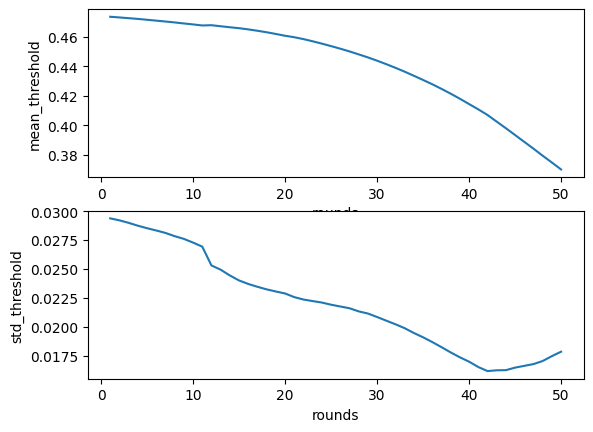

In [55]:

rounds = []
mean_threshold = []
std_threshold = []
for round,thres_mean in history_train.metrics_distributed['aggregate_threshold_mean']:
  rounds.append(round)
  mean_threshold.append(thres_mean)

for _,thres_std in history_train.metrics_distributed['aggregate_threshold_std']:
  std_threshold.append(thres_std)

plt.subplot(2,1,1)
plt.plot(rounds,mean_threshold)
plt.xlabel('rounds')
plt.ylabel('mean_threshold')
plt.subplot(2,1,2)
plt.plot(rounds,std_threshold)
plt.xlabel('rounds')
plt.ylabel('std_threshold')
plt.show()

In [48]:
# with hyperparameter tuning
import plotly.express as px
import pandas as pd

# Initialize data
rounds = []
client_threshold = {}
for i in range(9):
    client_threshold[i] = []

# Simulating data collection from `history_train.metrics_distributed`
# Replace this part with your actual data logic
for round, thres_client in history_train.metrics_distributed['client_thresholds']:
    rounds.append(round)
    for i in range(len(thres_client)):
        client_threshold[i].append(thres_client[i])

# Prepare data for Plotly
data = []
for client_id, client_thres in client_threshold.items():
    for r, thres in zip(rounds, client_thres):
        data.append({'round': r, 'threshold': thres, 'client_id': f'Client {client_id}'})

# Convert to DataFrame
df = pd.DataFrame(data)

# Plot using Plotly Express
fig = px.line(
    df,
    x='round',
    y='threshold',
    color='client_id',
    title='Client Thresholds Over Rounds',
    labels={'round': 'Rounds', 'threshold': 'Threshold', 'client_id': 'Client ID'},
    template='plotly'
)

# Show the interactive plot
fig.show()


In [44]:
# no hyperparameter tuning
import plotly.express as px
import pandas as pd

# Initialize data
rounds = []
client_threshold = {}
for i in range(9):
    client_threshold[i] = []

# Simulating data collection from `history_train.metrics_distributed`
# Replace this part with your actual data logic
for round, thres_client in history_train.metrics_distributed['client_thresholds']:
    rounds.append(round)
    for i in range(len(thres_client)):
        client_threshold[i].append(thres_client[i])

# Prepare data for Plotly
data = []
for client_id, client_thres in client_threshold.items():
    for r, thres in zip(rounds, client_thres):
        data.append({'round': r, 'threshold': thres, 'client_id': f'Client {client_id}'})

# Convert to DataFrame
df = pd.DataFrame(data)

# Plot using Plotly Express
fig = px.line(
    df,
    x='round',
    y='threshold',
    color='client_id',
    title='Client Thresholds Over Rounds',
    labels={'round': 'Rounds', 'threshold': 'Threshold', 'client_id': 'Client ID'},
    template='plotly'
)

# Show the interactive plot
fig.show()


In [ ]:

rounds = []
mean_threshold = []
std_threshold = []
for round,thres_mean in history_train.metrics_distributed['aggregate_threshold_mean']:
  rounds.append(round)
  mean_threshold.append(thres_mean)

for _,thres_std in history_train.metrics_distributed['aggregate_threshold_std']:
  std_threshold.append(thres_std)

plt.subplot(2,1,1)
plt.plot(rounds,mean_threshold)
plt.xlabel('rounds')
plt.ylabel('mean_threshold')
plt.subplot(2,1,2)
plt.plot(rounds,std_threshold)
plt.xlabel('rounds')
plt.ylabel('std_threshold')
plt.show()

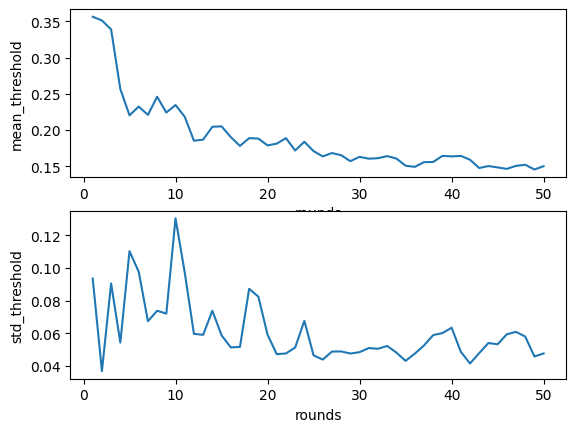

In [105]:

rounds = []
mean_threshold = []
std_threshold = []
for round,thres_mean in history_train.metrics_distributed['aggregate_threshold_mean']:
  rounds.append(round)
  mean_threshold.append(thres_mean)

for _,thres_std in history_train.metrics_distributed['aggregate_threshold_std']:
  std_threshold.append(thres_std)

plt.subplot(2,1,1)
plt.plot(rounds,mean_threshold)
plt.xlabel('rounds')
plt.ylabel('mean_threshold')
plt.subplot(2,1,2)
plt.plot(rounds,std_threshold)
plt.xlabel('rounds')
plt.ylabel('std_threshold')
plt.show()

In [83]:
THRESHOLD = min([i[1] for i in history_train.metrics_distributed['aggregate_threshold_mean']])
print(THRESHOLD)

0.35386440783485


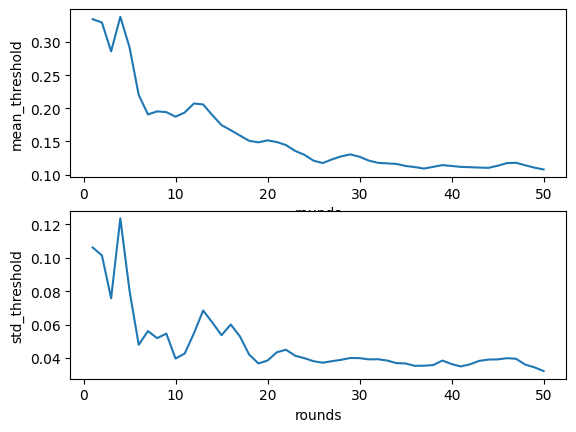

In [90]:
## FedAdam, 3 layers
rounds = []
mean_threshold = []
std_threshold = []
for round,thres_mean in history_train.metrics_distributed['aggregate_threshold_mean']:
  rounds.append(round)
  mean_threshold.append(thres_mean)

for _,thres_std in history_train.metrics_distributed['aggregate_threshold_std']:
  std_threshold.append(thres_std)

plt.subplot(2,1,1)
plt.plot(rounds,mean_threshold)
plt.xlabel('rounds')
plt.ylabel('mean_threshold')
plt.subplot(2,1,2)
plt.plot(rounds,std_threshold)
plt.xlabel('rounds')
plt.ylabel('std_threshold')
plt.show()

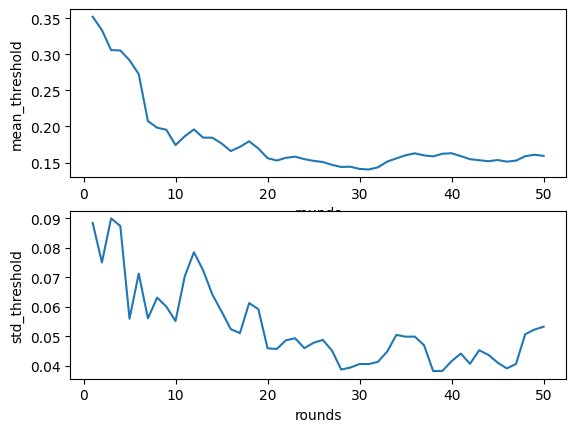

In [74]:
## FedAdam
rounds = []
mean_threshold = []
std_threshold = []
for round,thres_mean in history_train.metrics_distributed['aggregate_threshold_mean']:
  rounds.append(round)
  mean_threshold.append(thres_mean)

for _,thres_std in history_train.metrics_distributed['aggregate_threshold_std']:
  std_threshold.append(thres_std)

plt.subplot(2,1,1)
plt.plot(rounds,mean_threshold)
plt.xlabel('rounds')
plt.ylabel('mean_threshold')
plt.subplot(2,1,2)
plt.plot(rounds,std_threshold)
plt.xlabel('rounds')
plt.ylabel('std_threshold')
plt.show()

## **Training with FedAdam and MAD**

In [27]:
strategy = SaveModelStrategy(
        fraction_fit=1,
        fraction_evaluate=1,
        min_fit_clients=1,
        min_evaluate_clients=1,
        min_available_clients=9,
        initial_parameters = initial_parameters,
        evaluate_metrics_aggregation_fn=threshold_selection,  # <-- pass the metric aggregation function, return the max loss in each validation round
        fit_metrics_aggregation_fn=average_loss,
        patience = 15,
        eta = 0.001,
        eta_l = 0.001
    )

history_train = flwr.simulation.start_simulation(
        client_fn=client_fn_train,  # a function that spawns a particular client
        num_clients=NUM_CLIENTS,  # total number of clients
        config=flwr.server.ServerConfig(
            num_rounds=50
        ),  # minimal config for the server loop telling the number of rounds in FL
        strategy=strategy,  # our strategy of choice
        client_resources={
            "num_cpus": 1,
            "num_gpus": 0.0,
        },  # (optional) controls the degree of parallelism of your simulation.
        # Lower resources per client allow for more clients to run concurrently
        # (but need to be set taking into account the compute/memory footprint of your run)
        # `num_cpus` is an absolute number (integer) indicating the number of threads a client should be allocated
        # `num_gpus` is a ratio indicating the portion of gpu memory that a client needs.
    )

	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=50, no round_timeout
2024-11-28 05:52:47,216	INFO worker.py:1752 -- Started a local Ray instance.
INFO :      Flower VCE: Ray initialized with resource

(ClientAppActor pid=5894) [Client 3] fit, config: {}
(ClientAppActor pid=5898) Epoch [1/4], Train Loss: 0.1718


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.048058588057756424, 0.0852959081530571, 0.0851970836520195, 0.03597622364759445, 0.027027234435081482, 0.06449969112873077, 0.03386363014578819, 0.06223754212260246, 0.09991411864757538]
(ClientAppActor pid=5893) [Client 6] fit, config: {} [repeated 8x across cluster] (Ray deduplicates logs by default. Set RAY_DEDUP_LOGS=0 to disable log deduplication, or see https://docs.ray.io/en/master/ray-observability/ray-logging.html#log-deduplication for more options.)
(ClientAppActor pid=5893) [Client 3] evaluate, config: {}
(ClientAppActor pid=5893) mean_valid_loss:0.44008150595502976


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 2]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 5 threshold: 0.5130920990047985
Client 3 threshold: 0.4514092190274422
Client 8 threshold: 0.4886777814954879
Client 4 threshold: 0.4708855092696625
Client 0 threshold: 0.4574691209581558
Client 2 threshold: 0.46202849023899284
Client 6 threshold: 0.42090553250143187
Client 7 threshold: 0.4722520062534322
Client 1 threshold: 0.5207498137672661
Lowest validation threshold updated
Saving model at round 1
(ClientAppActor pid=5893) Epoch [4/4], Train Loss: 0.0339 [repeated 35x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.049388252198696136, 0.035550639033317566, 0.02993355318903923, 0.0876704603433609, 0.02499346435070038, 0.08701188862323761, 0.06221548840403557, 0.06261027604341507, 0.09679222106933594]
(ClientAppActor pid=5890) [Client 2] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5894) [Client 6] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5893) mean_valid_loss:0.38708131867819107 [repeated 8x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 3]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 7 threshold: 0.4709946088211094
Client 3 threshold: 0.4503600288132635
Client 1 threshold: 0.5196309677009999
Client 2 threshold: 0.46088880444341096
Client 5 threshold: 0.5118118203678605
Client 4 threshold: 0.4698521680179406
Client 8 threshold: 0.48757618150625043
Client 0 threshold: 0.45637240366056625
Client 6 threshold: 0.4215753809712289
Lowest validation threshold updated
Saving model at round 2
(ClientAppActor pid=5890) Epoch [4/4], Train Loss: 0.0626 [repeated 36x across cluster]
(ClientAppActor pid=5890) [Client 7] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.10484160482883453, 0.08607307821512222, 0.08791223168373108, 0.030081436038017273, 0.06250948458909988, 0.03519943729043007, 0.03007783181965351, 0.06095851957798004, 0.04668349400162697]
(ClientAppActor pid=5890) [Client 4] evaluate, config: {} [repeated 8x across cluster]
(ClientAppActor pid=5890) mean_valid_loss:0.42021187435453516 [repeated 9x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 4]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 0 threshold: 0.45511331684009043
Client 6 threshold: 0.4222479104381711
Client 7 threshold: 0.4695777572772426
Client 8 threshold: 0.48618494584732
Client 3 threshold: 0.4491841247129624
Client 5 threshold: 0.5102487953540579
Client 1 threshold: 0.5183744057571671
Client 2 threshold: 0.45961583908480724
Client 4 threshold: 0.4689065723505236
Lowest validation threshold updated
Saving model at round 3
(ClientAppActor pid=5890) Epoch [4/4], Train Loss: 0.0861 [repeated 36x across cluster]
(ClientAppActor pid=5890) [Client 3] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.08683029562234879, 0.04659472405910492, 0.030439885333180428, 0.10540008544921875, 0.08707811683416367, 0.03514927625656128, 0.027694957330822945, 0.06381531059741974, 0.06627336889505386]
(ClientAppActor pid=5890) [Client 2] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5890) mean_valid_loss:288.9209433012379 [repeated 9x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 5]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.45821525525606954
Client 5 threshold: 0.5086108953826155
Client 0 threshold: 0.4537193858601409
Client 4 threshold: 0.46809613560085817
Client 7 threshold: 0.46801807207505375
Client 3 threshold: 0.44788860379498097
Client 6 threshold: 0.42276634389345297
Client 8 threshold: 0.4848049815497374
Client 1 threshold: 0.5169806743739702
Lowest validation threshold updated
Saving model at round 4
(ClientAppActor pid=5890) Epoch [4/4], Train Loss: 0.1054 [repeated 36x across cluster]
(ClientAppActor pid=5893) [Client 0] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.0622144490480423, 0.061279166489839554, 0.04698298126459122, 0.1037381961941719, 0.03488218039274216, 0.025986887514591217, 0.08793680369853973, 0.084698885679245, 0.029485434293746948]
(ClientAppActor pid=5890) [Client 3] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5893) mean_valid_loss:0.384574349076511 [repeated 9x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 6]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 5 threshold: 0.5066370979531643
Client 3 threshold: 0.44646215271953915
Client 6 threshold: 0.4237161353180601
Client 1 threshold: 0.5154516779900349
Client 0 threshold: 0.4522196177852259
Client 7 threshold: 0.46631398909772354
Client 2 threshold: 0.45665624944757194
Client 4 threshold: 0.4666965430423022
Client 8 threshold: 0.4832878881590514
Lowest validation threshold updated
Saving model at round 5
(ClientAppActor pid=5893) Epoch [4/4], Train Loss: 0.0260 [repeated 36x across cluster]
(ClientAppActor pid=5893) [Client 5] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.027947988361120224, 0.06717807799577713, 0.045427098870277405, 0.08398693054914474, 0.03644239529967308, 0.1011156514286995, 0.08595219254493713, 0.02522622048854828, 0.06251199543476105]
(ClientAppActor pid=5897) [Client 6] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5897) mean_valid_loss:0.38356594787671777 [repeated 9x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 7]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 1 threshold: 0.5137659979005695
Client 7 threshold: 0.46445047151785884
Client 3 threshold: 0.44490684387332363
Client 0 threshold: 0.4505492461867231
Client 2 threshold: 0.45498164435757293
Client 5 threshold: 0.5044546974880542
Client 8 threshold: 0.48162550416523214
Client 6 threshold: 0.42517376728332235
Client 4 threshold: 0.4651083289474428
Lowest validation threshold updated
Saving model at round 6
(ClientAppActor pid=5893) Epoch [4/4], Train Loss: 0.0860 [repeated 36x across cluster]
(ClientAppActor pid=5898) [Client 5] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.08669646084308624, 0.027226563543081284, 0.03496773540973663, 0.027616795152425766, 0.10084627568721771, 0.06177520379424095, 0.08460799604654312, 0.0461864098906517, 0.06454373151063919]
(ClientAppActor pid=5897) [Client 2] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5897) mean_valid_loss:288.9172142578623 [repeated 9x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 8]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 3 threshold: 0.4432132836173338
Client 6 threshold: 0.43570998925140536
Client 8 threshold: 0.4798036287193922
Client 1 threshold: 0.5118991485287259
Client 5 threshold: 0.5020513096405609
Client 7 threshold: 0.46242145286608505
Client 4 threshold: 0.4633247602092683
Client 2 threshold: 0.4531483063532678
Client 0 threshold: 0.4488193813597999
Lowest validation threshold updated
Saving model at round 7
(ClientAppActor pid=5897) Epoch [1/4], Train Loss: 0.1317 [repeated 37x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.027115460485219955, 0.034907497465610504, 0.06170357018709183, 0.026637723669409752, 0.0636385828256607, 0.04613429680466652, 0.08307242393493652, 0.09840428084135056, 0.08485330641269684]
(ClientAppActor pid=5897) [Client 3] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 9]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 1 threshold: 0.5098241906564283
Client 5 threshold: 0.4999378091942058
Client 6 threshold: 0.43977184368148603
Client 2 threshold: 0.45116776595906544
Client 7 threshold: 0.46019648047225514
Client 4 threshold: 0.4613156144354862
Client 8 threshold: 0.47780201534827793
Client 3 threshold: 0.4413604349147122
Client 0 threshold: 0.4469249226568425
Lowest validation threshold updated
Saving model at round 8
(ClientAppActor pid=5897) [Client 2] evaluate, config: {} [repeated 18x across cluster]
(ClientAppActor pid=5897) mean_valid_loss:288.91415153889415 [repeated 18x across cluster]
(ClientAppActor pid=5894) Epoch [1/4], Train Loss: 0.1708 [repeated 43x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.08790888637304306, 0.03483735769987106, 0.10260915756225586, 0.08412732928991318, 0.06076185777783394, 0.02990933507680893, 0.045324407517910004, 0.06408055126667023, 0.027534032240509987]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 10]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


(ClientAppActor pid=5898) [Client 8] fit, config: {} [repeated 9x across cluster]
Client 2 threshold: 0.44897040012170253
Client 5 threshold: 0.4974336440967717
Client 3 threshold: 0.43932899085492594
Client 8 threshold: 0.47559812313080807
Client 1 threshold: 0.5075036040829392
Client 0 threshold: 0.4447969394305102
Client 4 threshold: 0.45923697778493394
Client 6 threshold: 0.4412876737379723
Client 7 threshold: 0.4577512504190928
Lowest validation threshold updated
Saving model at round 9
(ClientAppActor pid=5897) [Client 6] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5897) mean_valid_loss:0.37857859219209505 [repeated 9x across cluster]
(ClientAppActor pid=5893) Epoch [2/4], Train Loss: 0.0455 [repeated 38x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.06172676756978035, 0.085858054459095, 0.027920087799429893, 0.10241362452507019, 0.028324708342552185, 0.03504922613501549, 0.06420040875673294, 0.0845264419913292, 0.047061555087566376]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 11]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 7 threshold: 0.4550983620458166
Client 2 threshold: 0.4465737558121256
Client 3 threshold: 0.43707429127282527
Client 4 threshold: 0.45701487403952007
Client 8 threshold: 0.47301600621970397
Client 1 threshold: 0.5048463894216622
Client 5 threshold: 0.494453324693764
Client 6 threshold: 0.4409768978618289
Client 0 threshold: 0.44241732585784366
Lowest validation threshold updated
Saving model at round 10
(ClientAppActor pid=5895) [Client 0] fit, config: {} [repeated 16x across cluster]
(ClientAppActor pid=5898) [Client 8] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5898) mean_valid_loss:0.3837193932957374 [repeated 9x across cluster]
(ClientAppActor pid=5898) Epoch [3/4], Train Loss: 0.0712 [repeated 44x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04528864100575447, 0.02871905267238617, 0.08616901189088821, 0.06127157062292099, 0.06219792366027832, 0.08780302107334137, 0.03483765572309494, 0.09249434620141983, 0.02566726878285408]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 12]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 6 threshold: 0.4429410323307381
Client 2 threshold: 0.44399115504959674
Client 7 threshold: 0.45211306070263
Client 3 threshold: 0.43452679591439225
Client 5 threshold: 0.4918080941519488
Client 0 threshold: 0.4400673089828593
Client 4 threshold: 0.4544110021012001
Client 8 threshold: 0.4701179217521217
Client 1 threshold: 0.5017879556434289
Lowest validation threshold updated
Saving model at round 11
(ClientAppActor pid=5894) [Client 7] fit, config: {} [repeated 10x across cluster]
(ClientAppActor pid=5890) [Client 7] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5890) mean_valid_loss:0.39902695118425746 [repeated 9x across cluster]
(ClientAppActor pid=5895) Epoch [3/4], Train Loss: 0.0700 [repeated 41x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03485548496246338, 0.08693820983171463, 0.02819511480629444, 0.028419632464647293, 0.06204836815595627, 0.08024336397647858, 0.04417981952428818, 0.0633583515882492, 0.08739256858825684]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 13]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 8 threshold: 0.4668031181965111
Client 1 threshold: 0.4981868787972079
Client 3 threshold: 0.4316310878095836
Client 0 threshold: 0.43734680201040177
Client 6 threshold: 0.44107608502145734
Client 2 threshold: 0.44098225544747033
Client 7 threshold: 0.4486696784812811
Client 4 threshold: 0.4516927996907478
Client 5 threshold: 0.48874033042257947
Lowest validation threshold updated
Saving model at round 12
(ClientAppActor pid=5894) [Client 0] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5893) [Client 1] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5893) mean_valid_loss:0.34135162358608945 [repeated 9x across cluster]
(ClientAppActor pid=5895) Epoch [4/4], Train Loss: 0.0876 [repeated 42x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.08359640091657639, 0.03491012006998062, 0.08699491620063782, 0.044569551944732666, 0.0875687450170517, 0.026914669200778008, 0.06280329823493958, 0.02702665887773037, 0.06384328007698059]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 14]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 8 threshold: 0.4630275961953483
Client 1 threshold: 0.4940806316281578
Client 6 threshold: 0.4385696456283647
Client 2 threshold: 0.43761822851585375
Client 0 threshold: 0.43461097096889767
Client 4 threshold: 0.44859889476043857
Client 7 threshold: 0.4447348391232001
Client 3 threshold: 0.42839274907946207
Client 5 threshold: 0.4852118747961126
Lowest validation threshold updated
Saving model at round 13
(ClientAppActor pid=5892) [Client 0] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5893) [Client 8] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5893) mean_valid_loss:0.37632526522263504 [repeated 9x across cluster]
(ClientAppActor pid=5893) Epoch [1/4], Train Loss: 0.1647 [repeated 39x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04374762624502182, 0.08490625023841858, 0.0861758291721344, 0.062091659754514694, 0.060985296964645386, 0.034713152796030045, 0.027525082230567932, 0.08210797607898712, 0.02759537287056446]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 15]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 4 threshold: 0.4450979800713152
Client 6 threshold: 0.43582672823670665
Client 5 threshold: 0.4814121303732161
Client 8 threshold: 0.45860779364146287
Client 1 threshold: 0.48934468603142917
Client 3 threshold: 0.4247681462611675
Client 0 threshold: 0.4316339350164251
Client 2 threshold: 0.43378688163154433
Client 7 threshold: 0.4403450579504794
Lowest validation threshold updated
Saving model at round 14
(ClientAppActor pid=5896) [Client 2] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5893) [Client 8] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5893) mean_valid_loss:0.3732977917847725 [repeated 9x across cluster]
(ClientAppActor pid=5896) Epoch [4/4], Train Loss: 0.0621 [repeated 36x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.08714108914136887, 0.04400460794568062, 0.07983747869729996, 0.03516434133052826, 0.02915368042886257, 0.062113452702760696, 0.08600059896707535, 0.06616275012493134, 0.02593187242746353]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 16]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 7 threshold: 0.4353414603915571
Client 5 threshold: 0.47722036201430823
Client 1 threshold: 0.48388991680200844
Client 0 threshold: 0.4283669290181186
Client 8 threshold: 0.4535823236165536
Client 3 threshold: 0.42067618509416793
Client 2 threshold: 0.4295482387111901
Client 4 threshold: 0.44135303139540727
Client 6 threshold: 0.43286205937127453
Lowest validation threshold updated
Saving model at round 15
(ClientAppActor pid=5896) [Client 3] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5893) [Client 0] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5893) mean_valid_loss:0.4001813450780434 [repeated 9x across cluster]
(ClientAppActor pid=5893) Epoch [2/4], Train Loss: 0.1111 [repeated 38x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.05988192558288574, 0.0245099775493145, 0.04470011591911316, 0.06326306611299515, 0.03483332693576813, 0.08672426640987396, 0.08720137923955917, 0.02644549123942852, 0.0788571834564209]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 17]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 8 threshold: 0.44757955916365005
Client 3 threshold: 0.4160568585757414
Client 0 threshold: 0.42468650806676567
Client 4 threshold: 0.43736075598542784
Client 1 threshold: 0.477538843878768
Client 7 threshold: 0.42976969729425557
Client 5 threshold: 0.4718926863943562
Client 6 threshold: 0.4296862978161516
Client 2 threshold: 0.424688087515741
Lowest validation threshold updated
Saving model at round 16
(ClientAppActor pid=5898) [Client 6] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5893) [Client 1] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5893) mean_valid_loss:0.32920479769521643 [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.034192975610494614, 0.07839973270893097, 0.04432116821408272, 0.024569127708673477, 0.060930538922548294, 0.0630064606666565, 0.026849832385778427, 0.08044978231191635, 0.07886994630098343]
(ClientAppActor pid=5893) Epoch [4/4], Train Loss: 0.0443 [repeated 38x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 18]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 1 threshold: 0.47026352147767475
Client 6 threshold: 0.4263258472682333
Client 3 threshold: 0.4107087820027603
Client 7 threshold: 0.42350859846627
Client 0 threshold: 0.42082265663729024
Client 4 threshold: 0.43262456020845214
Client 2 threshold: 0.4193530793837234
Client 5 threshold: 0.4658820732866552
Client 8 threshold: 0.4410432228956463
Lowest validation threshold updated
Saving model at round 17
(ClientAppActor pid=5892) [Client 3] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5893) [Client 7] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5890)  [repeated 10x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.06029088795185089, 0.03446727991104126, 0.08676774799823761, 0.080584317445755, 0.04281773418188095, 0.07646031677722931, 0.06065806373953819, 0.024764707311987877, 0.026924483478069305]
(ClientAppActor pid=5896) Epoch [4/4], Train Loss: 0.0248 [repeated 36x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 19]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 6 threshold: 0.42279906679117707
Client 4 threshold: 0.42777175016059155
Client 5 threshold: 0.45981117972120755
Client 8 threshold: 0.43343280889727664
Client 0 threshold: 0.41650523519122135
Client 7 threshold: 0.4166455967123622
Client 2 threshold: 0.4141505523974294
Client 1 threshold: 0.4619385299273667
Client 3 threshold: 0.4046594530330651
Lowest validation threshold updated
Saving model at round 18
(ClientAppActor pid=5893) [Client 5] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5894) [Client 5] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5894) mean_valid_loss:0.3793378240548265 [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04358696565032005, 0.08537136763334274, 0.025820652022957802, 0.03484717011451721, 0.05869721248745918, 0.02579011395573616, 0.05756642296910286, 0.07838118821382523, 0.07769673317670822]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 20]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 4 threshold: 0.42184580291354773
Client 2 threshold: 0.4085800727503577
Client 3 threshold: 0.39776627291582967
Client 6 threshold: 0.419114924171455
Client 0 threshold: 0.4118345834594669
Client 8 threshold: 0.4251792970248939
Client 1 threshold: 0.4524283705472335
Client 5 threshold: 0.4523296067776883
Client 7 threshold: 0.4092453947589346
Lowest validation threshold updated
Saving model at round 19
(ClientAppActor pid=5897) Epoch [4/4], Train Loss: 0.0436 [repeated 36x across cluster]
(ClientAppActor pid=5892) [Client 3] fit, config: {} [repeated 10x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03496246784925461, 0.08479209244251251, 0.02634386159479618, 0.07955098152160645, 0.06115143001079559, 0.06065358966588974, 0.02497808262705803, 0.043913960456848145, 0.07699721306562424]
(ClientAppActor pid=5897) [Client 2] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5897) mean_valid_loss:288.88148486130416 [repeated 9x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 21]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 8 threshold: 0.4154920308445348
Client 0 threshold: 0.4068910780429488
Client 7 threshold: 0.4013994360261603
Client 3 threshold: 0.3899938759880901
Client 6 threshold: 0.4153829798825775
Client 1 threshold: 0.44175033528478286
Client 2 threshold: 0.4011133536512305
Client 5 threshold: 0.44395102311825324
Client 4 threshold: 0.4156749332654007
Lowest validation threshold updated
Saving model at round 20
(ClientAppActor pid=5892) Epoch [4/4], Train Loss: 0.0770 [repeated 36x across cluster]
(ClientAppActor pid=5890) [Client 6] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.07520962506532669, 0.043506719172000885, 0.02696307748556137, 0.060212913900613785, 0.058258842676877975, 0.02880086563527584, 0.08531136810779572, 0.0341046042740345, 0.07701850682497025]
(ClientAppActor pid=5893) [Client 5] evaluate, config: {} [repeated 13x across cluster]
(ClientAppActor pid=5894) mean_valid_loss:0.37317483050223343 [repeated 10x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 22]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 5 threshold: 0.4345847160758064
Client 3 threshold: 0.38147103693048084
Client 7 threshold: 0.3931564760261508
Client 1 threshold: 0.42991082996985186
Client 8 threshold: 0.405256734653174
Client 6 threshold: 0.4117744110483148
Client 2 threshold: 0.39380959855100417
Client 0 threshold: 0.40126397828927884
Client 4 threshold: 0.4084467369802205
Lowest validation threshold updated
Saving model at round 21
(ClientAppActor pid=5890) Epoch [4/4], Train Loss: 0.0270 [repeated 36x across cluster]
(ClientAppActor pid=5896) [Client 0] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.023672955110669136, 0.06072080135345459, 0.08462207764387131, 0.05971592664718628, 0.0433628186583519, 0.07653772085905075, 0.026266111060976982, 0.033635906875133514, 0.07601857930421829]
(ClientAppActor pid=5895) [Client 2] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5897) mean_valid_loss:0.3618201914553841 [repeated 8x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 23]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.38460021829460544
Client 5 threshold: 0.42354970811875226
Client 1 threshold: 0.41663024998946685
Client 4 threshold: 0.40070014454804775
Client 7 threshold: 0.37815681849528593
Client 3 threshold: 0.37222696280514134
Client 6 threshold: 0.408401381802895
Client 0 threshold: 0.3941120751390084
Client 8 threshold: 0.39362455535689983
Lowest validation threshold updated
Saving model at round 22
(ClientAppActor pid=5894) Epoch [1/4], Train Loss: 0.0655 [repeated 38x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.05791408196091652, 0.026456885039806366, 0.03367235139012337, 0.024605784565210342, 0.04299063980579376, 0.08232545107603073, 0.07774408161640167, 0.07478281855583191, 0.060003191232681274]
(ClientAppActor pid=5893) [Client 6] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 24]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 6 threshold: 0.4053957042711353
Client 3 threshold: 0.3621419815502167
Client 4 threshold: 0.3924537015533375
Client 1 threshold: 0.4024496975101995
Client 2 threshold: 0.37481457801663076
Client 8 threshold: 0.3806898620712153
Client 7 threshold: 0.3649100263495935
Client 5 threshold: 0.4114398401975806
Client 0 threshold: 0.3862790433578023
Lowest validation threshold updated
Saving model at round 23
(ClientAppActor pid=5897) [Client 0] evaluate, config: {} [repeated 14x across cluster]
(ClientAppActor pid=5897) mean_valid_loss:0.3706099837588576 [repeated 18x across cluster]
(ClientAppActor pid=5893) Epoch [1/4], Train Loss: 0.1059 [repeated 35x across cluster]
(ClientAppActor pid=5894) [Client 8] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04368340224027634, 0.058729588985443115, 0.07134734094142914, 0.07447271794080734, 0.024263665080070496, 0.08043278753757477, 0.05703400447964668, 0.03324531763792038, 0.025502603501081467]
(ClientAppActor pid=5895) [Client 0] evaluate, config: {} [repeated 4x across cluster]
(ClientAppActor pid=5894) mean_valid_loss:0.3505686842645399


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 25]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 1 threshold: 0.3872164119353226
Client 3 threshold: 0.3513040251297517
Client 4 threshold: 0.3838352179669885
Client 6 threshold: 0.4028610143540473
Client 7 threshold: 0.3545699424999383
Client 8 threshold: 0.3665361744470425
Client 0 threshold: 0.37918916178211154
Client 2 threshold: 0.36435011747671775
Client 5 threshold: 0.39771466018527507
Lowest validation threshold updated
Saving model at round 24
(ClientAppActor pid=5894) Epoch [1/4], Train Loss: 0.0628 [repeated 36x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.024830207228660583, 0.07429073005914688, 0.07665666192770004, 0.05892296880483627, 0.05972885340452194, 0.07351791858673096, 0.02401762455701828, 0.042422816157341, 0.032907888293266296]
(ClientAppActor pid=5892) [Client 5] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 26]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 7 threshold: 0.34886819169205235
Client 6 threshold: 0.4008814392693987
Client 8 threshold: 0.3511524649583471
Client 4 threshold: 0.375391862588804
Client 3 threshold: 0.33984765921186516
Client 0 threshold: 0.3721375950815001
Client 1 threshold: 0.3710587017235065
Client 5 threshold: 0.38343863247075405
Client 2 threshold: 0.35369929066143707
Lowest validation threshold updated
Saving model at round 25
(ClientAppActor pid=5892) [Client 1] evaluate, config: {} [repeated 14x across cluster]
(ClientAppActor pid=5892) mean_valid_loss:0.2801258063171821 [repeated 17x across cluster]
(ClientAppActor pid=5897) Epoch [2/4], Train Loss: 0.0538 [repeated 44x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.056252915412187576, 0.058162808418273926, 0.07453279942274094, 0.024095166474580765, 0.042344413697719574, 0.0742439553141594, 0.023761209100484848, 0.03281302750110626, 0.07553696632385254]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 27]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


(ClientAppActor pid=5897) [Client 3] fit, config: {} [repeated 9x across cluster]
Client 3 threshold: 0.3273216246049007
Client 4 threshold: 0.3667144703134441
Client 2 threshold: 0.34450728978510164
Client 6 threshold: 0.3995300794149971
Client 5 threshold: 0.3698473717890726
Client 1 threshold: 0.35370662987041107
Client 0 threshold: 0.36488074303129986
Client 8 threshold: 0.33451712366023156
Client 7 threshold: 0.34689373535055806
Lowest validation threshold updated
Saving model at round 26
(ClientAppActor pid=5897) [Client 2] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5897) mean_valid_loss:288.8375085066622 [repeated 9x across cluster]
(ClientAppActor pid=5894) Epoch [2/4], Train Loss: 0.0723 [repeated 40x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.05642947554588318, 0.033016156405210495, 0.07439345121383667, 0.05808302015066147, 0.06980150938034058, 0.042663928121328354, 0.02367849089205265, 0.025418881326913834, 0.07391846179962158]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 28]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


(ClientAppActor pid=5898) [Client 4] fit, config: {} [repeated 9x across cluster]
Client 5 threshold: 0.3582371680316797
Client 4 threshold: 0.35738146156889816
Client 0 threshold: 0.3577858949488634
Client 6 threshold: 0.398839284812083
Client 7 threshold: 0.3467456215417012
Client 3 threshold: 0.314203525351632
Client 2 threshold: 0.33538909290172964
Client 8 threshold: 0.31779495702909805
Client 1 threshold: 0.3362195177854354
Lowest validation threshold updated
Saving model at round 27
(ClientAppActor pid=5893) [Client 0] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5893) mean_valid_loss:0.35107354329755674 [repeated 9x across cluster]
(ClientAppActor pid=5895) Epoch [2/4], Train Loss: 0.0967 [repeated 37x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.024312913417816162, 0.07515878230333328, 0.0427260622382164, 0.055041033774614334, 0.06909047067165375, 0.023771870881319046, 0.03350939229130745, 0.07303360849618912, 0.057176608592271805]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 29]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.32950806604870486
Client 7 threshold: 0.34689309564648313
Client 4 threshold: 0.3460842110328188
Client 8 threshold: 0.2988839001559127
Client 5 threshold: 0.34747477428145473
Client 3 threshold: 0.3006669281579537
Client 6 threshold: 0.3987494353414628
Client 0 threshold: 0.35098544344559796
Client 1 threshold: 0.31805139904030755
Lowest validation threshold updated
Saving model at round 28
(ClientAppActor pid=5898) [Client 8] fit, config: {} [repeated 13x across cluster]
(ClientAppActor pid=5893) [Client 0] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5893) mean_valid_loss:0.34580522819589343 [repeated 9x across cluster]
(ClientAppActor pid=5898) Epoch [3/4], Train Loss: 0.0345 [repeated 41x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.042014941573143005, 0.02366066910326481, 0.06751946359872818, 0.054448142647743225, 0.07404518872499466, 0.07119898498058319, 0.033249326050281525, 0.053711019456386566, 0.024649351835250854]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 30]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 3 threshold: 0.28673657516736456
Client 7 threshold: 0.35046179937707145
Client 4 threshold: 0.33524049571701986
Client 1 threshold: 0.3000542674936645
Client 6 threshold: 0.3992669398515373
Client 8 threshold: 0.2794883627318203
Client 5 threshold: 0.3364098677523325
Client 2 threshold: 0.31282285853979597
Client 0 threshold: 0.34481559132194234
Lowest validation threshold updated
Saving model at round 29
(ClientAppActor pid=5897) [Client 2] fit, config: {} [repeated 13x across cluster]
(ClientAppActor pid=5893) [Client 8] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5893) mean_valid_loss:0.2769921438243145 [repeated 9x across cluster]
(ClientAppActor pid=5896) Epoch [3/4], Train Loss: 0.0251 [repeated 42x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.023648548871278763, 0.07169744372367859, 0.052195798605680466, 0.0224981177598238, 0.03262154012918472, 0.055464308708906174, 0.041841186583042145, 0.07265464216470718, 0.0660337507724762]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 31]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 5 threshold: 0.32335729376374533
Client 4 threshold: 0.3235285532333724
Client 7 threshold: 0.3583960840262854
Client 6 threshold: 0.40034368937172604
Client 3 threshold: 0.27229618088758245
Client 1 threshold: 0.2825784449417552
Client 8 threshold: 0.2662607873581479
Client 2 threshold: 0.29831238861885495
Client 0 threshold: 0.33961043406558594
Lowest validation threshold updated
Saving model at round 30
(ClientAppActor pid=5893) [Client 7] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5890) [Client 8] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5890) mean_valid_loss:0.26761449778404756 [repeated 9x across cluster]
(ClientAppActor pid=5894) Epoch [4/4], Train Loss: 0.0416 [repeated 36x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.07224933058023453, 0.0235091894865036, 0.052653614431619644, 0.023747412487864494, 0.06572631001472473, 0.07234052568674088, 0.041635602712631226, 0.03184458985924721, 0.05427747964859009]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 32]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 5 threshold: 0.31291162965342634
Client 3 threshold: 0.2576946317506904
Client 8 threshold: 0.2645817201685111
Client 1 threshold: 0.26869917543941724
Client 4 threshold: 0.3114231328037744
Client 6 threshold: 0.4018215363050196
Client 0 threshold: 0.3368662046334728
Client 7 threshold: 0.3685503559720158
Client 2 threshold: 0.29015085026291015
Lowest validation threshold updated
Saving model at round 31
(ClientAppActor pid=5893) [Client 2] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5894) [Client 6] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5894) mean_valid_loss:0.29766085347733817 [repeated 9x across cluster]
(ClientAppActor pid=5894) Epoch [1/4], Train Loss: 0.0739 [repeated 40x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.023457832634449005, 0.06584469974040985, 0.05404007434844971, 0.031156526878476143, 0.06795326620340347, 0.05241328105330467, 0.07172588258981705, 0.041010353714227676, 0.022510193288326263]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 33]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 4 threshold: 0.29919257876357314
Client 6 threshold: 0.40360150226769764
Client 1 threshold: 0.2588268666653336
Client 7 threshold: 0.37084117600618344
Client 0 threshold: 0.33140259403156724
Client 5 threshold: 0.30709176276576555
Client 8 threshold: 0.2639854430141618
Client 3 threshold: 0.24328679229654254
Client 2 threshold: 0.28417744628108044
Lowest validation threshold updated
Saving model at round 32
(ClientAppActor pid=5897) [Client 8] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5890) [Client 3] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5890) mean_valid_loss:0.24256242256229504 [repeated 9x across cluster]
(ClientAppActor pid=5898) Epoch [4/4], Train Loss: 0.0524 [repeated 34x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.06746134907007217, 0.031020760536193848, 0.023445315659046173, 0.07155058532953262, 0.041671041399240494, 0.05235159397125244, 0.06788396090269089, 0.023588720709085464, 0.052308350801467896]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 34]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 4 threshold: 0.2866485216920893
Client 8 threshold: 0.2642256297506073
Client 2 threshold: 0.28238467932675876
Client 0 threshold: 0.3251873038768839
Client 7 threshold: 0.3726753133083236
Client 3 threshold: 0.22916113412781283
Client 6 threshold: 0.40561587580778896
Client 1 threshold: 0.25461646571463614
Client 5 threshold: 0.30188698581421464
Lowest validation threshold updated
Saving model at round 33
(ClientAppActor pid=5893) [Client 4] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5890) [Client 3] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5890) mean_valid_loss:0.22895615862873503 [repeated 9x across cluster]
(ClientAppActor pid=5895) Epoch [2/4], Train Loss: 0.0358 [repeated 43x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.0230769794434309, 0.06756162643432617, 0.030734233558177948, 0.07142234593629837, 0.0241268090903759, 0.05369726940989494, 0.04126718267798424, 0.0517420656979084, 0.06595168262720108]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 35]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 5 threshold: 0.2993308809255267
Client 0 threshold: 0.3203638008776536
Client 2 threshold: 0.2821915691246979
Client 8 threshold: 0.26312024997208827
Client 1 threshold: 0.25305831905599324
Client 7 threshold: 0.3743333657494724
Client 6 threshold: 0.4077905505029142
Client 4 threshold: 0.2742576432581425
Client 3 threshold: 0.2154974725562766
Lowest validation threshold updated
Saving model at round 34
(ClientAppActor pid=5895) [Client 1] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5893) [Client 6] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5893) mean_valid_loss:0.28136046917583696 [repeated 9x across cluster]
(ClientAppActor pid=5895) Epoch [3/4], Train Loss: 0.0740 [repeated 37x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.050851404666900635, 0.06925247609615326, 0.023317446932196617, 0.0308169387280941, 0.05262959375977516, 0.06630736589431763, 0.04127734154462814, 0.07089870423078537, 0.023290568962693214]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 36]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 6 threshold: 0.41003556727236234
Client 3 threshold: 0.20238676555136165
Client 4 threshold: 0.26375322270610224
Client 5 threshold: 0.2995316689846876
Client 2 threshold: 0.2814189165768789
Client 7 threshold: 0.37580408150509714
Client 0 threshold: 0.31671998544618574
Client 1 threshold: 0.25255861171368144
Client 8 threshold: 0.26124395060456956
Lowest validation threshold updated
Saving model at round 35
(ClientAppActor pid=5892) [Client 0] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5898) [Client 0] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5895) mean_valid_loss:288.7625654841702 [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.07000652700662613, 0.022974247112870216, 0.06573757529258728, 0.06224718689918518, 0.02363738603889942, 0.041352175176143646, 0.050429318100214005, 0.05265619978308678, 0.03049222007393837]
(ClientAppActor pid=5894) Epoch [4/4], Train Loss: 0.0305 [repeated 37x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 37]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 7 threshold: 0.37696681004309046
Client 5 threshold: 0.3014527584198158
Client 8 threshold: 0.25908477680732644
Client 2 threshold: 0.28295996222539355
Client 6 threshold: 0.4122699345509135
Client 1 threshold: 0.253216426866687
Client 3 threshold: 0.1899021496934496
Client 4 threshold: 0.2553441300908319
Client 0 threshold: 0.31361806671220366
Lowest validation threshold updated
Saving model at round 36
(ClientAppActor pid=5894) [Client 2] fit, config: {} [repeated 10x across cluster]
(ClientAppActor pid=5894) [Client 1] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5897) mean_valid_loss:0.24514058488540544 [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.06960075348615646, 0.050570931285619736, 0.06238953024148941, 0.02382209524512291, 0.06447847932577133, 0.030560696497559547, 0.05213738977909088, 0.02285142056643963, 0.041150789707899094]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 38]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


(ClientAppActor pid=5894) Epoch [4/4], Train Loss: 0.0521 [repeated 36x across cluster]
Client 1 threshold: 0.2548970984352536
Client 8 threshold: 0.256641724070579
Client 4 threshold: 0.24682251869850205
Client 0 threshold: 0.3107728673458204
Client 5 threshold: 0.30547580606496216
Client 3 threshold: 0.178015794542313
Client 6 threshold: 0.4144246033637839
Client 7 threshold: 0.3777945322408055
Client 2 threshold: 0.28287052311267535
Lowest validation threshold updated
Saving model at round 37
(ClientAppActor pid=5890) [Client 0] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.0230718981474638, 0.06358466297388077, 0.05244816094636917, 0.031004834920167923, 0.049707457423210144, 0.06284955143928528, 0.02346697263419628, 0.04052184149622917, 0.07051234692335129]
(ClientAppActor pid=5892) [Client 1] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5892) mean_valid_loss:0.1938081721676529 [repeated 9x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 39]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 6 threshold: 0.4164275771139151
Client 4 threshold: 0.2471436252668459
Client 2 threshold: 0.2816189620049381
Client 5 threshold: 0.3130701741865217
Client 8 threshold: 0.2537809605121723
Client 3 threshold: 0.1669292200458266
Client 7 threshold: 0.3782161963500077
Client 0 threshold: 0.30788022827273576
Client 1 threshold: 0.2563849680070185
Lowest validation threshold updated
Saving model at round 38
(ClientAppActor pid=5890) Epoch [4/4], Train Loss: 0.0231 [repeated 36x across cluster]
(ClientAppActor pid=5897) [Client 6] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.07045727968215942, 0.02303691953420639, 0.02344007045030594, 0.06444571912288666, 0.05201346054673195, 0.03021933324635029, 0.04036964476108551, 0.06399258971214294, 0.05093855410814285]
(ClientAppActor pid=5896) [Client 5] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5890) mean_valid_loss:0.2892947445265376 [repeated 9x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 40]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


(ClientAppActor pid=5897) Epoch [4/4], Train Loss: 0.0234 [repeated 36x across cluster]
Client 4 threshold: 0.24444726383338122
Client 6 threshold: 0.4181300358145611
Client 2 threshold: 0.2817389109836631
Client 3 threshold: 0.1569444539240243
Client 0 threshold: 0.3049613230822783
Client 8 threshold: 0.2503600469792796
Client 5 threshold: 0.32284899424614266
Client 7 threshold: 0.37823703042081314
Client 1 threshold: 0.25610798040287364
Lowest validation threshold updated
Saving model at round 39
(ClientAppActor pid=5892) [Client 0] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.050301797688007355, 0.04935944080352783, 0.03978684917092323, 0.022712981328368187, 0.06278055906295776, 0.023449428379535675, 0.06978780031204224, 0.06335944682359695, 0.03056940622627735]
(ClientAppActor pid=5897) [Client 6] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5897) mean_valid_loss:0.25784046636321223 [repeated 9x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 41]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 7 threshold: 0.377817650155981
Client 0 threshold: 0.302056716705929
Client 4 threshold: 0.23451762977978227
Client 2 threshold: 0.2814520718595026
Client 3 threshold: 0.14805301267479584
Client 1 threshold: 0.2552775269069427
Client 8 threshold: 0.24656256705662954
Client 5 threshold: 0.3302405382527742
Client 6 threshold: 0.419494212411241
Lowest validation threshold updated
Saving model at round 40
(ClientAppActor pid=5892) Epoch [4/4], Train Loss: 0.0227 [repeated 36x across cluster]
(ClientAppActor pid=5894) [Client 7] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.02295777015388012, 0.050478577613830566, 0.04934922605752945, 0.06350785493850708, 0.030018683522939682, 0.040328413248062134, 0.06195712089538574, 0.06984743475914001, 0.02247108332812786]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 42]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


(ClientAppActor pid=5894) [Client 3] evaluate, config: {} [repeated 10x across cluster]
(ClientAppActor pid=5892) mean_valid_loss:0.21896200300648044 [repeated 9x across cluster]
(ClientAppActor pid=5894) Epoch [4/4], Train Loss: 0.0620 [repeated 36x across cluster]
Client 8 threshold: 0.2422040375216729
Client 2 threshold: 0.2809227587839048
Client 3 threshold: 0.14020222525489426
Client 5 threshold: 0.3354214636821282
Client 0 threshold: 0.29915961640189226
Client 1 threshold: 0.25393552055907403
Client 4 threshold: 0.22013008221773428
Client 6 threshold: 0.42056831198321293
Client 7 threshold: 0.37696999170551304
Lowest validation threshold updated
Saving model at round 41
(ClientAppActor pid=5894) [Client 7] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.02254650741815567, 0.0509757325053215, 0.049481358379125595, 0.062482573091983795, 0.07016082108020782, 0.06199721619486809, 0.03948487341403961, 0.029491614550352097, 0.022349270060658455]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 43]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


(ClientAppActor pid=5895) [Client 7] evaluate, config: {} [repeated 15x across cluster]
(ClientAppActor pid=5892) mean_valid_loss:288.7163099757587 [repeated 12x across cluster]
Client 1 threshold: 0.25212063373303806
Client 8 threshold: 0.23715756759697704
Client 5 threshold: 0.33942759443411974
Client 0 threshold: 0.2963036580342114
Client 3 threshold: 0.13324750041001407
Client 2 threshold: 0.2806601775508723
Client 7 threshold: 0.37562839193561715
Client 6 threshold: 0.42119139290845
Client 4 threshold: 0.20799995694874637
Lowest validation threshold updated
Saving model at round 42
(ClientAppActor pid=5894) Epoch [4/4], Train Loss: 0.0625 [repeated 36x across cluster]
(ClientAppActor pid=5890) [Client 7] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.07040868699550629, 0.03937355428934097, 0.02261398918926716, 0.06379898637533188, 0.049844227731227875, 0.022345349192619324, 0.06191501021385193, 0.04765303060412407, 0.029228001832962036]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 44]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.2798511053889319
Client 4 threshold: 0.19446997827106188
Client 5 threshold: 0.3430126634747934
Client 8 threshold: 0.23122688147136067
Client 6 threshold: 0.4212138502071046
Client 1 threshold: 0.24978760907081554
Client 3 threshold: 0.12729335343065043
Client 7 threshold: 0.37388934457946404
Client 0 threshold: 0.2933384859582435
Lowest validation threshold updated
Saving model at round 43
(ClientAppActor pid=5890) [Client 1] evaluate, config: {} [repeated 11x across cluster]
(ClientAppActor pid=5893) mean_valid_loss:0.2046344727349396 [repeated 15x across cluster]
(ClientAppActor pid=5890) Epoch [1/4], Train Loss: 0.1056 [repeated 37x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.06197904422879219, 0.07025498896837234, 0.05968717113137245, 0.03899748623371124, 0.04907899349927902, 0.0468672476708889, 0.022219955921173096, 0.022452011704444885, 0.02963809296488762]
(ClientAppActor pid=5892) [Client 2] fit, config: {} [repeated 9x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 45]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.28165432464043605
Client 5 threshold: 0.34579100530296036
Client 8 threshold: 0.22513419200704032
Client 7 threshold: 0.3717781328315148
Client 6 threshold: 0.4205005088115372
Client 4 threshold: 0.18209091459300522
Client 1 threshold: 0.24694833642898845
Client 3 threshold: 0.12224490556934131
Client 0 threshold: 0.29037297695883296
Lowest validation threshold updated
Saving model at round 44
(ClientAppActor pid=5892) [Client 4] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5892) mean_valid_loss:0.17883790829338325 [repeated 9x across cluster]
(ClientAppActor pid=5892) Epoch [2/4], Train Loss: 0.0638 [repeated 44x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.03932397440075874, 0.07080372422933578, 0.06091834232211113, 0.02916422300040722, 0.022879889234900475, 0.06105588749051094, 0.021935828030109406, 0.04933203011751175, 0.04671226441860199]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 46]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 1 threshold: 0.24372614683131535
Client 5 threshold: 0.3483378353191058
Client 2 threshold: 0.2854778098686953
Client 4 threshold: 0.17555680102963506
Client 8 threshold: 0.2193124469011935
Client 0 threshold: 0.28742770428458514
Client 3 threshold: 0.11805675949778353
Client 6 threshold: 0.4192136459436613
Client 7 threshold: 0.36934503630836496
Lowest validation threshold updated
Saving model at round 45
(ClientAppActor pid=5892) [Client 3] fit, config: {} [repeated 10x across cluster]
(ClientAppActor pid=5892) [Client 4] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5892) mean_valid_loss:0.17252675059418648 [repeated 9x across cluster]
(ClientAppActor pid=5898) Epoch [3/4], Train Loss: 0.0428 [repeated 44x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.02213442325592041, 0.06034763157367706, 0.059678781777620316, 0.029211420565843582, 0.048785027116537094, 0.039195433259010315, 0.02244858630001545, 0.07112836092710495, 0.04775115102529526]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 47]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.289765989497794
Client 1 threshold: 0.24047195725917686
Client 8 threshold: 0.21283822697553256
Client 7 threshold: 0.36650899073134896
Client 5 threshold: 0.35061643505708684
Client 6 threshold: 0.4174883368907426
Client 4 threshold: 0.17023477241529328
Client 0 threshold: 0.2845321071785612
Client 3 threshold: 0.11456819766821577
Lowest validation threshold updated
Saving model at round 46
(ClientAppActor pid=5897) [Client 7] fit, config: {} [repeated 16x across cluster]
(ClientAppActor pid=5898) [Client 5] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5892) mean_valid_loss:288.7001482650232 [repeated 9x across cluster]
(ClientAppActor pid=5895) Epoch [3/4], Train Loss: 0.0736 [repeated 43x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.05989343300461769, 0.022111963480710983, 0.021686725318431854, 0.04629674181342125, 0.04827690124511719, 0.05927720665931702, 0.03891671448945999, 0.06984712928533554, 0.029784880578517914]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 48]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.2904177315292227
Client 0 threshold: 0.2816624155545817
Client 8 threshold: 0.20689983098765094
Client 5 threshold: 0.35262731154519983
Client 3 threshold: 0.11189776942315982
Client 1 threshold: 0.23658828657708436
Client 4 threshold: 0.1661058147117414
Client 7 threshold: 0.3633903843251542
Client 6 threshold: 0.41523872831963815
Lowest validation threshold updated
Saving model at round 47
(ClientAppActor pid=5892) [Client 5] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5895) [Client 5] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5893) mean_valid_loss:0.15766511855121607 [repeated 9x across cluster]
(ClientAppActor pid=5897) Epoch [3/4], Train Loss: 0.0238 [repeated 36x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.047874681651592255, 0.021420175209641457, 0.07013437151908875, 0.05978287756443024, 0.029098058119416237, 0.05894576385617256, 0.022486908361315727, 0.03912296146154404, 0.048009976744651794]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 49]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 2 threshold: 0.29146231056790145
Client 7 threshold: 0.35981819953403743
Client 1 threshold: 0.2329732287775863
Client 3 threshold: 0.10969617199196782
Client 4 threshold: 0.16258413521672432
Client 5 threshold: 0.35434050716951077
Client 6 threshold: 0.41260530096245085
Client 8 threshold: 0.20139832862752546
Client 0 threshold: 0.27887327309488424
Lowest validation threshold updated
Saving model at round 48
(ClientAppActor pid=5892) [Client 3] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5893) [Client 6] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5893) mean_valid_loss:0.22931823371073756 [repeated 9x across cluster]
(ClientAppActor pid=5896) Epoch [4/4], Train Loss: 0.0221 [repeated 43x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04780951142311096, 0.07030928879976273, 0.04663407802581787, 0.022131484001874924, 0.06295973807573318, 0.05868099257349968, 0.02978895790874958, 0.02206806279718876, 0.038118280470371246]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 50]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 3 threshold: 0.10797865114838419
Client 4 threshold: 0.1596541688198181
Client 5 threshold: 0.3557307819344597
Client 6 threshold: 0.4098980737387449
Client 2 threshold: 0.29314231042869976
Client 0 threshold: 0.2762647582755065
Client 1 threshold: 0.2296123946959409
Client 7 threshold: 0.35601565199787466
Client 8 threshold: 0.19581122321562916
Lowest validation threshold updated
Saving model at round 49
(ClientAppActor pid=5897) [Client 8] fit, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5892) [Client 0] evaluate, config: {} [repeated 9x across cluster]
(ClientAppActor pid=5892) mean_valid_loss:0.23871934455461227 [repeated 9x across cluster]
(ClientAppActor pid=5895) Epoch [4/4], Train Loss: 0.0706 [repeated 36x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.04677721485495567, 0.0705852061510086, 0.037951089441776276, 0.022561701014637947, 0.058911293745040894, 0.02970101311802864, 0.04791352152824402, 0.02190013788640499, 0.06232589855790138]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [SUMMARY]
INFO :      Run finished 50 round(s) in 251.45s
INFO :      	History (loss, distributed):
INFO :      		round 1: 33.11790131149916
INFO :      		round 2: 33.11695816433061
INFO :      		round 3: 33.11590384817026
INFO :      		round 4: 33.11474318702085
INFO :      		round 5: 33.11347740531438
INFO :      		round 6: 33.112102338705164
INFO :      		round 7: 33.1106091632564
INFO :      		round 8: 33.108988750239796
INFO :      		round 9: 33.10722802915352
INFO :      		round 10: 33.105306320977306
INFO :      		round 11: 33.10320186785354
INFO :      		round 12: 33.100873684116
INFO :      		round 13: 33.098311928277646
INFO :      		round 14: 33.0954938774388
INFO :      		round 15: 33.092378587416334
INFO :      		round 16: 33.08894342869319
INFO :      		round 17: 33.0851594831151
INFO :      		round 18: 33.08100117878904
INFO :      		round 19: 33.07641584989753
INFO :      		round 

Client 4 threshold: 0.15662229001489006
Client 7 threshold: 0.35216004467071715
Client 0 threshold: 0.273837234187089
Client 1 threshold: 0.22681739585139898
Client 8 threshold: 0.1888560277523351
Client 3 threshold: 0.10668287414433922
Client 5 threshold: 0.3568149790377829
Client 6 threshold: 0.4068614310300248
Client 2 threshold: 0.29268169092962043
Lowest validation threshold updated
Saving model at round 50


INFO :      	                              (49, 0.2649008904727842),
INFO :      	                              (50, 0.26237044084646644)],
INFO :      	 'aggregate_threshold_std': [(1, 0.02921148482880041),
INFO :      	                             (2, 0.0288298015916252),
INFO :      	                             (3, 0.028394936278129158),
INFO :      	                             (4, 0.02798512702180642),
INFO :      	                             (5, 0.027451166953043282),
INFO :      	                             (6, 0.02680392688058761),
INFO :      	                             (7, 0.02474189435566925),
INFO :      	                             (8, 0.02390377913201188),
INFO :      	                             (9, 0.023390206511086833),
INFO :      	                             (10, 0.023004452875082942),
INFO :      	                             (11, 0.022459228924260374),
INFO :      	                             (12, 0.022187471089697992),
INFO :      	                       

In [ ]:
history_train.metrics_distributed['client_thresholds'][47]

(48,
 [0.25190458446741104,
  0.25088246911764145,
  0.16459035128355026,
  0.10419965907931328,
  0.13936706446111202,
  0.11177093163132668,
  0.39202000573277473,
  0.33385324850678444,
  0.4053192362189293])

In [28]:
THRESHOLD = min([i[1] for i in history_train.metrics_distributed['aggregate_threshold_mean']])

In [29]:
THRESHOLD

0.26237044084646644

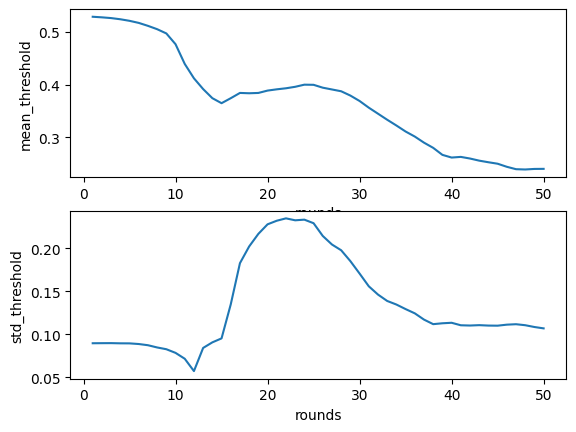

In [ ]:
## FedAdam
rounds = []
mean_threshold = []
std_threshold = []
for round,thres_mean in history_train.metrics_distributed['aggregate_threshold_mean']:
  rounds.append(round)
  mean_threshold.append(thres_mean)

for _,thres_std in history_train.metrics_distributed['aggregate_threshold_std']:
  std_threshold.append(thres_std)

plt.subplot(2,1,1)
plt.plot(rounds,mean_threshold)
plt.xlabel('rounds')
plt.ylabel('mean_threshold')
plt.subplot(2,1,2)
plt.plot(rounds,std_threshold)
plt.xlabel('rounds')
plt.ylabel('std_threshold')
plt.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


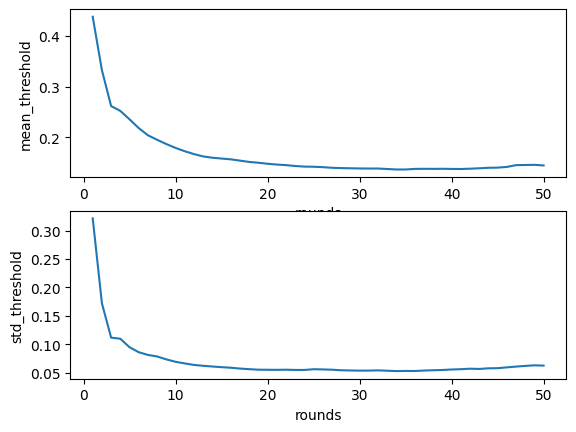

In [ ]:
rounds = []
mean_threshold = []
std_threshold = []
for round,thres_mean in history_train.metrics_distributed['aggregate_threshold_mean']:
  rounds.append(round)
  mean_threshold.append(thres_mean)

for _,thres_std in history_train.metrics_distributed['aggregate_threshold_std']:
  std_threshold.append(thres_std)

plt.subplot(2,1,1)
plt.plot(rounds,mean_threshold)
plt.xlabel('rounds')
plt.ylabel('mean_threshold')
plt.subplot(2,1,2)
plt.plot(rounds,std_threshold)
plt.xlabel('rounds')
plt.ylabel('std_threshold')
plt.show()

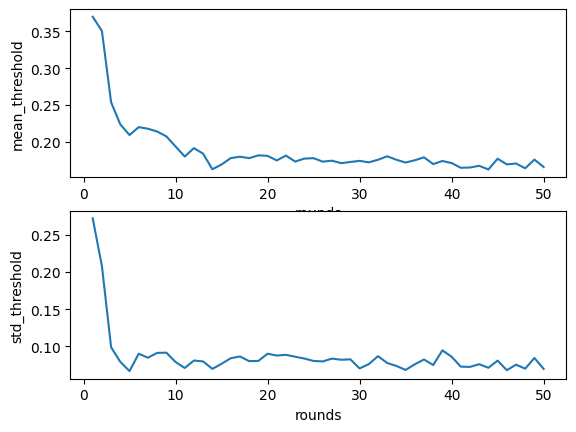

In [ ]:
rounds = []
mean_threshold = []
std_threshold = []
for round,thres_mean in history.metrics_distributed['aggregate_threshold_mean']:
  rounds.append(round)
  mean_threshold.append(thres_mean)

for _,thres_std in history.metrics_distributed['aggregate_threshold_std']:
  std_threshold.append(thres_std)

plt.subplot(2,1,1)
plt.plot(rounds,mean_threshold)
plt.xlabel('rounds')
plt.ylabel('mean_threshold')
plt.subplot(2,1,2)
plt.plot(rounds,std_threshold)
plt.xlabel('rounds')
plt.ylabel('std_threshold')
plt.show()

In [ ]:
THRESHOLD = 0.13663125886685318 # 2 layers, K = 10

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
THRESHOLD = 0.16229962247113386 # 4 layers, K = 10

In [ ]:
layer_sizes

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[115, 87, 58, 29]

In [ ]:
history.metrics_distributed

{'aggregate_threshold_mean': [(1, 0.22158995850218666),
  (2, 0.18125843070447445),
  (3, 0.17685564793646336),
  (4, 0.1744497778515021),
  (5, 0.17559111532237795),
  (6, 0.16811327346497112),
  (7, 0.16635624277922842),
  (8, 0.1645735585027271),
  (9, 0.16335217820273507),
  (10, 0.16282600578334597),
  (11, 0.15806875295109218),
  (12, 0.15455169023738968),
  (13, 0.15189083996746275),
  (14, 0.15060522365901205),
  (15, 0.14921108240054715),
  (16, 0.14825623979171118),
  (17, 0.14795329049229622),
  (18, 0.14816817165248924),
  (19, 0.1482955796851052),
  (20, 0.14696478926473194),
  (21, 0.14559541456401348),
  (22, 0.14622510369453165),
  (23, 0.1446231636736128),
  (24, 0.1433668149014314),
  (25, 0.1428381074219942),
  (26, 0.14187442262967428),
  (27, 0.1409310485339827),
  (28, 0.13917404744360182),
  (29, 0.1399693652573559),
  (30, 0.13871433792842758),
  (31, 0.13645457248720858),
  (32, 0.13599938506053555),
  (33, 0.13460093239943186),
  (34, 0.1335976007911894),
  (3

In [ ]:
THRESHOLD = 0.16229962247113386 #(4 layers, K = 10)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


SyntaxError: invalid syntax. Perhaps you forgot a comma? (<ipython-input-29-b53b46bed536>, line 1)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


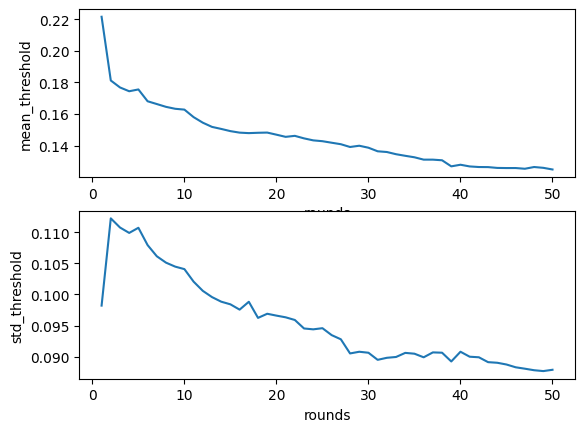

In [ ]:
rounds = []
mean_threshold = []
std_threshold = []
for round,thres_mean in history.metrics_distributed['aggregate_threshold_mean']:
  rounds.append(round)
  mean_threshold.append(thres_mean)

for _,thres_std in history.metrics_distributed['aggregate_threshold_std']:
  std_threshold.append(thres_std)

plt.subplot(2,1,1)
plt.plot(rounds,mean_threshold)
plt.xlabel('rounds')
plt.ylabel('mean_threshold')
plt.subplot(2,1,2)
plt.plot(rounds,std_threshold)
plt.xlabel('rounds')
plt.ylabel('std_threshold')
plt.show()

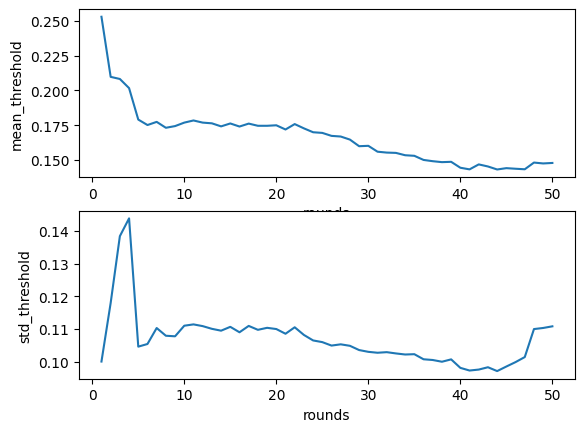

In [ ]:
rounds = []
mean_threshold = []
std_threshold = []
for round,thres_mean in history.metrics_distributed['aggregate_threshold_mean']:
  rounds.append(round)
  mean_threshold.append(thres_mean)

for _,thres_std in history.metrics_distributed['aggregate_threshold_std']:
  std_threshold.append(thres_std)

plt.subplot(2,1,1)
plt.plot(rounds,mean_threshold)
plt.xlabel('rounds')
plt.ylabel('mean_threshold')
plt.subplot(2,1,2)
plt.plot(rounds,std_threshold)
plt.xlabel('rounds')
plt.ylabel('std_threshold')
plt.show()

Select threshold to be 32.745083350275095

In [ ]:
THRESHOLD = 0.1293 # Fraction fit = 1

In [ ]:
THRESHOLD = 0.14301959466603067 # 4 layers, fraction fit = 1

In [ ]:
THRESHOLD = 0.18669525533914566 # Fraction fit = 0.5

In [ ]:
import glob
list_of_files = [fname for fname in glob.glob("./model_round_*")]

In [ ]:
list_of_files

['./model_round_44.pth',
 './model_round_3.pth',
 './model_round_10.pth',
 './model_round_4.pth',
 './model_round_2.pth',
 './model_round_1.pth',
 './model_round_9.pth',
 './model_round_14.pth',
 './model_round_5.pth',
 './model_round_11.pth']

In [ ]:
latest_round_file = max(list_of_files, key=os.path.getctime)
print("Loading pre-trained model from: ", latest_round_file)
state_dict = torch.load(latest_round_file)
global_model_trained.load_state_dict(state_dict)
state_dict_ndarrays = [v.cpu().numpy() for v in global_model_trained.state_dict().values()]
parameters = flwr.common.ndarrays_to_parameters(state_dict_ndarrays)

Loading pre-trained model from:  ./model_round_44.pth


<ipython-input-36-f6cca0873069>:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(latest_round_file)


In [ ]:
global_model_trained

Autoencoder_2_layers(
  (encoder): Sequential(
    (0): Linear(in_features=35, out_features=15, bias=True)
    (1): ReLU(inplace=True)
  )
  (decoder): Sequential(
    (0): Linear(in_features=15, out_features=35, bias=True)
    (1): Sigmoid()
  )
)

In [132]:
latest_round_file = '/content/model_round_50.pth'
state_dict = torch.load(latest_round_file)
global_model_trained.load_state_dict(state_dict)
state_dict_ndarrays = [v.cpu().numpy() for v in global_model_trained.state_dict().values()]
parameters = flwr.common.ndarrays_to_parameters(state_dict_ndarrays)

<ipython-input-132-0bf6ef33672c>:2: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



## **Run Test**

In [112]:
## The first step toward creating a ClientApp is to implement a subclasses of flwr.client.Client or flwr.client.NumPyClient.
## We use NumPyClient in this tutorial because it is easier to implement and requires us to write less boilerplate.
from sklearn.metrics import roc_curve, auc
class FlowerClient_Test(NumPyClient):
    def __init__(self, net, partition_id,trainloader, valloader, benign_testloader, attack_testloader):
        self.net = net
        self.trainloader = trainloader
        self.valloader = valloader
        self.benign_testloader = benign_testloader
        self.attack_testloader = attack_testloader
        self.partition_id = partition_id

    def get_parameters(self, config):
        return get_parameters(self.net)
    ## Federated Training
    def fit(self, parameters, config):
      print(f"[Client {self.partition_id}] fit, config: {config}")
      set_parameters(self.net, parameters)
      ## disable training for the test simulation
      loss,loss_history, valid_loss_array = validation(self.net, self.trainloader)
      return get_parameters(self.net), len(self.trainloader), {'validation_loss':loss}
    ## Federated Evaluation (client-side evaluation)
    def evaluate(self, parameters, config):
      print(f"[Client {self.partition_id}] evaluate, config: {config}")
      set_parameters(self.net, parameters)
      client_thresholds = history_train.metrics_distributed['client_thresholds'][-1][-1]
      benign_loss, benign_MSE_history,fpr_thres, benign_loss_array = test(self.net, self.valloader,threshold = THRESHOLD)
      attack_loss, attack_MSE_history,tpr_thres, attack_loss_array = test(self.net, self.attack_testloader,threshold = THRESHOLD)
      reconstruction_errors = benign_MSE_history+attack_MSE_history  # Combine errors
      labels = [0]*len(benign_MSE_history) + [1]*len(attack_MSE_history)  # 0 for normal, 1 for anomaly
      fpr, tpr, thresholds = roc_curve(labels, reconstruction_errors)
      roc_auc = auc(fpr, tpr)
      # find outliers with OCSVM
      loaded_svm = joblib.load(f'svm_model_{self.partition_id}.pkl')
      benign_MSE_history,attack_MSE_history = np.array(benign_MSE_history).reshape(-1,1),np.array(attack_MSE_history).reshape(-1,1)
      benign_score = loaded_svm.decision_function(benign_MSE_history)
      attack_score = loaded_svm.decision_function(attack_MSE_history)
      print(f'benign_score:{np.median(benign_score)}')
      print(np.mean(benign_score))
      plt.figure(figsize=(10, 6))
      plt.boxplot([benign_score, attack_score], vert=False, patch_artist=True, showmeans=True, labels=["Benign", "Attack"])
      plt.title(f'distribution of svm score of Client {self.partition_id}')
      plt.savefig(f'boxplot_{self.partition_id}')
      fpr_ocsvm = np.sum((loaded_svm.predict(benign_MSE_history) < 0))/benign_MSE_history.shape[0]
      tpr_ocsvm = np.sum((loaded_svm.predict(attack_MSE_history) < 0))/attack_MSE_history.shape[0]
      return float(benign_loss), len(self.valloader), {"client_id":self.partition_id,"benign_MSE": benign_loss,"attack_MSE":attack_loss,'fpr':fpr_ocsvm,'tpr':tpr_ocsvm,'roc_auc':roc_auc}

In [74]:
history_train.metrics_distributed['client_thresholds'][49]

(50,
 [0.35534229824408436,
  0.3764547482445053,
  0.3784031535946996,
  0.3901118938667891,
  0.35062723612128793,
  0.3795308043777132,
  0.3583564774941485,
  0.3441131717469774,
  0.3993303914865679])

In [ ]:
layer_sizes

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[115, 87, 58, 29]

In [32]:
def client_fn_test(context: Context) -> Client:
    """Create a Flower client representing a single organization."""

    # Load model
    #net = Autoencoder(115,58,29).to(DEVICE)
    #net = Autoencoder(115,58,29)
    net = Autoencoder_4_layers(layer_sizes)
    #net = Autoencoder_2_layers(35,15)

    # Load data (CIFAR-10)
    # Note: each client gets a different trainloader/valloader, so each client
    # will train and evaluate on their own unique data partition
    # Read the node_config to fetch data partition associated to this node
    # The value of partition-id is retrieved from the node_config dictionary in the Context object, which holds the information that persists throughout each training round.
    partition_id = int(context.node_config["partition-id"])
    trainloader, valloader, benign_testloader,attack_testloader = load_datasets(final_df, 'Autoencoder',partition_id=partition_id,label_col_num = 3)

    # Create a single Flower client representing a single organization
    # FlowerClient is a subclass of NumPyClient, so we need to call .to_client()
    # to convert it to a subclass of `flwr.client.Client`
    return FlowerClient_Test(net, partition_id,trainloader, valloader,benign_testloader,attack_testloader).to_client()


# Create the ClientApp
client = ClientApp(client_fn=client_fn_test)

In [ ]:
l1 = [[1,2,3],[4,5,6],[7,8,9]]
l2 = [[10,11,12],[13,14,15],[16,17,18]]
for a,b in zip(l1,l2):
  print(a+b)

[1, 2, 3, 10, 11, 12]
[4, 5, 6, 13, 14, 15]
[7, 8, 9, 16, 17, 18]


In [ ]:
l1 = [[1,2,3],[4,5,6],[7,8,9]]
l2 = [[10,11,12],[13,14,15],[16,17,18]]
l3 = [a+b for a,b in zip(l1,l2)]
print(l3)

[[1, 2, 3, 10, 11, 12], [4, 5, 6, 13, 14, 15], [7, 8, 9, 16, 17, 18]]


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
np.mean([1,2,3])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


2.0

In [33]:
## Define test metrics
def aggregate_metrics(metrics: List[Tuple[int, Metrics]]) -> Metrics:
  fpr_list = [m['fpr'] for num_examples,m in metrics]
  tpr_list = [m['tpr'] for num_examples,m in metrics]
  roc_auc_list = [m['roc_auc'] for _,m in metrics]
  benign_loss_list = [m['benign_MSE'] for _,m in metrics]
  attack_loss_list = [m['attack_MSE'] for _,m in metrics]
  client_id = [m['client_id'] for _,m in metrics]
  for id, fpr, tpr, roc_auc in zip(client_id,fpr_list,tpr_list,roc_auc_list):
    print(f'Client {id}: fpr {fpr} tpr {tpr} roc_auc {roc_auc}')
  return {'mean_roc_auc':np.mean(roc_auc_list),
          'std_roc_auc':np.std(roc_auc_list),
          'mean_fpr':np.mean(fpr_list),
          'std_fpr':np.std(fpr_list),
          'mean_tpr':np.mean(tpr_list),
          'std_tpr':np.std(tpr_list),
          'mean_benign_loss':np.mean(benign_loss_list),
          'std_benign_loss':np.std(benign_loss_list),
          'mean_attack_loss':np.mean(attack_loss_list),
          'std_attack_loss':np.std(attack_loss_list)}


In [34]:
def server_fn(context: Context) -> ServerAppComponents:
    """Construct components that set the ServerApp behaviour.

    You can use settings in `context.run_config` to parameterize the
    construction of all elements (e.g the strategy or the number of rounds)
    wrapped in the returned ServerAppComponents object.
    """

    # Create FedAvg strategy
    strategy = FedAvg(
        fraction_fit=1,
        fraction_evaluate=1,
        min_fit_clients=9,
        min_evaluate_clients=9,
        min_available_clients=9,
        evaluate_metrics_aggregation_fn= aggregate_metrics,  # <-- pass the metric aggregation function, return the max loss in each validation round
        fit_metrics_aggregation_fn=max_loss,
        initial_parameters=parameters,
    )

    # Configure the server for 5 rounds of training
    config = ServerConfig(num_rounds=1)

    return ServerAppComponents(strategy=strategy, config=config)

In [ ]:
# Create a new server instance with the updated FedAvg strategy
server = ServerApp(server_fn=server_fn)

# Run simulation
run_simulation(
    server_app=server,
    client_app=client,
    num_supernodes=NUM_CLIENTS,
    backend_config=backend_config,
)

DEBUG:flwr:Asyncio event loop already running.
ERROR :     ServerApp thread raised an exception: name 'SaveModelStrategy' is not defined
ERROR :     Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/flwr/simulation/run_simulation.py", line 336, in server_th_with_start_checks
    run_server_app(
  File "/usr/local/lib/python3.10/dist-packages/flwr/server/run_serverapp.py", line 87, in run
    server_app(driver=driver, context=context)
  File "/usr/local/lib/python3.10/dist-packages/flwr/server/server_app.py", line 115, in __call__
    components = self._server_fn(context)
  File "<ipython-input-26-8d3ce8831fe5>", line 10, in server_fn
    strategy = SaveModelStrategy(
NameError: name 'SaveModelStrategy' is not defined

Exception in thread Thread-11 (server_th_with_start_checks):
Traceback (most recent call last):
  File "/usr/lib/python3.10/threading.py", line 1016, in _bootstrap_inner
    self.run()
  File "/usr/lib/python3.10/threading.py", line 953, i

RuntimeError: Exception in ServerApp thread

In [ ]:
# Create a new server instance with the updated FedAvg strategy
server = ServerApp(server_fn=server_fn)

# Run simulation
run_simulation(
    server_app=server,
    client_app=client,
    num_supernodes=NUM_CLIENTS,
    backend_config=backend_config,
)

INFO :      Starting Flower ServerApp, config: num_rounds=1, no round_timeout
INFO :      
INFO :      [INIT]
INFO :      Using initial global parameters provided by strategy
INFO :      Starting evaluation of initial global parameters
INFO :      Evaluation returned no results (`None`)
INFO :      
INFO :      [ROUND 1]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)
(pid=69356) 2024-10-23 08:43:25.479934: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
(pid=69359) 2024-10-23 08:43:25.562839: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
(pid=69359) 2024-10-23 08:43:25.574592: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register fact

(ClientAppActor pid=69359) [Client 3] fit, config: {}


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.003140005342021052, 0.0037903411743502946, 0.0029904219042912834, 0.003639799014313823, 0.002792545724591492, 0.002207268122598555, 0.0032025196982568838, 0.003308634517771404, 0.0025536444042332375]
Saving round 1 aggregated_parameters...
(ClientAppActor pid=69359) [Client 1] evaluate, config: {}
(ClientAppActor pid=69359) total_size:2623
(ClientAppActor pid=69359) exceed threshold proportion:0.0


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [SUMMARY]
INFO :      Run finished 1 round(s) in 25.01s
INFO :      	History (loss, distributed):
INFO :      		round 1: 63.871510032323926
INFO :      	History (metrics, distributed, fit):
INFO :      	{'client_max_loss': [(1, 1)], 'max_loss': [(1, 0.0037903411743502946)]}
INFO :      	History (metrics, distributed, evaluate):
INFO :      	{'mean_attack_loss': [(1, 15.884804107002086)],
INFO :      	 'mean_benign_loss': [(1, 62.600077967597066)],
INFO :      	 'mean_fpr': [(1, 0.00010416666666666666)],
INFO :      	 'mean_roc_auc': [(1, 0.8581223492700789)],
INFO :      	 'mean_tpr': [(1, 0.16044444444444445)],
INFO :      	 'std_attack_loss': [(1, 17.692912382733663)],
INFO :      	 'std_benign_loss': [(1, 176.78927921132347)],
INFO :      	 'std_fpr': [(1, 0.0002946278254943948)],
INFO :      	 'std_roc_auc': [(1, 0.11922628489850438)],
INFO :      	 'std_tpr': [(1, 0.23021049479461236)]}
INFO

(ClientAppActor pid=69362) [Client 0] fit, config: {} [repeated 8x across cluster]
(ClientAppActor pid=69353) [Client 8] evaluate, config: {} [repeated 8x across cluster]
(ClientAppActor pid=69353) total_size:8000 [repeated 17x across cluster]
(ClientAppActor pid=69353) exceed threshold proportion:0.0 [repeated 17x across cluster]


(pid=69357) 2024-10-23 08:43:26.183633: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered [repeated 7x across cluster]
(pid=69357) 2024-10-23 08:43:26.225558: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered [repeated 7x across cluster]
(pid=69357) 2024-10-23 08:43:26.237500: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered [repeated 7x across cluster]
(pid=69362) 2024-10-23 08:43:29.196620: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT [repeated 7x across cluster]


In [ ]:
## MAD threshold
# Create a new server instance with the updated FedAvg strategy
server = ServerApp(server_fn=server_fn)

# Run simulation
run_simulation(
    server_app=server,
    client_app=client,
    num_supernodes=NUM_CLIENTS,
    backend_config=backend_config,
)

INFO :      Starting Flower ServerApp, config: num_rounds=1, no round_timeout
INFO :      
INFO :      [INIT]
INFO :      Using initial global parameters provided by strategy
INFO :      Starting evaluation of initial global parameters
INFO :      Evaluation returned no results (`None`)
INFO :      
INFO :      [ROUND 1]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)
(pid=144883) 2024-10-23 12:39:38.072620: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
(pid=144883) 2024-10-23 12:39:38.113206: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
(pid=144883) 2024-10-23 12:39:38.125581: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register f

(ClientAppActor pid=144888) [Client 0] fit, config: {}


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.0689497108872639, 0.08928580165410405, 0.07457067637829473, 0.10835538864752409, 0.09808950467104027, 0.10296854861217822, 0.1445063145359293, 0.10963209822126756, 0.07751523761068879]
Saving round 1 aggregated_parameters...
(ClientAppActor pid=144884) [Client 1] evaluate, config: {}
(ClientAppActor pid=144884) exceed threshold proportion:0.008768585589020206


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [SUMMARY]
INFO :      Run finished 1 round(s) in 28.53s
INFO :      	History (loss, distributed):
INFO :      		round 1: 50.966152087466924
INFO :      	History (metrics, distributed, fit):
INFO :      	{'client_max_loss': [(1, 6)], 'max_loss': [(1, 0.1445063145359293)]}
INFO :      	History (metrics, distributed, evaluate):
INFO :      	{'mean_attack_loss': [(1, 15.561809186127448)],
INFO :      	 'mean_benign_loss': [(1, 49.9614921534415)],
INFO :      	 'mean_fpr': [(1, 0.027467342843224468)],
INFO :      	 'mean_roc_auc': [(1, 0.831924808657125)],
INFO :      	 'mean_tpr': [(1, 0.7486805555555556)],
INFO :      	 'std_attack_loss': [(1, 17.340470706051548)],
INFO :      	 'std_benign_loss': [(1, 141.03847900390687)],
INFO :      	 'std_fpr': [(1, 0.030850179868333678)],
INFO :      	 'std_roc_auc': [(1, 0.0991333507149738)],
INFO :      	 'std_tpr': [(1, 0.08207828053634207)]}
INFO :      


(ClientAppActor pid=144881) [Client 6] fit, config: {} [repeated 8x across cluster]
(ClientAppActor pid=144884) [Client 3] evaluate, config: {} [repeated 8x across cluster]
(ClientAppActor pid=144884) exceed threshold proportion:0.788375 [repeated 17x across cluster]


(pid=144878) 2024-10-23 12:39:38.544065: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered [repeated 7x across cluster]
(pid=144878) 2024-10-23 12:39:38.629149: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered [repeated 7x across cluster]
(pid=144878) 2024-10-23 12:39:38.650989: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered [repeated 7x across cluster]
(pid=144881) 2024-10-23 12:39:41.622797: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT [repeated 7x across cluster]


In [ ]:
## MAD threshold
# Create a new server instance with the updated FedAvg strategy
server = ServerApp(server_fn=server_fn)

# Run simulation
run_simulation(
    server_app=server,
    client_app=client,
    num_supernodes=NUM_CLIENTS,
    backend_config=backend_config,
)

INFO :      Starting Flower ServerApp, config: num_rounds=1, no round_timeout
INFO :      
INFO :      [INIT]
INFO :      Using initial global parameters provided by strategy
INFO :      Starting evaluation of initial global parameters
INFO :      Evaluation returned no results (`None`)
INFO :      
INFO :      [ROUND 1]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)
(pid=77963) 2024-11-01 06:30:39.611489: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
(pid=77963) 2024-11-01 06:30:39.647541: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
(pid=77963) 2024-11-01 06:30:39.658646: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register fact

(ClientAppActor pid=77962) [Client 3] fit, config: {}


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.0689866964507139, 0.0687736714032735, 0.1568096489401618, 0.08931953123593546, 0.1015106328811662, 0.17748922673657322, 0.07052571094095206, 0.06183566073709378, 0.05411328374375863]
(ClientAppActor pid=77962) [Client 1] evaluate, config: {}
(ClientAppActor pid=77963) exceed threshold proportion:0.4475


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [SUMMARY]
INFO :      Run finished 1 round(s) in 19.62s
INFO :      	History (loss, distributed):
INFO :      		round 1: 230952735.76337034
INFO :      	History (metrics, distributed, fit):
INFO :      	{'client_max_loss': [(1, 5)], 'max_loss': [(1, 0.17748922673657322)]}
INFO :      	History (metrics, distributed, evaluate):
INFO :      	{'mean_attack_loss': [(1, 144612782823953.38)],
INFO :      	 'mean_benign_loss': [(1, 402772643.56591463)],
INFO :      	 'mean_fpr': [(1, 0.44729166666666664)],
INFO :      	 'mean_roc_auc': [(1, 0.8276072569444444)],
INFO :      	 'mean_tpr': [(1, 0.8793611111111113)],
INFO :      	 'std_attack_loss': [(1, 238518143562645.53)],
INFO :      	 'std_benign_loss': [(1, 1139213063.8198047)],
INFO :      	 'std_fpr': [(1, 0.3867329998777509)],
INFO :      	 'std_roc_auc': [(1, 0.21269286410846064)],
INFO :      	 'std_tpr': [(1, 0.18821458686795914)]}
INFO :      


Client 4: fpr 1.0 tpr 1.0 roc_auc 0.9788193749999999
Client 3: fpr 0.488125 tpr 0.856875 roc_auc 0.920794609375
Client 2: fpr 0.00625 tpr 0.999 roc_auc 0.998878125
Client 6: fpr 0.005 tpr 0.9995 roc_auc 0.9995221875
Client 7: fpr 0.0 tpr 0.93025 roc_auc 0.9926124218749999
Client 0: fpr 0.4475 tpr 0.384625 roc_auc 0.594313359375
Client 8: fpr 0.790625 tpr 0.952625 roc_auc 0.37308390625
Client 1: fpr 0.288125 tpr 0.791375 roc_auc 0.9100353906249998
Client 5: fpr 1.0 tpr 1.0 roc_auc 0.6804059375
(ClientAppActor pid=77964) [Client 1] fit, config: {} [repeated 8x across cluster]
(ClientAppActor pid=77964) [Client 8] evaluate, config: {} [repeated 8x across cluster]
(ClientAppActor pid=77964) exceed threshold proportion:0.952625 [repeated 17x across cluster]


(pid=77964) 2024-11-01 06:30:39.798679: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered [repeated 7x across cluster]
(pid=77964) 2024-11-01 06:30:39.833795: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered [repeated 7x across cluster]
(pid=77964) 2024-11-01 06:30:39.844517: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered [repeated 7x across cluster]
(pid=77964) 2024-11-01 06:30:42.012074: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT [repeated 7x across cluster]


In [ ]:
THRESHOLD = 58.401026705486906

In [50]:
latest_round_file = '/content/model_round_22.pth'
state_dict = torch.load(latest_round_file)
global_model_trained.load_state_dict(state_dict)
state_dict_ndarrays = [v.cpu().numpy() for v in global_model_trained.state_dict().values()]
parameters = flwr.common.ndarrays_to_parameters(state_dict_ndarrays)

<ipython-input-50-81d1b8cfacd2>:2: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



## **Testing with FedAdam and OCSVM**

In [133]:

strategy = FedAvg(
        fraction_fit=1,
        fraction_evaluate=1,
        min_fit_clients=9,
        min_evaluate_clients=9,
        min_available_clients=9,
        evaluate_metrics_aggregation_fn= aggregate_metrics,  # <-- pass the metric aggregation function, return the max loss in each validation round
        fit_metrics_aggregation_fn=max_loss,
        initial_parameters=parameters,
    )
history_test = flwr.simulation.start_simulation(
        client_fn=client_fn_test,  # a function that spawns a particular client
        num_clients=NUM_CLIENTS,  # total number of clients
        config=flwr.server.ServerConfig(
            num_rounds=1
        ),  # minimal config for the server loop telling the number of rounds in FL
        strategy=strategy,  # our strategy of choice
        client_resources={
            "num_cpus": 1,
            "num_gpus": 0.0,
        },  # (optional) controls the degree of parallelism of your simulation.
        # Lower resources per client allow for more clients to run concurrently
        # (but need to be set taking into account the compute/memory footprint of your run)
        # `num_cpus` is an absolute number (integer) indicating the number of threads a client should be allocated
        # `num_gpus` is a ratio indicating the portion of gpu memory that a client needs.
    )

	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=1, no round_timeout
2024-11-28 13:09:25,105	INFO worker.py:1752 -- Started a local Ray instance.
INFO :      Flower VCE: Ray initialized with resources: {'memory': 32621951387.0, 'object_store_memory': 16310975692.0, 'CPU': 8.0, 'node:172.28.0.12': 1.0, 'node:__internal_head__': 1.0}
INFO :      Optimize your simulation with Flower VCE: https://flower.ai/docs/framework/how-to-run-simulations.html
INFO :      Flower VCE: Resources for each Virtual Client: {'num_cpus': 1, 'num_gpus': 0.0}
INFO :      Flower VCE: Creating VirtualClientEngineAc

(ClientAppActor pid=231199) [Client 8] fit, config: {}


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.325791441643347, 0.36252738703785653, 0.32803761032380857, 0.32825138882617, 0.33468022157718286, 0.3286921425801207, 0.2757187908045028, 0.302462632848315, 0.3300224473258971]
(ClientAppActor pid=231205) [Client 5] evaluate, config: {}
(ClientAppActor pid=231205) exceed threshold proportion:0.004647435897435897
(ClientAppActor pid=231205) count_total:6240.0


(ClientAppActor pid=231204) /usr/local/lib/python3.10/dist-packages/jupyter_client/connect.py:28: DeprecationWarning: Jupyter is migrating its paths to use standard platformdirs
(ClientAppActor pid=231204) given by the platformdirs library.  To remove this warning and
(ClientAppActor pid=231204) see the appropriate new directories, set the environment variable
(ClientAppActor pid=231204) `JUPYTER_PLATFORM_DIRS=1` and then run `jupyter --paths`.
(ClientAppActor pid=231204) The use of platformdirs will be the default in `jupyter_core` v6
(ClientAppActor pid=231204)   from jupyter_core.paths import jupyter_data_dir, jupyter_runtime_dir, secure_write
(pid=231207) 2024-11-28 13:09:27.678328: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered [repeated 7x across cluster]
(pid=231202) 2024-11-28 13:09:27.626375: E external/local_xla/xla/stream_executor/cuda/cuda_d

Client 8: fpr 0.48701923076923076 tpr 0.00025 roc_auc 0.9945197115384614
Client 5: fpr 0.5878205128205128 tpr 0.002625 roc_auc 0.9979147836538461
Client 1: fpr 0.49980445834962844 tpr 0.0 roc_auc 0.9997768136488071
Client 2: fpr 0.48541666666666666 tpr 0.001 roc_auc 0.9894049679487179
Client 4: fpr 0.5934294871794872 tpr 0.004125 roc_auc 0.996809955929487
Client 6: fpr 0.5 tpr 0.00375 roc_auc 0.9958441105769231
Client 7: fpr 0.47451923076923075 tpr 0.0 roc_auc 0.9902560596955128
Client 3: fpr 0.5399038461538461 tpr 0.007375 roc_auc 0.9921873998397436
Client 0: fpr 0.4979166666666667 tpr 0.00125 roc_auc 0.9987553886217948


## **Testing with FedAdam and STD threshold**

In [113]:

strategy = FedAvg(
        fraction_fit=1,
        fraction_evaluate=1,
        min_fit_clients=9,
        min_evaluate_clients=9,
        min_available_clients=9,
        evaluate_metrics_aggregation_fn= aggregate_metrics,  # <-- pass the metric aggregation function, return the max loss in each validation round
        fit_metrics_aggregation_fn=max_loss,
        initial_parameters=parameters,
    )
history_test = flwr.simulation.start_simulation(
        client_fn=client_fn_test,  # a function that spawns a particular client
        num_clients=NUM_CLIENTS,  # total number of clients
        config=flwr.server.ServerConfig(
            num_rounds=1
        ),  # minimal config for the server loop telling the number of rounds in FL
        strategy=strategy,  # our strategy of choice
        client_resources={
            "num_cpus": 1,
            "num_gpus": 0.0,
        },  # (optional) controls the degree of parallelism of your simulation.
        # Lower resources per client allow for more clients to run concurrently
        # (but need to be set taking into account the compute/memory footprint of your run)
        # `num_cpus` is an absolute number (integer) indicating the number of threads a client should be allocated
        # `num_gpus` is a ratio indicating the portion of gpu memory that a client needs.
    )

	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=1, no round_timeout
2024-11-28 12:25:53,277	INFO worker.py:1752 -- Started a local Ray instance.
INFO :      Flower VCE: Ray initialized with resources: {'CPU': 8.0, 'node:172.28.0.12': 1.0, 'node:__internal_head__': 1.0, 'memory': 32623828992.0, 'object_store_memory': 16311914496.0}
INFO :      Optimize your simulation with Flower VCE: https://flower.ai/docs/framework/how-to-run-simulations.html
INFO :      Flower VCE: Resources for each Virtual Client: {'num_cpus': 1, 'num_gpus': 0.0}
INFO :      Flower VCE: Creating VirtualClientEngineAc

(ClientAppActor pid=180227) [Client 1] fit, config: {}


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.32374077696203324, 0.3615701454995362, 0.32471187238147536, 0.3286231785826355, 0.32808801244707286, 0.3186809830528781, 0.3342132638673558, 0.3019126507501836, 0.2718490328826994]
(ClientAppActor pid=180232) [Client 2] evaluate, config: {}
(ClientAppActor pid=180232) exceed threshold proportion:0.022115384615384617
(ClientAppActor pid=180232) count_total:6240.0


(ClientAppActor pid=180232) /usr/local/lib/python3.10/dist-packages/jupyter_client/connect.py:28: DeprecationWarning: Jupyter is migrating its paths to use standard platformdirs
(ClientAppActor pid=180232) given by the platformdirs library.  To remove this warning and
(ClientAppActor pid=180232) see the appropriate new directories, set the environment variable
(ClientAppActor pid=180232) `JUPYTER_PLATFORM_DIRS=1` and then run `jupyter --paths`.
(ClientAppActor pid=180232) The use of platformdirs will be the default in `jupyter_core` v6
(ClientAppActor pid=180232)   from jupyter_core.paths import jupyter_data_dir, jupyter_runtime_dir, secure_write
(pid=180232) 2024-11-28 12:25:56.535719: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered [repeated 7x across cluster]
(pid=180232) 2024-11-28 12:25:56.565602: E external/local_xla/xla/stream_executor/cuda/cuda_d

Client 7: fpr 0.05 tpr 0.0 roc_auc 0.9899258213141026
Client 6: fpr 0.05016025641025641 tpr 0.0 roc_auc 0.99620625
Client 8: fpr 0.05016025641025641 tpr 0.000125 roc_auc 0.9946275040064103
Client 0: fpr 0.05 tpr 0.0005 roc_auc 0.9990399539262822
Client 5: fpr 0.05016025641025641 tpr 0.0 roc_auc 0.9983954527243589
Client 1: fpr 0.04986312084473993 tpr 0.0 roc_auc 0.9997809200234651
Client 4: fpr 0.05 tpr 0.0 roc_auc 0.9972619190705129
Client 3: fpr 0.05 tpr 0.005625 roc_auc 0.9928450520833334
Client 2: fpr 0.05 tpr 0.0 roc_auc 0.9896410256410256


In [92]:
history_train.metrics_distributed['client_thresholds'][49]

(50,
 (0.38129580633378246,
  0.34383983323504796,
  0.33940361721593926,
  0.32085848980599446,
  0.3640465830237853,
  0.36552043999192796,
  0.3951077974209034,
  0.34611490291652935,
  0.32859220056974014))

In [77]:
strategy = FedAvg(
        fraction_fit=1,
        fraction_evaluate=1,
        min_fit_clients=9,
        min_evaluate_clients=9,
        min_available_clients=9,
        evaluate_metrics_aggregation_fn= aggregate_metrics,  # <-- pass the metric aggregation function, return the max loss in each validation round
        fit_metrics_aggregation_fn=max_loss,
        initial_parameters=parameters,
    )
history_test = flwr.simulation.start_simulation(
        client_fn=client_fn_test,  # a function that spawns a particular client
        num_clients=NUM_CLIENTS,  # total number of clients
        config=flwr.server.ServerConfig(
            num_rounds=1
        ),  # minimal config for the server loop telling the number of rounds in FL
        strategy=strategy,  # our strategy of choice
        client_resources={
            "num_cpus": 1,
            "num_gpus": 0.0,
        },  # (optional) controls the degree of parallelism of your simulation.
        # Lower resources per client allow for more clients to run concurrently
        # (but need to be set taking into account the compute/memory footprint of your run)
        # `num_cpus` is an absolute number (integer) indicating the number of threads a client should be allocated
        # `num_gpus` is a ratio indicating the portion of gpu memory that a client needs.
    )

	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=1, no round_timeout
2024-11-27 12:13:24,926	INFO worker.py:1752 -- Started a local Ray instance.
INFO :      Flower VCE: Ray initialized with resources: {'CPU': 8.0, 'node:__internal_head__': 1.0, 'node:172.28.0.12': 1.0, 'memory': 32674988852.0, 'object_store_memory': 16337494425.0}
INFO :      Optimize your simulation with Flower VCE: https://flower.ai/docs/framework/how-to-run-simulations.html
INFO :      Flower VCE: Resources for each Virtual Client: {'num_cpus': 1, 'num_gpus': 0.0}
INFO :      Flower VCE: Creating VirtualClientEngineAc

(ClientAppActor pid=261028) [Client 4] fit, config: {}


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.12818740021439198, 0.11982727778207386, 0.08362084998784873, 0.11741157826904991, 0.11326049256542589, 0.0995829824186858, 0.10915593799824018, 0.09394513685593603, 0.10287079950195988]
(ClientAppActor pid=261035) [Client 2] evaluate, config: {}
(ClientAppActor pid=261035) exceed threshold proportion:0.1203125
(ClientAppActor pid=261035) count_total:3200.0


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [SUMMARY]
INFO :      Run finished 1 round(s) in 10.55s
INFO :      	History (loss, distributed):
INFO :      		round 1: 63.88126532676011
INFO :      	History (metrics, distributed, fit):
INFO :      	{'client_max_loss': [(1, 0)], 'max_loss': [(1, 0.12818740021439198)]}
INFO :      	History (metrics, distributed, evaluate):
INFO :      	{'mean_attack_loss': [(1, 15.895620834479729)],
INFO :      	 'mean_benign_loss': [(1, 62.6097162061517)],
INFO :      	 'mean_fpr': [(1, 0.11008089496759436)],
INFO :      	 'mean_roc_auc': [(1, 0.8645989103007053)],
INFO :      	 'mean_tpr': [(1, 0.7715694444444445)],
INFO :      	 'std_attack_loss': [(1, 17.691607476565242)],
INFO :      	 'std_benign_loss': [(1, 176.7880263273804)],
INFO :      	 'std_fpr': [(1, 0.04743379876324183)],
INFO :      	 'std_roc_auc': [(1, 0.11242422349509061)],
INFO :      	 'std_tpr': [(1, 0.1137320668267809)]}
INFO :      


Client 3: fpr 0.03375 tpr 0.789125 roc_auc 0.9797846875
Client 0: fpr 0.155 tpr 1.0 roc_auc 0.9935839453124999
Client 8: fpr 0.0409375 tpr 0.791625 roc_auc 0.8680103515625001
Client 7: fpr 0.1053125 tpr 0.790375 roc_auc 0.8023260156249999
Client 5: fpr 0.11 tpr 0.791625 roc_auc 0.9102944921875
Client 6: fpr 0.1678125 tpr 0.5925 roc_auc 0.6049259374999999
Client 2: fpr 0.1203125 tpr 0.5995 roc_auc 0.815155625
Client 1: fpr 0.1704155547083492 tpr 0.79825 roc_auc 0.8539306614563478
Client 4: fpr 0.0871875 tpr 0.791125 roc_auc 0.9533784765625001


In [79]:
## without hyperparameter tunig
strategy = FedAvg(
        fraction_fit=1,
        fraction_evaluate=1,
        min_fit_clients=9,
        min_evaluate_clients=9,
        min_available_clients=9,
        evaluate_metrics_aggregation_fn= aggregate_metrics,  # <-- pass the metric aggregation function, return the max loss in each validation round
        fit_metrics_aggregation_fn=max_loss,
        initial_parameters=parameters,
    )
history_test = flwr.simulation.start_simulation(
        client_fn=client_fn_test,  # a function that spawns a particular client
        num_clients=NUM_CLIENTS,  # total number of clients
        config=flwr.server.ServerConfig(
            num_rounds=1
        ),  # minimal config for the server loop telling the number of rounds in FL
        strategy=strategy,  # our strategy of choice
        client_resources={
            "num_cpus": 1,
            "num_gpus": 0.0,
        },  # (optional) controls the degree of parallelism of your simulation.
        # Lower resources per client allow for more clients to run concurrently
        # (but need to be set taking into account the compute/memory footprint of your run)
        # `num_cpus` is an absolute number (integer) indicating the number of threads a client should be allocated
        # `num_gpus` is a ratio indicating the portion of gpu memory that a client needs.
    )

	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=1, no round_timeout
2024-11-27 12:26:44,290	INFO worker.py:1752 -- Started a local Ray instance.
INFO :      Flower VCE: Ray initialized with resources: {'CPU': 8.0, 'object_store_memory': 16337279385.0, 'memory': 32674558772.0, 'node:172.28.0.12': 1.0, 'node:__internal_head__': 1.0}
INFO :      Optimize your simulation with Flower VCE: https://flower.ai/docs/framework/how-to-run-simulations.html
INFO :      Flower VCE: Resources for each Virtual Client: {'num_cpus': 1, 'num_gpus': 0.0}
INFO :      Flower VCE: Creating VirtualClientEngineAc

(ClientAppActor pid=265254) [Client 7] fit, config: {}


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.16582268827376057, 0.1497341662879402, 0.22416967175522376, 0.1907065179527981, 0.14144047561183268, 0.17909619020601747, 0.16089653854168345, 0.24708580217943835, 0.16325110333683132]
(ClientAppActor pid=265259) [Client 3] evaluate, config: {}
(ClientAppActor pid=265259) exceed threshold proportion:0.0384375
(ClientAppActor pid=265259) count_total:3200.0


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [SUMMARY]
INFO :      Run finished 1 round(s) in 11.48s
INFO :      	History (loss, distributed):
INFO :      		round 1: 63.94724763416822
INFO :      	History (metrics, distributed, fit):
INFO :      	{'client_max_loss': [(1, 7)], 'max_loss': [(1, 0.24708580217943835)]}
INFO :      	History (metrics, distributed, evaluate):
INFO :      	{'mean_attack_loss': [(1, 16.069291300124593)],
INFO :      	 'mean_benign_loss': [(1, 62.67533332900205)],
INFO :      	 'mean_fpr': [(1, 0.5597301780192316)],
INFO :      	 'mean_roc_auc': [(1, 0.9484171047848624)],
INFO :      	 'mean_tpr': [(1, 0.9992222222222222)],
INFO :      	 'std_attack_loss': [(1, 17.70890895678552)],
INFO :      	 'std_benign_loss': [(1, 176.7789542237577)],
INFO :      	 'std_fpr': [(1, 0.33183951399821454)],
INFO :      	 'std_roc_auc': [(1, 0.05980570667902165)],
INFO :      	 'std_tpr': [(1, 0.0010253349347384341)]}
INFO :      


Client 6: fpr 0.97125 tpr 0.99925 roc_auc 0.7899121875
Client 0: fpr 1.0 tpr 1.0 roc_auc 0.9431654296875
Client 5: fpr 0.441875 tpr 0.999375 roc_auc 0.9446729296874999
Client 8: fpr 0.645 tpr 1.0 roc_auc 0.9913928125
Client 4: fpr 0.239375 tpr 0.999 roc_auc 0.954803203125
Client 1: fpr 0.8478841021730843 tpr 1.0 roc_auc 0.9975365993137629
Client 2: fpr 0.188125 tpr 1.0 roc_auc 0.9468047656249999
Client 3: fpr 0.0384375 tpr 0.996625 roc_auc 0.9944019140625
Client 7: fpr 0.665625 tpr 0.99875 roc_auc 0.9730641015625
(ClientAppActor pid=265259) exceed threshold proportion:1.0
(ClientAppActor pid=265259) count_total:8000.0


## **Testing with FedAdam and MAD threshold**

In [36]:
strategy = FedAvg(
        fraction_fit=1,
        fraction_evaluate=1,
        min_fit_clients=9,
        min_evaluate_clients=9,
        min_available_clients=9,
        evaluate_metrics_aggregation_fn= aggregate_metrics,  # <-- pass the metric aggregation function, return the max loss in each validation round
        fit_metrics_aggregation_fn=max_loss,
        initial_parameters=parameters,
    )
history_test = flwr.simulation.start_simulation(
        client_fn=client_fn_test,  # a function that spawns a particular client
        num_clients=NUM_CLIENTS,  # total number of clients
        config=flwr.server.ServerConfig(
            num_rounds=1
        ),  # minimal config for the server loop telling the number of rounds in FL
        strategy=strategy,  # our strategy of choice
        client_resources={
            "num_cpus": 1,
            "num_gpus": 0.0,
        },  # (optional) controls the degree of parallelism of your simulation.
        # Lower resources per client allow for more clients to run concurrently
        # (but need to be set taking into account the compute/memory footprint of your run)
        # `num_cpus` is an absolute number (integer) indicating the number of threads a client should be allocated
        # `num_gpus` is a ratio indicating the portion of gpu memory that a client needs.
    )

	Instead, use the `flwr run` CLI command to start a local simulation in your Flower app, as shown for example below:

		$ flwr new  # Create a new Flower app from a template

		$ flwr run  # Run the Flower app in Simulation Mode

	Using `start_simulation()` is deprecated.

            This is a deprecated feature. It will be removed
            entirely in future versions of Flower.
        
INFO :      Starting Flower simulation, config: num_rounds=1, no round_timeout
2024-11-28 05:59:30,585	INFO worker.py:1752 -- Started a local Ray instance.
INFO :      Flower VCE: Ray initialized with resources: {'CPU': 8.0, 'object_store_memory': 16325608243.0, 'memory': 32651216487.0, 'node:__internal_head__': 1.0, 'node:172.28.0.12': 1.0}
INFO :      Optimize your simulation with Flower VCE: https://flower.ai/docs/framework/how-to-run-simulations.html
INFO :      Flower VCE: Resources for each Virtual Client: {'num_cpus': 1, 'num_gpus': 0.0}
INFO :      Flower VCE: Creating VirtualClientEngineAc

(ClientAppActor pid=19994) [Client 5] fit, config: {}


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[0.1615697008846165, 0.14726199804160206, 0.19059490290068723, 0.22517042669047718, 0.167518148859412, 0.15012533344850268, 0.16024879809580458, 0.1753168814188778, 0.23556400495646262]
(ClientAppActor pid=19990) [Client 6] evaluate, config: {}
(ClientAppActor pid=20009) exceed threshold proportion:0.004888541259288229
(ClientAppActor pid=20009) count_total:5114.0


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [SUMMARY]
INFO :      Run finished 1 round(s) in 9.84s
INFO :      	History (loss, distributed):
INFO :      		round 1: 32.88148305635695
INFO :      	History (metrics, distributed, fit):
INFO :      	{'client_max_loss': [(1, 8)], 'max_loss': [(1, 0.23556400495646262)]}
INFO :      	History (metrics, distributed, evaluate):
INFO :      	{'mean_attack_loss': [(1, 16.048741533948316)],
INFO :      	 'mean_benign_loss': [(1, 32.228931699734616)],
INFO :      	 'mean_fpr': [(1, 0.10015143335929413)],
INFO :      	 'mean_roc_auc': [(1, 0.952126129551601)],
INFO :      	 'mean_tpr': [(1, 0.7486527777777778)],
INFO :      	 'std_attack_loss': [(1, 17.702273282004406)],
INFO :      	 'std_benign_loss': [(1, 90.67280283515801)],
INFO :      	 'std_fpr': [(1, 0.1366760446529178)],
INFO :      	 'std_roc_auc': [(1, 0.0599876565758316)],
INFO :      	 'std_tpr': [(1, 0.0820856763154988)]}
INFO :      


Client 2: fpr 0.13974358974358975 tpr 0.598 roc_auc 0.920675
Client 6: fpr 0.46955128205128205 tpr 0.5925 roc_auc 0.7972243189102565
Client 8: fpr 0.03878205128205128 tpr 0.791125 roc_auc 0.9882036258012821
Client 5: fpr 0.08125 tpr 0.790875 roc_auc 0.9489762219551282
Client 4: fpr 0.08317307692307692 tpr 0.790125 roc_auc 0.9555740584935898
Client 1: fpr 0.004888541259288229 tpr 0.797625 roc_auc 0.9976963238169729
Client 0: fpr 0.014423076923076924 tpr 0.799625 roc_auc 0.9944445913461539
Client 7: fpr 0.05368589743589743 tpr 0.790375 roc_auc 0.9712430689102565
Client 3: fpr 0.015865384615384615 tpr 0.787625 roc_auc 0.9950979567307692


### **Sending config to clients**

In [ ]:
import flwr as fl


def get_on_fit_config_fn() -> Callable[[int], Dict[str, str]]:
    """Return a function which returns training configurations."""

    def fit_config(server_round: int) -> Dict[str, str]:
        """Return a configuration with static batch size and (local) epochs."""
        config = {
            "learning_rate": str(0.001),
            "batch_size": str(32),
        }
        return config

    return fit_config


strategy = fl.server.strategy.FedAvg(
    fraction_fit=0.1,
    min_fit_clients=10,
    min_available_clients=80,
    on_fit_config_fn=get_on_fit_config_fn(),
)
fl.server.start_server(config=fl.server.ServerConfig(num_rounds=3), strategy=strategy)

## **Variational Autoencoder**

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class VAE(nn.Module):
    def __init__(self, input_dim=115, hidden_dim=64, latent_dim=32):
        super(VAE, self).__init__()

        # Encoder layers
        self.fc1 = nn.Linear(input_dim, hidden_dim)
        self.fc2_mean = nn.Linear(hidden_dim, latent_dim)  # Layer to generate mean
        self.fc2_logvar = nn.Linear(hidden_dim, latent_dim)  # Layer to generate log variance

        # Decoder layers
        self.fc3 = nn.Linear(latent_dim, hidden_dim)
        self.fc4 = nn.Linear(hidden_dim, input_dim)

    def encode(self, x):
        h = F.leaky_relu(self.fc1(x))
        mean = self.fc2_mean(h)
        logvar = self.fc2_logvar(h)
        logvar = torch.clamp(logvar, min=-10, max=10)
        return mean, logvar

    def reparameterize(self, mean, logvar):
        # Reparameterization trick: z = mean + std * epsilon
        std = torch.exp(0.5 * logvar)
        epsilon = torch.randn_like(std)
        return mean + std * epsilon

    def decode(self, z):
        h = F.leaky_relu(self.fc3(z))
        reconstruction = self.fc4(h)  # Sigmoid to keep output between 0 and 1
        return reconstruction

    def forward(self, x):
        # Encode input to get mean and log variance
        mean, logvar = self.encode(x)
        # Reparameterize to get latent vector z
        z = self.reparameterize(mean, logvar)
        # Decode to get reconstruction
        reconstruction = self.decode(z)
        return reconstruction, mean, logvar

# Loss function for VAE
def vae_loss(reconstruction, x, mean, logvar):
    # Reconstruction loss (Binary Cross Entropy)
    recon_loss = F.mse_loss(reconstruction, x, reduction='sum')
    # KL Divergence
    kl_divergence = -0.5 * torch.sum(1 + logvar - mean.pow(2) - logvar.exp())
    return recon_loss + kl_divergence

def vae_loss_val(reconstruction, x, mean, logvar):
  # Reconstruction loss (Binary Cross Entropy)
  recon_loss = F.mse_loss(reconstruction, x, reduction='none').mean(dim = 1)
  # KL Divergence
  kl_divergence = -0.5 * torch.sum(1 + logvar - mean.pow(2) - logvar.exp(),dim = 1)
  return recon_loss + kl_divergence


In [ ]:
from torch.utils.tensorboard import SummaryWriter
writer = SummaryWriter()

def train_VAE(net, trainloader, num_epochs: int, verbose=False):
    """Train the network on the training set."""
    #criterion = torch.nn.MSELoss()
    optimizer = torch.optim.Adam(net.parameters(),lr = 0.001)
    net.train()
    for epoch in range(num_epochs):
        total, epoch_loss = 0, 0.0
        for batch in trainloader:
            inputs = batch[0].float()
            optimizer.zero_grad()
            reconstruction,mean,logvar = net(inputs)
            loss = vae_loss(reconstruction,inputs,mean,logvar)
            loss.backward()
            optimizer.step()
            # Metrics
            epoch_loss += loss
        epoch_loss /= len(trainloader)
        print(f'Epoch [{epoch+1}/{num_epochs}], Train Loss: {epoch_loss.item():.4f}')
    return epoch_loss.item()


def validation_VAE(net,valloader):
  #criterion = torch.nn.MSELoss(reduction = 'none')
  net.eval()
  total_loss = 0.0
  loss_history = []
  with torch.no_grad():
    for batch in valloader:
      inputs = batch[0].float()
      reconstruction,mean,logvar = net(inputs)
      loss = vae_loss_val(reconstruction,inputs,mean,logvar)
      if torch.isnan(loss).any():
        print(loss)
        print(f'inputs nan:{torch.isnan(inputs).any()}')
        print(f'reconstruction nan:{torch.isnan(reconstruction).any()}')
        print(torch.isnan(mean).any())
        print(torch.isnan(logvar).any())
        print(f"NaN value detected in loss vector at epoch {epoch + 1}")
        continue
      total_loss += loss.sum().item()
      loss_history.extend(loss.tolist())
  total_loss/=len(valloader.dataset)
  return total_loss,loss_history


def test_VAE(net, testloader,threshold):
    """Evaluate the network on the entire test set."""
    #criterion = torch.nn.MSELoss(reduction = 'none')
    loss_distribution = []
    net.eval()
    count_exceed_threshold,count_total,total_loss = 0.0,0.0,0.0
    #print(f'total_size:{len(testloader.dataset)}')
    with torch.no_grad():
        for batch in testloader:
            inputs, labels = [t.float() for t in batch]
            reconstruction,mean,logvar = net(inputs.float())
            loss = vae_loss_val(reconstruction,inputs,mean,logvar)
            #print(f'shape of loss:{loss.shape}')
            #print(loss)
            if threshold:
              count_exceed_threshold += (loss > threshold).sum().item()
            count_total += len(loss)
            total_loss += loss.sum().item()
            #print(loss.tolist())
            #print(f'loss:{loss}')
            #print(f'total_loss:{total_loss}')
            #print(loss.mean())
            loss_distribution.extend(loss.tolist())
            #total_loss += loss.item()
    exceed_threshold_proportion = count_exceed_threshold/count_total
    #print(f'number of loss:{len(loss_history)}')
    print(f'exceed threshold proportion:{exceed_threshold_proportion}')
    total_loss /= count_total
    return total_loss,loss_distribution, exceed_threshold_proportion

Epoch [1/1], Train Loss: 133.7401
Epoch 1: validation loss 593969247.7047403
validation_loss_mean:593969259.5111843,validation_loss_std:22094108874.69518
Epoch [1/1], Train Loss: 80.0790
Epoch 2: validation loss 561636332.8757657
validation_loss_mean:561636319.0124938,validation_loss_std:20891438135.42051
Epoch [1/1], Train Loss: 75.0691
Epoch 3: validation loss 568960348.124844
validation_loss_mean:568960317.242141,validation_loss_std:21164036945.713078
Epoch [1/1], Train Loss: 72.4767
Epoch 4: validation loss 586835834.8867574
validation_loss_mean:586835852.3857083,validation_loss_std:21828563588.374958
Epoch [1/1], Train Loss: 69.4104
Epoch 5: validation loss 730862346.6318493
validation_loss_mean:730862344.3869438,validation_loss_std:27184666272.187595
BENIGN:
exceed threshold proportion:0.031875
ATTACK:
exceed threshold proportion:0.99325
fpr:0.031875
tpr:0.99325
Final test set performance:
	 benign loss 657775577.5127511
Final test set performance:
	 attack loss 69774.08799901033

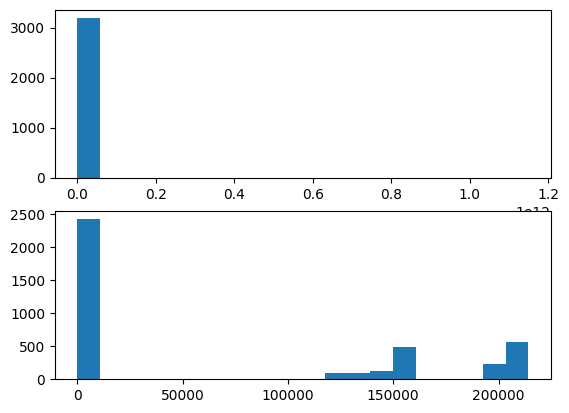

0.98575671875

In [ ]:
trainloader, valloader, benign_testloader,attack_testloader = load_datasets(final_df,'Autoencoder',partition_id=2,label_col_num = 3)
net = VAE(115,58,29)

for epoch in range(5):
    train_VAE(net, trainloader, 1)
    loss,loss_history= validation_VAE(net, valloader)
    #print(loss,loss_history)
    RE_MED = np.median(loss_history)
    RE_MAD = np.median(np.abs(loss_history - RE_MED))
    threshold = RE_MED + 5*RE_MAD
    print(f"Epoch {epoch+1}: validation loss {loss}")
    print(f'validation_loss_mean:{np.mean(loss_history)},validation_loss_std:{np.std(loss_history)}')
print('BENIGN:')
benign_MSE, benign_MSE_history,false_positive = test_VAE(net, benign_testloader,threshold)
print("ATTACK:")
attack_MSE, attack_MSE_history,true_positive = test_VAE(net, attack_testloader,threshold)
print(f'fpr:{false_positive}')
print(f'tpr:{true_positive}')
print(f"Final test set performance:\n\t benign loss {benign_MSE}")
print(f"Final test set performance:\n\t attack loss {attack_MSE}")
plt.subplot(2,1,1)
plt.hist(benign_MSE_history,bins =20)
plt.subplot(2,1,2)
plt.hist(attack_MSE_history,bins = 20)
plt.show()
plot_roc(benign_MSE_history,attack_MSE_history,False)

In [ ]:
## The first step toward creating a ClientApp is to implement a subclasses of flwr.client.Client or flwr.client.NumPyClient.
## We use NumPyClient in this tutorial because it is easier to implement and requires us to write less boilerplate.
class FlowerClient_Train(NumPyClient):
    def __init__(self, net, partition_id,trainloader, valloader, benign_testloader, attack_testloader):
        self.net = net
        self.trainloader = trainloader
        self.valloader = valloader
        self.benign_testloader = benign_testloader
        self.attack_testloader = attack_testloader
        self.partition_id = partition_id

    def get_parameters(self, config):
        return get_parameters(self.net)
    ## Training
    def fit(self, parameters, config):
      print(f"[Client {self.partition_id}] fit, config: {config}")
      set_parameters(self.net, parameters)
      loss = train_VAE(self.net, self.trainloader, num_epochs=4)
      return get_parameters(self.net), len(self.trainloader), {'train_loss':loss}
    ## Validation on subset of benign data to select threshold
    def evaluate(self, parameters, config):
      print(f"[Client {self.partition_id}] evaluate, config: {config}")
      set_parameters(self.net, parameters)
      loss,val_loss_history = validation_VAE(self.net,self.valloader)
      ## calculate threshold based on MAD to make it more robust to outliers in normal data
      median = np.median(val_loss_history)
      MAD = np.median(np.abs(val_loss_history - median))
      threshold = median +3*MAD
      return float(loss), len(self.valloader), {'Client':self.partition_id,'validation_loss':loss,'validation_threshold':threshold}

In [ ]:
def client_fn_train(context: Context) -> Client:
    """Create a Flower client representing a single organization."""

    # Load model
    #net = Autoencoder(115,58,29).to(DEVICE)
    net = VAE(115,58,29)

    # Load data (CIFAR-10)
    # Note: each client gets a different trainloader/valloader, so each client
    # will train and evaluate on their own unique data partition
    # Read the node_config to fetch data partition associated to this node
    # The value of partition-id is retrieved from the node_config dictionary in the Context object, which holds the information that persists throughout each training round.
    partition_id = context.node_config["partition-id"]
    trainloader, valloader, benign_testloader,attack_testloader = load_datasets(final_df, 'Autoencoder',partition_id=partition_id,label_col_num = 3)

    # Create a single Flower client representing a single organization
    # FlowerClient is a subclass of NumPyClient, so we need to call .to_client()
    # to convert it to a subclass of `flwr.client.Client`
    return FlowerClient_Train(net, partition_id,trainloader, valloader,benign_testloader,attack_testloader).to_client()


# Create the ClientApp
client = ClientApp(client_fn=client_fn_train)

In [ ]:
global_model_trained = VAE(115,58,29)

In [ ]:
from typing import Union, Optional, Dict
from flwr.server.client_proxy import ClientProxy
from flwr.common import FitRes,Parameters, FitIns
from flwr.server.client_manager import ClientManager

class SaveModelStrategy(FedAvg):
    def aggregate_fit(
        self,
        server_round: int,
        results: List[Tuple[flwr.server.client_proxy.ClientProxy, flwr.common.FitRes]],
        failures: List[Union[Tuple[ClientProxy, FitRes], BaseException]],
    ) -> Tuple[Optional[Parameters], Dict[str, Scalar]]:
        """Aggregate model weights using weighted average and store checkpoint"""

        # Call aggregate_fit from base class (FedAvg) to aggregate parameters and metrics
        aggregated_parameters, aggregated_metrics = super().aggregate_fit(
            server_round, results, failures
        )


        if aggregated_parameters is not None:
            print(f"Saving round {server_round} aggregated_parameters...")

            # Convert `Parameters` to `List[np.ndarray]`
            aggregated_ndarrays: List[np.ndarray] = flwr.common.parameters_to_ndarrays(
                aggregated_parameters
            )

            # Convert `List[np.ndarray]` to PyTorch`state_dict`
            params_dict = zip(global_model_trained.state_dict().keys(), aggregated_ndarrays)
            state_dict = OrderedDict({k: torch.tensor(v) for k, v in params_dict})
            global_model_trained.load_state_dict(state_dict, strict=True)

            # Save the model
            torch.save(global_model_trained.state_dict(), f"VAE_model_round_{server_round}.pth")

        return aggregated_parameters, aggregated_metrics


In [ ]:
def server_fn(context: Context) -> ServerAppComponents:
    """Construct components that set the ServerApp behaviour.

    You can use settings in `context.run_config` to parameterize the
    construction of all elements (e.g the strategy or the number of rounds)
    wrapped in the returned ServerAppComponents object.
    """

    # Create FedAvg strategy
    strategy = SaveModelStrategy(
        fraction_fit=1,
        fraction_evaluate=1,
        min_fit_clients=1,
        min_evaluate_clients=1,
        min_available_clients=9,
        evaluate_metrics_aggregation_fn=threshold_selection,  # <-- pass the metric aggregation function, return the max loss in each validation round
        fit_metrics_aggregation_fn=average_loss,
    )

    # Configure the server for 10 rounds of training
    config = ServerConfig(num_rounds=10)

    return ServerAppComponents(strategy=strategy, config=config)

In [ ]:
# Create a new server instance with the updated FedAvg strategy
server = ServerApp(server_fn=server_fn)

# Run simulation
run_simulation(
    server_app=server,
    client_app=client,
    num_supernodes=NUM_CLIENTS,
    backend_config=backend_config,
)

INFO :      Starting Flower ServerApp, config: num_rounds=10, no round_timeout
INFO :      
INFO :      [INIT]
INFO :      Requesting initial parameters from one random client
(pid=342236) 2024-10-24 01:37:22.718277: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
(pid=342236) 2024-10-24 01:37:22.773098: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
(pid=342236) 2024-10-24 01:37:22.789778: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
(pid=342240) 2024-10-24 01:37:25.494904: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
INFO :      R

(ClientAppActor pid=342240) [Client 0] fit, config: {}
(ClientAppActor pid=342240) Epoch [1/4], Train Loss: 56.1435
(ClientAppActor pid=342232) [Client 7] fit, config: {}
(ClientAppActor pid=342240) Epoch [2/4], Train Loss: 21.2526
(ClientAppActor pid=342239) [Client 1] fit, config: {}
(ClientAppActor pid=342240) Epoch [3/4], Train Loss: 19.0195
(ClientAppActor pid=342232) Epoch [1/4], Train Loss: 155.8586
(ClientAppActor pid=342236) Epoch [1/4], Train Loss: 131.5382
(ClientAppActor pid=342240) [Client 8] fit, config: {} [repeated 6x across cluster] (Ray deduplicates logs by default. Set RAY_DEDUP_LOGS=0 to disable log deduplication, or see https://docs.ray.io/en/master/ray-observability/ray-logging.html#log-deduplication for more options.)
(ClientAppActor pid=342239) Epoch [4/4], Train Loss: 58.2961 [repeated 23x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[18.441308975219727, 73.46189880371094, 58.29610061645508, 71.53173828125, 92.65937805175781, 51.675872802734375, 86.10749053955078, 61.04936599731445, 101.15218353271484]
Saving round 1 aggregated_parameters...
(ClientAppActor pid=342240) [Client 2] evaluate, config: {}


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 2]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 0 threshold: 0.08737159706652164
Client 2 threshold: 0.12888560071587563
Client 4 threshold: 0.10648985579609871
Client 5 threshold: 0.1116507537662983
Client 6 threshold: 0.33131067268550396
Client 8 threshold: 0.10097280889749527
Client 7 threshold: 0.1787952557206154
Client 3 threshold: 0.13937057554721832
Client 1 threshold: 0.1389838457107544
(ClientAppActor pid=342240) [Client 0] fit, config: {}
(ClientAppActor pid=342237) Epoch [4/4], Train Loss: 101.1522 [repeated 8x across cluster]
(ClientAppActor pid=342240) [Client 8] evaluate, config: {} [repeated 8x across cluster]
(ClientAppActor pid=342232) [Client 5] fit, config: {} [repeated 7x across cluster]
(ClientAppActor pid=342235) Epoch [2/4], Train Loss: 65.5883 [repeated 16x across cluster]
(ClientAppActor pid=342240) [Client 8] fit, config: {}
(ClientAppActor pid=342240) Epoch [3/4], Train Loss: 49.1694 [repeated 19x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[66.13458251953125, 48.90382385253906, 80.78243255615234, 53.23347091674805, 59.729244232177734, 18.189393997192383, 57.716392517089844, 86.79006958007812, 81.38693237304688]
Saving round 2 aggregated_parameters...
(ClientAppActor pid=342239) [Client 5] evaluate, config: {}


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 3]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 3 threshold: 0.368603840470314
Client 2 threshold: 0.27867456525564194
Client 5 threshold: 0.24761249870061874
Client 0 threshold: 0.10383445397019386
Client 7 threshold: 0.40350309014320374
Client 6 threshold: 0.7002510502934456
Client 1 threshold: 0.47797276079654694
Client 8 threshold: 0.21223917603492737
Client 4 threshold: 0.26010144501924515
(ClientAppActor pid=342238) [Client 6] fit, config: {}
(ClientAppActor pid=342235) Epoch [1/4], Train Loss: 50.3028 [repeated 3x across cluster]
(ClientAppActor pid=342239) [Client 8] evaluate, config: {} [repeated 8x across cluster]
(ClientAppActor pid=342239) [Client 3] fit, config: {} [repeated 8x across cluster]
(ClientAppActor pid=342236) Epoch [3/4], Train Loss: 59.0034 [repeated 24x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[58.8444709777832, 47.97134780883789, 18.183700561523438, 80.84400939941406, 79.3065414428711, 54.82101058959961, 79.52493286132812, 65.79949188232422, 52.38573455810547]
Saving round 3 aggregated_parameters...
(ClientAppActor pid=342237) [Client 4] evaluate, config: {}


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 4]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 7 threshold: 0.5612032264471054
Client 2 threshold: 0.35225457698106766
Client 1 threshold: 0.6119977533817291
Client 8 threshold: 0.26184504479169846
Client 5 threshold: 0.32659849524497986
Client 6 threshold: 0.924463540315628
Client 3 threshold: 0.4628728926181793
Client 4 threshold: 0.34155072271823883
Client 0 threshold: 0.1258583664894104
(ClientAppActor pid=342237) [Client 3] fit, config: {}
(ClientAppActor pid=342239) Epoch [4/4], Train Loss: 79.5249 [repeated 10x across cluster]
(ClientAppActor pid=342237) [Client 8] evaluate, config: {} [repeated 8x across cluster]
(ClientAppActor pid=342235) [Client 0] fit, config: {} [repeated 7x across cluster]
(ClientAppActor pid=342232) Epoch [3/4], Train Loss: 65.9125 [repeated 19x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


(ClientAppActor pid=342236) [Client 8] fit, config: {}
[65.64248657226562, 80.66419219970703, 78.88197326660156, 47.54999923706055, 53.94792938232422, 57.59165573120117, 18.204626083374023, 79.86894226074219, 52.745018005371094]
Saving round 4 aggregated_parameters...
(ClientAppActor pid=342232) [Client 6] evaluate, config: {}
(ClientAppActor pid=342236) Epoch [4/4], Train Loss: 47.5500 [repeated 17x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 5]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 8 threshold: 0.26320217549800873
Client 3 threshold: 0.46727682650089264
Client 0 threshold: 0.1269429624080658
Client 4 threshold: 0.34962594509124756
Client 5 threshold: 0.34434783458709717
Client 6 threshold: 0.8386837467551231
Client 2 threshold: 0.35973314940929413
Client 7 threshold: 0.5603139400482178
Client 1 threshold: 0.628434807062149
(ClientAppActor pid=342240) [Client 0] fit, config: {}
(ClientAppActor pid=342240) [Client 8] evaluate, config: {} [repeated 8x across cluster]
(ClientAppActor pid=342238) Epoch [2/4], Train Loss: 77.4835 [repeated 16x across cluster]
(ClientAppActor pid=342236) [Client 8] fit, config: {} [repeated 8x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[58.51145553588867, 65.6212387084961, 53.6205940246582, 52.458351135253906, 76.85745239257812, 47.533729553222656, 80.4541015625, 74.38703155517578, 18.208982467651367]
Saving round 5 aggregated_parameters...
(ClientAppActor pid=342236) Epoch [4/4], Train Loss: 47.5337 [repeated 20x across cluster]
(ClientAppActor pid=342236) [Client 0] evaluate, config: {}


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 6]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 6 threshold: 0.7650454491376877
Client 3 threshold: 0.4440806955099106
Client 8 threshold: 0.27214713394641876
Client 0 threshold: 0.1266089752316475
Client 2 threshold: 0.337067149579525
Client 4 threshold: 0.3559516668319702
Client 7 threshold: 0.6077830493450165
Client 1 threshold: 0.6139044165611267
Client 5 threshold: 0.3363017588853836
(ClientAppActor pid=342236) [Client 7] fit, config: {}
(ClientAppActor pid=342234) 
(ClientAppActor pid=342234) Epoch [2/4], Train Loss: 81.2322 [repeated 11x across cluster]
(ClientAppActor pid=342235) [Client 8] evaluate, config: {} [repeated 8x across cluster]
(ClientAppActor pid=342232) [Client 6] fit, config: {} [repeated 7x across cluster]
(ClientAppActor pid=342237) Epoch [3/4], Train Loss: 47.7272 [repeated 24x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[47.63016891479492, 79.34507751464844, 65.61216735839844, 71.98222351074219, 58.63094711303711, 18.230667114257812, 52.65282440185547, 53.69798278808594, 80.73921203613281]
Saving round 6 aggregated_parameters...
(ClientAppActor pid=342235) [Client 5] evaluate, config: {}
(ClientAppActor pid=342237) [Client 8] fit, config: {}


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 7]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 3 threshold: 0.4418645650148392
Client 2 threshold: 0.36633096635341644
Client 1 threshold: 0.6474361419677734
Client 6 threshold: 0.8496680036187172
Client 8 threshold: 0.26200708001852036
Client 7 threshold: 0.582801952958107
Client 5 threshold: 0.3550855964422226
Client 0 threshold: 0.1220669224858284
Client 4 threshold: 0.36385180056095123
(ClientAppActor pid=342240) [Client 0] fit, config: {}
(ClientAppActor pid=342232) Epoch [1/4], Train Loss: 66.0653 [repeated 9x across cluster]
(ClientAppActor pid=342240) [Client 8] evaluate, config: {} [repeated 8x across cluster]
(ClientAppActor pid=342238) [Client 1] fit, config: {} [repeated 7x across cluster]
(ClientAppActor pid=342239) Epoch [4/4], Train Loss: 57.5739 [repeated 24x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[57.57394790649414, 51.93053436279297, 79.97882843017578, 75.22836303710938, 65.57841491699219, 18.22308349609375, 47.533206939697266, 70.12300109863281, 53.332088470458984]
Saving round 7 aggregated_parameters...
(ClientAppActor pid=342235) [Client 8] fit, config: {}
(ClientAppActor pid=342236) [Client 4] evaluate, config: {}


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 8]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 7 threshold: 0.5660194903612137
Client 1 threshold: 0.6132473945617676
Client 4 threshold: 0.3650558739900589
Client 3 threshold: 0.4318905621767044
Client 2 threshold: 0.37097975611686707
Client 6 threshold: 0.8336027786135674
Client 8 threshold: 0.2631800100207329
Client 5 threshold: 0.35622330009937286
Client 0 threshold: 0.12192979454994202
(ClientAppActor pid=342236) [Client 4] fit, config: {}
(ClientAppActor pid=342235) Epoch [4/4], Train Loss: 47.5332 [repeated 4x across cluster]
(ClientAppActor pid=342240) [Client 8] evaluate, config: {} [repeated 8x across cluster]
(ClientAppActor pid=342238) [Client 8] fit, config: {} [repeated 8x across cluster]
(ClientAppActor pid=342238) Epoch [4/4], Train Loss: 52.1704 [repeated 25x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[76.04584503173828, 79.69205474853516, 18.20578956604004, 71.68955993652344, 65.42132568359375, 47.52394104003906, 52.17036437988281, 57.933990478515625, 53.63218307495117]
Saving round 8 aggregated_parameters...
(ClientAppActor pid=342237) [Client 5] evaluate, config: {}
(ClientAppActor pid=342238) Epoch [4/4], Train Loss: 47.5239 [repeated 11x across cluster]


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 9]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 4 threshold: 0.3835543543100357
Client 5 threshold: 0.3757122755050659
Client 3 threshold: 0.4462548643350601
Client 8 threshold: 0.27332260459661484
Client 2 threshold: 0.37679824233055115
Client 1 threshold: 0.5943085253238678
Client 7 threshold: 0.6206373572349548
Client 0 threshold: 0.12587785348296165
Client 6 threshold: 0.8259234726428986
(ClientAppActor pid=342240) [Client 4] fit, config: {}
(ClientAppActor pid=342237) [Client 8] evaluate, config: {} [repeated 8x across cluster]
(ClientAppActor pid=342240) Epoch [2/4], Train Loss: 58.7284 [repeated 15x across cluster]
(ClientAppActor pid=342234) [Client 1] fit, config: {} [repeated 7x across cluster]
(ClientAppActor pid=342235) Epoch [3/4], Train Loss: 47.5915 [repeated 20x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


[52.6585693359375, 78.48896026611328, 18.22852897644043, 47.5904426574707, 53.02779006958008, 72.7996597290039, 57.960777282714844, 79.47550201416016, 65.33769989013672]
Saving round 9 aggregated_parameters...
(ClientAppActor pid=342238) [Client 6] evaluate, config: {}
(ClientAppActor pid=342235) [Client 8] fit, config: {}


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [ROUND 10]
INFO :      configure_fit: strategy sampled 9 clients (out of 9)


Client 0 threshold: 0.1390211023390293
Client 3 threshold: 0.44403839111328125
Client 1 threshold: 0.5362009704113007
Client 8 threshold: 0.2981419414281845
Client 2 threshold: 0.36762456595897675
Client 7 threshold: 0.6651841551065445
Client 5 threshold: 0.3805890381336212
Client 6 threshold: 0.8401494324207306
Client 4 threshold: 0.38790781795978546
(ClientAppActor pid=342232) [Client 7] fit, config: {}
(ClientAppActor pid=342234) Epoch [2/4], Train Loss: 52.5513 [repeated 10x across cluster]
(ClientAppActor pid=342237) [Client 8] evaluate, config: {} [repeated 8x across cluster]
(ClientAppActor pid=342235) [Client 4] fit, config: {} [repeated 7x across cluster]
(ClientAppActor pid=342234) Epoch [2/4], Train Loss: 48.0569 [repeated 25x across cluster]


INFO :      aggregate_fit: received 9 results and 0 failures
INFO :      configure_evaluate: strategy sampled 9 clients (out of 9)


(ClientAppActor pid=342234) [Client 8] fit, config: {}
[76.67377471923828, 69.2315902709961, 18.261592864990234, 57.06829833984375, 65.53272247314453, 52.6564826965332, 52.370609283447266, 78.98963165283203, 47.5084342956543]
Saving round 10 aggregated_parameters...
(ClientAppActor pid=342237) [Client 2] evaluate, config: {}


INFO :      aggregate_evaluate: received 9 results and 0 failures
INFO :      
INFO :      [SUMMARY]
INFO :      Run finished 10 round(s) in 131.72s
INFO :      	History (loss, distributed):
INFO :      		round 1: 53336152.08736234
INFO :      		round 2: 54742689.74271626
INFO :      		round 3: 60499875.727845125
INFO :      		round 4: 65878929.67556262
INFO :      		round 5: 67403900.40476637
INFO :      		round 6: 68074416.67154412
INFO :      		round 7: 74559654.24809372
INFO :      		round 8: 72132418.05726296
INFO :      		round 9: 75816280.23736538
INFO :      		round 10: 75421985.51525071
INFO :      	History (metrics, distributed, fit):
INFO :      	{'train_loss': [(1, 68.26392640007867),
INFO :      	                (2, 61.42959361606174),
INFO :      	                (3, 59.742360009087456),
INFO :      	                (4, 59.45520252651639),
INFO :      	                (5, 58.62810410393609),
INFO :      	                (6, 58.724585639105904),
INFO :      	              

Client 6 threshold: 0.8564375340938568
Client 4 threshold: 0.3962741643190384
Client 2 threshold: 0.3895636722445488
Client 1 threshold: 0.5358549356460571
Client 3 threshold: 0.4423791319131851
Client 0 threshold: 0.12781693413853645
Client 7 threshold: 0.6387120932340622
Client 8 threshold: 0.2737944945693016
Client 5 threshold: 0.38992318511009216
(ClientAppActor pid=342234) Epoch [4/4], Train Loss: 47.5084 [repeated 2x across cluster]
(ClientAppActor pid=342236) [Client 8] evaluate, config: {} [repeated 8x across cluster]


(pid=342239) 2024-10-24 01:37:22.977535: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered [repeated 7x across cluster]
(pid=342239) 2024-10-24 01:37:23.072836: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered [repeated 7x across cluster]
(pid=342239) 2024-10-24 01:37:23.097471: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered [repeated 7x across cluster]
(pid=342239) 2024-10-24 01:37:26.113521: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT [repeated 7x across cluster]


In [ ]:
# Example usage
input_dim = 115
hidden_dim = 64
latent_dim = 32
vae = VAE(input_dim=input_dim, hidden_dim=hidden_dim, latent_dim=latent_dim)

# Dummy input tensor with batch size of 10
x = torch.randn(10, input_dim)

# Forward pass
reconstruction, mean, logvar = vae(x)

# Calculate loss
loss = vae_loss(reconstruction, x, mean, logvar)
print(f'Loss: {loss.item()}')

## **Loading UNSW-15 dataset**

In [ ]:
from sklearn.preprocessing import MinMaxScaler
from torch.utils.data import TensorDataset

NUM_CLIENTS = 9
BATCH_SIZE = 32


def load_datasets_unsw(dataset,model_type:str,partition_id: int,label_col_num:int):
    partition = dataset.loc[dataset['client_id'] == partition_id+1]
    feature_columns = partition.columns[:-label_col_num]
    partition_train_test = {}
    if model_type == 'Autoencoder':
      # select normal data profile to train
      partition_benign = partition.loc[partition['label']==0]
      #print(partition_benign)
      partition_attack = partition.loc[partition['label']==1]
      partition_train_test['train'] = partition_benign.iloc[:int(0.39*len(partition_benign))-1]
      partition_train_test['val'] = partition_benign.iloc[int(0.39*len(partition_benign)):int(0.78*len(partition_benign))]
      #partition_train_test['test_benign'] = pd.concat([partition_benign.iloc[int(0.8*len(partition_benign)):],partition_attack.iloc[:len(partition_benign)]])
      partition_train_test['test_benign'] = partition_benign.iloc[int(0.8*len(partition_benign)):]
      partition_train_test['test_attack'] = partition_attack.iloc[:len(partition_benign)]
    scaler = MinMaxScaler()
    scaler.fit(partition_train_test['train'][feature_columns])
    X_train = torch.tensor(scaler.transform(partition_train_test['train'][feature_columns]))
    #print(f'train_max:{X_train.max()}')
    y_train = torch.tensor(partition_train_test['train']['label'].values)
    X_val = torch.tensor(scaler.transform(partition_train_test['val'][feature_columns]))
    y_val = torch.tensor(partition_train_test['val']['label'].values)
    #print(f'val_max:{X_val.max()}')
    X_test_benign = torch.tensor(scaler.transform(partition_train_test['test_benign'][feature_columns]))
    y_test_benign = torch.tensor(partition_train_test['test_benign']['label'].values)
    #print(f'benign_max:{X_test_benign.max()}')
    X_test_attack = torch.tensor(scaler.transform(partition_train_test['test_attack'][feature_columns]))
    y_test_attack = torch.tensor(partition_train_test['test_attack']['label'].values)
    #print(f'attack_max:{X_test_attack.max()}')
    train_dataset = TensorDataset(X_train, y_train)
    val_dataset = TensorDataset(X_val, y_val)
    test_benign_dataset = TensorDataset(X_test_benign, y_test_benign)
    test_attack_dataset = TensorDataset(X_test_attack, y_test_attack)
    trainloader = DataLoader(train_dataset, batch_size=BATCH_SIZE)
    valloader = DataLoader(val_dataset, batch_size=BATCH_SIZE)
    benign_testloader = DataLoader(test_benign_dataset, batch_size=BATCH_SIZE)
    attack_testloader = DataLoader(test_attack_dataset, batch_size=BATCH_SIZE)
    return trainloader, valloader, benign_testloader, attack_testloader

## **Try implement client-specific learning configuration**

In [ ]:
from flwr.common import (
    Code,
    EvaluateIns,
    EvaluateRes,
    FitIns,
    FitRes,
    GetParametersIns,
    GetParametersRes,
    Status,
    ndarrays_to_parameters,
    parameters_to_ndarrays,
)


class FlowerClient(Client):
    def __init__(self, partition_id, net, trainloader, valloader):
        self.partition_id = partition_id
        self.net = net
        self.trainloader = trainloader
        self.valloader = valloader

    def get_parameters(self, ins: GetParametersIns) -> GetParametersRes:
        print(f"[Client {self.partition_id}] get_parameters")

        # Get parameters as a list of NumPy ndarray's
        ndarrays: List[np.ndarray] = get_parameters(self.net)

        # Serialize ndarray's into a Parameters object
        parameters = ndarrays_to_parameters(ndarrays)

        # Build and return response
        status = Status(code=Code.OK, message="Success")
        return GetParametersRes(
            status=status,
            parameters=parameters,
        )

    def fit(self, ins: FitIns) -> FitRes:
        print(f"[Client {self.partition_id}] fit, config: {ins.config}")

        # Deserialize parameters to NumPy ndarray's
        parameters_original = ins.parameters
        ndarrays_original = parameters_to_ndarrays(parameters_original)

        # Update local model, train, get updated parameters
        set_parameters(self.net, ndarrays_original)
        train(self.net, self.trainloader, epochs=1)
        ndarrays_updated = get_parameters(self.net)

        # Serialize ndarray's into a Parameters object
        parameters_updated = ndarrays_to_parameters(ndarrays_updated)

        # Build and return response
        status = Status(code=Code.OK, message="Success")
        return FitRes(
            status=status,
            parameters=parameters_updated,
            num_examples=len(self.trainloader),
            metrics={},
        )

    def evaluate(self, ins: EvaluateIns) -> EvaluateRes:
        print(f"[Client {self.partition_id}] evaluate, config: {ins.config}")

        # Deserialize parameters to NumPy ndarray's
        parameters_original = ins.parameters
        ndarrays_original = parameters_to_ndarrays(parameters_original)

        set_parameters(self.net, ndarrays_original)
        loss, accuracy = test(self.net, self.valloader)

        # Build and return response
        status = Status(code=Code.OK, message="Success")
        return EvaluateRes(
            status=status,
            loss=float(loss),
            num_examples=len(self.valloader),
            metrics={"accuracy": float(accuracy)},
        )


def client_fn(context: Context) -> Client:
    net = Net().to(DEVICE)
    partition_id = context.node_config["partition-id"]
    num_partitions = context.node_config["num-partitions"]
    trainloader, valloader, _ = load_datasets(partition_id, num_partitions)
    return FlowerClient(partition_id, net, trainloader, valloader).to_client()


# Create the ClientApp
client = ClientApp(client_fn=client_fn)